# Your first neural network

In this project, you'll build your first neural network and use it to predict daily bike rental ridership. We've provided some of the code, but left the implementation of the neural network up to you (for the most part). After you've submitted this project, feel free to explore the data and the model more.



In [71]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load and prepare the data

A critical step in working with neural networks is preparing the data correctly. Variables on different scales make it difficult for the network to efficiently learn the correct weights. Below, we've written the code to load and prepare the data. You'll learn more about this soon!

In [72]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)

In [73]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Checking out the data

This dataset has the number of riders for each hour of each day from January 1 2011 to December 31 2012. The number of riders is split between casual and registered, summed up in the `cnt` column. You can see the first few rows of the data above.

Below is a plot showing the number of bike riders over the first 10 days or so in the data set. (Some days don't have exactly 24 entries in the data set, so it's not exactly 10 days.) You can see the hourly rentals here. This data is pretty complicated! The weekends have lower over all ridership and there are spikes when people are biking to and from work during the week. Looking at the data above, we also have information about temperature, humidity, and windspeed, all of these likely affecting the number of riders. You'll be trying to capture all this with your model.

/Users/pratik.gaur/anaconda3/envs/deep-learning/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1235: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticklabels)


<AxesSubplot:xlabel='dteday'>

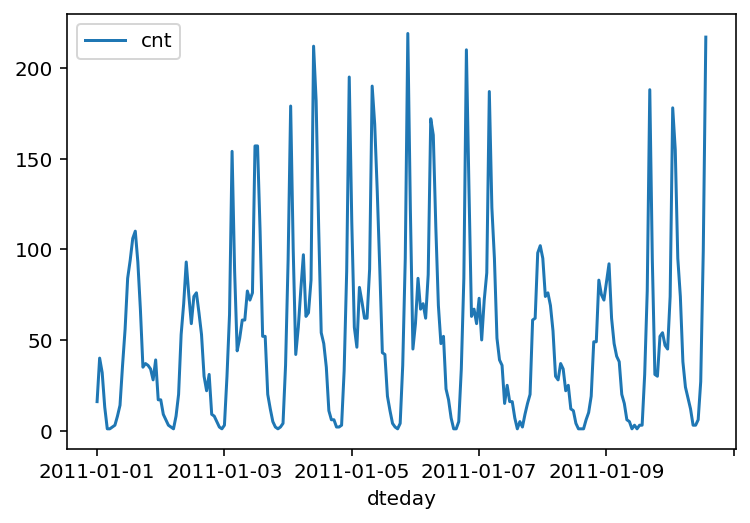

In [74]:
rides[:24*10].plot(x='dteday', y='cnt')

### Dummy variables
Here we have some categorical variables like season, weather, month. To include these in our model, we'll need to make binary dummy variables. This is simple to do with Pandas thanks to `get_dummies()`.

In [75]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0.22,0.80,0.0,8,32,40,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0.22,0.80,0.0,5,27,32,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0.24,0.75,0.0,3,10,13,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0.24,0.75,0.0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1


### Scaling target variables
To make training the network easier, we'll standardize each of the continuous variables. That is, we'll shift and scale the variables such that they have zero mean and a standard deviation of 1.

The scaling factors are saved so we can go backwards when we use the network for predictions.

In [76]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### Splitting the data into training, testing, and validation sets

We'll save the data for the last approximately 21 days to use as a test set after we've trained the network. We'll use this set to make predictions and compare them with the actual number of riders.

In [77]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]

We'll split the data into two sets, one for training and one for validating as the network is being trained. Since this is time series data, we'll train on historical data, then try to predict on future data (the validation set).

In [78]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]




## Time to build the network

Below you'll build your network. We've built out the structure. You'll implement both the forward pass and backwards pass through the network. You'll also set the hyperparameters: the learning rate, the number of hidden units, and the number of training passes.

<img src="assets/neural_network.png" width=300px>

The network has two layers, a hidden layer and an output layer. The hidden layer will use the sigmoid function for activations. The output layer has only one node and is used for the regression, the output of the node is the same as the input of the node. That is, the activation function is $f(x)=x$. A function that takes the input signal and generates an output signal, but takes into account the threshold, is called an activation function. We work through each layer of our network calculating the outputs for each neuron. All of the outputs from one layer become inputs to the neurons on the next layer. This process is called *forward propagation*.

We use the weights to propagate signals forward from the input to the output layers in a neural network. We use the weights to also propagate error backwards from the output back into the network to update our weights. This is called *backpropagation*.

> **Hint:** You'll need the derivative of the output activation function ($f(x) = x$) for the backpropagation implementation. If you aren't familiar with calculus, this function is equivalent to the equation $y = x$. What is the slope of that equation? That is the derivative of $f(x)$.

Below, you have these tasks:
1. Implement the sigmoid function to use as the activation function. Set `self.activation_function` in `__init__` to your sigmoid function.
2. Implement the forward pass in the `train` method.
3. Implement the backpropagation algorithm in the `train` method, including calculating the output error.
4. Implement the forward pass in the `run` method.
  

In [79]:
#############
# In the my_answers.py file, fill out the TODO sections as specified
#############

from my_answers import NeuralNetwork

In [80]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## Unit tests

Run these unit tests to check the correctness of your network implementation. This will help you be sure your network was implemented correctly befor you starting trying to train it. These tests must all be successful to pass the project.

In [94]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()
        
        network.train(inputs, targets)
        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

.....

weights_hidden_to_output is [[ 0.37275328]
 [-0.03172939]]
weights_input_to_hidden is [[ 0.10562014 -0.20185996]
 [ 0.39775194  0.50074398]
 [-0.29887597  0.19962801]]



----------------------------------------------------------------------
Ran 5 tests in 0.004s

OK


<unittest.runner.TextTestResult run=5 errors=0 failures=0>

## Training the network

Here you'll set the hyperparameters for the network. The strategy here is to find hyperparameters such that the error on the training set is low, but you're not overfitting to the data. If you train the network too long or have too many hidden nodes, it can become overly specific to the training set and will fail to generalize to the validation set. That is, the loss on the validation set will start increasing as the training set loss drops.

You'll also be using a method know as Stochastic Gradient Descent (SGD) to train the network. The idea is that for each training pass, you grab a random sample of the data instead of using the whole data set. You use many more training passes than with normal gradient descent, but each pass is much faster. This ends up training the network more efficiently. You'll learn more about SGD later.

### Choose the number of iterations
This is the number of batches of samples from the training data we'll use to train the network. The more iterations you use, the better the model will fit the data. However, this process can have sharply diminishing returns and can waste computational resources if you use too many iterations.  You want to find a number here where the network has a low training loss, and the validation loss is at a minimum. The ideal number of iterations would be a level that stops shortly after the validation loss is no longer decreasing.

### Choose the learning rate
This scales the size of weight updates. If this is too big, the weights tend to explode and the network fails to fit the data. Normally a good choice to start at is 0.1; however, if you effectively divide the learning rate by n_records, try starting out with a learning rate of 1. In either case, if the network has problems fitting the data, try reducing the learning rate. Note that the lower the learning rate, the smaller the steps are in the weight updates and the longer it takes for the neural network to converge.

### Choose the number of hidden nodes
In a model where all the weights are optimized, the more hidden nodes you have, the more accurate the predictions of the model will be.  (A fully optimized model could have weights of zero, after all.) However, the more hidden nodes you have, the harder it will be to optimize the weights of the model, and the more likely it will be that suboptimal weights will lead to overfitting. With overfitting, the model will memorize the training data instead of learning the true pattern, and won't generalize well to unseen data.  

Try a few different numbers and see how it affects the performance. You can look at the losses dictionary for a metric of the network performance. If the number of hidden units is too low, then the model won't have enough space to learn and if it is too high there are too many options for the direction that the learning can take. The trick here is to find the right balance in number of hidden units you choose.  You'll generally find that the best number of hidden nodes to use ends up being between the number of input and output nodes.

In [144]:
import sys

####################
### Set the hyperparameters in you myanswers.py file ###
####################

from my_answers import iterations, learning_rate, hidden_nodes, output_nodes


N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.iloc[batch].values, train_targets.iloc[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

weights_hidden_to_output is [[ 0.4021473 ]
 [-0.1703634 ]
 [ 0.2535105 ]
 [-0.73016997]
 [ 0.27580415]
 [-0.38968202]
 [ 0.08909873]
 [-0.25809644]
 [-0.03518217]
 [ 0.09308963]]
weights_input_to_hidden is [[-7.00344207e-02 -8.40352572e-03 -6.91261820e-02  2.39475404e-02
  -4.25037153e-02  6.92335656e-04 -5.91214361e-02  3.03425406e-02
  -6.85586654e-02  2.45300015e-02]
 [ 1.67005901e-02  2.94967094e-02 -1.05032942e-01  3.41101163e-02
  -1.40922517e-01  1.29705940e-01  7.36719663e-02 -5.12166343e-02
   8.45770872e-02 -1.24127494e-01]
 [ 1.03367913e-02 -4.20469685e-02 -2.63085895e-02 -3.15798993e-01
   6.81276163e-02  2.04355622e-01 -9.10726702e-02  1.69019391e-01
   1.90475321e-01  7.53694513e-03]
 [-5.61960374e-02  1.18759622e-01 -1.25451359e-01  1.96107294e-02
  -3.19203211e-01  2.54922977e-02 -1.00968400e-01 -6.12918551e-02
   1.08250533e-01  1.22934687e-01]
 [-1.30590389e-01 -1.09582439e-01 -6.03147756e-02 -5.34019485e-02
   1.16182103e-01  2.52449419e-02  5.65026286e-02  9.7573286

Progress: 0.0% ... Training loss: 0.985 ... Validation loss: 1.490weights_hidden_to_output is [[ 0.60524037]
 [ 0.02942558]
 [ 0.42897581]
 [-0.59442819]
 [ 0.50154094]
 [-0.1456526 ]
 [ 0.28372397]
 [-0.03796389]
 [ 0.19858239]
 [ 0.28755651]]
weights_input_to_hidden is [[-3.05776072e-02 -2.51897073e-02 -4.45311444e-02 -4.39201645e-02
  -1.66558263e-02 -3.63443555e-02 -5.04253471e-02  4.89245532e-03
  -7.19731498e-02  3.36670107e-02]
 [ 1.62771910e-02  2.96702356e-02 -1.05257668e-01  3.48521535e-02
  -1.41214676e-01  1.30107610e-01  7.35936851e-02 -5.09659457e-02
   8.46128641e-02 -1.24222909e-01]
 [ 6.85548548e-02 -6.67843814e-02  1.00025277e-02 -4.16120056e-01
   1.07262968e-01  1.49850006e-01 -7.81722624e-02  1.31730767e-01
   1.85455895e-01  2.10649434e-02]
 [-9.40150134e-02  1.35121888e-01 -1.49579653e-01  8.78249456e-02
  -3.44952877e-01  6.28910893e-02 -1.09477035e-01 -3.65540250e-02
   1.11643862e-01  1.14039145e-01]
 [-1.06937658e-01 -1.19743289e-01 -4.52640503e-02 -9.4467285

Progress: 0.1% ... Training loss: 1.573 ... Validation loss: 1.484weights_hidden_to_output is [[ 0.12878465]
 [-0.41212995]
 [ 0.07476197]
 [-1.03368096]
 [ 0.11631669]
 [-0.566362  ]
 [-0.16635781]
 [-0.40907745]
 [-0.23077976]
 [-0.20277591]]
weights_input_to_hidden is [[-6.10321025e-02 -2.67084163e-02 -6.56010462e-02 -1.51532077e-02
  -4.13064700e-02 -2.90320237e-02 -6.49000308e-02  6.79098875e-03
  -8.21561151e-02  1.93878763e-02]
 [ 1.24883592e-02  2.94789945e-02 -1.07912219e-01  3.83968262e-02
  -1.43814645e-01  1.31013825e-01  7.17291416e-02 -5.07150173e-02
   8.32972212e-02 -1.26130522e-01]
 [ 1.06811208e-01 -6.48973384e-02  3.71113695e-02 -4.50007702e-01
   1.39255311e-01  1.41002538e-01 -6.06272588e-02  1.29448714e-01
   1.97750636e-01  3.96105659e-02]
 [-1.45068796e-01  1.32628180e-01 -1.83378399e-01  1.38137911e-01
  -3.85596321e-01  7.55097348e-02 -1.33875937e-01 -3.32882150e-02
   9.44938277e-02  8.98392068e-02]
 [-1.24248272e-01 -1.20515892e-01 -5.67721075e-02 -7.9865736

Progress: 0.2% ... Training loss: 2.659 ... Validation loss: 3.910weights_hidden_to_output is [[ 0.79985294]
 [ 0.21405708]
 [ 0.60601153]
 [-0.45164406]
 [ 0.69696061]
 [ 0.08631019]
 [ 0.45883182]
 [ 0.1608043 ]
 [ 0.4167785 ]
 [ 0.46895214]]
weights_input_to_hidden is [[-0.03911237 -0.09636899 -0.05310547 -0.18005297 -0.02277734 -0.12500886
  -0.09310672 -0.06222393 -0.12133525 -0.01492076]
 [ 0.01293371  0.02807314 -0.10766308  0.03522333 -0.14341308  0.12922944
   0.07116196 -0.05207277  0.08251774 -0.12683235]
 [ 0.12054603 -0.10935265  0.04542966 -0.55186047  0.151118    0.08094074
  -0.07841903  0.0842119   0.17288618  0.01788904]
 [-0.15096447  0.15106142 -0.18734691  0.17112692 -0.39127181  0.10034485
  -0.12644434 -0.01413498  0.10512049  0.09932897]
 [-0.11972163 -0.13362191 -0.05425624 -0.110659    0.12298053 -0.01270741
   0.04959374  0.06886527 -0.08817966  0.10495675]
 [ 0.13439601 -0.19672414 -0.10482854  0.16965753 -0.10194101  0.02044848
  -0.10950772 -0.10033087 -0.

Progress: 0.4% ... Training loss: 4.317 ... Validation loss: 5.961weights_hidden_to_output is [[ 0.73839885]
 [ 0.2426147 ]
 [ 0.57660128]
 [-0.45209333]
 [ 0.64463627]
 [ 0.14651625]
 [ 0.41998296]
 [ 0.20519517]
 [ 0.44183402]
 [ 0.44922774]]
weights_input_to_hidden is [[-1.47078768e-01 -2.28827826e-01 -1.30971956e-01 -3.39689207e-01
  -1.14241654e-01 -2.70651297e-01 -2.13285232e-01 -1.83247234e-01
  -2.45227734e-01 -1.45250139e-01]
 [-9.26617891e-03  1.23382161e-02 -1.23282940e-01  2.84579682e-02
  -1.61092892e-01  1.14450403e-01  5.22743836e-02 -6.60812623e-02
   6.40430543e-02 -1.46582831e-01]
 [ 1.54552100e-01 -1.82132124e-01  7.05619171e-02 -7.19237438e-01
   1.80596100e-01 -2.36057289e-02 -1.04435688e-01  7.89444908e-03
   1.32355307e-01 -1.41497672e-02]
 [-1.66704690e-01  1.48604738e-01 -1.86425092e-01  1.71687992e-01
  -3.99082540e-01  1.04703397e-01 -1.26793654e-01 -1.45717449e-02
   9.89862411e-02  9.45943318e-02]
 [-1.67107685e-01 -1.53584893e-01 -8.72042222e-02 -1.0403208

Progress: 0.5% ... Training loss: 2.738 ... Validation loss: 2.206weights_hidden_to_output is [[ 0.17528566]
 [-0.25253214]
 [ 0.13922895]
 [-0.97881489]
 [ 0.19178714]
 [-0.35731583]
 [-0.09774676]
 [-0.24017388]
 [-0.07508764]
 [-0.10184416]]
weights_input_to_hidden is [[-2.05205019e-01 -2.46263719e-01 -1.72293011e-01 -3.12222411e-01
  -1.60641785e-01 -2.81106425e-01 -2.44974605e-01 -1.97183556e-01
  -2.77982515e-01 -1.79266690e-01]
 [-1.18035316e-02  1.14962718e-02 -1.24897371e-01  3.04089042e-02
  -1.63449667e-01  1.13875055e-01  5.07429468e-02 -6.69039272e-02
   6.24127282e-02 -1.48475003e-01]
 [ 1.71556647e-01 -1.73988640e-01  8.12172781e-02 -7.46633098e-01
   1.90185350e-01 -1.99355038e-02 -9.20240076e-02  1.32422449e-02
   1.40379528e-01 -8.86103072e-04]
 [-2.36961961e-01  1.21676095e-01 -2.32325956e-01  2.14549267e-01
  -4.37722136e-01  8.85064131e-02 -1.67752217e-01 -3.57765234e-02
   5.15054533e-02  4.60020943e-02]
 [-1.46509724e-01 -1.43428628e-01 -7.44502105e-02 -1.1706688

Progress: 0.6% ... Training loss: 1.078 ... Validation loss: 1.916weights_hidden_to_output is [[ 0.38233314]
 [-0.09288549]
 [ 0.30866886]
 [-0.8365363 ]
 [ 0.39725583]
 [-0.20147775]
 [ 0.08460646]
 [-0.08531208]
 [ 0.10840028]
 [ 0.08359038]]
weights_input_to_hidden is [[-1.94025914e-01 -2.59981503e-01 -1.64100731e-01 -3.51773043e-01
  -1.48930382e-01 -3.00532489e-01 -2.50687768e-01 -2.09933830e-01
  -2.82411639e-01 -1.85468140e-01]
 [-1.16845950e-02  1.13507421e-02 -1.24824815e-01  2.98097860e-02
  -1.63317660e-01  1.13659428e-01  5.06771225e-02 -6.70524456e-02
   6.23642680e-02 -1.48538844e-01]
 [ 1.79883009e-01 -1.83092126e-01  8.75812337e-02 -7.52614510e-01
   1.99253907e-01 -3.32963255e-02 -9.59505990e-02  4.62314417e-03
   1.37014955e-01 -5.17233396e-03]
 [-2.48770756e-01  1.34008834e-01 -2.41304034e-01  2.49694909e-01
  -4.51229639e-01  1.07505184e-01 -1.61909571e-01 -2.28406321e-02
   5.58227640e-02  5.21075350e-02]
 [-1.45401329e-01 -1.43232723e-01 -7.33747914e-02 -1.1514175

Progress: 0.7% ... Training loss: 0.780 ... Validation loss: 1.170weights_hidden_to_output is [[ 0.29804885]
 [-0.19346951]
 [ 0.24293652]
 [-0.97271347]
 [ 0.33307354]
 [-0.3057692 ]
 [-0.01677706]
 [-0.16730978]
 [ 0.02366195]
 [-0.01829212]]
weights_input_to_hidden is [[-1.97350029e-01 -2.59084429e-01 -1.66306336e-01 -3.36362864e-01
  -1.51812136e-01 -2.98255833e-01 -2.51616600e-01 -2.09267383e-01
  -2.83171982e-01 -1.86242613e-01]
 [-1.13024646e-02  1.12676139e-02 -1.24497339e-01  2.92671660e-02
  -1.62896058e-01  1.13466266e-01  5.07597657e-02 -6.71386492e-02
   6.24796846e-02 -1.48461897e-01]
 [ 1.96479127e-01 -1.86475645e-01  1.00322945e-01 -7.76173257e-01
   2.16322766e-01 -4.03664730e-02 -9.23772772e-02  1.32043358e-03
   1.41108645e-01 -1.67312506e-03]
 [-2.64290487e-01  1.38305198e-01 -2.52420926e-01  2.75851098e-01
  -4.64396956e-01  1.16963142e-01 -1.65346132e-01 -1.91079607e-02
   5.05325927e-02  4.83610943e-02]
 [-1.43208051e-01 -1.43909234e-01 -7.25286183e-02 -1.1212770

Progress: 0.8% ... Training loss: 0.814 ... Validation loss: 1.442weights_hidden_to_output is [[ 0.40160803]
 [-0.13599706]
 [ 0.33035285]
 [-0.93943818]
 [ 0.44055152]
 [-0.24877109]
 [ 0.05000162]
 [-0.10034043]
 [ 0.10715966]
 [ 0.05281906]]
weights_input_to_hidden is [[-1.77899340e-01 -2.69180291e-01 -1.51231599e-01 -3.70968082e-01
  -1.30572312e-01 -3.13724269e-01 -2.52544707e-01 -2.18246638e-01
  -2.81725098e-01 -1.87309845e-01]
 [-1.02477754e-02  1.07545082e-02 -1.23752324e-01  2.79970749e-02
  -1.61862006e-01  1.12546393e-01  5.07208547e-02 -6.76235858e-02
   6.25528060e-02 -1.48514486e-01]
 [ 2.13831411e-01 -1.95059406e-01  1.13924013e-01 -8.00447852e-01
   2.35504743e-01 -5.41894303e-02 -9.31983323e-02 -6.43399965e-03
   1.42369661e-01 -2.60910106e-03]
 [-2.77013392e-01  1.43978178e-01 -2.61799117e-01  2.91688178e-01
  -4.79237636e-01  1.26294479e-01 -1.64766484e-01 -1.39957778e-02
   4.96957069e-02  4.89877336e-02]
 [-1.37875631e-01 -1.46025829e-01 -6.83305677e-02 -1.2089339

Progress: 0.9% ... Training loss: 0.739 ... Validation loss: 1.178weights_hidden_to_output is [[ 0.39789783]
 [-0.16463043]
 [ 0.32779285]
 [-1.00033284]
 [ 0.44545946]
 [-0.26592704]
 [ 0.03660498]
 [-0.11397698]
 [ 0.10467087]
 [ 0.03270065]]
weights_input_to_hidden is [[-1.68911450e-01 -2.71494677e-01 -1.44244501e-01 -3.77685661e-01
  -1.21059869e-01 -3.18825571e-01 -2.51525137e-01 -2.20070825e-01
  -2.79176626e-01 -1.86244933e-01]
 [-9.46604288e-03  1.05229717e-02 -1.23123803e-01  2.84022573e-02
  -1.61221102e-01  1.12131565e-01  5.07665827e-02 -6.77417074e-02
   6.28039753e-02 -1.48434597e-01]
 [ 2.33127139e-01 -2.00632914e-01  1.28798331e-01 -8.30412493e-01
   2.55847142e-01 -6.42742819e-02 -9.09622745e-02 -1.05134113e-02
   1.47068288e-01 -2.25450752e-04]
 [-2.84477218e-01  1.45915569e-01 -2.66950985e-01  2.97081926e-01
  -4.85986938e-01  1.30889824e-01 -1.65533075e-01 -1.25795131e-02
   4.75641633e-02  4.80611913e-02]
 [-1.39676367e-01 -1.45253006e-01 -7.02274073e-02 -1.1116055

Progress: 1.0% ... Training loss: 0.726 ... Validation loss: 1.206weights_hidden_to_output is [[ 0.41229033]
 [-0.18633106]
 [ 0.34751089]
 [-1.05017326]
 [ 0.47860113]
 [-0.2865631 ]
 [ 0.02799798]
 [-0.11866695]
 [ 0.09954666]
 [ 0.0226132 ]]
weights_input_to_hidden is [[-1.59938007e-01 -2.73877481e-01 -1.36785207e-01 -3.82272975e-01
  -1.09970082e-01 -3.22563440e-01 -2.50822094e-01 -2.22169623e-01
  -2.77155111e-01 -1.85616707e-01]
 [-9.59202598e-03  1.05813077e-02 -1.23172249e-01  2.88068243e-02
  -1.61280525e-01  1.12201248e-01  5.07591120e-02 -6.77264065e-02
   6.27744137e-02 -1.48443902e-01]
 [ 2.50156989e-01 -2.05939028e-01  1.42715381e-01 -8.47870117e-01
   2.75220168e-01 -7.29956761e-02 -8.95435612e-02 -1.45981314e-02
   1.50912977e-01  1.03555138e-03]
 [-3.05110756e-01  1.53106045e-01 -2.82318627e-01  3.22704879e-01
  -5.06569128e-01  1.42925335e-01 -1.67190020e-01 -7.75219537e-03
   4.24417553e-02  4.65013972e-02]
 [-1.23560398e-01 -1.51136345e-01 -5.89584636e-02 -1.2903312

Progress: 1.1% ... Training loss: 0.711 ... Validation loss: 1.208weights_hidden_to_output is [[ 0.46025102]
 [-0.16267298]
 [ 0.39055052]
 [-1.06304421]
 [ 0.52536073]
 [-0.27589826]
 [ 0.05629115]
 [-0.09648501]
 [ 0.13536843]
 [ 0.05477769]]
weights_input_to_hidden is [[-1.44594727e-01 -2.79926392e-01 -1.24607136e-01 -4.00266320e-01
  -9.57363527e-02 -3.30672381e-01 -2.49953302e-01 -2.25777513e-01
  -2.73592787e-01 -1.84838856e-01]
 [-9.39748314e-03  1.04182330e-02 -1.23141194e-01  2.77389498e-02
  -1.61207036e-01  1.12018021e-01  5.07668977e-02 -6.77236740e-02
   6.28551996e-02 -1.48433451e-01]
 [ 2.70151680e-01 -2.13246691e-01  1.58952309e-01 -8.63100318e-01
   2.96864455e-01 -8.39724841e-02 -8.82475377e-02 -1.96663718e-02
   1.55511279e-01  2.10698030e-03]
 [-3.12328036e-01  1.55663551e-01 -2.88485504e-01  3.24136130e-01
  -5.14043091e-01  1.46589791e-01 -1.67609712e-01 -5.62669433e-03
   4.07183648e-02  4.61264918e-02]
 [-1.26193301e-01 -1.48959717e-01 -6.02995486e-02 -1.1214778

Progress: 1.2% ... Training loss: 0.700 ... Validation loss: 1.122weights_hidden_to_output is [[ 0.439067  ]
 [-0.1957533 ]
 [ 0.37961833]
 [-1.12552799]
 [ 0.50666299]
 [-0.31508034]
 [ 0.01875454]
 [-0.13128799]
 [ 0.10757175]
 [ 0.01509176]]
weights_input_to_hidden is [[-1.42852446e-01 -2.80232816e-01 -1.21969880e-01 -3.98349597e-01
  -9.41880091e-02 -3.30825683e-01 -2.49751253e-01 -2.25970500e-01
  -2.72948285e-01 -1.84711474e-01]
 [-9.71740101e-03  1.05432657e-02 -1.23222055e-01  2.83438473e-02
  -1.61262011e-01  1.12189779e-01  5.07603157e-02 -6.77177414e-02
   6.27637415e-02 -1.48452506e-01]
 [ 2.80401232e-01 -2.16390790e-01  1.68144791e-01 -8.80251572e-01
   3.08784519e-01 -8.96416576e-02 -8.70123750e-02 -2.17099931e-02
   1.58101068e-01  3.31846710e-03]
 [-3.21243689e-01  1.58687205e-01 -2.93950333e-01  3.36095310e-01
  -5.23978086e-01  1.51750388e-01 -1.68472035e-01 -4.08225907e-03
   3.80390867e-02  4.51996015e-02]
 [-1.30553375e-01 -1.48230799e-01 -6.48479869e-02 -1.0039065

Progress: 1.3% ... Training loss: 0.694 ... Validation loss: 1.205weights_hidden_to_output is [[ 0.53789193]
 [-0.16294554]
 [ 0.46407726]
 [-1.13385936]
 [ 0.61573968]
 [-0.28385394]
 [ 0.07058882]
 [-0.08668154]
 [ 0.1637274 ]
 [ 0.07648419]]
weights_input_to_hidden is [[-1.23262462e-01 -2.86115839e-01 -1.04766768e-01 -4.13047133e-01
  -7.33629556e-02 -3.40204795e-01 -2.49028963e-01 -2.30555702e-01
  -2.68682380e-01 -1.84089765e-01]
 [-9.93762507e-03  1.06318085e-02 -1.23374941e-01  2.88997277e-02
  -1.61524369e-01  1.12314872e-01  5.07516644e-02 -6.76589399e-02
   6.27156536e-02 -1.48459501e-01]
 [ 3.07745599e-01 -2.26167993e-01  1.91646371e-01 -9.01060155e-01
   3.38017043e-01 -1.03815186e-01 -8.60015189e-02 -2.82212607e-02
   1.64292871e-01  4.23950332e-03]
 [-3.47811595e-01  1.66820001e-01 -3.16708836e-01  3.68307526e-01
  -5.52069285e-01  1.65982781e-01 -1.69520046e-01  2.43554997e-03
   3.20281789e-02  4.43509793e-02]
 [-1.10974555e-01 -1.53834350e-01 -4.83686834e-02 -1.2329117

Progress: 1.4% ... Training loss: 0.695 ... Validation loss: 1.044weights_hidden_to_output is [[ 0.46554338]
 [-0.2227811 ]
 [ 0.41442563]
 [-1.19805111]
 [ 0.55225907]
 [-0.33348798]
 [ 0.01692598]
 [-0.12923397]
 [ 0.10943284]
 [ 0.01346119]]
weights_input_to_hidden is [[-1.35742723e-01 -2.82788863e-01 -1.13799748e-01 -3.90503317e-01
  -8.60364762e-02 -3.34747055e-01 -2.50547898e-01 -2.28929011e-01
  -2.72093552e-01 -1.85719555e-01]
 [-1.13895622e-02  1.10895322e-02 -1.24335573e-01  3.11821570e-02
  -1.62608426e-01  1.13048336e-01  5.06072287e-02 -6.74790335e-02
   6.22623802e-02 -1.48633837e-01]
 [ 3.06781583e-01 -2.26044139e-01  1.89951682e-01 -9.04756104e-01
   3.36468345e-01 -1.04273019e-01 -8.62210284e-02 -2.81380889e-02
   1.63597937e-01  4.01095081e-03]
 [-3.45982031e-01  1.66856786e-01 -3.12861734e-01  3.76347924e-01
  -5.47250873e-01  1.67474846e-01 -1.69342709e-01  2.53350997e-03
   3.22787424e-02  4.43606554e-02]
 [-1.00806539e-01 -1.56632171e-01 -4.00643362e-02 -1.3658033

Progress: 1.5% ... Training loss: 0.677 ... Validation loss: 1.195weights_hidden_to_output is [[ 0.51645271]
 [-0.20142846]
 [ 0.46236127]
 [-1.17916716]
 [ 0.59525567]
 [-0.31519778]
 [ 0.0392411 ]
 [-0.10678446]
 [ 0.14434593]
 [ 0.03409907]]
weights_input_to_hidden is [[-1.27680117e-01 -2.86150589e-01 -1.05427205e-01 -3.93951065e-01
  -7.66910327e-02 -3.39217618e-01 -2.50259120e-01 -2.30769564e-01
  -2.69966888e-01 -1.85475282e-01]
 [-1.05975156e-02  1.07348596e-02 -1.23562498e-01  3.05857780e-02
  -1.61668669e-01  1.12552525e-01  5.06319943e-02 -6.76793334e-02
   6.24682910e-02 -1.48614271e-01]
 [ 3.10961714e-01 -2.25677230e-01  1.95234159e-01 -8.84136757e-01
   3.43535485e-01 -1.03268763e-01 -8.61717586e-02 -2.78610141e-02
   1.64389835e-01  4.04042403e-03]
 [-3.61241089e-01  1.72918071e-01 -3.27251807e-01  3.87861165e-01
  -5.67382604e-01  1.75992983e-01 -1.69807441e-01  5.50452427e-03
   2.84551045e-02  4.39376880e-02]
 [-1.09659711e-01 -1.52451546e-01 -4.81916707e-02 -1.2084640

Progress: 1.6% ... Training loss: 0.665 ... Validation loss: 1.091weights_hidden_to_output is [[ 0.51275427]
 [-0.19966081]
 [ 0.46307147]
 [-1.18958179]
 [ 0.59110793]
 [-0.32360776]
 [ 0.03326579]
 [-0.10707243]
 [ 0.14549456]
 [ 0.03519678]]
weights_input_to_hidden is [[-1.17590236e-01 -2.89502493e-01 -9.56192604e-02 -4.01330096e-01
  -6.46235654e-02 -3.42933945e-01 -2.49552443e-01 -2.32606218e-01
  -2.66915215e-01 -1.84828711e-01]
 [-1.10358037e-02  1.08847152e-02 -1.23908523e-01  3.18240158e-02
  -1.62204211e-01  1.12845480e-01  5.05915129e-02 -6.75681227e-02
   6.23457353e-02 -1.48646377e-01]
 [ 3.09376336e-01 -2.24816930e-01  1.93457083e-01 -8.85538863e-01
   3.42632570e-01 -1.01402729e-01 -8.63253562e-02 -2.72778571e-02
   1.63289255e-01  3.80737103e-03]
 [-3.57150863e-01  1.71392723e-01 -3.22592807e-01  3.78935564e-01
  -5.61123919e-01  1.73485917e-01 -1.69354601e-01  4.64151648e-03
   2.97812226e-02  4.42137494e-02]
 [-1.17204445e-01 -1.50222175e-01 -5.49558178e-02 -1.1407812

Progress: 1.7% ... Training loss: 0.661 ... Validation loss: 1.091weights_hidden_to_output is [[ 0.49300022]
 [-0.23492629]
 [ 0.45391938]
 [-1.23098326]
 [ 0.57457115]
 [-0.35775197]
 [ 0.0035121 ]
 [-0.1323682 ]
 [ 0.11463318]
 [ 0.00545445]]
weights_input_to_hidden is [[-1.06980327e-01 -2.92269643e-01 -8.55807280e-02 -4.08621475e-01
  -5.24359112e-02 -3.47561512e-01 -2.48981103e-01 -2.34509042e-01
  -2.64194228e-01 -1.84226255e-01]
 [-1.27279312e-02  1.15202957e-02 -1.25258316e-01  3.47238950e-02
  -1.63920247e-01  1.13733918e-01  5.05050496e-02 -6.73297531e-02
   6.18801127e-02 -1.48745439e-01]
 [ 3.11071814e-01 -2.24363184e-01  1.95867385e-01 -8.83051695e-01
   3.46808302e-01 -1.01158342e-01 -8.62443801e-02 -2.77454150e-02
   1.63298747e-01  3.85746253e-03]
 [-3.65900573e-01  1.74693904e-01 -3.28942327e-01  3.96615550e-01
  -5.69705072e-01  1.79539049e-01 -1.69782853e-01  6.37714835e-03
   2.72444228e-02  4.36541989e-02]
 [-1.06570578e-01 -1.53457832e-01 -4.60528644e-02 -1.2178261

Progress: 1.8% ... Training loss: 0.661 ... Validation loss: 1.161weights_hidden_to_output is [[ 0.53130266]
 [-0.21455495]
 [ 0.4939775 ]
 [-1.21519898]
 [ 0.61340712]
 [-0.33677288]
 [ 0.02940258]
 [-0.11165708]
 [ 0.1472557 ]
 [ 0.02442583]]
weights_input_to_hidden is [[-9.57863766e-02 -2.96346194e-01 -7.47714867e-02 -4.17607081e-01
  -4.31148207e-02 -3.53850298e-01 -2.48906868e-01 -2.36984208e-01
  -2.61499606e-01 -1.84113974e-01]
 [-1.23597912e-02  1.13421259e-02 -1.24953096e-01  3.31417048e-02
  -1.63561373e-01  1.13449646e-01  5.05080013e-02 -6.74319692e-02
   6.19600025e-02 -1.48741294e-01]
 [ 3.15579356e-01 -2.24818683e-01  2.01189031e-01 -8.82348515e-01
   3.52599872e-01 -1.02645588e-01 -8.62055522e-02 -2.88422581e-02
   1.64246192e-01  3.90117636e-03]
 [-3.71559113e-01  1.74830608e-01 -3.33802829e-01  3.83194227e-01
  -5.77429755e-01  1.80485668e-01 -1.69792814e-01  6.54761377e-03
   2.63323692e-02  4.36253592e-02]
 [-1.10952271e-01 -1.49406090e-01 -4.85897544e-02 -8.6243909

Progress: 1.9% ... Training loss: 0.650 ... Validation loss: 1.067weights_hidden_to_output is [[ 0.53689213]
 [-0.22983362]
 [ 0.50020094]
 [-1.2375759 ]
 [ 0.62244077]
 [-0.3526237 ]
 [ 0.02300266]
 [-0.11817791]
 [ 0.1405941 ]
 [ 0.01332353]]
weights_input_to_hidden is [[-9.53704488e-02 -2.95647905e-01 -7.32657024e-02 -4.11793239e-01
  -4.11862054e-02 -3.52050617e-01 -2.48891360e-01 -2.36744788e-01
  -2.61573919e-01 -1.84133844e-01]
 [-1.32797666e-02  1.17844064e-02 -1.25397041e-01  3.58762936e-02
  -1.64138955e-01  1.14178545e-01  5.04625702e-02 -6.72629668e-02
   6.16889524e-02 -1.48778912e-01]
 [ 3.16151301e-01 -2.24175076e-01  2.02559283e-01 -8.80951202e-01
   3.55357504e-01 -1.01576292e-01 -8.62046000e-02 -2.88748711e-02
   1.63925248e-01  3.90277614e-03]
 [-3.85012996e-01  1.79277343e-01 -3.46000447e-01  4.01266992e-01
  -5.92497996e-01  1.87850872e-01 -1.70407757e-01  8.66748943e-03
   2.27017348e-02  4.30716161e-02]
 [-1.16120882e-01 -1.46853950e-01 -5.37452680e-02 -7.4709686

Progress: 2.0% ... Training loss: 0.644 ... Validation loss: 1.076weights_hidden_to_output is [[ 0.52172459]
 [-0.25685261]
 [ 0.49816049]
 [-1.28917778]
 [ 0.60979013]
 [-0.38501401]
 [-0.00553747]
 [-0.13674893]
 [ 0.12624389]
 [-0.00863923]]
weights_input_to_hidden is [[-8.48185128e-02 -2.99657206e-01 -6.18581649e-02 -4.17992678e-01
  -3.04693455e-02 -3.57509526e-01 -2.48480053e-01 -2.38881897e-01
  -2.58347149e-01 -1.83877920e-01]
 [-1.26091938e-02  1.15942356e-02 -1.24770005e-01  3.58897491e-02
  -1.63464039e-01  1.13879363e-01  5.04734063e-02 -6.73482135e-02
   6.18787796e-02 -1.48764896e-01]
 [ 3.27680311e-01 -2.27699776e-01  2.13905209e-01 -8.86014306e-01
   3.68789451e-01 -1.06174555e-01 -8.57837775e-02 -3.07059511e-02
   1.66633167e-01  4.12895091e-03]
 [-3.83491422e-01  1.78487553e-01 -3.43833606e-01  3.95191528e-01
  -5.90601928e-01  1.87585786e-01 -1.70295093e-01  8.52938157e-03
   2.30929371e-02  4.31078497e-02]
 [-1.22835127e-01 -1.44392234e-01 -6.08825365e-02 -6.7008102

Progress: 2.1% ... Training loss: 0.646 ... Validation loss: 1.130weights_hidden_to_output is [[ 0.57027152]
 [-0.23086502]
 [ 0.54730371]
 [-1.26245459]
 [ 0.6651282 ]
 [-0.35278743]
 [ 0.03046796]
 [-0.10161036]
 [ 0.1712357 ]
 [ 0.02668715]]
weights_input_to_hidden is [[-7.31910883e-02 -3.03313442e-01 -5.01923103e-02 -4.21876709e-01
  -1.73091620e-02 -3.63530826e-01 -2.48596564e-01 -2.41335687e-01
  -2.55512011e-01 -1.84060661e-01]
 [-1.27176194e-02  1.16610202e-02 -1.24854697e-01  3.62265675e-02
  -1.63550868e-01  1.13972936e-01  5.04746395e-02 -6.73164193e-02
   6.18466139e-02 -1.48762714e-01]
 [ 3.33189538e-01 -2.27433466e-01  2.20604859e-01 -8.73576846e-01
   3.75761864e-01 -1.07275822e-01 -8.58332583e-02 -3.10892814e-02
   1.67597515e-01  4.07810789e-03]
 [-3.92853305e-01  1.79849515e-01 -3.52292461e-01  3.92281345e-01
  -6.01635430e-01  1.90194470e-01 -1.70238002e-01  9.51790680e-03
   2.16103643e-02  4.32060733e-02]
 [-1.22656537e-01 -1.44579549e-01 -6.13250401e-02 -6.5869241

Progress: 2.2% ... Training loss: 0.636 ... Validation loss: 1.012weights_hidden_to_output is [[ 0.55176308]
 [-0.24061687]
 [ 0.53823817]
 [-1.28122076]
 [ 0.64512566]
 [-0.36099511]
 [ 0.01299668]
 [-0.11438806]
 [ 0.16879839]
 [ 0.01573404]]
weights_input_to_hidden is [[-6.34031269e-02 -3.06720632e-01 -4.08143166e-02 -4.33002346e-01
  -6.62472241e-03 -3.68092584e-01 -2.48163025e-01 -2.42681335e-01
  -2.52352385e-01 -1.83582054e-01]
 [-1.23508521e-02  1.14904183e-02 -1.24574405e-01  3.53767027e-02
  -1.63193915e-01  1.13720171e-01  5.04971047e-02 -6.73849517e-02
   6.19738127e-02 -1.48744439e-01]
 [ 3.34616664e-01 -2.26144536e-01  2.21221798e-01 -8.71963054e-01
   3.78494867e-01 -1.05869883e-01 -8.59226419e-02 -3.10117647e-02
   1.66934757e-01  4.06770826e-03]
 [-3.79396936e-01  1.74300187e-01 -3.38970991e-01  3.67146134e-01
  -5.88038004e-01  1.82814069e-01 -1.69556053e-01  7.36541022e-03
   2.57586689e-02  4.38287495e-02]
 [-1.19779217e-01 -1.44164654e-01 -5.81087709e-02 -5.3389102

Progress: 2.3% ... Training loss: 0.629 ... Validation loss: 1.032weights_hidden_to_output is [[ 0.58219518]
 [-0.24171424]
 [ 0.56439513]
 [-1.29817185]
 [ 0.67383811]
 [-0.36009974]
 [ 0.01888463]
 [-0.11151615]
 [ 0.18022727]
 [ 0.02505269]]
weights_input_to_hidden is [[-4.82957475e-02 -3.11330054e-01 -2.63086606e-02 -4.43195657e-01
   1.00713802e-02 -3.75186176e-01 -2.47862580e-01 -2.44841201e-01
  -2.48389072e-01 -1.83211680e-01]
 [-1.36702522e-02  1.21185478e-02 -1.25629306e-01  3.80757177e-02
  -1.64255419e-01  1.14580394e-01  5.04750323e-02 -6.71694850e-02
   6.15338251e-02 -1.48777967e-01]
 [ 3.43641001e-01 -2.28253245e-01  2.30449394e-01 -8.73534714e-01
   3.90510516e-01 -1.10199840e-01 -8.57568817e-02 -3.23099990e-02
   1.69267893e-01  4.28817776e-03]
 [-3.86159210e-01  1.77142783e-01 -3.44605974e-01  3.79434761e-01
  -5.94241160e-01  1.87707016e-01 -1.69683637e-01  8.73635281e-03
   2.33191483e-02  4.36492357e-02]
 [-1.10382093e-01 -1.47421913e-01 -4.98538172e-02 -6.2244325

Progress: 2.4% ... Training loss: 0.625 ... Validation loss: 0.995weights_hidden_to_output is [[ 0.64265362]
 [-0.21749626]
 [ 0.6197423 ]
 [-1.3080833 ]
 [ 0.72066732]
 [-0.34403027]
 [ 0.03722585]
 [-0.09343771]
 [ 0.22286647]
 [ 0.05612742]]
weights_input_to_hidden is [[-3.26712282e-02 -3.15962004e-01 -1.01512351e-02 -4.49977921e-01
   2.66396636e-02 -3.81573297e-01 -2.47460835e-01 -2.46819865e-01
  -2.43704004e-01 -1.82611261e-01]
 [-1.41749311e-02  1.23227164e-02 -1.25784166e-01  3.96632722e-02
  -1.64508737e-01  1.14972242e-01  5.04526422e-02 -6.70663149e-02
   6.14145313e-02 -1.48795589e-01]
 [ 3.68806104e-01 -2.36803764e-01  2.55785312e-01 -8.98598379e-01
   4.18634133e-01 -1.21729111e-01 -8.49952145e-02 -3.60429105e-02
   1.76841165e-01  5.32970606e-03]
 [-3.83742990e-01  1.76409965e-01 -3.43781269e-01  3.53672661e-01
  -5.94274608e-01  1.85351743e-01 -1.69589159e-01  8.33745298e-03
   2.31707706e-02  4.37779567e-02]
 [-1.16529908e-01 -1.45139350e-01 -5.65127741e-02 -4.5310375

Progress: 2.5% ... Training loss: 0.651 ... Validation loss: 0.931weights_hidden_to_output is [[ 0.52057479]
 [-0.28958132]
 [ 0.51963587]
 [-1.39356708]
 [ 0.59292497]
 [-0.41708093]
 [-0.0631805 ]
 [-0.1746267 ]
 [ 0.13205633]
 [-0.03574424]]
weights_input_to_hidden is [[-4.30666769e-02 -3.12914934e-01 -1.96543486e-02 -4.23888515e-01
   1.39767506e-02 -3.75860378e-01 -2.48104048e-01 -2.45276526e-01
  -2.47108112e-01 -1.83477516e-01]
 [-1.86560615e-02  1.36566149e-02 -1.29765913e-01  4.82352830e-02
  -1.69289344e-01  1.16999558e-01  5.02103107e-02 -6.64971633e-02
   5.99345276e-02 -1.49160492e-01]
 [ 3.60597465e-01 -2.33795547e-01  2.45442933e-01 -9.02944504e-01
   4.13499285e-01 -1.16895641e-01 -8.56176732e-02 -3.45521457e-02
   1.72161415e-01  4.29057553e-03]
 [-3.52098913e-01  1.67201489e-01 -3.11151219e-01  3.07933591e-01
  -5.62284884e-01  1.72182534e-01 -1.67648244e-01  4.06163322e-03
   3.40327439e-02  4.65964936e-02]
 [-1.19612770e-01 -1.45202334e-01 -6.02109461e-02 -4.3086510

Progress: 2.6% ... Training loss: 0.662 ... Validation loss: 1.188weights_hidden_to_output is [[ 0.60568339]
 [-0.22226788]
 [ 0.59818391]
 [-1.31711994]
 [ 0.66697725]
 [-0.35427856]
 [-0.00320588]
 [-0.1107433 ]
 [ 0.20401172]
 [ 0.03031245]]
weights_input_to_hidden is [[-3.31148919e-02 -3.17226237e-01 -9.19312566e-03 -4.31452616e-01
   2.44499423e-02 -3.81476853e-01 -2.49100218e-01 -2.48109090e-01
  -2.44541362e-01 -1.84123665e-01]
 [-1.59126180e-02  1.24630799e-02 -1.27191747e-01  4.39861047e-02
  -1.66424450e-01  1.15168751e-01  4.99082548e-02 -6.72400109e-02
   6.06203851e-02 -1.49324662e-01]
 [ 3.60243170e-01 -2.29816661e-01  2.47546830e-01 -8.75645339e-01
   4.14845495e-01 -1.11055165e-01 -8.50189855e-02 -3.23014020e-02
   1.71673171e-01  4.66206230e-03]
 [-3.55556746e-01  1.66804163e-01 -3.15547079e-01  3.03603104e-01
  -5.66702607e-01  1.70718794e-01 -1.67390187e-01  3.95373673e-03
   3.36014304e-02  4.66932144e-02]
 [-1.11322907e-01 -1.48118521e-01 -5.12836918e-02 -5.1662063

Progress: 2.7% ... Training loss: 0.618 ... Validation loss: 0.968weights_hidden_to_output is [[ 0.62839773]
 [-0.21700562]
 [ 0.62489705]
 [-1.31978329]
 [ 0.69605326]
 [-0.3547667 ]
 [ 0.00738285]
 [-0.10712918]
 [ 0.22043426]
 [ 0.02788772]]
weights_input_to_hidden is [[-1.22640049e-02 -3.24278894e-01  1.24436277e-02 -4.58147062e-01
   4.43488853e-02 -3.91688543e-01 -2.49210567e-01 -2.51488286e-01
  -2.37013502e-01 -1.83137539e-01]
 [-1.71603401e-02  1.29380177e-02 -1.28099313e-01  4.66247443e-02
  -1.67401892e-01  1.15928119e-01  4.99130898e-02 -6.70617718e-02
   6.01994352e-02 -1.49376247e-01]
 [ 3.58777137e-01 -2.28209278e-01  2.47306064e-01 -8.60977798e-01
   4.15564987e-01 -1.08930064e-01 -8.50132666e-02 -3.20195788e-02
   1.71277642e-01  4.48294658e-03]
 [-3.62927250e-01  1.68837752e-01 -3.23499916e-01  2.94883795e-01
  -5.75179950e-01  1.73882482e-01 -1.67350341e-01  4.68460042e-03
   3.04652714e-02  4.65246892e-02]
 [-1.31246216e-01 -1.42514618e-01 -7.16123775e-02 -2.3513878

Progress: 2.8% ... Training loss: 0.621 ... Validation loss: 0.933weights_hidden_to_output is [[ 0.54067262]
 [-0.29426773]
 [ 0.56056003]
 [-1.3956652 ]
 [ 0.62583475]
 [-0.4303307 ]
 [-0.06238052]
 [-0.16611201]
 [ 0.1430737 ]
 [-0.04723278]]
weights_input_to_hidden is [[-2.27094901e-02 -3.20571041e-01  3.18803322e-03 -4.41347281e-01
   3.27112312e-02 -3.86165166e-01 -2.49308294e-01 -2.50392958e-01
  -2.40650256e-01 -1.83536931e-01]
 [-1.86317525e-02  1.33388687e-02 -1.29277213e-01  4.93448247e-02
  -1.68919401e-01  1.16748294e-01  4.98979805e-02 -6.68738915e-02
   5.97182013e-02 -1.49429244e-01]
 [ 3.45466843e-01 -2.24038256e-01  2.34217375e-01 -8.41126110e-01
   3.99941123e-01 -1.02069170e-01 -8.51382605e-02 -3.02303545e-02
   1.66653925e-01  3.93733475e-03]
 [-3.70319078e-01  1.71399611e-01 -3.29042026e-01  3.10850956e-01
  -5.79605869e-01  1.79106947e-01 -1.67438512e-01  6.29055050e-03
   2.74423147e-02  4.61377068e-02]
 [-1.09285118e-01 -1.48609090e-01 -5.10436347e-02 -5.3795542

  -1.39990547e-01 -1.51904122e-01]]
Progress: 2.9% ... Training loss: 0.634 ... Validation loss: 1.128weights_hidden_to_output is [[ 0.60186636]
 [-0.259682  ]
 [ 0.62146935]
 [-1.34554391]
 [ 0.69808169]
 [-0.38673225]
 [ 0.00944173]
 [-0.11083701]
 [ 0.19171736]
 [ 0.00905967]]
weights_input_to_hidden is [[-6.35663994e-03 -3.27162621e-01  2.08343048e-02 -4.65853202e-01
   5.19774801e-02 -3.96923250e-01 -2.51408019e-01 -2.55230420e-01
  -2.36448953e-01 -1.84974955e-01]
 [-1.91292746e-02  1.33994890e-02 -1.29685497e-01  4.98532649e-02
  -1.69625611e-01  1.17063313e-01  4.99486690e-02 -6.67666876e-02
   5.95674031e-02 -1.49417640e-01]
 [ 3.42072683e-01 -2.19456348e-01  2.31283738e-01 -8.15931852e-01
   3.98908940e-01 -9.61775312e-02 -8.45912925e-02 -2.84257285e-02
   1.65283232e-01  4.43141296e-03]
 [-3.83313561e-01  1.75480649e-01 -3.42137436e-01  3.33131811e-01
  -5.95131189e-01  1.84117020e-01 -1.66357934e-01  8.60644174e-03
   2.47514177e-02  4.69983591e-02]
 [-9.87058553e-02 -1.533

Progress: 3.0% ... Training loss: 0.597 ... Validation loss: 0.956weights_hidden_to_output is [[ 0.58586721]
 [-0.26922948]
 [ 0.61552984]
 [-1.35887882]
 [ 0.6843617 ]
 [-0.39145833]
 [ 0.00225677]
 [-0.11569968]
 [ 0.18801301]
 [-0.00197654]]
weights_input_to_hidden is [[-1.29918668e-02 -3.24070258e-01  1.44869605e-02 -4.49472177e-01
   4.34532667e-02 -3.92782579e-01 -2.51500901e-01 -2.54166520e-01
  -2.38397184e-01 -1.85077121e-01]
 [-1.86347490e-02  1.32005345e-02 -1.29254059e-01  4.88028705e-02
  -1.69132889e-01  1.16772888e-01  4.99549256e-02 -6.68506306e-02
   5.97262090e-02 -1.49410338e-01]
 [ 3.36443243e-01 -2.16465269e-01  2.25652158e-01 -8.06128102e-01
   3.93415487e-01 -9.32936174e-02 -8.46643420e-02 -2.76371234e-02
   1.63225046e-01  4.33230905e-03]
 [-3.79524378e-01  1.73818096e-01 -3.37860192e-01  3.27026216e-01
  -5.89589630e-01  1.80991532e-01 -1.66279829e-01  7.66486888e-03
   2.60774481e-02  4.70716372e-02]
 [-9.85468029e-02 -1.52797464e-01 -4.04456944e-02 -7.0566911

  -1.38800005e-01 -1.52069279e-01]]
Progress: 3.1% ... Training loss: 0.593 ... Validation loss: 0.974weights_hidden_to_output is [[ 0.57472867]
 [-0.28149094]
 [ 0.6122794 ]
 [-1.36591764]
 [ 0.67862683]
 [-0.40420371]
 [-0.00506936]
 [-0.1184026 ]
 [ 0.18447921]
 [-0.01345239]]
weights_input_to_hidden is [[-1.09970281e-02 -3.24507095e-01  1.69752509e-02 -4.46256915e-01
   4.68371575e-02 -3.92623225e-01 -2.51493831e-01 -2.54443380e-01
  -2.37702190e-01 -1.85084465e-01]
 [-1.86347490e-02  1.32005345e-02 -1.29254059e-01  4.88028705e-02
  -1.69132889e-01  1.16772888e-01  4.99549256e-02 -6.68506306e-02
   5.97262090e-02 -1.49410338e-01]
 [ 3.27799951e-01 -2.10701235e-01  2.18026459e-01 -7.80464952e-01
   3.86695116e-01 -8.53561567e-02 -8.46986893e-02 -2.57870590e-02
   1.59863272e-01  4.36827148e-03]
 [-3.81973926e-01  1.74132561e-01 -3.39530346e-01  3.22653786e-01
  -5.93276335e-01  1.80756930e-01 -1.66272153e-01  7.64444903e-03
   2.54661603e-02  4.70709283e-02]
 [-9.69782707e-02 -1.536

Progress: 3.2% ... Training loss: 0.590 ... Validation loss: 0.984weights_hidden_to_output is [[ 0.61886097]
 [-0.26779239]
 [ 0.65732047]
 [-1.35392622]
 [ 0.72456936]
 [-0.39384357]
 [ 0.01585103]
 [-0.09781623]
 [ 0.21134637]
 [ 0.00621642]]
weights_input_to_hidden is [[ 8.24234709e-04 -3.28203408e-01  3.03747154e-02 -4.54423199e-01
   5.87976962e-02 -3.96657029e-01 -2.51586892e-01 -2.56373943e-01
  -2.34079948e-01 -1.85326696e-01]
 [-1.73631576e-02  1.26205436e-02 -1.28014657e-01  4.67469692e-02
  -1.67741082e-01  1.15935060e-01  4.99444181e-02 -6.71052380e-02
   6.01487312e-02 -1.49437432e-01]
 [ 3.25192109e-01 -2.07058654e-01  2.17058449e-01 -7.57611128e-01
   3.84110671e-01 -8.02453352e-02 -8.46724564e-02 -2.49776143e-02
   1.58723798e-01  4.47053250e-03]
 [-3.89227642e-01  1.75265893e-01 -3.48389137e-01  3.20328830e-01
  -5.99940197e-01  1.81853520e-01 -1.66222741e-01  8.61552087e-03
   2.34624241e-02  4.72133874e-02]
 [-8.33589462e-02 -1.57298186e-01 -2.41710320e-02 -8.1970902

Progress: 3.3% ... Training loss: 0.587 ... Validation loss: 0.920weights_hidden_to_output is [[ 0.72170534]
 [-0.22768284]
 [ 0.74355479]
 [-1.3437023 ]
 [ 0.82536975]
 [-0.35609252]
 [ 0.06074159]
 [-0.0516746 ]
 [ 0.27965225]
 [ 0.06251424]]
weights_input_to_hidden is [[ 2.71693600e-02 -3.36595630e-01  5.96339110e-02 -4.81190255e-01
   8.81063950e-02 -4.08655535e-01 -2.51019468e-01 -2.59539030e-01
  -2.25329556e-01 -1.85092394e-01]
 [-1.73631576e-02  1.26205436e-02 -1.28014657e-01  4.67469692e-02
  -1.67741082e-01  1.15935060e-01  4.99444181e-02 -6.71052380e-02
   6.01487312e-02 -1.49437432e-01]
 [ 3.47919872e-01 -2.14191177e-01  2.40254505e-01 -7.82240155e-01
   4.11835266e-01 -9.00868300e-02 -8.42636706e-02 -2.73106181e-02
   1.65017770e-01  4.65876458e-03]
 [-3.97224641e-01  1.76448593e-01 -3.58653131e-01  3.30664524e-01
  -6.07020977e-01  1.83866097e-01 -1.66416573e-01  9.08223165e-03
   2.09251612e-02  4.71659727e-02]
 [-7.56394687e-02 -1.59497889e-01 -1.62999755e-02 -8.8604309

Progress: 3.4% ... Training loss: 0.677 ... Validation loss: 0.875weights_hidden_to_output is [[ 0.55460167]
 [-0.36764799]
 [ 0.60483643]
 [-1.49444419]
 [ 0.67646139]
 [-0.49043464]
 [-0.0833599 ]
 [-0.1723711 ]
 [ 0.13142432]
 [-0.08520272]]
weights_input_to_hidden is [[ 5.34472908e-03 -3.30091119e-01  3.87228139e-02 -4.43206400e-01
   6.42880546e-02 -3.99151230e-01 -2.52621595e-01 -2.58286780e-01
  -2.33573490e-01 -1.86914030e-01]
 [-1.99069494e-02  1.35484240e-02 -1.30114523e-01  5.19907592e-02
  -1.70188531e-01  1.17431483e-01  4.97498550e-02 -6.69336673e-02
   5.91731262e-02 -1.49642543e-01]
 [ 3.22425133e-01 -2.06423483e-01  2.12882720e-01 -7.53292694e-01
   3.84438478e-01 -7.86939489e-02 -8.60166976e-02 -2.58819698e-02
   1.54474989e-01  2.46273302e-03]
 [-4.02487489e-01  1.79263105e-01 -3.61476111e-01  3.47256120e-01
  -6.09417186e-01  1.88395665e-01 -1.66805471e-01  9.49761391e-03
   1.81944569e-02  4.65868578e-02]
 [-7.15637329e-02 -1.61744997e-01 -1.25956524e-02 -9.2167363

Progress: 3.5% ... Training loss: 0.656 ... Validation loss: 1.132weights_hidden_to_output is [[ 0.65377975]
 [-0.28960064]
 [ 0.6912373 ]
 [-1.40565093]
 [ 0.75266467]
 [-0.41522072]
 [-0.01143017]
 [-0.10168395]
 [ 0.21878181]
 [-0.00450856]]
weights_input_to_hidden is [[ 0.02472302 -0.34063456  0.05924266 -0.47761992  0.08586929 -0.41263588
  -0.25494153 -0.26302501 -0.2292528  -0.18958621]
 [-0.01854604  0.0128988  -0.12869507  0.04935523 -0.16847924  0.11627106
   0.04951923 -0.06736283  0.05948321 -0.14983999]
 [ 0.3204023  -0.20280889  0.2112589  -0.73155777  0.38298094 -0.07355215
  -0.08516095 -0.02392831  0.15355621  0.00331424]
 [-0.39538542  0.17298107 -0.35490366  0.3234153  -0.60444446  0.17952804
  -0.16810489  0.00650842  0.0202217   0.04532727]
 [-0.08346916 -0.15375044 -0.02488032 -0.06452264  0.14656127 -0.04835837
   0.02450866  0.04252443 -0.08660106  0.07933097]
 [-0.0575955  -0.28400877 -0.24506839  0.2246783  -0.27577182 -0.04559721
  -0.23138319 -0.17220441 -0.

Progress: 3.7% ... Training loss: 0.573 ... Validation loss: 0.942weights_hidden_to_output is [[ 0.69016024]
 [-0.26618831]
 [ 0.73481325]
 [-1.38685107]
 [ 0.78475561]
 [-0.39616301]
 [ 0.00636023]
 [-0.07261865]
 [ 0.25444982]
 [ 0.0250434 ]]
weights_input_to_hidden is [[ 0.04153898 -0.34672816  0.07764182 -0.49920308  0.10435046 -0.42116956
  -0.25624075 -0.26610357 -0.22461298 -0.19069572]
 [-0.01810133  0.01270794 -0.12831364  0.04827381 -0.1680208   0.1159334
   0.0494735  -0.06745591  0.05960177 -0.14987149]
 [ 0.3231141  -0.20157627  0.21421013 -0.72524045  0.38935397 -0.07249516
  -0.08577374 -0.02441476  0.15259885  0.00277322]
 [-0.38377544  0.16538696 -0.34022083  0.29745248 -0.59656457  0.17048177
  -0.16913613  0.00353967  0.02477692  0.0445869 ]
 [-0.07865553 -0.15786416 -0.0194596  -0.07994898  0.1548443  -0.05456465
   0.02376874  0.04066196 -0.08484074  0.07873935]
 [-0.05023012 -0.28821441 -0.23709309  0.20529006 -0.26773293 -0.05123093
  -0.23207684 -0.17387442 -0.1

  -0.19211537 -0.09097767 -0.13589705 -0.15343716]]
Progress: 3.9% ... Training loss: 0.578 ... Validation loss: 0.849weights_hidden_to_output is [[ 0.67517841]
 [-0.29472725]
 [ 0.74043749]
 [-1.47957704]
 [ 0.77137963]
 [-0.44159977]
 [-0.03929278]
 [-0.11094492]
 [ 0.24347527]
 [-0.00970623]]
weights_input_to_hidden is [[ 5.68120614e-02 -3.51572680e-01  9.63454365e-02 -4.93762460e-01
   1.20085327e-01 -4.25249401e-01 -2.56197258e-01 -2.67158675e-01
  -2.18327480e-01 -1.90245072e-01]
 [-2.08437809e-02  1.35711599e-02 -1.30959848e-01  5.38009575e-02
  -1.71258375e-01  1.17144914e-01  4.94489879e-02 -6.71964239e-02
   5.87216643e-02 -1.49964319e-01]
 [ 3.46618607e-01 -2.07160045e-01  2.40579191e-01 -7.50900638e-01
   4.17847006e-01 -7.94823178e-02 -8.54416009e-02 -2.61299041e-02
   1.59845714e-01  3.63412255e-03]
 [-3.69244885e-01  1.59743804e-01 -3.24062366e-01  2.60225256e-01
  -5.78759191e-01  1.62824875e-01 -1.69592020e-01  1.58730223e-03
   2.88814613e-02  4.47140579e-02]
 [-7.936

Progress: 4.0% ... Training loss: 0.551 ... Validation loss: 0.862weights_hidden_to_output is [[ 0.6606172 ]
 [-0.31696739]
 [ 0.73553728]
 [-1.51568549]
 [ 0.76343585]
 [-0.46473546]
 [-0.06767008]
 [-0.12739866]
 [ 0.22889925]
 [-0.03230924]]
weights_input_to_hidden is [[ 6.07418602e-02 -3.51655342e-01  1.03414217e-01 -4.87404343e-01
   1.24116551e-01 -4.25755543e-01 -2.56368209e-01 -2.67705547e-01
  -2.16494402e-01 -1.90285915e-01]
 [-2.31172812e-02  1.45749185e-02 -1.32883429e-01  5.78604585e-02
  -1.72905864e-01  1.18673182e-01  4.95612239e-02 -6.68994068e-02
   5.79339030e-02 -1.49935727e-01]
 [ 3.49640362e-01 -2.05860587e-01  2.43001748e-01 -7.55963697e-01
   4.23374821e-01 -7.76741440e-02 -8.55165034e-02 -2.61815703e-02
   1.59632936e-01  3.64991004e-03]
 [-3.63550462e-01  1.55584690e-01 -3.17259930e-01  2.46433536e-01
  -5.71882035e-01  1.58176310e-01 -1.70062753e-01  8.87681242e-05
   3.17103472e-02  4.45859698e-02]
 [-7.91777624e-02 -1.57870881e-01 -1.94725425e-02 -5.2607278

  -1.36698319e-01 -1.53515015e-01]]
Progress: 4.1% ... Training loss: 0.546 ... Validation loss: 0.883weights_hidden_to_output is [[ 0.65376223]
 [-0.31803318]
 [ 0.73046663]
 [-1.51282631]
 [ 0.74969392]
 [-0.46301415]
 [-0.06989268]
 [-0.11517015]
 [ 0.22679361]
 [-0.02705539]]
weights_input_to_hidden is [[ 0.05640598 -0.35011977  0.0992945  -0.47248503  0.12030649 -0.42370124
  -0.25604831 -0.26752479 -0.21736309 -0.19018362]
 [-0.02403591  0.01486057 -0.13400924  0.0590864  -0.17401169  0.11887588
   0.04959993 -0.06686372  0.05770787 -0.14991334]
 [ 0.33857752 -0.19894157  0.23360306 -0.72630044  0.41666036 -0.06677658
  -0.08420364 -0.0238428   0.1552401   0.00426285]
 [-0.34769653  0.14912221 -0.30029223  0.215753   -0.55660271  0.14832519
  -0.17190792 -0.00264337  0.03691368  0.04386558]
 [-0.07892789 -0.15659763 -0.01998249 -0.0506492   0.14791527 -0.0525661
   0.02424718  0.0422408  -0.08522872  0.07882528]
 [-0.05988346 -0.28741351 -0.24703958  0.2280684  -0.28152308 -0.050

Progress: 4.3% ... Training loss: 0.560 ... Validation loss: 0.828weights_hidden_to_output is [[ 0.61185504]
 [-0.35349018]
 [ 0.70961878]
 [-1.55011358]
 [ 0.70278948]
 [-0.51363934]
 [-0.09506812]
 [-0.15280428]
 [ 0.17891571]
 [-0.06807559]]
weights_input_to_hidden is [[ 4.95747678e-02 -3.49116410e-01  9.55144982e-02 -4.56698586e-01
   1.13034479e-01 -4.18654753e-01 -2.56799306e-01 -2.67388270e-01
  -2.20124670e-01 -1.91150055e-01]
 [-2.77581596e-02  1.64530910e-02 -1.37361906e-01  6.67656781e-02
  -1.77034949e-01  1.21179377e-01  4.98333667e-02 -6.64227350e-02
   5.62931718e-02 -1.49908573e-01]
 [ 3.02262114e-01 -1.83648721e-01  1.93082902e-01 -6.69255527e-01
   3.84824477e-01 -4.44539400e-02 -8.23164783e-02 -1.97289861e-02
   1.40896681e-01  4.25377041e-03]
 [-3.63107978e-01  1.54108889e-01 -3.16386631e-01  2.65282462e-01
  -5.73258994e-01  1.56620692e-01 -1.71661260e-01 -1.27622647e-03
   3.06203286e-02  4.33928731e-02]
 [-7.19988381e-02 -1.57409045e-01 -1.30054466e-02 -5.8557571

Progress: 4.4% ... Training loss: 0.584 ... Validation loss: 0.980weights_hidden_to_output is [[ 0.67744186]
 [-0.29793336]
 [ 0.77544313]
 [-1.49150004]
 [ 0.74891843]
 [-0.46084241]
 [-0.04974352]
 [-0.09992325]
 [ 0.24219229]
 [-0.00957413]]
weights_input_to_hidden is [[ 6.40274654e-02 -3.56775367e-01  1.12915189e-01 -4.81286707e-01
   1.26982221e-01 -4.28298173e-01 -2.58775436e-01 -2.70536548e-01
  -2.15777438e-01 -1.92715894e-01]
 [-2.86586912e-02  1.70149640e-02 -1.38397567e-01  6.88692220e-02
  -1.77971821e-01  1.21895470e-01  4.99484787e-02 -6.62336407e-02
   5.60226069e-02 -1.49828211e-01]
 [ 3.00293840e-01 -1.80041692e-01  1.92621685e-01 -6.58782985e-01
   3.85248369e-01 -3.91922255e-02 -8.16511726e-02 -1.84810723e-02
   1.39752959e-01  4.83582521e-03]
 [-3.43609011e-01  1.41691431e-01 -2.94359737e-01  2.16367652e-01
  -5.54754647e-01  1.38928647e-01 -1.74891639e-01 -6.27992996e-03
   3.69193523e-02  4.10415662e-02]
 [-8.13462545e-02 -1.51596679e-01 -2.34456658e-02 -3.6879869

  -1.34836649e-01 -1.54695100e-01]]
Progress: 4.5% ... Training loss: 0.526 ... Validation loss: 0.842weights_hidden_to_output is [[ 0.74643893]
 [-0.28724222]
 [ 0.84493824]
 [-1.50497286]
 [ 0.81774488]
 [-0.45784672]
 [-0.03228199]
 [-0.08218981]
 [ 0.27459392]
 [ 0.00654294]]
weights_input_to_hidden is [[ 8.82402883e-02 -3.64473771e-01  1.42779824e-01 -5.08068532e-01
   1.51638356e-01 -4.38824917e-01 -2.60334963e-01 -2.73382407e-01
  -2.07446960e-01 -1.93012728e-01]
 [-2.83147313e-02  1.69598497e-02 -1.37990396e-01  6.92191207e-02
  -1.77490861e-01  1.21821097e-01  4.99416108e-02 -6.62554951e-02
   5.61602580e-02 -1.49831100e-01]
 [ 3.17202950e-01 -1.85178917e-01  2.15062677e-01 -6.62844874e-01
   4.06107920e-01 -4.63694875e-02 -8.27430448e-02 -2.05558544e-02
   1.45874208e-01  4.62680095e-03]
 [-3.51873672e-01  1.44838881e-01 -3.05750706e-01  2.19705698e-01
  -5.64423638e-01  1.42984743e-01 -1.74409366e-01 -5.25911300e-03
   3.26853222e-02  4.11446223e-02]
 [-7.89665427e-02 -1.520

Progress: 4.6% ... Training loss: 0.535 ... Validation loss: 0.807weights_hidden_to_output is [[ 0.68299922]
 [-0.34341257]
 [ 0.79226255]
 [-1.58514228]
 [ 0.76167924]
 [-0.51186661]
 [-0.09749802]
 [-0.13346988]
 [ 0.22048582]
 [-0.05204312]]
weights_input_to_hidden is [[ 7.48434690e-02 -3.59624050e-01  1.30177865e-01 -4.78786794e-01
   1.38418583e-01 -4.31163734e-01 -2.59798249e-01 -2.72093759e-01
  -2.11891855e-01 -1.93113638e-01]
 [-3.03051814e-02  1.75819466e-02 -1.39912222e-01  7.35512455e-02
  -1.79559687e-01  1.22755446e-01  5.00121898e-02 -6.61180655e-02
   5.55624568e-02 -1.49845120e-01]
 [ 3.13454009e-01 -1.83705156e-01  2.12619685e-01 -6.51399899e-01
   4.04462723e-01 -4.28506713e-02 -8.27110397e-02 -2.01629167e-02
   1.45039855e-01  4.61254678e-03]
 [-3.45014712e-01  1.42538850e-01 -2.98141342e-01  2.03491754e-01
  -5.57754295e-01  1.39867302e-01 -1.74695884e-01 -6.12289482e-03
   3.47881657e-02  4.11875937e-02]
 [-7.67708922e-02 -1.52306817e-01 -1.86189028e-02 -2.8312910

Progress: 4.7% ... Training loss: 0.526 ... Validation loss: 0.862weights_hidden_to_output is [[ 0.71026441]
 [-0.31588383]
 [ 0.82088272]
 [-1.55340331]
 [ 0.78397914]
 [-0.49748976]
 [-0.07874507]
 [-0.11447344]
 [ 0.24575661]
 [-0.02321982]]
weights_input_to_hidden is [[ 7.69124405e-02 -3.60977062e-01  1.33900180e-01 -4.80065788e-01
   1.41049450e-01 -4.30841896e-01 -2.60059548e-01 -2.72387173e-01
  -2.11125097e-01 -1.93330511e-01]
 [-2.96276579e-02  1.72603251e-02 -1.38945727e-01  7.31599444e-02
  -1.78843678e-01  1.22396633e-01  4.99201183e-02 -6.61797141e-02
   5.57722080e-02 -1.49888310e-01]
 [ 3.06466085e-01 -1.78436005e-01  2.06725494e-01 -6.29920872e-01
   3.99399204e-01 -3.44260033e-02 -8.13539423e-02 -1.80451243e-02
   1.42051006e-01  5.36872303e-03]
 [-3.44065783e-01  1.40874264e-01 -2.97177316e-01  1.94848464e-01
  -5.57529911e-01  1.37626503e-01 -1.75339942e-01 -6.98875370e-03
   3.55809738e-02  4.09441483e-02]
 [-7.61976193e-02 -1.52133158e-01 -1.78617043e-02 -2.7457415

Progress: 4.8% ... Training loss: 0.508 ... Validation loss: 0.821weights_hidden_to_output is [[ 0.71083098]
 [-0.33110038]
 [ 0.8310767 ]
 [-1.59293763]
 [ 0.78912706]
 [-0.51840045]
 [-0.09553298]
 [-0.12540819]
 [ 0.24704455]
 [-0.03940018]]
weights_input_to_hidden is [[ 8.31015458e-02 -3.63366641e-01  1.43400002e-01 -4.84251605e-01
   1.48042099e-01 -4.33653051e-01 -2.60734624e-01 -2.73160571e-01
  -2.08340796e-01 -1.93500312e-01]
 [-3.02968688e-02  1.75870101e-02 -1.39450003e-01  7.49287747e-02
  -1.79464201e-01  1.22909086e-01  4.99957350e-02 -6.60760745e-02
   5.55306823e-02 -1.49866758e-01]
 [ 3.03549882e-01 -1.76238364e-01  2.06799561e-01 -6.10113967e-01
   3.98255598e-01 -3.25796594e-02 -8.09953732e-02 -1.74433999e-02
   1.41419496e-01  5.50854692e-03]
 [-3.41807936e-01  1.41258405e-01 -2.94422418e-01  1.88071075e-01
  -5.54404900e-01  1.36278341e-01 -1.75707014e-01 -7.54721109e-03
   3.55768335e-02  4.08740487e-02]
 [-7.73046778e-02 -1.51865892e-01 -2.01013379e-02 -3.0021822

Progress: 4.9% ... Training loss: 0.505 ... Validation loss: 0.821weights_hidden_to_output is [[ 0.73726292]
 [-0.32011265]
 [ 0.85955647]
 [-1.57851232]
 [ 0.8143951 ]
 [-0.50517128]
 [-0.07681033]
 [-0.11018412]
 [ 0.26380047]
 [-0.02622047]]
weights_input_to_hidden is [[ 8.65009213e-02 -3.63880332e-01  1.48859010e-01 -4.80440016e-01
   1.50607670e-01 -4.34820081e-01 -2.61286109e-01 -2.73719619e-01
  -2.06936680e-01 -1.93693298e-01]
 [-2.87482378e-02  1.68080582e-02 -1.37564677e-01  7.17585806e-02
  -1.77803541e-01  1.21739526e-01  4.98245227e-02 -6.63341837e-02
   5.61211974e-02 -1.49939487e-01]
 [ 3.07803622e-01 -1.74806906e-01  2.15135056e-01 -6.09896551e-01
   4.06946370e-01 -3.03810397e-02 -8.12604035e-02 -1.74138379e-02
   1.41685928e-01  5.50174283e-03]
 [-3.46552758e-01  1.39919388e-01 -3.02035168e-01  1.94232721e-01
  -5.62058723e-01  1.37263230e-01 -1.75454115e-01 -7.28524968e-03
   3.48739000e-02  4.09065177e-02]
 [-7.76411319e-02 -1.48801250e-01 -2.00494376e-02 -2.4211927

Progress: 5.0% ... Training loss: 0.497 ... Validation loss: 0.795weights_hidden_to_output is [[ 0.7388072 ]
 [-0.32200246]
 [ 0.86201225]
 [-1.59781655]
 [ 0.8041143 ]
 [-0.51768122]
 [-0.08644225]
 [-0.12533276]
 [ 0.26248893]
 [-0.02912854]]
weights_input_to_hidden is [[ 8.57878049e-02 -3.63361164e-01  1.49322949e-01 -4.73680442e-01
   1.49942813e-01 -4.32780211e-01 -2.61149758e-01 -2.73394407e-01
  -2.07002793e-01 -1.93681173e-01]
 [-3.00341224e-02  1.74466535e-02 -1.39002191e-01  7.48842375e-02
  -1.78948940e-01  1.22723451e-01  4.99629096e-02 -6.61348006e-02
   5.55976850e-02 -1.49893028e-01]
 [ 3.11019501e-01 -1.75316058e-01  2.19006409e-01 -6.15626298e-01
   4.10749985e-01 -3.09986393e-02 -8.14128408e-02 -1.73039439e-02
   1.42255003e-01  5.42231402e-03]
 [-3.36974835e-01  1.36629430e-01 -2.90352199e-01  1.77814818e-01
  -5.52785046e-01  1.32631481e-01 -1.76350959e-01 -8.34822681e-03
   3.78631618e-02  4.05971617e-02]
 [-9.00202716e-02 -1.44598703e-01 -3.36416942e-02  3.8910389

Progress: 5.1% ... Training loss: 0.493 ... Validation loss: 0.795weights_hidden_to_output is [[ 0.71850248]
 [-0.34445271]
 [ 0.84811534]
 [-1.63693163]
 [ 0.79091284]
 [-0.54545149]
 [-0.11037063]
 [-0.14458847]
 [ 0.24427076]
 [-0.04801233]]
weights_input_to_hidden is [[ 7.65191765e-02 -3.59833872e-01  1.40072239e-01 -4.52162533e-01
   1.41094921e-01 -4.26611431e-01 -2.60158046e-01 -2.72118083e-01
  -2.09723295e-01 -1.93370523e-01]
 [-2.87509721e-02  1.70882785e-02 -1.37482006e-01  7.34050480e-02
  -1.77510028e-01  1.22224410e-01  4.98892630e-02 -6.62911657e-02
   5.60438788e-02 -1.49923328e-01]
 [ 3.17227160e-01 -1.75869739e-01  2.27215608e-01 -6.19971849e-01
   4.18613089e-01 -3.17995428e-02 -8.17975614e-02 -1.78022996e-02
   1.43829084e-01  5.26153754e-03]
 [-3.34679194e-01  1.36646169e-01 -2.87320172e-01  1.71834054e-01
  -5.50866731e-01  1.32581883e-01 -1.76703916e-01 -8.53420194e-03
   3.79829704e-02  4.06081947e-02]
 [-8.18051065e-02 -1.48503001e-01 -2.37697670e-02 -9.6713869

Progress: 5.2% ... Training loss: 0.504 ... Validation loss: 0.832weights_hidden_to_output is [[ 0.77589659]
 [-0.31471043]
 [ 0.89739166]
 [-1.61815894]
 [ 0.84387008]
 [-0.52256981]
 [-0.08456235]
 [-0.12302317]
 [ 0.28482792]
 [-0.01523177]]
weights_input_to_hidden is [[ 0.0870821  -0.36408259  0.15349956 -0.46155779  0.15022086 -0.43170415
  -0.26133651 -0.27356233 -0.20589316 -0.19401745]
 [-0.02842331  0.01715905 -0.13677322  0.07488902 -0.17788726  0.12197039
   0.04982846 -0.06634061  0.05628854 -0.14993682]
 [ 0.32814627 -0.17913926  0.24341572 -0.62426632  0.43224427 -0.03624792
  -0.08326956 -0.01937148  0.14777408  0.00467596]
 [-0.33891056  0.13825569 -0.29414202  0.16765417 -0.55429934  0.13485691
  -0.17630573 -0.00796825  0.03587921  0.04086246]
 [-0.08793256 -0.14561406 -0.03008879  0.00650573  0.13896525 -0.03938346
   0.02779766  0.04695678 -0.08832783  0.08133081]
 [-0.04092335 -0.30310075 -0.22610461  0.18245367 -0.27460931 -0.07037954
  -0.23573022 -0.17869761 -0.

Progress: 5.4% ... Training loss: 0.484 ... Validation loss: 0.788weights_hidden_to_output is [[ 0.84076343]
 [-0.28126875]
 [ 0.96896231]
 [-1.60926574]
 [ 0.91222428]
 [-0.50582303]
 [-0.04931118]
 [-0.09245533]
 [ 0.33861505]
 [ 0.03269959]]
weights_input_to_hidden is [[ 1.10644846e-01 -3.71937869e-01  1.84376728e-01 -4.82658737e-01
   1.73454717e-01 -4.42309378e-01 -2.64371924e-01 -2.76996731e-01
  -1.96849397e-01 -1.94925135e-01]
 [-2.98422781e-02  1.72376953e-02 -1.38207362e-01  7.76432022e-02
  -1.79700763e-01  1.22257281e-01  4.99672822e-02 -6.62160425e-02
   5.60207870e-02 -1.49905628e-01]
 [ 3.27598593e-01 -1.75610917e-01  2.44876626e-01 -5.96169625e-01
   4.35583771e-01 -2.87509866e-02 -8.25070691e-02 -1.79334120e-02
   1.46474396e-01  4.79441243e-03]
 [-3.31692739e-01  1.33132728e-01 -2.86459392e-01  1.43021863e-01
  -5.43068761e-01  1.28886245e-01 -1.77340676e-01 -9.63400070e-03
   3.84751486e-02  4.06066508e-02]
 [-7.20076931e-02 -1.49699978e-01 -9.82610046e-03 -9.8878447

  -1.35095529e-01 -1.54657172e-01]]
Progress: 5.5% ... Training loss: 0.520 ... Validation loss: 0.748weights_hidden_to_output is [[ 0.74827413]
 [-0.35027147]
 [ 0.89451611]
 [-1.70001083]
 [ 0.81605061]
 [-0.56992199]
 [-0.1234861 ]
 [-0.15582342]
 [ 0.26752663]
 [-0.03435263]]
weights_input_to_hidden is [[ 1.08406988e-01 -3.70982371e-01  1.82642726e-01 -4.73059660e-01
   1.71707103e-01 -4.41674411e-01 -2.64289819e-01 -2.76870943e-01
  -1.97322127e-01 -1.94945344e-01]
 [-3.07965072e-02  1.75451612e-02 -1.39026779e-01  7.93694581e-02
  -1.80580180e-01  1.22760553e-01  5.00151855e-02 -6.61378119e-02
   5.56561483e-02 -1.49936081e-01]
 [ 3.20809620e-01 -1.72567991e-01  2.37483042e-01 -5.82425914e-01
   4.30032943e-01 -2.43624342e-02 -8.21792544e-02 -1.74390120e-02
   1.43124095e-01  4.50405085e-03]
 [-2.92291309e-01  1.23143405e-01 -2.36701946e-01  7.92102223e-02
  -5.05576804e-01  1.12097837e-01 -1.79600261e-01 -1.36613559e-02
   5.43608163e-02  4.21099711e-02]
 [-7.27654530e-02 -1.506

  -1.37791063e-01 -1.54928712e-01]]
Progress: 5.6% ... Training loss: 0.484 ... Validation loss: 0.799weights_hidden_to_output is [[ 0.7842964 ]
 [-0.32294444]
 [ 0.93019655]
 [-1.66445612]
 [ 0.83897694]
 [-0.55032443]
 [-0.09961252]
 [-0.12934741]
 [ 0.30168882]
 [-0.01108256]]
weights_input_to_hidden is [[ 1.16162288e-01 -3.73864592e-01  1.92578830e-01 -4.86455697e-01
   1.80170726e-01 -4.46002030e-01 -2.65384082e-01 -2.78187176e-01
  -1.94528070e-01 -1.95255695e-01]
 [-3.02045210e-02  1.73321156e-02 -1.38398090e-01  7.75594953e-02
  -1.79784170e-01  1.22419217e-01  4.98943835e-02 -6.62917190e-02
   5.58520856e-02 -1.49966028e-01]
 [ 3.06684027e-01 -1.64710761e-01  2.21764431e-01 -5.45880772e-01
   4.19118398e-01 -1.22016303e-02 -7.94553479e-02 -1.43429800e-02
   1.37333617e-01  5.25911534e-03]
 [-2.86371366e-01  1.20115948e-01 -2.30312613e-01  6.34105754e-02
  -5.02902572e-01  1.08053793e-01 -1.80760712e-01 -1.50590798e-02
   5.70340082e-02  4.17187059e-02]
 [-9.72520638e-02 -1.401

  -1.36270416e-01 -1.55094506e-01]]
Progress: 5.7% ... Training loss: 0.464 ... Validation loss: 0.752weights_hidden_to_output is [[ 0.80560201]
 [-0.33590886]
 [ 0.95962648]
 [-1.69071871]
 [ 0.87185627]
 [-0.57518985]
 [-0.11020289]
 [-0.14089303]
 [ 0.30154152]
 [-0.02636675]]
weights_input_to_hidden is [[ 1.21763479e-01 -3.74492535e-01  2.02565549e-01 -4.87497803e-01
   1.86414240e-01 -4.45552257e-01 -2.66013704e-01 -2.78674498e-01
  -1.92085346e-01 -1.95307562e-01]
 [-3.01725820e-02  1.73172957e-02 -1.38361375e-01  7.74806740e-02
  -1.79750133e-01  1.22395072e-01  4.98895033e-02 -6.62980011e-02
   5.58658223e-02 -1.49966534e-01]
 [ 3.11490955e-01 -1.64953620e-01  2.30493245e-01 -5.49540204e-01
   4.26882697e-01 -1.14647520e-02 -7.98565780e-02 -1.45097856e-02
   1.39160957e-01  5.22391699e-03]
 [-3.15364382e-01  1.31414798e-01 -2.63014815e-01  1.20438720e-01
  -5.30530752e-01  1.26358652e-01 -1.77657468e-01 -1.08578359e-02
   4.52008003e-02  4.21140163e-02]
 [-8.57805598e-02 -1.445

Progress: 5.8% ... Training loss: 0.456 ... Validation loss: 0.733weights_hidden_to_output is [[ 0.83114291]
 [-0.32051701]
 [ 0.98844779]
 [-1.68818165]
 [ 0.89429279]
 [-0.56373364]
 [-0.09095587]
 [-0.1243531 ]
 [ 0.33035066]
 [-0.00671881]]
weights_input_to_hidden is [[ 1.27474874e-01 -3.76576062e-01  2.10467669e-01 -4.87609619e-01
   1.92974508e-01 -4.48657972e-01 -2.66930481e-01 -2.79686259e-01
  -1.89339574e-01 -1.95511803e-01]
 [-3.19122387e-02  1.79814117e-02 -1.40178567e-01  8.08295088e-02
  -1.81614786e-01  1.23386140e-01  5.00996693e-02 -6.60427222e-02
   5.52598831e-02 -1.49918895e-01]
 [ 3.05926872e-01 -1.61925877e-01  2.25109229e-01 -5.20167028e-01
   4.24455442e-01 -4.88781750e-03 -7.89081825e-02 -1.32753560e-02
   1.37096084e-01  5.45464203e-03]
 [-2.97360120e-01  1.25382190e-01 -2.42240692e-01  8.52378531e-02
  -5.13754749e-01  1.16234615e-01 -1.80071267e-01 -1.37769342e-02
   5.15370927e-02  4.15425090e-02]
 [-1.01652842e-01 -1.37856648e-01 -4.80893964e-02  4.7624384

Progress: 5.9% ... Training loss: 0.456 ... Validation loss: 0.721weights_hidden_to_output is [[ 0.80316094]
 [-0.35266303]
 [ 0.9715443 ]
 [-1.73463101]
 [ 0.86143136]
 [-0.60148762]
 [-0.12332287]
 [-0.15544917]
 [ 0.29594717]
 [-0.04260324]]
weights_input_to_hidden is [[ 1.31646697e-01 -3.77468090e-01  2.16445594e-01 -4.90461095e-01
   1.97012445e-01 -4.48325849e-01 -2.67179655e-01 -2.79918188e-01
  -1.87984480e-01 -1.95534322e-01]
 [-2.97638515e-02  1.71952782e-02 -1.37765525e-01  7.64592081e-02
  -1.79300348e-01  1.22063928e-01  4.98799791e-02 -6.63165841e-02
   5.60695732e-02 -1.49933417e-01]
 [ 2.90787674e-01 -1.56878778e-01  2.07381383e-01 -4.88212579e-01
   4.11727602e-01  5.77202144e-03 -7.73919877e-02 -1.10944442e-02
   1.30946483e-01  5.58636382e-03]
 [-3.01141779e-01  1.26653843e-01 -2.46683610e-01  9.59988650e-02
  -5.18304241e-01  1.19081024e-01 -1.79840874e-01 -1.34297472e-02
   5.00686130e-02  4.15613585e-02]
 [-1.11207944e-01 -1.34674882e-01 -5.92384751e-02  6.2067740

Progress: 6.0% ... Training loss: 0.449 ... Validation loss: 0.733weights_hidden_to_output is [[ 0.82548995]
 [-0.34923454]
 [ 1.00157012]
 [-1.74592479]
 [ 0.88794565]
 [-0.60320507]
 [-0.11533509]
 [-0.14921617]
 [ 0.30773443]
 [-0.03505732]]
weights_input_to_hidden is [[ 0.13468275 -0.37770897  0.22256549 -0.48546897  0.19968864 -0.44777988
  -0.26745168 -0.27999236 -0.18687859 -0.19561789]
 [-0.03067017  0.01749648 -0.13882738  0.07824994 -0.18017901  0.12266628
   0.05001105 -0.06616141  0.05573591 -0.14989396]
 [ 0.29529241 -0.15726677  0.21421238 -0.48637306  0.41631707  0.00513346
  -0.07792969 -0.01151166  0.13241741  0.00538524]
 [-0.30107034  0.12656593 -0.24699801  0.09091163 -0.5175251   0.12033243
  -0.18025876 -0.01352349  0.04982043  0.04156226]
 [-0.09120307 -0.14278244 -0.03521215  0.02406775  0.13323354 -0.03451613
   0.03005021  0.04931017 -0.08951739  0.08159501]
 [-0.04491623 -0.30596945 -0.23110301  0.1878096  -0.28346716 -0.07362174
  -0.23639324 -0.17950581 -0.

Progress: 6.2% ... Training loss: 0.439 ... Validation loss: 0.697weights_hidden_to_output is [[ 0.84261205]
 [-0.37134417]
 [ 1.03104873]
 [-1.80051295]
 [ 0.90119844]
 [-0.62947444]
 [-0.12835336]
 [-0.16745144]
 [ 0.30172726]
 [-0.05523567]]
weights_input_to_hidden is [[ 1.44866076e-01 -3.79197795e-01  2.38369370e-01 -4.83578996e-01
   2.09760354e-01 -4.50165448e-01 -2.68911846e-01 -2.81014396e-01
  -1.83167392e-01 -1.96129505e-01]
 [-3.06811836e-02  1.75743038e-02 -1.38457728e-01  7.82944850e-02
  -1.79674490e-01  1.22684287e-01  4.99383559e-02 -6.61778971e-02
   5.57987873e-02 -1.49896620e-01]
 [ 2.92243201e-01 -1.53555368e-01  2.13541801e-01 -4.65306841e-01
   4.16855502e-01  1.07978164e-02 -7.76878168e-02 -1.06303437e-02
   1.30571223e-01  5.35740603e-03]
 [-2.98398014e-01  1.23844337e-01 -2.42683139e-01  8.18506735e-02
  -5.13067708e-01  1.17708257e-01 -1.81144273e-01 -1.50708935e-02
   5.02690484e-02  4.11811585e-02]
 [-7.43431906e-02 -1.47505618e-01 -1.57625916e-02 -8.9596538

Progress: 6.3% ... Training loss: 0.429 ... Validation loss: 0.699weights_hidden_to_output is [[ 0.99041506]
 [-0.28071294]
 [ 1.17160806]
 [-1.71988974]
 [ 1.03611068]
 [-0.54460089]
 [-0.03063688]
 [-0.08848651]
 [ 0.41772281]
 [ 0.05555849]]
weights_input_to_hidden is [[ 0.17723281 -0.39003022  0.27846117 -0.52676915  0.24379301 -0.46783081
  -0.27332771 -0.28593903 -0.17217287 -0.19812601]
 [-0.0304994   0.01744805 -0.13835202  0.07826531 -0.17969789  0.12253998
   0.04992035 -0.06620313  0.05585577 -0.14990401]
 [ 0.33795629 -0.16962195  0.27127088 -0.53448977  0.46629703 -0.0170455
  -0.0837281  -0.01749447  0.14619841  0.00257133]
 [-0.27955815  0.11537369 -0.2213139   0.05187125 -0.4963812   0.10323021
  -0.18413468 -0.01889255  0.05715143  0.03984357]
 [-0.05691418 -0.15095225  0.00791014 -0.02698562  0.16926945 -0.0538687
   0.02584245  0.04465149 -0.0792046   0.07998514]
 [-0.04790673 -0.30577611 -0.23524736  0.19490446 -0.28873054 -0.07211161
  -0.23601758 -0.17905239 -0.17

  -1.39251872e-01 -1.56897210e-01]]
Progress: 6.5% ... Training loss: 0.616 ... Validation loss: 0.913weights_hidden_to_output is [[ 0.97789967]
 [-0.28510272]
 [ 1.16213192]
 [-1.71629751]
 [ 1.00339132]
 [-0.56060825]
 [-0.04807861]
 [-0.09938606]
 [ 0.41027975]
 [ 0.0385359 ]]
weights_input_to_hidden is [[ 0.1564623  -0.39489033  0.25846113 -0.51285056  0.22021756 -0.4694714
  -0.28114957 -0.29157693 -0.18328869 -0.20751063]
 [-0.02626992  0.01535464 -0.13334838  0.0686622  -0.17533172  0.11950184
   0.04904699 -0.06721036  0.05705256 -0.15050038]
 [ 0.30305103 -0.16076947  0.23499315 -0.47641391  0.43788142 -0.00144139
  -0.08575833 -0.01643202  0.1291937  -0.00238694]
 [-0.26441568  0.10507638 -0.20593176  0.00972239 -0.48843349  0.09252933
  -0.1869602  -0.02265076  0.06109286  0.0372926 ]
 [-0.07484796 -0.14076824 -0.0140416   0.01251137  0.15631016 -0.03914322
   0.02843664  0.04867916 -0.08539043  0.08166983]
 [-0.05768452 -0.30879268 -0.24523028  0.19821982 -0.30028589 -0.073

Progress: 6.7% ... Training loss: 0.454 ... Validation loss: 0.720weights_hidden_to_output is [[ 0.93869849]
 [-0.31794569]
 [ 1.14143563]
 [-1.80726588]
 [ 0.96913159]
 [-0.59871471]
 [-0.09338901]
 [-0.12942944]
 [ 0.38531001]
 [-0.00733928]]
weights_input_to_hidden is [[ 0.13913631 -0.39297767  0.2419762  -0.46536553  0.20621701 -0.46402001
  -0.28326456 -0.29270604 -0.18964836 -0.21075191]
 [-0.03508344  0.01745631 -0.14354323  0.08330911 -0.18373691  0.12298094
   0.04936875 -0.06655997  0.05374902 -0.15080225]
 [ 0.30870881 -0.1584562   0.24105081 -0.46279579  0.44901101  0.00454467
  -0.0851109  -0.01640992  0.13017246 -0.00148786]
 [-0.23950334  0.10048423 -0.17701818 -0.02331421 -0.46497009  0.08249913
  -0.18765683 -0.02473413  0.0706212   0.03897254]
 [-0.1085982  -0.1330518  -0.05425002  0.06998567  0.11977113 -0.02279917
   0.03070217  0.05221218 -0.09829248  0.08076555]
 [-0.0754841  -0.30829914 -0.26450061  0.22176927 -0.31875528 -0.07212018
  -0.24053948 -0.1818296  -0.

Progress: 6.9% ... Training loss: 0.449 ... Validation loss: 0.715weights_hidden_to_output is [[ 0.95903978]
 [-0.32280984]
 [ 1.17116813]
 [-1.81861496]
 [ 1.00537127]
 [-0.60649396]
 [-0.07651105]
 [-0.12253314]
 [ 0.39049166]
 [-0.00184822]]
weights_input_to_hidden is [[ 1.47391415e-01 -3.96525365e-01  2.52268442e-01 -4.78322318e-01
   2.13251451e-01 -4.69341881e-01 -2.86210756e-01 -2.95390549e-01
  -1.87403253e-01 -2.13043402e-01]
 [-3.55807080e-02  1.73728717e-02 -1.44497410e-01  8.27956463e-02
  -1.83678910e-01  1.22915562e-01  4.92230467e-02 -6.66538912e-02
   5.33729016e-02 -1.51057443e-01]
 [ 2.97570619e-01 -1.52196931e-01  2.30100337e-01 -4.34660504e-01
   4.38009211e-01  1.62151245e-02 -8.34533726e-02 -1.45921428e-02
   1.25935322e-01 -7.49583604e-04]
 [-2.68754291e-01  1.09349575e-01 -2.10513783e-01  3.37400205e-02
  -4.90973219e-01  9.80569374e-02 -1.84362376e-01 -2.10549268e-02
   5.95024704e-02  4.01709142e-02]
 [-7.67915044e-02 -1.44815036e-01 -1.67044625e-02  8.2363618

  -1.37871483e-01 -1.59262099e-01]]
Progress: 7.0% ... Training loss: 0.436 ... Validation loss: 0.672weights_hidden_to_output is [[ 0.86568957]
 [-0.40339362]
 [ 1.0917819 ]
 [-1.94453622]
 [ 0.91633518]
 [-0.69164756]
 [-0.16104816]
 [-0.19599957]
 [ 0.30629909]
 [-0.08535401]]
weights_input_to_hidden is [[ 0.11933409 -0.38809098  0.22102249 -0.42241228  0.18638123 -0.4533101
  -0.2842112  -0.29230248 -0.1975474  -0.21299444]
 [-0.03643588  0.01761946 -0.14542176  0.08413068 -0.18431071  0.12360415
   0.04929185 -0.06653611  0.05303498 -0.15105604]
 [ 0.28444955 -0.14663544  0.21397321 -0.40394218  0.42764207  0.02709649
  -0.08249613 -0.01272712  0.11957806 -0.00072289]
 [-0.26858727  0.11095601 -0.20965219  0.03226021 -0.48991075  0.10169937
  -0.18467885 -0.02105608  0.05771326  0.04017432]
 [-0.07563133 -0.14583235 -0.01624501  0.00828483  0.1450768  -0.04360675
   0.02699608  0.04755074 -0.08626507  0.07852735]
 [-0.07377967 -0.31202616 -0.26320208  0.2120802  -0.31909696 -0.077

  -1.36473474e-01 -1.60051650e-01]]
Progress: 7.2% ... Training loss: 0.523 ... Validation loss: 0.726weights_hidden_to_output is [[ 0.84785964]
 [-0.42320197]
 [ 1.08200638]
 [-2.00211066]
 [ 0.87632091]
 [-0.72833128]
 [-0.19569041]
 [-0.22865764]
 [ 0.28401921]
 [-0.12000992]]
weights_input_to_hidden is [[ 0.10443282 -0.38660987  0.20531857 -0.39716397  0.17236337 -0.44697064
  -0.28638868 -0.29222066 -0.2048111  -0.21576907]
 [-0.03702123  0.01764427 -0.14644237  0.08484928 -0.18514613  0.12373975
   0.04927201 -0.0665485   0.05277755 -0.1511103 ]
 [ 0.2610829  -0.14156821  0.19039844 -0.36208802  0.4122847   0.03995852
  -0.08333606 -0.01111158  0.10842398 -0.00313865]
 [-0.24324106  0.10537202 -0.18205092 -0.00274059 -0.46721023  0.09127666
  -0.18397457 -0.02285739  0.06928456  0.04208645]
 [-0.1230637  -0.13230255 -0.07287207  0.10216456  0.09946384 -0.01561446
   0.03201924  0.05411971 -0.10256342  0.07991201]
 [-0.0824875  -0.3121097  -0.27396635  0.22463447 -0.33009833 -0.07

  -1.39341490e-01 -1.61479998e-01]]
Progress: 7.4% ... Training loss: 0.519 ... Validation loss: 0.742weights_hidden_to_output is [[ 0.91140057]
 [-0.39540934]
 [ 1.1484932 ]
 [-1.98335643]
 [ 0.93834029]
 [-0.71349214]
 [-0.1747945 ]
 [-0.21173478]
 [ 0.32862679]
 [-0.09357406]]
weights_input_to_hidden is [[ 1.22580110e-01 -3.96632179e-01  2.30696728e-01 -4.35254783e-01
   1.91957425e-01 -4.58033649e-01 -2.92266276e-01 -2.97816292e-01
  -1.99023721e-01 -2.20616843e-01]
 [-3.86388045e-02  1.79802867e-02 -1.48279209e-01  8.71553928e-02
  -1.86152799e-01  1.24341454e-01  4.92282418e-02 -6.64595146e-02
   5.20552236e-02 -1.51242937e-01]
 [ 2.87130781e-01 -1.50106695e-01  2.22608921e-01 -4.03714955e-01
   4.39166022e-01  2.57955627e-02 -8.72171686e-02 -1.52822895e-02
   1.17307523e-01 -5.03280987e-03]
 [-2.37293695e-01  1.05585325e-01 -1.76712951e-01  5.80868741e-03
  -4.58422264e-01  9.15229507e-02 -1.83222509e-01 -2.26638489e-02
   7.07318455e-02  4.34630626e-02]
 [-1.19394470e-01 -1.345

Progress: 7.5% ... Training loss: 0.418 ... Validation loss: 0.666weights_hidden_to_output is [[ 1.00789277]
 [-0.33758834]
 [ 1.24163248]
 [-1.89813964]
 [ 1.03110831]
 [-0.6593659 ]
 [-0.10252274]
 [-0.15387744]
 [ 0.40019845]
 [-0.02284776]]
weights_input_to_hidden is [[ 1.40325647e-01 -4.01711689e-01  2.52851665e-01 -4.65846559e-01
   2.06791263e-01 -4.65720127e-01 -2.95165406e-01 -3.00760168e-01
  -1.93099394e-01 -2.22105137e-01]
 [-3.73913576e-02  1.75835462e-02 -1.47406557e-01  8.42281697e-02
  -1.84493449e-01  1.23372585e-01  4.90064916e-02 -6.68716437e-02
   5.24775506e-02 -1.51394608e-01]
 [ 2.78019027e-01 -1.45298258e-01  2.13024081e-01 -3.77080583e-01
   4.30700316e-01  3.41515908e-02 -8.51867585e-02 -1.26075378e-02
   1.14202983e-01 -3.96015843e-03]
 [-2.53278056e-01  1.09649844e-01 -1.96928112e-01  3.42400776e-02
  -4.73513769e-01  9.66580566e-02 -1.80642727e-01 -2.01377505e-02
   6.62247485e-02  4.47017101e-02]
 [-9.27891415e-02 -1.43693113e-01 -3.63432363e-02  3.5700599

Progress: 7.6% ... Training loss: 0.405 ... Validation loss: 0.636weights_hidden_to_output is [[ 0.96441706]
 [-0.38269308]
 [ 1.20534629]
 [-1.98442577]
 [ 0.989317  ]
 [-0.70949365]
 [-0.14923623]
 [-0.18899049]
 [ 0.36035034]
 [-0.0676497 ]]
weights_input_to_hidden is [[ 1.22991622e-01 -3.96168206e-01  2.32078977e-01 -4.23487306e-01
   1.87337697e-01 -4.54173999e-01 -2.93523104e-01 -2.98869967e-01
  -1.98911614e-01 -2.21732450e-01]
 [-3.74888459e-02  1.76309087e-02 -1.47506594e-01  8.44215047e-02
  -1.84604289e-01  1.23338406e-01  4.90022760e-02 -6.68663545e-02
   5.24506093e-02 -1.51395039e-01]
 [ 2.65509812e-01 -1.40749449e-01  1.99574725e-01 -3.43610191e-01
   4.21412774e-01  4.35892039e-02 -8.43349822e-02 -1.14232538e-02
   1.09936811e-01 -3.70219859e-03]
 [-2.46663426e-01  1.09207844e-01 -1.90160490e-01  1.83655137e-02
  -4.66651506e-01  9.48330940e-02 -1.81416912e-01 -2.05000937e-02
   6.71353185e-02  4.46060133e-02]
 [-9.86078670e-02 -1.43728314e-01 -4.35268682e-02  4.0425306

Progress: 7.7% ... Training loss: 0.372 ... Validation loss: 0.608weights_hidden_to_output is [[ 0.99763889]
 [-0.36302878]
 [ 1.23675722]
 [-1.97641853]
 [ 1.01324096]
 [-0.69939954]
 [-0.13135055]
 [-0.17914303]
 [ 0.3845327 ]
 [-0.04999435]]
weights_input_to_hidden is [[ 1.29828581e-01 -3.98006834e-01  2.41038239e-01 -4.27582278e-01
   1.93499233e-01 -4.56017142e-01 -2.94466020e-01 -2.99589786e-01
  -1.96402058e-01 -2.22105625e-01]
 [-3.74888459e-02  1.76309087e-02 -1.47506594e-01  8.44215047e-02
  -1.84604289e-01  1.23338406e-01  4.90022760e-02 -6.68663545e-02
   5.24506093e-02 -1.51395039e-01]
 [ 2.61631633e-01 -1.39103521e-01  1.95660026e-01 -3.26737021e-01
   4.17963211e-01  4.72872314e-02 -8.33770614e-02 -1.03416203e-02
   1.08975189e-01 -3.35165126e-03]
 [-2.45211753e-01  1.07541709e-01 -1.89539393e-01  1.26250153e-02
  -4.64799258e-01  9.42682553e-02 -1.81287430e-01 -2.06224336e-02
   6.75102628e-02  4.43693145e-02]
 [-1.16001253e-01 -1.37158879e-01 -6.55167405e-02  6.9390798

Progress: 7.8% ... Training loss: 0.364 ... Validation loss: 0.601weights_hidden_to_output is [[ 1.00746929]
 [-0.35904618]
 [ 1.25784023]
 [-1.99617805]
 [ 1.02945081]
 [-0.69907361]
 [-0.13019272]
 [-0.17757584]
 [ 0.39431001]
 [-0.04537135]]
weights_input_to_hidden is [[ 1.42875069e-01 -4.02046436e-01  2.58065814e-01 -4.43464662e-01
   2.06007156e-01 -4.63000561e-01 -2.95921069e-01 -3.01409855e-01
  -1.90540984e-01 -2.22732186e-01]
 [-4.00907838e-02  1.83057618e-02 -1.50898600e-01  8.91131483e-02
  -1.87032204e-01  1.24254583e-01  4.92401037e-02 -6.65412378e-02
   5.16107931e-02 -1.51305160e-01]
 [ 2.86545493e-01 -1.45053032e-01  2.26749909e-01 -3.62629616e-01
   4.43123232e-01  3.67940043e-02 -8.61302830e-02 -1.34896401e-02
   1.17247947e-01 -4.41074405e-03]
 [-2.30556983e-01  1.03302090e-01 -1.71947513e-01 -2.23634012e-02
  -4.49190048e-01  8.44715060e-02 -1.83166954e-01 -2.31804129e-02
   7.17896565e-02  4.37287027e-02]
 [-1.08433273e-01 -1.39835326e-01 -5.77040409e-02  5.8893256

  -1.50265796e-01 -1.62151115e-01]]
Progress: 7.9% ... Training loss: 0.364 ... Validation loss: 0.591weights_hidden_to_output is [[ 0.96047894]
 [-0.3936309 ]
 [ 1.21708934]
 [-2.05273646]
 [ 0.98202741]
 [-0.74747418]
 [-0.1697294 ]
 [-0.21421479]
 [ 0.35225339]
 [-0.08758702]]
weights_input_to_hidden is [[ 1.19792471e-01 -3.95573023e-01  2.31201682e-01 -3.92748983e-01
   1.82039894e-01 -4.46822558e-01 -2.93307088e-01 -2.98009908e-01
  -1.98267319e-01 -2.21796794e-01]
 [-4.16641262e-02  1.88031836e-02 -1.52722305e-01  9.24487979e-02
  -1.88211269e-01  1.25339300e-01  4.93917381e-02 -6.63438408e-02
   5.10229471e-02 -1.51247122e-01]
 [ 2.65816443e-01 -1.37911164e-01  2.02713709e-01 -3.20881214e-01
   4.27684985e-01  4.96053762e-02 -8.39696709e-02 -1.01577027e-02
   1.09921078e-01 -3.52490398e-03]
 [-2.32024435e-01  1.05323989e-01 -1.73298206e-01 -1.91752530e-02
  -4.48763395e-01  8.97373036e-02 -1.83335264e-01 -2.27142505e-02
   7.07262575e-02  4.37747972e-02]
 [-1.04696681e-01 -1.423

Progress: 8.0% ... Training loss: 0.398 ... Validation loss: 0.631weights_hidden_to_output is [[ 0.99751081]
 [-0.36272206]
 [ 1.25359022]
 [-2.0197734 ]
 [ 1.01516729]
 [-0.71921747]
 [-0.14376277]
 [-0.18808859]
 [ 0.38774462]
 [-0.05716478]]
weights_input_to_hidden is [[ 1.29165304e-01 -3.98317170e-01  2.43325647e-01 -4.06462680e-01
   1.91737937e-01 -4.51943852e-01 -2.94575656e-01 -2.99373914e-01
  -1.95010161e-01 -2.22426844e-01]
 [-4.21495180e-02  1.89553892e-02 -1.53335347e-01  9.39762075e-02
  -1.88751298e-01  1.25716617e-01  4.95164763e-02 -6.61991794e-02
   5.08513311e-02 -1.51200944e-01]
 [ 2.70542485e-01 -1.37759720e-01  2.09775922e-01 -3.25011165e-01
   4.36283211e-01  5.03728629e-02 -8.42678438e-02 -1.02345295e-02
   1.10729269e-01 -3.63001405e-03]
 [-2.18622721e-01  9.89123169e-02 -1.57259421e-01 -4.50719720e-02
  -4.38661447e-01  7.76577833e-02 -1.86071925e-01 -2.61796582e-02
   7.64536627e-02  4.24157121e-02]
 [-1.15078271e-01 -1.38387256e-01 -6.63251568e-02  6.8558708

Progress: 8.1% ... Training loss: 0.360 ... Validation loss: 0.594weights_hidden_to_output is [[ 1.01368596]
 [-0.36295065]
 [ 1.2706379 ]
 [-2.02873525]
 [ 1.0437601 ]
 [-0.72647161]
 [-0.13746986]
 [-0.18370686]
 [ 0.39081288]
 [-0.04885797]]
weights_input_to_hidden is [[ 1.24788474e-01 -3.96423955e-01  2.37928428e-01 -3.87303853e-01
   1.88332686e-01 -4.47342173e-01 -2.94032001e-01 -2.98694681e-01
  -1.96539875e-01 -2.22222984e-01]
 [-3.95449068e-02  1.80491650e-02 -1.50192979e-01  8.87791384e-02
  -1.86126025e-01  1.23870124e-01  4.91452599e-02 -6.66339624e-02
   5.18561445e-02 -1.51315561e-01]
 [ 2.75882516e-01 -1.37811619e-01  2.17489138e-01 -3.28344115e-01
   4.43256518e-01  5.01163207e-02 -8.48337600e-02 -1.10703586e-02
   1.12579810e-01 -3.84561008e-03]
 [-2.35096568e-01  1.04319991e-01 -1.79407175e-01 -1.22818517e-02
  -4.53314354e-01  8.94714704e-02 -1.83885170e-01 -2.32346518e-02
   6.96475410e-02  4.32723130e-02]
 [-8.45933687e-02 -1.47906239e-01 -2.82779301e-02  1.1535237

Progress: 8.2% ... Training loss: 0.352 ... Validation loss: 0.576weights_hidden_to_output is [[ 1.02182205]
 [-0.37726634]
 [ 1.28315587]
 [-2.04796323]
 [ 1.04613597]
 [-0.73604011]
 [-0.14526927]
 [-0.19109662]
 [ 0.38667553]
 [-0.06001735]]
weights_input_to_hidden is [[ 1.29901110e-01 -3.96603453e-01  2.46172915e-01 -3.90963260e-01
   1.93002098e-01 -4.49301906e-01 -2.94725864e-01 -2.99204340e-01
  -1.93969202e-01 -2.22412495e-01]
 [-4.28801452e-02  1.90742223e-02 -1.53886137e-01  9.57051866e-02
  -1.89065145e-01  1.25968133e-01  4.95934433e-02 -6.61023408e-02
   5.06204809e-02 -1.51168207e-01]
 [ 2.55120914e-01 -1.29965360e-01  1.93883171e-01 -2.84506561e-01
   4.25352227e-01  6.60849392e-02 -8.21318994e-02 -7.53120715e-03
   1.04841744e-01 -2.83985105e-03]
 [-2.40379970e-01  1.05606380e-01 -1.88520342e-01 -3.88971218e-03
  -4.61281285e-01  9.33375481e-02 -1.83258500e-01 -2.23848824e-02
   6.66202946e-02  4.34243641e-02]
 [-8.78747194e-02 -1.45856756e-01 -3.21959190e-02  1.4931399

Progress: 8.3% ... Training loss: 0.349 ... Validation loss: 0.574weights_hidden_to_output is [[ 1.06579097]
 [-0.36540138]
 [ 1.32751471]
 [-2.05735598]
 [ 1.08829746]
 [-0.72911059]
 [-0.13562488]
 [-0.18131046]
 [ 0.41140815]
 [-0.04719106]]
weights_input_to_hidden is [[ 1.40086012e-01 -3.98974233e-01  2.60719660e-01 -4.00507329e-01
   2.01424308e-01 -4.52458986e-01 -2.95663047e-01 -3.00400686e-01
  -1.89818877e-01 -2.22869975e-01]
 [-4.50094342e-02  1.96368557e-02 -1.56235569e-01  1.00138299e-01
  -1.91214659e-01  1.27396229e-01  4.98695414e-02 -6.57775082e-02
   4.98168096e-02 -1.51074346e-01]
 [ 2.74625826e-01 -1.35406821e-01  2.19334401e-01 -3.19086314e-01
   4.43818079e-01  5.69113727e-02 -8.44992690e-02 -9.90463019e-03
   1.11856138e-01 -3.85532166e-03]
 [-2.52059420e-01  1.08659447e-01 -2.04676441e-01  2.37321127e-02
  -4.69515767e-01  1.00659364e-01 -1.81442024e-01 -2.07891485e-02
   6.21094255e-02  4.40539808e-02]
 [-1.05115540e-01 -1.40447973e-01 -5.42080213e-02  5.0434464

Progress: 8.4% ... Training loss: 0.351 ... Validation loss: 0.560weights_hidden_to_output is [[ 1.08467418]
 [-0.36692453]
 [ 1.35672611]
 [-2.08038228]
 [ 1.10331764]
 [-0.73433468]
 [-0.13575635]
 [-0.1799759 ]
 [ 0.41880751]
 [-0.04714954]]
weights_input_to_hidden is [[ 0.15488875 -0.40226268  0.27982464 -0.41418757  0.21436967 -0.45773246
  -0.2970718  -0.30215092 -0.18384359 -0.22341302]
 [-0.04635124  0.01986598 -0.15791753  0.10244754 -0.19268011  0.12753835
   0.04998008 -0.06564205  0.04945469 -0.15103546]
 [ 0.27234921 -0.13225023  0.21777736 -0.30462006  0.44487109  0.06200039
  -0.08427644 -0.0092015   0.11022775 -0.00365197]
 [-0.24594187  0.10583477 -0.1987152   0.0060304  -0.46076836  0.09709319
  -0.18236499 -0.02187674  0.06428499  0.04380366]
 [-0.10443169 -0.13952159 -0.05154415  0.05106617  0.10263826 -0.03478905
   0.02940344  0.05251793 -0.09629772  0.07781325]
 [-0.09338056 -0.32012601 -0.2869506   0.2228776  -0.35263064 -0.08499854
  -0.24688491 -0.18824554 -0.

Progress: 8.6% ... Training loss: 0.380 ... Validation loss: 0.583weights_hidden_to_output is [[ 1.1398636 ]
 [-0.33881699]
 [ 1.41592489]
 [-2.06605498]
 [ 1.15167872]
 [-0.72028707]
 [-0.1101851 ]
 [-0.16052085]
 [ 0.45780154]
 [-0.01696706]]
weights_input_to_hidden is [[ 0.16231039 -0.40532194  0.29174951 -0.41973711  0.22111786 -0.46015313
  -0.29943288 -0.30375773 -0.18041128 -0.22526557]
 [-0.04533099  0.01958501 -0.15688558  0.10089215 -0.19145725  0.12680847
   0.04981304 -0.06586821  0.04996675 -0.15107642]
 [ 0.27107562 -0.1296486   0.22180383 -0.28952244  0.45039488  0.06850502
  -0.08396549 -0.00835557  0.10881922 -0.00409062]
 [-0.24770607  0.10824121 -0.20473724  0.01342529 -0.4611617   0.10300679
  -0.18093893 -0.02030174  0.06225552  0.04502239]
 [-0.10623559 -0.14022428 -0.0527098   0.04750105  0.09968213 -0.03455578
   0.03013894  0.05276341 -0.09665256  0.07779447]
 [-0.09315012 -0.32210555 -0.28891466  0.22023423 -0.3550162  -0.08923622
  -0.24772561 -0.18923046 -0.

  -1.53759906e-01 -1.62435282e-01]]
Progress: 8.8% ... Training loss: 0.500 ... Validation loss: 0.677weights_hidden_to_output is [[ 1.15999572]
 [-0.31600111]
 [ 1.44213902]
 [-2.01280355]
 [ 1.16995601]
 [-0.69370941]
 [-0.07532064]
 [-0.13336508]
 [ 0.48199559]
 [ 0.00882304]]
weights_input_to_hidden is [[ 1.55923069e-01 -4.07317721e-01  2.86761722e-01 -4.19777692e-01
   2.16014715e-01 -4.60720745e-01 -3.02558910e-01 -3.06257255e-01
  -1.83604759e-01 -2.28564526e-01]
 [-4.98967678e-02  1.99453644e-02 -1.62755737e-01  1.07636260e-01
  -1.96043261e-01  1.27570187e-01  4.98792746e-02 -6.58144208e-02
   4.84369775e-02 -1.51292213e-01]
 [ 2.38189702e-01 -1.19623073e-01  1.86788243e-01 -2.31919661e-01
   4.28179231e-01  9.11317918e-02 -8.10134220e-02 -4.53773580e-03
   9.45571233e-02 -3.97838813e-03]
 [-2.46645005e-01  1.10513586e-01 -2.07288991e-01  2.02323067e-02
  -4.63936741e-01  1.08774841e-01 -1.78840019e-01 -1.84840798e-02
   6.49351509e-02  4.71563405e-02]
 [-1.09501948e-01 -1.431

  -1.50249925e-01 -1.63783289e-01]]
Progress: 8.9% ... Training loss: 0.471 ... Validation loss: 0.718weights_hidden_to_output is [[ 0.99658068]
 [-0.42494679]
 [ 1.29362882]
 [-2.18139579]
 [ 1.01096341]
 [-0.8041338 ]
 [-0.19631975]
 [-0.2319821 ]
 [ 0.35775733]
 [-0.10734413]]
weights_input_to_hidden is [[ 1.05126036e-01 -3.96156968e-01  2.23739255e-01 -3.31318764e-01
   1.69405599e-01 -4.37360884e-01 -2.99811671e-01 -3.02014708e-01
  -2.02052841e-01 -2.28892913e-01]
 [-6.30243602e-02  2.31722150e-02 -1.79522331e-01  1.27998774e-01
  -2.08230948e-01  1.33781198e-01  5.05471316e-02 -6.46602045e-02
   4.27229314e-02 -1.51369302e-01]
 [ 1.88863126e-01 -1.08128163e-01  1.24131201e-01 -1.52269214e-01
   3.82439418e-01  1.18631593e-01 -7.82783301e-02 -1.25964220e-04
   7.45734208e-02 -4.29509459e-03]
 [-2.02449675e-01  1.02573105e-01 -1.48874498e-01 -4.98484521e-02
  -4.17842738e-01  9.20707216e-02 -1.81383157e-01 -2.20292918e-02
   8.06613508e-02  4.74199158e-02]
 [-1.09053185e-01 -1.446

Progress: 9.0% ... Training loss: 0.498 ... Validation loss: 0.647weights_hidden_to_output is [[ 1.15161427]
 [-0.30914903]
 [ 1.43607496]
 [-2.00884695]
 [ 1.16476876]
 [-0.68962027]
 [-0.08823324]
 [-0.13443841]
 [ 0.48398262]
 [ 0.01236787]]
weights_input_to_hidden is [[ 1.49253758e-01 -4.11643931e-01  2.80527772e-01 -4.26731551e-01
   2.11534324e-01 -4.66398270e-01 -3.06898061e-01 -3.09703800e-01
  -1.87554704e-01 -2.33041105e-01]
 [-5.93951374e-02  2.19447417e-02 -1.75031833e-01  1.20106185e-01
  -2.04746558e-01  1.31103856e-01  4.99283761e-02 -6.53774489e-02
   4.39440223e-02 -1.51698512e-01]
 [ 2.49208484e-01 -1.29153635e-01  2.01991302e-01 -2.79071621e-01
   4.42015873e-01  7.56762817e-02 -8.76672460e-02 -1.05900889e-02
   9.43579605e-02 -9.85256144e-03]
 [-2.16855507e-01  1.04984356e-01 -1.69076203e-01 -2.09258454e-02
  -4.32962689e-01  9.92672809e-02 -1.79308877e-01 -2.05567744e-02
   7.72884953e-02  4.83574337e-02]
 [-1.12816485e-01 -1.42374954e-01 -5.60645821e-02  4.8450655

Progress: 9.1% ... Training loss: 0.462 ... Validation loss: 0.684weights_hidden_to_output is [[ 0.9999422 ]
 [-0.41768995]
 [ 1.30264063]
 [-2.17427733]
 [ 1.03664608]
 [-0.80089395]
 [-0.19393462]
 [-0.22353171]
 [ 0.36703216]
 [-0.09396369]]
weights_input_to_hidden is [[ 1.04451225e-01 -4.01780762e-01  2.26448858e-01 -3.42140547e-01
   1.69324685e-01 -4.43183039e-01 -3.04013859e-01 -3.05762242e-01
  -2.04014083e-01 -2.33452173e-01]
 [-6.34495632e-02  2.28195063e-02 -1.79687825e-01  1.27582693e-01
  -2.08623709e-01  1.33234311e-01  5.02064558e-02 -6.49893741e-02
   4.22926522e-02 -1.51733901e-01]
 [ 2.11035827e-01 -1.20154071e-01  1.53940028e-01 -2.19282707e-01
   4.04263174e-01  9.72309084e-02 -8.56214483e-02 -7.27020858e-03
   7.95767230e-02 -1.01919222e-02]
 [-2.11553028e-01  1.04765952e-01 -1.62036864e-01 -2.71979018e-02
  -4.23326729e-01  1.02100187e-01 -1.79723837e-01 -2.07941716e-02
   7.77091318e-02  4.83841800e-02]
 [-8.78418529e-02 -1.49018559e-01 -2.67325954e-02  1.2151559

  -1.54647766e-01 -1.65255000e-01]]
Progress: 9.2% ... Training loss: 0.447 ... Validation loss: 0.621weights_hidden_to_output is [[ 1.1125936 ]
 [-0.33588407]
 [ 1.41052341]
 [-2.04810441]
 [ 1.15364297]
 [-0.70972606]
 [-0.10436414]
 [-0.14380394]
 [ 0.46626278]
 [-0.0040437 ]]
weights_input_to_hidden is [[ 1.35267513e-01 -4.12123804e-01  2.67677603e-01 -4.02107905e-01
   2.01814173e-01 -4.64649076e-01 -3.09191801e-01 -3.11700258e-01
  -1.92635593e-01 -2.36117696e-01]
 [-6.16920395e-02  2.21569406e-02 -1.77546998e-01  1.23772858e-01
  -2.06809185e-01  1.32079650e-01  4.99121624e-02 -6.52762158e-02
   4.29217251e-02 -1.51850979e-01]
 [ 2.40021512e-01 -1.29289666e-01  1.92847596e-01 -2.76221587e-01
   4.38463219e-01  7.79829316e-02 -9.00073324e-02 -1.20956183e-02
   8.95511189e-02 -1.23612810e-02]
 [-2.15147176e-01  1.03356063e-01 -1.67177247e-01 -2.61424148e-02
  -4.30566165e-01  9.98488876e-02 -1.79732974e-01 -2.11824116e-02
   7.80507012e-02  4.81713852e-02]
 [-7.86694978e-02 -1.509

Progress: 9.3% ... Training loss: 0.367 ... Validation loss: 0.590weights_hidden_to_output is [[ 1.09165907]
 [-0.36601805]
 [ 1.39792545]
 [-2.1166342 ]
 [ 1.13203728]
 [-0.7508548 ]
 [-0.14323468]
 [-0.18097128]
 [ 0.43387877]
 [-0.04371698]]
weights_input_to_hidden is [[ 0.13171342 -0.41144465  0.264379   -0.38290825  0.19953566 -0.46074534
  -0.3085609  -0.31092221 -0.19302582 -0.23610305]
 [-0.06162252  0.02195956 -0.17746334  0.12376405 -0.20683814  0.13179023
   0.04995976 -0.06522601  0.0430352  -0.15184996]
 [ 0.23372724 -0.12706768  0.18593299 -0.25371877  0.43508296  0.08494813
  -0.08926681 -0.01118479  0.08750122 -0.0123352 ]
 [-0.21267917  0.10420523 -0.16521965 -0.03285492 -0.42596021  0.10251604
  -0.17983295 -0.02106882  0.07737645  0.04817718]
 [-0.089625   -0.14820694 -0.0282989   0.01347914  0.1110082  -0.04841879
   0.02728124  0.05049276 -0.09344997  0.07533267]
 [-0.10959146 -0.32573533 -0.31043028  0.23838313 -0.37731835 -0.09312882
  -0.25056    -0.19172274 -0.

Progress: 9.5% ... Training loss: 0.327 ... Validation loss: 0.534weights_hidden_to_output is [[ 1.09227181]
 [-0.38383656]
 [ 1.40756472]
 [-2.15663117]
 [ 1.13433921]
 [-0.77182619]
 [-0.15638957]
 [-0.19748132]
 [ 0.42291426]
 [-0.06516389]]
weights_input_to_hidden is [[ 1.40758856e-01 -4.11544761e-01  2.78541163e-01 -3.87199124e-01
   2.08078209e-01 -4.60916473e-01 -3.09395910e-01 -3.11599477e-01
  -1.89671996e-01 -2.36225706e-01]
 [-5.97796136e-02  2.16400471e-02 -1.74810431e-01  1.21156760e-01
  -2.05368831e-01  1.30961763e-01  4.97326087e-02 -6.54458597e-02
   4.37410656e-02 -1.51894034e-01]
 [ 2.42054270e-01 -1.25210824e-01  1.99381813e-01 -2.53115782e-01
   4.46640727e-01  8.84165907e-02 -8.96308889e-02 -1.10343405e-02
   8.89570445e-02 -1.23237990e-02]
 [-2.12959136e-01  1.02438621e-01 -1.67093088e-01 -4.34664843e-02
  -4.23611188e-01  1.01032017e-01 -1.80399799e-01 -2.18205422e-02
   7.69249385e-02  4.79455467e-02]
 [-7.42920402e-02 -1.52200758e-01 -8.66219604e-03 -3.7062783

Progress: 9.6% ... Training loss: 0.326 ... Validation loss: 0.522weights_hidden_to_output is [[ 1.08328727]
 [-0.38142461]
 [ 1.40050274]
 [-2.14906204]
 [ 1.12315233]
 [-0.77607792]
 [-0.16068493]
 [-0.19851024]
 [ 0.41580411]
 [-0.07134342]]
weights_input_to_hidden is [[ 0.14389938 -0.41276995  0.28324158 -0.39478344  0.21109597 -0.46168804
  -0.30962372 -0.31183993 -0.18865387 -0.23633002]
 [-0.05681418  0.020395   -0.17115295  0.11490923 -0.20290886  0.12887162
   0.04930587 -0.0659782   0.04513766 -0.15207284]
 [ 0.23617139 -0.12188696  0.19466695 -0.24083555  0.44588717  0.09570174
  -0.0882496  -0.0093015   0.08554665 -0.01168115]
 [-0.20969108  0.10096758 -0.16317792 -0.05004559 -0.41982393  0.09831018
  -0.18118519 -0.02232414  0.07891412  0.04760207]
 [-0.08885755 -0.14911181 -0.02698724  0.02094813  0.10680562 -0.05014256
   0.02782735  0.05121248 -0.09203223  0.07555323]
 [-0.1028586  -0.32932873 -0.30290117  0.22339155 -0.37552171 -0.09895221
  -0.25170431 -0.19330205 -0.

Progress: 9.8% ... Training loss: 0.361 ... Validation loss: 0.535weights_hidden_to_output is [[ 1.0606254 ]
 [-0.40676748]
 [ 1.37925282]
 [-2.21095662]
 [ 1.10161742]
 [-0.80699412]
 [-0.20945249]
 [-0.23123814]
 [ 0.38905644]
 [-0.10747802]]
weights_input_to_hidden is [[ 0.12744007 -0.40836226  0.26313444 -0.35291922  0.19432373 -0.44889269
  -0.3074587  -0.30919592 -0.19451733 -0.23594379]
 [-0.05882967  0.02076581 -0.17358271  0.11857635 -0.20454366  0.12990802
   0.04951467 -0.06574092  0.04438058 -0.15201625]
 [ 0.2481828  -0.12328422  0.21250722 -0.25367301  0.46507731  0.09377135
  -0.08944661 -0.00996404  0.09029725 -0.01210128]
 [-0.20262606  0.09947576 -0.15904931 -0.06220254 -0.41315481  0.09825001
  -0.1815687  -0.02303909  0.08010007  0.0478515 ]
 [-0.07833609 -0.15388649 -0.01726619 -0.00336799  0.11600207 -0.05981831
   0.02676069  0.04991961 -0.08932679  0.07481931]
 [-0.11018974 -0.32906226 -0.31286147  0.23526782 -0.38466161 -0.09742767
  -0.25105478 -0.19275452 -0.

  -0.20636418 -0.10129089 -0.14826578 -0.1666584 ]]
Progress: 10.0% ... Training loss: 0.472 ... Validation loss: 0.598weights_hidden_to_output is [[ 1.03458997]
 [-0.42896251]
 [ 1.35143996]
 [-2.2363153 ]
 [ 1.06818928]
 [-0.82238185]
 [-0.21725594]
 [-0.2452733 ]
 [ 0.36459783]
 [-0.12805227]]
weights_input_to_hidden is [[ 1.26025409e-01 -4.09580004e-01  2.61256327e-01 -3.53530247e-01
   1.92143386e-01 -4.51651878e-01 -3.10165317e-01 -3.10779448e-01
  -1.96493353e-01 -2.38461621e-01]
 [-5.67846732e-02  2.03408224e-02 -1.71101397e-01  1.15172099e-01
  -2.02530083e-01  1.28771789e-01  4.93265749e-02 -6.59863761e-02
   4.52446747e-02 -1.52020144e-01]
 [ 2.19213664e-01 -1.16765755e-01  1.79030205e-01 -2.06654498e-01
   4.48948541e-01  1.10395796e-01 -8.95140805e-02 -8.93347795e-03
   7.58257711e-02 -1.42498120e-02]
 [-1.90998197e-01  9.59281784e-02 -1.43300365e-01 -7.79122913e-02
  -4.02979896e-01  9.64406321e-02 -1.83234722e-01 -2.42787359e-02
   8.36105986e-02  4.72835345e-02]
 [-8.71

  -1.54010093e-01 -1.66710358e-01]]
Progress: 10.1% ... Training loss: 0.461 ... Validation loss: 0.665weights_hidden_to_output is [[ 1.18075409]
 [-0.31709802]
 [ 1.4894958 ]
 [-2.06232645]
 [ 1.1981956 ]
 [-0.70776184]
 [-0.10967605]
 [-0.14968773]
 [ 0.48912217]
 [-0.01175236]]
weights_input_to_hidden is [[ 1.55272400e-01 -4.18676350e-01  2.98054472e-01 -4.10565020e-01
   2.20056092e-01 -4.67242102e-01 -3.14909466e-01 -3.15367754e-01
  -1.87470488e-01 -2.41446496e-01]
 [-5.56044265e-02  1.99333585e-02 -1.69633995e-01  1.12742584e-01
  -2.01341420e-01  1.28078097e-01  4.91323489e-02 -6.62115076e-02
   4.56414416e-02 -1.52125552e-01]
 [ 2.42656977e-01 -1.23518079e-01  2.11693156e-01 -2.51689230e-01
   4.76941056e-01  9.50326949e-02 -9.29410466e-02 -1.22977076e-02
   8.29673968e-02 -1.63812878e-02]
 [-1.91541901e-01  9.17445910e-02 -1.44104464e-01 -8.18982345e-02
  -4.08493489e-01  8.89311327e-02 -1.83371246e-01 -2.62423844e-02
   8.60591023e-02  4.65912262e-02]
 [-8.93267176e-02 -1.48

  -1.50610427e-01 -1.67945738e-01]]
Progress: 10.2% ... Training loss: 0.420 ... Validation loss: 0.589weights_hidden_to_output is [[ 1.02737495]
 [-0.42411228]
 [ 1.34545699]
 [-2.2285477 ]
 [ 1.04277875]
 [-0.82152504]
 [-0.21436685]
 [-0.25072381]
 [ 0.36828412]
 [-0.13023581]]
weights_input_to_hidden is [[ 0.10460795 -0.40798104  0.23800863 -0.32552148  0.17356229 -0.4427689
  -0.31145392 -0.31040361 -0.20577755 -0.2410106 ]
 [-0.05350617  0.01959336 -0.16702812  0.10950567 -0.19974585  0.12714749
   0.04896482 -0.06643882  0.04650878 -0.15214316]
 [ 0.17490783 -0.10821043  0.12935265 -0.1450278   0.41448623  0.13263532
  -0.08828021 -0.00556742  0.05613156 -0.01581398]
 [-0.16907549  0.08792484 -0.11707091 -0.12102355 -0.38541376  0.08089622
  -0.18541231 -0.02863864  0.09290918  0.04640755]
 [-0.09740627 -0.14884509 -0.03988434  0.03699333  0.09854712 -0.05018538
   0.02987868  0.05426565 -0.09592431  0.07560122]
 [-0.11739442 -0.33279751 -0.32464376  0.2371815  -0.39784815 -0.10

Progress: 10.4% ... Training loss: 0.624 ... Validation loss: 0.781weights_hidden_to_output is [[ 1.01544893]
 [-0.43530024]
 [ 1.34234257]
 [-2.24875977]
 [ 1.04025725]
 [-0.82371494]
 [-0.20963973]
 [-0.25064911]
 [ 0.36706151]
 [-0.13546564]]
weights_input_to_hidden is [[ 0.08941741 -0.41246253  0.22279772 -0.32318519  0.16312077 -0.44549868
  -0.31839234 -0.3153439  -0.21566038 -0.24880944]
 [-0.05886676  0.02019119 -0.17378396  0.11362003 -0.2049852   0.12885237
   0.04894145 -0.06630651  0.04423046 -0.15241792]
 [ 0.16177429 -0.11168542  0.11112717 -0.14808906  0.40545253  0.13301429
  -0.09369958 -0.00962082  0.04452665 -0.02247632]
 [-0.15512559  0.08666121 -0.10137034 -0.12335451 -0.37022376  0.07998034
  -0.18405325 -0.02892678  0.0978493   0.04822832]
 [-0.07395947 -0.15353057 -0.01105271 -0.00753666  0.11768753 -0.06109242
   0.02636451  0.05085141 -0.08769156  0.07349674]
 [-0.14234478 -0.33164108 -0.35381726  0.26784591 -0.42019902 -0.09826767
  -0.25526299 -0.19549136 -0

  -1.56947633e-01 -1.72425704e-01]]
Progress: 10.6% ... Training loss: 0.438 ... Validation loss: 0.693weights_hidden_to_output is [[ 1.04513299]
 [-0.42339729]
 [ 1.37193098]
 [-2.21852938]
 [ 1.08500393]
 [-0.81345777]
 [-0.19499348]
 [-0.23826826]
 [ 0.37884008]
 [-0.12097018]]
weights_input_to_hidden is [[ 1.13682301e-01 -4.24442180e-01  2.54778437e-01 -3.84112865e-01
   1.87965568e-01 -4.65758398e-01 -3.26930497e-01 -3.23329657e-01
  -2.10100099e-01 -2.55714150e-01]
 [-6.00259987e-02  2.04928156e-02 -1.75262263e-01  1.16052648e-01
  -2.06063169e-01  1.29527121e-01  4.89369994e-02 -6.62149256e-02
   4.35897121e-02 -1.52461151e-01]
 [ 1.90844826e-01 -1.20191690e-01  1.53254658e-01 -2.06895764e-01
   4.37150044e-01  1.15022979e-01 -9.86494338e-02 -1.48647606e-02
   5.44938973e-02 -2.55227103e-02]
 [-1.91736824e-01  9.20059711e-02 -1.47927138e-01 -5.66268184e-02
  -4.05175165e-01  9.71040164e-02 -1.83266558e-01 -2.75223832e-02
   8.34369641e-02  4.70367449e-02]
 [-8.16878305e-02 -1.46

  -1.59924730e-01 -1.72421063e-01]]
Progress: 10.7% ... Training loss: 0.418 ... Validation loss: 0.598weights_hidden_to_output is [[ 1.17713578]
 [-0.33211519]
 [ 1.49829026]
 [-2.06970818]
 [ 1.20544421]
 [-0.72404923]
 [-0.09447952]
 [-0.14977444]
 [ 0.4885549 ]
 [-0.01672392]]
weights_input_to_hidden is [[ 1.56911507e-01 -4.37363549e-01  3.09791655e-01 -4.65893950e-01
   2.27271720e-01 -4.88862692e-01 -3.33234803e-01 -3.30493436e-01
  -1.95989905e-01 -2.59859072e-01]
 [-5.77573162e-02  1.96860130e-02 -1.72806482e-01  1.09518305e-01
  -2.04216926e-01  1.27790981e-01  4.85075664e-02 -6.67339484e-02
   4.45142732e-02 -1.52746583e-01]
 [ 1.97348265e-01 -1.18990187e-01  1.65697040e-01 -2.08603920e-01
   4.50893583e-01  1.12615993e-01 -9.85238384e-02 -1.46644514e-02
   5.53335705e-02 -2.54246055e-02]
 [-2.07017599e-01  9.35716029e-02 -1.70629196e-01 -2.72743454e-02
  -4.23756369e-01  1.01087828e-01 -1.81134339e-01 -2.55423114e-02
   7.98847213e-02  4.80311707e-02]
 [-7.79986012e-02 -1.46

Progress: 10.8% ... Training loss: 0.396 ... Validation loss: 0.632weights_hidden_to_output is [[ 1.03646906]
 [-0.42738998]
 [ 1.37197422]
 [-2.23666437]
 [ 1.07337337]
 [-0.81783658]
 [-0.1951161 ]
 [-0.23987215]
 [ 0.38170697]
 [-0.12124761]]
weights_input_to_hidden is [[ 0.10805048 -0.4264553   0.24824403 -0.37746615  0.17993177 -0.4668725
  -0.33008126 -0.32595285 -0.21390646 -0.25927349]
 [-0.06730495  0.02156291 -0.18440197  0.12589694 -0.2126337   0.13096478
   0.04917564 -0.0658053   0.04103261 -0.15263498]
 [ 0.18179039 -0.11486527  0.14610062 -0.18671663  0.43602777  0.12358591
  -0.09796596 -0.01352484  0.05032191 -0.02526185]
 [-0.16433704  0.08653474 -0.11637996 -0.09722057 -0.37922735  0.08835564
  -0.18411586 -0.02908082  0.09311413  0.04758531]
 [-0.08613966 -0.14593595 -0.02515306  0.02806036  0.10696482 -0.04756317
   0.03145988  0.05583583 -0.09031604  0.07663789]
 [-0.14854612 -0.33668597 -0.36341105  0.26295352 -0.43207458 -0.10511219
  -0.25933055 -0.19909776 -0.

  -1.58899133e-01 -1.74186902e-01]]
Progress: 11.0% ... Training loss: 0.372 ... Validation loss: 0.589weights_hidden_to_output is [[ 1.08174828]
 [-0.38009497]
 [ 1.41392964]
 [-2.1653163 ]
 [ 1.11486471]
 [-0.77892434]
 [-0.1647898 ]
 [-0.211814  ]
 [ 0.4219715 ]
 [-0.07733215]]
weights_input_to_hidden is [[ 1.17200257e-01 -4.32512784e-01  2.60470482e-01 -3.98794884e-01
   1.87192799e-01 -4.72788269e-01 -3.33621606e-01 -3.28884926e-01
  -2.12840826e-01 -2.62771849e-01]
 [-6.52544755e-02  2.04435390e-02 -1.82156776e-01  1.21864659e-01
  -2.11507259e-01  1.28934107e-01  4.86999540e-02 -6.63736895e-02
   4.18128371e-02 -1.52956948e-01]
 [ 1.84401112e-01 -1.14362347e-01  1.51581387e-01 -1.84251128e-01
   4.48682791e-01  1.26466608e-01 -9.74790050e-02 -1.24270213e-02
   4.85763039e-02 -2.56065198e-02]
 [-1.60375197e-01  8.61411861e-02 -1.12316741e-01 -9.81246433e-02
  -3.79017081e-01  9.08048360e-02 -1.82966396e-01 -2.84366750e-02
   9.58191135e-02  4.89278798e-02]
 [-8.36222801e-02 -1.44

  -1.63867250e-01 -1.74001977e-01]]
Progress: 11.1% ... Training loss: 0.337 ... Validation loss: 0.542weights_hidden_to_output is [[ 1.1301852 ]
 [-0.34891652]
 [ 1.45931952]
 [-2.12061666]
 [ 1.15514706]
 [-0.7539239 ]
 [-0.13762971]
 [-0.18477105]
 [ 0.45719604]
 [-0.04546324]]
weights_input_to_hidden is [[ 1.36900497e-01 -4.37376611e-01  2.86007790e-01 -4.32495836e-01
   2.05954253e-01 -4.81370848e-01 -3.35504956e-01 -3.31292333e-01
  -2.06359120e-01 -2.63749417e-01]
 [-6.13759182e-02  1.95136763e-02 -1.77596828e-01  1.13719194e-01
  -2.07531751e-01  1.27252800e-01  4.82383242e-02 -6.66750269e-02
   4.27187900e-02 -1.53154493e-01]
 [ 1.97099366e-01 -1.16051433e-01  1.69284017e-01 -2.03373327e-01
   4.64063426e-01  1.22909963e-01 -9.81282496e-02 -1.31512158e-02
   5.11933084e-02 -2.59582254e-02]
 [-1.66086758e-01  8.68688880e-02 -1.20293053e-01 -8.67141463e-02
  -3.85081700e-01  9.22863297e-02 -1.82640578e-01 -2.79073564e-02
   9.43140191e-02  4.90957834e-02]
 [-9.52492410e-02 -1.41

  -1.61998860e-01 -1.74294592e-01]]
Progress: 11.2% ... Training loss: 0.317 ... Validation loss: 0.525weights_hidden_to_output is [[ 1.11078152]
 [-0.37309072]
 [ 1.43760309]
 [-2.15715978]
 [ 1.14000949]
 [-0.78732401]
 [-0.16247485]
 [-0.21140393]
 [ 0.42701715]
 [-0.06775031]]
weights_input_to_hidden is [[ 1.34575075e-01 -4.36067678e-01  2.82369670e-01 -4.24844163e-01
   2.02101494e-01 -4.78462478e-01 -3.35114217e-01 -3.30553082e-01
  -2.07880024e-01 -2.63662506e-01]
 [-6.30599679e-02  1.98642983e-02 -1.79564933e-01  1.16143433e-01
  -2.09035436e-01  1.27967654e-01  4.83615614e-02 -6.64934939e-02
   4.21308646e-02 -1.53109353e-01]
 [ 1.99654964e-01 -1.15486973e-01  1.73540891e-01 -2.03925865e-01
   4.67801775e-01  1.25447937e-01 -9.81264159e-02 -1.27874581e-02
   5.05891787e-02 -2.59876151e-02]
 [-1.89307786e-01  9.35425403e-02 -1.49581300e-01 -4.43260028e-02
  -4.05257647e-01  1.08289344e-01 -1.80547490e-01 -2.47727065e-02
   8.52525859e-02  4.99111956e-02]
 [-1.00332608e-01 -1.40

  -1.62504681e-01 -1.74239507e-01]]
Progress: 11.3% ... Training loss: 0.313 ... Validation loss: 0.509weights_hidden_to_output is [[ 1.15850441]
 [-0.34601976]
 [ 1.49004826]
 [-2.12360764]
 [ 1.19182718]
 [-0.75045721]
 [-0.12970181]
 [-0.18422958]
 [ 0.4669569 ]
 [-0.03001511]]
weights_input_to_hidden is [[ 1.55354496e-01 -4.40202767e-01  3.08942299e-01 -4.54709266e-01
   2.21555784e-01 -4.88364157e-01 -3.37341230e-01 -3.33241250e-01
  -2.00924339e-01 -2.64696650e-01]
 [-6.47553532e-02  2.03563094e-02 -1.81801420e-01  1.19390496e-01
  -2.10344675e-01  1.28720250e-01  4.85458030e-02 -6.62595580e-02
   4.15914257e-02 -1.53036020e-01]
 [ 2.29525201e-01 -1.21930562e-01  2.13624345e-01 -2.47823052e-01
   4.97496756e-01  1.10750635e-01 -1.01338641e-01 -1.67907730e-02
   6.00569608e-02 -2.73434182e-02]
 [-1.69137803e-01  8.57598672e-02 -1.26822662e-01 -8.49956693e-02
  -3.86163865e-01  9.27751240e-02 -1.83602331e-01 -2.93187820e-02
   9.41586011e-02  4.85331071e-02]
 [-8.28567758e-02 -1.43

  -1.61493383e-01 -1.74483938e-01]]
Progress: 11.4% ... Training loss: 0.336 ... Validation loss: 0.516weights_hidden_to_output is [[ 1.07600094]
 [-0.41167999]
 [ 1.41371053]
 [-2.24831315]
 [ 1.10724279]
 [-0.82769651]
 [-0.19615193]
 [-0.24747212]
 [ 0.39032755]
 [-0.10338275]]
weights_input_to_hidden is [[ 0.11060595 -0.4293097   0.25350166 -0.35734478  0.17924546 -0.46324275
  -0.33330734 -0.32762021 -0.21707892 -0.26369491]
 [-0.06667535  0.02101074 -0.18417517  0.12290734 -0.21195323  0.13006767
   0.04875413 -0.06597167  0.04076763 -0.15298709]
 [ 0.19542722 -0.11230076  0.17087961 -0.18013862  0.46603658  0.13476054
  -0.0982975  -0.01211434  0.04753189 -0.02659477]
 [-0.17586293  0.08920482 -0.13464948 -0.07583863 -0.39355382  0.10119053
  -0.18319399 -0.0284985   0.09025141  0.0487822 ]
 [-0.09942324 -0.14187918 -0.04095517  0.05744067  0.09008731 -0.03732447
   0.03328794  0.05875925 -0.09528647  0.077551  ]
 [-0.13991777 -0.34514724 -0.35667426  0.23146677 -0.43370854 -0.1

Progress: 11.6% ... Training loss: 0.479 ... Validation loss: 0.626weights_hidden_to_output is [[ 1.03896009]
 [-0.43876322]
 [ 1.37584969]
 [-2.26911728]
 [ 1.07738914]
 [-0.84509524]
 [-0.22148308]
 [-0.26675691]
 [ 0.35679024]
 [-0.13258378]]
weights_input_to_hidden is [[ 8.44948974e-02 -4.27696177e-01  2.23374830e-01 -3.26984208e-01
   1.55733999e-01 -4.56357801e-01 -3.36385692e-01 -3.28805564e-01
  -2.30543771e-01 -2.68375922e-01]
 [-6.27699145e-02  1.94901543e-02 -1.79122858e-01  1.13592020e-01
  -2.08202341e-01  1.26787769e-01  4.80717409e-02 -6.67526130e-02
   4.17370821e-02 -1.53440972e-01]
 [ 1.95186127e-01 -1.11520335e-01  1.75930943e-01 -1.89716237e-01
   4.78339419e-01  1.33836472e-01 -9.98878368e-02 -1.23657641e-02
   4.23511617e-02 -2.83013083e-02]
 [-2.00209673e-01  9.42002955e-02 -1.69863835e-01 -2.44364529e-02
  -4.25774947e-01  1.18239422e-01 -1.81053791e-01 -2.65173621e-02
   8.41578528e-02  4.98912077e-02]
 [-8.07701715e-02 -1.44401678e-01 -1.59429436e-02  2.235788

  -1.74086896e-01 -1.75241174e-01]]
Progress: 11.7% ... Training loss: 0.527 ... Validation loss: 0.726weights_hidden_to_output is [[ 1.18932333]
 [-0.30743954]
 [ 1.51365285]
 [-2.04710992]
 [ 1.21367233]
 [-0.70592672]
 [-0.08816945]
 [-0.14345535]
 [ 0.49821836]
 [ 0.00285768]]
weights_input_to_hidden is [[ 1.17979859e-01 -4.39489218e-01  2.65770415e-01 -4.02224432e-01
   1.86470806e-01 -4.78958284e-01 -3.42063005e-01 -3.35364982e-01
  -2.20146152e-01 -2.71956357e-01]
 [-6.13235305e-02  1.89069461e-02 -1.77245012e-01  1.09893476e-01
  -2.06755166e-01  1.25622492e-01  4.77877235e-02 -6.71084666e-02
   4.22508091e-02 -1.53607303e-01]
 [ 2.13533184e-01 -1.15063788e-01  2.05502133e-01 -2.18423347e-01
   5.06628692e-01  1.23860644e-01 -1.00854754e-01 -1.39796767e-02
   4.63889311e-02 -2.91849549e-02]
 [-1.84266633e-01  8.48463461e-02 -1.51730540e-01 -7.05381180e-02
  -4.14858159e-01  9.90474106e-02 -1.84199127e-01 -3.16641175e-02
   9.18267730e-02  4.73076806e-02]
 [-7.64445092e-02 -1.45

Progress: 11.8% ... Training loss: 0.397 ... Validation loss: 0.554weights_hidden_to_output is [[ 1.0863852 ]
 [-0.38791632]
 [ 1.42252985]
 [-2.18753569]
 [ 1.10533299]
 [-0.79772062]
 [-0.18076711]
 [-0.22135111]
 [ 0.4140187 ]
 [-0.08436881]]
weights_input_to_hidden is [[ 9.12481137e-02 -4.33756771e-01  2.33057536e-01 -3.45166854e-01
   1.57896157e-01 -4.62910294e-01 -3.40188327e-01 -3.32858583e-01
  -2.29271819e-01 -2.72012040e-01]
 [-6.65200111e-02  1.99934559e-02 -1.83517718e-01  1.16527069e-01
  -2.10887264e-01  1.28496660e-01  4.81588743e-02 -6.65324161e-02
   4.01364949e-02 -1.53618225e-01]
 [ 1.81657441e-01 -1.07658585e-01  1.63815571e-01 -1.66001681e-01
   4.73363838e-01  1.43751651e-01 -9.91127441e-02 -1.15767663e-02
   3.44453887e-02 -2.92433336e-02]
 [-1.46958524e-01  7.85950941e-02 -1.05946494e-01 -1.30935384e-01
  -3.74848402e-01  8.55830639e-02 -1.86555787e-01 -3.49342025e-02
   1.03595332e-01  4.73792521e-02]
 [-9.20073731e-02 -1.43762061e-01 -2.58312278e-02  3.600420

Progress: 11.9% ... Training loss: 0.363 ... Validation loss: 0.574weights_hidden_to_output is [[ 1.19758861]
 [-0.32454135]
 [ 1.52704035]
 [-2.08509974]
 [ 1.23336804]
 [-0.73951408]
 [-0.11074048]
 [-0.16061345]
 [ 0.49102693]
 [-0.01348089]]
weights_input_to_hidden is [[ 1.35992795e-01 -4.44036356e-01  2.89906470e-01 -4.27459515e-01
   1.98406540e-01 -4.83315863e-01 -3.45822304e-01 -3.38940955e-01
  -2.15170338e-01 -2.74734207e-01]
 [-6.58373294e-02  1.99337674e-02 -1.82804683e-01  1.15277223e-01
  -2.10151927e-01  1.28369688e-01  4.81091142e-02 -6.65863860e-02
   4.02632156e-02 -1.53640729e-01]
 [ 2.27084250e-01 -1.17299389e-01  2.24089884e-01 -2.38960338e-01
   5.14157811e-01  1.24410230e-01 -1.04210293e-01 -1.69621999e-02
   4.84506256e-02 -3.18016747e-02]
 [-1.99631796e-01  9.03313982e-02 -1.74041052e-01 -3.30197218e-02
  -4.19133983e-01  1.09355941e-01 -1.79603234e-01 -2.76243568e-02
   8.73095696e-02  5.05893299e-02]
 [-7.29882853e-02 -1.45954721e-01 -7.07680881e-04 -2.426017

Progress: 12.0% ... Training loss: 0.387 ... Validation loss: 0.519weights_hidden_to_output is [[ 1.07387601]
 [-0.402747  ]
 [ 1.40407292]
 [-2.21985268]
 [ 1.11238542]
 [-0.83046031]
 [-0.19979506]
 [-0.23676721]
 [ 0.39858902]
 [-0.10697102]]
weights_input_to_hidden is [[ 9.46692247e-02 -4.35540721e-01  2.38236649e-01 -3.52901800e-01
   1.58046222e-01 -4.62613599e-01 -3.42752707e-01 -3.34966102e-01
  -2.29468644e-01 -2.74338853e-01]
 [-6.53036977e-02  1.97118194e-02 -1.82273658e-01  1.13592224e-01
  -2.09973331e-01  1.27859146e-01  4.80398118e-02 -6.67091373e-02
   4.06312325e-02 -1.53649578e-01]
 [ 1.95123768e-01 -1.08598283e-01  1.85400733e-01 -1.83503766e-01
   4.81154747e-01  1.46376246e-01 -1.02106515e-01 -1.41296124e-02
   3.59235428e-02 -3.15339813e-02]
 [-1.75877860e-01  8.78574876e-02 -1.46664558e-01 -7.20850705e-02
  -3.92953909e-01  1.04968847e-01 -1.81452513e-01 -2.96656496e-02
   9.24114390e-02  5.03682358e-02]
 [-1.07789655e-01 -1.41803841e-01 -4.30958388e-02  5.979874

Progress: 12.1% ... Training loss: 0.400 ... Validation loss: 0.612weights_hidden_to_output is [[ 1.18765653]
 [-0.30722415]
 [ 1.51409409]
 [-2.06867982]
 [ 1.223031  ]
 [-0.73929428]
 [-0.10177763]
 [-0.14767903]
 [ 0.50514648]
 [-0.00603439]]
weights_input_to_hidden is [[ 1.27394368e-01 -4.44732536e-01  2.80824438e-01 -4.14068489e-01
   1.89565072e-01 -4.78903703e-01 -3.47863708e-01 -3.40602396e-01
  -2.18629500e-01 -2.77070577e-01]
 [-6.41837257e-02  1.92247893e-02 -1.81166612e-01  1.10860563e-01
  -2.09307409e-01  1.26744900e-01  4.77784744e-02 -6.69908824e-02
   4.11082130e-02 -1.53771687e-01]
 [ 2.03018760e-01 -1.08415610e-01  1.98250293e-01 -1.90671001e-01
   4.95895826e-01  1.44889107e-01 -1.01855784e-01 -1.42446926e-02
   3.65020840e-02 -3.16982716e-02]
 [-1.79954728e-01  8.37107807e-02 -1.55624369e-01 -6.90153320e-02
  -4.01428050e-01  9.57766349e-02 -1.81824131e-01 -3.07677514e-02
   9.51719197e-02  4.98554802e-02]
 [-8.31551264e-02 -1.47256240e-01 -9.49163072e-03  1.125931

Progress: 12.2% ... Training loss: 0.363 ... Validation loss: 0.536weights_hidden_to_output is [[ 1.09182594]
 [-0.3858469 ]
 [ 1.41845901]
 [-2.19183127]
 [ 1.11977671]
 [-0.83676804]
 [-0.19184357]
 [-0.22895214]
 [ 0.41306202]
 [-0.09494525]]
weights_input_to_hidden is [[ 1.10676968e-01 -4.40805072e-01  2.57751866e-01 -3.76954690e-01
   1.71371132e-01 -4.65798799e-01 -3.46315186e-01 -3.38359003e-01
  -2.25989841e-01 -2.76982682e-01]
 [-6.36393912e-02  1.90842716e-02 -1.80685632e-01  1.09872753e-01
  -2.08831828e-01  1.26410401e-01  4.77416424e-02 -6.70685977e-02
   4.13771241e-02 -1.53774738e-01]
 [ 1.68433560e-01 -1.00457088e-01  1.52176557e-01 -1.29268283e-01
   4.61995070e-01  1.67531132e-01 -9.92295179e-02 -1.07524220e-02
   2.18361205e-02 -3.15452570e-02]
 [-1.94800825e-01  8.93516619e-02 -1.72220193e-01 -3.81639201e-02
  -4.12758556e-01  1.12968070e-01 -1.80588901e-01 -2.81450697e-02
   8.59534157e-02  4.99527106e-02]
 [-1.16549523e-01 -1.42969832e-01 -5.49873782e-02  5.992971

Progress: 12.3% ... Training loss: 0.371 ... Validation loss: 0.562weights_hidden_to_output is [[ 1.19256881]
 [-0.31251882]
 [ 1.51414282]
 [-2.06977425]
 [ 1.2175091 ]
 [-0.7648146 ]
 [-0.11483199]
 [-0.15949487]
 [ 0.49348811]
 [-0.0085253 ]]
weights_input_to_hidden is [[ 1.45747571e-01 -4.49540357e-01  3.03414889e-01 -4.43090779e-01
   2.01877468e-01 -4.83372958e-01 -3.51171236e-01 -3.43764775e-01
  -2.14545295e-01 -2.79647240e-01]
 [-6.16284362e-02  1.84365312e-02 -1.78690593e-01  1.05255255e-01
  -2.07365129e-01  1.25199696e-01  4.74326284e-02 -6.74635568e-02
   4.21591482e-02 -1.53938507e-01]
 [ 1.80102348e-01 -1.01664391e-01  1.71029676e-01 -1.43792963e-01
   4.81709432e-01  1.61148358e-01 -9.99944999e-02 -1.12773773e-02
   2.36046682e-02 -3.18914791e-02]
 [-2.04084040e-01  8.84106224e-02 -1.86626909e-01 -3.04186293e-02
  -4.26018720e-01  1.12467599e-01 -1.79711888e-01 -2.80766099e-02
   8.51673674e-02  5.01671692e-02]
 [-1.00974958e-01 -1.44850791e-01 -3.50478488e-02  3.028013

Progress: 12.4% ... Training loss: 0.365 ... Validation loss: 0.556weights_hidden_to_output is [[ 1.10142329]
 [-0.37429811]
 [ 1.43478358]
 [-2.18719746]
 [ 1.13779607]
 [-0.82416443]
 [-0.18491905]
 [-0.22031232]
 [ 0.42168274]
 [-0.0805139 ]]
weights_input_to_hidden is [[ 1.17916819e-01 -4.43728177e-01  2.69370612e-01 -3.84085342e-01
   1.77584693e-01 -4.68968918e-01 -3.48827821e-01 -3.40665685e-01
  -2.24245716e-01 -2.79464149e-01]
 [-6.30949568e-02  1.87809602e-02 -1.80503414e-01  1.07935941e-01
  -2.08665781e-01  1.25883735e-01  4.75829438e-02 -6.72606373e-02
   4.15161396e-02 -1.53928436e-01]
 [ 1.90904349e-01 -1.03312484e-01  1.83509918e-01 -1.57462906e-01
   4.91751556e-01  1.59236954e-01 -1.01125245e-01 -1.27562034e-02
   2.78777395e-02 -3.19604872e-02]
 [-1.67148855e-01  8.19102983e-02 -1.40951746e-01 -8.63796568e-02
  -3.87179774e-01  9.89633706e-02 -1.82899163e-01 -3.18292733e-02
   9.82601501e-02  4.99474447e-02]
 [-9.98476294e-02 -1.46285466e-01 -3.45057980e-02  2.961259

  -1.83039998e-01 -1.78982178e-01]]
Progress: 12.5% ... Training loss: 0.340 ... Validation loss: 0.545weights_hidden_to_output is [[ 1.1746388 ]
 [-0.31660213]
 [ 1.50541616]
 [-2.10105187]
 [ 1.20920752]
 [-0.76544744]
 [-0.13097246]
 [-0.16862827]
 [ 0.48429322]
 [-0.02219383]]
weights_input_to_hidden is [[ 1.38370060e-01 -4.48459891e-01  2.96080210e-01 -4.18861954e-01
   1.97129276e-01 -4.79119070e-01 -3.51189307e-01 -3.43548130e-01
  -2.17577605e-01 -2.80541637e-01]
 [-5.82833047e-02  1.74159545e-02 -1.74913784e-01  9.85199557e-02
  -2.04125469e-01  1.22531943e-01  4.69858403e-02 -6.79950137e-02
   4.32337757e-02 -1.54169847e-01]
 [ 2.16486078e-01 -1.08389222e-01  2.19774122e-01 -1.99106550e-01
   5.22736837e-01  1.46869582e-01 -1.03618987e-01 -1.57720198e-02
   3.54576272e-02 -3.30673108e-02]
 [-1.59366812e-01  7.64777649e-02 -1.32634586e-01 -1.05798190e-01
  -3.78631700e-01  8.72387686e-02 -1.85090080e-01 -3.44728794e-02
   1.03187278e-01  4.88606284e-02]
 [-9.66886918e-02 -1.45

Progress: 12.6% ... Training loss: 0.326 ... Validation loss: 0.500weights_hidden_to_output is [[ 1.1422209 ]
 [-0.34808853]
 [ 1.48139753]
 [-2.16486546]
 [ 1.19552048]
 [-0.7935873 ]
 [-0.16359705]
 [-0.19493261]
 [ 0.45215521]
 [-0.05095686]]
weights_input_to_hidden is [[ 1.30574166e-01 -4.46303179e-01  2.87738817e-01 -3.97408705e-01
   1.89892244e-01 -4.75073657e-01 -3.50338453e-01 -3.42972475e-01
  -2.19974037e-01 -2.80429283e-01]
 [-5.99405184e-02  1.78440154e-02 -1.76572908e-01  1.02573618e-01
  -2.05147395e-01  1.23259455e-01  4.71849230e-02 -6.77622477e-02
   4.26142938e-02 -1.54138957e-01]
 [ 2.37023533e-01 -1.12157092e-01  2.45864091e-01 -2.33961119e-01
   5.37887946e-01  1.38809528e-01 -1.05505601e-01 -1.82442612e-02
   4.29633864e-02 -3.34240962e-02]
 [-1.56972938e-01  7.66159564e-02 -1.28855111e-01 -1.09978210e-01
  -3.73370771e-01  8.81276582e-02 -1.85509010e-01 -3.47407418e-02
   1.03389178e-01  4.88455508e-02]
 [-7.46516385e-02 -1.51225400e-01 -1.26573567e-03 -1.136739

Progress: 12.7% ... Training loss: 0.309 ... Validation loss: 0.492weights_hidden_to_output is [[ 1.11985616]
 [-0.35885274]
 [ 1.45283731]
 [-2.17497499]
 [ 1.16302067]
 [-0.81154833]
 [-0.18089406]
 [-0.20555614]
 [ 0.43464246]
 [-0.06793212]]
weights_input_to_hidden is [[ 1.18883141e-01 -4.43654122e-01  2.71112068e-01 -3.74573614e-01
   1.75737989e-01 -4.67013133e-01 -3.48781284e-01 -3.41362805e-01
  -2.24334524e-01 -2.79893524e-01]
 [-6.11952730e-02  1.82319090e-02 -1.78036313e-01  1.05322422e-01
  -2.06093708e-01  1.24045239e-01  4.73291924e-02 -6.75822291e-02
   4.20484929e-02 -1.54089678e-01]
 [ 2.06811783e-01 -1.03116687e-01  2.09883713e-01 -1.78609840e-01
   5.09432839e-01  1.59705861e-01 -1.01382917e-01 -1.42741686e-02
   3.14546117e-02 -3.19991491e-02]
 [-1.56545690e-01  7.54839380e-02 -1.27942137e-01 -1.15838006e-01
  -3.71686776e-01  8.68155712e-02 -1.85856630e-01 -3.50191299e-02
   1.03871166e-01  4.87857221e-02]
 [-8.66210895e-02 -1.48367961e-01 -1.77476422e-02  6.122047

Progress: 12.8% ... Training loss: 0.322 ... Validation loss: 0.529weights_hidden_to_output is [[ 1.17273649]
 [-0.32554993]
 [ 1.50807696]
 [-2.11912831]
 [ 1.21444211]
 [-0.78107986]
 [-0.14984944]
 [-0.17425521]
 [ 0.47373016]
 [-0.03474505]]
weights_input_to_hidden is [[ 1.37468212e-01 -4.47415063e-01  2.94846679e-01 -4.03776266e-01
   1.94195500e-01 -4.74194702e-01 -3.50882346e-01 -3.43630138e-01
  -2.17926590e-01 -2.80717573e-01]
 [-5.97528449e-02  1.77583448e-02 -1.76594751e-01  1.02052816e-01
  -2.04544598e-01  1.23412394e-01  4.71571234e-02 -6.77687821e-02
   4.26346710e-02 -1.54153369e-01]
 [ 2.18363271e-01 -1.03199449e-01  2.28233156e-01 -1.84710977e-01
   5.25624141e-01  1.60453826e-01 -1.01461526e-01 -1.46641700e-02
   3.39774735e-02 -3.21197510e-02]
 [-1.64351424e-01  7.65010624e-02 -1.38427288e-01 -1.06151904e-01
  -3.80513759e-01  8.85052925e-02 -1.85733708e-01 -3.46078180e-02
   1.02204838e-01  4.89784763e-02]
 [-8.93927191e-02 -1.46349660e-01 -2.11781468e-02  1.524622

Progress: 12.9% ... Training loss: 0.306 ... Validation loss: 0.486weights_hidden_to_output is [[ 1.17572853]
 [-0.33054239]
 [ 1.5177491 ]
 [-2.13102317]
 [ 1.22934687]
 [-0.78809891]
 [-0.15241555]
 [-0.17555158]
 [ 0.47623495]
 [-0.04108479]]
weights_input_to_hidden is [[ 1.37321727e-01 -4.46375721e-01  2.96166157e-01 -3.95490050e-01
   1.96416391e-01 -4.71901333e-01 -3.50826286e-01 -3.43422751e-01
  -2.17401890e-01 -2.80645080e-01]
 [-5.98110799e-02  1.77682896e-02 -1.76634827e-01  1.02136126e-01
  -2.04616942e-01  1.23429709e-01  4.71639410e-02 -6.77600927e-02
   4.26165785e-02 -1.54151521e-01]
 [ 2.25065289e-01 -1.02856183e-01  2.37380918e-01 -1.90852106e-01
   5.31490151e-01  1.61748685e-01 -1.02342134e-01 -1.51835968e-02
   3.68947508e-02 -3.22754550e-02]
 [-1.78217011e-01  7.87196351e-02 -1.55407167e-01 -8.91466907e-02
  -3.91084488e-01  9.54179788e-02 -1.84415014e-01 -3.29739319e-02
   9.71305541e-02  4.93528611e-02]
 [-8.69673039e-02 -1.46462010e-01 -1.73755474e-02  1.845451

Progress: 13.0% ... Training loss: 0.305 ... Validation loss: 0.481weights_hidden_to_output is [[ 1.10303589]
 [-0.37386935]
 [ 1.45003864]
 [-2.20224667]
 [ 1.15904725]
 [-0.83547043]
 [-0.19011278]
 [-0.21213091]
 [ 0.43040852]
 [-0.08086625]]
weights_input_to_hidden is [[ 1.08172336e-01 -4.39285414e-01  2.62010916e-01 -3.40187611e-01
   1.66257298e-01 -4.54729360e-01 -3.48525454e-01 -3.40599507e-01
  -2.26892339e-01 -2.79898989e-01]
 [-6.31182323e-02  1.84464849e-02 -1.80281866e-01  1.08121559e-01
  -2.07937458e-01  1.24683047e-01  4.73518192e-02 -6.75688394e-02
   4.15482171e-02 -1.54103077e-01]
 [ 1.87988943e-01 -9.37298382e-02  1.91973445e-01 -1.26252601e-01
   4.98226532e-01  1.87186215e-01 -9.86412580e-02 -1.09006915e-02
   2.27960221e-02 -3.11602486e-02]
 [-1.60094992e-01  7.43524474e-02 -1.32259780e-01 -1.22400708e-01
  -3.72371750e-01  8.69655570e-02 -1.87069966e-01 -3.54276239e-02
   1.03938365e-01  4.87898611e-02]
 [-6.69204404e-02 -1.50931394e-01  4.90160946e-03 -1.551066

  -1.79905273e-01 -1.79596260e-01]]
Progress: 13.1% ... Training loss: 0.364 ... Validation loss: 0.567weights_hidden_to_output is [[ 1.20290877]
 [-0.30067425]
 [ 1.54013561]
 [-2.07860741]
 [ 1.25191574]
 [-0.75470449]
 [-0.11226683]
 [-0.14770891]
 [ 0.51257604]
 [-0.00323112]]
weights_input_to_hidden is [[ 1.33814870e-01 -4.45337552e-01  2.94745350e-01 -3.91799229e-01
   1.89489169e-01 -4.69193867e-01 -3.52197955e-01 -3.43773854e-01
  -2.18360839e-01 -2.81420831e-01]
 [-6.08381003e-02  1.77465383e-02 -1.77770990e-01  1.03514859e-01
  -2.05820869e-01  1.22825246e-01  4.69705447e-02 -6.79799889e-02
   4.23948430e-02 -1.54248011e-01]
 [ 2.07677855e-01 -9.82866379e-02  2.19006856e-01 -1.56393140e-01
   5.22806599e-01  1.74699747e-01 -1.00631364e-01 -1.27487881e-02
   2.85188780e-02 -3.19734619e-02]
 [-1.74559166e-01  7.42469570e-02 -1.52098770e-01 -1.01256005e-01
  -3.91107839e-01  8.91151900e-02 -1.85130078e-01 -3.43780968e-02
   1.01287380e-01  4.92192918e-02]
 [-8.39182403e-02 -1.42

  -1.76244499e-01 -1.80267873e-01]]
Progress: 13.2% ... Training loss: 0.346 ... Validation loss: 0.519weights_hidden_to_output is [[ 1.12219784]
 [-0.37586623]
 [ 1.46740806]
 [-2.18751861]
 [ 1.18279729]
 [-0.83475057]
 [-0.18233099]
 [-0.2154819 ]
 [ 0.42593687]
 [-0.08066588]]
weights_input_to_hidden is [[ 1.07093926e-01 -4.39115359e-01  2.61676238e-01 -3.44221480e-01
   1.63492173e-01 -4.52931912e-01 -3.50272208e-01 -3.41045773e-01
  -2.29625886e-01 -2.81355334e-01]
 [-6.38013563e-02  1.85201946e-02 -1.81261490e-01  1.08880615e-01
  -2.08298929e-01  1.24750334e-01  4.72580043e-02 -6.76073707e-02
   4.10324138e-02 -1.54240106e-01]
 [ 1.96495235e-01 -9.52421408e-02  2.04415843e-01 -1.35102593e-01
   5.07929588e-01  1.85212523e-01 -9.97321068e-02 -1.17306040e-02
   2.40304539e-02 -3.19493493e-02]
 [-2.08630134e-01  8.28596129e-02 -1.93171587e-01 -4.44802681e-02
  -4.18891365e-01  1.11266566e-01 -1.82373290e-01 -3.05827430e-02
   8.50037501e-02  4.93140083e-02]
 [-5.85726774e-02 -1.48

Progress: 13.3% ... Training loss: 0.339 ... Validation loss: 0.535weights_hidden_to_output is [[ 1.23946675]
 [-0.2845269 ]
 [ 1.58487822]
 [-2.05152462]
 [ 1.29116112]
 [-0.73885856]
 [-0.09969976]
 [-0.13601603]
 [ 0.52747828]
 [ 0.01867717]]
weights_input_to_hidden is [[ 1.56450766e-01 -4.51521705e-01  3.25837601e-01 -4.31085938e-01
   2.12006402e-01 -4.81712534e-01 -3.56170756e-01 -3.47480988e-01
  -2.13262108e-01 -2.84291689e-01]
 [-6.02637021e-02  1.73291833e-02 -1.77438479e-01  1.01477454e-01
  -2.05430884e-01  1.21924494e-01  4.67765399e-02 -6.81980429e-02
   4.23489806e-02 -1.54452966e-01]
 [ 2.27272537e-01 -1.00550778e-01  2.50318788e-01 -1.83142482e-01
   5.47325958e-01  1.72351380e-01 -1.01852961e-01 -1.36520391e-02
   3.13207279e-02 -3.30361988e-02]
 [-1.88032815e-01  7.21795538e-02 -1.72960821e-01 -9.59390924e-02
  -4.06207949e-01  8.99001251e-02 -1.86514300e-01 -3.66927694e-02
   9.63767982e-02  4.71168057e-02]
 [-7.44505427e-02 -1.42023721e-01 -6.16160475e-04  1.806888

Progress: 13.4% ... Training loss: 0.445 ... Validation loss: 0.596weights_hidden_to_output is [[ 1.0815694 ]
 [-0.3944699 ]
 [ 1.43384596]
 [-2.22596604]
 [ 1.14422646]
 [-0.85165519]
 [-0.20708067]
 [-0.24265425]
 [ 0.3953293 ]
 [-0.10421082]]
weights_input_to_hidden is [[ 1.05589121e-01 -4.41735282e-01  2.64086168e-01 -3.41530305e-01
   1.65536053e-01 -4.56782332e-01 -3.52900778e-01 -3.42888271e-01
  -2.33810700e-01 -2.85008310e-01]
 [-6.76895317e-02  1.89320569e-02 -1.86722520e-01  1.13001625e-01
  -2.12709118e-01  1.25616116e-01  4.73037254e-02 -6.74902653e-02
   3.91281156e-02 -1.54548725e-01]
 [ 1.96120970e-01 -9.41827788e-02  2.10830541e-01 -1.37946499e-01
   5.16364984e-01  1.94490868e-01 -1.00322689e-01 -1.13060855e-02
   1.91879188e-02 -3.33666086e-02]
 [-1.86567138e-01  7.34881668e-02 -1.70355619e-01 -9.85306867e-02
  -4.02060822e-01  9.62823757e-02 -1.86770836e-01 -3.65686524e-02
   9.42524937e-02  4.70765217e-02]
 [-7.75395981e-02 -1.42462699e-01 -4.08876982e-03  3.176750

Progress: 13.5% ... Training loss: 0.411 ... Validation loss: 0.616weights_hidden_to_output is [[ 1.23555781]
 [-0.28749632]
 [ 1.58404975]
 [-2.05100138]
 [ 1.28937024]
 [-0.74066003]
 [-0.09507922]
 [-0.13744643]
 [ 0.52486969]
 [ 0.01692217]]
weights_input_to_hidden is [[ 1.72331255e-01 -4.59284016e-01  3.51359046e-01 -4.71904909e-01
   2.32580543e-01 -4.98016731e-01 -3.62943605e-01 -3.53852996e-01
  -2.12506239e-01 -2.90234654e-01]
 [-6.29153091e-02  1.75744780e-02 -1.80468787e-01  1.03658019e-01
  -2.07733081e-01  1.22411367e-01  4.66805203e-02 -6.82410489e-02
   4.06140361e-02 -1.54882747e-01]
 [ 2.25451156e-01 -9.85747261e-02  2.53770144e-01 -1.82891410e-01
   5.56144747e-01  1.78856656e-01 -1.02074399e-01 -1.32485178e-02
   2.50344589e-02 -3.42485393e-02]
 [-1.93187154e-01  6.99125020e-02 -1.82272865e-01 -8.97572065e-02
  -4.17843456e-01  9.05088520e-02 -1.86849298e-01 -3.81260771e-02
   9.69061895e-02  4.64815910e-02]
 [-7.61943862e-02 -1.40932333e-01 -1.88456297e-03  2.513118

Progress: 13.6% ... Training loss: 0.452 ... Validation loss: 0.601weights_hidden_to_output is [[ 1.092511  ]
 [-0.3929566 ]
 [ 1.44336904]
 [-2.22072811]
 [ 1.14553054]
 [-0.85677674]
 [-0.20929451]
 [-0.23309439]
 [ 0.40745432]
 [-0.09493117]]
weights_input_to_hidden is [[ 1.24790943e-01 -4.49855364e-01  2.91216365e-01 -3.80620909e-01
   1.86019485e-01 -4.71567583e-01 -3.59723104e-01 -3.49531449e-01
  -2.31029107e-01 -2.90821183e-01]
 [-6.11558487e-02  1.71429873e-02 -1.78170632e-01  1.00207449e-01
  -2.05755999e-01  1.21272875e-01  4.65941250e-02 -6.83343804e-02
   4.11003347e-02 -1.54869893e-01]
 [ 1.83821781e-01 -8.97659436e-02  2.00481978e-01 -1.18770026e-01
   5.10058731e-01  2.04792756e-01 -9.95981489e-02 -1.00527551e-02
   9.42793824e-03 -3.47420198e-02]
 [-1.76016626e-01  6.91982484e-02 -1.60944425e-01 -1.10025902e-01
  -3.97922989e-01  8.96227086e-02 -1.88278958e-01 -3.93005072e-02
   9.95362043e-02  4.66068290e-02]
 [-9.33246429e-02 -1.40352555e-01 -2.50807821e-02  5.217949

Progress: 13.7% ... Training loss: 0.398 ... Validation loss: 0.570weights_hidden_to_output is [[ 1.22819036]
 [-0.3012389 ]
 [ 1.57450036]
 [-2.06302669]
 [ 1.28595566]
 [-0.75410589]
 [-0.11077794]
 [-0.14802631]
 [ 0.51491109]
 [ 0.00794768]]
weights_input_to_hidden is [[ 1.72532204e-01 -4.61959490e-01  3.53729191e-01 -4.69631322e-01
   2.33458193e-01 -5.00276313e-01 -3.67058018e-01 -3.56120080e-01
  -2.15771090e-01 -2.94096975e-01]
 [-6.14325717e-02  1.69544989e-02 -1.78656877e-01  9.98650175e-02
  -2.06265347e-01  1.20553343e-01  4.64941418e-02 -6.84366991e-02
   4.12253638e-02 -1.54906255e-01]
 [ 2.18593281e-01 -9.64243763e-02  2.53441901e-01 -1.73593071e-01
   5.57217076e-01  1.86868889e-01 -1.02862149e-01 -1.30462411e-02
   1.79543201e-02 -3.62773320e-02]
 [-1.95720139e-01  7.06602854e-02 -1.89374018e-01 -7.68230862e-02
  -4.21396526e-01  9.49941649e-02 -1.86479779e-01 -3.84648538e-02
   9.70577244e-02  4.71260946e-02]
 [-8.08867653e-02 -1.40989576e-01 -5.84085738e-03  2.754133

  -1.89508861e-01 -1.82946976e-01]]
Progress: 13.8% ... Training loss: 0.407 ... Validation loss: 0.565weights_hidden_to_output is [[ 1.1275818 ]
 [-0.37171556]
 [ 1.48308971]
 [-2.18178983]
 [ 1.20033033]
 [-0.82560751]
 [-0.1925749 ]
 [-0.21764278]
 [ 0.4289237 ]
 [-0.06993381]]
weights_input_to_hidden is [[ 1.50276801e-01 -4.57297626e-01  3.26185323e-01 -4.28620817e-01
   2.12080927e-01 -4.87771807e-01 -3.65464547e-01 -3.54127159e-01
  -2.24342883e-01 -2.94209664e-01]
 [-5.98032604e-02  1.67018760e-02 -1.76483947e-01  9.74149452e-02
  -2.04523490e-01  1.19896072e-01  4.64375468e-02 -6.85705904e-02
   4.18287768e-02 -1.54901106e-01]
 [ 2.32440799e-01 -9.83101746e-02  2.69637009e-01 -1.97940574e-01
   5.67257567e-01  1.86420374e-01 -1.04434011e-01 -1.46669466e-02
   2.37155060e-02 -3.61751598e-02]
 [-1.67045875e-01  6.54344293e-02 -1.53197022e-01 -1.19466239e-01
  -3.90529732e-01  8.87272327e-02 -1.89181181e-01 -4.12902248e-02
   1.07542825e-01  4.72780562e-02]
 [-8.04803194e-02 -1.41

Progress: 13.9% ... Training loss: 0.315 ... Validation loss: 0.494weights_hidden_to_output is [[ 1.22844175]
 [-0.31324236]
 [ 1.59074446]
 [-2.09372903]
 [ 1.30147888]
 [-0.76939397]
 [-0.12244373]
 [-0.1582729 ]
 [ 0.50721789]
 [-0.00377228]]
weights_input_to_hidden is [[ 1.95211758e-01 -4.68068962e-01  3.84853004e-01 -5.00037148e-01
   2.56786265e-01 -5.11757652e-01 -3.71969716e-01 -3.60526639e-01
  -2.08511295e-01 -2.96487860e-01]
 [-5.87034558e-02  1.63109457e-02 -1.75439136e-01  9.53090874e-02
  -2.03743685e-01  1.18966668e-01  4.62362004e-02 -6.87889452e-02
   4.22841674e-02 -1.54962717e-01]
 [ 2.36913877e-01 -9.77040043e-02  2.77289964e-01 -1.85020193e-01
   5.78329879e-01  1.88409837e-01 -1.03483700e-01 -1.33054529e-02
   2.40809917e-02 -3.58557195e-02]
 [-1.82990526e-01  6.87071973e-02 -1.74735371e-01 -8.37543802e-02
  -4.06399765e-01  9.72697542e-02 -1.87221041e-01 -3.94809021e-02
   1.02741189e-01  4.79811798e-02]
 [-7.03801035e-02 -1.42338776e-01  6.63695279e-03  1.834556

Progress: 14.0% ... Training loss: 0.400 ... Validation loss: 0.544weights_hidden_to_output is [[ 1.12654451]
 [-0.38170493]
 [ 1.49222943]
 [-2.20328677]
 [ 1.19596284]
 [-0.85196527]
 [-0.20448263]
 [-0.23215167]
 [ 0.42280374]
 [-0.08799195]]
weights_input_to_hidden is [[ 1.60389993e-01 -4.60758277e-01  3.39674946e-01 -4.30872536e-01
   2.21758317e-01 -4.91300388e-01 -3.68819364e-01 -3.56704294e-01
  -2.21912004e-01 -2.96384309e-01]
 [-6.02580892e-02  1.67311262e-02 -1.77313915e-01  9.78704531e-02
  -2.04826509e-01  1.19587511e-01  4.63720334e-02 -6.85513294e-02
   4.15317962e-02 -1.54957797e-01]
 [ 2.10963293e-01 -9.19137772e-02  2.43496764e-01 -1.41304955e-01
   5.53980069e-01  2.07852876e-01 -1.01136429e-01 -1.03074105e-02
   1.45827926e-02 -3.57753278e-02]
 [-1.75231217e-01  6.82651267e-02 -1.63864991e-01 -8.97193776e-02
  -4.00235482e-01  9.74878393e-02 -1.88092546e-01 -4.03223479e-02
   1.04709838e-01  4.79647695e-02]
 [-9.68098086e-02 -1.39110821e-01 -2.79111175e-02  6.541421

  -1.88710132e-01 -1.83621250e-01]]
Progress: 14.1% ... Training loss: 0.325 ... Validation loss: 0.498weights_hidden_to_output is [[ 1.18104927]
 [-0.32852609]
 [ 1.5450985 ]
 [-2.11571007]
 [ 1.25179426]
 [-0.78983049]
 [-0.1547072 ]
 [-0.18431656]
 [ 0.47596575]
 [-0.0396812 ]]
weights_input_to_hidden is [[ 1.76740503e-01 -4.64619712e-01  3.60393029e-01 -4.54734946e-01
   2.36720016e-01 -5.01234825e-01 -3.70984591e-01 -3.59089063e-01
  -2.16590550e-01 -2.97286120e-01]
 [-6.02580892e-02  1.67311262e-02 -1.77313915e-01  9.78704531e-02
  -2.04826509e-01  1.19587511e-01  4.63720334e-02 -6.85513294e-02
   4.15317962e-02 -1.54957797e-01]
 [ 2.29796287e-01 -9.41762857e-02  2.71502231e-01 -1.64308568e-01
   5.76618557e-01  2.00219874e-01 -1.02621897e-01 -1.17668435e-02
   1.93171480e-02 -3.63319641e-02]
 [-1.71463818e-01  6.40400573e-02 -1.62141852e-01 -1.13265997e-01
  -3.98757515e-01  8.72795277e-02 -1.90099699e-01 -4.25059722e-02
   1.08900112e-01  4.71250816e-02]
 [-1.05411753e-01 -1.34

  -1.86630179e-01 -1.84042170e-01]]
Progress: 14.2% ... Training loss: 0.312 ... Validation loss: 0.481weights_hidden_to_output is [[ 1.1286412 ]
 [-0.3613149 ]
 [ 1.49363977]
 [-2.16607253]
 [ 1.20673285]
 [-0.83166796]
 [-0.18286362]
 [-0.20661   ]
 [ 0.43936671]
 [-0.07349662]]
weights_input_to_hidden is [[ 1.57922839e-01 -4.60754215e-01  3.36198177e-01 -4.20720361e-01
   2.17894740e-01 -4.89720750e-01 -3.69289076e-01 -3.57359050e-01
  -2.22290957e-01 -2.96763153e-01]
 [-6.35907967e-02  1.76436636e-02 -1.81113538e-01  1.02584585e-01
  -2.07629420e-01  1.21595304e-01  4.67160734e-02 -6.81554498e-02
   4.02834014e-02 -1.54872652e-01]
 [ 2.00458957e-01 -8.67874714e-02  2.33803628e-01 -1.12244136e-01
   5.47731061e-01  2.20538019e-01 -9.96674641e-02 -8.41120588e-03
   8.56653408e-03 -3.55199036e-02]
 [-1.79474500e-01  6.58534857e-02 -1.72350865e-01 -1.08196155e-01
  -4.04666255e-01  9.13937361e-02 -1.89360606e-01 -4.16349518e-02
   1.04977682e-01  4.73201207e-02]
 [-9.82260283e-02 -1.36

Progress: 14.3% ... Training loss: 0.314 ... Validation loss: 0.497weights_hidden_to_output is [[ 1.20501522]
 [-0.30307633]
 [ 1.56550062]
 [-2.08490161]
 [ 1.27818849]
 [-0.76737228]
 [-0.12856056]
 [-0.15731799]
 [ 0.50408793]
 [-0.01441178]]
weights_input_to_hidden is [[ 1.74379808e-01 -4.64010416e-01  3.58165546e-01 -4.42477973e-01
   2.32295044e-01 -4.98203683e-01 -3.71124406e-01 -3.58950223e-01
  -2.16982788e-01 -2.97482379e-01]
 [-6.06602116e-02  1.67051468e-02 -1.77417748e-01  9.64724903e-02
  -2.04796182e-01  1.19189835e-01  4.62416811e-02 -6.86967191e-02
   4.15021606e-02 -1.55031753e-01]
 [ 2.15877122e-01 -8.82430751e-02  2.58025440e-01 -1.34510623e-01
   5.68214367e-01  2.12658913e-01 -1.01444555e-01 -9.40611393e-03
   1.21421615e-02 -3.58051753e-02]
 [-1.75855030e-01  6.13175378e-02 -1.70603910e-01 -1.23498203e-01
  -4.05566518e-01  8.53817936e-02 -1.90343642e-01 -4.35274684e-02
   1.10082673e-01  4.65103754e-02]
 [-1.01860941e-01 -1.34117567e-01 -3.11098018e-02  8.490125

  -1.90655217e-01 -1.83862295e-01]]
Progress: 14.4% ... Training loss: 0.333 ... Validation loss: 0.520weights_hidden_to_output is [[ 1.14526344]
 [-0.36025367]
 [ 1.51703339]
 [-2.18447247]
 [ 1.22509607]
 [-0.82859665]
 [-0.18137944]
 [-0.20861836]
 [ 0.44106043]
 [-0.07513692]]
weights_input_to_hidden is [[ 1.61147670e-01 -4.60529644e-01  3.43482156e-01 -4.05930444e-01
   2.20496234e-01 -4.88872680e-01 -3.69878950e-01 -3.57344835e-01
  -2.22482771e-01 -2.97310145e-01]
 [-6.24269985e-02  1.71166043e-02 -1.78908686e-01  1.00222616e-01
  -2.06176936e-01  1.19724776e-01  4.63340660e-02 -6.85955968e-02
   4.07214808e-02 -1.55021098e-01]
 [ 2.12496232e-01 -8.63304728e-02  2.53200859e-01 -1.22101551e-01
   5.64716884e-01  2.20968129e-01 -1.00986437e-01 -8.95033790e-03
   1.03306128e-02 -3.57319717e-02]
 [-1.73636516e-01  6.21241880e-02 -1.65994217e-01 -1.21322920e-01
  -3.98155258e-01  8.91292758e-02 -1.90947905e-01 -4.35196709e-02
   1.09485993e-01  4.65094236e-02]
 [-8.84697835e-02 -1.37

Progress: 14.5% ... Training loss: 0.312 ... Validation loss: 0.498weights_hidden_to_output is [[ 1.22235061]
 [-0.30219762]
 [ 1.5928811 ]
 [-2.0879914 ]
 [ 1.29737742]
 [-0.7706136 ]
 [-0.1214886 ]
 [-0.14801555]
 [ 0.50845536]
 [-0.00859833]]
weights_input_to_hidden is [[ 1.86012023e-01 -4.65469560e-01  3.76948271e-01 -4.44311865e-01
   2.43458410e-01 -5.00318069e-01 -3.72494148e-01 -3.60209502e-01
  -2.14547302e-01 -2.98557455e-01]
 [-6.02726194e-02  1.65122073e-02 -1.76458611e-01  9.51910076e-02
  -2.04219446e-01  1.18249928e-01  4.60126163e-02 -6.89857517e-02
   4.15840008e-02 -1.55162608e-01]
 [ 2.20273063e-01 -8.42394788e-02  2.70163406e-01 -1.26462811e-01
   5.80963178e-01  2.22839220e-01 -1.00392334e-01 -7.59205022e-03
   9.49904982e-03 -3.54661621e-02]
 [-1.71197748e-01  5.95005577e-02 -1.66052920e-01 -1.25549036e-01
  -4.01617542e-01  8.60858889e-02 -1.91405726e-01 -4.48445558e-02
   1.13344689e-01  4.61323902e-02]
 [-8.00198373e-02 -1.38697429e-01 -2.72809303e-03  4.602405

  -1.89558141e-01 -1.84380053e-01]]
Progress: 14.6% ... Training loss: 0.342 ... Validation loss: 0.519weights_hidden_to_output is [[ 1.16619693]
 [-0.35628112]
 [ 1.55049805]
 [-2.18226617]
 [ 1.25783488]
 [-0.82601642]
 [-0.16871835]
 [-0.18894093]
 [ 0.45292353]
 [-0.06275802]]
weights_input_to_hidden is [[ 1.60668087e-01 -4.59030412e-01  3.47160035e-01 -3.94375463e-01
   2.19414593e-01 -4.84603071e-01 -3.70571465e-01 -3.58089916e-01
  -2.24672976e-01 -2.98385998e-01]
 [-6.09987462e-02  1.66410711e-02 -1.77148227e-01  9.66048573e-02
  -2.04633920e-01  1.18559358e-01  4.60591213e-02 -6.89185115e-02
   4.12990402e-02 -1.55158404e-01]
 [ 2.16712389e-01 -8.29433066e-02  2.62754290e-01 -1.20472450e-01
   5.73292866e-01  2.28122929e-01 -1.00241597e-01 -7.69016808e-03
   8.67994854e-03 -3.54518093e-02]
 [-1.88412680e-01  6.37214422e-02 -1.83146269e-01 -9.16012793e-02
  -4.15960357e-01  9.84781754e-02 -1.90587283e-01 -4.36954149e-02
   1.05968167e-01  4.62316555e-02]
 [-5.36734687e-02 -1.43

  -1.94202037e-01 -1.84305126e-01]]
Progress: 14.7% ... Training loss: 0.302 ... Validation loss: 0.477weights_hidden_to_output is [[ 1.14908325]
 [-0.34768589]
 [ 1.5288041 ]
 [-2.17271018]
 [ 1.22958492]
 [-0.81930532]
 [-0.17011467]
 [-0.18780728]
 [ 0.45736222]
 [-0.06730824]]
weights_input_to_hidden is [[ 1.50021603e-01 -4.56655870e-01  3.32329270e-01 -3.76077451e-01
   2.07492512e-01 -4.78109579e-01 -3.69292433e-01 -3.56626302e-01
  -2.28133016e-01 -2.97823275e-01]
 [-5.43051119e-02  1.48658336e-02 -1.69544054e-01  8.36546092e-02
  -1.98434574e-01  1.14163123e-01  4.53072238e-02 -6.97781867e-02
   4.38366283e-02 -1.55466134e-01]
 [ 2.01449470e-01 -7.73640544e-02  2.48438707e-01 -9.06740533e-02
   5.67801711e-01  2.40164275e-01 -9.82566639e-02 -5.49456261e-03
   2.42999609e-03 -3.45120508e-02]
 [-1.57575624e-01  5.52581829e-02 -1.47474947e-01 -1.56631765e-01
  -3.90374029e-01  7.95656603e-02 -1.95182993e-01 -4.84899241e-02
   1.17744183e-01  4.44236847e-02]
 [-8.78752882e-02 -1.34

Progress: 14.8% ... Training loss: 0.312 ... Validation loss: 0.506weights_hidden_to_output is [[ 1.17669826]
 [-0.33206742]
 [ 1.55679493]
 [-2.13936812]
 [ 1.26434184]
 [-0.80082686]
 [-0.15556755]
 [-0.17498324]
 [ 0.47610727]
 [-0.05401593]]
weights_input_to_hidden is [[ 1.57003083e-01 -4.57656708e-01  3.42030944e-01 -3.88091107e-01
   2.14873611e-01 -4.79533219e-01 -3.69889968e-01 -3.56976589e-01
  -2.25929795e-01 -2.97978198e-01]
 [-5.09853859e-02  1.39912224e-02 -1.65665020e-01  7.72030111e-02
  -1.94841958e-01  1.11649322e-01  4.49951324e-02 -7.01725387e-02
   4.50330110e-02 -1.55604943e-01]
 [ 2.19280424e-01 -8.07405331e-02  2.72685252e-01 -1.19636216e-01
   5.86814831e-01  2.31951362e-01 -9.98460051e-02 -7.23359695e-03
   8.79003179e-03 -3.52224894e-02]
 [-1.71544684e-01  5.76056060e-02 -1.64916606e-01 -1.26822839e-01
  -4.02480493e-01  8.53079520e-02 -1.93364608e-01 -4.70311648e-02
   1.14195333e-01  4.49321107e-02]
 [-7.74110376e-02 -1.35931303e-01  1.79941224e-03  5.294759

  -2.01094412e-01 -1.83339168e-01]]
Progress: 14.9% ... Training loss: 0.291 ... Validation loss: 0.472weights_hidden_to_output is [[ 1.18500825]
 [-0.3309516 ]
 [ 1.56319021]
 [-2.12980447]
 [ 1.27138516]
 [-0.79430897]
 [-0.14556539]
 [-0.16912669]
 [ 0.48250952]
 [-0.04742108]]
weights_input_to_hidden is [[ 1.56072178e-01 -4.56010930e-01  3.40821290e-01 -3.82178320e-01
   2.14300460e-01 -4.77865712e-01 -3.69752529e-01 -3.56515631e-01
  -2.27416281e-01 -2.97811411e-01]
 [-4.49366792e-02  1.27228950e-02 -1.58033091e-01  6.63402932e-02
  -1.88477818e-01  1.07730989e-01  4.44132079e-02 -7.08891724e-02
   4.70832008e-02 -1.55813091e-01]
 [ 2.09805296e-01 -7.54315208e-02  2.65068658e-01 -9.48294772e-02
   5.84489966e-01  2.41820092e-01 -9.83120775e-02 -5.44373148e-03
   3.47710357e-03 -3.45320593e-02]
 [-1.79574033e-01  5.83827223e-02 -1.76057220e-01 -1.12613565e-01
  -4.13495270e-01  9.08117258e-02 -1.92887837e-01 -4.69519516e-02
   1.11912488e-01  4.51145553e-02]
 [-6.48281585e-02 -1.38

  -2.03038253e-01 -1.83191166e-01]]
Progress: 15.0% ... Training loss: 0.292 ... Validation loss: 0.475weights_hidden_to_output is [[ 1.15364777]
 [-0.35496989]
 [ 1.53220217]
 [-2.16835112]
 [ 1.22772691]
 [-0.82533844]
 [-0.16981246]
 [-0.1924918 ]
 [ 0.45713704]
 [-0.07365711]]
weights_input_to_hidden is [[ 1.47290732e-01 -4.52842845e-01  3.29425682e-01 -3.59139058e-01
   2.05161040e-01 -4.69943310e-01 -3.68768623e-01 -3.55113510e-01
  -2.31214126e-01 -2.97340032e-01]
 [-4.49366792e-02  1.27228950e-02 -1.58033091e-01  6.63402932e-02
  -1.88477818e-01  1.07730989e-01  4.44132079e-02 -7.08891724e-02
   4.70832008e-02 -1.55813091e-01]
 [ 1.82392031e-01 -6.78214068e-02  2.30254646e-01 -4.19123362e-02
   5.58594551e-01  2.63653654e-01 -9.52317026e-02 -1.77941155e-03
  -6.96238672e-03 -3.34990480e-02]
 [-1.64386048e-01  5.50341939e-02 -1.59475276e-01 -1.32932237e-01
  -4.01124945e-01  8.10782112e-02 -1.94551235e-01 -4.91468378e-02
   1.17555329e-01  4.45748341e-02]
 [-7.35285382e-02 -1.37

Progress: 15.1% ... Training loss: 0.315 ... Validation loss: 0.499weights_hidden_to_output is [[ 1.18679559]
 [-0.327563  ]
 [ 1.56406946]
 [-2.11202662]
 [ 1.26637257]
 [-0.7967931 ]
 [-0.140326  ]
 [-0.16515385]
 [ 0.4826435 ]
 [-0.04309851]]
weights_input_to_hidden is [[ 1.49480387e-01 -4.52203397e-01  3.31152365e-01 -3.59548496e-01
   2.07605950e-01 -4.68486743e-01 -3.68835785e-01 -3.55192341e-01
  -2.31269092e-01 -2.97347119e-01]
 [-4.26327621e-02  1.20032096e-02 -1.55497258e-01  6.11546893e-02
  -1.86379285e-01  1.05975520e-01  4.40392800e-02 -7.13220601e-02
   4.81116804e-02 -1.55961528e-01]
 [ 1.92987737e-01 -6.85823158e-02  2.48253083e-01 -5.27808542e-02
   5.74427707e-01  2.60837028e-01 -9.56761445e-02 -2.15304151e-03
  -5.01608576e-03 -3.36769013e-02]
 [-1.78830043e-01  5.69083676e-02 -1.80174991e-01 -1.14338030e-01
  -4.17042054e-01  8.96703512e-02 -1.93269860e-01 -4.73595987e-02
   1.13013119e-01  4.51706293e-02]
 [-7.02159713e-02 -1.37877247e-01  1.58682870e-02  3.980074

Progress: 15.2% ... Training loss: 0.292 ... Validation loss: 0.485weights_hidden_to_output is [[ 1.20435941]
 [-0.32140898]
 [ 1.5883678 ]
 [-2.12015713]
 [ 1.28350347]
 [-0.79894357]
 [-0.13801716]
 [-0.16535052]
 [ 0.4925037 ]
 [-0.04093066]]
weights_input_to_hidden is [[ 1.57182068e-01 -4.53432968e-01  3.42184201e-01 -3.67033337e-01
   2.14870025e-01 -4.67659704e-01 -3.69241483e-01 -3.55544641e-01
  -2.27821190e-01 -2.97423242e-01]
 [-4.23875895e-02  1.19193503e-02 -1.55256821e-01  6.07094147e-02
  -1.86299586e-01  1.05801260e-01  4.39801629e-02 -7.13855360e-02
   4.82744781e-02 -1.55980165e-01]
 [ 1.94004441e-01 -6.84640799e-02  2.50869049e-01 -5.08736664e-02
   5.75161898e-01  2.63128010e-01 -9.57178134e-02 -2.39220040e-03
  -3.54659093e-03 -3.37051106e-02]
 [-1.86327113e-01  5.79681879e-02 -1.88282998e-01 -1.07961025e-01
  -4.21248756e-01  9.05452300e-02 -1.92697067e-01 -4.67983417e-02
   1.09234570e-01  4.53186974e-02]
 [-7.90229279e-02 -1.36223427e-01  2.63765436e-03  5.551923

Progress: 15.3% ... Training loss: 0.296 ... Validation loss: 0.485weights_hidden_to_output is [[ 1.20855184]
 [-0.32710795]
 [ 1.59677709]
 [-2.14023263]
 [ 1.29520205]
 [-0.80350296]
 [-0.14082314]
 [-0.16975023]
 [ 0.49364952]
 [-0.04883895]]
weights_input_to_hidden is [[ 1.62065705e-01 -4.53235216e-01  3.49203355e-01 -3.65984027e-01
   2.20604064e-01 -4.69248501e-01 -3.69784373e-01 -3.56009345e-01
  -2.25917892e-01 -2.97500909e-01]
 [-4.23040467e-02  1.18451928e-02 -1.55271916e-01  6.01743091e-02
  -1.86428906e-01  1.05571568e-01  4.39101382e-02 -7.14644532e-02
   4.84047243e-02 -1.55999284e-01]
 [ 2.08249635e-01 -7.04322189e-02  2.69024972e-01 -7.31792549e-02
   5.88230204e-01  2.61909238e-01 -9.70231137e-02 -4.09650269e-03
   2.05936824e-03 -3.42028106e-02]
 [-1.87418725e-01  5.88350431e-02 -1.89726861e-01 -1.02580357e-01
  -4.20680453e-01  9.62454181e-02 -1.92366786e-01 -4.64100118e-02
   1.07688731e-01  4.53078243e-02]
 [-9.60851342e-02 -1.33716160e-01 -2.09115974e-02  8.091700

Progress: 15.4% ... Training loss: 0.295 ... Validation loss: 0.479weights_hidden_to_output is [[ 1.19597554]
 [-0.33370655]
 [ 1.58901447]
 [-2.15874989]
 [ 1.27943653]
 [-0.81160313]
 [-0.15234994]
 [-0.17941671]
 [ 0.48584322]
 [-0.05707387]]
weights_input_to_hidden is [[ 1.50091723e-01 -4.50081402e-01  3.34889160e-01 -3.40314590e-01
   2.09569875e-01 -4.61151027e-01 -3.68561272e-01 -3.54676362e-01
  -2.29976794e-01 -2.97056906e-01]
 [-4.28181165e-02  1.19526789e-02 -1.55779319e-01  6.11717259e-02
  -1.86755071e-01  1.05707271e-01  4.39561743e-02 -7.14282584e-02
   4.82444302e-02 -1.55982880e-01]
 [ 2.04234974e-01 -6.88855311e-02  2.66716648e-01 -6.22653523e-02
   5.90766806e-01  2.67003596e-01 -9.63687429e-02 -3.15066056e-03
   2.79052237e-05 -3.38990230e-02]
 [-1.69010083e-01  5.54372570e-02 -1.66049271e-01 -1.35277579e-01
  -4.01121112e-01  8.78829108e-02 -1.94529904e-01 -4.84064459e-02
   1.14333761e-01  4.46516470e-02]
 [-8.85834049e-02 -1.35325571e-01 -1.09677383e-02  6.523164

Progress: 15.5% ... Training loss: 0.288 ... Validation loss: 0.470weights_hidden_to_output is [[ 1.21000308]
 [-0.33138303]
 [ 1.60426642]
 [-2.1441269 ]
 [ 1.29920469]
 [-0.80623818]
 [-0.14545455]
 [-0.17792689]
 [ 0.48604439]
 [-0.0551329 ]]
weights_input_to_hidden is [[ 0.15755271 -0.45081815  0.34271209 -0.35042209  0.21899573 -0.46483995
  -0.36912362 -0.35530113 -0.22835818 -0.2972338 ]
 [-0.04141667  0.01142387 -0.15454098  0.05824179 -0.18587388  0.10449005
   0.04373996 -0.07169307  0.04903199 -0.15606087]
 [ 0.21700842 -0.06997328  0.28633229 -0.07754408  0.60251823  0.26469255
  -0.09706215 -0.0038915   0.00274859 -0.03408535]
 [-0.19549843  0.06083503 -0.19947365 -0.0884837  -0.42672196  0.10454787
  -0.19157562 -0.04519936  0.10537909  0.04571831]
 [-0.08688472 -0.13625317 -0.01099581  0.05155466  0.11390448 -0.05721218
   0.03506855  0.0647268  -0.101143    0.0757734 ]
 [-0.19517628 -0.37915909 -0.46440885  0.20321489 -0.55312151 -0.18112422
  -0.28215649 -0.2213348  -0

Progress: 15.7% ... Training loss: 0.312 ... Validation loss: 0.482weights_hidden_to_output is [[ 1.22457036]
 [-0.31042061]
 [ 1.62031775]
 [-2.11941987]
 [ 1.30272041]
 [-0.79401148]
 [-0.13605179]
 [-0.16495682]
 [ 0.50602638]
 [-0.04229821]]
weights_input_to_hidden is [[ 1.54453137e-01 -4.49824091e-01  3.38296953e-01 -3.37508304e-01
   2.16046123e-01 -4.59265097e-01 -3.68661095e-01 -3.55107336e-01
  -2.29251929e-01 -2.97283417e-01]
 [-3.84884314e-02  1.06320278e-02 -1.51479514e-01  5.25926123e-02
  -1.83462172e-01  1.02830813e-01  4.33563606e-02 -7.21224022e-02
   5.01459007e-02 -1.56217039e-01]
 [ 2.06087661e-01 -6.44430355e-02  2.80226830e-01 -4.72590439e-02
   5.97879991e-01  2.78625971e-01 -9.56803534e-02 -2.07375463e-03
  -3.48608956e-03 -3.34694718e-02]
 [-1.80391008e-01  5.68296381e-02 -1.83135538e-01 -1.23172309e-01
  -4.18338454e-01  9.70953100e-02 -1.94104516e-01 -4.78329099e-02
   1.12662308e-01  4.46534875e-02]
 [-7.74143141e-02 -1.37060023e-01  1.92901248e-03  4.474991

  -1.96367684e-01 -1.83998759e-01]]
Progress: 15.8% ... Training loss: 0.299 ... Validation loss: 0.479weights_hidden_to_output is [[ 1.18854344]
 [-0.33438477]
 [ 1.58745715]
 [-2.17086637]
 [ 1.26080321]
 [-0.81979972]
 [-0.16368645]
 [-0.19234648]
 [ 0.47495976]
 [-0.07504027]]
weights_input_to_hidden is [[ 1.45640548e-01 -4.47989722e-01  3.26756050e-01 -3.20524384e-01
   2.07905014e-01 -4.54473128e-01 -3.67977354e-01 -3.54073036e-01
  -2.32300194e-01 -2.97016069e-01]
 [-3.84884314e-02  1.06320278e-02 -1.51479514e-01  5.25926123e-02
  -1.83462172e-01  1.02830813e-01  4.33563606e-02 -7.21224022e-02
   5.01459007e-02 -1.56217039e-01]
 [ 1.96543355e-01 -6.13438957e-02  2.65689393e-01 -2.50982373e-02
   5.89594474e-01  2.88295535e-01 -9.46425655e-02 -5.12090520e-04
  -6.61071851e-03 -3.31365874e-02]
 [-1.62519045e-01  5.28517208e-02 -1.60893083e-01 -1.55972458e-01
  -4.02352978e-01  8.90932631e-02 -1.96006690e-01 -4.97556924e-02
   1.18644027e-01  4.40934246e-02]
 [-1.05351641e-01 -1.31

  -1.95615625e-01 -1.84086591e-01]]
Progress: 15.9% ... Training loss: 0.295 ... Validation loss: 0.479weights_hidden_to_output is [[ 1.23143007]
 [-0.30221113]
 [ 1.63306419]
 [-2.10995558]
 [ 1.31556609]
 [-0.77804875]
 [-0.12746909]
 [-0.16792867]
 [ 0.50845754]
 [-0.04289331]]
weights_input_to_hidden is [[ 1.61364880e-01 -4.50738458e-01  3.47547214e-01 -3.46720553e-01
   2.22938599e-01 -4.62803717e-01 -3.69499119e-01 -3.55521380e-01
  -2.27551120e-01 -2.97690076e-01]
 [-3.90675854e-02  1.06145157e-02 -1.52356690e-01  5.30457734e-02
  -1.83936722e-01  1.02396778e-01  4.33302499e-02 -7.21738576e-02
   5.00589387e-02 -1.56231503e-01]
 [ 2.33286931e-01 -6.90585357e-02  3.14853625e-01 -8.89910773e-02
   6.25936508e-01  2.68775352e-01 -9.82421740e-02 -4.07113380e-03
   5.61635271e-03 -3.48240852e-02]
 [-1.74187823e-01  5.44156343e-02 -1.78340479e-01 -1.36592743e-01
  -4.16689800e-01  9.52908304e-02 -1.94860221e-01 -4.87600683e-02
   1.16173828e-01  4.44708180e-02]
 [-1.08787243e-01 -1.30

  -1.95953070e-01 -1.84116024e-01]]
Progress: 16.0% ... Training loss: 0.317 ... Validation loss: 0.476weights_hidden_to_output is [[ 1.15919116]
 [-0.36286214]
 [ 1.56629415]
 [-2.22555392]
 [ 1.2462819 ]
 [-0.8428913 ]
 [-0.19024748]
 [-0.2230522 ]
 [ 0.44612707]
 [-0.10410004]]
weights_input_to_hidden is [[ 1.28085004e-01 -4.43917649e-01  3.04023450e-01 -2.81384546e-01
   1.89865423e-01 -4.45113734e-01 -3.66750852e-01 -3.52171194e-01
  -2.38708832e-01 -2.96681623e-01]
 [-4.42275485e-02  1.16879374e-02 -1.59057673e-01  6.13754842e-02
  -1.88895219e-01  1.04944655e-01  4.36786871e-02 -7.17584646e-02
   4.80709210e-02 -1.56094308e-01]
 [ 2.20748126e-01 -6.59502038e-02  2.96428918e-01 -6.67276548e-02
   6.07244425e-01  2.81049930e-01 -9.76844507e-02 -2.81112697e-03
   1.82422689e-03 -3.44702232e-02]
 [-1.59427324e-01  5.30121478e-02 -1.58363975e-01 -1.60549140e-01
  -4.02041683e-01  9.37982503e-02 -1.96420650e-01 -5.02771358e-02
   1.19537587e-01  4.41508732e-02]
 [-1.13856319e-01 -1.31

Progress: 16.1% ... Training loss: 0.348 ... Validation loss: 0.532weights_hidden_to_output is [[ 1.25360006]
 [-0.30143122]
 [ 1.6650089 ]
 [-2.09684695]
 [ 1.35356456]
 [-0.76973862]
 [-0.11661755]
 [-0.16046839]
 [ 0.51954706]
 [-0.0308561 ]]
weights_input_to_hidden is [[ 1.66722118e-01 -4.51705015e-01  3.53319191e-01 -3.54582607e-01
   2.25169249e-01 -4.64880556e-01 -3.71769940e-01 -3.57383320e-01
  -2.26317253e-01 -2.99546127e-01]
 [-4.36701290e-02  1.15747850e-02 -1.58325724e-01  6.03640925e-02
  -1.88293557e-01  1.04568565e-01  4.35883524e-02 -7.18570064e-02
   4.82793762e-02 -1.56136970e-01]
 [ 2.48601537e-01 -7.06725279e-02  3.38364149e-01 -1.07693380e-01
   6.39977158e-01  2.66102509e-01 -1.00249323e-01 -5.76752332e-03
   9.52507525e-03 -3.59150646e-02]
 [-1.80079768e-01  5.41402950e-02 -1.88563988e-01 -1.23787545e-01
  -4.26944756e-01  1.01303762e-01 -1.93600930e-01 -4.78970542e-02
   1.16036849e-01  4.51420120e-02]
 [-7.34656055e-02 -1.38604520e-01  5.78048992e-03  3.108312

Progress: 16.2% ... Training loss: 0.356 ... Validation loss: 0.479weights_hidden_to_output is [[ 1.16255503]
 [-0.36054744]
 [ 1.57912512]
 [-2.2083146 ]
 [ 1.26186943]
 [-0.83680341]
 [-0.17083463]
 [-0.21882497]
 [ 0.45010954]
 [-0.09390539]]
weights_input_to_hidden is [[ 1.47780382e-01 -4.48044377e-01  3.29128718e-01 -3.17233353e-01
   2.06040226e-01 -4.53880069e-01 -3.70702428e-01 -3.55568292e-01
  -2.32686995e-01 -2.99163877e-01]
 [-4.37034997e-02  1.15847049e-02 -1.58357064e-01  6.04326372e-02
  -1.88311528e-01  1.04593791e-01  4.35914424e-02 -7.18525459e-02
   4.82614338e-02 -1.56136041e-01]
 [ 2.17597440e-01 -6.37797597e-02  2.95677029e-01 -5.42419112e-02
   6.09924089e-01  2.86713873e-01 -9.83605274e-02 -2.82266408e-03
  -1.29732040e-03 -3.53918550e-02]
 [-1.61941526e-01  5.06708156e-02 -1.67022728e-01 -1.51247320e-01
  -4.12608640e-01  9.42477035e-02 -1.94996721e-01 -4.98117535e-02
   1.21709973e-01  4.48259081e-02]
 [-8.19010595e-02 -1.37458576e-01 -6.20536939e-03  4.765859

Progress: 16.3% ... Training loss: 0.320 ... Validation loss: 0.507weights_hidden_to_output is [[ 1.21136761]
 [-0.31626875]
 [ 1.62058502]
 [-2.12100105]
 [ 1.30105265]
 [-0.78675094]
 [-0.12720031]
 [-0.17883118]
 [ 0.49986302]
 [-0.0442719 ]]
weights_input_to_hidden is [[ 1.64867677e-01 -4.52054380e-01  3.51535044e-01 -3.49560272e-01
   2.21661831e-01 -4.63267840e-01 -3.72753490e-01 -3.57754349e-01
  -2.26625039e-01 -3.00428324e-01]
 [-4.29132964e-02  1.12467791e-02 -1.57778120e-01  5.86867801e-02
  -1.87574083e-01  1.03687895e-01  4.34016606e-02 -7.20777596e-02
   4.86700820e-02 -1.56228501e-01]
 [ 2.18977425e-01 -6.20193624e-02  3.03908655e-01 -5.14890600e-02
   6.17341415e-01  2.89738724e-01 -9.77133550e-02 -1.51788030e-03
  -2.95645853e-03 -3.49362977e-02]
 [-1.56225613e-01  4.77098922e-02 -1.62439995e-01 -1.64652301e-01
  -4.11768007e-01  8.78435945e-02 -1.95861601e-01 -5.14015288e-02
   1.25163345e-01  4.42059166e-02]
 [-9.62077009e-02 -1.32660799e-01 -2.28576307e-02  7.830602

Progress: 16.4% ... Training loss: 0.292 ... Validation loss: 0.466weights_hidden_to_output is [[ 1.20113006]
 [-0.33220165]
 [ 1.61815057]
 [-2.14872276]
 [ 1.30239598]
 [-0.80749982]
 [-0.14482537]
 [-0.18942509]
 [ 0.48230913]
 [-0.06403486]]
weights_input_to_hidden is [[ 1.65108783e-01 -4.51169076e-01  3.52394286e-01 -3.44377255e-01
   2.23124509e-01 -4.61148269e-01 -3.72485495e-01 -3.57604708e-01
  -2.27149991e-01 -3.00295402e-01]
 [-4.13908764e-02  1.09276286e-02 -1.55818719e-01  5.60430377e-02
  -1.85936892e-01  1.02936240e-01  4.33222940e-02 -7.22288108e-02
   4.92405336e-02 -1.56263477e-01]
 [ 2.21302207e-01 -6.13072391e-02  3.06684231e-01 -5.45178587e-02
   6.19501383e-01  2.93079725e-01 -9.76660491e-02 -1.67143321e-03
  -2.39776344e-03 -3.49159907e-02]
 [-1.75181422e-01  5.18756761e-02 -1.84509456e-01 -1.27140348e-01
  -4.26529029e-01  9.95182600e-02 -1.94180963e-01 -4.86004280e-02
   1.17562530e-01  4.48529172e-02]
 [-9.68073300e-02 -1.32538434e-01 -2.47884296e-02  8.047364

  -2.04208970e-01 -1.84602364e-01]]
Progress: 16.5% ... Training loss: 0.285 ... Validation loss: 0.456weights_hidden_to_output is [[ 1.17664741]
 [-0.34385165]
 [ 1.59720173]
 [-2.17439059]
 [ 1.28743364]
 [-0.82151737]
 [-0.15976096]
 [-0.19977345]
 [ 0.46453013]
 [-0.07930759]]
weights_input_to_hidden is [[ 1.47060836e-01 -4.47815940e-01  3.28927003e-01 -3.11671705e-01
   2.04176562e-01 -4.51832885e-01 -3.71017743e-01 -3.55883508e-01
  -2.32608063e-01 -2.99606034e-01]
 [-4.11083788e-02  1.07535461e-02 -1.55749917e-01  5.49963937e-02
  -1.85935976e-01  1.02637102e-01  4.32434256e-02 -7.23236600e-02
   4.95036365e-02 -1.56303082e-01]
 [ 2.30000732e-01 -6.26538128e-02  3.19986705e-01 -6.44343473e-02
   6.30316763e-01  2.90204932e-01 -9.84542358e-02 -2.38902637e-03
   5.21304225e-04 -3.51046836e-02]
 [-1.69978578e-01  5.18108515e-02 -1.78935747e-01 -1.35324051e-01
  -4.20281371e-01  1.01939465e-01 -1.94707931e-01 -4.87131576e-02
   1.18084683e-01  4.47442021e-02]
 [-9.35748396e-02 -1.33

  -2.06184542e-01 -1.84396256e-01]]
Progress: 16.6% ... Training loss: 0.292 ... Validation loss: 0.471weights_hidden_to_output is [[ 1.22869654]
 [-0.29805296]
 [ 1.64528992]
 [-2.09426438]
 [ 1.33545097]
 [-0.77467433]
 [-0.10890789]
 [-0.15471928]
 [ 0.51599982]
 [-0.02935711]]
weights_input_to_hidden is [[ 1.70593902e-01 -4.52059548e-01  3.59124176e-01 -3.55047949e-01
   2.27343689e-01 -4.62885229e-01 -3.73358405e-01 -3.58848383e-01
  -2.24805299e-01 -3.00805555e-01]
 [-4.16635782e-02  1.09331845e-02 -1.56380793e-01  5.61570894e-02
  -1.86451465e-01  1.03033807e-01  4.32880656e-02 -7.22576066e-02
   4.92603604e-02 -1.56273470e-01]
 [ 2.29536924e-01 -6.05311180e-02  3.24172564e-01 -5.87359813e-02
   6.36662551e-01  2.91608429e-01 -9.73625188e-02 -1.26416923e-03
  -1.76229772e-03 -3.46105718e-02]
 [-1.69679069e-01  4.94883067e-02 -1.80039579e-01 -1.45005165e-01
  -4.21714456e-01  9.71658844e-02 -1.95950433e-01 -4.98922859e-02
   1.21426471e-01  4.41962333e-02]
 [-9.75273074e-02 -1.30

Progress: 16.7% ... Training loss: 0.317 ... Validation loss: 0.481weights_hidden_to_output is [[ 1.15824466]
 [-0.35603904]
 [ 1.57889745]
 [-2.21870274]
 [ 1.26267586]
 [-0.83659783]
 [-0.16604711]
 [-0.20510365]
 [ 0.46330937]
 [-0.08161905]]
weights_input_to_hidden is [[ 1.51496023e-01 -4.48067719e-01  3.35045830e-01 -3.13248699e-01
   2.07407103e-01 -4.51114594e-01 -3.71814914e-01 -3.56838429e-01
  -2.31137531e-01 -3.00401849e-01]
 [-4.53272677e-02  1.17362522e-02 -1.61286112e-01  6.18016539e-02
  -1.90018255e-01  1.05142409e-01  4.34678570e-02 -7.19394435e-02
   4.77889076e-02 -1.56219564e-01]
 [ 2.00568029e-01 -5.42116303e-02  2.84246361e-01 -6.73460011e-03
   6.06823040e-01  3.11120403e-01 -9.58017978e-02  1.20187354e-03
  -1.11009614e-02 -3.41144610e-02]
 [-1.39877323e-01  4.43915718e-02 -1.39786142e-01 -1.90843239e-01
  -3.90216625e-01  8.52801637e-02 -1.98754827e-01 -5.33563232e-02
   1.31020032e-01  4.35898459e-02]
 [-1.09976844e-01 -1.28972287e-01 -4.06969628e-02  1.049723

Progress: 16.8% ... Training loss: 0.337 ... Validation loss: 0.510weights_hidden_to_output is [[ 1.2340398 ]
 [-0.29626771]
 [ 1.65590596]
 [-2.11213402]
 [ 1.34322696]
 [-0.76736742]
 [-0.1154185 ]
 [-0.15373582]
 [ 0.52636177]
 [-0.01894598]]
weights_input_to_hidden is [[ 1.77789032e-01 -4.54088188e-01  3.71167112e-01 -3.61817098e-01
   2.33391899e-01 -4.66492319e-01 -3.74604833e-01 -3.60264909e-01
  -2.21955622e-01 -3.01995617e-01]
 [-4.44475939e-02  1.14238858e-02 -1.60438461e-01  5.94362487e-02
  -1.89281968e-01  1.04363214e-01  4.33116961e-02 -7.21309876e-02
   4.82600308e-02 -1.56300085e-01]
 [ 2.43210837e-01 -6.46720160e-02  3.44527771e-01 -8.21209485e-02
   6.52780909e-01  2.84287938e-01 -1.00201104e-01 -4.26866404e-03
   3.15930580e-03 -3.65093886e-02]
 [-1.29480739e-01  4.07781999e-02 -1.26466316e-01 -2.12972418e-01
  -3.79082723e-01  7.66575442e-02 -2.00446437e-01 -5.54467479e-02
   1.35720936e-01  4.28063889e-02]
 [-9.58523069e-02 -1.32467052e-01 -2.22162931e-02  7.314689

Progress: 16.9% ... Training loss: 0.326 ... Validation loss: 0.496weights_hidden_to_output is [[ 1.20838009]
 [-0.32492563]
 [ 1.64286383]
 [-2.16610812]
 [ 1.3339229 ]
 [-0.80530967]
 [-0.14343419]
 [-0.17969151]
 [ 0.49627692]
 [-0.05054692]]
weights_input_to_hidden is [[ 1.64900188e-01 -4.50855249e-01  3.53792148e-01 -3.27971466e-01
   2.22482810e-01 -4.56950524e-01 -3.73343772e-01 -3.59099907e-01
  -2.26447570e-01 -3.01787246e-01]
 [-4.18576770e-02  1.07365288e-02 -1.57397691e-01  5.46570455e-02
  -1.87040768e-01  1.02475760e-01  4.30710199e-02 -7.24522954e-02
   4.95768192e-02 -1.56336075e-01]
 [ 2.43684385e-01 -6.37702661e-02  3.42277288e-01 -7.61726771e-02
   6.51654685e-01  2.88155316e-01 -9.98835788e-02 -4.14823127e-03
   3.66784844e-03 -3.64526279e-02]
 [-1.54067758e-01  4.61372118e-02 -1.55977845e-01 -1.74649438e-01
  -3.97657871e-01  9.29176716e-02 -1.98736390e-01 -5.26875037e-02
   1.24868434e-01  4.31619640e-02]
 [-5.65510885e-02 -1.40016733e-01  2.51995360e-02  7.326755

  -2.05290587e-01 -1.85468821e-01]]
Progress: 17.0% ... Training loss: 0.287 ... Validation loss: 0.451weights_hidden_to_output is [[ 1.21275111]
 [-0.32978154]
 [ 1.65280969]
 [-2.17954427]
 [ 1.34120128]
 [-0.8166868 ]
 [-0.1393857 ]
 [-0.18024478]
 [ 0.49600914]
 [-0.04850277]]
weights_input_to_hidden is [[ 1.74478949e-01 -4.52636721e-01  3.65156050e-01 -3.41515086e-01
   2.31642869e-01 -4.60055956e-01 -3.74286728e-01 -3.60177225e-01
  -2.22343826e-01 -3.02153275e-01]
 [-4.19661644e-02  1.07508991e-02 -1.57545637e-01  5.48506364e-02
  -1.87148548e-01  1.02531105e-01  4.30806615e-02 -7.24425355e-02
   4.95391309e-02 -1.56334093e-01]
 [ 2.28022421e-01 -5.95983289e-02  3.23136996e-01 -4.29065988e-02
   6.36400518e-01  2.98442446e-01 -9.80719028e-02 -2.14993268e-03
  -2.49345991e-03 -3.58378459e-02]
 [-1.63826770e-01  4.81385408e-02 -1.67670070e-01 -1.54097379e-01
  -4.02490576e-01  9.76947416e-02 -1.97412526e-01 -5.13143073e-02
   1.20325643e-01  4.35907935e-02]
 [-5.00458124e-02 -1.40

  -2.04988413e-01 -1.85502678e-01]]
Progress: 17.1% ... Training loss: 0.285 ... Validation loss: 0.452weights_hidden_to_output is [[ 1.18840102]
 [-0.33434866]
 [ 1.62464547]
 [-2.18813821]
 [ 1.30686405]
 [-0.82891902]
 [-0.15112883]
 [-0.18790371]
 [ 0.48291633]
 [-0.05580927]]
weights_input_to_hidden is [[ 1.58345517e-01 -4.49475887e-01  3.42898984e-01 -3.11158141e-01
   2.15469381e-01 -4.51391479e-01 -3.72671049e-01 -3.58318912e-01
  -2.27941622e-01 -3.01622742e-01]
 [-4.20060404e-02  1.07441434e-02 -1.57610467e-01  5.49028859e-02
  -1.87224733e-01  1.02506124e-01  4.30850432e-02 -7.24390523e-02
   4.95418408e-02 -1.56334000e-01]
 [ 2.09544633e-01 -5.39653198e-02  3.03405643e-01 -4.11731807e-03
   6.26732286e-01  3.15071844e-01 -9.62067627e-02  6.71073900e-04
  -1.03531062e-02 -3.51801304e-02]
 [-1.45248408e-01  4.39119170e-02 -1.46670746e-01 -1.87933161e-01
  -3.88000819e-01  8.79528545e-02 -1.99202707e-01 -5.31917558e-02
   1.26636758e-01  4.30489152e-02]
 [-7.15285943e-02 -1.35

  -2.06007590e-01 -1.85462837e-01]]
Progress: 17.2% ... Training loss: 0.289 ... Validation loss: 0.468weights_hidden_to_output is [[ 1.219786  ]
 [-0.31772345]
 [ 1.65848205]
 [-2.15611983]
 [ 1.34388779]
 [-0.80463732]
 [-0.13319351]
 [-0.17071276]
 [ 0.50541372]
 [-0.03983729]]
weights_input_to_hidden is [[ 1.70090924e-01 -4.50953846e-01  3.57038861e-01 -3.27413493e-01
   2.26347440e-01 -4.56995899e-01 -3.73719534e-01 -3.59703273e-01
  -2.24111015e-01 -3.01951276e-01]
 [-3.96239469e-02  1.02168359e-02 -1.54573637e-01  5.04691137e-02
  -1.85220443e-01  1.00860917e-01  4.28589987e-02 -7.27010739e-02
   5.03227669e-02 -1.56415431e-01]
 [ 2.38738059e-01 -5.94281483e-02  3.43956243e-01 -4.58355205e-02
   6.56783351e-01  3.01794658e-01 -9.85910615e-02 -2.56778854e-03
  -1.06030638e-04 -3.61642673e-02]
 [-1.45962808e-01  4.34874370e-02 -1.50703599e-01 -1.86532440e-01
  -3.90106728e-01  8.69747988e-02 -1.99219492e-01 -5.34252816e-02
   1.27642422e-01  4.28823317e-02]
 [-7.11954081e-02 -1.34

Progress: 17.3% ... Training loss: 0.287 ... Validation loss: 0.456weights_hidden_to_output is [[ 1.21862764]
 [-0.32749622]
 [ 1.65518227]
 [-2.17059135]
 [ 1.33985209]
 [-0.82319543]
 [-0.13515348]
 [-0.17688239]
 [ 0.5004612 ]
 [-0.04543179]]
weights_input_to_hidden is [[ 1.75448037e-01 -4.51089419e-01  3.63770345e-01 -3.32520815e-01
   2.27050938e-01 -4.55035923e-01 -3.74462756e-01 -3.60286588e-01
  -2.21092557e-01 -3.02119461e-01]
 [-4.21387999e-02  1.07570711e-02 -1.58367911e-01  5.48433847e-02
  -1.88072114e-01  1.02169754e-01  4.29644512e-02 -7.25827353e-02
   4.94088210e-02 -1.56368014e-01]
 [ 2.15084588e-01 -5.40968176e-02  3.14850069e-01 -3.32829980e-03
   6.35503249e-01  3.14909362e-01 -9.66632100e-02 -1.58064332e-04
  -8.05824731e-03 -3.55144603e-02]
 [-1.74857696e-01  4.89047564e-02 -1.87766969e-01 -1.32892906e-01
  -4.15320171e-01  1.04176486e-01 -1.96589645e-01 -5.04721990e-02
   1.17185482e-01  4.36949574e-02]
 [-5.96856784e-02 -1.37048335e-01  2.84583278e-02  2.196220

Progress: 17.4% ... Training loss: 0.284 ... Validation loss: 0.451weights_hidden_to_output is [[ 1.20406311]
 [-0.32921696]
 [ 1.63989901]
 [-2.16959452]
 [ 1.33262426]
 [-0.82395005]
 [-0.14476011]
 [-0.18620039]
 [ 0.49361653]
 [-0.05227974]]
weights_input_to_hidden is [[ 1.79247734e-01 -4.51536358e-01  3.70408908e-01 -3.39573290e-01
   2.32234819e-01 -4.56504397e-01 -3.74635860e-01 -3.60533286e-01
  -2.19650485e-01 -3.02184182e-01]
 [-4.16201344e-02  1.04490188e-02 -1.58070774e-01  5.32094449e-02
  -1.87446139e-01  1.01214245e-01  4.28857519e-02 -7.27102546e-02
   4.96949094e-02 -1.56389154e-01]
 [ 2.27931909e-01 -5.59708884e-02  3.34616409e-01 -2.75424620e-02
   6.49497701e-01  3.13177570e-01 -9.76717808e-02 -1.12110031e-03
  -3.23482475e-03 -3.58036299e-02]
 [-1.66986516e-01  4.58999535e-02 -1.79324330e-01 -1.51445420e-01
  -4.10787237e-01  9.93409882e-02 -1.97641839e-01 -5.19128466e-02
   1.21482603e-01  4.33621453e-02]
 [-6.90137092e-02 -1.34706677e-01  1.61186493e-02  3.777347

Progress: 17.5% ... Training loss: 0.281 ... Validation loss: 0.449weights_hidden_to_output is [[ 1.24697556]
 [-0.30782026]
 [ 1.68804083]
 [-2.14077765]
 [ 1.36984368]
 [-0.79900988]
 [-0.12524725]
 [-0.17190778]
 [ 0.52465763]
 [-0.03089361]]
weights_input_to_hidden is [[ 2.07605097e-01 -4.56917591e-01  4.07022414e-01 -3.82981592e-01
   2.61278582e-01 -4.70391823e-01 -3.77163216e-01 -3.63147373e-01
  -2.08691378e-01 -3.03039346e-01]
 [-4.13167087e-02  1.03696864e-02 -1.57847891e-01  5.27794262e-02
  -1.87205992e-01  1.01048747e-01  4.28480238e-02 -7.27599230e-02
   4.97941407e-02 -1.56403161e-01]
 [ 2.46611880e-01 -5.94000958e-02  3.58042308e-01 -5.23654171e-02
   6.71389144e-01  3.07450565e-01 -9.92904949e-02 -2.94094423e-03
   4.04811008e-03 -3.63819787e-02]
 [-1.50354024e-01  4.07869447e-02 -1.58713368e-01 -1.77400520e-01
  -3.98015553e-01  8.87137257e-02 -1.98968940e-01 -5.42560917e-02
   1.28123563e-01  4.26046085e-02]
 [-8.08710046e-02 -1.32184220e-01 -1.74519929e-05  5.979679

Progress: 17.6% ... Training loss: 0.311 ... Validation loss: 0.462weights_hidden_to_output is [[ 1.21762212]
 [-0.33816988]
 [ 1.66054514]
 [-2.19507016]
 [ 1.34389845]
 [-0.83075269]
 [-0.14842773]
 [-0.1947747 ]
 [ 0.4990756 ]
 [-0.05110085]]
weights_input_to_hidden is [[ 1.96704997e-01 -4.53665907e-01  3.91507709e-01 -3.59104806e-01
   2.48540651e-01 -4.62093774e-01 -3.76360924e-01 -3.61871845e-01
  -2.12891925e-01 -3.02819129e-01]
 [-4.80439165e-02  1.16899421e-02 -1.66452850e-01  6.36891075e-02
  -1.93622933e-01  1.04790179e-01  4.33850978e-02 -7.21174098e-02
   4.70929681e-02 -1.56293857e-01]
 [ 2.28509141e-01 -5.46505442e-02  3.35089857e-01 -1.67542584e-02
   6.56050148e-01  3.20453962e-01 -9.80270382e-02 -1.04481565e-03
  -2.32285951e-03 -3.60659770e-02]
 [-1.42157106e-01  3.84445290e-02 -1.48563458e-01 -1.87272227e-01
  -3.89803549e-01  8.61042788e-02 -2.00117330e-01 -5.54135076e-02
   1.31836799e-01  4.24437261e-02]
 [-6.43095618e-02 -1.35086984e-01  2.18170059e-02  3.069679

  -2.13307696e-01 -1.84865578e-01]]
Progress: 17.7% ... Training loss: 0.281 ... Validation loss: 0.450weights_hidden_to_output is [[ 1.23250489]
 [-0.32670875]
 [ 1.67380736]
 [-2.18563006]
 [ 1.35380332]
 [-0.82311634]
 [-0.15123588]
 [-0.19354179]
 [ 0.50602452]
 [-0.04391857]]
weights_input_to_hidden is [[ 0.195177   -0.45383615  0.38863861 -0.35508828  0.24575944 -0.46129236
  -0.37595389 -0.36147271 -0.21293426 -0.3028409 ]
 [-0.05072349  0.01215312 -0.16941223  0.06776367 -0.19518237  0.10569936
   0.04369765 -0.07175932  0.04606446 -0.15620371]
 [ 0.24142233 -0.05688195  0.35358066 -0.03414024  0.67440094  0.31589721
  -0.09912906 -0.00250325  0.0023837  -0.03645471]
 [-0.12716969  0.03571995 -0.12869568 -0.20811158 -0.37750217  0.08004753
  -0.2010821  -0.05669977  0.13632006  0.04205123]
 [-0.06274456 -0.13471001  0.02616222  0.03363933  0.14092272 -0.06482732
   0.03656381  0.06875979 -0.10607456  0.07628167]
 [-0.21520396 -0.38771408 -0.51701521  0.18612006 -0.60091716 -0.2

  -2.12025153e-01 -1.85029105e-01]]
Progress: 17.9% ... Training loss: 0.281 ... Validation loss: 0.454weights_hidden_to_output is [[ 1.22490288]
 [-0.33820963]
 [ 1.66159714]
 [-2.19731734]
 [ 1.33180381]
 [-0.83748116]
 [-0.1539212 ]
 [-0.20014047]
 [ 0.49853949]
 [-0.05432996]]
weights_input_to_hidden is [[ 1.85376462e-01 -4.49695479e-01  3.76476499e-01 -3.28578696e-01
   2.30781916e-01 -4.49813691e-01 -3.74909065e-01 -3.59892336e-01
  -2.17609547e-01 -3.02360293e-01]
 [-5.08795404e-02  1.21595337e-02 -1.69856606e-01  6.80873330e-02
  -1.94981310e-01  1.05615733e-01  4.36754514e-02 -7.17933292e-02
   4.59059298e-02 -1.56211657e-01]
 [ 2.09567229e-01 -4.85227995e-02  3.13180108e-01  2.68108497e-02
   6.45708139e-01  3.37847482e-01 -9.63962887e-02  1.36781232e-03
  -8.08518501e-03 -3.54820871e-02]
 [-1.25456048e-01  3.43065560e-02 -1.27029826e-01 -2.09952597e-01
  -3.80300523e-01  7.75188244e-02 -2.01548353e-01 -5.69054108e-02
   1.36940889e-01  4.19464708e-02]
 [-6.38275096e-02 -1.33

Progress: 18.0% ... Training loss: 0.285 ... Validation loss: 0.458weights_hidden_to_output is [[ 1.24075268]
 [-0.32363833]
 [ 1.67702223]
 [-2.1683434 ]
 [ 1.35259424]
 [-0.8173298 ]
 [-0.14124106]
 [-0.18604464]
 [ 0.5112155 ]
 [-0.04247328]]
weights_input_to_hidden is [[ 1.86515347e-01 -4.49714792e-01  3.78043569e-01 -3.32159676e-01
   2.34686748e-01 -4.51502705e-01 -3.75071183e-01 -3.60220274e-01
  -2.17130926e-01 -3.02354300e-01]
 [-4.25361010e-02  1.04454073e-02 -1.59191851e-01  5.32237155e-02
  -1.85887619e-01  1.00569943e-01  4.27971327e-02 -7.29482005e-02
   4.90309155e-02 -1.56487467e-01]
 [ 2.22736367e-01 -5.04905907e-02  3.32085224e-01  6.53489705e-03
   6.57615377e-01  3.32140244e-01 -9.72803722e-02  1.27173887e-04
  -3.22821864e-03 -3.58658816e-02]
 [-1.33356549e-01  3.55741131e-02 -1.36904426e-01 -1.95072729e-01
  -3.85855948e-01  7.95293463e-02 -2.00924186e-01 -5.61367701e-02
   1.33541287e-01  4.22796177e-02]
 [-5.44812361e-02 -1.35684897e-01  3.61957220e-02  2.466501

  -2.11596547e-01 -1.85130048e-01]]
Progress: 18.1% ... Training loss: 0.281 ... Validation loss: 0.455weights_hidden_to_output is [[ 1.20560136]
 [-0.3420778 ]
 [ 1.64712305]
 [-2.20268005]
 [ 1.32284943]
 [-0.83421195]
 [-0.16268284]
 [-0.20456952]
 [ 0.48431585]
 [-0.06546877]]
weights_input_to_hidden is [[ 1.73995521e-01 -4.46288849e-01  3.63646939e-01 -3.07225627e-01
   2.23621196e-01 -4.42701195e-01 -3.73848332e-01 -3.58779435e-01
  -2.22547248e-01 -3.01940816e-01]
 [-4.08849299e-02  1.01407745e-02 -1.57121179e-01  5.03400573e-02
  -1.84159477e-01  9.97659961e-02  4.26053618e-02 -7.31868475e-02
   4.96719677e-02 -1.56538809e-01]
 [ 2.17596973e-01 -4.83685521e-02  3.27934519e-01  2.02117889e-02
   6.57350639e-01  3.38316577e-01 -9.68360272e-02  8.28673362e-04
  -5.74843239e-03 -3.56563337e-02]
 [-1.33258335e-01  3.54615779e-02 -1.37152974e-01 -1.99250965e-01
  -3.85879156e-01  8.27715975e-02 -2.01122627e-01 -5.61148767e-02
   1.32473088e-01  4.22954543e-02]
 [-5.45439933e-02 -1.35

  -2.07158298e-01 -1.85520369e-01]]
Progress: 18.2% ... Training loss: 0.293 ... Validation loss: 0.461weights_hidden_to_output is [[ 1.22291659]
 [-0.31541617]
 [ 1.66011257]
 [-2.15391935]
 [ 1.33732175]
 [-0.81244497]
 [-0.14490388]
 [-0.19137618]
 [ 0.50723034]
 [-0.0459283 ]]
weights_input_to_hidden is [[ 1.73710324e-01 -4.46249181e-01  3.62844123e-01 -3.05561730e-01
   2.20817111e-01 -4.39881456e-01 -3.73682444e-01 -3.58712070e-01
  -2.22447772e-01 -3.01915993e-01]
 [-4.00933237e-02  9.89228806e-03 -1.56462892e-01  4.86751009e-02
  -1.83655072e-01  9.91762802e-02  4.24764014e-02 -7.33192723e-02
   5.00445372e-02 -1.56585519e-01]
 [ 2.22602590e-01 -4.95998012e-02  3.36596816e-01  1.38703332e-02
   6.63886564e-01  3.37239504e-01 -9.71446267e-02  9.65171028e-05
  -3.45780995e-03 -3.58273961e-02]
 [-1.33107796e-01  3.49922164e-02 -1.34612393e-01 -1.98714964e-01
  -3.85477559e-01  8.08945714e-02 -2.00902696e-01 -5.57693064e-02
   1.32477632e-01  4.23509972e-02]
 [-6.71623463e-02 -1.31

  -2.10384820e-01 -1.85133283e-01]]
Progress: 18.3% ... Training loss: 0.279 ... Validation loss: 0.456weights_hidden_to_output is [[ 1.24504645]
 [-0.30643579]
 [ 1.68309271]
 [-2.13462289]
 [ 1.35894117]
 [-0.80452544]
 [-0.13739071]
 [-0.18268428]
 [ 0.51870862]
 [-0.03564337]]
weights_input_to_hidden is [[ 1.93170581e-01 -4.49705326e-01  3.87501325e-01 -3.35810919e-01
   2.37281951e-01 -4.47450152e-01 -3.75101082e-01 -3.60523087e-01
  -2.15176843e-01 -3.02437803e-01]
 [-3.94302813e-02  9.81096779e-03 -1.56513704e-01  4.61138895e-02
  -1.83411684e-01  9.94056072e-02  4.23657642e-02 -7.33636967e-02
   5.03047646e-02 -1.56611888e-01]
 [ 2.26141902e-01 -4.95785013e-02  3.43595657e-01  9.08796734e-03
   6.70572145e-01  3.35629776e-01 -9.69542475e-02 -1.91103887e-04
  -2.38008783e-03 -3.57784663e-02]
 [-1.42595614e-01  3.67167625e-02 -1.44118302e-01 -1.78683815e-01
  -3.91707340e-01  8.51178200e-02 -1.99788189e-01 -5.48109166e-02
   1.29070428e-01  4.26796566e-02]
 [-6.94179722e-02 -1.31

Progress: 18.4% ... Training loss: 0.288 ... Validation loss: 0.460weights_hidden_to_output is [[ 1.25703967]
 [-0.30949437]
 [ 1.70357371]
 [-2.14647661]
 [ 1.37701685]
 [-0.80788279]
 [-0.14513878]
 [-0.19141498]
 [ 0.51854519]
 [-0.0437193 ]]
weights_input_to_hidden is [[ 0.20356763 -0.4511073   0.40260706 -0.34960275  0.25079072 -0.45173494
  -0.37570488 -0.36109446 -0.21157192 -0.30258413]
 [-0.04108602  0.01014347 -0.15849565  0.04898232 -0.1850611   0.1002756
   0.04254201 -0.07315997  0.04964986 -0.15657082]
 [ 0.24339547 -0.05144284  0.36560113 -0.01000987  0.68555514  0.32958451
  -0.09788272 -0.00118591  0.00322866 -0.03603577]
 [-0.15610416  0.03907462 -0.16236091 -0.15375993 -0.39981462  0.0930321
  -0.19912677 -0.05372305  0.12426409  0.04293559]
 [-0.08432227 -0.1279558  -0.00158555  0.0759062   0.11477318 -0.05003908
   0.04033445  0.0734489  -0.11664907  0.07733436]
 [-0.2170109  -0.38914554 -0.52581488  0.17595763 -0.60967344 -0.20878509
  -0.28543376 -0.22487862 -0.2

Progress: 18.6% ... Training loss: 0.287 ... Validation loss: 0.446weights_hidden_to_output is [[ 1.23004063]
 [-0.32403874]
 [ 1.68373246]
 [-2.19052318]
 [ 1.35911407]
 [-0.8227407 ]
 [-0.16898396]
 [-0.21137831]
 [ 0.49750192]
 [-0.05991372]]
weights_input_to_hidden is [[ 1.92624080e-01 -4.48706766e-01  3.86711447e-01 -3.28191445e-01
   2.35367296e-01 -4.43526675e-01 -3.74609285e-01 -3.59272599e-01
  -2.15572878e-01 -3.02162568e-01]
 [-4.29338114e-02  1.04030951e-02 -1.60276350e-01  5.13483323e-02
  -1.85110851e-01  1.00593583e-01  4.27666739e-02 -7.27892411e-02
   4.83493903e-02 -1.56519095e-01]
 [ 2.53245513e-01 -5.22865580e-02  3.77888503e-01 -2.55179746e-02
   6.94586711e-01  3.31372234e-01 -9.84070727e-02 -1.49138647e-03
   5.35831062e-03 -3.61253575e-02]
 [-1.35349094e-01  3.24237911e-02 -1.38673653e-01 -2.01688548e-01
  -3.81086749e-01  8.05826701e-02 -2.03904152e-01 -5.89581900e-02
   1.32370537e-01  4.10437054e-02]
 [-9.42553883e-02 -1.25999174e-01 -1.91573125e-02  9.988500

Progress: 18.7% ... Training loss: 0.285 ... Validation loss: 0.453weights_hidden_to_output is [[ 1.25800284]
 [-0.30569619]
 [ 1.71171482]
 [-2.14837355]
 [ 1.38870728]
 [-0.80306947]
 [-0.13828164]
 [-0.18885186]
 [ 0.51842611]
 [-0.0366622 ]]
weights_input_to_hidden is [[ 2.01978259e-01 -4.49622879e-01  3.98430625e-01 -3.38506311e-01
   2.43537527e-01 -4.46820798e-01 -3.75606999e-01 -3.60369975e-01
  -2.13098819e-01 -3.02485588e-01]
 [-3.94628211e-02  9.45339487e-03 -1.56074683e-01  4.47972553e-02
  -1.81520805e-01  9.81738634e-02  4.22454593e-02 -7.33541108e-02
   4.98156542e-02 -1.56655497e-01]
 [ 2.49889452e-01 -4.91099654e-02  3.77362701e-01 -8.41274798e-03
   6.92365186e-01  3.37009406e-01 -9.69755279e-02  1.48261254e-05
   2.19802005e-03 -3.56735527e-02]
 [-1.47794348e-01  3.41449735e-02 -1.53478406e-01 -1.76304352e-01
  -3.90085911e-01  8.78650095e-02 -2.02030099e-01 -5.68809781e-02
   1.29648504e-01  4.16082680e-02]
 [-5.64628981e-02 -1.32938904e-01  2.80230738e-02  3.355708

Progress: 18.8% ... Training loss: 0.298 ... Validation loss: 0.447weights_hidden_to_output is [[ 1.20532169]
 [-0.33609591]
 [ 1.66027981]
 [-2.20313167]
 [ 1.33195826]
 [-0.84514991]
 [-0.17594464]
 [-0.21743274]
 [ 0.48048202]
 [-0.06905661]]
weights_input_to_hidden is [[ 1.89227894e-01 -4.47318630e-01  3.82302006e-01 -3.14144387e-01
   2.34236837e-01 -4.39582113e-01 -3.74443271e-01 -3.59116105e-01
  -2.16850763e-01 -3.02152813e-01]
 [-3.90021611e-02  9.36671383e-03 -1.55046360e-01  4.43144823e-02
  -1.80557467e-01  9.77531346e-02  4.21948677e-02 -7.34368121e-02
   4.99703937e-02 -1.56660447e-01]
 [ 2.17845330e-01 -4.15032868e-02  3.34945825e-01  4.85031577e-02
   6.63058883e-01  3.60872331e-01 -9.37016230e-02  4.33898769e-03
  -9.72650259e-03 -3.47730072e-02]
 [-1.33891644e-01  3.19639892e-02 -1.38159698e-01 -2.07239035e-01
  -3.80693732e-01  8.23857102e-02 -2.04019426e-01 -5.87544730e-02
   1.33065571e-01  4.11712947e-02]
 [-5.52472727e-02 -1.33619072e-01  3.12890544e-02  3.485055

Progress: 18.9% ... Training loss: 0.292 ... Validation loss: 0.473weights_hidden_to_output is [[ 1.23659256]
 [-0.31548015]
 [ 1.68422779]
 [-2.15344933]
 [ 1.35157907]
 [-0.82350353]
 [-0.15061507]
 [-0.19092933]
 [ 0.50838444]
 [-0.04187315]]
weights_input_to_hidden is [[ 2.03071248e-01 -4.49006682e-01  4.00002528e-01 -3.43302411e-01
   2.47122125e-01 -4.42682580e-01 -3.76116047e-01 -3.60771383e-01
  -2.12465251e-01 -3.02706195e-01]
 [-3.97472824e-02  9.34373597e-03 -1.56360072e-01  4.46643606e-02
  -1.81347320e-01  9.76335469e-02  4.21613511e-02 -7.35000777e-02
   4.96915961e-02 -1.56651012e-01]
 [ 1.97824345e-01 -3.60474508e-02  3.17513688e-01  8.96770175e-02
   6.57008086e-01  3.74203119e-01 -9.09393353e-02  7.62281754e-03
  -1.79496541e-02 -3.34664247e-02]
 [-1.30429085e-01  2.89817315e-02 -1.37608996e-01 -2.17158705e-01
  -3.85414525e-01  7.55041656e-02 -2.04994917e-01 -6.04342217e-02
   1.36211984e-01  4.07261455e-02]
 [-3.60671345e-02 -1.36621459e-01  5.76564647e-02  9.766196

  -2.09294504e-01 -1.85532375e-01]]
Progress: 19.0% ... Training loss: 0.286 ... Validation loss: 0.468weights_hidden_to_output is [[ 1.21906846]
 [-0.32943063]
 [ 1.67435566]
 [-2.18591641]
 [ 1.33330013]
 [-0.83705589]
 [-0.170186  ]
 [-0.20847494]
 [ 0.49796988]
 [-0.05991881]]
weights_input_to_hidden is [[ 2.03722191e-01 -4.48650300e-01  4.02475484e-01 -3.39613741e-01
   2.49156909e-01 -4.41998436e-01 -3.75947243e-01 -3.60740960e-01
  -2.11213379e-01 -3.02673895e-01]
 [-4.43130133e-02  1.03257470e-02 -1.62631157e-01  5.26142111e-02
  -1.86367280e-01  9.99620167e-02  4.26715608e-02 -7.29667405e-02
   4.77942692e-02 -1.56536895e-01]
 [ 1.98916664e-01 -3.54714053e-02  3.17294445e-01  8.76617530e-02
   6.58312859e-01  3.79447996e-01 -9.10408158e-02  7.87754034e-03
  -1.65703722e-02 -3.34714592e-02]
 [-1.07125354e-01  2.36589680e-02 -1.09100796e-01 -2.57465021e-01
  -3.65502842e-01  6.28055709e-02 -2.07707534e-01 -6.36981529e-02
   1.45306352e-01  4.00445848e-02]
 [-4.69271647e-02 -1.34

Progress: 19.1% ... Training loss: 0.292 ... Validation loss: 0.474weights_hidden_to_output is [[ 1.22816262]
 [-0.31507116]
 [ 1.6792125 ]
 [-2.16702623]
 [ 1.33563737]
 [-0.82617167]
 [-0.15610618]
 [-0.20049002]
 [ 0.51090389]
 [-0.05365523]]
weights_input_to_hidden is [[ 1.90761511e-01 -4.45760415e-01  3.86744633e-01 -3.09451980e-01
   2.35792340e-01 -4.32288445e-01 -3.74476820e-01 -3.58985168e-01
  -2.15222576e-01 -3.02098185e-01]
 [-4.21312607e-02  9.11164290e-03 -1.59755951e-01  4.70680043e-02
  -1.83344129e-01  9.69667123e-02  4.19734094e-02 -7.36683752e-02
   4.92422947e-02 -1.56672486e-01]
 [ 1.92789741e-01 -3.46047504e-02  3.11257565e-01  9.72732881e-02
   6.58122844e-01  3.82136439e-01 -9.09226366e-02  8.46617846e-03
  -1.84346467e-02 -3.31800677e-02]
 [-1.13368469e-01  2.60254441e-02 -1.18546468e-01 -2.47785677e-01
  -3.75507060e-01  7.03203882e-02 -2.06672726e-01 -6.24812411e-02
   1.41367250e-01  4.03447945e-02]
 [-6.64274034e-02 -1.30095012e-01  1.61927584e-02  5.273885

  -2.12888742e-01 -1.85179796e-01]]
Progress: 19.2% ... Training loss: 0.288 ... Validation loss: 0.473weights_hidden_to_output is [[ 1.2262537 ]
 [-0.32086937]
 [ 1.68452443]
 [-2.16782397]
 [ 1.35401425]
 [-0.82975643]
 [-0.15063219]
 [-0.19934783]
 [ 0.50287907]
 [-0.05720602]]
weights_input_to_hidden is [[ 1.93767859e-01 -4.45686393e-01  3.89367758e-01 -3.14772676e-01
   2.37507251e-01 -4.32364933e-01 -3.75175532e-01 -3.59772267e-01
  -2.13847125e-01 -3.02231007e-01]
 [-4.82744755e-02  1.03756284e-02 -1.67361936e-01  5.63599300e-02
  -1.88228597e-01  9.96110448e-02  4.24857562e-02 -7.31072606e-02
   4.66974957e-02 -1.56473578e-01]
 [ 2.10139409e-01 -3.75441026e-02  3.30304893e-01  7.12072536e-02
   6.71545712e-01  3.76042845e-01 -9.27529032e-02  6.28840447e-03
  -1.15053684e-02 -3.37892321e-02]
 [-1.45043407e-01  3.26676909e-02 -1.59777512e-01 -1.94729051e-01
  -4.02792731e-01  8.89751013e-02 -2.03519076e-01 -5.84897529e-02
   1.28279471e-01  4.16000939e-02]
 [-5.50527747e-02 -1.31

Progress: 19.3% ... Training loss: 0.278 ... Validation loss: 0.453weights_hidden_to_output is [[ 1.24946467]
 [-0.31698672]
 [ 1.71594596]
 [-2.16110324]
 [ 1.40252602]
 [-0.81907711]
 [-0.14272502]
 [-0.19516434]
 [ 0.51152128]
 [-0.05141551]]
weights_input_to_hidden is [[ 2.15255104e-01 -4.49318838e-01  4.16306438e-01 -3.48313303e-01
   2.58729404e-01 -4.45087886e-01 -3.77411684e-01 -3.62057330e-01
  -2.05505012e-01 -3.03018177e-01]
 [-5.96620356e-02  1.26332116e-02 -1.82596731e-01  7.15147897e-02
  -1.99955245e-01  1.05847532e-01  4.36103091e-02 -7.17359138e-02
   4.22847132e-02 -1.56107398e-01]
 [ 2.45131029e-01 -4.24496603e-02  3.77283133e-01  2.02660982e-02
   7.02526789e-01  3.62723310e-01 -9.61648378e-02  2.42840357e-03
   1.24623179e-03 -3.50484771e-02]
 [-1.59474697e-01  3.43202034e-02 -1.80833708e-01 -1.80594235e-01
  -4.12889686e-01  9.64918228e-02 -2.02508742e-01 -5.76656799e-02
   1.23975944e-01  4.19204955e-02]
 [-2.75351067e-02 -1.36244325e-01  6.53654943e-02  1.150843

Progress: 19.4% ... Training loss: 0.286 ... Validation loss: 0.443weights_hidden_to_output is [[ 1.23945911]
 [-0.31755429]
 [ 1.70631633]
 [-2.18116948]
 [ 1.37926024]
 [-0.83473226]
 [-0.14770803]
 [-0.1989566 ]
 [ 0.5127877 ]
 [-0.0581437 ]]
weights_input_to_hidden is [[ 2.01713725e-01 -4.46469479e-01  3.98011349e-01 -3.21052933e-01
   2.43338444e-01 -4.32907556e-01 -3.75990848e-01 -3.60350627e-01
  -2.09560157e-01 -3.02473022e-01]
 [-5.66909455e-02  1.18172826e-02 -1.78594566e-01  6.59587607e-02
  -1.96575514e-01  1.03728698e-01  4.32341307e-02 -7.21818662e-02
   4.36075820e-02 -1.56203451e-01]
 [ 2.15875712e-01 -3.62163384e-02  3.40575626e-01  7.22989439e-02
   6.76389308e-01  3.82899939e-01 -9.36746082e-02  5.57981273e-03
  -8.04162864e-03 -3.40380398e-02]
 [-1.43677942e-01  3.16581008e-02 -1.58126111e-01 -2.06349240e-01
  -3.96475620e-01  8.92883908e-02 -2.03857067e-01 -5.88454404e-02
   1.28977547e-01  4.14846840e-02]
 [-3.95593694e-02 -1.33838539e-01  5.10803367e-02  2.404401

Progress: 19.5% ... Training loss: 0.277 ... Validation loss: 0.450weights_hidden_to_output is [[ 1.24208263]
 [-0.31972983]
 [ 1.71302976]
 [-2.18441795]
 [ 1.3877479 ]
 [-0.83437169]
 [-0.15667449]
 [-0.20585832]
 [ 0.50465897]
 [-0.06487148]]
weights_input_to_hidden is [[ 1.93733514e-01 -4.44478960e-01  3.87920038e-01 -3.05736454e-01
   2.37245278e-01 -4.27924380e-01 -3.74888447e-01 -3.59109744e-01
  -2.13430643e-01 -3.02017828e-01]
 [-5.65939777e-02  1.17757161e-02 -1.78540707e-01  6.57365008e-02
  -1.96538887e-01  1.03631251e-01  4.32252441e-02 -7.21897362e-02
   4.36659380e-02 -1.56206599e-01]
 [ 2.34007115e-01 -3.95724797e-02  3.62961778e-01  3.96731248e-02
   6.93463232e-01  3.76050268e-01 -9.50869085e-02  3.62723213e-03
  -2.78310916e-04 -3.47524168e-02]
 [-1.52486963e-01  3.34463208e-02 -1.69915974e-01 -1.89753139e-01
  -4.05905491e-01  9.69863762e-02 -2.03129420e-01 -5.79592028e-02
   1.25795543e-01  4.18410442e-02]
 [-5.32716927e-02 -1.30996694e-01  3.42652117e-02  4.702321

Progress: 19.6% ... Training loss: 0.274 ... Validation loss: 0.439weights_hidden_to_output is [[ 1.25188214]
 [-0.30486772]
 [ 1.71478758]
 [-2.16647718]
 [ 1.39211096]
 [-0.81903   ]
 [-0.14788348]
 [-0.1966676 ]
 [ 0.51670974]
 [-0.05510702]]
weights_input_to_hidden is [[ 1.93153346e-01 -4.44591211e-01  3.86151711e-01 -3.05754521e-01
   2.36208135e-01 -4.28193383e-01 -3.74711146e-01 -3.58816665e-01
  -2.13504255e-01 -3.01938138e-01]
 [-5.61868087e-02  1.16515509e-02 -1.78220485e-01  6.47035686e-02
  -1.96315840e-01  1.03416265e-01  4.31518834e-02 -7.22761760e-02
   4.38852311e-02 -1.56232654e-01]
 [ 2.26495557e-01 -3.66717729e-02  3.55421411e-01  5.39055244e-02
   6.91736253e-01  3.86264497e-01 -9.38825974e-02  5.59414012e-03
  -4.62994906e-03 -3.40619664e-02]
 [-1.44515811e-01  2.99229151e-02 -1.63880448e-01 -2.11508572e-01
  -4.03217446e-01  9.09216926e-02 -2.05256538e-01 -6.04068525e-02
   1.31595179e-01  4.10105608e-02]
 [-7.49453657e-02 -1.26630641e-01  5.80595933e-03  8.351428

Progress: 19.7% ... Training loss: 0.274 ... Validation loss: 0.449weights_hidden_to_output is [[ 1.23386271]
 [-0.31789136]
 [ 1.69717458]
 [-2.19545578]
 [ 1.36633957]
 [-0.83939021]
 [-0.16256217]
 [-0.20969303]
 [ 0.50523441]
 [-0.0748555 ]]
weights_input_to_hidden is [[ 1.85845317e-01 -4.42590686e-01  3.77557819e-01 -2.92007705e-01
   2.26962862e-01 -4.21325435e-01 -3.74069621e-01 -3.57882925e-01
  -2.15843867e-01 -3.01534287e-01]
 [-5.08874100e-02  1.05089653e-02 -1.71410197e-01  5.49618674e-02
  -1.90701117e-01  1.00136610e-01  4.26857192e-02 -7.29852681e-02
   4.60091148e-02 -1.56398618e-01]
 [ 2.10902021e-01 -3.28361071e-02  3.33833355e-01  8.25400353e-02
   6.78831476e-01  3.96017434e-01 -9.21086069e-02  7.46103518e-03
  -1.02577098e-02 -3.33825571e-02]
 [-1.34888019e-01  2.77326355e-02 -1.50020551e-01 -2.28361693e-01
  -3.94418425e-01  8.53977883e-02 -2.06387451e-01 -6.12940314e-02
   1.34201102e-01  4.06333907e-02]
 [-8.28460104e-02 -1.25081679e-01 -4.54324524e-03  9.219373

Progress: 19.8% ... Training loss: 0.286 ... Validation loss: 0.464weights_hidden_to_output is [[ 1.28209031]
 [-0.29391236]
 [ 1.74476067]
 [-2.14909793]
 [ 1.41700448]
 [-0.8149086 ]
 [-0.13349735]
 [-0.18218503]
 [ 0.53676282]
 [-0.04520861]]
weights_input_to_hidden is [[ 1.99839720e-01 -4.44703445e-01  3.96440015e-01 -3.10470978e-01
   2.41791341e-01 -4.27295107e-01 -3.75047873e-01 -3.59143774e-01
  -2.11584602e-01 -3.02018723e-01]
 [-5.06922559e-02  1.05090396e-02 -1.71162063e-01  5.43724977e-02
  -1.90510212e-01  1.00172304e-01  4.26477285e-02 -7.30539940e-02
   4.59912790e-02 -1.56419310e-01]
 [ 2.18818855e-01 -3.35713428e-02  3.45715106e-01  7.03606550e-02
   6.88877512e-01  3.91833573e-01 -9.21908423e-02  7.25312499e-03
  -8.56788413e-03 -3.35058464e-02]
 [-1.59607032e-01  3.31032161e-02 -1.80319701e-01 -1.76851421e-01
  -4.20667679e-01  1.02375418e-01 -2.03488884e-01 -5.74592196e-02
   1.25309458e-01  4.20240289e-02]
 [-6.69560458e-02 -1.28296026e-01  1.49455427e-02  5.504950

  -2.18179207e-01 -1.84743561e-01]]
Progress: 19.9% ... Training loss: 0.289 ... Validation loss: 0.463weights_hidden_to_output is [[ 1.22582404]
 [-0.33048456]
 [ 1.69395804]
 [-2.2076367 ]
 [ 1.35972031]
 [-0.85732046]
 [-0.17346914]
 [-0.21785137]
 [ 0.49011933]
 [-0.0841544 ]]
weights_input_to_hidden is [[ 1.82648382e-01 -4.41276429e-01  3.73699787e-01 -2.80360765e-01
   2.25885686e-01 -4.17300053e-01 -3.73672969e-01 -3.57465872e-01
  -2.17832167e-01 -3.01461463e-01]
 [-4.86730191e-02  1.02033201e-02 -1.68731459e-01  5.07684418e-02
  -1.88834085e-01  9.93343039e-02  4.24548363e-02 -7.32748444e-02
   4.66380906e-02 -1.56472485e-01]
 [ 2.03426314e-01 -3.01557012e-02  3.20981731e-01  1.02195449e-01
   6.70272427e-01  4.06877298e-01 -9.08450973e-02  8.97663459e-03
  -1.39585901e-02 -3.29791436e-02]
 [-1.49404486e-01  3.12565861e-02 -1.63778538e-01 -1.92734543e-01
  -4.10527430e-01  9.79681063e-02 -2.04652262e-01 -5.83687416e-02
   1.27408600e-01  4.17203560e-02]
 [-6.24924216e-02 -1.29

Progress: 20.0% ... Training loss: 0.296 ... Validation loss: 0.459weights_hidden_to_output is [[ 1.28251577]
 [-0.2752631 ]
 [ 1.7446346 ]
 [-2.12103149]
 [ 1.40934081]
 [-0.7994184 ]
 [-0.12352829]
 [-0.17087705]
 [ 0.54664546]
 [-0.02662796]]
weights_input_to_hidden is [[ 1.94510307e-01 -4.44046973e-01  3.87819120e-01 -3.02182966e-01
   2.35684741e-01 -4.22037635e-01 -3.74932042e-01 -3.58863046e-01
  -2.13272788e-01 -3.02150837e-01]
 [-5.10971540e-02  1.08150331e-02 -1.72385788e-01  5.27124950e-02
  -1.91830478e-01  1.01452003e-01  4.27069937e-02 -7.29520760e-02
   4.57109094e-02 -1.56377119e-01]
 [ 2.08003496e-01 -3.10158541e-02  3.35036458e-01  1.00183054e-01
   6.86112639e-01  4.03516721e-01 -9.05518242e-02  9.22087578e-03
  -1.34205023e-02 -3.28776395e-02]
 [-1.41599311e-01  2.78609926e-02 -1.55073219e-01 -2.13821181e-01
  -4.04140240e-01  8.74633719e-02 -2.06106780e-01 -6.04160536e-02
   1.31705462e-01  4.08469260e-02]
 [-7.40365683e-02 -1.25820928e-01  7.17492178e-03  6.719898

  -2.18787096e-01 -1.85148952e-01]]
Progress: 20.1% ... Training loss: 0.301 ... Validation loss: 0.481weights_hidden_to_output is [[ 1.23664659]
 [-0.31485066]
 [ 1.70764729]
 [-2.17769758]
 [ 1.38337238]
 [-0.83745427]
 [-0.15984578]
 [-0.2057181 ]
 [ 0.49718745]
 [-0.06939337]]
weights_input_to_hidden is [[ 1.77849838e-01 -4.40455434e-01  3.66528061e-01 -2.71847359e-01
   2.21159125e-01 -4.12471796e-01 -3.73549866e-01 -3.57017601e-01
  -2.20885025e-01 -3.01793111e-01]
 [-5.44032603e-02  1.14232808e-02 -1.76463092e-01  5.72466171e-02
  -1.94471174e-01  1.02649703e-01  4.29386398e-02 -7.25996783e-02
   4.43538140e-02 -1.56325401e-01]
 [ 2.15915086e-01 -3.20583474e-02  3.41494204e-01  9.01797753e-02
   6.87075413e-01  4.02994302e-01 -9.10543918e-02  8.25588344e-03
  -9.13042917e-03 -3.29924749e-02]
 [-1.58902642e-01  3.09399013e-02 -1.76742991e-01 -1.84068280e-01
  -4.17841393e-01  1.01257996e-01 -2.04829844e-01 -5.84544313e-02
   1.23938401e-01  4.11596306e-02]
 [-4.55386115e-02 -1.30

  -2.21921877e-01 -1.85001036e-01]]
Progress: 20.2% ... Training loss: 0.278 ... Validation loss: 0.449weights_hidden_to_output is [[ 1.26039041]
 [-0.29736548]
 [ 1.73174819]
 [-2.15399929]
 [ 1.40425429]
 [-0.81850262]
 [-0.15349348]
 [-0.1968184 ]
 [ 0.51099863]
 [-0.05492433]]
weights_input_to_hidden is [[ 1.87024287e-01 -4.41603839e-01  3.80594127e-01 -2.83092648e-01
   2.30086656e-01 -4.14932026e-01 -3.73863858e-01 -3.57393157e-01
  -2.19106852e-01 -3.02069385e-01]
 [-5.74853999e-02  1.19290752e-02 -1.80532249e-01  6.21486075e-02
  -1.97295972e-01  1.04253330e-01  4.31727568e-02 -7.22553003e-02
   4.32751308e-02 -1.56228627e-01]
 [ 2.26763020e-01 -3.37362987e-02  3.59444832e-01  7.20628114e-02
   7.05616622e-01  3.96991142e-01 -9.20681382e-02  7.39548155e-03
  -7.43210407e-03 -3.33970786e-02]
 [-1.57867427e-01  2.96628485e-02 -1.78741742e-01 -1.87974029e-01
  -4.20547282e-01  9.92158400e-02 -2.05361545e-01 -5.89532596e-02
   1.26781627e-01  4.09068151e-02]
 [-5.68006906e-02 -1.28

  -2.19456512e-01 -1.85413862e-01]]
Progress: 20.3% ... Training loss: 0.279 ... Validation loss: 0.440weights_hidden_to_output is [[ 1.22480853]
 [-0.31602584]
 [ 1.69449169]
 [-2.19366399]
 [ 1.36079361]
 [-0.84045975]
 [-0.17419478]
 [-0.21780579]
 [ 0.49130013]
 [-0.07782716]]
weights_input_to_hidden is [[ 1.72783065e-01 -4.38749248e-01  3.60747793e-01 -2.54111857e-01
   2.13015442e-01 -4.04773500e-01 -3.72497228e-01 -3.55414313e-01
  -2.23847115e-01 -3.01549747e-01]
 [-5.71104641e-02  1.18280387e-02 -1.80154403e-01  6.12930439e-02
  -1.97097377e-01  1.03907649e-01  4.31081229e-02 -7.23208010e-02
   4.34753318e-02 -1.56246339e-01]
 [ 2.09920419e-01 -3.04794747e-02  3.36743656e-01  1.00236529e-01
   6.90325093e-01  4.09832334e-01 -9.07690218e-02  9.15530922e-03
  -1.30288726e-02 -3.28469403e-02]
 [-1.35191980e-01  2.57682359e-02 -1.53154898e-01 -2.29156385e-01
  -4.00788972e-01  9.19759855e-02 -2.07564665e-01 -6.19350511e-02
   1.34807287e-01  4.01375741e-02]
 [-9.00896504e-02 -1.23

Progress: 20.4% ... Training loss: 0.293 ... Validation loss: 0.478weights_hidden_to_output is [[ 1.28036366]
 [-0.28238873]
 [ 1.7508304 ]
 [-2.13175076]
 [ 1.4219823 ]
 [-0.79469883]
 [-0.14236703]
 [-0.1836002 ]
 [ 0.5338975 ]
 [-0.03756405]]
weights_input_to_hidden is [[ 1.96401558e-01 -4.43421031e-01  3.93376492e-01 -2.96183806e-01
   2.38994564e-01 -4.20943017e-01 -3.74836095e-01 -3.58526165e-01
  -2.14930033e-01 -3.02779714e-01]
 [-5.46508596e-02  1.12801833e-02 -1.78089628e-01  5.61769752e-02
  -1.94967518e-01  1.02691143e-01  4.27063989e-02 -7.28467873e-02
   4.45088415e-02 -1.56430481e-01]
 [ 2.37744073e-01 -3.48691684e-02  3.79502499e-01  5.78125071e-02
   7.24889270e-01  3.91921633e-01 -9.30060982e-02  6.29166691e-03
  -4.07211097e-03 -3.40335222e-02]
 [-1.31424033e-01  2.42418104e-02 -1.46913756e-01 -2.34651957e-01
  -3.94672264e-01  8.85586255e-02 -2.08104557e-01 -6.26734580e-02
   1.36803151e-01  3.98408813e-02]
 [-6.63123398e-02 -1.28386332e-01  1.62316296e-02  4.855835

Progress: 20.5% ... Training loss: 0.300 ... Validation loss: 0.453weights_hidden_to_output is [[ 1.24404838]
 [-0.30567594]
 [ 1.71319887]
 [-2.18260008]
 [ 1.37930313]
 [-0.82788499]
 [-0.16480864]
 [-0.20708261]
 [ 0.50578744]
 [-0.06112121]]
weights_input_to_hidden is [[ 1.89858548e-01 -4.42078581e-01  3.84379786e-01 -2.79311235e-01
   2.35609566e-01 -4.13825016e-01 -3.74259690e-01 -3.57731884e-01
  -2.17313806e-01 -3.02612980e-01]
 [-5.28044789e-02  1.09057568e-02 -1.76901441e-01  5.25521376e-02
  -1.93343717e-01  1.02094834e-01  4.25106409e-02 -7.31232162e-02
   4.54525430e-02 -1.56484583e-01]
 [ 2.04947474e-01 -2.86000315e-02  3.38085231e-01  1.19544798e-01
   6.98376827e-01  4.15391151e-01 -8.98679192e-02  9.59126366e-03
  -1.59312079e-02 -3.31996351e-02]
 [-1.22888441e-01  2.31126252e-02 -1.34987127e-01 -2.43500334e-01
  -3.87868246e-01  8.51205474e-02 -2.09189710e-01 -6.36995103e-02
   1.39518933e-01  3.96365569e-02]
 [-6.09193791e-02 -1.29136250e-01  2.08398762e-02  3.657875

  -2.16395497e-01 -1.85996699e-01]]
Progress: 20.6% ... Training loss: 0.279 ... Validation loss: 0.457weights_hidden_to_output is [[ 1.26351197]
 [-0.30100382]
 [ 1.73387273]
 [-2.16297442]
 [ 1.39568329]
 [-0.82869257]
 [-0.15294581]
 [-0.20239017]
 [ 0.51208389]
 [-0.05513354]]
weights_input_to_hidden is [[ 2.04402792e-01 -4.43568646e-01  4.02835532e-01 -2.97194208e-01
   2.47408309e-01 -4.16177925e-01 -3.75551472e-01 -3.59016357e-01
  -2.12974784e-01 -3.03055536e-01]
 [-5.13051769e-02  1.05120373e-02 -1.74811559e-01  4.97838022e-02
  -1.91532108e-01  1.01013654e-01  4.23437055e-02 -7.32957600e-02
   4.60823704e-02 -1.56529574e-01]
 [ 2.00505350e-01 -2.72322888e-02  3.35634430e-01  1.30787968e-01
   6.99092134e-01  4.19200369e-01 -8.91488802e-02  1.07610423e-02
  -1.81048671e-02 -3.29390499e-02]
 [-1.48720797e-01  2.78493806e-02 -1.72547557e-01 -1.93338916e-01
  -4.17689466e-01  1.01957534e-01 -2.05776705e-01 -5.96601395e-02
   1.30133803e-01  4.08541275e-02]
 [-5.12062439e-02 -1.31

  -2.15640153e-01 -1.86143876e-01]]
Progress: 20.7% ... Training loss: 0.278 ... Validation loss: 0.448weights_hidden_to_output is [[ 1.25866095]
 [-0.31085406]
 [ 1.73544676]
 [-2.18576599]
 [ 1.39317865]
 [-0.83676048]
 [-0.16470343]
 [-0.21276844]
 [ 0.50312572]
 [-0.06766073]]
weights_input_to_hidden is [[ 2.02926852e-01 -4.42458087e-01  4.00379704e-01 -2.91107216e-01
   2.44841507e-01 -4.13011873e-01 -3.75326040e-01 -3.58846139e-01
  -2.13168433e-01 -3.02934552e-01]
 [-5.02468691e-02  1.03603217e-02 -1.73808226e-01  4.75359282e-02
  -1.91064320e-01  1.00751342e-01  4.22633099e-02 -7.34291034e-02
   4.65014488e-02 -1.56570344e-01]
 [ 2.10756642e-01 -2.83021230e-02  3.50481997e-01  1.16702680e-01
   7.09738246e-01  4.16148392e-01 -9.01179384e-02  9.66527500e-03
  -1.45154401e-02 -3.32643306e-02]
 [-1.44163681e-01  2.65921650e-02 -1.67061872e-01 -1.97807298e-01
  -4.13506975e-01  1.00549403e-01 -2.06336773e-01 -6.01993384e-02
   1.31899669e-01  4.07860261e-02]
 [-5.22271616e-02 -1.31

Progress: 20.8% ... Training loss: 0.274 ... Validation loss: 0.441weights_hidden_to_output is [[ 1.25993191]
 [-0.30517318]
 [ 1.73545083]
 [-2.17033679]
 [ 1.39589553]
 [-0.83584219]
 [-0.15518072]
 [-0.20508643]
 [ 0.50993622]
 [-0.06098116]]
weights_input_to_hidden is [[ 2.05899393e-01 -4.42723152e-01  4.03535076e-01 -2.98853716e-01
   2.41353292e-01 -4.12076717e-01 -3.75949825e-01 -3.59399919e-01
  -2.11559526e-01 -3.03078152e-01]
 [-5.12422757e-02  1.04730955e-02 -1.74818514e-01  4.89786814e-02
  -1.91394448e-01  1.00601077e-01  4.23532773e-02 -7.33729753e-02
   4.61284728e-02 -1.56541997e-01]
 [ 2.07632509e-01 -2.73115538e-02  3.43964298e-01  1.22258412e-01
   7.03602593e-01  4.19969223e-01 -8.93933806e-02  1.04410239e-02
  -1.64218405e-02 -3.29356072e-02]
 [-1.51831062e-01  2.72543226e-02 -1.76263768e-01 -1.87668767e-01
  -4.24350199e-01  1.04876882e-01 -2.06635977e-01 -6.01171185e-02
   1.31037704e-01  4.08740417e-02]
 [-6.47834698e-02 -1.28551164e-01  1.13260931e-02  4.748353

  -2.16863999e-01 -1.86074138e-01]]
Progress: 20.9% ... Training loss: 0.274 ... Validation loss: 0.444weights_hidden_to_output is [[ 1.27269461]
 [-0.29673896]
 [ 1.75475582]
 [-2.1625566 ]
 [ 1.42460977]
 [-0.82215913]
 [-0.14463576]
 [-0.19819131]
 [ 0.52260536]
 [-0.05373886]]
weights_input_to_hidden is [[ 2.06607732e-01 -4.42721289e-01  4.05555135e-01 -2.96034446e-01
   2.41514409e-01 -4.12258969e-01 -3.75902941e-01 -3.59156565e-01
  -2.10743771e-01 -3.03029806e-01]
 [-5.09550611e-02  1.03810614e-02 -1.74624481e-01  4.81741985e-02
  -1.91283065e-01  1.00436868e-01  4.22960568e-02 -7.34453128e-02
   4.62975033e-02 -1.56562633e-01]
 [ 2.25701102e-01 -3.05596317e-02  3.67517583e-01  9.28435833e-02
   7.21984588e-01  4.10126653e-01 -9.11181843e-02  8.64048664e-03
  -9.23157013e-03 -3.36290779e-02]
 [-1.58284367e-01  2.88421908e-02 -1.85792961e-01 -1.74339387e-01
  -4.31197971e-01  1.13634652e-01 -2.05694966e-01 -5.89253926e-02
   1.27537350e-01  4.12785711e-02]
 [-6.34058506e-02 -1.28

Progress: 21.0% ... Training loss: 0.281 ... Validation loss: 0.437weights_hidden_to_output is [[ 1.24034052]
 [-0.32057087]
 [ 1.72199076]
 [-2.2135002 ]
 [ 1.38559171]
 [-0.85742357]
 [-0.16972446]
 [-0.22323397]
 [ 0.49337269]
 [-0.08181617]]
weights_input_to_hidden is [[ 1.98589150e-01 -4.41109694e-01  3.92405974e-01 -2.76259628e-01
   2.29316972e-01 -4.05074853e-01 -3.75223589e-01 -3.58063632e-01
  -2.13016990e-01 -3.02731030e-01]
 [-4.75221058e-02  9.77638956e-03 -1.70287514e-01  4.22531733e-02
  -1.88322560e-01  9.84669927e-02  4.20054557e-02 -7.37932818e-02
   4.75534022e-02 -1.56662974e-01]
 [ 2.03224051e-01 -2.52909468e-02  3.36047529e-01  1.36908240e-01
   6.97914164e-01  4.28488730e-01 -8.89766111e-02  1.17768519e-02
  -1.74657505e-02 -3.27476552e-02]
 [-1.50885141e-01  2.76850567e-02 -1.76876688e-01 -1.85674146e-01
  -4.24097552e-01  1.11690312e-01 -2.06892165e-01 -6.00260239e-02
   1.29532970e-01  4.10041093e-02]
 [-7.82220845e-02 -1.26177573e-01 -7.16166935e-03  6.712021

Progress: 21.1% ... Training loss: 0.288 ... Validation loss: 0.454weights_hidden_to_output is [[ 1.27598505]
 [-0.28627983]
 [ 1.76214117]
 [-2.14003727]
 [ 1.44067371]
 [-0.8087908 ]
 [-0.13331938]
 [-0.18637245]
 [ 0.53023555]
 [-0.04732247]]
weights_input_to_hidden is [[ 2.03518135e-01 -4.41568525e-01  4.00837495e-01 -2.90916548e-01
   2.39430447e-01 -4.08600488e-01 -3.75778055e-01 -3.58728767e-01
  -2.11961134e-01 -3.02834200e-01]
 [-4.71146274e-02  9.83591018e-03 -1.69534335e-01  4.15968134e-02
  -1.87426607e-01  9.79234977e-02  4.17779268e-02 -7.40222468e-02
   4.76077922e-02 -1.56692324e-01]
 [ 2.37771190e-01 -3.08882149e-02  3.84950238e-01  8.31876874e-02
   7.34938356e-01  4.09941419e-01 -9.24259789e-02  7.52681468e-03
  -5.93375622e-03 -3.43895258e-02]
 [-1.60680050e-01  2.81597100e-02 -1.91187310e-01 -1.71721206e-01
  -4.35727350e-01  1.13530136e-01 -2.06708876e-01 -5.99251759e-02
   1.28135383e-01  4.12709608e-02]
 [-5.69249273e-02 -1.29667194e-01  2.14203079e-02  3.623192

Progress: 21.2% ... Training loss: 0.290 ... Validation loss: 0.439weights_hidden_to_output is [[ 1.20314425]
 [-0.33683901]
 [ 1.68712599]
 [-2.21998983]
 [ 1.36425165]
 [-0.87253394]
 [-0.17886829]
 [-0.23027851]
 [ 0.46898486]
 [-0.09755848]]
weights_input_to_hidden is [[ 1.78554536e-01 -4.36858831e-01  3.68146329e-01 -2.47851604e-01
   2.13344849e-01 -3.93515372e-01 -3.73733818e-01 -3.55815650e-01
  -2.21456833e-01 -3.02031388e-01]
 [-5.41562176e-02  1.12404703e-02 -1.78191066e-01  5.33151870e-02
  -1.92593636e-01  1.01578284e-01  4.23703762e-02 -7.31465357e-02
   4.46555287e-02 -1.56491931e-01]
 [ 1.99505195e-01 -2.25308476e-02  3.30266489e-01  1.50367836e-01
   6.92609575e-01  4.38991279e-01 -8.90034906e-02  1.22557959e-02
  -2.12932411e-02 -3.32144332e-02]
 [-1.63722410e-01  2.86430187e-02 -1.98799248e-01 -1.65558172e-01
  -4.41752626e-01  1.15563281e-01 -2.06330466e-01 -5.94846205e-02
   1.26071485e-01  4.14980945e-02]
 [-6.91363217e-02 -1.28604720e-01  4.56109529e-03  5.473248

  -2.25894995e-01 -1.85346507e-01]]
Progress: 21.3% ... Training loss: 0.334 ... Validation loss: 0.490weights_hidden_to_output is [[ 1.30108865]
 [-0.26210417]
 [ 1.78782039]
 [-2.08736443]
 [ 1.47385172]
 [-0.77951907]
 [-0.10714749]
 [-0.16438733]
 [ 0.55260589]
 [-0.02051978]]
weights_input_to_hidden is [[ 0.22091161 -0.445962    0.42738632 -0.32903816  0.25910474 -0.41982888
  -0.37866639 -0.3617466  -0.20656469 -0.30483572]
 [-0.05102884  0.01059343 -0.17419259  0.04712352 -0.18941208  0.09952562
   0.04212155 -0.07350404  0.04574644 -0.1566432 ]
 [ 0.24325574 -0.03237872  0.39648556  0.07024596  0.7469255   0.40872269
  -0.09373379  0.00644535 -0.00659011 -0.03601954]
 [-0.16487168  0.02615077 -0.19841931 -0.16456365 -0.44712412  0.11022379
  -0.20652906 -0.0603347   0.12916717  0.04108902]
 [-0.054963   -0.12960854  0.02619187  0.02631964  0.10190247 -0.06215775
   0.04283474  0.07857232 -0.119684    0.07826752]
 [-0.25358132 -0.39257604 -0.58913716  0.16362749 -0.6593638  -0.2

  -2.31847025e-01 -1.85709458e-01]]
Progress: 21.5% ... Training loss: 0.368 ... Validation loss: 0.565weights_hidden_to_output is [[ 1.29011946]
 [-0.25021901]
 [ 1.77897427]
 [-2.06191041]
 [ 1.47606139]
 [-0.76970714]
 [-0.09730237]
 [-0.15488255]
 [ 0.55297126]
 [-0.01348196]]
weights_input_to_hidden is [[ 2.03675258e-01 -4.46468108e-01  4.03914355e-01 -3.15206497e-01
   2.37591878e-01 -4.16636274e-01 -3.80648294e-01 -3.63046890e-01
  -2.13981092e-01 -3.06955527e-01]
 [-4.87321984e-02  9.92854996e-03 -1.71816477e-01  4.21036861e-02
  -1.87428936e-01  9.77990362e-02  4.17398989e-02 -7.39890473e-02
   4.67599647e-02 -1.56858134e-01]
 [ 2.55206658e-01 -3.46726638e-02  4.14438526e-01  5.32817663e-02
   7.62291717e-01  4.07542871e-01 -9.58112197e-02  4.27433015e-03
  -5.11994275e-03 -3.77300402e-02]
 [-1.61176005e-01  2.63064481e-02 -2.01526418e-01 -1.65838210e-01
  -4.46243505e-01  1.17278546e-01 -2.06365413e-01 -6.02983103e-02
   1.32485109e-01  4.18032438e-02]
 [-7.75378633e-02 -1.26

Progress: 21.6% ... Training loss: 0.371 ... Validation loss: 0.484weights_hidden_to_output is [[ 1.19484848]
 [-0.33301611]
 [ 1.69164587]
 [-2.20689829]
 [ 1.3836119 ]
 [-0.86685469]
 [-0.16618427]
 [-0.21823629]
 [ 0.47008773]
 [-0.09082333]]
weights_input_to_hidden is [[ 1.74999422e-01 -4.41476148e-01  3.63782486e-01 -2.61190712e-01
   2.06386072e-01 -3.99561748e-01 -3.79078243e-01 -3.60741746e-01
  -2.24103398e-01 -3.06704723e-01]
 [-4.80097455e-02  9.76488249e-03 -1.71496717e-01  4.03054454e-02
  -1.87260905e-01  9.75158545e-02  4.15915111e-02 -7.42020987e-02
   4.72591697e-02 -1.56871606e-01]
 [ 2.05476752e-01 -2.56941110e-02  3.41171061e-01  1.36284862e-01
   7.05187536e-01  4.40833341e-01 -9.32363945e-02  8.24718618e-03
  -2.34052580e-02 -3.73167325e-02]
 [-1.65258470e-01  2.73464566e-02 -2.06250467e-01 -1.61016299e-01
  -4.47316173e-01  1.25755447e-01 -2.06284925e-01 -6.00419575e-02
   1.28576218e-01  4.18763466e-02]
 [-5.50318635e-02 -1.31143925e-01  2.42463565e-02  2.293779

Progress: 21.7% ... Training loss: 0.334 ... Validation loss: 0.494weights_hidden_to_output is [[ 1.3024484 ]
 [-0.24991148]
 [ 1.79779988]
 [-2.06163776]
 [ 1.49378821]
 [-0.77496939]
 [-0.09425551]
 [-0.15246056]
 [ 0.56169067]
 [-0.00979427]]
weights_input_to_hidden is [[ 0.22086245 -0.45083452  0.42566132 -0.34574172  0.25275615 -0.42626134
  -0.38364196 -0.36611124 -0.20839767 -0.3094168 ]
 [-0.04849521  0.00984496 -0.17212299  0.04115932 -0.18785671  0.09788074
   0.04164815 -0.07413533  0.0470751  -0.15685066]
 [ 0.24186696 -0.03333294  0.39648455  0.06993539  0.75013034  0.41536812
  -0.09650176  0.00431483 -0.01070752 -0.03920666]
 [-0.17222183  0.02665505 -0.21851822 -0.14517757 -0.45599617  0.12434332
  -0.20581961 -0.05980805  0.12832728  0.04187187]
 [-0.05933874 -0.1275834   0.01957377  0.03331248  0.08908129 -0.06079061
   0.04472363  0.08011206 -0.12133339  0.07914671]
 [-0.26891315 -0.39334711 -0.6120766   0.17325341 -0.68053269 -0.2280359
  -0.28865356 -0.22807927 -0.

Progress: 21.9% ... Training loss: 0.315 ... Validation loss: 0.486weights_hidden_to_output is [[ 1.2761837 ]
 [-0.26395082]
 [ 1.77732623]
 [-2.0803547 ]
 [ 1.47472041]
 [-0.78896575]
 [-0.11797783]
 [-0.17380548]
 [ 0.5373883 ]
 [-0.02630757]]
weights_input_to_hidden is [[ 2.14570710e-01 -4.51751878e-01  4.17521856e-01 -3.36845185e-01
   2.46746264e-01 -4.26168619e-01 -3.85052644e-01 -3.66944040e-01
  -2.12136368e-01 -3.11203815e-01]
 [-5.57453990e-02  1.10050659e-02 -1.81474861e-01  4.85794329e-02
  -1.94978057e-01  1.01478517e-01  4.19498870e-02 -7.36014823e-02
   4.42121190e-02 -1.56771858e-01]
 [ 2.44136755e-01 -3.48096397e-02  4.00390004e-01  5.79759903e-02
   7.56346600e-01  4.15292997e-01 -9.78939635e-02  2.94583207e-03
  -1.06651939e-02 -4.04081591e-02]
 [-1.55668691e-01  2.39491755e-02 -1.99243748e-01 -1.69726598e-01
  -4.41800758e-01  1.19012275e-01 -2.06699911e-01 -6.15258167e-02
   1.34875100e-01  4.18969375e-02]
 [-5.16274274e-02 -1.30924932e-01  2.86619467e-02  1.608346

Progress: 22.0% ... Training loss: 0.326 ... Validation loss: 0.461weights_hidden_to_output is [[ 1.22458643]
 [-0.30068687]
 [ 1.73050371]
 [-2.14435642]
 [ 1.42607057]
 [-0.83359335]
 [-0.16116779]
 [-0.21535298]
 [ 0.49499919]
 [-0.07014218]]
weights_input_to_hidden is [[ 1.94419536e-01 -4.48682113e-01  3.90718999e-01 -3.00989830e-01
   2.26083375e-01 -4.16760494e-01 -3.83461328e-01 -3.64659910e-01
  -2.18687794e-01 -3.10822102e-01]
 [-5.56466780e-02  1.09754901e-02 -1.81414805e-01  4.83092442e-02
  -1.94956392e-01  1.01429865e-01  4.19390150e-02 -7.36154550e-02
   4.42766972e-02 -1.56773731e-01]
 [ 2.39788309e-01 -3.29553699e-02  3.92563577e-01  7.30925650e-02
   7.47454525e-01  4.24856530e-01 -9.72826384e-02  3.93878585e-03
  -1.27706116e-02 -4.02650346e-02]
 [-1.49131828e-01  2.43361519e-02 -1.91584885e-01 -1.74035839e-01
  -4.36913551e-01  1.22986033e-01 -2.06837425e-01 -6.17861498e-02
   1.33466019e-01  4.18913166e-02]
 [-7.97080830e-02 -1.27413230e-01 -8.04005302e-03  6.234525

Progress: 22.1% ... Training loss: 0.273 ... Validation loss: 0.447weights_hidden_to_output is [[ 1.25710792]
 [-0.29073399]
 [ 1.75819264]
 [-2.12408721]
 [ 1.44481533]
 [-0.82724145]
 [-0.1441876 ]
 [-0.20222534]
 [ 0.51892651]
 [-0.04976518]]
weights_input_to_hidden is [[ 2.15372508e-01 -4.51500697e-01  4.17650339e-01 -3.30533292e-01
   2.42048260e-01 -4.24193591e-01 -3.85152528e-01 -3.66303888e-01
  -2.10963486e-01 -3.11767572e-01]
 [-5.54467362e-02  1.08090876e-02 -1.80840464e-01  4.70079323e-02
  -1.93564767e-01  1.00567070e-01  4.18677043e-02 -7.37960188e-02
   4.44590360e-02 -1.56811673e-01]
 [ 2.26824073e-01 -2.90776468e-02  3.75295746e-01  1.01988544e-01
   7.39325525e-01  4.35646532e-01 -9.54632839e-02  6.55187679e-03
  -1.75093930e-02 -3.93479294e-02]
 [-1.35997450e-01  2.17289851e-02 -1.73336717e-01 -1.92350212e-01
  -4.25660924e-01  1.17393527e-01 -2.08053205e-01 -6.37019297e-02
   1.37117964e-01  4.11603701e-02]
 [-5.46280080e-02 -1.31992994e-01  2.37865628e-02  1.386304

  -2.28656779e-01 -1.88677449e-01]]
Progress: 22.2% ... Training loss: 0.274 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.23638355]
 [-0.31020863]
 [ 1.7431309 ]
 [-2.15720719]
 [ 1.42289802]
 [-0.84345803]
 [-0.16209542]
 [-0.21506927]
 [ 0.49581231]
 [-0.0676611 ]]
weights_input_to_hidden is [[ 2.04456804e-01 -4.48522524e-01  4.03957375e-01 -3.05072095e-01
   2.32165703e-01 -4.14869753e-01 -3.83983531e-01 -3.64780710e-01
  -2.15941077e-01 -3.11367017e-01]
 [-5.61637884e-02  1.08757961e-02 -1.81961275e-01  4.82266087e-02
  -1.94475845e-01  1.00642639e-01  4.19395341e-02 -7.37206999e-02
   4.41755208e-02 -1.56792731e-01]
 [ 2.29611732e-01 -2.91959505e-02  3.76090725e-01  9.94680956e-02
   7.38170234e-01  4.38560006e-01 -9.56142919e-02  6.00157956e-03
  -1.63389668e-02 -3.94723992e-02]
 [-1.24280704e-01  1.99414711e-02 -1.60054812e-01 -2.07191531e-01
  -4.14600099e-01  1.11861061e-01 -2.09262238e-01 -6.52233175e-02
   1.41127758e-01  4.07965769e-02]
 [-4.32280051e-02 -1.34

Progress: 22.3% ... Training loss: 0.273 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.25171881]
 [-0.29180457]
 [ 1.75710896]
 [-2.12647935]
 [ 1.43528785]
 [-0.82517409]
 [-0.14970361]
 [-0.20216986]
 [ 0.51328151]
 [-0.05283761]]
weights_input_to_hidden is [[ 2.13457796e-01 -4.50196706e-01  4.17203265e-01 -3.19976829e-01
   2.37088508e-01 -4.19365596e-01 -3.84655518e-01 -3.65856843e-01
  -2.12370888e-01 -3.11786419e-01]
 [-5.48915644e-02  1.05002324e-02 -1.79876808e-01  4.58666823e-02
  -1.92600978e-01  9.94083867e-02  4.18446991e-02 -7.38188749e-02
   4.45316346e-02 -1.56813907e-01]
 [ 2.33118914e-01 -2.94006406e-02  3.84046655e-01  9.49307479e-02
   7.49247788e-01  4.33438461e-01 -9.55520113e-02  5.77996255e-03
  -1.59359203e-02 -3.94618230e-02]
 [-1.13510475e-01  1.71532173e-02 -1.47566321e-01 -2.25123633e-01
  -4.06771169e-01  1.07470850e-01 -2.10274688e-01 -6.62058683e-02
   1.45634077e-01  4.03492760e-02]
 [-5.08472946e-02 -1.32213236e-01  3.21767810e-02  8.361619

Progress: 22.4% ... Training loss: 0.273 ... Validation loss: 0.443weights_hidden_to_output is [[ 1.2466785 ]
 [-0.29188559]
 [ 1.7526832 ]
 [-2.12940572]
 [ 1.43055577]
 [-0.82846369]
 [-0.15091009]
 [-0.20628102]
 [ 0.50914898]
 [-0.05704045]]
weights_input_to_hidden is [[ 2.08126815e-01 -4.49322719e-01  4.10407752e-01 -3.12140602e-01
   2.31661003e-01 -4.15936622e-01 -3.83944125e-01 -3.64891231e-01
  -2.14520553e-01 -3.11540295e-01]
 [-5.46366564e-02  1.04005822e-02 -1.79826401e-01  4.52391002e-02
  -1.92505835e-01  9.92880307e-02  4.17865434e-02 -7.38811829e-02
   4.46502788e-02 -1.56833622e-01]
 [ 2.33752413e-01 -2.87038290e-02  3.85383716e-01  9.50373937e-02
   7.50249000e-01  4.35909905e-01 -9.57883372e-02  5.84207430e-03
  -1.52539726e-02 -3.95668941e-02]
 [-1.17685647e-01  1.79838320e-02 -1.52911126e-01 -2.16577877e-01
  -4.13351757e-01  1.10813875e-01 -2.09805311e-01 -6.55319104e-02
   1.43945703e-01  4.05376642e-02]
 [-6.25535164e-02 -1.30407113e-01  1.76428057e-02  2.864188

Progress: 22.5% ... Training loss: 0.270 ... Validation loss: 0.441weights_hidden_to_output is [[ 1.23299258]
 [-0.29767589]
 [ 1.73817111]
 [-2.13994116]
 [ 1.42269651]
 [-0.83526667]
 [-0.15227798]
 [-0.2119563 ]
 [ 0.49989044]
 [-0.06297769]]
weights_input_to_hidden is [[ 1.98898462e-01 -4.47426752e-01  3.98826316e-01 -2.92607417e-01
   2.23887060e-01 -4.10444798e-01 -3.83022276e-01 -3.63619879e-01
  -2.18441927e-01 -3.11122766e-01]
 [-5.35243916e-02  1.02181563e-02 -1.78998393e-01  4.27905302e-02
  -1.91860775e-01  9.92024430e-02  4.16744567e-02 -7.39799241e-02
   4.50861584e-02 -1.56881269e-01]
 [ 2.29557032e-01 -2.70018518e-02  3.79830741e-01  1.02751328e-01
   7.46773976e-01  4.41568375e-01 -9.56447690e-02  6.19661523e-03
  -1.62452345e-02 -3.94555344e-02]
 [-1.22328248e-01  1.89951720e-02 -1.57250239e-01 -2.06148547e-01
  -4.16916486e-01  1.13964544e-01 -2.09531071e-01 -6.48343097e-02
   1.41528904e-01  4.07752304e-02]
 [-5.47644510e-02 -1.32394085e-01  2.83706542e-02  1.815031

Progress: 22.6% ... Training loss: 0.270 ... Validation loss: 0.443weights_hidden_to_output is [[ 1.26107753]
 [-0.27713146]
 [ 1.76424073]
 [-2.11167429]
 [ 1.44553722]
 [-0.81201067]
 [-0.13027418]
 [-0.19392805]
 [ 0.52509133]
 [-0.04148057]]
weights_input_to_hidden is [[ 0.20566107 -0.44775604  0.40791988 -0.30177629  0.23275227 -0.41237452
  -0.38379809 -0.3641534  -0.21648928 -0.31136053]
 [-0.04874946  0.00919942 -0.17296996  0.03420666 -0.18704227  0.09576043
   0.04115279 -0.0746961   0.04703081 -0.15706594]
 [ 0.22497234 -0.02536806  0.37495857  0.11048935  0.74742903  0.4452292
  -0.09509363  0.00712289 -0.01759204 -0.03920208]
 [-0.11717504  0.01721088 -0.15153259 -0.20812962 -0.41624255  0.1107743
  -0.2100898  -0.06543072  0.14467602  0.0404638 ]
 [-0.04526324 -0.13393069  0.04052881 -0.00242407  0.11606504 -0.08402387
   0.04300059  0.07783132 -0.11999057  0.07694058]
 [-0.27842444 -0.39532875 -0.62732131  0.16960594 -0.69470496 -0.23319044
  -0.28943951 -0.22871884 -0.2

  -0.22773218 -0.11508328 -0.23098041 -0.18886541]]
Progress: 22.8% ... Training loss: 0.270 ... Validation loss: 0.440weights_hidden_to_output is [[ 1.26691011]
 [-0.2816174 ]
 [ 1.77535674]
 [-2.12493546]
 [ 1.45295715]
 [-0.82360358]
 [-0.14074383]
 [-0.20178196]
 [ 0.52484072]
 [-0.04911953]]
weights_input_to_hidden is [[ 0.21631994 -0.44930032  0.42546739 -0.31396976  0.24712645 -0.41487573
  -0.38445506 -0.36482388 -0.21268181 -0.31190762]
 [-0.0462733   0.00854258 -0.17091932  0.02799233 -0.18412603  0.0937883
   0.04089713 -0.07519139  0.04843684 -0.15718666]
 [ 0.23220191 -0.02510793  0.38649459  0.10681486  0.76138526  0.44801049
  -0.0951717   0.00682009 -0.01424747 -0.03933919]
 [-0.12001767  0.01702283 -0.15160375 -0.20473473 -0.41996804  0.11359699
  -0.21070276 -0.0654736   0.14093754  0.04041514]
 [-0.05932993 -0.13122567  0.01919798  0.02498967  0.09090875 -0.07518949
   0.04483583  0.07993524 -0.12623348  0.07745239]
 [-0.28196682 -0.39508104 -0.63230078  0.17024303 -

Progress: 23.0% ... Training loss: 0.273 ... Validation loss: 0.444weights_hidden_to_output is [[ 1.25288331]
 [-0.29774149]
 [ 1.77064668]
 [-2.16333158]
 [ 1.44789907]
 [-0.84420175]
 [-0.15710272]
 [-0.20906586]
 [ 0.50784712]
 [-0.06298857]]
weights_input_to_hidden is [[ 0.20738864 -0.44612781  0.4157425  -0.28677168  0.2393239  -0.40647535
  -0.38370549 -0.3640712  -0.21726906 -0.31148731]
 [-0.04753635  0.00874732 -0.17230901  0.0298849  -0.18534712  0.09449221
   0.04096548 -0.07506574  0.04800557 -0.15715423]
 [ 0.2311972  -0.02413409  0.38699241  0.11103816  0.76490471  0.45536813
  -0.09564453  0.00685394 -0.012531   -0.0393473 ]
 [-0.1157956   0.01538574 -0.15081025 -0.20553814 -0.41991577  0.11244694
  -0.21137038 -0.0668899   0.14418848  0.04013582]
 [-0.05307285 -0.13173669  0.03110776  0.01173277  0.10282181 -0.08235454
   0.04407801  0.07910955 -0.12472729  0.07731389]
 [-0.28839957 -0.39449432 -0.64247337  0.17874477 -0.70520734 -0.23369996
  -0.28899131 -0.22834752 -0

  -2.36552641e-01 -1.88524853e-01]]
Progress: 23.2% ... Training loss: 0.273 ... Validation loss: 0.452weights_hidden_to_output is [[ 1.25106615]
 [-0.2869053 ]
 [ 1.7643426 ]
 [-2.13732562]
 [ 1.44206786]
 [-0.84679866]
 [-0.15835409]
 [-0.20321306]
 [ 0.51418922]
 [-0.05934358]]
weights_input_to_hidden is [[ 0.21422952 -0.44697739  0.42466262 -0.2988639   0.24571464 -0.40561209
  -0.38434137 -0.36515145 -0.21468319 -0.31171973]
 [-0.04485467  0.00807505 -0.16896781  0.02403483 -0.18133907  0.09249406
   0.04070647 -0.07550343  0.04904221 -0.15726741]
 [ 0.21872655 -0.02083286  0.37413781  0.13488502  0.76383877  0.46918799
  -0.09389767  0.0092744  -0.01770015 -0.03855457]
 [-0.11156272  0.01355569 -0.15258086 -0.21639168 -0.42409875  0.11016074
  -0.2123832  -0.06858144  0.14767786  0.03963502]
 [-0.05312021 -0.13214512  0.03022775  0.01354834  0.10210443 -0.08493672
   0.04469495  0.0793887  -0.12453536  0.07748818]
 [-0.28940604 -0.39494707 -0.64603319  0.17444423 -0.71038282 -0.2

Progress: 23.4% ... Training loss: 0.276 ... Validation loss: 0.458weights_hidden_to_output is [[ 1.24569058]
 [-0.29113135]
 [ 1.76557118]
 [-2.14546793]
 [ 1.44000403]
 [-0.85181638]
 [-0.15370487]
 [-0.20438571]
 [ 0.51288738]
 [-0.05833986]]
weights_input_to_hidden is [[ 0.21460274 -0.44625607  0.42793298 -0.29338471  0.24897345 -0.4024431
  -0.38460893 -0.3651186  -0.21411049 -0.31175448]
 [-0.04465626  0.00799187 -0.16876081  0.02295802 -0.18124693  0.09232985
   0.04061062 -0.07555584  0.04921372 -0.15730098]
 [ 0.22388856 -0.02093964  0.37940262  0.13446808  0.76887727  0.47185655
  -0.094406    0.00839752 -0.01411192 -0.03884058]
 [-0.10660433  0.01185058 -0.14481776 -0.22101409 -0.41611336  0.10850788
  -0.2128345  -0.06895897  0.14776556  0.03959264]
 [-0.0556037  -0.13095779  0.02747569  0.01879225  0.09738822 -0.08199592
   0.0454882   0.08031045 -0.12573772  0.0777942 ]
 [-0.28813908 -0.39538035 -0.64460257  0.16620967 -0.70872633 -0.23781189
  -0.28931354 -0.22876478 -0.

  -0.22569848 -0.11343917 -0.24095664 -0.18805011]]
Progress: 23.6% ... Training loss: 0.268 ... Validation loss: 0.441weights_hidden_to_output is [[ 1.23267951]
 [-0.2945932 ]
 [ 1.75343372]
 [-2.154557  ]
 [ 1.43098186]
 [-0.85719443]
 [-0.16413438]
 [-0.2159541 ]
 [ 0.50226509]
 [-0.07042216]]
weights_input_to_hidden is [[ 0.21287036 -0.44560536  0.42670204 -0.28446456  0.24504908 -0.39907583
  -0.38378629 -0.36422085 -0.21480655 -0.31154582]
 [-0.04375606  0.00809918 -0.16719977  0.02204482 -0.18015487  0.09215196
   0.04060641 -0.07553847  0.04926702 -0.15727739]
 [ 0.23384881 -0.02112987  0.39808491  0.12725736  0.78454677  0.47169564
  -0.09519373  0.00778057 -0.01183471 -0.03895518]
 [-0.09443886  0.01070653 -0.13191849 -0.2383476  -0.40910445  0.10716795
  -0.21414881 -0.07008605  0.15141251  0.03918332]
 [-0.08350025 -0.12605662 -0.01060736  0.06969979  0.06868412 -0.06842606
   0.0489862   0.08452917 -0.13645507  0.07918406]
 [-0.28960828 -0.39572942 -0.6482131   0.1645777  

  -2.41002849e-01 -1.88230211e-01]]
Progress: 23.8% ... Training loss: 0.280 ... Validation loss: 0.447weights_hidden_to_output is [[ 1.22931076]
 [-0.30254335]
 [ 1.75263318]
 [-2.15958229]
 [ 1.42035245]
 [-0.86784426]
 [-0.16936587]
 [-0.21704193]
 [ 0.49483062]
 [-0.06671807]]
weights_input_to_hidden is [[ 0.22138348 -0.44579087  0.4384183  -0.2895759   0.25107251 -0.39834972
  -0.38405624 -0.36440212 -0.2132708  -0.31167437]
 [-0.04543398  0.00835362 -0.16841617  0.02074586 -0.17950239  0.0914414
   0.04072909 -0.07542959  0.04859494 -0.15723891]
 [ 0.21750046 -0.01659167  0.37732286  0.15814767  0.77542677  0.48521453
  -0.09315651  0.01002416 -0.01973919 -0.03832353]
 [-0.08987973  0.00758142 -0.12760271 -0.24769952 -0.41426662  0.10176162
  -0.21530331 -0.07162262  0.15444682  0.03869033]
 [-0.05831445 -0.13036009  0.01633781  0.03135718  0.08489803 -0.08529373
   0.04723856  0.08224055 -0.1296511   0.07866206]
 [-0.28787314 -0.39660944 -0.650029    0.15641489 -0.71434182 -0.24

Progress: 24.0% ... Training loss: 0.277 ... Validation loss: 0.456weights_hidden_to_output is [[ 1.24926641]
 [-0.28784015]
 [ 1.77290503]
 [-2.12856802]
 [ 1.43438861]
 [-0.85266391]
 [-0.14862874]
 [-0.19586558]
 [ 0.5188339 ]
 [-0.04845067]]
weights_input_to_hidden is [[ 0.2357435  -0.44736815  0.45989    -0.31171927  0.27122162 -0.40101416
  -0.38513927 -0.36625775 -0.20775228 -0.31216905]
 [-0.04396855  0.00766631 -0.16706383  0.01722092 -0.17814249  0.08955474
   0.04029073 -0.07598616  0.04966504 -0.1573948 ]
 [ 0.20864385 -0.01417834  0.36870597  0.17477589  0.78208812  0.49467254
  -0.09186167  0.01153762 -0.02206981 -0.03780699]
 [-0.07922301  0.0052331  -0.1168579  -0.26248516 -0.41130752  0.09476956
  -0.21634821 -0.07301101  0.15867844  0.03822372]
 [-0.06576492 -0.12908859  0.00398416  0.03837257  0.07137449 -0.07896861
   0.04826433  0.08371729 -0.1326361   0.07892965]
 [-0.27951677 -0.39846883 -0.63956671  0.13960021 -0.70678187 -0.24708615
  -0.29049728 -0.23042268 -0

Progress: 24.2% ... Training loss: 0.289 ... Validation loss: 0.457weights_hidden_to_output is [[ 1.24224273]
 [-0.29044249]
 [ 1.76746009]
 [-2.13194332]
 [ 1.4393589 ]
 [-0.85433022]
 [-0.15397667]
 [-0.2000247 ]
 [ 0.50768   ]
 [-0.05478972]]
weights_input_to_hidden is [[ 2.19643149e-01 -4.43684472e-01  4.39379506e-01 -2.82812675e-01
   2.55249920e-01 -3.87991629e-01 -3.83257945e-01 -3.63970575e-01
  -2.14955584e-01 -3.11339170e-01]
 [-4.46807934e-02  7.69664905e-03 -1.67003683e-01  1.75859873e-02
  -1.77537061e-01  8.97755424e-02  4.03205984e-02 -7.59083067e-02
   4.93494854e-02 -1.57380449e-01]
 [ 2.25647705e-01 -1.75674542e-02  3.86794184e-01  1.38519425e-01
   7.96155329e-01  4.91197213e-01 -9.46824402e-02  8.46112016e-03
  -1.53874125e-02 -3.89267603e-02]
 [-9.37469406e-02  7.88905692e-03 -1.35525830e-01 -2.32972677e-01
  -4.27350368e-01  1.04843933e-01 -2.15016007e-01 -7.14816075e-02
   1.53595172e-01  3.88577944e-02]
 [-5.89677173e-02 -1.30060446e-01  1.22185311e-02  2.427080

Progress: 24.3% ... Training loss: 0.268 ... Validation loss: 0.444weights_hidden_to_output is [[ 1.2447678 ]
 [-0.29643919]
 [ 1.76970246]
 [-2.1386153 ]
 [ 1.43444977]
 [-0.86284741]
 [-0.16687957]
 [-0.20797768]
 [ 0.50428902]
 [-0.06255633]]
weights_input_to_hidden is [[ 2.30040514e-01 -4.45285900e-01  4.54519989e-01 -2.97207925e-01
   2.63739555e-01 -3.92551001e-01 -3.83824286e-01 -3.64909608e-01
  -2.10907890e-01 -3.11648964e-01]
 [-4.44652473e-02  7.65788395e-03 -1.66805610e-01  1.71529750e-02
  -1.77361884e-01  8.96232194e-02  4.03019092e-02 -7.59261651e-02
   4.94411711e-02 -1.57386266e-01]
 [ 2.27464536e-01 -1.74052166e-02  3.87538997e-01  1.35381966e-01
   7.94547467e-01  4.91386333e-01 -9.44687978e-02  8.45110610e-03
  -1.42514447e-02 -3.89639850e-02]
 [-8.35554668e-02  6.13279004e-03 -1.22267309e-01 -2.50416071e-01
  -4.14886874e-01  1.00406267e-01 -2.16445143e-01 -7.27574691e-02
   1.56936841e-01  3.83981790e-02]
 [-6.07235268e-02 -1.30783750e-01  9.52903981e-03  2.224998

Progress: 24.4% ... Training loss: 0.269 ... Validation loss: 0.445weights_hidden_to_output is [[ 1.2574243 ]
 [-0.28593061]
 [ 1.78385976]
 [-2.12519431]
 [ 1.44691768]
 [-0.85223489]
 [-0.15748175]
 [-0.20023339]
 [ 0.51274687]
 [-0.05644725]]
weights_input_to_hidden is [[ 2.28234720e-01 -4.44395265e-01  4.52008456e-01 -2.87521888e-01
   2.60491629e-01 -3.88245059e-01 -3.83422643e-01 -3.64299821e-01
  -2.12289543e-01 -3.11447713e-01]
 [-4.64979693e-02  7.84320977e-03 -1.69198518e-01  1.89668002e-02
  -1.78517852e-01  8.99846807e-02  4.03616659e-02 -7.58522288e-02
   4.89758750e-02 -1.57331554e-01]
 [ 2.35835759e-01 -1.81160061e-02  3.99369599e-01  1.28515815e-01
   8.02108168e-01  4.88715262e-01 -9.50696388e-02  7.69263841e-03
  -1.19229224e-02 -3.92554995e-02]
 [-9.01486581e-02  7.35347933e-03 -1.29512435e-01 -2.35305623e-01
  -4.19067600e-01  1.05058031e-01 -2.15862723e-01 -7.16011957e-02
   1.53855983e-01  3.87085653e-02]
 [-7.93684322e-02 -1.26974313e-01 -1.46017770e-02  5.352724

Progress: 24.5% ... Training loss: 0.270 ... Validation loss: 0.447weights_hidden_to_output is [[ 1.25818825]
 [-0.29205928]
 [ 1.79012894]
 [-2.13424938]
 [ 1.45491741]
 [-0.85421657]
 [-0.16306185]
 [-0.20853353]
 [ 0.50551404]
 [-0.06265357]]
weights_input_to_hidden is [[ 0.23166184 -0.44458572  0.45490976 -0.28726972  0.26291432 -0.38922661
  -0.38372455 -0.36453655 -0.2110208  -0.31156024]
 [-0.04696453  0.00794619 -0.16957503  0.01990189 -0.17880483  0.09021417
   0.04041464 -0.0757737   0.04878541 -0.15731175]
 [ 0.25518706 -0.02090445  0.42138311  0.11028752  0.81466913  0.48077861
  -0.09685739  0.00537637 -0.00467777 -0.03991499]
 [-0.09176739  0.00809385 -0.13051565 -0.22928352 -0.41595837  0.11063724
  -0.21568622 -0.07081449  0.15166623  0.03892733]
 [-0.07059299 -0.12764293 -0.00454714  0.0437674   0.06280635 -0.08272181
   0.04947729  0.08474387 -0.13504939  0.07942388]
 [-0.29571039 -0.3960797  -0.6586462   0.15367045 -0.71331051 -0.24350133
  -0.28870985 -0.22846282 -0

Progress: 24.7% ... Training loss: 0.271 ... Validation loss: 0.434weights_hidden_to_output is [[ 1.20210403]
 [-0.33835753]
 [ 1.74319565]
 [-2.21658027]
 [ 1.40344458]
 [-0.91755554]
 [-0.21268095]
 [-0.24878585]
 [ 0.45171208]
 [-0.11702554]]
weights_input_to_hidden is [[ 2.15757221e-01 -4.40728273e-01  4.31498460e-01 -2.52166598e-01
   2.46297870e-01 -3.73413026e-01 -3.81693642e-01 -3.62414573e-01
  -2.17804504e-01 -3.10669700e-01]
 [-5.13290463e-02  8.71129212e-03 -1.75068778e-01  2.59861229e-02
  -1.82201779e-01  9.21580469e-02  4.07286318e-02 -7.53622868e-02
   4.73077836e-02 -1.57193992e-01]
 [ 2.38744236e-01 -1.56352402e-02  3.91342327e-01  1.56551066e-01
   7.92677585e-01  5.04568752e-01 -9.49860691e-02  7.39142650e-03
  -9.77079774e-03 -3.91923947e-02]
 [-8.50491997e-02  5.83073580e-03 -1.19370915e-01 -2.36316853e-01
  -4.11438768e-01  1.10258500e-01 -2.16958491e-01 -7.22855441e-02
   1.53747642e-01  3.85928061e-02]
 [-6.31308170e-02 -1.30638923e-01 -1.03204010e-04  2.689481

  -2.47664614e-01 -1.87792712e-01]]
Progress: 24.8% ... Training loss: 0.349 ... Validation loss: 0.507weights_hidden_to_output is [[ 1.29014751]
 [-0.26100591]
 [ 1.82313211]
 [-2.0643445 ]
 [ 1.50581712]
 [-0.81711166]
 [-0.14519876]
 [-0.18903017]
 [ 0.52809225]
 [-0.04291152]]
weights_input_to_hidden is [[ 2.48106473e-01 -4.47982670e-01  4.75583503e-01 -3.18251543e-01
   2.80998076e-01 -3.94091785e-01 -3.85973000e-01 -3.67062001e-01
  -2.07192156e-01 -3.13264986e-01]
 [-4.85555466e-02  8.05003398e-03 -1.72686976e-01  1.86435954e-02
  -1.80232295e-01  9.09959341e-02  4.02499807e-02 -7.58135749e-02
   4.84812854e-02 -1.57470910e-01]
 [ 2.84921062e-01 -2.72550504e-02  4.59607910e-01  7.38801367e-02
   8.50219267e-01  4.65469768e-01 -1.01343789e-01  3.31268098e-04
   5.58367308e-03 -4.31167352e-02]
 [-9.73512882e-02  7.04670836e-03 -1.37502785e-01 -2.13676959e-01
  -4.25893898e-01  1.11748720e-01 -2.15174291e-01 -7.11899101e-02
   1.51820112e-01  3.91795256e-02]
 [-5.78877375e-02 -1.31

Progress: 24.9% ... Training loss: 0.343 ... Validation loss: 0.445weights_hidden_to_output is [[ 1.17286167]
 [-0.34243543]
 [ 1.70248985]
 [-2.20756192]
 [ 1.37267826]
 [-0.92055895]
 [-0.22376536]
 [-0.25713141]
 [ 0.43948808]
 [-0.1252188 ]]
weights_input_to_hidden is [[ 1.88205815e-01 -4.38216558e-01  3.95557851e-01 -2.23571779e-01
   2.20673393e-01 -3.59824908e-01 -3.81220516e-01 -3.61471392e-01
  -2.27814502e-01 -3.11686605e-01]
 [-4.95737747e-02  8.22060027e-03 -1.73433352e-01  2.05442127e-02
  -1.80730649e-01  9.12362458e-02  4.03461273e-02 -7.56970594e-02
   4.80628718e-02 -1.57447551e-01]
 [ 2.19645100e-01 -1.58945640e-02  3.67582121e-01  1.79426697e-01
   7.84216974e-01  5.09711146e-01 -9.60055830e-02  6.74537048e-03
  -1.69169186e-02 -4.13284115e-02]
 [-8.32194240e-02  5.49019068e-03 -1.20591395e-01 -2.31643107e-01
  -4.17334226e-01  1.08902869e-01 -2.16904783e-01 -7.25761864e-02
   1.53630888e-01  3.89128433e-02]
 [-6.03775181e-02 -1.31824264e-01  4.01570184e-03  1.468760

Progress: 25.0% ... Training loss: 0.414 ... Validation loss: 0.584weights_hidden_to_output is [[ 1.30902473]
 [-0.23941108]
 [ 1.82623727]
 [-2.02411789]
 [ 1.51146312]
 [-0.80234212]
 [-0.12544798]
 [-0.17051276]
 [ 0.55787534]
 [-0.01925711]]
weights_input_to_hidden is [[ 0.25039894 -0.45171925  0.48224589 -0.34271086  0.28473308 -0.39987137
  -0.38982873 -0.37021732 -0.20734872 -0.3169738 ]
 [-0.04381601  0.00688856 -0.16602901  0.01021036 -0.17592016  0.08688757
   0.03959009 -0.07659503  0.04982009 -0.15786817]
 [ 0.25841665 -0.02406596  0.43155225  0.11347651  0.83733955  0.47664357
  -0.09933232  0.00339327 -0.00573785 -0.04387287]
 [-0.09898697  0.00744775 -0.1445668  -0.19833865 -0.43912037  0.1155534
  -0.21380922 -0.07050897  0.15073724  0.03996005]
 [-0.07098809 -0.12590463 -0.00577276  0.0302779   0.07163724 -0.08595612
   0.04833041  0.08364275 -0.13488272  0.07957392]
 [-0.29130824 -0.39899147 -0.65830621  0.12561106 -0.71080988 -0.25050044
  -0.29087883 -0.23066594 -0.

Progress: 25.2% ... Training loss: 0.289 ... Validation loss: 0.461weights_hidden_to_output is [[ 1.26219661]
 [-0.26595815]
 [ 1.78885829]
 [-2.06592282]
 [ 1.47608252]
 [-0.82522256]
 [-0.15175988]
 [-0.19193495]
 [ 0.51875277]
 [-0.04926892]]
weights_input_to_hidden is [[ 0.2290757  -0.44910726  0.45685486 -0.30758266  0.26327    -0.39076991
  -0.38858177 -0.36852653 -0.21649421 -0.31718773]
 [-0.04494107  0.00692355 -0.16672197  0.0117468  -0.17665276  0.0871487
   0.03956058 -0.0766052   0.04949559 -0.1579198 ]
 [ 0.25894506 -0.02447719  0.43035418  0.11452383  0.83224467  0.48181781
  -0.09986851  0.00231692 -0.00573457 -0.04472953]
 [-0.10773258  0.0083667  -0.15727979 -0.18525726 -0.43826305  0.12322908
  -0.21340165 -0.06907229  0.14652637  0.04025717]
 [-0.0854519  -0.12427436 -0.02528891  0.05409127  0.04943493 -0.0809787
   0.04961561  0.08531225 -0.14009826  0.07991521]
 [-0.30681532 -0.39719057 -0.67704529  0.14676683 -0.72431944 -0.24650647
  -0.28998263 -0.22915056 -0.2

Progress: 25.4% ... Training loss: 0.301 ... Validation loss: 0.480weights_hidden_to_output is [[ 1.24549555]
 [-0.27194946]
 [ 1.77280767]
 [-2.06909533]
 [ 1.46644988]
 [-0.82889938]
 [-0.15963238]
 [-0.19799083]
 [ 0.50380687]
 [-0.0557163 ]]
weights_input_to_hidden is [[ 0.21947225 -0.44797177  0.44423941 -0.29814583  0.25346327 -0.3858394
  -0.38815068 -0.36783003 -0.22129466 -0.31741358]
 [-0.0488376   0.00752911 -0.17160711  0.01749737 -0.18014239  0.08913965
   0.03988149 -0.07616401  0.04792728 -0.15781223]
 [ 0.26220726 -0.02478681  0.43264607  0.11624967  0.83152962  0.48291126
  -0.10049767  0.00187805 -0.00691584 -0.04550538]
 [-0.11370919  0.00934282 -0.1686842  -0.1784043  -0.43776918  0.12467626
  -0.21265121 -0.06855797  0.1454624   0.04091731]
 [-0.07117397 -0.12780617 -0.0086497   0.02103204  0.06004858 -0.09328415
   0.04825518  0.08289953 -0.13485216  0.07895318]
 [-0.31303431 -0.39645883 -0.68403129  0.15246518 -0.72896554 -0.24453374
  -0.28954836 -0.22855738 -0.

Progress: 25.6% ... Training loss: 0.307 ... Validation loss: 0.485weights_hidden_to_output is [[ 1.24933271]
 [-0.25330742]
 [ 1.77451063]
 [-2.04119289]
 [ 1.4629412 ]
 [-0.80932235]
 [-0.14406303]
 [-0.18092857]
 [ 0.53322904]
 [-0.03761998]]
weights_input_to_hidden is [[ 2.32110641e-01 -4.51272362e-01  4.62139967e-01 -3.26033095e-01
   2.64709840e-01 -3.91346147e-01 -3.90593893e-01 -3.70075246e-01
  -2.14512060e-01 -3.18410298e-01]
 [-5.00342861e-02  7.67784273e-03 -1.73165779e-01  1.86842008e-02
  -1.81407088e-01  8.97354065e-02  3.97937831e-02 -7.62341321e-02
   4.77713765e-02 -1.57832988e-01]
 [ 2.46436345e-01 -2.31386792e-02  4.15116266e-01  1.44966951e-01
   8.20771758e-01  4.93556876e-01 -9.92251294e-02  2.80434145e-03
  -1.12426906e-02 -4.54279622e-02]
 [-8.51057292e-02  2.11699515e-03 -1.37865474e-01 -2.37434925e-01
  -4.14129281e-01  1.01704757e-01 -2.16484251e-01 -7.36430914e-02
   1.58098149e-01  3.91052921e-02]
 [-9.65320664e-02 -1.23872836e-01 -4.41598578e-02  6.367951

Progress: 25.7% ... Training loss: 0.290 ... Validation loss: 0.467weights_hidden_to_output is [[ 1.22837994]
 [-0.28089246]
 [ 1.76036289]
 [-2.08984431]
 [ 1.44659103]
 [-0.84065357]
 [-0.1683036 ]
 [-0.20264295]
 [ 0.50380454]
 [-0.06409641]]
weights_input_to_hidden is [[ 0.222728   -0.44929293  0.45330712 -0.30442548  0.25778505 -0.38498927
  -0.38941162 -0.36857005 -0.21960829 -0.31806979]
 [-0.05067964  0.00781891 -0.17387655  0.0199045  -0.18185396  0.09020298
   0.03983891 -0.07616099  0.04749473 -0.15781899]
 [ 0.2420689  -0.02191558  0.40577453  0.15092086  0.81133051  0.49884899
  -0.09939644  0.00255652 -0.01174655 -0.04546529]
 [-0.10310951  0.00529328 -0.15872932 -0.20880619 -0.42622394  0.11244527
  -0.2146975  -0.07152938  0.14953251  0.0396029 ]
 [-0.09444367 -0.12520681 -0.0432596   0.05952334  0.03847115 -0.08823237
   0.05189495  0.08748829 -0.1421103   0.08037403]
 [-0.31459232 -0.39668423 -0.68624369  0.15185414 -0.72991834 -0.24755513
  -0.28961435 -0.22847902 -0

Progress: 25.9% ... Training loss: 0.267 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.23238491]
 [-0.27646229]
 [ 1.76450858]
 [-2.08463588]
 [ 1.45252434]
 [-0.84157293]
 [-0.16916915]
 [-0.19896177]
 [ 0.50750302]
 [-0.06151775]]
weights_input_to_hidden is [[ 0.21614255 -0.44757731  0.44282679 -0.29572262  0.23857898 -0.37507358
  -0.38841922 -0.36767418 -0.22246825 -0.31774649]
 [-0.04908523  0.00750242 -0.17168651  0.01687064 -0.17953649  0.08930098
   0.03957848 -0.07644591  0.04809309 -0.15790871]
 [ 0.24573051 -0.02301679  0.40920645  0.14217087  0.81198048  0.49508801
  -0.09953078  0.00183874 -0.00991448 -0.04547856]
 [-0.11448057  0.00671184 -0.1695586  -0.18538286 -0.43571038  0.1186362
  -0.21404858 -0.07014619  0.14631678  0.04003619]
 [-0.06904786 -0.13009406 -0.010604    0.00539303  0.06343362 -0.10255348
   0.04911638  0.0838022  -0.13289782  0.0789931 ]
 [-0.30303598 -0.39913113 -0.67307037  0.12711843 -0.72417537 -0.25246525
  -0.29112869 -0.23026528 -0.

Progress: 26.1% ... Training loss: 0.265 ... Validation loss: 0.440weights_hidden_to_output is [[ 1.23610142]
 [-0.29061699]
 [ 1.77555662]
 [-2.11238221]
 [ 1.46075865]
 [-0.85312624]
 [-0.18013081]
 [-0.20783727]
 [ 0.49994912]
 [-0.06936465]]
weights_input_to_hidden is [[ 0.22293638 -0.44725087  0.45450601 -0.29596845  0.24438093 -0.37578921
  -0.38855877 -0.36794458 -0.22099329 -0.31777189]
 [-0.04779029  0.00734309 -0.16987834  0.01601024 -0.17876903  0.0881687
   0.03946026 -0.07656118  0.04865026 -0.15792977]
 [ 0.25061658 -0.02244333  0.4181896   0.13741298  0.81956707  0.49914824
  -0.10036737  0.00169979 -0.00805915 -0.04565483]
 [-0.10991003  0.00555692 -0.16673989 -0.18713463 -0.43857806  0.12183164
  -0.21442933 -0.07036152  0.14818016  0.04001724]
 [-0.07428566 -0.12944767 -0.01726196  0.00528098  0.06260462 -0.10115071
   0.04974221  0.08497498 -0.13578471  0.07924571]
 [-0.304214   -0.39890231 -0.67452043  0.12811206 -0.72593202 -0.25322537
  -0.29089099 -0.23001251 -0.

Progress: 26.3% ... Training loss: 0.266 ... Validation loss: 0.440weights_hidden_to_output is [[ 1.25933175]
 [-0.26973076]
 [ 1.79262189]
 [-2.092062  ]
 [ 1.47404495]
 [-0.83300072]
 [-0.16401118]
 [-0.18899947]
 [ 0.52898468]
 [-0.04588372]]
weights_input_to_hidden is [[ 2.40612501e-01 -4.49139179e-01  4.78053713e-01 -3.14744037e-01
   2.58333210e-01 -3.79004695e-01 -3.89917103e-01 -3.69312062e-01
  -2.14794664e-01 -3.18188110e-01]
 [-4.71911297e-02  7.18202243e-03 -1.68836191e-01  1.46993799e-02
  -1.77792818e-01  8.71345566e-02  3.94600511e-02 -7.65734324e-02
   4.88914741e-02 -1.57934362e-01]
 [ 2.39516736e-01 -2.01600941e-02  4.03285458e-01  1.61517730e-01
   8.14847504e-01  5.08775889e-01 -9.86544883e-02  3.09435132e-03
  -1.03606244e-02 -4.49875917e-02]
 [-8.40855581e-02 -7.03253100e-04 -1.32036550e-01 -2.22129230e-01
  -4.16095963e-01  1.08317092e-01 -2.17470189e-01 -7.38512449e-02
   1.59095730e-01  3.87251289e-02]
 [-1.05595811e-01 -1.24314622e-01 -6.08529933e-02  5.281076

Progress: 26.4% ... Training loss: 0.274 ... Validation loss: 0.460weights_hidden_to_output is [[ 1.21626663]
 [-0.30238073]
 [ 1.75702572]
 [-2.14804415]
 [ 1.43787721]
 [-0.8757173 ]
 [-0.1948528 ]
 [-0.21957419]
 [ 0.48854016]
 [-0.0821982 ]]
weights_input_to_hidden is [[ 2.27651103e-01 -4.46307856e-01  4.64064140e-01 -2.88026838e-01
   2.50547977e-01 -3.69528351e-01 -3.88649428e-01 -3.67456922e-01
  -2.20188150e-01 -3.17693253e-01]
 [-4.66396467e-02  7.03995687e-03 -1.68507870e-01  1.35923045e-02
  -1.77458513e-01  8.68053075e-02  3.93755273e-02 -7.66779692e-02
   4.91022613e-02 -1.57959692e-01]
 [ 2.29136104e-01 -1.86017926e-02  3.83108838e-01  1.73648861e-01
   8.00787463e-01  5.20657389e-01 -9.84614271e-02  3.65896759e-03
  -1.21891925e-02 -4.48224341e-02]
 [-8.86141598e-02  5.45594550e-04 -1.39786438e-01 -2.08006696e-01
  -4.21863730e-01  1.12750731e-01 -2.17126108e-01 -7.32359191e-02
   1.56525211e-01  3.89507701e-02]
 [-8.41349454e-02 -1.28387250e-01 -3.32111248e-02  1.457609

Progress: 26.5% ... Training loss: 0.287 ... Validation loss: 0.448weights_hidden_to_output is [[ 1.25532753]
 [-0.26910537]
 [ 1.79504699]
 [-2.07382039]
 [ 1.47712419]
 [-0.83234232]
 [-0.1579092 ]
 [-0.19055667]
 [ 0.52124466]
 [-0.04751507]]
weights_input_to_hidden is [[ 2.46273656e-01 -4.49411728e-01  4.90450202e-01 -3.22377105e-01
   2.69047889e-01 -3.79606076e-01 -3.91100013e-01 -3.69871552e-01
  -2.14240272e-01 -3.18798973e-01]
 [-4.48830615e-02  6.60054357e-03 -1.66109036e-01  9.84871822e-03
  -1.75525077e-01  8.51501307e-02  3.89403792e-02 -7.70815174e-02
   5.00275117e-02 -1.58094379e-01]
 [ 2.43945828e-01 -2.26534218e-02  4.04247412e-01  1.38722322e-01
   8.20521977e-01  5.06370498e-01 -1.01070055e-01  1.33645202e-03
  -6.18292969e-03 -4.59385995e-02]
 [-1.01003184e-01  2.32124885e-03 -1.56864848e-01 -1.85917070e-01
  -4.34479321e-01  1.19974977e-01 -2.15277982e-01 -7.15973972e-02
   1.53058618e-01  3.96876911e-02]
 [-8.88508865e-02 -1.26524888e-01 -4.00089400e-02  2.339928

Progress: 26.6% ... Training loss: 0.276 ... Validation loss: 0.450weights_hidden_to_output is [[ 1.20697846]
 [-0.30399685]
 [ 1.74988654]
 [-2.14171982]
 [ 1.41558492]
 [-0.88373071]
 [-0.18717922]
 [-0.2211474 ]
 [ 0.48629408]
 [-0.08066688]]
weights_input_to_hidden is [[ 2.26250173e-01 -4.45727162e-01  4.62944749e-01 -2.86514580e-01
   2.45236698e-01 -3.65278034e-01 -3.89292087e-01 -3.67846253e-01
  -2.20953237e-01 -3.18235107e-01]
 [-4.38008763e-02  6.38817935e-03 -1.64922526e-01  8.02225669e-03
  -1.74379269e-01  8.44807887e-02  3.88584137e-02 -7.71932428e-02
   5.04777983e-02 -1.58130390e-01]
 [ 2.01893733e-01 -1.51215361e-02  3.46381099e-01  2.06229527e-01
   7.80508488e-01  5.34680875e-01 -9.70047817e-02  5.98956848e-03
  -1.99684628e-02 -4.46519977e-02]
 [-8.12714805e-02 -7.99640414e-04 -1.30914811e-01 -2.11495939e-01
  -4.20779722e-01  1.11465476e-01 -2.17384307e-01 -7.38199119e-02
   1.58963947e-01  3.90861026e-02]
 [-8.44104640e-02 -1.27048072e-01 -3.33661521e-02  1.404563

Progress: 26.7% ... Training loss: 0.301 ... Validation loss: 0.459weights_hidden_to_output is [[ 1.23732439]
 [-0.27585133]
 [ 1.78254414]
 [-2.07456431]
 [ 1.45482806]
 [-0.84483991]
 [-0.16156516]
 [-0.20059785]
 [ 0.51113094]
 [-0.05336438]]
weights_input_to_hidden is [[ 2.44175552e-01 -4.48863906e-01  4.89250170e-01 -3.21985814e-01
   2.66250240e-01 -3.76094740e-01 -3.91361673e-01 -3.69907079e-01
  -2.16135018e-01 -3.19139309e-01]
 [-4.24243381e-02  6.06784835e-03 -1.63544258e-01  4.51167029e-03
  -1.73505422e-01  8.38322461e-02  3.86313438e-02 -7.74181465e-02
   5.10996933e-02 -1.58224308e-01]
 [ 2.31456662e-01 -2.15740387e-02  3.87442958e-01  1.55059219e-01
   8.11089481e-01  5.14684806e-01 -1.01093039e-01  1.83355819e-03
  -9.17138652e-03 -4.64268691e-02]
 [-9.19258302e-02 -3.24382730e-04 -1.50413132e-01 -1.89045115e-01
  -4.35101307e-01  1.17149949e-01 -2.16067428e-01 -7.27306907e-02
   1.57833348e-01  3.93858530e-02]
 [-7.73449210e-02 -1.28642555e-01 -2.68080057e-02 -3.609495

Progress: 26.8% ... Training loss: 0.268 ... Validation loss: 0.445weights_hidden_to_output is [[ 1.20675494]
 [-0.3025693 ]
 [ 1.75908285]
 [-2.1252218 ]
 [ 1.4171583 ]
 [-0.872094  ]
 [-0.19155853]
 [-0.22883571]
 [ 0.48127711]
 [-0.08636095]]
weights_input_to_hidden is [[ 2.43184845e-01 -4.48508685e-01  4.88760777e-01 -3.11090197e-01
   2.60874379e-01 -3.74272573e-01 -3.91128395e-01 -3.69516438e-01
  -2.16037999e-01 -3.19052499e-01]
 [-3.95858963e-02  5.50716923e-03 -1.59151711e-01 -4.85634836e-04
  -1.69870238e-01  8.17891659e-02  3.82816704e-02 -7.77499644e-02
   5.21531627e-02 -1.58306988e-01]
 [ 2.34522114e-01 -2.21545393e-02  3.84606337e-01  1.54669207e-01
   8.05848343e-01  5.19321105e-01 -1.01958694e-01  1.22559572e-03
  -6.69117701e-03 -4.67662874e-02]
 [-7.45850500e-02 -2.70263432e-03 -1.23499173e-01 -2.20794275e-01
  -4.13943931e-01  1.09783713e-01 -2.18902527e-01 -7.55308574e-02
   1.63560735e-01  3.87781335e-02]
 [-1.06772099e-01 -1.23576016e-01 -6.85680645e-02  5.238863

Progress: 26.9% ... Training loss: 0.286 ... Validation loss: 0.457weights_hidden_to_output is [[ 1.24441189]
 [-0.27233459]
 [ 1.79718745]
 [-2.07040263]
 [ 1.45831101]
 [-0.83079869]
 [-0.15520736]
 [-0.19598687]
 [ 0.51920439]
 [-0.05418606]]
weights_input_to_hidden is [[ 2.54933187e-01 -4.50059511e-01  5.07577842e-01 -3.30630275e-01
   2.76716750e-01 -3.79359704e-01 -3.92421698e-01 -3.71028129e-01
  -2.12397459e-01 -3.19574632e-01]
 [-4.01364574e-02  5.55907677e-03 -1.60176435e-01 -9.12072810e-05
  -1.70648088e-01  8.21913274e-02  3.82932865e-02 -7.77157100e-02
   5.20128253e-02 -1.58300715e-01]
 [ 2.44859924e-01 -2.37136205e-02  4.00775175e-01  1.37619350e-01
   8.24292906e-01  5.14065887e-01 -1.02794601e-01  3.54080985e-04
  -3.49692404e-03 -4.70354596e-02]
 [-6.89745866e-02 -5.24216312e-03 -1.17751817e-01 -2.34828285e-01
  -4.12092002e-01  1.03692063e-01 -2.20153232e-01 -7.71194467e-02
   1.66888957e-01  3.81607672e-02]
 [-9.04172649e-02 -1.26319168e-01 -4.73152461e-02  1.998630

Progress: 27.0% ... Training loss: 0.276 ... Validation loss: 0.458weights_hidden_to_output is [[ 1.2048786 ]
 [-0.29720742]
 [ 1.75954443]
 [-2.11292846]
 [ 1.42360272]
 [-0.86140925]
 [-0.17768969]
 [-0.21966065]
 [ 0.48924927]
 [-0.07970052]]
weights_input_to_hidden is [[ 2.43606135e-01 -4.47614133e-01  4.93123758e-01 -3.08728885e-01
   2.66386620e-01 -3.70883025e-01 -3.91425297e-01 -3.69630418e-01
  -2.16771471e-01 -3.19189004e-01]
 [-3.98760529e-02  5.50626451e-03 -1.59827019e-01 -5.40263939e-04
  -1.70305365e-01  8.20143743e-02  3.82557802e-02 -7.77616411e-02
   5.21313496e-02 -1.58308567e-01]
 [ 2.29957725e-01 -2.12384980e-02  3.79367917e-01  1.55358996e-01
   8.12985759e-01  5.24815214e-01 -1.02228803e-01  1.56483013e-03
  -6.81536005e-03 -4.67643045e-02]
 [-6.72226176e-02 -5.78547986e-03 -1.16832783e-01 -2.41087769e-01
  -4.15352745e-01  1.04764999e-01 -2.20418945e-01 -7.77183206e-02
   1.66927597e-01  3.81052974e-02]
 [-6.86013515e-02 -1.29546723e-01 -1.21046073e-02 -1.104305

  -2.68462757e-01 -1.88089192e-01]]
Progress: 27.1% ... Training loss: 0.276 ... Validation loss: 0.453weights_hidden_to_output is [[ 1.24757303]
 [-0.2589614 ]
 [ 1.80085015]
 [-2.03832034]
 [ 1.47792222]
 [-0.81383408]
 [-0.14314234]
 [-0.1854714 ]
 [ 0.53232048]
 [-0.04112784]]
weights_input_to_hidden is [[ 2.60962947e-01 -4.50754487e-01  5.16919520e-01 -3.41549103e-01
   2.84198219e-01 -3.79980356e-01 -3.93269595e-01 -3.71919818e-01
  -2.10851404e-01 -3.20053347e-01]
 [-3.87943785e-02  5.29464074e-03 -1.58558713e-01 -2.47400078e-03
  -1.69458973e-01  8.13448848e-02  3.80985123e-02 -7.79557575e-02
   5.26043517e-02 -1.58378884e-01]
 [ 2.47129656e-01 -2.48337450e-02  4.07560582e-01  1.25177633e-01
   8.37533237e-01  5.14025026e-01 -1.04666134e-01 -4.88040507e-04
  -1.07163508e-03 -4.75921441e-02]
 [-8.04423356e-02 -4.05481726e-03 -1.43060323e-01 -2.22646182e-01
  -4.35271288e-01  1.13350067e-01 -2.19317809e-01 -7.71128559e-02
   1.64024268e-01  3.84115348e-02]
 [-7.43430890e-02 -1.27

Progress: 27.2% ... Training loss: 0.292 ... Validation loss: 0.466weights_hidden_to_output is [[ 1.18957493]
 [-0.30630877]
 [ 1.74960315]
 [-2.12191171]
 [ 1.40521105]
 [-0.87869272]
 [-0.19046617]
 [-0.23198025]
 [ 0.48368409]
 [-0.09242456]]
weights_input_to_hidden is [[ 2.44562337e-01 -4.47798144e-01  4.94483284e-01 -3.13775018e-01
   2.66274306e-01 -3.67723900e-01 -3.92204672e-01 -3.70159761e-01
  -2.15710694e-01 -3.19657481e-01]
 [-3.64985585e-02  4.88278702e-03 -1.55760929e-01 -6.14836344e-03
  -1.66966629e-01  7.99319864e-02  3.79480382e-02 -7.81628417e-02
   5.36022527e-02 -1.58431462e-01]
 [ 2.13291516e-01 -1.87248905e-02  3.54971493e-01  1.81452190e-01
   8.01802132e-01  5.36804426e-01 -1.02283812e-01  2.85006497e-03
  -1.20830709e-02 -4.67788738e-02]
 [-7.38512822e-02 -5.15827696e-03 -1.33145285e-01 -2.30411554e-01
  -4.27866316e-01  1.09522700e-01 -2.19648620e-01 -7.76551360e-02
   1.65124301e-01  3.82692922e-02]
 [-8.36445384e-02 -1.25842263e-01 -2.63209162e-02  1.748961

Progress: 27.3% ... Training loss: 0.293 ... Validation loss: 0.461weights_hidden_to_output is [[ 1.21584391]
 [-0.28010061]
 [ 1.77268965]
 [-2.0725833 ]
 [ 1.43938312]
 [-0.84926872]
 [-0.16019401]
 [-0.2057713 ]
 [ 0.5118751 ]
 [-0.0649096 ]]
weights_input_to_hidden is [[ 2.40944716e-01 -4.46494784e-01  4.89732648e-01 -3.07934314e-01
   2.62027572e-01 -3.62922141e-01 -3.92055527e-01 -3.70133920e-01
  -2.17072541e-01 -3.19414675e-01]
 [-3.91661595e-02  5.31484448e-03 -1.59939644e-01 -2.51222220e-03
  -1.70385533e-01  8.17771437e-02  3.80739310e-02 -7.79858764e-02
   5.28194645e-02 -1.58359441e-01]
 [ 2.21015819e-01 -2.04701831e-02  3.68286756e-01  1.68537494e-01
   8.16459199e-01  5.29747309e-01 -1.03808063e-01  6.91496005e-04
  -8.89692892e-03 -4.74625438e-02]
 [-8.78787807e-02 -2.14040562e-03 -1.53831192e-01 -2.03231711e-01
  -4.45274471e-01  1.19379931e-01 -2.17197331e-01 -7.49918464e-02
   1.60581135e-01  3.91738631e-02]
 [-7.29743261e-02 -1.27977522e-01 -1.22501928e-02 -6.506431

Progress: 27.4% ... Training loss: 0.265 ... Validation loss: 0.445weights_hidden_to_output is [[ 1.20502936]
 [-0.29082958]
 [ 1.76729352]
 [-2.08322411]
 [ 1.4328809 ]
 [-0.8651227 ]
 [-0.17762891]
 [-0.22147558]
 [ 0.49500361]
 [-0.0825757 ]]
weights_input_to_hidden is [[ 2.38701484e-01 -4.45854082e-01  4.87792852e-01 -2.98589362e-01
   2.59234372e-01 -3.58397451e-01 -3.91396216e-01 -3.69469819e-01
  -2.17967198e-01 -3.19224896e-01]
 [-4.20576960e-02  5.95411948e-03 -1.63809766e-01  2.67883320e-03
  -1.73526862e-01  8.39256379e-02  3.82943172e-02 -7.76894211e-02
   5.15713528e-02 -1.58250098e-01]
 [ 2.25996069e-01 -2.16359319e-02  3.72371596e-01  1.61353200e-01
   8.21313330e-01  5.28357743e-01 -1.04699094e-01 -5.87139527e-04
  -5.94813256e-03 -4.78690115e-02]
 [-9.99215221e-02  6.66496136e-04 -1.69260038e-01 -1.82893870e-01
  -4.57966287e-01  1.29047783e-01 -2.15521369e-01 -7.25700440e-02
   1.54550708e-01  3.99554473e-02]
 [-6.55631845e-02 -1.29461494e-01 -2.36480121e-03 -1.703061

Progress: 27.5% ... Training loss: 0.268 ... Validation loss: 0.439weights_hidden_to_output is [[ 1.21128257]
 [-0.28428633]
 [ 1.76966694]
 [-2.0710039 ]
 [ 1.42426424]
 [-0.86438023]
 [-0.16534325]
 [-0.21555456]
 [ 0.50056354]
 [-0.07622246]]
weights_input_to_hidden is [[ 2.54636606e-01 -4.48347377e-01  5.10765732e-01 -3.23939423e-01
   2.74283773e-01 -3.65588216e-01 -3.93251634e-01 -3.71242639e-01
  -2.12991328e-01 -3.19879649e-01]
 [-4.23201672e-02  6.01103466e-03 -1.63947377e-01  3.40259257e-03
  -1.73658687e-01  8.39882792e-02  3.83455623e-02 -7.76405699e-02
   5.14603995e-02 -1.58229892e-01]
 [ 2.00870208e-01 -1.56279347e-02  3.40627813e-01  2.07110080e-01
   8.06770289e-01  5.46191822e-01 -1.01299936e-01  3.52130061e-03
  -1.65812624e-02 -4.62215054e-02]
 [-9.12183515e-02 -2.02883565e-03 -1.61037729e-01 -1.95532419e-01
  -4.59242536e-01  1.23515577e-01 -2.16332922e-01 -7.37400598e-02
   1.58831567e-01  3.94465698e-02]
 [-8.04355217e-02 -1.26313248e-01 -1.99440655e-02  1.085817

Progress: 27.6% ... Training loss: 0.271 ... Validation loss: 0.454weights_hidden_to_output is [[ 1.25739111]
 [-0.25635881]
 [ 1.81650492]
 [-2.02991386]
 [ 1.48461537]
 [-0.82148175]
 [-0.13251431]
 [-0.19135828]
 [ 0.53553802]
 [-0.04574482]]
weights_input_to_hidden is [[ 2.73361017e-01 -4.51373597e-01  5.39482459e-01 -3.49706916e-01
   2.92911682e-01 -3.78470792e-01 -3.95268928e-01 -3.73168370e-01
  -2.05992241e-01 -3.20710754e-01]
 [-4.36973763e-02  6.27211067e-03 -1.65036321e-01  6.35150829e-03
  -1.74432787e-01  8.42106834e-02  3.85006786e-02 -7.74319483e-02
   5.08579796e-02 -1.58147022e-01]
 [ 2.32585358e-01 -2.15168624e-02  3.82975335e-01  1.51155470e-01
   8.38794586e-01  5.26605621e-01 -1.04963341e-01 -7.76743550e-04
  -4.76832047e-03 -4.80053858e-02]
 [-9.33149039e-02 -2.60468950e-03 -1.66705559e-01 -1.96627641e-01
  -4.59621548e-01  1.26874270e-01 -2.17306082e-01 -7.45450946e-02
   1.60191184e-01  3.92484763e-02]
 [-8.49061276e-02 -1.25271319e-01 -2.69700239e-02  1.958959

Progress: 27.7% ... Training loss: 0.297 ... Validation loss: 0.482weights_hidden_to_output is [[ 1.18553514]
 [-0.30905598]
 [ 1.74831126]
 [-2.11888773]
 [ 1.40594947]
 [-0.88193971]
 [-0.19297532]
 [-0.24069144]
 [ 0.47660418]
 [-0.09942376]]
weights_input_to_hidden is [[ 2.41274262e-01 -4.46134297e-01  4.96021582e-01 -2.93561776e-01
   2.59353438e-01 -3.58594551e-01 -3.92473666e-01 -3.69565222e-01
  -2.17767067e-01 -3.19757457e-01]
 [-4.55864785e-02  6.45725214e-03 -1.67644293e-01  9.41161379e-03
  -1.76092517e-01  8.52462210e-02  3.86414508e-02 -7.72455949e-02
   5.03322837e-02 -1.58110513e-01]
 [ 2.18225772e-01 -1.97256611e-02  3.55586106e-01  1.72403210e-01
   8.16613510e-01  5.42522098e-01 -1.04500443e-01 -6.24699810e-05
  -7.39955873e-03 -4.77760177e-02]
 [-6.80469766e-02 -5.99790471e-03 -1.31616098e-01 -2.26229969e-01
  -4.35621755e-01  1.19267836e-01 -2.19615189e-01 -7.73771803e-02
   1.67995070e-01  3.86061160e-02]
 [-7.90977959e-02 -1.27203574e-01 -2.10655734e-02  1.208675

Progress: 27.8% ... Training loss: 0.298 ... Validation loss: 0.463weights_hidden_to_output is [[ 1.23783945]
 [-0.26615715]
 [ 1.79973232]
 [-2.03684663]
 [ 1.46761074]
 [-0.82836795]
 [-0.15532945]
 [-0.20764662]
 [ 0.51920592]
 [-0.06620019]]
weights_input_to_hidden is [[ 2.59002815e-01 -4.48418599e-01  5.21481321e-01 -3.20076888e-01
   2.77483794e-01 -3.65828347e-01 -3.94694893e-01 -3.71552717e-01
  -2.12201180e-01 -3.20644735e-01]
 [-4.17585097e-02  5.52179875e-03 -1.62413941e-01  2.00002551e-03
  -1.71024952e-01  8.24153513e-02  3.81185260e-02 -7.78654572e-02
   5.19958571e-02 -1.58332033e-01]
 [ 2.43794636e-01 -2.58539099e-02  3.95039914e-01  1.28462287e-01
   8.56880994e-01  5.22790963e-01 -1.07632774e-01 -4.20623653e-03
   1.82674850e-03 -4.93410067e-02]
 [-7.58212774e-02 -5.80401953e-03 -1.49377272e-01 -2.13743026e-01
  -4.53431742e-01  1.22135942e-01 -2.18909612e-01 -7.63664237e-02
   1.66236836e-01  3.88257361e-02]
 [-7.56469755e-02 -1.26226986e-01 -1.47573571e-02  5.171973

Progress: 27.9% ... Training loss: 0.277 ... Validation loss: 0.444weights_hidden_to_output is [[ 1.2430366 ]
 [-0.27174205]
 [ 1.80543325]
 [-2.06448979]
 [ 1.46677402]
 [-0.83522181]
 [-0.16517934]
 [-0.21553782]
 [ 0.51428623]
 [-0.07676965]]
weights_input_to_hidden is [[ 2.48925963e-01 -4.46218133e-01  5.09572757e-01 -2.95650822e-01
   2.69440901e-01 -3.58629585e-01 -3.93544091e-01 -3.70045111e-01
  -2.15878425e-01 -3.20108769e-01]
 [-4.26320245e-02  5.62244842e-03 -1.63782891e-01  3.19060613e-03
  -1.72073701e-01  8.31210856e-02  3.81490266e-02 -7.77770908e-02
   5.16797917e-02 -1.58315215e-01]
 [ 2.42896808e-01 -2.61890636e-02  3.90818795e-01  1.28289346e-01
   8.56103587e-01  5.24633788e-01 -1.07923511e-01 -4.28477713e-03
   3.94304515e-03 -4.94538934e-02]
 [-7.05615558e-02 -6.77419250e-03 -1.37858224e-01 -2.21491951e-01
  -4.40126397e-01  1.18613332e-01 -2.19575373e-01 -7.72128439e-02
   1.67200246e-01  3.86773943e-02]
 [-7.13242763e-02 -1.26466212e-01 -1.27287987e-02 -3.724857

Progress: 28.0% ... Training loss: 0.268 ... Validation loss: 0.435weights_hidden_to_output is [[ 1.1952647 ]
 [-0.31000467]
 [ 1.75878804]
 [-2.13092693]
 [ 1.41679708]
 [-0.89207075]
 [-0.20355109]
 [-0.24830194]
 [ 0.47034623]
 [-0.11703603]]
weights_input_to_hidden is [[ 2.28687378e-01 -4.43058301e-01  4.83258669e-01 -2.61487184e-01
   2.49988945e-01 -3.44989050e-01 -3.91318650e-01 -3.67382435e-01
  -2.22649033e-01 -3.19002669e-01]
 [-4.39550299e-02  5.75240291e-03 -1.65687892e-01  5.38799572e-03
  -1.73104794e-01  8.38611726e-02  3.82706306e-02 -7.76289954e-02
   5.13323186e-02 -1.58273247e-01]
 [ 2.16831136e-01 -2.15596503e-02  3.46450127e-01  1.75064058e-01
   8.24268677e-01  5.47314346e-01 -1.05205255e-01 -9.57893561e-04
  -3.35546761e-03 -4.83071534e-02]
 [-8.80319384e-02 -3.55285240e-03 -1.57086841e-01 -1.99769906e-01
  -4.56171572e-01  1.28391057e-01 -2.18062718e-01 -7.46498463e-02
   1.58546190e-01  3.97686616e-02]
 [-8.21710672e-02 -1.25916713e-01 -3.20404923e-02  7.877951

Progress: 28.1% ... Training loss: 0.302 ... Validation loss: 0.461weights_hidden_to_output is [[ 1.28973381]
 [-0.23211394]
 [ 1.84576673]
 [-1.9983619 ]
 [ 1.52498047]
 [-0.7984128 ]
 [-0.13318113]
 [-0.17456102]
 [ 0.56168405]
 [-0.03238555]]
weights_input_to_hidden is [[ 2.62530102e-01 -4.49255237e-01  5.30395715e-01 -3.18763509e-01
   2.83327372e-01 -3.65654185e-01 -3.95234213e-01 -3.72219588e-01
  -2.10720088e-01 -3.21588942e-01]
 [-4.18449694e-02  5.18300270e-03 -1.63465734e-01  1.34115171e-03
  -1.70986819e-01  8.21526849e-02  3.79494604e-02 -7.80466745e-02
   5.22187863e-02 -1.58460034e-01]
 [ 2.46028208e-01 -2.73956973e-02  3.88459751e-01  1.28212424e-01
   8.58863724e-01  5.26275992e-01 -1.08207156e-01 -4.82860609e-03
   6.70758873e-03 -5.03449299e-02]
 [-9.04684990e-02 -4.72261904e-03 -1.65123124e-01 -1.95063509e-01
  -4.68142326e-01  1.25567000e-01 -2.18246560e-01 -7.62679774e-02
   1.60592914e-01  3.90882597e-02]
 [-7.73069805e-02 -1.26072354e-01 -2.23288247e-02 -1.206113

Progress: 28.2% ... Training loss: 0.353 ... Validation loss: 0.522weights_hidden_to_output is [[ 1.19102249]
 [-0.31073979]
 [ 1.75753927]
 [-2.13270187]
 [ 1.42416952]
 [-0.88691289]
 [-0.21184228]
 [-0.24442364]
 [ 0.46951402]
 [-0.11485386]]
weights_input_to_hidden is [[ 2.23516652e-01 -4.43186924e-01  4.78995014e-01 -2.54025019e-01
   2.43236702e-01 -3.42264200e-01 -3.92089357e-01 -3.68437528e-01
  -2.26323692e-01 -3.20761399e-01]
 [-4.28102541e-02  5.37254120e-03 -1.64071000e-01  3.19483678e-03
  -1.71550327e-01  8.26830252e-02  3.80500214e-02 -7.79396753e-02
   5.17266379e-02 -1.58437576e-01]
 [ 2.21448758e-01 -2.37170111e-02  3.48567003e-01  1.62755437e-01
   8.25018511e-01  5.46010869e-01 -1.07309863e-01 -3.36466303e-03
  -1.14772082e-03 -5.00074119e-02]
 [-7.74417332e-02 -5.35557260e-03 -1.44128798e-01 -2.09780107e-01
  -4.53384888e-01  1.29310876e-01 -2.19516579e-01 -7.75272905e-02
   1.61278493e-01  3.89992590e-02]
 [-8.06542639e-02 -1.26548439e-01 -2.96511055e-02 -1.495290

Progress: 28.3% ... Training loss: 0.310 ... Validation loss: 0.464weights_hidden_to_output is [[ 1.27809527]
 [-0.24280108]
 [ 1.8474379 ]
 [-2.01230505]
 [ 1.53990284]
 [-0.79528467]
 [-0.13893497]
 [-0.18120308]
 [ 0.54570522]
 [-0.04359386]]
weights_input_to_hidden is [[ 2.61340142e-01 -4.50134184e-01  5.34902894e-01 -3.17916405e-01
   2.83144680e-01 -3.65649795e-01 -3.97249540e-01 -3.73810296e-01
  -2.13700278e-01 -3.23562648e-01]
 [-4.43061144e-02  5.61779769e-03 -1.66033509e-01  5.28330673e-03
  -1.73182451e-01  8.35196837e-02  3.80441470e-02 -7.79124561e-02
   5.12846313e-02 -1.58411964e-01]
 [ 2.71909561e-01 -3.29864517e-02  4.27153903e-01  8.49812508e-02
   8.85582500e-01  5.13082057e-01 -1.13817815e-01 -9.88411539e-03
   1.46835179e-02 -5.34068167e-02]
 [-9.04045811e-02 -3.50114988e-03 -1.66729452e-01 -1.84592412e-01
  -4.70831024e-01  1.36381883e-01 -2.18142973e-01 -7.62315642e-02
   1.58895092e-01  3.96437167e-02]
 [-6.56520429e-02 -1.28966361e-01 -5.21790849e-03 -2.502757

Progress: 28.4% ... Training loss: 0.344 ... Validation loss: 0.477weights_hidden_to_output is [[ 1.21749828]
 [-0.28288381]
 [ 1.78980079]
 [-2.09505428]
 [ 1.46680741]
 [-0.84813943]
 [-0.18868712]
 [-0.22163562]
 [ 0.49803572]
 [-0.08748813]]
weights_input_to_hidden is [[ 0.2314307  -0.44615367  0.49607635 -0.26687755  0.2546315  -0.34981213
  -0.39446953 -0.37064852 -0.2240502  -0.32274921]
 [-0.04795144  0.00623374 -0.17125137  0.01029591 -0.17731221  0.08577716
   0.03824497 -0.07757669  0.04977019 -0.15834091]
 [ 0.24894043 -0.02991902  0.38984062  0.11665875  0.85608409  0.53270701
  -0.11256341 -0.00812188  0.00865503 -0.05307   ]
 [-0.06320412 -0.00750806 -0.12754493 -0.23180454 -0.44010693  0.12343246
  -0.22136203 -0.07986054  0.16897018  0.03880536]
 [-0.08651506 -0.12619486 -0.03614009  0.01247264  0.04472326 -0.09416
   0.05308512  0.08940343 -0.14199424  0.07850627]
 [-0.35536968 -0.3929725  -0.72693421  0.1750831  -0.76996751 -0.2467276
  -0.28750829 -0.22495937 -0.239

Progress: 28.6% ... Training loss: 0.275 ... Validation loss: 0.432weights_hidden_to_output is [[ 1.18228243]
 [-0.3024011 ]
 [ 1.75239454]
 [-2.11280979]
 [ 1.411934  ]
 [-0.888376  ]
 [-0.21097356]
 [-0.24462662]
 [ 0.47450613]
 [-0.10793869]]
weights_input_to_hidden is [[ 2.24928520e-01 -4.45011187e-01  4.88581703e-01 -2.58931019e-01
   2.48715067e-01 -3.44288253e-01 -3.94033456e-01 -3.70145684e-01
  -2.25191018e-01 -3.22765384e-01]
 [-4.94430826e-02  6.52554528e-03 -1.72998291e-01  1.30042707e-02
  -1.78874479e-01  8.68336265e-02  3.84625582e-02 -7.73939439e-02
   4.91699950e-02 -1.58275450e-01]
 [ 2.14387281e-01 -2.24730093e-02  3.50705894e-01  1.84173086e-01
   8.38020283e-01  5.58457875e-01 -1.08480517e-01 -4.04795196e-03
  -3.86539382e-03 -5.16245790e-02]
 [-4.96885055e-02 -9.95259542e-03 -1.07302749e-01 -2.47087796e-01
  -4.31193591e-01  1.15885424e-01 -2.23168522e-01 -8.09701934e-02
   1.74099599e-01  3.84928997e-02]
 [-9.69285178e-02 -1.25356993e-01 -4.90312711e-02  1.842863

Progress: 28.7% ... Training loss: 0.328 ... Validation loss: 0.484weights_hidden_to_output is [[ 1.24682547]
 [-0.260245  ]
 [ 1.82168972]
 [-2.02912346]
 [ 1.49469283]
 [-0.82624047]
 [-0.17172589]
 [-0.20576346]
 [ 0.52766399]
 [-0.06797744]]
weights_input_to_hidden is [[ 2.62064827e-01 -4.51621329e-01  5.44507614e-01 -3.24119021e-01
   2.92790480e-01 -3.68088748e-01 -3.98169244e-01 -3.75142289e-01
  -2.13042815e-01 -3.25125494e-01]
 [-5.18119988e-02  7.08584709e-03 -1.75289684e-01  1.74868126e-02
  -1.80719887e-01  8.80187708e-02  3.87971686e-02 -7.70522849e-02
   4.81347818e-02 -1.58116955e-01]
 [ 2.64037000e-01 -3.09272267e-02  4.23312604e-01  1.07730056e-01
   8.90041743e-01  5.29684809e-01 -1.14188814e-01 -1.07554145e-02
   1.13326565e-02 -5.47465751e-02]
 [-5.75853202e-02 -9.20911008e-03 -1.23658901e-01 -2.25692504e-01
  -4.45644969e-01  1.21044111e-01 -2.22644027e-01 -8.06056713e-02
   1.73342072e-01  3.86202495e-02]
 [-1.06272662e-01 -1.22480986e-01 -6.02590305e-02  3.634249

Progress: 28.8% ... Training loss: 0.282 ... Validation loss: 0.459weights_hidden_to_output is [[ 1.21292995]
 [-0.28471356]
 [ 1.78751356]
 [-2.07799623]
 [ 1.45954818]
 [-0.87501265]
 [-0.19436215]
 [-0.22044337]
 [ 0.50153399]
 [-0.09145805]]
weights_input_to_hidden is [[ 2.39885002e-01 -4.47406604e-01  5.12557417e-01 -2.85533939e-01
   2.68197253e-01 -3.50890103e-01 -3.95952401e-01 -3.72944214e-01
  -2.21508701e-01 -3.24060608e-01]
 [-5.31020647e-02  7.30045760e-03 -1.76394835e-01  1.95258386e-02
  -1.81293795e-01  8.85846433e-02  3.90101812e-02 -7.68290722e-02
   4.75481740e-02 -1.58039027e-01]
 [ 2.29932242e-01 -2.43436417e-02  3.75730389e-01  1.65477359e-01
   8.56425995e-01  5.55687190e-01 -1.10488462e-01 -7.04134213e-03
  -1.22568348e-03 -5.31358394e-02]
 [-6.81657493e-02 -7.75554555e-03 -1.42292472e-01 -2.07514166e-01
  -4.63386432e-01  1.28440101e-01 -2.21623443e-01 -7.93576092e-02
   1.68414293e-01  3.91211575e-02]
 [-8.25611201e-02 -1.26349092e-01 -2.30593713e-02 -3.855333

Progress: 28.9% ... Training loss: 0.273 ... Validation loss: 0.438weights_hidden_to_output is [[ 1.22550913]
 [-0.26604619]
 [ 1.79922013]
 [-2.04571022]
 [ 1.47673755]
 [-0.8549089 ]
 [-0.17239753]
 [-0.20377318]
 [ 0.51355879]
 [-0.07591672]]
weights_input_to_hidden is [[ 0.23408928 -0.44649638  0.50518448 -0.27940363  0.26352278 -0.34742033
  -0.39554808 -0.37233729 -0.22407793 -0.32366101]
 [-0.0523684   0.0070661  -0.1759565   0.01726882 -0.18078649  0.0878389
   0.03878421 -0.0770768   0.04808343 -0.15813487]
 [ 0.23027996 -0.02374138  0.37911583  0.16908448  0.86311037  0.55704702
  -0.10997961 -0.0064115  -0.0031251  -0.05289639]
 [-0.08883028 -0.00320359 -0.17018115 -0.16909199 -0.4890668   0.14436473
  -0.21886672 -0.07624363  0.15963897  0.04062569]
 [-0.08755194 -0.12513868 -0.03100314  0.00765821  0.04777573 -0.09463295
   0.0550617   0.09274522 -0.14562452  0.07959599]
 [-0.34369636 -0.39794658 -0.7180131   0.12757226 -0.76180287 -0.26152354
  -0.29053254 -0.22823866 -0.

Progress: 29.1% ... Training loss: 0.268 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.24233412]
 [-0.25860874]
 [ 1.81806818]
 [-2.03606847]
 [ 1.50595185]
 [-0.84294757]
 [-0.16951794]
 [-0.20401472]
 [ 0.52067628]
 [-0.06960163]]
weights_input_to_hidden is [[ 0.24462327 -0.44726347  0.52134132 -0.28980074  0.27516339 -0.35109731
  -0.39618208 -0.37311563 -0.22104203 -0.32389253]
 [-0.05256909  0.00696707 -0.17666472  0.01582678 -0.18073695  0.08797559
   0.03859117 -0.07722963  0.04818284 -0.15816343]
 [ 0.25197034 -0.02730589  0.40806123  0.13575595  0.88655258  0.54763776
  -0.11196217 -0.00876135  0.00589534 -0.05390318]
 [-0.09902738 -0.00238196 -0.1798214  -0.15564094 -0.48952322  0.14759836
  -0.21853502 -0.07542805  0.15623158  0.04106857]
 [-0.0807679  -0.12563573 -0.02751678 -0.00136861  0.04787504 -0.09646168
   0.05555976  0.09277961 -0.14275339  0.07967396]
 [-0.34202618 -0.39853609 -0.71682552  0.12025944 -0.75938641 -0.26338557
  -0.29105259 -0.22866821 -0

Progress: 29.3% ... Training loss: 0.284 ... Validation loss: 0.430weights_hidden_to_output is [[ 1.22046953]
 [-0.281949  ]
 [ 1.80131495]
 [-2.06816507]
 [ 1.47366219]
 [-0.85757912]
 [-0.18529799]
 [-0.22248805]
 [ 0.49778575]
 [-0.0893841 ]]
weights_input_to_hidden is [[ 2.39447585e-01 -4.44991791e-01  5.16742363e-01 -2.68918902e-01
   2.76244086e-01 -3.45449666e-01 -3.95033059e-01 -3.71767157e-01
  -2.24097948e-01 -3.23355750e-01]
 [-5.09391131e-02  6.67778266e-03 -1.73852760e-01  1.25107223e-02
  -1.78529281e-01  8.64572848e-02  3.84111322e-02 -7.74007447e-02
   4.88902950e-02 -1.58227252e-01]
 [ 2.44787892e-01 -2.55093855e-02  3.95369350e-01  1.46133814e-01
   8.88792153e-01  5.57932603e-01 -1.11554555e-01 -7.92759478e-03
   4.04111904e-03 -5.35561713e-02]
 [-8.07381314e-02 -6.32491914e-03 -1.59039484e-01 -1.88939310e-01
  -4.76230348e-01  1.38743813e-01 -2.22332994e-01 -7.86841306e-02
   1.63277691e-01  3.97859962e-02]
 [-5.75694163e-02 -1.30031419e-01  4.14906700e-03 -4.009116

Progress: 29.4% ... Training loss: 0.265 ... Validation loss: 0.427weights_hidden_to_output is [[ 1.24098961]
 [-0.27363631]
 [ 1.8176974 ]
 [-2.06081661]
 [ 1.49094753]
 [-0.85152077]
 [-0.17814716]
 [-0.21968867]
 [ 0.51265265]
 [-0.08094284]]
weights_input_to_hidden is [[ 2.46096002e-01 -4.45533910e-01  5.24812622e-01 -2.71523210e-01
   2.79633696e-01 -3.45898558e-01 -3.95649591e-01 -3.72146094e-01
  -2.21669391e-01 -3.23578572e-01]
 [-5.06256129e-02  6.55815399e-03 -1.73419918e-01  1.12107228e-02
  -1.77423695e-01  8.60247052e-02  3.84223456e-02 -7.73692207e-02
   4.89795314e-02 -1.58247527e-01]
 [ 2.41893805e-01 -2.51424330e-02  3.90525052e-01  1.52317403e-01
   8.88252829e-01  5.61175912e-01 -1.10915038e-01 -6.99307576e-03
   3.50421051e-03 -5.32795529e-02]
 [-7.99559260e-02 -7.78412213e-03 -1.62100973e-01 -1.96256011e-01
  -4.78842672e-01  1.37878077e-01 -2.23152139e-01 -7.97579696e-02
   1.64151124e-01  3.92859354e-02]
 [-6.34440907e-02 -1.27987034e-01 -3.36601383e-03 -1.742165

Progress: 29.5% ... Training loss: 0.261 ... Validation loss: 0.428weights_hidden_to_output is [[ 1.22634978]
 [-0.27653655]
 [ 1.79933035]
 [-2.07192789]
 [ 1.46756208]
 [-0.86608825]
 [-0.18332459]
 [-0.22215425]
 [ 0.50827999]
 [-0.08308741]]
weights_input_to_hidden is [[ 2.35215272e-01 -4.43592739e-01  5.08746200e-01 -2.50741005e-01
   2.67501629e-01 -3.36185258e-01 -3.94432015e-01 -3.70849272e-01
  -2.25328898e-01 -3.23161958e-01]
 [-4.99926945e-02  6.34911181e-03 -1.72817093e-01  1.01393354e-02
  -1.76662402e-01  8.54444392e-02  3.83142441e-02 -7.75035465e-02
   4.93558235e-02 -1.58293749e-01]
 [ 2.25880660e-01 -2.20997578e-02  3.69913413e-01  1.80353336e-01
   8.73792015e-01  5.73462344e-01 -1.09247509e-01 -4.84798616e-03
  -1.87312419e-03 -5.24695931e-02]
 [-7.46918206e-02 -8.82900706e-03 -1.55418188e-01 -2.07613331e-01
  -4.75950604e-01  1.35361305e-01 -2.24112114e-01 -8.08748235e-02
   1.66424589e-01  3.89858511e-02]
 [-7.66069137e-02 -1.25634937e-01 -2.12028395e-02  4.041502

Progress: 29.6% ... Training loss: 0.269 ... Validation loss: 0.434weights_hidden_to_output is [[ 1.2202598 ]
 [-0.27134771]
 [ 1.7937491 ]
 [-2.05769652]
 [ 1.46393411]
 [-0.8700961 ]
 [-0.18376384]
 [-0.2237831 ]
 [ 0.50609359]
 [-0.08535083]]
weights_input_to_hidden is [[ 2.26712176e-01 -4.41944778e-01  4.96180496e-01 -2.36827742e-01
   2.55966138e-01 -3.28200259e-01 -3.93323215e-01 -3.69524869e-01
  -2.28403152e-01 -3.22566713e-01]
 [-4.94108651e-02  6.20308966e-03 -1.72290486e-01  8.84632348e-03
  -1.76170712e-01  8.49879588e-02  3.82158922e-02 -7.76154488e-02
   4.96357727e-02 -1.58334321e-01]
 [ 2.21092272e-01 -2.19043932e-02  3.60601829e-01  1.81197165e-01
   8.70545146e-01  5.78348696e-01 -1.09473377e-01 -5.02573547e-03
  -2.47976158e-03 -5.26435387e-02]
 [-8.27634044e-02 -8.71870057e-03 -1.73169724e-01 -2.03153062e-01
  -4.88856378e-01  1.39530282e-01 -2.23275859e-01 -8.00798561e-02
   1.64293236e-01  3.90691806e-02]
 [-7.80205331e-02 -1.25501090e-01 -2.21751351e-02  1.196696

Progress: 29.7% ... Training loss: 0.269 ... Validation loss: 0.437weights_hidden_to_output is [[ 1.24132921]
 [-0.25543775]
 [ 1.81282755]
 [-2.01966481]
 [ 1.49458306]
 [-0.84440979]
 [-0.170275  ]
 [-0.2116215 ]
 [ 0.52007064]
 [-0.07385794]]
weights_input_to_hidden is [[ 2.32416533e-01 -4.42121539e-01  5.05458120e-01 -2.48875034e-01
   2.62255455e-01 -3.28116734e-01 -3.93795236e-01 -3.69966119e-01
  -2.27933381e-01 -3.22680416e-01]
 [-4.93833873e-02  6.13504067e-03 -1.72420188e-01  8.10881141e-03
  -1.76358204e-01  8.47369464e-02  3.81602588e-02 -7.76758706e-02
   4.97421646e-02 -1.58353221e-01]
 [ 2.41680800e-01 -2.61264170e-02  3.87003690e-01  1.44974148e-01
   8.90591542e-01  5.64818038e-01 -1.12313142e-01 -7.97894357e-03
   6.07703855e-03 -5.39587294e-02]
 [-9.53505697e-02 -8.15740698e-03 -1.96666475e-01 -1.82764953e-01
  -5.07211545e-01  1.42974530e-01 -2.22268295e-01 -7.94941076e-02
   1.61709749e-01  3.94318865e-02]
 [-6.18529611e-02 -1.27440177e-01  1.15198973e-03 -1.525283

Progress: 29.8% ... Training loss: 0.266 ... Validation loss: 0.430weights_hidden_to_output is [[ 1.2050616 ]
 [-0.27810582]
 [ 1.77130849]
 [-2.06481426]
 [ 1.43591534]
 [-0.87250581]
 [-0.19532427]
 [-0.23536992]
 [ 0.49532245]
 [-0.095245  ]]
weights_input_to_hidden is [[ 2.10495672e-01 -4.38407790e-01  4.73873547e-01 -2.10840008e-01
   2.39153395e-01 -3.12976360e-01 -3.91151545e-01 -3.67026833e-01
  -2.36165574e-01 -3.21605070e-01]
 [-4.96484221e-02  6.22446286e-03 -1.72636380e-01  8.98121360e-03
  -1.76364243e-01  8.48048129e-02  3.82355068e-02 -7.75999366e-02
   4.94809598e-02 -1.58324921e-01]
 [ 2.20185451e-01 -2.29796204e-02  3.55816911e-01  1.74559841e-01
   8.81250721e-01  5.79499890e-01 -1.10903729e-01 -5.92532855e-03
   1.46690953e-03 -5.34073231e-02]
 [-5.40066673e-02 -1.55910307e-02 -1.43117560e-01 -2.51211877e-01
  -4.73814543e-01  1.16436669e-01 -2.26873687e-01 -8.48947821e-02
   1.75970458e-01  3.75135279e-02]
 [-6.92388904e-02 -1.26861054e-01 -1.06952024e-02 -4.595378

Progress: 29.9% ... Training loss: 0.287 ... Validation loss: 0.464weights_hidden_to_output is [[ 1.2359198 ]
 [-0.24826706]
 [ 1.79703599]
 [-2.00163599]
 [ 1.46178048]
 [-0.8458558 ]
 [-0.16618855]
 [-0.21145273]
 [ 0.52502441]
 [-0.06258761]]
weights_input_to_hidden is [[ 2.35453911e-01 -4.42709425e-01  5.09062296e-01 -2.55970029e-01
   2.65711177e-01 -3.25679486e-01 -3.94389673e-01 -3.70501557e-01
  -2.26790350e-01 -3.23314990e-01]
 [-4.78701625e-02  5.87217403e-03 -1.70584853e-01  5.74623053e-03
  -1.74596739e-01  8.35631933e-02  3.80020197e-02 -7.78841244e-02
   5.01636971e-02 -1.58430841e-01]
 [ 2.17983349e-01 -2.14155357e-02  3.60024756e-01  1.88561658e-01
   8.91890732e-01  5.79294595e-01 -1.09368253e-01 -4.37747555e-03
  -5.77368873e-04 -5.27600301e-02]
 [-5.38514670e-02 -1.56172738e-02 -1.44241515e-01 -2.51789250e-01
  -4.76151955e-01  1.15893460e-01 -2.26077701e-01 -8.41094298e-02
   1.76445058e-01  3.77254906e-02]
 [-6.45383786e-02 -1.27736926e-01 -4.71853835e-03 -1.011378

Progress: 30.0% ... Training loss: 0.266 ... Validation loss: 0.449weights_hidden_to_output is [[ 1.23407832]
 [-0.26117186]
 [ 1.7970419 ]
 [-2.03437134]
 [ 1.44942106]
 [-0.86113977]
 [-0.18442084]
 [-0.22574835]
 [ 0.51184807]
 [-0.07770073]]
weights_input_to_hidden is [[ 2.40212434e-01 -4.42495062e-01  5.18011225e-01 -2.52898594e-01
   2.72626142e-01 -3.25740308e-01 -3.94304568e-01 -3.70520366e-01
  -2.25361028e-01 -3.23275150e-01]
 [-4.78701625e-02  5.87217403e-03 -1.70584853e-01  5.74623053e-03
  -1.74596739e-01  8.35631933e-02  3.80020197e-02 -7.78841244e-02
   5.01636971e-02 -1.58430841e-01]
 [ 2.16850708e-01 -2.17609361e-02  3.53301086e-01  1.84185971e-01
   8.94803091e-01  5.82611470e-01 -1.09591133e-01 -4.71317941e-03
   1.31260466e-03 -5.29450134e-02]
 [-3.71188519e-02 -1.85644241e-02 -1.18858006e-01 -2.83006029e-01
  -4.55689598e-01  1.07597197e-01 -2.28202639e-01 -8.65013096e-02
   1.81912529e-01  3.71168598e-02]
 [-6.98842309e-02 -1.27526827e-01 -1.34483763e-02 -2.827423

Progress: 30.1% ... Training loss: 0.268 ... Validation loss: 0.452weights_hidden_to_output is [[ 1.23937736]
 [-0.26060602]
 [ 1.80666096]
 [-2.03790545]
 [ 1.45187671]
 [-0.85391827]
 [-0.18197693]
 [-0.2270551 ]
 [ 0.51233755]
 [-0.08007637]]
weights_input_to_hidden is [[ 2.45722460e-01 -4.42942074e-01  5.26529226e-01 -2.58035582e-01
   2.81405378e-01 -3.26652802e-01 -3.94589203e-01 -3.70729369e-01
  -2.23615369e-01 -3.23444504e-01]
 [-4.75532185e-02  5.75893623e-03 -1.70811968e-01  4.51018206e-03
  -1.75272257e-01  8.38033609e-02  3.78132805e-02 -7.80526254e-02
   5.03844886e-02 -1.58510839e-01]
 [ 2.21469337e-01 -2.24364916e-02  3.57793372e-01  1.78903419e-01
   8.98034753e-01  5.81147655e-01 -1.10547165e-01 -5.53503266e-03
   5.42038211e-03 -5.32695458e-02]
 [-3.77037726e-02 -1.79792917e-02 -1.11244205e-01 -2.74355607e-01
  -4.48154598e-01  1.06415509e-01 -2.27888055e-01 -8.59426698e-02
   1.79858287e-01  3.73301532e-02]
 [-8.33918613e-02 -1.25692420e-01 -3.43574385e-02  1.935815

Progress: 30.2% ... Training loss: 0.267 ... Validation loss: 0.450weights_hidden_to_output is [[ 1.22964232]
 [-0.27314643]
 [ 1.80491853]
 [-2.04554381]
 [ 1.4618946 ]
 [-0.86742348]
 [-0.18960448]
 [-0.23409452]
 [ 0.4911075 ]
 [-0.09271113]]
weights_input_to_hidden is [[ 2.46302398e-01 -4.42384772e-01  5.31774663e-01 -2.59426381e-01
   2.87036373e-01 -3.25441858e-01 -3.94663446e-01 -3.70520339e-01
  -2.25616826e-01 -3.23264588e-01]
 [-5.05865379e-02  6.27372994e-03 -1.75208039e-01  8.06747007e-03
  -1.78533872e-01  8.58558899e-02  3.81878830e-02 -7.75953801e-02
   4.91840773e-02 -1.58372292e-01]
 [ 2.30593205e-01 -2.39220740e-02  3.65685290e-01  1.60588918e-01
   8.96181420e-01  5.80198282e-01 -1.12682589e-01 -8.16333298e-03
   9.81630475e-03 -5.42943368e-02]
 [-7.26203639e-02 -1.26231242e-02 -1.59703227e-01 -2.15907956e-01
  -4.79256792e-01  1.25089828e-01 -2.23725043e-01 -8.10308113e-02
   1.67356937e-01  3.91283725e-02]
 [-6.51122074e-02 -1.29147792e-01 -8.96151410e-03 -1.138028

  -3.04084629e-01 -1.85872310e-01]]
Progress: 30.3% ... Training loss: 0.263 ... Validation loss: 0.434weights_hidden_to_output is [[ 1.26457451]
 [-0.25028787]
 [ 1.83717791]
 [-2.03072805]
 [ 1.48916385]
 [-0.8397324 ]
 [-0.17318678]
 [-0.21438136]
 [ 0.52253736]
 [-0.0721986 ]]
weights_input_to_hidden is [[ 2.51426974e-01 -4.43273102e-01  5.37817211e-01 -2.62440067e-01
   2.88109552e-01 -3.27262053e-01 -3.95088869e-01 -3.71106467e-01
  -2.22889379e-01 -3.23417080e-01]
 [-5.15101267e-02  6.45734637e-03 -1.76428774e-01  9.81648470e-03
  -1.79404542e-01  8.64574582e-02  3.82826068e-02 -7.74642080e-02
   4.87958750e-02 -1.58328646e-01]
 [ 2.34112758e-01 -2.50638777e-02  3.70361520e-01  1.53347817e-01
   9.03329173e-01  5.77979354e-01 -1.13368270e-01 -8.89254332e-03
   1.22775403e-02 -5.44509340e-02]
 [-6.49551298e-02 -1.43474929e-02 -1.51915811e-01 -2.31599796e-01
  -4.74501221e-01  1.22351898e-01 -2.25232555e-01 -8.35417064e-02
   1.71218353e-01  3.83180890e-02]
 [-1.11338992e-01 -1.20

Progress: 30.4% ... Training loss: 0.271 ... Validation loss: 0.445weights_hidden_to_output is [[ 1.22689701]
 [-0.2780942 ]
 [ 1.80546978]
 [-2.07582682]
 [ 1.45676601]
 [-0.88517583]
 [-0.19993085]
 [-0.23873905]
 [ 0.48512214]
 [-0.09943023]]
weights_input_to_hidden is [[ 2.33466057e-01 -4.40215052e-01  5.15227185e-01 -2.29626853e-01
   2.70984623e-01 -3.13650298e-01 -3.93107882e-01 -3.68738922e-01
  -2.30005379e-01 -3.22533011e-01]
 [-5.46116684e-02  6.99487614e-03 -1.79773199e-01  1.49862660e-02
  -1.82256267e-01  8.85714352e-02  3.84435440e-02 -7.72372586e-02
   4.75907703e-02 -1.58234615e-01]
 [ 2.19397775e-01 -2.29561630e-02  3.48800768e-01  1.76742087e-01
   8.89932333e-01  5.90666741e-01 -1.12654847e-01 -8.00422821e-03
   9.00440327e-03 -5.41877388e-02]
 [-8.76066227e-02 -1.09832052e-02 -1.79480442e-01 -1.96416062e-01
  -4.98547739e-01  1.34992615e-01 -2.22208146e-01 -7.98210940e-02
   1.61019557e-01  3.95572586e-02]
 [-9.79797392e-02 -1.23101635e-01 -6.03521040e-02  4.253262

Progress: 30.5% ... Training loss: 0.276 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.24991092]
 [-0.25566294]
 [ 1.82569969]
 [-2.02272581]
 [ 1.48721118]
 [-0.85115032]
 [-0.17432547]
 [-0.21301585]
 [ 0.50783878]
 [-0.07543718]]
weights_input_to_hidden is [[ 2.44997744e-01 -4.42140420e-01  5.32760578e-01 -2.51282320e-01
   2.85950294e-01 -3.20556015e-01 -3.95270135e-01 -3.71170767e-01
  -2.25954311e-01 -3.23355340e-01]
 [-5.39075552e-02  6.90385698e-03 -1.78669462e-01  1.43436139e-02
  -1.81405052e-01  8.81068336e-02  3.83503208e-02 -7.73625204e-02
   4.78443712e-02 -1.58285773e-01]
 [ 2.26847319e-01 -2.47880008e-02  3.61086829e-01  1.64443342e-01
   9.05053021e-01  5.83594655e-01 -1.13714430e-01 -9.38713809e-03
   1.21964194e-02 -5.47214284e-02]
 [-9.61874040e-02 -1.05345157e-02 -1.91029099e-01 -1.79713397e-01
  -5.04235931e-01  1.39668821e-01 -2.21028811e-01 -7.82063442e-02
   1.58664354e-01  4.00968132e-02]
 [-8.78712995e-02 -1.24745889e-01 -4.37739821e-02  1.991678

Progress: 30.6% ... Training loss: 0.263 ... Validation loss: 0.431weights_hidden_to_output is [[ 1.22710217]
 [-0.27985465]
 [ 1.80766332]
 [-2.06112936]
 [ 1.46287941]
 [-0.87753085]
 [-0.1968872 ]
 [-0.23163815]
 [ 0.48411237]
 [-0.09738872]]
weights_input_to_hidden is [[ 2.39398539e-01 -4.40551491e-01  5.25894308e-01 -2.38760859e-01
   2.77320041e-01 -3.16095116e-01 -3.94594745e-01 -3.70127222e-01
  -2.29160961e-01 -3.23001286e-01]
 [-5.47448517e-02  6.95664729e-03 -1.79877609e-01  1.49500759e-02
  -1.81908251e-01  8.74575483e-02  3.84020333e-02 -7.72821419e-02
   4.78382282e-02 -1.58292571e-01]
 [ 2.23822002e-01 -2.34571763e-02  3.57061353e-01  1.71783267e-01
   9.00272715e-01  5.91192192e-01 -1.13442864e-01 -9.02800556e-03
   9.89346771e-03 -5.44487273e-02]
 [-8.89128476e-02 -1.21999786e-02 -1.83200024e-01 -1.89441059e-01
  -5.01687769e-01  1.38063406e-01 -2.22494932e-01 -8.01735567e-02
   1.62570394e-01  3.94463155e-02]
 [-7.69304474e-02 -1.26249579e-01 -2.39692632e-02  4.241097

Progress: 30.7% ... Training loss: 0.269 ... Validation loss: 0.434weights_hidden_to_output is [[ 1.23515817]
 [-0.26089281]
 [ 1.80829781]
 [-2.0232221 ]
 [ 1.46629687]
 [-0.85451657]
 [-0.18205288]
 [-0.21589531]
 [ 0.495758  ]
 [-0.08044687]]
weights_input_to_hidden is [[ 2.33209932e-01 -4.39540968e-01  5.16508376e-01 -2.33984095e-01
   2.72919944e-01 -3.12875550e-01 -3.94021970e-01 -3.69751673e-01
  -2.31226159e-01 -3.22724414e-01]
 [-5.66867533e-02  7.25710018e-03 -1.82404528e-01  1.81341479e-02
  -1.83731568e-01  8.79209522e-02  3.86674545e-02 -7.69888866e-02
   4.71784564e-02 -1.58178849e-01]
 [ 2.17660312e-01 -2.21746698e-02  3.50518268e-01  1.84414992e-01
   9.03148547e-01  5.93905532e-01 -1.11963343e-01 -7.47779163e-03
   6.99561457e-03 -5.37265870e-02]
 [-8.01867524e-02 -1.40828065e-02 -1.76659808e-01 -2.01116663e-01
  -4.97848702e-01  1.32587346e-01 -2.23520593e-01 -8.13017968e-02
   1.66031826e-01  3.88376836e-02]
 [-8.23008195e-02 -1.25394332e-01 -3.01847722e-02  9.314057

Progress: 30.8% ... Training loss: 0.261 ... Validation loss: 0.434weights_hidden_to_output is [[ 1.26357513]
 [-0.23797841]
 [ 1.83884179]
 [-1.989619  ]
 [ 1.5080955 ]
 [-0.81663697]
 [-0.16843588]
 [-0.19791363]
 [ 0.52022924]
 [-0.06068184]]
weights_input_to_hidden is [[ 2.43497483e-01 -4.41151642e-01  5.33373539e-01 -2.47960561e-01
   2.83180157e-01 -3.20468751e-01 -3.94651750e-01 -3.70895037e-01
  -2.27429464e-01 -3.23185864e-01]
 [-5.71225090e-02  7.35241477e-03 -1.82860272e-01  1.89527196e-02
  -1.84112162e-01  8.82881233e-02  3.86960870e-02 -7.69482034e-02
   4.69881076e-02 -1.58158617e-01]
 [ 2.45223375e-01 -2.70833872e-02  3.89390977e-01  1.37277510e-01
   9.34057621e-01  5.76018063e-01 -1.15250317e-01 -1.11455020e-02
   1.75538420e-02 -5.53100220e-02]
 [-7.19155316e-02 -1.57304917e-02 -1.65040225e-01 -2.15742925e-01
  -4.82642312e-01  1.27377774e-01 -2.25248724e-01 -8.26924565e-02
   1.69844153e-01  3.81921007e-02]
 [-8.83067567e-02 -1.24101040e-01 -3.76483327e-02  1.854274

Progress: 30.9% ... Training loss: 0.279 ... Validation loss: 0.436weights_hidden_to_output is [[ 1.25626706]
 [-0.25423326]
 [ 1.83862799]
 [-2.02671216]
 [ 1.48774941]
 [-0.83781121]
 [-0.17833759]
 [-0.20784262]
 [ 0.50922168]
 [-0.07333681]]
weights_input_to_hidden is [[ 2.44974187e-01 -4.40241891e-01  5.36053929e-01 -2.38295920e-01
   2.84052112e-01 -3.17159829e-01 -3.94545043e-01 -3.70966749e-01
  -2.27058526e-01 -3.23104680e-01]
 [-5.80953839e-02  7.39662643e-03 -1.84601708e-01  1.98718252e-02
  -1.85667032e-01  8.87422455e-02  3.86452993e-02 -7.69648851e-02
   4.67981407e-02 -1.58171593e-01]
 [ 2.28441702e-01 -2.39325658e-02  3.67043371e-01  1.70610832e-01
   9.27081156e-01  5.88152295e-01 -1.13814484e-01 -9.29107187e-03
   1.30043482e-02 -5.47559187e-02]
 [-5.23345650e-02 -1.82691508e-02 -1.39836864e-01 -2.43692613e-01
  -4.66673960e-01  1.16527475e-01 -2.26849393e-01 -8.44728675e-02
   1.74207125e-01  3.76974302e-02]
 [-7.23760911e-02 -1.25731483e-01 -1.41131552e-02  2.510206

Progress: 31.0% ... Training loss: 0.260 ... Validation loss: 0.432weights_hidden_to_output is [[ 1.25835163]
 [-0.26982062]
 [ 1.84968957]
 [-2.05426909]
 [ 1.49416636]
 [-0.85542628]
 [-0.19716744]
 [-0.22770431]
 [ 0.49420274]
 [-0.0917119 ]]
weights_input_to_hidden is [[ 2.56539370e-01 -4.41497127e-01  5.51774244e-01 -2.50856630e-01
   2.92074402e-01 -3.22284664e-01 -3.95160299e-01 -3.71504328e-01
  -2.23416113e-01 -3.23437720e-01]
 [-5.83657025e-02  7.42311341e-03 -1.85290616e-01  2.01533292e-02
  -1.86362078e-01  8.88164490e-02  3.86253337e-02 -7.69721909e-02
   4.67735331e-02 -1.58174400e-01]
 [ 2.45906705e-01 -2.60019810e-02  3.85223821e-01  1.48344715e-01
   9.33304233e-01  5.82934415e-01 -1.15623522e-01 -1.10011999e-02
   2.01992895e-02 -5.56828376e-02]
 [-6.65496296e-02 -1.64871915e-02 -1.54678165e-01 -2.25603855e-01
  -4.74508136e-01  1.25036517e-01 -2.25471679e-01 -8.24845893e-02
   1.68456685e-01  3.85048504e-02]
 [-9.09250343e-02 -1.22821736e-01 -4.19187770e-02  2.734450

Progress: 31.1% ... Training loss: 0.261 ... Validation loss: 0.425weights_hidden_to_output is [[ 1.26048255]
 [-0.2647914 ]
 [ 1.85416175]
 [-2.03747476]
 [ 1.50412254]
 [-0.85274919]
 [-0.1805698 ]
 [-0.21531007]
 [ 0.49944194]
 [-0.08264543]]
weights_input_to_hidden is [[ 2.59269408e-01 -4.41627493e-01  5.57242113e-01 -2.57786599e-01
   2.92570436e-01 -3.20977807e-01 -3.95520696e-01 -3.71772386e-01
  -2.23116974e-01 -3.23460523e-01]
 [-5.75380236e-02  7.30157156e-03 -1.83953431e-01  1.88699432e-02
  -1.85758840e-01  8.83313867e-02  3.85416227e-02 -7.70548180e-02
   4.69254011e-02 -1.58211161e-01]
 [ 2.38466673e-01 -2.37974897e-02  3.76558706e-01  1.63428627e-01
   9.26991488e-01  5.88953621e-01 -1.14512768e-01 -9.93121107e-03
   1.66956002e-02 -5.48997593e-02]
 [-8.25012162e-02 -1.44276845e-02 -1.78381219e-01 -1.90123492e-01
  -4.96402204e-01  1.33086087e-01 -2.23164334e-01 -8.05391395e-02
   1.65111370e-01  3.93626944e-02]
 [-6.22662289e-02 -1.27610372e-01 -1.47296772e-03 -2.714824

Progress: 31.2% ... Training loss: 0.263 ... Validation loss: 0.420weights_hidden_to_output is [[ 1.27258275]
 [-0.26564365]
 [ 1.87118245]
 [-2.04403947]
 [ 1.51439121]
 [-0.85152394]
 [-0.18309351]
 [-0.21538029]
 [ 0.5005615 ]
 [-0.08525238]]
weights_input_to_hidden is [[ 2.66094626e-01 -4.41843464e-01  5.67495642e-01 -2.56776513e-01
   2.96177130e-01 -3.21220044e-01 -3.95861572e-01 -3.72184042e-01
  -2.21271911e-01 -3.23618117e-01]
 [-5.72642023e-02  7.23392779e-03 -1.83744842e-01  1.81120851e-02
  -1.85692411e-01  8.82301097e-02  3.84794892e-02 -7.71232969e-02
   4.70825934e-02 -1.58236755e-01]
 [ 2.44339749e-01 -2.45016960e-02  3.83425682e-01  1.58449489e-01
   9.30582738e-01  5.87672200e-01 -1.15037521e-01 -1.02394234e-02
   1.92421941e-02 -5.50586292e-02]
 [-7.42575673e-02 -1.72065548e-02 -1.71341598e-01 -2.11854645e-01
  -4.84055032e-01  1.28823794e-01 -2.24592849e-01 -8.21998446e-02
   1.69183548e-01  3.85712590e-02]
 [-5.18837973e-02 -1.29264935e-01  1.36272871e-02 -4.416170

Progress: 31.3% ... Training loss: 0.265 ... Validation loss: 0.418weights_hidden_to_output is [[ 1.25660657]
 [-0.28437336]
 [ 1.85578407]
 [-2.08005254]
 [ 1.48496149]
 [-0.87876195]
 [-0.19625134]
 [-0.22501056]
 [ 0.48481971]
 [-0.1008367 ]]
weights_input_to_hidden is [[ 2.53617695e-01 -4.39162863e-01  5.51827436e-01 -2.33222105e-01
   2.83661974e-01 -3.10842100e-01 -3.94336931e-01 -3.70661725e-01
  -2.25949203e-01 -3.22873752e-01]
 [-5.59028489e-02  6.74695025e-03 -1.83068725e-01  1.42586527e-02
  -1.85201801e-01  8.72036592e-02  3.80903424e-02 -7.75669012e-02
   4.79854375e-02 -1.58401641e-01]
 [ 2.23785456e-01 -1.97530960e-02  3.54899876e-01  1.94956193e-01
   9.11222157e-01  6.06066097e-01 -1.13155248e-01 -7.56766049e-03
   1.26920949e-02 -5.40044031e-02]
 [-6.92672500e-02 -1.87208185e-02 -1.64875588e-01 -2.23025317e-01
  -4.80799431e-01  1.26645456e-01 -2.25088548e-01 -8.25945810e-02
   1.70088923e-01  3.84501426e-02]
 [-5.25798393e-02 -1.29147274e-01  1.20907683e-02 -4.176004

Progress: 31.4% ... Training loss: 0.267 ... Validation loss: 0.428weights_hidden_to_output is [[ 1.29815787]
 [-0.25157754]
 [ 1.8912239 ]
 [-2.02625878]
 [ 1.52119699]
 [-0.83811018]
 [-0.17049244]
 [-0.19938502]
 [ 0.52356231]
 [-0.06859756]]
weights_input_to_hidden is [[ 2.70867270e-01 -4.41567819e-01  5.74553053e-01 -2.56815663e-01
   2.99268649e-01 -3.18419463e-01 -3.95852709e-01 -3.72335950e-01
  -2.20230590e-01 -3.23817911e-01]
 [-5.39369183e-02  6.20220666e-03 -1.81277970e-01  9.13733724e-03
  -1.83150700e-01  8.58108603e-02  3.76203320e-02 -7.80858936e-02
   4.89486007e-02 -1.58628370e-01]
 [ 2.32160764e-01 -2.20462085e-02  3.68077825e-01  1.78159723e-01
   9.31944810e-01  5.98291203e-01 -1.14641072e-01 -9.23079054e-03
   1.64155793e-02 -5.47815942e-02]
 [-6.68109218e-02 -1.92133867e-02 -1.61933665e-01 -2.22460535e-01
  -4.80513259e-01  1.25396429e-01 -2.25506689e-01 -8.31223696e-02
   1.70943035e-01  3.82248612e-02]
 [-7.50059443e-02 -1.24715881e-01 -1.81488864e-02 -4.004674

  -3.00218751e-01 -1.87279269e-01]]
Progress: 31.5% ... Training loss: 0.273 ... Validation loss: 0.441weights_hidden_to_output is [[ 1.2396331 ]
 [-0.2995408 ]
 [ 1.83566163]
 [-2.10326116]
 [ 1.44770008]
 [-0.90449234]
 [-0.21420767]
 [-0.24024367]
 [ 0.46906815]
 [-0.11353848]]
weights_input_to_hidden is [[ 2.55132966e-01 -4.38782764e-01  5.53343936e-01 -2.27539310e-01
   2.82019213e-01 -3.06474312e-01 -3.94094206e-01 -3.70181758e-01
  -2.25934474e-01 -3.23147035e-01]
 [-5.78375052e-02  6.89117515e-03 -1.86629169e-01  1.35303953e-02
  -1.87465371e-01  8.84019945e-02  3.78751396e-02 -7.77185420e-02
   4.73574806e-02 -1.58496418e-01]
 [ 1.97631347e-01 -1.58217451e-02  3.17810714e-01  2.35033796e-01
   9.01358842e-01  6.25754905e-01 -1.11389877e-01 -4.97343221e-03
   4.13375938e-03 -5.32944745e-02]
 [-5.03133234e-02 -2.10937758e-02 -1.36742774e-01 -2.42722557e-01
  -4.72686849e-01  1.22512782e-01 -2.27246612e-01 -8.49600426e-02
   1.75115834e-01  3.76961575e-02]
 [-5.35960045e-02 -1.28

Progress: 31.6% ... Training loss: 0.308 ... Validation loss: 0.451weights_hidden_to_output is [[ 1.29330725]
 [-0.25707358]
 [ 1.88843684]
 [-2.02205524]
 [ 1.5212808 ]
 [-0.83275387]
 [-0.18096387]
 [-0.20950229]
 [ 0.51395724]
 [-0.07522547]]
weights_input_to_hidden is [[ 2.80554617e-01 -4.43148929e-01  5.89295005e-01 -2.67133503e-01
   3.04448368e-01 -3.22192228e-01 -3.97055731e-01 -3.73538025e-01
  -2.17946247e-01 -3.24883198e-01]
 [-5.78999146e-02  6.97439513e-03 -1.86441080e-01  1.40977642e-02
  -1.87388002e-01  8.83505726e-02  3.79568004e-02 -7.76399962e-02
   4.71992378e-02 -1.58456510e-01]
 [ 2.46966436e-01 -2.67696010e-02  3.88514974e-01  1.48804360e-01
   9.57401788e-01  5.88301643e-01 -1.19017603e-01 -1.33500603e-02
   2.20217569e-02 -5.75118781e-02]
 [-4.31665875e-02 -2.30343985e-02 -1.27073788e-01 -2.50341137e-01
  -4.59331196e-01  1.19880892e-01 -2.28056212e-01 -8.64140954e-02
   1.78616025e-01  3.69198426e-02]
 [-6.02560307e-02 -1.26588021e-01 -1.44417306e-03 -3.038577

Progress: 31.7% ... Training loss: 0.275 ... Validation loss: 0.430weights_hidden_to_output is [[ 1.29835577]
 [-0.25998659]
 [ 1.89876152]
 [-2.04601912]
 [ 1.51808647]
 [-0.85201607]
 [-0.18613862]
 [-0.21342718]
 [ 0.51233027]
 [-0.07716696]]
weights_input_to_hidden is [[ 2.93307889e-01 -4.44770902e-01  6.07101151e-01 -2.79838466e-01
   3.13537074e-01 -3.24523996e-01 -3.98467387e-01 -3.74757561e-01
  -2.13704336e-01 -3.25465853e-01]
 [-5.83974421e-02  7.04145709e-03 -1.87086240e-01  1.48959144e-02
  -1.88092198e-01  8.88007976e-02  3.79869809e-02 -7.76018437e-02
   4.70108468e-02 -1.58447761e-01]
 [ 2.31254603e-01 -2.42118425e-02  3.67657872e-01  1.76600324e-01
   9.37416956e-01  5.99077849e-01 -1.16939767e-01 -1.09905128e-02
   1.58099764e-02 -5.66029583e-02]
 [-5.35463379e-02 -2.16311489e-02 -1.44474294e-01 -2.31888701e-01
  -4.69941722e-01  1.26794335e-01 -2.27835645e-01 -8.56711710e-02
   1.76045299e-01  3.71664844e-02]
 [-7.19642330e-02 -1.25058454e-01 -1.94154857e-02 -1.795191

Progress: 31.8% ... Training loss: 0.267 ... Validation loss: 0.429weights_hidden_to_output is [[ 1.26154681]
 [-0.29035413]
 [ 1.86672597]
 [-2.08997348]
 [ 1.48554212]
 [-0.88930844]
 [-0.21177362]
 [-0.2410702 ]
 [ 0.47225748]
 [-0.10938937]]
weights_input_to_hidden is [[ 2.73748456e-01 -4.41096428e-01  5.79338175e-01 -2.49457671e-01
   2.95257953e-01 -3.11860822e-01 -3.96167526e-01 -3.72009980e-01
  -2.21648285e-01 -3.24379671e-01]
 [-5.94669376e-02  7.08789491e-03 -1.87790203e-01  1.63946410e-02
  -1.86896717e-01  8.89680282e-02  3.80721375e-02 -7.74865039e-02
   4.66104017e-02 -1.58403439e-01]
 [ 2.29076517e-01 -2.33157576e-02  3.59114235e-01  1.84729511e-01
   9.30058311e-01  6.08235734e-01 -1.17317268e-01 -1.06974099e-02
   1.53364416e-02 -5.67523845e-02]
 [-6.32282728e-02 -2.00983697e-02 -1.58885968e-01 -2.22743722e-01
  -4.80537643e-01  1.37132476e-01 -2.26400600e-01 -8.39704856e-02
   1.70565357e-01  3.79268706e-02]
 [-4.95002436e-02 -1.28753560e-01  1.35755869e-02 -4.580221

Progress: 31.9% ... Training loss: 0.268 ... Validation loss: 0.429weights_hidden_to_output is [[ 1.27936418]
 [-0.27743336]
 [ 1.88055767]
 [-2.07212914]
 [ 1.49585786]
 [-0.87743673]
 [-0.19638143]
 [-0.23147382]
 [ 0.49184507]
 [-0.09573781]]
weights_input_to_hidden is [[ 2.80782493e-01 -4.42180923e-01  5.87924376e-01 -2.57469232e-01
   2.99156084e-01 -3.14086484e-01 -3.97421832e-01 -3.72757318e-01
  -2.18573442e-01 -3.24805915e-01]
 [-5.63853733e-02  6.45455013e-03 -1.83504708e-01  1.04938160e-02
  -1.83562874e-01  8.68099618e-02  3.76660686e-02 -7.78777204e-02
   4.77931909e-02 -1.58583051e-01]
 [ 2.16770881e-01 -2.11820777e-02  3.44414290e-01  2.05349082e-01
   9.28356848e-01  6.13623157e-01 -1.15837513e-01 -8.46526752e-03
   1.11168581e-02 -5.57853352e-02]
 [-6.13687064e-02 -2.02806473e-02 -1.58268294e-01 -2.19732276e-01
  -4.84440081e-01  1.37244855e-01 -2.26899358e-01 -8.48329616e-02
   1.71763162e-01  3.77059112e-02]
 [-6.87309208e-02 -1.25756760e-01 -1.42046601e-02 -2.099535

Progress: 32.0% ... Training loss: 0.259 ... Validation loss: 0.423weights_hidden_to_output is [[ 1.29042245]
 [-0.27007774]
 [ 1.89630136]
 [-2.06388001]
 [ 1.51665948]
 [-0.86448299]
 [-0.187357  ]
 [-0.22557085]
 [ 0.49829964]
 [-0.09331392]]
weights_input_to_hidden is [[ 2.85139381e-01 -4.42887471e-01  5.96509006e-01 -2.62187020e-01
   3.07187436e-01 -3.17984725e-01 -3.97848296e-01 -3.73001458e-01
  -2.17192266e-01 -3.24763728e-01]
 [-5.75982314e-02  6.72980799e-03 -1.84559202e-01  1.30915858e-02
  -1.84188312e-01  8.74437612e-02  3.78438172e-02 -7.76784353e-02
   4.72673495e-02 -1.58492247e-01]
 [ 2.28783586e-01 -2.34294857e-02  3.56342320e-01  1.86892537e-01
   9.38568287e-01  6.09597542e-01 -1.17529323e-01 -1.05193938e-02
   1.62842196e-02 -5.67665555e-02]
 [-6.25348837e-02 -1.96429439e-02 -1.61210209e-01 -2.09946193e-01
  -4.87471549e-01  1.40505376e-01 -2.26366493e-01 -8.48836010e-02
   1.70797401e-01  3.76706343e-02]
 [-8.30079126e-02 -1.23478774e-01 -3.59932047e-02 -9.291810

Progress: 32.1% ... Training loss: 0.259 ... Validation loss: 0.419weights_hidden_to_output is [[ 1.2797157 ]
 [-0.28416255]
 [ 1.89223446]
 [-2.09173779]
 [ 1.51370351]
 [-0.88127676]
 [-0.20376616]
 [-0.23781376]
 [ 0.48104903]
 [-0.11111775]]
weights_input_to_hidden is [[ 2.77509382e-01 -4.41161971e-01  5.87305970e-01 -2.42395194e-01
   2.96626847e-01 -3.12858854e-01 -3.96303771e-01 -3.71427663e-01
  -2.20257655e-01 -3.24032065e-01]
 [-5.62004693e-02  6.39981175e-03 -1.82715394e-01  9.82764853e-03
  -1.82760299e-01  8.64479957e-02  3.76255092e-02 -7.78924533e-02
   4.78971083e-02 -1.58589651e-01]
 [ 2.34907193e-01 -2.42105022e-02  3.61024394e-01  1.79969747e-01
   9.37141175e-01  6.11277712e-01 -1.18196788e-01 -1.13837565e-02
   1.95246165e-02 -5.72386752e-02]
 [-6.98052011e-02 -1.83776879e-02 -1.73036982e-01 -2.00510656e-01
  -4.89946970e-01  1.48359779e-01 -2.25722797e-01 -8.39138065e-02
   1.67496853e-01  3.81617267e-02]
 [-8.14740748e-02 -1.24854768e-01 -3.69176881e-02 -8.638000

Progress: 32.2% ... Training loss: 0.260 ... Validation loss: 0.418weights_hidden_to_output is [[ 1.2927967 ]
 [-0.26781415]
 [ 1.90631514]
 [-2.07037555]
 [ 1.52046717]
 [-0.86766016]
 [-0.19138351]
 [-0.22182247]
 [ 0.50248593]
 [-0.09473214]]
weights_input_to_hidden is [[ 2.86944276e-01 -4.42497370e-01  6.00714038e-01 -2.54737430e-01
   3.03597969e-01 -3.17089653e-01 -3.97345445e-01 -3.72991627e-01
  -2.16700721e-01 -3.24648975e-01]
 [-5.70137196e-02  6.56536406e-03 -1.83784971e-01  1.10465221e-02
  -1.83741333e-01  8.70848498e-02  3.76638446e-02 -7.78493219e-02
   4.76127572e-02 -1.58566400e-01]
 [ 2.28689850e-01 -2.24032243e-02  3.49803739e-01  1.93743112e-01
   9.34197838e-01  6.17967714e-01 -1.17411688e-01 -1.03502508e-02
   1.78822567e-02 -5.68513823e-02]
 [-6.08102245e-02 -2.11743934e-02 -1.63344396e-01 -2.15344597e-01
  -4.82357230e-01  1.41151023e-01 -2.27023811e-01 -8.56053970e-02
   1.71016340e-01  3.72697015e-02]
 [-1.02792503e-01 -1.20019248e-01 -6.74896086e-02  3.378940

Progress: 32.3% ... Training loss: 0.259 ... Validation loss: 0.426weights_hidden_to_output is [[ 1.27312656]
 [-0.27769248]
 [ 1.88787428]
 [-2.08640487]
 [ 1.49879751]
 [-0.87902883]
 [-0.20410417]
 [-0.23392095]
 [ 0.48779893]
 [-0.10775432]]
weights_input_to_hidden is [[ 2.72718982e-01 -4.40151083e-01  5.81739156e-01 -2.29724178e-01
   2.88442930e-01 -3.09880083e-01 -3.95599899e-01 -3.71121566e-01
  -2.21720975e-01 -3.23740681e-01]
 [-5.87977315e-02  6.89380654e-03 -1.85712049e-01  1.45689843e-02
  -1.85152804e-01  8.83075919e-02  3.78853524e-02 -7.76215533e-02
   4.68708472e-02 -1.58453737e-01]
 [ 2.30320875e-01 -2.26591681e-02  3.51837958e-01  1.92966933e-01
   9.36375220e-01  6.22273048e-01 -1.18187852e-01 -1.07058310e-02
   1.86871850e-02 -5.70753209e-02]
 [-4.44812009e-02 -2.39426246e-02 -1.38604732e-01 -2.40029992e-01
  -4.60381563e-01  1.36178421e-01 -2.29242786e-01 -8.77244727e-02
   1.77212922e-01  3.62602756e-02]
 [-1.09381567e-01 -1.19156872e-01 -7.73130909e-02  4.092899

  -3.03061055e-01 -1.86958537e-01]]
Progress: 32.4% ... Training loss: 0.266 ... Validation loss: 0.437weights_hidden_to_output is [[ 1.28616794]
 [-0.26810954]
 [ 1.90267034]
 [-2.06894444]
 [ 1.52210236]
 [-0.87227936]
 [-0.19209314]
 [-0.223494  ]
 [ 0.4976647 ]
 [-0.09617367]]
weights_input_to_hidden is [[ 2.80624838e-01 -4.41059949e-01  5.93876782e-01 -2.44115547e-01
   2.95503448e-01 -3.13041175e-01 -3.96605280e-01 -3.72375505e-01
  -2.19212320e-01 -3.24329650e-01]
 [-6.10914985e-02  7.45039417e-03 -1.87530966e-01  1.92959758e-02
  -1.86019511e-01  8.93388438e-02  3.83433372e-02 -7.71310057e-02
   4.57419916e-02 -1.58215801e-01]
 [ 2.31882934e-01 -2.27146288e-02  3.53183239e-01  1.89021243e-01
   9.39361375e-01  6.22540521e-01 -1.17947429e-01 -1.07971052e-02
   1.97656460e-02 -5.71946239e-02]
 [-5.62082436e-02 -2.21969085e-02 -1.58041062e-01 -2.21339571e-01
  -4.77101244e-01  1.41638450e-01 -2.27612313e-01 -8.57838469e-02
   1.73316698e-01  3.71824742e-02]
 [-9.65507756e-02 -1.21

Progress: 32.5% ... Training loss: 0.257 ... Validation loss: 0.424weights_hidden_to_output is [[ 1.28575628]
 [-0.27001864]
 [ 1.90116128]
 [-2.07722069]
 [ 1.5174239 ]
 [-0.8813466 ]
 [-0.18802592]
 [-0.22047849]
 [ 0.4962522 ]
 [-0.09761302]]
weights_input_to_hidden is [[ 2.74343464e-01 -4.39270517e-01  5.84616376e-01 -2.29060441e-01
   2.90411992e-01 -3.05812233e-01 -3.95912468e-01 -3.71397244e-01
  -2.21724851e-01 -3.23710916e-01]
 [-6.00032086e-02  7.08984084e-03 -1.86653033e-01  1.55606701e-02
  -1.85600848e-01  8.87035539e-02  3.79932009e-02 -7.75054943e-02
   4.64619076e-02 -1.58369906e-01]
 [ 2.17422852e-01 -1.90802095e-02  3.32931162e-01  2.20765981e-01
   9.26390944e-01  6.35557993e-01 -1.16191614e-01 -8.67747053e-03
   1.43693370e-02 -5.62411553e-02]
 [-7.65529764e-02 -2.05348368e-02 -1.89648121e-01 -2.02620132e-01
  -4.97091455e-01  1.48515644e-01 -2.25081110e-01 -8.35059662e-02
   1.66656439e-01  3.80907481e-02]
 [-9.38565325e-02 -1.21690905e-01 -5.58581054e-02  6.719754

Progress: 32.6% ... Training loss: 0.260 ... Validation loss: 0.423weights_hidden_to_output is [[ 1.29414776]
 [-0.27239191]
 [ 1.90959733]
 [-2.07339127]
 [ 1.52564424]
 [-0.87031458]
 [-0.18823495]
 [-0.22125996]
 [ 0.49659092]
 [-0.09460666]]
weights_input_to_hidden is [[ 2.82223182e-01 -4.40270237e-01  5.97490879e-01 -2.39416278e-01
   3.01236308e-01 -3.10109683e-01 -3.96256752e-01 -3.71872682e-01
  -2.19166579e-01 -3.24194784e-01]
 [-5.83094323e-02  6.79812947e-03 -1.84268730e-01  1.29399763e-02
  -1.83451956e-01  8.72579672e-02  3.77407091e-02 -7.77707945e-02
   4.70955425e-02 -1.58488254e-01]
 [ 2.29344192e-01 -2.15047466e-02  3.48056542e-01  1.97688708e-01
   9.44828501e-01  6.25787078e-01 -1.17745174e-01 -1.10231967e-02
   2.05308917e-02 -5.74084378e-02]
 [-6.49677433e-02 -2.24767234e-02 -1.73899881e-01 -2.23758701e-01
  -4.89083352e-01  1.39284563e-01 -2.26494379e-01 -8.42489628e-02
   1.69509923e-01  3.76592500e-02]
 [-9.93382966e-02 -1.21147047e-01 -6.43035624e-02  8.593091

Progress: 32.7% ... Training loss: 0.256 ... Validation loss: 0.422weights_hidden_to_output is [[ 1.32734083]
 [-0.24820214]
 [ 1.94194055]
 [-2.03191025]
 [ 1.57851949]
 [-0.84120282]
 [-0.16474653]
 [-0.20108557]
 [ 0.5185339 ]
 [-0.07299466]]
weights_input_to_hidden is [[ 2.98463955e-01 -4.42789505e-01  6.22158795e-01 -2.63227434e-01
   3.18943536e-01 -3.17250740e-01 -3.97653885e-01 -3.73289382e-01
  -2.14320931e-01 -3.25007851e-01]
 [-5.73226437e-02  6.59256435e-03 -1.83107625e-01  1.10395876e-02
  -1.82447266e-01  8.65428483e-02  3.75776997e-02 -7.79650369e-02
   4.75147432e-02 -1.58563256e-01]
 [ 2.53059133e-01 -2.70041063e-02  3.80377528e-01  1.43882380e-01
   9.73032366e-01  6.07861811e-01 -1.21328547e-01 -1.48907392e-02
   3.02491710e-02 -5.92751516e-02]
 [-8.70041502e-02 -1.87414851e-02 -2.06820631e-01 -1.85660007e-01
  -5.09381952e-01  1.55488768e-01 -2.23772887e-01 -8.12009143e-02
   1.61810897e-01  3.90938720e-02]
 [-9.11249969e-02 -1.22435039e-01 -5.17685177e-02 -5.324743

  -3.05118589e-01 -1.86626012e-01]]
Progress: 32.8% ... Training loss: 0.301 ... Validation loss: 0.440weights_hidden_to_output is [[ 1.26888428]
 [-0.29518963]
 [ 1.89021736]
 [-2.11628424]
 [ 1.50931106]
 [-0.90860558]
 [-0.20217783]
 [-0.23572233]
 [ 0.46432203]
 [-0.11119381]]
weights_input_to_hidden is [[ 2.71741274e-01 -4.38456164e-01  5.86812706e-01 -2.21131454e-01
   2.88092248e-01 -2.98609038e-01 -3.95787781e-01 -3.70981709e-01
  -2.23888765e-01 -3.24104965e-01]
 [-5.86345137e-02  6.75911414e-03 -1.84988581e-01  1.21729014e-02
  -1.83702866e-01  8.76016699e-02  3.76129328e-02 -7.78576539e-02
   4.70333504e-02 -1.58544079e-01]
 [ 2.15344415e-01 -2.13588726e-02  3.23132371e-01  1.96028412e-01
   9.26403773e-01  6.34041377e-01 -1.18635131e-01 -1.15355369e-02
   1.81561376e-02 -5.81433048e-02]
 [-8.21088725e-02 -1.93549167e-02 -2.02089809e-01 -1.89502421e-01
  -5.12867909e-01  1.57470088e-01 -2.23966053e-01 -8.13285272e-02
   1.61942684e-01  3.90979327e-02]
 [-5.90419405e-02 -1.27

Progress: 32.9% ... Training loss: 0.287 ... Validation loss: 0.425weights_hidden_to_output is [[ 1.34156304]
 [-0.24194875]
 [ 1.95828291]
 [-2.02970424]
 [ 1.57655281]
 [-0.82483673]
 [-0.1540139 ]
 [-0.18863739]
 [ 0.5309857 ]
 [-0.05650979]]
weights_input_to_hidden is [[ 0.31423117 -0.44534763  0.64978545 -0.28500107  0.33833492 -0.32649585
  -0.40063597 -0.37631774 -0.21003949 -0.32683146]
 [-0.0574152   0.00669666 -0.18248316  0.01088721 -0.18103269  0.08572348
   0.03743398 -0.07799919  0.04742841 -0.15856957]
 [ 0.2381108  -0.02552435  0.35422537  0.16028237  0.9628246   0.61994606
  -0.12163456 -0.01488765  0.02703442 -0.05972836]
 [-0.05114117 -0.02683649 -0.16357025 -0.23906605 -0.48915384  0.13254035
  -0.22860102 -0.08671885  0.17396725  0.03626016]
 [-0.08426598 -0.12148487 -0.03679294 -0.00746983  0.04230918 -0.11225911
   0.06496734  0.10202112 -0.14927416  0.08557039]
 [-0.3569186  -0.39829179 -0.72903844  0.10157625 -0.76437838 -0.28258109
  -0.28981277 -0.22817434 -0

Progress: 33.1% ... Training loss: 0.274 ... Validation loss: 0.419weights_hidden_to_output is [[ 1.31448512]
 [-0.25008689]
 [ 1.9355969 ]
 [-2.03315496]
 [ 1.56723815]
 [-0.83270953]
 [-0.16214763]
 [-0.19814716]
 [ 0.51613096]
 [-0.06369885]]
weights_input_to_hidden is [[ 3.14668914e-01 -4.47124361e-01  6.55046668e-01 -2.94651142e-01
   3.41325907e-01 -3.28878738e-01 -4.01756726e-01 -3.76853158e-01
  -2.10719668e-01 -3.27962505e-01]
 [-5.40403315e-02  6.03637963e-03 -1.77517336e-01  4.24200260e-03
  -1.76642426e-01  8.36783957e-02  3.69698093e-02 -7.85326418e-02
   4.85672860e-02 -1.58782693e-01]
 [ 2.35817004e-01 -2.68786555e-02  3.53474473e-01  1.47168925e-01
   9.68766538e-01  6.24325690e-01 -1.22694601e-01 -1.57797796e-02
   2.67528271e-02 -6.06222142e-02]
 [-5.73676984e-02 -2.66522712e-02 -1.73583986e-01 -2.20229103e-01
  -4.96572011e-01  1.42207177e-01 -2.29187310e-01 -8.68332035e-02
   1.71955803e-01  3.62582823e-02]
 [-8.08619398e-02 -1.21980897e-01 -3.51793624e-02 -1.214616

Progress: 33.2% ... Training loss: 0.285 ... Validation loss: 0.449weights_hidden_to_output is [[ 1.30647573]
 [-0.25604527]
 [ 1.92624557]
 [-2.05489897]
 [ 1.54564931]
 [-0.85233408]
 [-0.16897967]
 [-0.20195884]
 [ 0.51241133]
 [-0.06454653]]
weights_input_to_hidden is [[ 3.13029918e-01 -4.46201902e-01  6.52675552e-01 -2.83542616e-01
   3.40590869e-01 -3.23708886e-01 -4.01314491e-01 -3.76375968e-01
  -2.11677749e-01 -3.27886266e-01]
 [-5.27837147e-02  5.84429960e-03 -1.75697477e-01  2.51267425e-03
  -1.74744297e-01  8.32047792e-02  3.68554016e-02 -7.86651793e-02
   4.89556587e-02 -1.58817900e-01]
 [ 2.15796207e-01 -2.36659156e-02  3.26007120e-01  1.77191527e-01
   9.56338906e-01  6.38708880e-01 -1.20837523e-01 -1.37925678e-02
   2.00913188e-02 -5.99578251e-02]
 [-3.27346112e-02 -3.10538339e-02 -1.42795311e-01 -2.59200166e-01
  -4.81360249e-01  1.26110205e-01 -2.32012982e-01 -9.01293294e-02
   1.81837087e-01  3.51553262e-02]
 [-6.18737821e-02 -1.23840247e-01 -7.79996050e-03 -2.985073

  -3.04585684e-01 -1.87255508e-01]]
Progress: 33.3% ... Training loss: 0.267 ... Validation loss: 0.444weights_hidden_to_output is [[ 1.26571609]
 [-0.28186296]
 [ 1.88514746]
 [-2.09866254]
 [ 1.50071578]
 [-0.88598223]
 [-0.19738568]
 [-0.22857984]
 [ 0.47868581]
 [-0.09449743]]
weights_input_to_hidden is [[ 2.83700198e-01 -4.41498004e-01  6.13013661e-01 -2.38035433e-01
   3.08105873e-01 -3.03237576e-01 -3.98719719e-01 -3.73202499e-01
  -2.22005731e-01 -3.26824332e-01]
 [-5.46094321e-02  6.11828254e-03 -1.77986065e-01  5.28610394e-03
  -1.76448550e-01  8.39543716e-02  3.70459306e-02 -7.84283937e-02
   4.82901531e-02 -1.58741751e-01]
 [ 2.05841964e-01 -2.32327665e-02  3.06943630e-01  1.79573421e-01
   9.45212570e-01  6.48360661e-01 -1.21577938e-01 -1.45051731e-02
   1.81536030e-02 -6.00502598e-02]
 [-4.11396278e-02 -3.01118696e-02 -1.55948560e-01 -2.52557119e-01
  -4.85685453e-01  1.34190776e-01 -2.31954115e-01 -8.94267122e-02
   1.78494190e-01  3.54850692e-02]
 [-6.34771314e-02 -1.23

Progress: 33.4% ... Training loss: 0.271 ... Validation loss: 0.425weights_hidden_to_output is [[ 1.29584766]
 [-0.25398433]
 [ 1.91628061]
 [-2.04594545]
 [ 1.53964784]
 [-0.85820041]
 [-0.16882611]
 [-0.2071843 ]
 [ 0.50706348]
 [-0.0689636 ]]
weights_input_to_hidden is [[ 2.95242658e-01 -4.42815306e-01  6.31879647e-01 -2.54614851e-01
   3.21168300e-01 -3.06767986e-01 -4.00020109e-01 -3.74011945e-01
  -2.18882906e-01 -3.27336318e-01]
 [-5.50145252e-02  6.14395383e-03 -1.78492676e-01  5.82330519e-03
  -1.76749009e-01  8.39121622e-02  3.70961218e-02 -7.83728340e-02
   4.82375127e-02 -1.58716104e-01]
 [ 2.13885725e-01 -2.36747493e-02  3.18736751e-01  1.76048678e-01
   9.55925342e-01  6.43336576e-01 -1.21876852e-01 -1.47986955e-02
   2.00429944e-02 -6.02553025e-02]
 [-5.85154561e-02 -2.73883638e-02 -1.81708197e-01 -2.16262378e-01
  -5.04710729e-01  1.40996938e-01 -2.29286940e-01 -8.66860736e-02
   1.73775067e-01  3.65688823e-02]
 [-6.13181231e-02 -1.23463915e-01 -3.91127400e-03 -2.662034

Progress: 33.5% ... Training loss: 0.262 ... Validation loss: 0.426weights_hidden_to_output is [[ 1.25724758]
 [-0.2880544 ]
 [ 1.88109836]
 [-2.0954484 ]
 [ 1.51125071]
 [-0.89307802]
 [-0.20498933]
 [-0.24034603]
 [ 0.46295569]
 [-0.11203619]]
weights_input_to_hidden is [[ 2.68785196e-01 -4.38489901e-01  5.94994646e-01 -2.13904661e-01
   2.90433695e-01 -2.89366017e-01 -3.97147842e-01 -3.70871987e-01
  -2.28046354e-01 -3.26098778e-01]
 [-5.20081077e-02  5.64564605e-03 -1.74479581e-01  7.79481605e-04
  -1.74176517e-01  8.18740638e-02  3.68018841e-02 -7.87474749e-02
   4.93278157e-02 -1.58840652e-01]
 [ 2.22862754e-01 -2.62457865e-02  3.26977272e-01  1.55567096e-01
   9.56123376e-01  6.39779766e-01 -1.23879816e-01 -1.72324373e-02
   2.51308224e-02 -6.10453033e-02]
 [-7.97066752e-02 -2.27649763e-02 -2.09310848e-01 -1.81076908e-01
  -5.20445378e-01  1.59114351e-01 -2.26547642e-01 -8.28966124e-02
   1.63035424e-01  3.79615255e-02]
 [-6.57805964e-02 -1.22561933e-01 -7.63668082e-03 -2.142690

Progress: 33.6% ... Training loss: 0.277 ... Validation loss: 0.421weights_hidden_to_output is [[ 1.27837189]
 [-0.26262299]
 [ 1.89578137]
 [-2.04846639]
 [ 1.52472699]
 [-0.86147118]
 [-0.18183225]
 [-0.21287645]
 [ 0.49310074]
 [-0.08515998]]
weights_input_to_hidden is [[ 2.75018340e-01 -4.38974312e-01  6.04684610e-01 -2.21902224e-01
   2.98825637e-01 -2.91697482e-01 -3.97591016e-01 -3.71338083e-01
  -2.26937860e-01 -3.26350862e-01]
 [-5.19274534e-02  5.40657024e-03 -1.75663432e-01 -7.99151748e-04
  -1.72394862e-01  8.15638894e-02  3.66248924e-02 -7.89988893e-02
   4.96371598e-02 -1.58963488e-01]
 [ 2.14691484e-01 -2.41628528e-02  3.14896648e-01  1.75494488e-01
   9.68329430e-01  6.47435662e-01 -1.22858119e-01 -1.60772119e-02
   2.20008744e-02 -6.03435610e-02]
 [-5.83830480e-02 -2.84576684e-02 -1.81444145e-01 -2.24139045e-01
  -5.07301973e-01  1.41934608e-01 -2.29875905e-01 -8.68322453e-02
   1.72194873e-01  3.61159840e-02]
 [-6.10042053e-02 -1.22495974e-01  2.59007170e-03 -2.146434

Progress: 33.7% ... Training loss: 0.256 ... Validation loss: 0.417weights_hidden_to_output is [[ 1.2872938 ]
 [-0.26817022]
 [ 1.90820556]
 [-2.0562472 ]
 [ 1.52741181]
 [-0.86231925]
 [-0.18480703]
 [-0.21724428]
 [ 0.48965035]
 [-0.08894247]]
weights_input_to_hidden is [[ 2.91041334e-01 -4.41110960e-01  6.27320730e-01 -2.41012682e-01
   3.15300294e-01 -3.00220479e-01 -3.98972288e-01 -3.73043615e-01
  -2.21513387e-01 -3.27105216e-01]
 [-5.45727907e-02  5.83795035e-03 -1.79576300e-01  3.36473964e-03
  -1.73124961e-01  8.31930439e-02  3.68380156e-02 -7.86810766e-02
   4.86638600e-02 -1.58865747e-01]
 [ 2.15765579e-01 -2.36933242e-02  3.14482541e-01  1.79001425e-01
   9.70380547e-01  6.48894268e-01 -1.22784724e-01 -1.55941861e-02
   2.28845161e-02 -6.02786471e-02]
 [-5.60868165e-02 -2.93814783e-02 -1.78764440e-01 -2.31676536e-01
  -5.01936326e-01  1.39131527e-01 -2.30656239e-01 -8.75608867e-02
   1.73114657e-01  3.58863182e-02]
 [-6.23190668e-02 -1.21900592e-01 -2.29341129e-04 -1.573944

  -3.14221796e-01 -1.86445750e-01]]
Progress: 33.8% ... Training loss: 0.255 ... Validation loss: 0.418weights_hidden_to_output is [[ 1.30876243]
 [-0.25932385]
 [ 1.93423712]
 [-2.04237312]
 [ 1.55667914]
 [-0.84648667]
 [-0.17423577]
 [-0.208433  ]
 [ 0.50245085]
 [-0.0770828 ]]
weights_input_to_hidden is [[ 3.00481660e-01 -4.41783740e-01  6.44303183e-01 -2.49168714e-01
   3.29881820e-01 -3.04679784e-01 -3.99870076e-01 -3.73782535e-01
  -2.18678712e-01 -3.27570106e-01]
 [-5.28028676e-02  5.45383843e-03 -1.77422469e-01  4.77229918e-05
  -1.71105086e-01  8.18935703e-02  3.65983384e-02 -7.89643352e-02
   4.93836474e-02 -1.58971468e-01]
 [ 2.27362940e-01 -2.55609972e-02  3.30537472e-01  1.60918473e-01
   9.90218404e-01  6.41252742e-01 -1.24327331e-01 -1.69312320e-02
   2.80857939e-02 -6.11571627e-02]
 [-5.70788257e-02 -2.97479409e-02 -1.79860164e-01 -2.34849097e-01
  -5.02459092e-01  1.37711100e-01 -2.30163536e-01 -8.74616610e-02
   1.72238395e-01  3.59973202e-02]
 [-5.89267653e-02 -1.22

Progress: 33.9% ... Training loss: 0.266 ... Validation loss: 0.429weights_hidden_to_output is [[ 1.28204774]
 [-0.28091403]
 [ 1.91189065]
 [-2.08636832]
 [ 1.51961342]
 [-0.88762192]
 [-0.19696239]
 [-0.22673885]
 [ 0.47858766]
 [-0.10003795]]
weights_input_to_hidden is [[ 2.84800891e-01 -4.38882594e-01  6.24699527e-01 -2.22134918e-01
   3.13238020e-01 -2.90771252e-01 -3.98205446e-01 -3.71908028e-01
  -2.24501650e-01 -3.26732232e-01]
 [-6.14913700e-02  6.75821582e-03 -1.89299262e-01  1.24577130e-02
  -1.80772748e-01  8.67842368e-02  3.72631496e-02 -7.81847520e-02
   4.64100977e-02 -1.58653153e-01]
 [ 1.96118642e-01 -2.05072244e-02  2.84273098e-01  2.04593554e-01
   9.58544918e-01  6.64683495e-01 -1.21305145e-01 -1.37534580e-02
   1.79149024e-02 -5.98056747e-02]
 [-6.32989075e-02 -2.91268864e-02 -1.83820275e-01 -2.27251686e-01
  -5.11281380e-01  1.42914958e-01 -2.30023807e-01 -8.66908932e-02
   1.70327626e-01  3.63081192e-02]
 [-4.27680000e-02 -1.24170057e-01  3.06768886e-02 -4.205513

Progress: 34.0% ... Training loss: 0.267 ... Validation loss: 0.419weights_hidden_to_output is [[ 1.32541586]
 [-0.23611283]
 [ 1.95336746]
 [-2.01447136]
 [ 1.57831485]
 [-0.81694334]
 [-0.15805927]
 [-0.19590874]
 [ 0.52875501]
 [-0.06188925]]
weights_input_to_hidden is [[ 2.99492298e-01 -4.40960229e-01  6.47568080e-01 -2.44129814e-01
   3.32851709e-01 -2.98976353e-01 -3.99855124e-01 -3.73284657e-01
  -2.19725950e-01 -3.27549138e-01]
 [-5.83649186e-02  5.95996294e-03 -1.85357608e-01  6.19042687e-03
  -1.77172882e-01  8.43450360e-02  3.68614317e-02 -7.86131479e-02
   4.77634136e-02 -1.58846449e-01]
 [ 2.22821105e-01 -2.60469282e-02  3.22257743e-01  1.63142318e-01
   9.99632216e-01  6.43395836e-01 -1.24234790e-01 -1.71374957e-02
   2.81220789e-02 -6.15625166e-02]
 [-5.28320338e-02 -3.16484529e-02 -1.70772275e-01 -2.45704841e-01
  -5.06842805e-01  1.33387467e-01 -2.31575316e-01 -8.83800828e-02
   1.74390903e-01  3.55303298e-02]
 [-7.82129898e-02 -1.16134049e-01 -1.41527872e-02  2.689235

Progress: 34.1% ... Training loss: 0.299 ... Validation loss: 0.474weights_hidden_to_output is [[ 1.26517488]
 [-0.30184047]
 [ 1.90544776]
 [-2.12422923]
 [ 1.48945446]
 [-0.91101639]
 [-0.21650639]
 [-0.25362612]
 [ 0.46152049]
 [-0.12311032]]
weights_input_to_hidden is [[ 2.87260262e-01 -4.38515870e-01  6.33665303e-01 -2.11397717e-01
   3.21647405e-01 -2.87118080e-01 -3.98463532e-01 -3.71410359e-01
  -2.24029473e-01 -3.27001742e-01]
 [-5.85126538e-02  6.11937109e-03 -1.84427500e-01  7.27732749e-03
  -1.77180699e-01  8.45789497e-02  3.68923573e-02 -7.85306760e-02
   4.73789427e-02 -1.58803708e-01]
 [ 1.84972566e-01 -2.07590059e-02  2.62395546e-01  2.14054551e-01
   9.58179614e-01  6.71234340e-01 -1.21279093e-01 -1.36560648e-02
   1.68925835e-02 -6.03833816e-02]
 [-3.91561472e-02 -3.26384449e-02 -1.42864140e-01 -2.51887590e-01
  -4.94867927e-01  1.30369186e-01 -2.32951565e-01 -8.94926881e-02
   1.76707756e-01  3.52708940e-02]
 [-6.28567763e-02 -1.19948518e-01  1.70200559e-03 -5.582467

Progress: 34.2% ... Training loss: 0.290 ... Validation loss: 0.428weights_hidden_to_output is [[ 1.32347509]
 [-0.27083413]
 [ 1.97007302]
 [-2.06841002]
 [ 1.56164018]
 [-0.87182543]
 [-0.1870038 ]
 [-0.22447735]
 [ 0.49820318]
 [-0.09148798]]
weights_input_to_hidden is [[ 3.17402004e-01 -4.43134546e-01  6.78970310e-01 -2.54382919e-01
   3.46658915e-01 -3.02928975e-01 -4.01649687e-01 -3.75090776e-01
  -2.15680917e-01 -3.29024265e-01]
 [-5.81359406e-02  6.07290557e-03 -1.83891290e-01  6.25844262e-03
  -1.76331188e-01  8.42721720e-02  3.67734685e-02 -7.86434154e-02
   4.74743940e-02 -1.58842293e-01]
 [ 2.15610054e-01 -2.58814699e-02  3.06615540e-01  1.68689218e-01
   9.83386416e-01  6.51972465e-01 -1.24803853e-01 -1.75906414e-02
   2.51429285e-02 -6.25695227e-02]
 [-5.72904853e-02 -2.94013431e-02 -1.70602450e-01 -2.18127488e-01
  -5.10950072e-01  1.42194163e-01 -2.29703689e-01 -8.63850700e-02
   1.71562765e-01  3.69940440e-02]
 [-5.29451023e-02 -1.21037728e-01  1.92708393e-02 -2.371530

Progress: 34.3% ... Training loss: 0.271 ... Validation loss: 0.436weights_hidden_to_output is [[ 1.2846508 ]
 [-0.29666992]
 [ 1.9306743 ]
 [-2.1166919 ]
 [ 1.50523725]
 [-0.90433971]
 [-0.21966136]
 [-0.25155162]
 [ 0.47096527]
 [-0.12301444]]
weights_input_to_hidden is [[ 2.96814841e-01 -4.39616534e-01  6.50212258e-01 -2.17651953e-01
   3.21146084e-01 -2.88220623e-01 -3.99357476e-01 -3.72438228e-01
  -2.22498063e-01 -3.27798609e-01]
 [-5.79419849e-02  6.02169345e-03 -1.83810265e-01  5.61809267e-03
  -1.76490346e-01  8.43155491e-02  3.66999937e-02 -7.87154928e-02
   4.76005548e-02 -1.58871197e-01]
 [ 2.01099043e-01 -2.34713057e-02  2.80932552e-01  1.90815489e-01
   9.72673506e-01  6.66054716e-01 -1.24097582e-01 -1.63713454e-02
   2.14172238e-02 -6.20660749e-02]
 [-3.39903110e-02 -3.35825377e-02 -1.38852035e-01 -2.54057515e-01
  -4.94954264e-01  1.31846558e-01 -2.33200130e-01 -9.03211622e-02
   1.79058776e-01  3.55396883e-02]
 [-8.12871788e-02 -1.16105823e-01 -2.30579847e-02  2.607517

Progress: 34.4% ... Training loss: 0.274 ... Validation loss: 0.422weights_hidden_to_output is [[ 1.32381905]
 [-0.26787362]
 [ 1.97489372]
 [-2.06091864]
 [ 1.57372846]
 [-0.87918876]
 [-0.18786359]
 [-0.22067253]
 [ 0.49918785]
 [-0.09113829]]
weights_input_to_hidden is [[ 3.13282682e-01 -4.41896527e-01  6.72628313e-01 -2.41483275e-01
   3.34122745e-01 -2.95186475e-01 -4.01141724e-01 -3.74512241e-01
  -2.17711201e-01 -3.28926193e-01]
 [-6.58683605e-02  7.49984977e-03 -1.94778413e-01  1.71954100e-02
  -1.83282130e-01  8.94783902e-02  3.74429533e-02 -7.78446061e-02
   4.46636024e-02 -1.58384528e-01]
 [ 2.14711938e-01 -2.61059395e-02  2.98875458e-01  1.66397587e-01
   9.79356517e-01  6.60386328e-01 -1.26248220e-01 -1.85721575e-02
   2.59821545e-02 -6.34768194e-02]
 [-7.77131241e-02 -2.52811184e-02 -1.99861474e-01 -1.81995512e-01
  -5.39814457e-01  1.58884635e-01 -2.27140117e-01 -8.37873396e-02
   1.65337121e-01  3.90238770e-02]
 [-4.83733497e-02 -1.22064985e-01  2.61292896e-02 -3.226390

Progress: 34.5% ... Training loss: 0.275 ... Validation loss: 0.436weights_hidden_to_output is [[ 1.30275537]
 [-0.28398592]
 [ 1.95787727]
 [-2.0907679 ]
 [ 1.55772704]
 [-0.88825392]
 [-0.20977589]
 [-0.23971224]
 [ 0.48223519]
 [-0.11301047]]
weights_input_to_hidden is [[ 3.06080950e-01 -4.40437720e-01  6.61703923e-01 -2.22710997e-01
   3.22316923e-01 -2.91729470e-01 -3.99832780e-01 -3.73304602e-01
  -2.19918579e-01 -3.28405882e-01]
 [-6.83254662e-02  7.83136457e-03 -1.97962236e-01  2.04166866e-02
  -1.85776482e-01  9.09937157e-02  3.77208050e-02 -7.75449566e-02
   4.37640530e-02 -1.58243050e-01]
 [ 2.31121648e-01 -2.92755714e-02  3.17563867e-01  1.40784654e-01
   9.88890698e-01  6.55134470e-01 -1.28665427e-01 -2.13710555e-02
   3.31105048e-02 -6.49460430e-02]
 [-5.50015986e-02 -2.86795832e-02 -1.64984319e-01 -2.16032089e-01
  -5.09445460e-01  1.50767195e-01 -2.30109942e-01 -8.67638251e-02
   1.71910387e-01  3.77162492e-02]
 [-6.40242427e-02 -1.19617890e-01  2.42427825e-03 -9.631145

Progress: 34.6% ... Training loss: 0.260 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.30916535]
 [-0.2667947 ]
 [ 1.9621223 ]
 [-2.06121402]
 [ 1.56246381]
 [-0.87252728]
 [-0.18744128]
 [-0.21813578]
 [ 0.49647864]
 [-0.09238067]]
weights_input_to_hidden is [[ 3.06694608e-01 -4.40434688e-01  6.64873900e-01 -2.24204868e-01
   3.24578292e-01 -2.92082635e-01 -4.00256247e-01 -3.73709696e-01
  -2.20072830e-01 -3.28487332e-01]
 [-6.75285518e-02  7.57328503e-03 -1.97272119e-01  1.84973902e-02
  -1.85143892e-01  9.03907695e-02  3.75609096e-02 -7.77491969e-02
   4.41817555e-02 -1.58333055e-01]
 [ 2.18162537e-01 -2.53016283e-02  3.01751235e-01  1.73978246e-01
   9.78337574e-01  6.65764212e-01 -1.26145078e-01 -1.88232327e-02
   2.64439141e-02 -6.34044970e-02]
 [-5.58113610e-02 -2.94405037e-02 -1.67756906e-01 -2.21133848e-01
  -5.08545304e-01  1.45565290e-01 -2.30643097e-01 -8.69999659e-02
   1.73600551e-01  3.75575661e-02]
 [-4.94815355e-02 -1.22931281e-01  2.11522036e-02 -4.210633

Progress: 34.7% ... Training loss: 0.260 ... Validation loss: 0.422weights_hidden_to_output is [[ 1.28120741]
 [-0.26658514]
 [ 1.9346531 ]
 [-2.05513806]
 [ 1.54015498]
 [-0.87709505]
 [-0.19716363]
 [-0.22816163]
 [ 0.48271663]
 [-0.09983062]]
weights_input_to_hidden is [[ 3.04156576e-01 -4.40127176e-01  6.62701895e-01 -2.20962075e-01
   3.23553228e-01 -2.89665429e-01 -4.00332941e-01 -3.73679792e-01
  -2.21001053e-01 -3.28456844e-01]
 [-7.12652393e-02  8.05235030e-03 -2.03516563e-01  2.33314790e-02
  -1.89240000e-01  9.21250958e-02  3.77166550e-02 -7.76384978e-02
   4.30303916e-02 -1.58183484e-01]
 [ 2.06976179e-01 -2.46948600e-02  2.85442916e-01  1.87119151e-01
   9.79136837e-01  6.72064079e-01 -1.25316347e-01 -1.76836883e-02
   2.43381735e-02 -6.31494947e-02]
 [-5.02854831e-02 -3.03601069e-02 -1.59284551e-01 -2.33120571e-01
  -5.10339955e-01  1.44912763e-01 -2.31755245e-01 -8.79478266e-02
   1.75172701e-01  3.74276640e-02]
 [-6.61101347e-02 -1.19129502e-01 -1.23891155e-03 -3.429823

Progress: 34.8% ... Training loss: 0.255 ... Validation loss: 0.419weights_hidden_to_output is [[ 1.26605648]
 [-0.26236223]
 [ 1.91440612]
 [-2.04246553]
 [ 1.52704673]
 [-0.87873494]
 [-0.19695973]
 [-0.22793793]
 [ 0.48151811]
 [-0.09457802]]
weights_input_to_hidden is [[ 2.85615311e-01 -4.37289348e-01  6.33454732e-01 -1.96798270e-01
   3.01745630e-01 -2.75747275e-01 -3.98000353e-01 -3.71125597e-01
  -2.27057909e-01 -3.27343136e-01]
 [-7.43630401e-02  8.55730841e-03 -2.08064436e-01  2.65962261e-02
  -1.92694960e-01  9.43041870e-02  3.80185991e-02 -7.72531490e-02
   4.19378828e-02 -1.58041190e-01]
 [ 2.08184120e-01 -2.46274968e-02  2.83064824e-01  1.91631578e-01
   9.81701662e-01  6.75581216e-01 -1.25924126e-01 -1.81792671e-02
   2.50653699e-02 -6.35380532e-02]
 [-5.87688127e-02 -2.95944799e-02 -1.69092564e-01 -2.26452719e-01
  -5.17007833e-01  1.47256937e-01 -2.30849796e-01 -8.64688324e-02
   1.72354512e-01  3.80823923e-02]
 [-6.54152964e-02 -1.19081111e-01  7.25622447e-04 -4.667999

  -3.28619494e-01 -1.84507413e-01]]
Progress: 34.9% ... Training loss: 0.257 ... Validation loss: 0.421weights_hidden_to_output is [[ 1.29878267]
 [-0.23856793]
 [ 1.94824995]
 [-2.00526501]
 [ 1.57606772]
 [-0.8361456 ]
 [-0.17471467]
 [-0.20790697]
 [ 0.51522592]
 [-0.07526074]]
weights_input_to_hidden is [[ 3.00087360e-01 -4.39676175e-01  6.57095489e-01 -2.20776406e-01
   3.16849759e-01 -2.87866008e-01 -3.99954092e-01 -3.73001503e-01
  -2.21192632e-01 -3.28123538e-01]
 [-7.21351906e-02  8.18860945e-03 -2.05425371e-01  2.33754784e-02
  -1.90533051e-01  9.27979911e-02  3.76845278e-02 -7.76415065e-02
   4.28135756e-02 -1.58195689e-01]
 [ 2.36283521e-01 -2.93854051e-02  3.23627356e-01  1.45005046e-01
   1.00819926e+00  6.56880407e-01 -1.28996503e-01 -2.16357062e-02
   3.51903028e-02 -6.51548490e-02]
 [-5.57723255e-02 -3.11616927e-02 -1.70171933e-01 -2.39612342e-01
  -5.12808531e-01  1.44615025e-01 -2.32056704e-01 -8.77655399e-02
   1.75429324e-01  3.75294454e-02]
 [-7.41182475e-02 -1.16

Progress: 35.0% ... Training loss: 0.274 ... Validation loss: 0.432weights_hidden_to_output is [[ 1.28474654]
 [-0.24801181]
 [ 1.93839235]
 [-2.03760995]
 [ 1.56677028]
 [-0.84736468]
 [-0.18877689]
 [-0.21643901]
 [ 0.50315311]
 [-0.08916954]]
weights_input_to_hidden is [[ 2.92746798e-01 -4.38285751e-01  6.47999570e-01 -2.04012581e-01
   3.13146234e-01 -2.81932732e-01 -3.99101962e-01 -3.72381500e-01
  -2.23859819e-01 -3.27689556e-01]
 [-7.22015438e-02  8.20303168e-03 -2.05494477e-01  2.35378368e-02
  -1.90597853e-01  9.28257809e-02  3.76976189e-02 -7.76271916e-02
   4.27848922e-02 -1.58190613e-01]
 [ 2.29660318e-01 -2.88713778e-02  3.12774060e-01  1.52887840e-01
   1.00486029e+00  6.61954073e-01 -1.28463381e-01 -2.17493060e-02
   3.41448814e-02 -6.50439257e-02]
 [-4.80482560e-02 -3.22519533e-02 -1.56611456e-01 -2.46536479e-01
  -5.01100209e-01  1.41992896e-01 -2.33121525e-01 -8.83618187e-02
   1.77061693e-01  3.71083304e-02]
 [-7.80505287e-02 -1.16018152e-01 -1.55768332e-02  2.281081

Progress: 35.1% ... Training loss: 0.258 ... Validation loss: 0.420weights_hidden_to_output is [[ 1.24250445]
 [-0.27566358]
 [ 1.89966915]
 [-2.06705572]
 [ 1.50683999]
 [-0.90263539]
 [-0.20686613]
 [-0.23824596]
 [ 0.46711235]
 [-0.10734749]]
weights_input_to_hidden is [[ 2.83790074e-01 -4.36790566e-01  6.36440444e-01 -1.95008752e-01
   3.06050436e-01 -2.71843571e-01 -3.98422852e-01 -3.70994072e-01
  -2.27162830e-01 -3.27334629e-01]
 [-7.27399953e-02  8.35407534e-03 -2.05887905e-01  2.49606492e-02
  -1.90852231e-01  9.30080088e-02  3.78233946e-02 -7.74933203e-02
   4.24682290e-02 -1.58125543e-01]
 [ 1.90357281e-01 -2.08390306e-02  2.62250025e-01  2.27162628e-01
   9.76506287e-01  6.89988564e-01 -1.23024998e-01 -1.53514638e-02
   1.88800758e-02 -6.23171003e-02]
 [-5.94747817e-02 -3.04880864e-02 -1.76289464e-01 -2.31960846e-01
  -5.26061958e-01  1.47536990e-01 -2.31114056e-01 -8.64350562e-02
   1.70931992e-01  3.80369365e-02]
 [-7.23539687e-02 -1.17414797e-01 -7.01597111e-03  7.789699

  -3.36068838e-01 -1.83271925e-01]]
Progress: 35.2% ... Training loss: 0.278 ... Validation loss: 0.434weights_hidden_to_output is [[ 1.29833746]
 [-0.22143877]
 [ 1.95271083]
 [-1.96152505]
 [ 1.5850079 ]
 [-0.83160276]
 [-0.14471748]
 [-0.18207363]
 [ 0.52346292]
 [-0.04709656]]
weights_input_to_hidden is [[ 3.13401671e-01 -4.41295846e-01  6.82347665e-01 -2.47464854e-01
   3.29356625e-01 -2.88966265e-01 -4.02363343e-01 -3.75139784e-01
  -2.17966557e-01 -3.29282142e-01]
 [-6.95841518e-02  7.56450073e-03 -2.02823750e-01  1.75005513e-02
  -1.87991978e-01  9.07475486e-02  3.71601189e-02 -7.81950265e-02
   4.38666131e-02 -1.58493761e-01]
 [ 2.07613904e-01 -2.36206384e-02  2.96375145e-01  1.97254374e-01
   1.00250807e+00  6.73187517e-01 -1.24049123e-01 -1.69066937e-02
   2.24026885e-02 -6.28236445e-02]
 [-7.40283480e-02 -2.84847096e-02 -2.04446366e-01 -2.04167400e-01
  -5.42338143e-01  1.54819229e-01 -2.29889616e-01 -8.51123565e-02
   1.69353240e-01  3.86195729e-02]
 [-5.24119164e-02 -1.20

Progress: 35.3% ... Training loss: 0.310 ... Validation loss: 0.488weights_hidden_to_output is [[ 1.26272362]
 [-0.2560471 ]
 [ 1.92804332]
 [-2.02862669]
 [ 1.53884776]
 [-0.87549085]
 [-0.18707499]
 [-0.22132131]
 [ 0.48547505]
 [-0.08933418]]
weights_input_to_hidden is [[ 3.04157439e-01 -4.39612830e-01  6.72930893e-01 -2.22583531e-01
   3.21419086e-01 -2.81810193e-01 -4.01068404e-01 -3.73464810e-01
  -2.22035112e-01 -3.28867095e-01]
 [-6.91111924e-02  7.47953031e-03 -2.02256384e-01  1.67010614e-02
  -1.87409431e-01  9.03545920e-02  3.71316687e-02 -7.82294735e-02
   4.40665744e-02 -1.58504795e-01]
 [ 1.96299434e-01 -2.27343141e-02  2.74190752e-01  2.02745262e-01
   9.91845762e-01  6.84212360e-01 -1.23945106e-01 -1.63474513e-02
   2.03920788e-02 -6.27113825e-02]
 [-6.02554310e-02 -3.08951593e-02 -1.85158994e-01 -2.33212702e-01
  -5.32241802e-01  1.49597551e-01 -2.31456785e-01 -8.69652941e-02
   1.73889585e-01  3.81343363e-02]
 [-6.32954640e-02 -1.18794471e-01  1.06007787e-02 -3.914430

Progress: 35.4% ... Training loss: 0.255 ... Validation loss: 0.427weights_hidden_to_output is [[ 1.24616199]
 [-0.26335998]
 [ 1.91373658]
 [-2.0411547 ]
 [ 1.51821285]
 [-0.89181692]
 [-0.19884599]
 [-0.22934846]
 [ 0.47015078]
 [-0.10041325]]
weights_input_to_hidden is [[ 2.93563083e-01 -4.37749207e-01  6.56788443e-01 -2.02068611e-01
   3.07621952e-01 -2.73859630e-01 -3.99533484e-01 -3.71684739e-01
  -2.26477571e-01 -3.27958313e-01]
 [-7.74440255e-02  8.94132204e-03 -2.12869371e-01  2.90867241e-02
  -1.95804589e-01  9.38953092e-02  3.82210715e-02 -7.70893434e-02
   4.08574919e-02 -1.58057915e-01]
 [ 1.90792549e-01 -2.11266170e-02  2.65102825e-01  2.12264707e-01
   9.83318940e-01  6.92327618e-01 -1.23368261e-01 -1.54466783e-02
   1.77605215e-02 -6.22121642e-02]
 [-5.77315632e-02 -3.32287988e-02 -1.85698265e-01 -2.53224766e-01
  -5.27291172e-01  1.45703053e-01 -2.32702910e-01 -8.85906211e-02
   1.77578350e-01  3.75703784e-02]
 [-5.41832700e-02 -1.19348680e-01  2.68978021e-02 -4.460006

Progress: 35.5% ... Training loss: 0.262 ... Validation loss: 0.433weights_hidden_to_output is [[ 1.28227301]
 [-0.23720156]
 [ 1.94887397]
 [-1.99945897]
 [ 1.55906052]
 [-0.85074577]
 [-0.18330869]
 [-0.21511684]
 [ 0.50018562]
 [-0.07907094]]
weights_input_to_hidden is [[ 3.17588512e-01 -4.41498566e-01  6.91093678e-01 -2.38125400e-01
   3.27543169e-01 -2.87831260e-01 -4.02157998e-01 -3.74615562e-01
  -2.17967448e-01 -3.29532706e-01]
 [-7.56469384e-02  8.41741566e-03 -2.11084467e-01  2.48407607e-02
  -1.94457744e-01  9.24101296e-02  3.78635771e-02 -7.74981215e-02
   4.17620976e-02 -1.58223728e-01]
 [ 2.13569100e-01 -2.54357847e-02  2.99487375e-01  1.74544070e-01
   1.00911419e+00  6.74153412e-01 -1.25733650e-01 -1.82533231e-02
   2.59591672e-02 -6.37176445e-02]
 [-5.21123925e-02 -3.46886090e-02 -1.83139702e-01 -2.66630103e-01
  -5.15409697e-01  1.38876660e-01 -2.33835828e-01 -8.99181548e-02
   1.80950727e-01  3.68278828e-02]
 [-6.55390001e-02 -1.17119098e-01  1.48311805e-02  1.599185

Progress: 35.6% ... Training loss: 0.265 ... Validation loss: 0.427weights_hidden_to_output is [[ 1.28352862]
 [-0.24533944]
 [ 1.95444431]
 [-2.00565513]
 [ 1.56873595]
 [-0.85769569]
 [-0.20017255]
 [-0.2230374 ]
 [ 0.48720833]
 [-0.08610664]]
weights_input_to_hidden is [[ 3.25306610e-01 -4.42060551e-01  7.05277810e-01 -2.47126087e-01
   3.32070582e-01 -2.90358183e-01 -4.02535535e-01 -3.75279484e-01
  -2.16548146e-01 -3.29848757e-01]
 [-7.47052080e-02  8.14633778e-03 -2.09844597e-01  2.32778406e-02
  -1.92957807e-01  9.15862727e-02  3.76805797e-02 -7.77029622e-02
   4.23332141e-02 -1.58257579e-01]
 [ 2.22215424e-01 -2.70916192e-02  3.10846971e-01  1.53601891e-01
   1.01735849e+00  6.68327804e-01 -1.27014677e-01 -1.96151757e-02
   2.89456138e-02 -6.41939219e-02]
 [-6.37342168e-02 -3.32055426e-02 -1.99426876e-01 -2.55085970e-01
  -5.24914952e-01  1.46559450e-01 -2.32758934e-01 -8.87714829e-02
   1.76119681e-01  3.74433950e-02]
 [-4.85093355e-02 -1.19751764e-01  4.07414600e-02 -6.439458

Progress: 35.7% ... Training loss: 0.269 ... Validation loss: 0.420weights_hidden_to_output is [[ 1.26128904]
 [-0.26379093]
 [ 1.92950579]
 [-2.04268135]
 [ 1.51902508]
 [-0.8801155 ]
 [-0.21975596]
 [-0.23866169]
 [ 0.4723561 ]
 [-0.10264952]]
weights_input_to_hidden is [[ 3.17766324e-01 -4.40658490e-01  6.94756483e-01 -2.30229782e-01
   3.23797980e-01 -2.84490281e-01 -4.01535033e-01 -3.74412987e-01
  -2.18215756e-01 -3.29529103e-01]
 [-7.40220230e-02  7.93856929e-03 -2.09583018e-01  2.19021173e-02
  -1.92609230e-01  9.09490664e-02  3.75025691e-02 -7.78804958e-02
   4.26734460e-02 -1.58329378e-01]
 [ 2.06161106e-01 -2.48704094e-02  2.85326534e-01  1.77629179e-01
   1.00592945e+00  6.82828893e-01 -1.25734155e-01 -1.81300086e-02
   2.52275336e-02 -6.38066621e-02]
 [-3.29642937e-02 -3.80578048e-02 -1.50461165e-01 -3.03966969e-01
  -4.95521103e-01  1.27571975e-01 -2.37186911e-01 -9.31415582e-02
   1.85989825e-01  3.57753756e-02]
 [-7.13776722e-02 -1.16255452e-01  7.44820375e-03  3.756749

Progress: 35.8% ... Training loss: 0.259 ... Validation loss: 0.430weights_hidden_to_output is [[ 1.27965214]
 [-0.25031891]
 [ 1.94491022]
 [-2.00982673]
 [ 1.53764203]
 [-0.86753007]
 [-0.20676107]
 [-0.22774621]
 [ 0.48276821]
 [-0.09054913]]
weights_input_to_hidden is [[ 3.23083540e-01 -4.40842174e-01  7.01923170e-01 -2.37736534e-01
   3.27418382e-01 -2.83637009e-01 -4.02198350e-01 -3.74841955e-01
  -2.16894483e-01 -3.29767919e-01]
 [-7.11182277e-02  7.57018333e-03 -2.05451032e-01  1.90136015e-02
  -1.89756006e-01  8.89945740e-02  3.70633758e-02 -7.82803396e-02
   4.37208623e-02 -1.58469124e-01]
 [ 2.10858471e-01 -2.57509349e-02  2.90226646e-01  1.75810940e-01
   1.00971399e+00  6.79564535e-01 -1.26685861e-01 -1.88996693e-02
   2.81140305e-02 -6.43699573e-02]
 [-4.55583500e-02 -3.59123323e-02 -1.65828137e-01 -2.82389690e-01
  -5.08441076e-01  1.34132927e-01 -2.34961174e-01 -9.03983415e-02
   1.82113421e-01  3.70735949e-02]
 [-5.86291681e-02 -1.18808467e-01  2.03781535e-02  1.021282

Progress: 35.9% ... Training loss: 0.254 ... Validation loss: 0.425weights_hidden_to_output is [[ 1.29120216]
 [-0.25130987]
 [ 1.96532022]
 [-2.01821337]
 [ 1.56066778]
 [-0.85727767]
 [-0.21133266]
 [-0.23183801]
 [ 0.48276643]
 [-0.09726502]]
weights_input_to_hidden is [[ 3.35598033e-01 -4.42111055e-01  7.25118716e-01 -2.47326147e-01
   3.40675577e-01 -2.91990065e-01 -4.03161828e-01 -3.75913728e-01
  -2.13781384e-01 -3.30215990e-01]
 [-7.09364284e-02  7.34231535e-03 -2.05949310e-01  1.82588209e-02
  -1.89889950e-01  8.84660035e-02  3.69300050e-02 -7.84247310e-02
   4.39759874e-02 -1.58550440e-01]
 [ 2.32915062e-01 -2.85410451e-02  3.22737779e-01  1.46664867e-01
   1.02690935e+00  6.69233460e-01 -1.29230507e-01 -2.16904553e-02
   3.44909994e-02 -6.55409904e-02]
 [-4.33164702e-02 -3.60127728e-02 -1.62096218e-01 -2.76246004e-01
  -5.05271494e-01  1.38099404e-01 -2.35202610e-01 -9.02027263e-02
   1.83212054e-01  3.70235646e-02]
 [-6.88953410e-02 -1.17212440e-01  5.93237506e-03  2.497662

  -3.30551357e-01 -1.85201949e-01]]
Progress: 36.0% ... Training loss: 0.263 ... Validation loss: 0.418weights_hidden_to_output is [[ 1.29039672]
 [-0.2524215 ]
 [ 1.96699611]
 [-2.02892559]
 [ 1.5556144 ]
 [-0.86207843]
 [-0.20675455]
 [-0.22733987]
 [ 0.48342476]
 [-0.09501508]]
weights_input_to_hidden is [[ 3.28608691e-01 -4.40284700e-01  7.17128062e-01 -2.27814249e-01
   3.30980407e-01 -2.85203161e-01 -4.02189392e-01 -3.74654545e-01
  -2.16615061e-01 -3.29551096e-01]
 [-7.08699571e-02  7.32983565e-03 -2.05877006e-01  1.81457439e-02
  -1.89811214e-01  8.84159427e-02  3.69213869e-02 -7.84350671e-02
   4.40043991e-02 -1.58554404e-01]
 [ 2.21082985e-01 -2.62698258e-02  3.05604475e-01  1.67682934e-01
   1.01914979e+00  6.79366778e-01 -1.28222948e-01 -1.98943381e-02
   3.14575280e-02 -6.49846138e-02]
 [-4.15875512e-02 -3.64452938e-02 -1.59601593e-01 -2.78565858e-01
  -5.05795432e-01  1.37458034e-01 -2.34990810e-01 -9.05319675e-02
   1.83862272e-01  3.70995296e-02]
 [-6.62288789e-02 -1.18

Progress: 36.1% ... Training loss: 0.255 ... Validation loss: 0.419weights_hidden_to_output is [[ 1.28087834]
 [-0.26572531]
 [ 1.95933263]
 [-2.04838047]
 [ 1.53623074]
 [-0.87828698]
 [-0.21882789]
 [-0.23704008]
 [ 0.47388328]
 [-0.10596157]]
weights_input_to_hidden is [[ 3.26579820e-01 -4.39503472e-01  7.12946191e-01 -2.19128392e-01
   3.22723292e-01 -2.80684749e-01 -4.02245823e-01 -3.74343046e-01
  -2.17531832e-01 -3.29490308e-01]
 [-7.01652730e-02  7.07389862e-03 -2.05193027e-01  1.61826557e-02
  -1.89312314e-01  8.75660797e-02  3.66420653e-02 -7.86947643e-02
   4.45354870e-02 -1.58646618e-01]
 [ 2.12876180e-01 -2.47086583e-02  2.95049716e-01  1.79281149e-01
   1.01319900e+00  6.85488671e-01 -1.27911628e-01 -1.91045377e-02
   2.91239242e-02 -6.45498030e-02]
 [-3.19004943e-02 -3.82890852e-02 -1.46293460e-01 -2.97074704e-01
  -5.01189665e-01  1.36208823e-01 -2.36907549e-01 -9.26184589e-02
   1.86922270e-01  3.63960128e-02]
 [-6.98658293e-02 -1.17679906e-01  3.86508890e-04  1.845321

Progress: 36.2% ... Training loss: 0.255 ... Validation loss: 0.421weights_hidden_to_output is [[ 1.28242895]
 [-0.25792229]
 [ 1.95667797]
 [-2.04725245]
 [ 1.52459703]
 [-0.86856273]
 [-0.21037017]
 [-0.23141107]
 [ 0.48307569]
 [-0.10089122]]
weights_input_to_hidden is [[ 3.13880221e-01 -4.36858162e-01  6.94443628e-01 -1.89993720e-01
   3.09553068e-01 -2.68944305e-01 -4.00604258e-01 -3.72311315e-01
  -2.22187672e-01 -3.28545486e-01]
 [-6.94760981e-02  6.97913696e-03 -2.03860228e-01  1.54965612e-02
  -1.87433094e-01  8.69146834e-02  3.64766955e-02 -7.88539470e-02
   4.47510460e-02 -1.58690016e-01]
 [ 2.06070115e-01 -2.37966824e-02  2.82884701e-01  1.94064083e-01
   1.01750086e+00  6.91768570e-01 -1.27279291e-01 -1.84436780e-02
   2.87821964e-02 -6.41252679e-02]
 [-1.42866907e-02 -4.21103377e-02 -1.22884450e-01 -3.23996933e-01
  -4.88176882e-01  1.21532413e-01 -2.39290236e-01 -9.51152572e-02
   1.93465141e-01  3.50949586e-02]
 [-7.66481108e-02 -1.15356610e-01 -6.95549215e-03  3.259759

Progress: 36.3% ... Training loss: 0.262 ... Validation loss: 0.435weights_hidden_to_output is [[ 1.30370434]
 [-0.2524625 ]
 [ 1.98378998]
 [-2.03000828]
 [ 1.55999693]
 [-0.8620761 ]
 [-0.19732485]
 [-0.22469711]
 [ 0.48639958]
 [-0.09545548]]
weights_input_to_hidden is [[ 3.30791243e-01 -4.38626140e-01  7.19906395e-01 -2.12413107e-01
   3.22265905e-01 -2.76892148e-01 -4.02222157e-01 -3.73956139e-01
  -2.18329140e-01 -3.29256835e-01]
 [-6.92268625e-02  6.88238888e-03 -2.03784010e-01  1.50516001e-02
  -1.86969613e-01  8.61904638e-02  3.64983649e-02 -7.88721520e-02
   4.49113824e-02 -1.58697940e-01]
 [ 2.22516528e-01 -2.56620564e-02  3.07222454e-01  1.73259619e-01
   1.02820467e+00  6.84326706e-01 -1.28393277e-01 -2.00039363e-02
   3.40941733e-02 -6.49465455e-02]
 [-4.36751303e-02 -3.74007573e-02 -1.64555492e-01 -2.75330595e-01
  -5.16648037e-01  1.38730470e-01 -2.35918364e-01 -9.10477171e-02
   1.83725907e-01  3.71188210e-02]
 [-6.13509327e-02 -1.17675668e-01  1.16523636e-02  8.904549

Progress: 36.4% ... Training loss: 0.255 ... Validation loss: 0.415weights_hidden_to_output is [[ 1.30281358]
 [-0.26083437]
 [ 1.98933223]
 [-2.04353685]
 [ 1.56884055]
 [-0.87174349]
 [-0.21788719]
 [-0.2443135 ]
 [ 0.47206034]
 [-0.11550593]]
weights_input_to_hidden is [[ 3.37277757e-01 -4.39696152e-01  7.28945700e-01 -2.17444253e-01
   3.25740575e-01 -2.78292640e-01 -4.02092306e-01 -3.73715052e-01
  -2.16416647e-01 -3.29208630e-01]
 [-6.89251024e-02  6.80474252e-03 -2.02330157e-01  1.41413640e-02
  -1.86069555e-01  8.51418691e-02  3.67203150e-02 -7.86506992e-02
   4.49757590e-02 -1.58614719e-01]
 [ 2.34235450e-01 -2.84742447e-02  3.20690694e-01  1.50432350e-01
   1.04122851e+00  6.79648807e-01 -1.30246620e-01 -2.22369818e-02
   3.95611727e-02 -6.58624032e-02]
 [-5.21516460e-02 -3.61471001e-02 -1.77446115e-01 -2.62892631e-01
  -5.21754276e-01  1.44688339e-01 -2.36197758e-01 -9.08123422e-02
   1.81228788e-01  3.69851733e-02]
 [-6.46284183e-02 -1.17487323e-01  6.52066870e-03  1.349873

Progress: 36.5% ... Training loss: 0.258 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.29550088]
 [-0.26253069]
 [ 1.98354529]
 [-2.04415679]
 [ 1.54741963]
 [-0.89037437]
 [-0.21449854]
 [-0.24112584]
 [ 0.46950102]
 [-0.10999889]]
weights_input_to_hidden is [[ 3.38006477e-01 -4.39634879e-01  7.29280874e-01 -2.19335742e-01
   3.20774218e-01 -2.74067805e-01 -4.02529767e-01 -3.74349334e-01
  -2.16183406e-01 -3.29528057e-01]
 [-6.81940224e-02  6.60828424e-03 -2.01593180e-01  1.18492747e-02
  -1.85645674e-01  8.47803035e-02  3.64899777e-02 -7.88918379e-02
   4.54009102e-02 -1.58716687e-01]
 [ 2.08356540e-01 -2.27217711e-02  2.87047864e-01  2.02696815e-01
   1.01626502e+00  6.99614644e-01 -1.25638738e-01 -1.75385705e-02
   2.81078528e-02 -6.34029052e-02]
 [-4.80824218e-02 -3.71433872e-02 -1.72316118e-01 -2.69844186e-01
  -5.22078194e-01  1.44678195e-01 -2.37598876e-01 -9.16730026e-02
   1.82491604e-01  3.65367210e-02]
 [-4.98701544e-02 -1.20099989e-01  2.88984859e-02 -1.348274

Progress: 36.6% ... Training loss: 0.253 ... Validation loss: 0.415weights_hidden_to_output is [[ 1.29749989]
 [-0.25626651]
 [ 1.98670447]
 [-2.0394462 ]
 [ 1.54664761]
 [-0.8902784 ]
 [-0.2069217 ]
 [-0.23250068]
 [ 0.47907476]
 [-0.10212554]]
weights_input_to_hidden is [[ 3.33819759e-01 -4.38724974e-01  7.24574375e-01 -2.13011639e-01
   3.12068145e-01 -2.69154155e-01 -4.02071643e-01 -3.73944488e-01
  -2.17281028e-01 -3.29386229e-01]
 [-6.90444017e-02  6.69997135e-03 -2.02784739e-01  1.31919045e-02
  -1.86258986e-01  8.49208777e-02  3.65539077e-02 -7.88390714e-02
   4.51850958e-02 -1.58691816e-01]
 [ 2.02426228e-01 -2.06830246e-02  2.82198896e-01  2.18796439e-01
   1.01092358e+00  7.07443675e-01 -1.24253908e-01 -1.58703408e-02
   2.49963476e-02 -6.25858574e-02]
 [-5.00219493e-02 -3.70344966e-02 -1.79307473e-01 -2.64482283e-01
  -5.24405252e-01  1.47795952e-01 -2.37713594e-01 -9.18527895e-02
   1.81424563e-01  3.66439457e-02]
 [-3.77114530e-02 -1.20712951e-01  4.48638024e-02 -2.232962

Progress: 36.7% ... Training loss: 0.255 ... Validation loss: 0.419weights_hidden_to_output is [[ 1.29770141]
 [-0.24865589]
 [ 1.98326704]
 [-2.03029955]
 [ 1.54521434]
 [-0.88154698]
 [-0.20171665]
 [-0.22639072]
 [ 0.48656949]
 [-0.09360788]]
weights_input_to_hidden is [[ 3.27719017e-01 -4.37536153e-01  7.15802499e-01 -2.02680574e-01
   3.03676225e-01 -2.64200096e-01 -4.01315049e-01 -3.73265501e-01
  -2.18814669e-01 -3.29035392e-01]
 [-6.90444017e-02  6.69997135e-03 -2.02784739e-01  1.31919045e-02
  -1.86258986e-01  8.49208777e-02  3.65539077e-02 -7.88390714e-02
   4.51850958e-02 -1.58691816e-01]
 [ 2.04207442e-01 -2.04947961e-02  2.86165228e-01  2.24871632e-01
   1.01771244e+00  7.08869419e-01 -1.24377223e-01 -1.60576094e-02
   2.60960405e-02 -6.27300295e-02]
 [-3.66412932e-02 -3.98880581e-02 -1.60182900e-01 -2.87165060e-01
  -5.04587498e-01  1.38429731e-01 -2.40667145e-01 -9.48869387e-02
   1.86918963e-01  3.54206667e-02]
 [-4.05603163e-02 -1.20737619e-01  3.65379953e-02 -2.156860

Progress: 36.8% ... Training loss: 0.254 ... Validation loss: 0.423weights_hidden_to_output is [[ 1.30754052]
 [-0.2378739 ]
 [ 1.99706487]
 [-2.01072202]
 [ 1.58963084]
 [-0.85308373]
 [-0.19915119]
 [-0.22831943]
 [ 0.49300489]
 [-0.09621402]]
weights_input_to_hidden is [[ 3.29613554e-01 -4.37592605e-01  7.20254135e-01 -2.02118987e-01
   3.06299982e-01 -2.66542132e-01 -4.00762932e-01 -3.72540219e-01
  -2.18946362e-01 -3.28681481e-01]
 [-6.55990565e-02  6.06208559e-03 -1.98183213e-01  6.86163289e-03
  -1.81874841e-01  8.18728637e-02  3.62010476e-02 -7.92650363e-02
   4.64600449e-02 -1.58883157e-01]
 [ 2.43906130e-01 -2.75172470e-02  3.42313689e-01  1.61140982e-01
   1.05061638e+00  6.86718075e-01 -1.30142419e-01 -2.17726841e-02
   4.17286047e-02 -6.54111397e-02]
 [-5.29791150e-02 -3.73332220e-02 -1.85731775e-01 -2.61748007e-01
  -5.15904315e-01  1.53052225e-01 -2.38243104e-01 -9.18485408e-02
   1.79683381e-01  3.67672540e-02]
 [-7.49794118e-02 -1.14129775e-01 -1.17379153e-02  3.604963

Progress: 36.9% ... Training loss: 0.266 ... Validation loss: 0.413weights_hidden_to_output is [[ 1.25892736]
 [-0.26645202]
 [ 1.94362488]
 [-2.0563473 ]
 [ 1.51485268]
 [-0.90174315]
 [-0.22429918]
 [-0.24700327]
 [ 0.45703545]
 [-0.11997112]]
weights_input_to_hidden is [[ 2.98192029e-01 -4.32995469e-01  6.73695002e-01 -1.56883464e-01
   2.75067081e-01 -2.46992097e-01 -3.97223162e-01 -3.69145257e-01
  -2.29851658e-01 -3.26922119e-01]
 [-6.72388034e-02  6.21288732e-03 -2.00666698e-01  8.90646745e-03
  -1.82980853e-01  8.18226391e-02  3.63970198e-02 -7.91147297e-02
   4.60091176e-02 -1.58818588e-01]
 [ 1.99855892e-01 -2.10216191e-02  2.76761013e-01  2.25500375e-01
   1.01869974e+00  7.17885271e-01 -1.25171720e-01 -1.70608615e-02
   2.70412780e-02 -6.31291819e-02]
 [-3.35791271e-02 -4.03839159e-02 -1.57647040e-01 -2.93015121e-01
  -5.07454558e-01  1.41427509e-01 -2.41220133e-01 -9.46597916e-02
   1.85828605e-01  3.58573404e-02]
 [-6.03649892e-02 -1.16319674e-01  1.12976958e-02  1.939183

Progress: 37.0% ... Training loss: 0.283 ... Validation loss: 0.451weights_hidden_to_output is [[ 1.29503356]
 [-0.23105703]
 [ 1.97387317]
 [-1.98873444]
 [ 1.55746712]
 [-0.87010875]
 [-0.19135599]
 [-0.21945253]
 [ 0.49115705]
 [-0.08649556]]
weights_input_to_hidden is [[ 3.14217608e-01 -4.36347239e-01  6.95498178e-01 -1.94385996e-01
   2.89318209e-01 -2.55598530e-01 -3.99542872e-01 -3.71284001e-01
  -2.24794038e-01 -3.28253549e-01]
 [-6.69488757e-02  6.11647806e-03 -2.00443742e-01  8.04104596e-03
  -1.82839689e-01  8.16780232e-02  3.63010751e-02 -7.92081176e-02
   4.61898957e-02 -1.58863409e-01]
 [ 2.01689180e-01 -2.05983209e-02  2.84906488e-01  2.27735570e-01
   1.02726552e+00  7.13319070e-01 -1.24681652e-01 -1.60519082e-02
   2.66767485e-02 -6.26145513e-02]
 [-5.50096867e-02 -3.65655990e-02 -1.89362811e-01 -2.50453472e-01
  -5.31911406e-01  1.53740288e-01 -2.37476921e-01 -9.09185148e-02
   1.79063447e-01  3.74716415e-02]
 [-7.20538432e-02 -1.14214984e-01  1.98279440e-04  3.173299

  -3.40573792e-01 -1.83371991e-01]]
Progress: 37.1% ... Training loss: 0.252 ... Validation loss: 0.426weights_hidden_to_output is [[ 1.26506135]
 [-0.2488274 ]
 [ 1.94307235]
 [-2.02237957]
 [ 1.51994106]
 [-0.89475613]
 [-0.2144031 ]
 [-0.23773219]
 [ 0.4668834 ]
 [-0.10872514]]
weights_input_to_hidden is [[ 2.87919417e-01 -4.32511489e-01  6.56643820e-01 -1.50362071e-01
   2.63140530e-01 -2.38138028e-01 -3.96333490e-01 -3.67873855e-01
  -2.33832914e-01 -3.26737939e-01]
 [-6.46630332e-02  5.81638944e-03 -1.96866310e-01  4.57904378e-03
  -1.80155217e-01  8.01424488e-02  3.61002419e-02 -7.94192204e-02
   4.70153649e-02 -1.58945357e-01]
 [ 1.96605662e-01 -2.07791011e-02  2.70609495e-01  2.32043237e-01
   1.02290815e+00  7.19350766e-01 -1.25110653e-01 -1.64633391e-02
   2.74644578e-02 -6.28557056e-02]
 [-4.69621289e-02 -3.78974365e-02 -1.76845090e-01 -2.62307251e-01
  -5.27743147e-01  1.50467294e-01 -2.38548563e-01 -9.18136704e-02
   1.80105455e-01  3.71642985e-02]
 [-7.85063450e-02 -1.13

Progress: 37.2% ... Training loss: 0.267 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.27761219]
 [-0.22889442]
 [ 1.95259163]
 [-1.98060939]
 [ 1.54826114]
 [-0.85256787]
 [-0.1938731 ]
 [-0.21842924]
 [ 0.48652589]
 [-0.09035068]]
weights_input_to_hidden is [[ 2.91797589e-01 -4.32860164e-01  6.63123993e-01 -1.58911103e-01
   2.70322530e-01 -2.41517889e-01 -3.97066076e-01 -3.68808801e-01
  -2.33005780e-01 -3.26993268e-01]
 [-6.63712208e-02  6.12078326e-03 -1.98678939e-01  6.30306038e-03
  -1.83082778e-01  7.96796558e-02  3.63666449e-02 -7.90563539e-02
   4.61638824e-02 -1.58795563e-01]
 [ 2.14905294e-01 -2.46774234e-02  2.95269764e-01  1.96566380e-01
   1.05600141e+00  7.04324668e-01 -1.28438567e-01 -1.98435582e-02
   3.48330981e-02 -6.44852024e-02]
 [-3.39658410e-02 -4.04852754e-02 -1.61418853e-01 -2.77630077e-01
  -5.20119986e-01  1.44533693e-01 -2.40523792e-01 -9.36756637e-02
   1.85780079e-01  3.61338468e-02]
 [-6.57312431e-02 -1.15657821e-01  6.65793656e-03  2.030339

Progress: 37.3% ... Training loss: 0.252 ... Validation loss: 0.427weights_hidden_to_output is [[ 1.27374804]
 [-0.24147688]
 [ 1.95095539]
 [-2.00660813]
 [ 1.52538288]
 [-0.87974881]
 [-0.20476016]
 [-0.22691956]
 [ 0.47812015]
 [-0.10134512]]
weights_input_to_hidden is [[ 2.91388559e-01 -4.32208031e-01  6.64506911e-01 -1.53814127e-01
   2.61425945e-01 -2.34692388e-01 -3.96943816e-01 -3.68499528e-01
  -2.33636327e-01 -3.26865984e-01]
 [-6.68922301e-02  6.23189376e-03 -1.99312876e-01  7.36829862e-03
  -1.83814459e-01  8.01790327e-02  3.64156508e-02 -7.89841243e-02
   4.59261985e-02 -1.58771596e-01]
 [ 1.92886603e-01 -2.22085686e-02  2.62410154e-01  2.22833076e-01
   1.03784416e+00  7.15479084e-01 -1.26473559e-01 -1.77055474e-02
   2.87724861e-02 -6.35996507e-02]
 [-3.76777357e-02 -3.96739877e-02 -1.65194869e-01 -2.69667307e-01
  -5.25802737e-01  1.47384424e-01 -2.39910297e-01 -9.29954782e-02
   1.83983207e-01  3.63529668e-02]
 [-6.51396852e-02 -1.15738576e-01  7.06827868e-03  1.923833

Progress: 37.4% ... Training loss: 0.256 ... Validation loss: 0.436weights_hidden_to_output is [[ 1.29060887]
 [-0.22988817]
 [ 1.96810394]
 [-1.98458833]
 [ 1.55213714]
 [-0.86178355]
 [-0.19320811]
 [-0.21897099]
 [ 0.48702588]
 [-0.09111503]]
weights_input_to_hidden is [[ 2.99369333e-01 -4.33069188e-01  6.78476288e-01 -1.65487512e-01
   2.70071231e-01 -2.38831730e-01 -3.97796660e-01 -3.69449001e-01
  -2.31287845e-01 -3.27369434e-01]
 [-6.76379423e-02  6.34318097e-03 -2.00384085e-01  8.58334890e-03
  -1.84415531e-01  8.06380730e-02  3.64757239e-02 -7.89182042e-02
   4.56725702e-02 -1.58739759e-01]
 [ 2.05091643e-01 -2.42451184e-02  2.80215977e-01  2.04171239e-01
   1.04818890e+00  7.06243427e-01 -1.28031701e-01 -1.94149049e-02
   3.40068983e-02 -6.44902885e-02]
 [-5.44647030e-02 -3.66789479e-02 -1.87633297e-01 -2.35748296e-01
  -5.38705225e-01  1.56934724e-01 -2.36500339e-01 -8.94883888e-02
   1.78099628e-01  3.80488433e-02]
 [-7.06005013e-02 -1.14441484e-01 -8.36824630e-04  2.360999

Progress: 37.5% ... Training loss: 0.250 ... Validation loss: 0.420weights_hidden_to_output is [[ 1.25941864]
 [-0.25119101]
 [ 1.93892873]
 [-2.02235233]
 [ 1.50884807]
 [-0.89302551]
 [-0.20936586]
 [-0.23018345]
 [ 0.46646379]
 [-0.10957216]]
weights_input_to_hidden is [[ 2.74837098e-01 -4.29479089e-01  6.45556918e-01 -1.27392995e-01
   2.50095506e-01 -2.21777290e-01 -3.95358457e-01 -3.66856233e-01
  -2.39183761e-01 -3.25974278e-01]
 [-7.14650331e-02  6.83037693e-03 -2.05180027e-01  1.41063196e-02
  -1.86731744e-01  8.17351591e-02  3.68969875e-02 -7.84700373e-02
   4.45028242e-02 -1.58556993e-01]
 [ 1.81947640e-01 -2.08986996e-02  2.46283262e-01  2.36365595e-01
   1.03361751e+00  7.25477332e-01 -1.26525220e-01 -1.76208749e-02
   2.82327353e-02 -6.35087325e-02]
 [-4.10913366e-02 -3.86650095e-02 -1.67940011e-01 -2.56844474e-01
  -5.35839431e-01  1.47760887e-01 -2.38267007e-01 -9.14334496e-02
   1.81527953e-01  3.75624418e-02]
 [-6.37132199e-02 -1.16204348e-01  4.33821292e-03  9.982608

Progress: 37.6% ... Training loss: 0.276 ... Validation loss: 0.452weights_hidden_to_output is [[ 1.29802341]
 [-0.2196774 ]
 [ 1.9734526 ]
 [-1.96080509]
 [ 1.55295625]
 [-0.85007421]
 [-0.17559176]
 [-0.20175833]
 [ 0.50057571]
 [-0.08071424]]
weights_input_to_hidden is [[ 2.97596019e-01 -4.32861699e-01  6.81822841e-01 -1.67889595e-01
   2.76512682e-01 -2.34011155e-01 -3.98306243e-01 -3.69834480e-01
  -2.32867511e-01 -3.27277659e-01]
 [-7.10243763e-02  6.69271830e-03 -2.04844118e-01  1.28338698e-02
  -1.86521443e-01  8.13558898e-02  3.67678742e-02 -7.85920196e-02
   4.47879985e-02 -1.58614922e-01]
 [ 1.84469414e-01 -2.18035475e-02  2.49574321e-01  2.31049245e-01
   1.04900643e+00  7.20712137e-01 -1.27066764e-01 -1.80595498e-02
   3.02157619e-02 -6.38134238e-02]
 [-5.65531059e-02 -3.60267299e-02 -1.93261891e-01 -2.21994572e-01
  -5.59860897e-01  1.54323152e-01 -2.35412216e-01 -8.88439182e-02
   1.77230117e-01  3.89828246e-02]
 [-7.91997368e-02 -1.12961878e-01 -1.67287330e-02  3.637265

Progress: 37.7% ... Training loss: 0.255 ... Validation loss: 0.433weights_hidden_to_output is [[ 1.28361804]
 [-0.2339223 ]
 [ 1.96441961]
 [-1.98725849]
 [ 1.53454528]
 [-0.85924481]
 [-0.19069231]
 [-0.21234618]
 [ 0.48785081]
 [-0.09387028]]
weights_input_to_hidden is [[ 2.97848523e-01 -4.32796052e-01  6.85633382e-01 -1.66835267e-01
   2.75632797e-01 -2.34695262e-01 -3.98423790e-01 -3.70160847e-01
  -2.32235555e-01 -3.27294520e-01]
 [-7.07035275e-02  6.59898883e-03 -2.04686174e-01  1.18128070e-02
  -1.86363912e-01  8.10507657e-02  3.66585210e-02 -7.87111886e-02
   4.50434434e-02 -1.58659161e-01]
 [ 1.81449935e-01 -2.15433434e-02  2.47322880e-01  2.32569892e-01
   1.04364250e+00  7.24531289e-01 -1.27413547e-01 -1.81863023e-02
   3.02626442e-02 -6.38900465e-02]
 [-4.28727651e-02 -3.81422015e-02 -1.70996199e-01 -2.41832463e-01
  -5.42946305e-01  1.46523293e-01 -2.37543239e-01 -9.10198205e-02
   1.82648530e-01  3.82222536e-02]
 [-8.98170175e-02 -1.11798170e-01 -3.49975726e-02  4.799019

Progress: 37.8% ... Training loss: 0.253 ... Validation loss: 0.433weights_hidden_to_output is [[ 1.30053273]
 [-0.21960387]
 [ 1.98498332]
 [-1.96148001]
 [ 1.57603509]
 [-0.82771396]
 [-0.17447511]
 [-0.19932371]
 [ 0.50318309]
 [-0.0842525 ]]
weights_input_to_hidden is [[ 3.07014462e-01 -4.33976814e-01  7.04836537e-01 -1.84018552e-01
   2.91190508e-01 -2.42598545e-01 -3.99685183e-01 -3.71100530e-01
  -2.29018188e-01 -3.27776761e-01]
 [-6.47287715e-02  5.71602753e-03 -1.96525069e-01  3.60482131e-03
  -1.80016444e-01  7.70707997e-02  3.58086414e-02 -7.95001617e-02
   4.74352826e-02 -1.58953403e-01]
 [ 2.05814229e-01 -2.61276066e-02  2.81325180e-01  1.86173437e-01
   1.06588260e+00  7.08625604e-01 -1.31313216e-01 -2.21655274e-02
   4.10945154e-02 -6.57212104e-02]
 [-3.98739009e-02 -3.77063264e-02 -1.66547303e-01 -2.37546487e-01
  -5.41849201e-01  1.46383404e-01 -2.36931027e-01 -9.03597643e-02
   1.83306640e-01  3.84639266e-02]
 [-7.53610811e-02 -1.14832190e-01 -1.94400703e-02  1.530180

Progress: 37.9% ... Training loss: 0.263 ... Validation loss: 0.436weights_hidden_to_output is [[ 1.24650314]
 [-0.27128909]
 [ 1.93720446]
 [-2.04027832]
 [ 1.50140431]
 [-0.89119407]
 [-0.23501523]
 [-0.2464479 ]
 [ 0.44077991]
 [-0.13909893]]
weights_input_to_hidden is [[ 2.77158332e-01 -4.29303692e-01  6.61600993e-01 -1.38140649e-01
   2.55798056e-01 -2.21918882e-01 -3.96250844e-01 -3.67767591e-01
  -2.41016539e-01 -3.26062421e-01]
 [-6.94443834e-02  6.35737493e-03 -2.03370788e-01  9.58689122e-03
  -1.85395707e-01  7.98998827e-02  3.60990862e-02 -7.91552852e-02
   4.56208338e-02 -1.58759958e-01]
 [ 1.95204108e-01 -2.51480859e-02  2.58806566e-01  1.96438188e-01
   1.04379185e+00  7.19409295e-01 -1.31432400e-01 -2.23232830e-02
   3.92364616e-02 -6.56563830e-02]
 [-2.51847814e-02 -3.95339118e-02 -1.41446573e-01 -2.59780419e-01
  -5.17098497e-01  1.46628861e-01 -2.38965107e-01 -9.24587876e-02
   1.86104164e-01  3.77998375e-02]
 [-7.41096533e-02 -1.15355255e-01 -1.55206236e-02  1.181053

Progress: 38.0% ... Training loss: 0.287 ... Validation loss: 0.450weights_hidden_to_output is [[ 1.28111357]
 [-0.24402194]
 [ 1.97465642]
 [-1.98269194]
 [ 1.55771322]
 [-0.85998961]
 [-0.20855592]
 [-0.225638  ]
 [ 0.46822434]
 [-0.11757949]]
weights_input_to_hidden is [[ 2.97022051e-01 -4.33077431e-01  6.96010993e-01 -1.77952826e-01
   2.80053200e-01 -2.36144824e-01 -3.99181808e-01 -3.70404355e-01
  -2.34966204e-01 -3.27655569e-01]
 [-6.90893073e-02  6.28492162e-03 -2.02734212e-01  9.20496098e-03
  -1.84782802e-01  7.95960287e-02  3.60739335e-02 -7.91811146e-02
   4.57023144e-02 -1.58760163e-01]
 [ 2.10958957e-01 -2.77675950e-02  2.86123046e-01  1.71341729e-01
   1.05713451e+00  7.08959084e-01 -1.33929925e-01 -2.42660609e-02
   4.35444519e-02 -6.70348687e-02]
 [-4.84159121e-02 -3.48830870e-02 -1.77660864e-01 -2.12751679e-01
  -5.45071973e-01  1.63126520e-01 -2.34745121e-01 -8.88409600e-02
   1.79101089e-01  4.02169000e-02]
 [-6.76822244e-02 -1.16193270e-01 -2.50898215e-03  2.239254

Progress: 38.1% ... Training loss: 0.250 ... Validation loss: 0.413weights_hidden_to_output is [[ 1.27184364]
 [-0.2510621 ]
 [ 1.97003622]
 [-2.00111044]
 [ 1.54671858]
 [-0.86597478]
 [-0.21506746]
 [-0.23340162]
 [ 0.4623379 ]
 [-0.12698622]]
weights_input_to_hidden is [[ 0.29603208 -0.43282253  0.69438953 -0.17859379  0.27758939 -0.23562192
  -0.3990614  -0.37033993 -0.23471273 -0.32757862]
 [-0.06688542  0.00587042 -0.1990146   0.00377408 -0.18224943  0.07784225
   0.03577589 -0.07957644  0.04658428 -0.15890995]
 [ 0.20765433 -0.02713082  0.28410376  0.176644    1.05696081  0.71185474
  -0.13403308 -0.02413562  0.0433664  -0.06688948]
 [-0.03699451 -0.03750934 -0.16022961 -0.23657332 -0.53306617  0.15369163
  -0.23680767 -0.09033388  0.18296602  0.03913941]
 [-0.07181072 -0.11449814 -0.00828679  0.01463999  0.02291995 -0.1503612
   0.07652415  0.11663901 -0.16762442  0.08939935]
 [-0.42532224 -0.39448493 -0.81929004  0.09615078 -0.81396885 -0.29933344
  -0.28549692 -0.22287591 -0.

Progress: 38.3% ... Training loss: 0.255 ... Validation loss: 0.425weights_hidden_to_output is [[ 1.24171405]
 [-0.26335496]
 [ 1.94091311]
 [-2.01372969]
 [ 1.51218719]
 [-0.88650931]
 [-0.23489228]
 [-0.24613238]
 [ 0.43789522]
 [-0.14823957]]
weights_input_to_hidden is [[ 2.77742979e-01 -4.30423596e-01  6.68260369e-01 -1.56185296e-01
   2.58652029e-01 -2.25737833e-01 -3.97258823e-01 -3.69013063e-01
  -2.40578739e-01 -3.26624573e-01]
 [-6.94581089e-02  6.13641086e-03 -2.02990400e-01  5.89464574e-03
  -1.83869332e-01  7.95705748e-02  3.58919491e-02 -7.93856257e-02
   4.57139023e-02 -1.58850647e-01]
 [ 2.00312943e-01 -2.63768156e-02  2.73107044e-01  1.89763382e-01
   1.05173845e+00  7.18557146e-01 -1.33678013e-01 -2.37707358e-02
   4.11443410e-02 -6.67479858e-02]
 [-3.91970791e-02 -3.69503586e-02 -1.61479348e-01 -2.37429778e-01
  -5.29911624e-01  1.55676084e-01 -2.36279864e-01 -8.93067951e-02
   1.80380495e-01  3.96256808e-02]
 [-8.03922160e-02 -1.13176324e-01 -1.61129536e-02  2.800096

Progress: 38.4% ... Training loss: 0.268 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.28413388]
 [-0.22846348]
 [ 1.98019819]
 [-1.95208145]
 [ 1.57268328]
 [-0.83191738]
 [-0.20834186]
 [-0.21747812]
 [ 0.47414937]
 [-0.11644508]]
weights_input_to_hidden is [[ 3.01069629e-01 -4.34289451e-01  7.03152529e-01 -1.94368281e-01
   2.81919664e-01 -2.41480167e-01 -4.00587513e-01 -3.72304599e-01
  -2.33820447e-01 -3.28763104e-01]
 [-7.05133198e-02  6.26595745e-03 -2.05769987e-01  6.89170096e-03
  -1.82677964e-01  8.00906620e-02  3.60466342e-02 -7.92175746e-02
   4.54571160e-02 -1.58811896e-01]
 [ 2.28039555e-01 -3.08830796e-02  3.12046648e-01  1.49256701e-01
   1.08641719e+00  7.00943348e-01 -1.37575030e-01 -2.80071410e-02
   4.95076244e-02 -6.95162650e-02]
 [-3.94940752e-02 -3.79806910e-02 -1.65154521e-01 -2.37066099e-01
  -5.28182533e-01  1.52944954e-01 -2.36553509e-01 -8.97696352e-02
   1.82832428e-01  3.94137194e-02]
 [-7.59664762e-02 -1.13839676e-01 -1.06722687e-02  1.848207

Progress: 38.5% ... Training loss: 0.260 ... Validation loss: 0.416weights_hidden_to_output is [[ 1.24647246]
 [-0.26179686]
 [ 1.94154098]
 [-1.99986691]
 [ 1.50620343]
 [-0.8820061 ]
 [-0.23818851]
 [-0.24405673]
 [ 0.43818448]
 [-0.14755904]]
weights_input_to_hidden is [[ 2.83620441e-01 -4.31452571e-01  6.76915391e-01 -1.64441828e-01
   2.59629406e-01 -2.28311982e-01 -3.98095600e-01 -3.70283785e-01
  -2.39950537e-01 -3.27501584e-01]
 [-7.19576322e-02  6.45329044e-03 -2.07775799e-01  9.44803821e-03
  -1.84691383e-01  8.10177508e-02  3.61536960e-02 -7.90176106e-02
   4.49461619e-02 -1.58726826e-01]
 [ 1.98496112e-01 -2.61777100e-02  2.70089643e-01  1.95209369e-01
   1.06265673e+00  7.25589807e-01 -1.34586424e-01 -2.47602954e-02
   3.98127934e-02 -6.75232141e-02]
 [-2.45440371e-02 -4.02364229e-02 -1.42975572e-01 -2.60472551e-01
  -5.20542421e-01  1.46946856e-01 -2.39193810e-01 -9.22947650e-02
   1.86324532e-01  3.82379899e-02]
 [-7.46697236e-02 -1.13977315e-01 -9.19438329e-03  2.345472

Progress: 38.6% ... Training loss: 0.270 ... Validation loss: 0.447weights_hidden_to_output is [[ 1.30257929]
 [-0.20912077]
 [ 1.99597164]
 [-1.90733365]
 [ 1.60146626]
 [-0.80188753]
 [-0.18062049]
 [-0.19226614]
 [ 0.49460756]
 [-0.09304521]]
weights_input_to_hidden is [[ 3.18025354e-01 -4.37202128e-01  7.28010488e-01 -2.25658141e-01
   2.87054793e-01 -2.48916075e-01 -4.03865708e-01 -3.75515119e-01
  -2.29422294e-01 -3.30855927e-01]
 [-6.67182452e-02  5.42863144e-03 -1.99820958e-01 -7.43454802e-04
  -1.79149322e-01  7.64638323e-02  3.53651397e-02 -7.97023889e-02
   4.69802729e-02 -1.59100373e-01]
 [ 2.31588906e-01 -3.30807052e-02  3.22850410e-01  1.35795837e-01
   1.09870454e+00  6.95971082e-01 -1.39620759e-01 -2.97026418e-02
   5.12204314e-02 -7.03696875e-02]
 [-4.29220317e-02 -3.81379729e-02 -1.75547978e-01 -2.29075003e-01
  -5.30159872e-01  1.59122176e-01 -2.37259451e-01 -9.06721973e-02
   1.82908798e-01  3.91639940e-02]
 [-4.71394411e-02 -1.17719562e-01  2.95731152e-02 -1.911850

Progress: 38.7% ... Training loss: 0.303 ... Validation loss: 0.430weights_hidden_to_output is [[ 1.23716659]
 [-0.26877085]
 [ 1.9383498 ]
 [-2.01124465]
 [ 1.50073302]
 [-0.89077793]
 [-0.23621049]
 [-0.24486345]
 [ 0.42669107]
 [-0.1501683 ]]
weights_input_to_hidden is [[ 2.80207602e-01 -4.32022735e-01  6.73033704e-01 -1.61864623e-01
   2.45339500e-01 -2.24797969e-01 -3.99523953e-01 -3.71078537e-01
  -2.43051142e-01 -3.28592507e-01]
 [-6.63307146e-02  5.34862833e-03 -1.99517885e-01 -1.69313436e-03
  -1.78884036e-01  7.62138217e-02  3.52776813e-02 -7.97961513e-02
   4.72034022e-02 -1.59140286e-01]
 [ 1.96282740e-01 -2.82650357e-02  2.68778041e-01  1.89169681e-01
   1.05680832e+00  7.22476479e-01 -1.36841687e-01 -2.62255980e-02
   3.98308329e-02 -6.87493784e-02]
 [-2.69516402e-02 -3.98657628e-02 -1.44696403e-01 -2.50493416e-01
  -5.17267590e-01  1.54193700e-01 -2.39072209e-01 -9.24267051e-02
   1.86335418e-01  3.84912982e-02]
 [-4.45993346e-02 -1.18718106e-01  2.97679945e-02 -2.213178

  -3.45482426e-01 -1.84452230e-01]]
Progress: 38.8% ... Training loss: 0.283 ... Validation loss: 0.460weights_hidden_to_output is [[ 1.30193958]
 [-0.20429513]
 [ 1.99576335]
 [-1.90417207]
 [ 1.5955053 ]
 [-0.80545982]
 [-0.17196785]
 [-0.18475826]
 [ 0.49415564]
 [-0.08645215]]
weights_input_to_hidden is [[ 3.04463075e-01 -4.36193617e-01  7.12041776e-01 -2.04645981e-01
   2.69354743e-01 -2.41335884e-01 -4.03188071e-01 -3.74773473e-01
  -2.35957453e-01 -3.30868014e-01]
 [-5.99359126e-02  4.10742332e-03 -1.90100388e-01 -1.35631034e-02
  -1.70288319e-01  7.08849355e-02  3.45493665e-02 -8.06742286e-02
   4.92636281e-02 -1.59636265e-01]
 [ 2.20846953e-01 -3.28312040e-02  3.10501727e-01  1.49704777e-01
   1.09003471e+00  6.98554050e-01 -1.39016097e-01 -2.89431680e-02
   4.69247745e-02 -7.05367844e-02]
 [-3.37820443e-02 -3.85991729e-02 -1.62672687e-01 -2.31751596e-01
  -5.28696710e-01  1.57612380e-01 -2.37266195e-01 -9.06044022e-02
   1.85854347e-01  3.93007512e-02]
 [-3.33237712e-02 -1.19

Progress: 38.9% ... Training loss: 0.296 ... Validation loss: 0.432weights_hidden_to_output is [[ 1.24972789]
 [-0.25361658]
 [ 1.95224391]
 [-1.97524197]
 [ 1.53369636]
 [-0.87256397]
 [-0.21873149]
 [-0.23155883]
 [ 0.43442253]
 [-0.13997592]]
weights_input_to_hidden is [[ 2.83164266e-01 -4.32768784e-01  6.83116569e-01 -1.66167977e-01
   2.46724420e-01 -2.27206572e-01 -4.00728961e-01 -3.72093248e-01
  -2.44198953e-01 -3.29456171e-01]
 [-5.78019654e-02  3.82211629e-03 -1.86631945e-01 -1.67381227e-02
  -1.67921606e-01  6.93537371e-02  3.44758799e-02 -8.07309093e-02
   4.96564814e-02 -1.59675236e-01]
 [ 2.00580228e-01 -3.06267104e-02  2.80214346e-01  1.69705271e-01
   1.06975177e+00  7.12585896e-01 -1.38015301e-01 -2.75577905e-02
   4.24573645e-02 -6.99260108e-02]
 [-5.17887306e-02 -3.60732838e-02 -1.86470153e-01 -2.12337637e-01
  -5.51998587e-01  1.71516794e-01 -2.34365558e-01 -8.73579244e-02
   1.76568131e-01  4.09659182e-02]
 [-3.44642220e-02 -1.20243494e-01  5.10919064e-02 -4.878697

Progress: 39.0% ... Training loss: 0.259 ... Validation loss: 0.430weights_hidden_to_output is [[ 1.2971097 ]
 [-0.20959373]
 [ 1.99549773]
 [-1.91183253]
 [ 1.59373429]
 [-0.80610221]
 [-0.17965555]
 [-0.19419258]
 [ 0.48867388]
 [-0.09766786]]
weights_input_to_hidden is [[ 3.07274376e-01 -4.37053870e-01  7.18562692e-01 -2.09183154e-01
   2.70815246e-01 -2.46660366e-01 -4.04020453e-01 -3.75421828e-01
  -2.35939724e-01 -3.31616718e-01]
 [-5.70416346e-02  3.69399765e-03 -1.85298244e-01 -1.77821368e-02
  -1.67076198e-01  6.85424389e-02  3.43138001e-02 -8.08789629e-02
   4.99699827e-02 -1.59759093e-01]
 [ 2.23880215e-01 -3.38486914e-02  3.18309509e-01  1.36709357e-01
   1.10344240e+00  6.95809122e-01 -1.40326426e-01 -2.99558380e-02
   4.98088112e-02 -7.15889853e-02]
 [-3.79244240e-02 -4.00320717e-02 -1.74428608e-01 -2.45848774e-01
  -5.40774602e-01  1.58255473e-01 -2.37738599e-01 -9.07865462e-02
   1.83679172e-01  3.87096550e-02]
 [-7.25079826e-02 -1.13956773e-01 -7.13891057e-03  1.613785

Progress: 39.1% ... Training loss: 0.284 ... Validation loss: 0.426weights_hidden_to_output is [[ 1.25971078]
 [-0.24913234]
 [ 1.97158965]
 [-1.97947403]
 [ 1.55249775]
 [-0.86149013]
 [-0.22350196]
 [-0.2322315 ]
 [ 0.44067289]
 [-0.14140375]]
weights_input_to_hidden is [[ 2.95946475e-01 -4.35184228e-01  7.04602062e-01 -1.81520103e-01
   2.60472265e-01 -2.37187160e-01 -4.02070264e-01 -3.73657890e-01
  -2.40259511e-01 -3.30599830e-01]
 [-5.67790883e-02  3.64667081e-03 -1.84885368e-01 -1.82473834e-02
  -1.66196231e-01  6.83761004e-02  3.42273113e-02 -8.09929572e-02
   5.01312158e-02 -1.59801529e-01]
 [ 2.17043516e-01 -3.29831572e-02  3.05183668e-01  1.47839521e-01
   1.08497069e+00  7.05999088e-01 -1.40587729e-01 -2.97047703e-02
   4.88144660e-02 -7.16802207e-02]
 [-3.93048294e-02 -3.92886988e-02 -1.71849442e-01 -2.42080488e-01
  -5.37306528e-01  1.64086549e-01 -2.37591659e-01 -8.99991732e-02
   1.80756312e-01  3.91411784e-02]
 [-6.03030604e-02 -1.16114326e-01  9.75371647e-03  4.269017

Progress: 39.2% ... Training loss: 0.249 ... Validation loss: 0.417weights_hidden_to_output is [[ 1.25117995]
 [-0.25823095]
 [ 1.96279096]
 [-1.99403123]
 [ 1.51856811]
 [-0.88062292]
 [-0.2301104 ]
 [-0.23817757]
 [ 0.43627163]
 [-0.14571988]]
weights_input_to_hidden is [[ 2.97853444e-01 -4.34797091e-01  7.08246655e-01 -1.74804222e-01
   2.60865781e-01 -2.35685787e-01 -4.02177467e-01 -3.73826490e-01
  -2.39498845e-01 -3.30739788e-01]
 [-5.78618852e-02  3.85508700e-03 -1.86047183e-01 -1.61583204e-02
  -1.66924102e-01  6.89676401e-02  3.44321131e-02 -8.07845588e-02
   4.97397439e-02 -1.59681118e-01]
 [ 1.93366026e-01 -2.88301064e-02  2.67765684e-01  1.86891676e-01
   1.06930741e+00  7.24386537e-01 -1.38250395e-01 -2.70424518e-02
   4.22113240e-02 -6.99516141e-02]
 [-1.64052949e-02 -4.33350534e-02 -1.40067248e-01 -2.80757241e-01
  -5.22455494e-01  1.50271908e-01 -2.41026145e-01 -9.36534177e-02
   1.88425485e-01  3.70350650e-02]
 [-7.13965952e-02 -1.14486402e-01 -7.20810833e-03  1.959193

  -3.45583634e-01 -1.85953938e-01]]
Progress: 39.3% ... Training loss: 0.263 ... Validation loss: 0.435weights_hidden_to_output is [[ 1.26946023]
 [-0.24227296]
 [ 1.98333502]
 [-1.96539809]
 [ 1.54878741]
 [-0.87052611]
 [-0.20225503]
 [-0.21997423]
 [ 0.44987815]
 [-0.12550347]]
weights_input_to_hidden is [[ 3.08281408e-01 -4.36198755e-01  7.26392497e-01 -1.95011561e-01
   2.63688847e-01 -2.39777833e-01 -4.03894916e-01 -3.75277502e-01
  -2.36969721e-01 -3.31686730e-01]
 [-6.21247165e-02  4.44747775e-03 -1.92785476e-01 -1.32978613e-02
  -1.72618268e-01  7.17893040e-02  3.48775547e-02 -8.03537957e-02
   4.83176043e-02 -1.59416742e-01]
 [ 1.87279110e-01 -2.69970818e-02  2.63253327e-01  1.95308850e-01
   1.06557455e+00  7.28103148e-01 -1.37085096e-01 -2.56957565e-02
   3.96067539e-02 -6.89946621e-02]
 [-4.20717673e-02 -3.91791866e-02 -1.81764284e-01 -2.40767770e-01
  -5.57026808e-01  1.68538937e-01 -2.37320769e-01 -8.97284774e-02
   1.80019462e-01  3.94343141e-02]
 [-5.75897772e-02 -1.16

Progress: 39.4% ... Training loss: 0.248 ... Validation loss: 0.419weights_hidden_to_output is [[ 1.3012584 ]
 [-0.22253293]
 [ 2.01767736]
 [-1.94646658]
 [ 1.59861619]
 [-0.84368001]
 [-0.18382141]
 [-0.20184486]
 [ 0.47642269]
 [-0.10603414]]
weights_input_to_hidden is [[ 3.15786665e-01 -4.36896242e-01  7.40835157e-01 -1.98971490e-01
   2.69316775e-01 -2.43108426e-01 -4.04638863e-01 -3.75837420e-01
  -2.34703806e-01 -3.32022139e-01]
 [-6.44027014e-02  4.81050905e-03 -1.95758367e-01 -9.81439872e-03
  -1.74335726e-01  7.31106515e-02  3.52055899e-02 -7.99903289e-02
   4.74287429e-02 -1.59209705e-01]
 [ 2.01998661e-01 -2.96173679e-02  2.89163625e-01  1.66841117e-01
   1.08816407e+00  7.15595379e-01 -1.38998911e-01 -2.74545516e-02
   4.45110704e-02 -7.01021736e-02]
 [-5.02301773e-02 -3.80048612e-02 -1.96102528e-01 -2.31493358e-01
  -5.63720808e-01  1.75164335e-01 -2.37219543e-01 -8.96006343e-02
   1.78228061e-01  3.95959296e-02]
 [-6.64825774e-02 -1.14840914e-01  2.29474458e-03  1.475444

Progress: 39.5% ... Training loss: 0.264 ... Validation loss: 0.425weights_hidden_to_output is [[ 1.25125592]
 [-0.26295626]
 [ 1.96863111]
 [-2.01271123]
 [ 1.5254561 ]
 [-0.90034713]
 [-0.22580401]
 [-0.24133718]
 [ 0.42984675]
 [-0.14803911]]
weights_input_to_hidden is [[ 2.91121942e-01 -4.33242303e-01  7.02605876e-01 -1.54967511e-01
   2.46409599e-01 -2.27792607e-01 -4.02000353e-01 -3.72690141e-01
  -2.42989426e-01 -3.30309417e-01]
 [-6.62131371e-02  5.14894504e-03 -1.97447344e-01 -6.67832792e-03
  -1.76061525e-01  7.42682893e-02  3.54184021e-02 -7.97510450e-02
   4.66681693e-02 -1.59089856e-01]
 [ 1.74716703e-01 -2.60600681e-02  2.43617862e-01  2.04872094e-01
   1.06318522e+00  7.38519272e-01 -1.37476873e-01 -2.54068413e-02
   3.74696034e-02 -6.89263826e-02]
 [-1.98694516e-02 -4.25734482e-02 -1.52277497e-01 -2.79391427e-01
  -5.42876744e-01  1.60991500e-01 -2.40772821e-01 -9.31650823e-02
   1.87696555e-01  3.75187773e-02]
 [-6.77584648e-02 -1.15222405e-01 -3.42729328e-03  2.353681

  -3.48880054e-01 -1.85621592e-01]]
Progress: 39.6% ... Training loss: 0.273 ... Validation loss: 0.438weights_hidden_to_output is [[ 1.27657508]
 [-0.24254912]
 [ 1.99756953]
 [-1.9483556 ]
 [ 1.58470535]
 [-0.86251561]
 [-0.200445  ]
 [-0.21768141]
 [ 0.44691763]
 [-0.12426158]]
weights_input_to_hidden is [[ 3.15081515e-01 -4.36842621e-01  7.42085703e-01 -1.99478136e-01
   2.73615976e-01 -2.43080700e-01 -4.05497377e-01 -3.76023696e-01
  -2.36758476e-01 -3.32602274e-01]
 [-6.47525981e-02  4.70778071e-03 -1.96166517e-01 -1.00974230e-02
  -1.73130288e-01  7.24566168e-02  3.52872611e-02 -7.99697849e-02
   4.73044935e-02 -1.59239283e-01]
 [ 2.05436377e-01 -3.01599216e-02  2.87492212e-01  1.72976199e-01
   1.08844314e+00  7.21487463e-01 -1.40305712e-01 -2.89090301e-02
   4.57595229e-02 -7.10893212e-02]
 [-4.97431402e-02 -3.79019181e-02 -2.00780512e-01 -2.28342895e-01
  -5.75439893e-01  1.79011138e-01 -2.35453610e-01 -8.77464395e-02
   1.79358307e-01  4.08064438e-02]
 [-5.62203375e-02 -1.18

Progress: 39.7% ... Training loss: 0.251 ... Validation loss: 0.415weights_hidden_to_output is [[ 1.27296528]
 [-0.25419258]
 [ 1.99533343]
 [-1.9700024 ]
 [ 1.56874339]
 [-0.87272476]
 [-0.22091053]
 [-0.22848286]
 [ 0.43931175]
 [-0.13738289]]
weights_input_to_hidden is [[ 3.11949273e-01 -4.35549162e-01  7.38091158e-01 -1.86431685e-01
   2.67331792e-01 -2.37433216e-01 -4.04379630e-01 -3.75298556e-01
  -2.38067542e-01 -3.31998952e-01]
 [-6.45713007e-02  4.68906872e-03 -1.95874656e-01 -1.03749442e-02
  -1.73001592e-01  7.23562404e-02  3.52674265e-02 -7.99890811e-02
   4.73496644e-02 -1.59249126e-01]
 [ 2.07060989e-01 -3.06526933e-02  2.85620107e-01  1.67583071e-01
   1.08622831e+00  7.21404516e-01 -1.40936050e-01 -3.00289770e-02
   4.76008529e-02 -7.15240036e-02]
 [-4.02744800e-02 -3.95939644e-02 -1.88682017e-01 -2.43415349e-01
  -5.64671049e-01  1.73432683e-01 -2.37282716e-01 -8.87068772e-02
   1.82042742e-01  4.00063328e-02]
 [-6.48214184e-02 -1.17395307e-01 -3.45334793e-03  1.944527

Progress: 39.8% ... Training loss: 0.246 ... Validation loss: 0.409weights_hidden_to_output is [[ 1.28307961]
 [-0.24513129]
 [ 2.00436062]
 [-1.95616175]
 [ 1.58308779]
 [-0.85643734]
 [-0.21256486]
 [-0.22130042]
 [ 0.44884156]
 [-0.12885623]]
weights_input_to_hidden is [[ 3.14125192e-01 -4.35437066e-01  7.42053104e-01 -1.87318747e-01
   2.64754544e-01 -2.34925253e-01 -4.04780957e-01 -3.75485792e-01
  -2.38519531e-01 -3.32292495e-01]
 [-6.23726916e-02  4.09953098e-03 -1.92926156e-01 -1.57471375e-02
  -1.68007639e-01  6.88300840e-02  3.48500496e-02 -8.03429399e-02
   4.83772025e-02 -1.59361159e-01]
 [ 2.11116977e-01 -3.23990240e-02  2.92062351e-01  1.48808907e-01
   1.10534988e+00  7.14075149e-01 -1.42620116e-01 -3.15079195e-02
   4.95075411e-02 -7.21414539e-02]
 [-2.79652507e-02 -4.17077659e-02 -1.74368545e-01 -2.53032229e-01
  -5.58730237e-01  1.69266604e-01 -2.39316624e-01 -9.04616058e-02
   1.86935727e-01  3.89123242e-02]
 [-5.30379616e-02 -1.18689329e-01  2.14993445e-02 -1.816613

Progress: 39.9% ... Training loss: 0.249 ... Validation loss: 0.409weights_hidden_to_output is [[ 1.27515977]
 [-0.25207126]
 [ 1.99610073]
 [-1.95873934]
 [ 1.56465979]
 [-0.87546137]
 [-0.21408054]
 [-0.22319159]
 [ 0.44497662]
 [-0.12927138]]
weights_input_to_hidden is [[ 3.15685072e-01 -4.35767130e-01  7.42778810e-01 -1.95938115e-01
   2.57594382e-01 -2.34074466e-01 -4.06023688e-01 -3.76581541e-01
  -2.37296153e-01 -3.32955851e-01]
 [-6.71239916e-02  4.77278631e-03 -2.00348654e-01 -1.08509844e-02
  -1.73842854e-01  7.17330127e-02  3.51642781e-02 -7.99544167e-02
   4.67778580e-02 -1.59157973e-01]
 [ 1.86054730e-01 -2.90030058e-02  2.54327848e-01  1.74006294e-01
   1.08857133e+00  7.30217933e-01 -1.40324448e-01 -2.88047985e-02
   4.13440742e-02 -7.03702875e-02]
 [-2.86102006e-02 -4.23223967e-02 -1.82069555e-01 -2.56418199e-01
  -5.74374661e-01  1.70874423e-01 -2.40354427e-01 -9.19516302e-02
   1.88555336e-01  3.81222175e-02]
 [-4.17287252e-02 -1.20564332e-01  4.21846441e-02 -3.885833

Progress: 40.0% ... Training loss: 0.249 ... Validation loss: 0.415weights_hidden_to_output is [[ 1.29786697]
 [-0.23234125]
 [ 2.01632339]
 [-1.93581821]
 [ 1.60555449]
 [-0.84662632]
 [-0.20541038]
 [-0.21216809]
 [ 0.46743898]
 [-0.11740555]]
weights_input_to_hidden is [[ 3.24750982e-01 -4.37181146e-01  7.54733431e-01 -2.03675642e-01
   2.67019002e-01 -2.38936360e-01 -4.06445043e-01 -3.77310671e-01
  -2.34598778e-01 -3.33464894e-01]
 [-6.53928594e-02  4.38444359e-03 -1.98151557e-01 -1.42326614e-02
  -1.69833900e-01  6.99481748e-02  3.48445620e-02 -8.02753854e-02
   4.74418312e-02 -1.59276588e-01]
 [ 2.07332477e-01 -3.32133211e-02  2.79701768e-01  1.40609452e-01
   1.10839902e+00  7.18022071e-01 -1.44029632e-01 -3.21451157e-02
   4.98233182e-02 -7.25332202e-02]
 [-3.99430220e-02 -4.11079030e-02 -1.96758362e-01 -2.43615571e-01
  -5.82873961e-01  1.78770123e-01 -2.39174551e-01 -9.06437817e-02
   1.85772949e-01  3.89406583e-02]
 [-6.61318350e-02 -1.15255549e-01  4.74746393e-03  9.526331

Progress: 40.1% ... Training loss: 0.260 ... Validation loss: 0.424weights_hidden_to_output is [[ 1.26337339]
 [-0.26735158]
 [ 1.98615621]
 [-1.98738967]
 [ 1.54912858]
 [-0.88813352]
 [-0.24518298]
 [-0.25085439]
 [ 0.42692219]
 [-0.15863332]]
weights_input_to_hidden is [[ 3.17338064e-01 -4.35821088e-01  7.43091556e-01 -1.86426215e-01
   2.54312547e-01 -2.32942914e-01 -4.04901082e-01 -3.75713997e-01
  -2.37584182e-01 -3.32770114e-01]
 [-6.57617198e-02  4.43094105e-03 -1.98505623e-01 -1.36146594e-02
  -1.70256488e-01  7.02319429e-02  3.49254513e-02 -8.01899609e-02
   4.72932205e-02 -1.59231326e-01]
 [ 1.99539299e-01 -3.14625713e-02  2.66899596e-01  1.57439622e-01
   1.09224045e+00  7.30145369e-01 -1.42672782e-01 -3.11738237e-02
   4.62840372e-02 -7.18007194e-02]
 [-2.51546953e-02 -4.39496226e-02 -1.71874213e-01 -2.75626686e-01
  -5.61303126e-01  1.73745326e-01 -2.42671767e-01 -9.34772293e-02
   1.90175403e-01  3.75024607e-02]
 [-9.02678846e-02 -1.11389905e-01 -3.11280174e-02  4.878877

Progress: 40.2% ... Training loss: 0.257 ... Validation loss: 0.422weights_hidden_to_output is [[ 1.29634114]
 [-0.23886339]
 [ 2.01516106]
 [-1.93557687]
 [ 1.58943702]
 [-0.85909114]
 [-0.21454662]
 [-0.22216742]
 [ 0.45731475]
 [-0.12803949]]
weights_input_to_hidden is [[ 3.31610244e-01 -4.38259947e-01  7.66121927e-01 -2.11075884e-01
   2.72086780e-01 -2.42468446e-01 -4.07248236e-01 -3.77729131e-01
  -2.33484852e-01 -3.34219717e-01]
 [-6.81541983e-02  4.85061997e-03 -2.01415430e-01 -1.09617651e-02
  -1.71593388e-01  7.10656781e-02  3.53601955e-02 -7.97378780e-02
   4.64416086e-02 -1.58978367e-01]
 [ 2.07322471e-01 -3.21927377e-02  2.80355853e-01  1.51829050e-01
   1.10100037e+00  7.24244314e-01 -1.43588775e-01 -3.16652901e-02
   4.92849233e-02 -7.23888458e-02]
 [-4.07032236e-02 -4.11910818e-02 -1.95799972e-01 -2.55003473e-01
  -5.77100300e-01  1.81861253e-01 -2.39652922e-01 -9.05625051e-02
   1.85121114e-01  3.93354419e-02]
 [-8.54784433e-02 -1.12093044e-01 -2.54869291e-02  4.365455

Progress: 40.3% ... Training loss: 0.254 ... Validation loss: 0.425weights_hidden_to_output is [[ 1.2801635 ]
 [-0.25905887]
 [ 2.0083278 ]
 [-1.96180616]
 [ 1.57599621]
 [-0.8908048 ]
 [-0.22315739]
 [-0.23103605]
 [ 0.43546541]
 [-0.14354923]]
weights_input_to_hidden is [[ 3.24895484e-01 -4.36484813e-01  7.60601942e-01 -1.96828253e-01
   2.62532530e-01 -2.33595001e-01 -4.06929481e-01 -3.77274902e-01
  -2.36584584e-01 -3.33520813e-01]
 [-6.59146600e-02  4.25552826e-03 -1.98353645e-01 -1.64952058e-02
  -1.69168710e-01  6.93114467e-02  3.47963895e-02 -8.02622198e-02
   4.75832249e-02 -1.59279918e-01]
 [ 1.96953563e-01 -3.04160631e-02  2.65814691e-01  1.69427482e-01
   1.09223317e+00  7.33696546e-01 -1.42984674e-01 -3.06634102e-02
   4.58441805e-02 -7.17322510e-02]
 [-5.31110339e-02 -3.93848373e-02 -2.10919992e-01 -2.39786157e-01
  -5.87997812e-01  1.94000925e-01 -2.38667619e-01 -8.92885757e-02
   1.80268601e-01  4.04001807e-02]
 [-5.97440798e-02 -1.16565615e-01  1.18278716e-02  2.711091

Progress: 40.4% ... Training loss: 0.248 ... Validation loss: 0.410weights_hidden_to_output is [[ 1.28815876]
 [-0.26481517]
 [ 2.01908397]
 [-1.97347549]
 [ 1.57418041]
 [-0.88227866]
 [-0.22705531]
 [-0.23566889]
 [ 0.43733667]
 [-0.14604306]]
weights_input_to_hidden is [[ 3.33117952e-01 -4.36669335e-01  7.75091453e-01 -1.97039876e-01
   2.64994765e-01 -2.36643265e-01 -4.08353809e-01 -3.78446947e-01
  -2.33992722e-01 -3.34209168e-01]
 [-6.59578402e-02  4.26058480e-03 -1.98420314e-01 -1.64601107e-02
  -1.69197964e-01  6.93314935e-02  3.48033457e-02 -8.02553848e-02
   4.75691730e-02 -1.59275918e-01]
 [ 2.00533788e-01 -3.15126405e-02  2.70409263e-01  1.65588169e-01
   1.10252495e+00  7.31501718e-01 -1.44627632e-01 -3.23000625e-02
   4.82584436e-02 -7.25810782e-02]
 [-2.84009750e-02 -4.37020803e-02 -1.73366195e-01 -2.70262635e-01
  -5.56694547e-01  1.84728581e-01 -2.42951678e-01 -9.32980714e-02
   1.88395400e-01  3.77495870e-02]
 [-7.20017757e-02 -1.14684184e-01 -7.08021508e-03  2.286321

Progress: 40.5% ... Training loss: 0.245 ... Validation loss: 0.410weights_hidden_to_output is [[ 1.29822413]
 [-0.25934496]
 [ 2.03002871]
 [-1.95931975]
 [ 1.5935795 ]
 [-0.86488394]
 [-0.22173892]
 [-0.22977608]
 [ 0.44491954]
 [-0.14278164]]
weights_input_to_hidden is [[ 3.34296531e-01 -4.36756321e-01  7.78403179e-01 -2.01189281e-01
   2.72003606e-01 -2.40445088e-01 -4.08621695e-01 -3.78523152e-01
  -2.33266186e-01 -3.34098965e-01]
 [-6.31087584e-02  3.50131149e-03 -1.94455435e-01 -2.30302414e-02
  -1.65514411e-01  6.70220553e-02  3.42149566e-02 -8.08134671e-02
   4.86783473e-02 -1.59567324e-01]
 [ 2.13137150e-01 -3.36716998e-02  2.91367434e-01  1.49510388e-01
   1.11811267e+00  7.23937974e-01 -1.46566268e-01 -3.39099345e-02
   5.29356687e-02 -7.35923400e-02]
 [-3.14877770e-02 -4.28508610e-02 -1.78609854e-01 -2.60637848e-01
  -5.59833318e-01  1.89289033e-01 -2.42809609e-01 -9.32426512e-02
   1.86827581e-01  3.80799363e-02]
 [-7.66480675e-02 -1.13916304e-01 -1.82751367e-02  2.947500

Progress: 40.6% ... Training loss: 0.247 ... Validation loss: 0.411weights_hidden_to_output is [[ 1.29376011]
 [-0.26570043]
 [ 2.02396581]
 [-1.96874507]
 [ 1.57030488]
 [-0.87846519]
 [-0.23035266]
 [-0.23411534]
 [ 0.43716599]
 [-0.14741891]]
weights_input_to_hidden is [[ 3.29438755e-01 -4.35723055e-01  7.69601597e-01 -1.90769039e-01
   2.63405295e-01 -2.34582567e-01 -4.07879142e-01 -3.77775904e-01
  -2.34989271e-01 -3.33728864e-01]
 [-6.17750264e-02  3.21302881e-03 -1.93204130e-01 -2.63850099e-02
  -1.64330473e-01  6.64448635e-02  3.38553982e-02 -8.12014038e-02
   4.91621901e-02 -1.59796695e-01]
 [ 2.05504452e-01 -3.20715472e-02  2.78145072e-01  1.69079150e-01
   1.10782274e+00  7.31693336e-01 -1.45743310e-01 -3.27070038e-02
   5.06385620e-02 -7.28708559e-02]
 [-2.17269849e-02 -4.35606686e-02 -1.61127931e-01 -2.65838568e-01
  -5.50988630e-01  1.86338329e-01 -2.44341358e-01 -9.42269937e-02
   1.88924510e-01  3.76210876e-02]
 [-7.66063657e-02 -1.14940372e-01 -2.03950864e-02  2.353350

Progress: 40.7% ... Training loss: 0.246 ... Validation loss: 0.412weights_hidden_to_output is [[ 1.29660552]
 [-0.25990992]
 [ 2.02630956]
 [-1.95641225]
 [ 1.57044094]
 [-0.87282944]
 [-0.22540507]
 [-0.23044292]
 [ 0.44102703]
 [-0.14500661]]
weights_input_to_hidden is [[ 3.32830883e-01 -4.36461491e-01  7.76089367e-01 -1.98992465e-01
   2.70223438e-01 -2.36904138e-01 -4.08709952e-01 -3.78175029e-01
  -2.33642119e-01 -3.34102541e-01]
 [-6.03704758e-02  2.81171430e-03 -1.91677780e-01 -3.07072404e-02
  -1.62077420e-01  6.54314611e-02  3.33961271e-02 -8.15896469e-02
   4.96785223e-02 -1.60011065e-01]
 [ 2.01985467e-01 -3.13447774e-02  2.71931426e-01  1.81242281e-01
   1.09967305e+00  7.37240619e-01 -1.45735465e-01 -3.25113243e-02
   5.02748669e-02 -7.27207509e-02]
 [-2.00705585e-02 -4.38998857e-02 -1.59454436e-01 -2.67175562e-01
  -5.52775628e-01  1.84615989e-01 -2.43843620e-01 -9.39598606e-02
   1.89979875e-01  3.77300451e-02]
 [-8.58585880e-02 -1.13636826e-01 -4.05742886e-02  3.506454

  -3.57624036e-01 -1.83896292e-01]]
Progress: 40.8% ... Training loss: 0.246 ... Validation loss: 0.420weights_hidden_to_output is [[ 1.29677429]
 [-0.25988254]
 [ 2.02669478]
 [-1.95778862]
 [ 1.5620334 ]
 [-0.86944337]
 [-0.22519101]
 [-0.22934509]
 [ 0.44473849]
 [-0.14207584]]
weights_input_to_hidden is [[ 3.35420859e-01 -4.36798802e-01  7.80643888e-01 -2.02241428e-01
   2.73057224e-01 -2.37446065e-01 -4.09223721e-01 -3.78616328e-01
  -2.32218417e-01 -3.34408549e-01]
 [-5.94913881e-02  2.68672902e-03 -1.90564335e-01 -3.18568603e-02
  -1.61433550e-01  6.49485316e-02  3.32473318e-02 -8.17411746e-02
   4.99826430e-02 -1.60096743e-01]
 [ 1.98652511e-01 -3.15293069e-02  2.65333179e-01  1.76997077e-01
   1.10342295e+00  7.37724653e-01 -1.46095693e-01 -3.23187120e-02
   5.11944044e-02 -7.27178422e-02]
 [-5.03187706e-03 -4.75150429e-02 -1.36866408e-01 -2.94594619e-01
  -5.36903655e-01  1.75921817e-01 -2.46923952e-01 -9.69943989e-02
   1.95536358e-01  3.60131702e-02]
 [-7.94923331e-02 -1.14

Progress: 40.9% ... Training loss: 0.247 ... Validation loss: 0.424weights_hidden_to_output is [[ 1.30089732]
 [-0.26112542]
 [ 2.0372862 ]
 [-1.95242828]
 [ 1.56693143]
 [-0.88184118]
 [-0.23349898]
 [-0.23473676]
 [ 0.44153285]
 [-0.14689401]]
weights_input_to_hidden is [[ 3.41354456e-01 -4.37807240e-01  7.92495169e-01 -2.10884590e-01
   2.68502620e-01 -2.36854594e-01 -4.09556792e-01 -3.79015146e-01
  -2.30544171e-01 -3.34739890e-01]
 [-6.26591874e-02  3.10934560e-03 -1.95419355e-01 -3.06395429e-02
  -1.65509810e-01  6.68342280e-02  3.35932296e-02 -8.14681346e-02
   4.90968100e-02 -1.59935736e-01]
 [ 1.97995996e-01 -3.22845099e-02  2.65535412e-01  1.71936708e-01
   1.09503140e+00  7.35153264e-01 -1.45752098e-01 -3.21001601e-02
   5.20511266e-02 -7.24387871e-02]
 [-2.71605357e-02 -4.37524737e-02 -1.69564103e-01 -2.55357462e-01
  -5.49998637e-01  1.90755942e-01 -2.44134654e-01 -9.45511528e-02
   1.88689986e-01  3.75773695e-02]
 [-8.08315273e-02 -1.14926171e-01 -3.85209906e-02  1.501625

Progress: 41.0% ... Training loss: 0.246 ... Validation loss: 0.417weights_hidden_to_output is [[ 1.26809804]
 [-0.28228293]
 [ 2.00248695]
 [-1.97402304]
 [ 1.5227399 ]
 [-0.91802615]
 [-0.24996057]
 [-0.24936404]
 [ 0.4168642 ]
 [-0.16285374]]
weights_input_to_hidden is [[ 3.19632340e-01 -4.34454585e-01  7.60102274e-01 -1.82791629e-01
   2.44346994e-01 -2.20339377e-01 -4.06988735e-01 -3.76625448e-01
  -2.37121462e-01 -3.32973762e-01]
 [-5.96019863e-02  2.45037604e-03 -1.91857752e-01 -3.63813014e-02
  -1.63210473e-01  6.49041850e-02  3.30944979e-02 -8.19927016e-02
   5.02476296e-02 -1.60222522e-01]
 [ 1.78429557e-01 -2.90626894e-02  2.37111151e-01  2.02513986e-01
   1.08197154e+00  7.50985615e-01 -1.43030269e-01 -2.92364772e-02
   4.60567778e-02 -7.06456576e-02]
 [-2.55998597e-02 -4.47477538e-02 -1.68443865e-01 -2.68346362e-01
  -5.51923286e-01  1.90603717e-01 -2.45616764e-01 -9.58344464e-02
   1.89643750e-01  3.71664143e-02]
 [-5.61138023e-02 -1.19603422e-01 -3.30171031e-03 -2.288699

  -3.67223815e-01 -1.80724644e-01]]
Progress: 41.1% ... Training loss: 0.268 ... Validation loss: 0.424weights_hidden_to_output is [[ 1.32278802]
 [-0.2403754 ]
 [ 2.05614119]
 [-1.90691535]
 [ 1.61394884]
 [-0.85433153]
 [-0.20958779]
 [-0.21197759]
 [ 0.4649148 ]
 [-0.12336961]]
weights_input_to_hidden is [[ 3.48790767e-01 -4.39669581e-01  8.05333862e-01 -2.31466253e-01
   2.79008234e-01 -2.41160247e-01 -4.11654475e-01 -3.80939098e-01
  -2.28377913e-01 -3.35981874e-01]
 [-5.90684058e-02  2.27620673e-03 -1.91549634e-01 -3.76405143e-02
  -1.62404178e-01  6.43968568e-02  3.29252075e-02 -8.21794791e-02
   5.05627278e-02 -1.60306746e-01]
 [ 2.07835503e-01 -3.47955226e-02  2.82735599e-01  1.54814455e-01
   1.12465222e+00  7.27275626e-01 -1.47345991e-01 -3.32726326e-02
   5.48258265e-02 -7.33718539e-02]
 [-4.38976025e-02 -4.19312752e-02 -1.99688815e-01 -2.36233618e-01
  -5.76276150e-01  2.03048457e-01 -2.42660308e-01 -9.36814688e-02
   1.84938680e-01  3.89342356e-02]
 [-6.50497163e-02 -1.17

Progress: 41.2% ... Training loss: 0.279 ... Validation loss: 0.442weights_hidden_to_output is [[ 1.29131107]
 [-0.28016976]
 [ 2.03146851]
 [-1.98851712]
 [ 1.56312813]
 [-0.91232043]
 [-0.24461992]
 [-0.24407877]
 [ 0.4252379 ]
 [-0.16416004]]
weights_input_to_hidden is [[ 3.27086302e-01 -4.35212088e-01  7.77011945e-01 -1.85607660e-01
   2.51665546e-01 -2.21943579e-01 -4.08983635e-01 -3.78108728e-01
  -2.37180186e-01 -3.33836960e-01]
 [-6.03472329e-02  2.44801836e-03 -1.93624911e-01 -3.57280764e-02
  -1.63943257e-01  6.52513599e-02  3.30347862e-02 -8.20426151e-02
   5.01187935e-02 -1.60251127e-01]
 [ 1.79054917e-01 -3.09622848e-02  2.36175496e-01  1.92834382e-01
   1.08333012e+00  7.47337091e-01 -1.45063838e-01 -3.08583549e-02
   4.75440227e-02 -7.17024692e-02]
 [-4.85171946e-02 -4.08157841e-02 -2.01227767e-01 -2.23101277e-01
  -5.77180752e-01  2.09537580e-01 -2.42377407e-01 -9.30473157e-02
   1.81917163e-01  3.97178618e-02]
 [-7.26124838e-02 -1.15772649e-01 -2.67030612e-02  8.176719

Progress: 41.3% ... Training loss: 0.256 ... Validation loss: 0.412weights_hidden_to_output is [[ 1.29992897]
 [-0.27195164]
 [ 2.03544298]
 [-1.97174818]
 [ 1.5773233 ]
 [-0.89095769]
 [-0.23844099]
 [-0.24223572]
 [ 0.43587257]
 [-0.16258243]]
weights_input_to_hidden is [[ 3.27109376e-01 -4.34811787e-01  7.76741425e-01 -1.82107989e-01
   2.54196098e-01 -2.22585376e-01 -4.08425723e-01 -3.77682083e-01
  -2.37631020e-01 -3.33392795e-01]
 [-6.17791381e-02  2.64913410e-03 -1.95829679e-01 -3.45310464e-02
  -1.65941821e-01  6.51748776e-02  3.32534463e-02 -8.17913022e-02
   4.97895878e-02 -1.60101975e-01]
 [ 1.96590963e-01 -3.50789705e-02  2.60256531e-01  1.67972724e-01
   1.09738373e+00  7.39721934e-01 -1.48502540e-01 -3.42676969e-02
   5.34536578e-02 -7.40889275e-02]
 [-3.73664340e-02 -4.42054535e-02 -1.88506874e-01 -2.48711000e-01
  -5.64781529e-01  2.04498776e-01 -2.45249235e-01 -9.49747747e-02
   1.86369162e-01  3.81665877e-02]
 [-7.89010561e-02 -1.14895976e-01 -3.71674888e-02  1.928431

Progress: 41.4% ... Training loss: 0.248 ... Validation loss: 0.411weights_hidden_to_output is [[ 1.29976869]
 [-0.27239231]
 [ 2.03488283]
 [-1.97962986]
 [ 1.58180886]
 [-0.8864692 ]
 [-0.24286459]
 [-0.24392571]
 [ 0.43681886]
 [-0.16327517]]
weights_input_to_hidden is [[ 3.24826282e-01 -4.34434261e-01  7.72024661e-01 -1.76360509e-01
   2.46213971e-01 -2.21926054e-01 -4.07986288e-01 -3.77243607e-01
  -2.38098710e-01 -3.33419986e-01]
 [-6.12588786e-02  2.55107055e-03 -1.95328541e-01 -3.53658739e-02
  -1.65527933e-01  6.48611349e-02  3.31779576e-02 -8.18801205e-02
   4.99707160e-02 -1.60160342e-01]
 [ 2.10119848e-01 -3.71857729e-02  2.78091633e-01  1.53523124e-01
   1.10267567e+00  7.35072680e-01 -1.50898985e-01 -3.63570166e-02
   5.74406747e-02 -7.57102535e-02]
 [-2.49156342e-02 -4.66737024e-02 -1.68419049e-01 -2.69054022e-01
  -5.46017826e-01  2.00706540e-01 -2.48661264e-01 -9.77957667e-02
   1.90732855e-01  3.65671790e-02]
 [-7.95163302e-02 -1.14554524e-01 -3.60526578e-02  1.963485

Progress: 41.5% ... Training loss: 0.250 ... Validation loss: 0.412weights_hidden_to_output is [[ 1.28721768]
 [-0.27678469]
 [ 2.02808435]
 [-1.97920325]
 [ 1.57447709]
 [-0.8935916 ]
 [-0.24266117]
 [-0.24846811]
 [ 0.42673571]
 [-0.16702569]]
weights_input_to_hidden is [[ 3.22963342e-01 -4.34276129e-01  7.73311674e-01 -1.75858894e-01
   2.49960327e-01 -2.19787098e-01 -4.08763676e-01 -3.77423154e-01
  -2.38499619e-01 -3.33676734e-01]
 [-6.13233425e-02  2.56628740e-03 -1.95394417e-01 -3.52330543e-02
  -1.65578666e-01  6.48806687e-02  3.31936285e-02 -8.18651834e-02
   4.99453078e-02 -1.60149844e-01]
 [ 2.05992242e-01 -3.74962765e-02  2.71902025e-01  1.60750898e-01
   1.10279765e+00  7.36729062e-01 -1.51634833e-01 -3.74740659e-02
   5.78757954e-02 -7.64584964e-02]
 [-2.74225403e-02 -4.64690569e-02 -1.74137915e-01 -2.70783613e-01
  -5.50361661e-01  2.00772291e-01 -2.47441252e-01 -9.69187130e-02
   1.89706001e-01  3.74259057e-02]
 [-5.96623614e-02 -1.18261199e-01 -3.99492847e-03 -1.419059

  -3.70428842e-01 -1.79800532e-01]]
Progress: 41.6% ... Training loss: 0.250 ... Validation loss: 0.414weights_hidden_to_output is [[ 1.33455469]
 [-0.24072434]
 [ 2.0765646 ]
 [-1.9311737 ]
 [ 1.64051506]
 [-0.85085425]
 [-0.21175836]
 [-0.21978808]
 [ 0.47090342]
 [-0.12907353]]
weights_input_to_hidden is [[ 3.43447706e-01 -4.37897771e-01  8.04521591e-01 -2.03727239e-01
   2.69256137e-01 -2.33002981e-01 -4.11542487e-01 -3.79742959e-01
  -2.31658791e-01 -3.35932140e-01]
 [-6.81068605e-02  3.87960166e-03 -2.04216188e-01 -2.65672440e-02
  -1.71511553e-01  6.79426274e-02  3.41182383e-02 -8.08863716e-02
   4.76159194e-02 -1.59473770e-01]
 [ 2.30733929e-01 -4.11362179e-02  3.09826517e-01  1.35453440e-01
   1.12507495e+00  7.24063903e-01 -1.54988822e-01 -4.06452894e-02
   6.52791177e-02 -7.89354773e-02]
 [-3.53478735e-02 -4.61212599e-02 -1.89398038e-01 -2.62156370e-01
  -5.62519863e-01  2.02663502e-01 -2.46244060e-01 -9.64551659e-02
   1.88071641e-01  3.79900999e-02]
 [-7.27084103e-02 -1.15

Progress: 41.7% ... Training loss: 0.277 ... Validation loss: 0.421weights_hidden_to_output is [[ 1.30601074]
 [-0.27337516]
 [ 2.05065993]
 [-1.98685298]
 [ 1.57806798]
 [-0.90110065]
 [-0.23133426]
 [-0.24380777]
 [ 0.43820993]
 [-0.15224852]]
weights_input_to_hidden is [[ 3.40676838e-01 -4.36544743e-01  8.00238422e-01 -1.84342812e-01
   2.59512224e-01 -2.27554944e-01 -4.11418443e-01 -3.79308002e-01
  -2.32764756e-01 -3.35797778e-01]
 [-6.93590583e-02  4.07836142e-03 -2.06144145e-01 -2.45528266e-02
  -1.73206143e-01  6.87537130e-02  3.42363610e-02 -8.07585216e-02
   4.72332470e-02 -1.59401572e-01]
 [ 1.88176107e-01 -3.45918896e-02  2.46933207e-01  1.99201834e-01
   1.08671412e+00  7.52856588e-01 -1.49876387e-01 -3.54582500e-02
   5.17020077e-02 -7.56327795e-02]
 [-1.53902208e-02 -4.84052204e-02 -1.60616456e-01 -2.81940817e-01
  -5.55083626e-01  1.94477479e-01 -2.47814712e-01 -9.80180519e-02
   1.93386767e-01  3.68534713e-02]
 [-6.82184702e-02 -1.16950024e-01 -1.23321760e-02 -1.119438

Progress: 41.8% ... Training loss: 0.248 ... Validation loss: 0.413weights_hidden_to_output is [[ 1.31953813]
 [-0.25562497]
 [ 2.06274934]
 [-1.96119861]
 [ 1.59465248]
 [-0.88973441]
 [-0.21285463]
 [-0.22606896]
 [ 0.45547437]
 [-0.13554382]]
weights_input_to_hidden is [[ 3.41019053e-01 -4.35684106e-01  8.01381208e-01 -1.81458616e-01
   2.59699947e-01 -2.22926107e-01 -4.11565836e-01 -3.79217668e-01
  -2.33491881e-01 -3.35653284e-01]
 [-6.73563841e-02  3.63683154e-03 -2.03923126e-01 -2.82339509e-02
  -1.71090377e-01  6.72308984e-02  3.39086370e-02 -8.11241571e-02
   4.79832583e-02 -1.59607826e-01]
 [ 1.78697540e-01 -3.29888357e-02  2.29236803e-01  2.13213824e-01
   1.08849569e+00  7.59896244e-01 -1.49192756e-01 -3.46971288e-02
   4.96831316e-02 -7.49662168e-02]
 [-2.06878873e-02 -4.77225427e-02 -1.70801187e-01 -2.69360515e-01
  -5.70164291e-01  1.98218194e-01 -2.46543999e-01 -9.72497560e-02
   1.92409697e-01  3.73896611e-02]
 [-5.44451424e-02 -1.18339475e-01  9.31757396e-03 -2.936405

  -3.71434912e-01 -1.79496623e-01]]
Progress: 41.9% ... Training loss: 0.245 ... Validation loss: 0.420weights_hidden_to_output is [[ 1.31263252]
 [-0.26435651]
 [ 2.05255665]
 [-1.98068104]
 [ 1.561735  ]
 [-0.89333625]
 [-0.22745591]
 [-0.23587921]
 [ 0.45754399]
 [-0.14043799]]
weights_input_to_hidden is [[ 3.40346882e-01 -4.34878716e-01  8.01763235e-01 -1.71484268e-01
   2.55999220e-01 -2.19624078e-01 -4.10911174e-01 -3.78797799e-01
  -2.33959448e-01 -3.35357617e-01]
 [-6.76686986e-02  3.71151175e-03 -2.04182107e-01 -2.75195926e-02
  -1.71215964e-01  6.73685498e-02  3.39622073e-02 -8.10891159e-02
   4.78624632e-02 -1.59578267e-01]
 [ 1.75193633e-01 -3.27332174e-02  2.19588350e-01  2.18177853e-01
   1.09110523e+00  7.66798046e-01 -1.48595232e-01 -3.44313607e-02
   4.98583724e-02 -7.48422161e-02]
 [ 2.37364488e-02 -5.68552022e-02 -1.09406655e-01 -3.39458924e-01
  -5.28387819e-01  1.71609149e-01 -2.54348359e-01 -1.05200897e-01
   2.08084684e-01  3.25371986e-02]
 [-6.65466038e-02 -1.16

Progress: 42.0% ... Training loss: 0.255 ... Validation loss: 0.432weights_hidden_to_output is [[ 1.33103011]
 [-0.24470932]
 [ 2.06623044]
 [-1.9356274 ]
 [ 1.59928955]
 [-0.87187175]
 [-0.21870961]
 [-0.22580563]
 [ 0.4705557 ]
 [-0.13068587]]
weights_input_to_hidden is [[ 3.37194976e-01 -4.34363719e-01  7.96586834e-01 -1.76535418e-01
   2.46949729e-01 -2.16102488e-01 -4.10452292e-01 -3.78297553e-01
  -2.36323052e-01 -3.34904522e-01]
 [-6.58043142e-02  3.18066724e-03 -2.02197484e-01 -3.13053845e-02
  -1.68572262e-01  6.55611564e-02  3.37583240e-02 -8.14233988e-02
   4.86339588e-02 -1.59713524e-01]
 [ 1.98690539e-01 -3.75738915e-02  2.51053663e-01  1.74983923e-01
   1.11269278e+00  7.49206617e-01 -1.51768462e-01 -3.80231894e-02
   5.77834635e-02 -7.67992734e-02]
 [-2.20211086e-03 -5.17847296e-02 -1.47289656e-01 -2.89679503e-01
  -5.52308341e-01  1.93590498e-01 -2.50345193e-01 -1.01172070e-01
   1.99541940e-01  3.49905793e-02]
 [-7.37187780e-02 -1.14799805e-01 -1.93994873e-02 -2.213908

Progress: 42.1% ... Training loss: 0.246 ... Validation loss: 0.422weights_hidden_to_output is [[ 1.30679255]
 [-0.26563493]
 [ 2.04262825]
 [-1.98379085]
 [ 1.56863856]
 [-0.89877782]
 [-0.24695016]
 [-0.24975031]
 [ 0.44749209]
 [-0.15718283]]
weights_input_to_hidden is [[ 3.13936182e-01 -4.30741171e-01  7.62587353e-01 -1.35598847e-01
   2.24149668e-01 -2.00175158e-01 -4.06711298e-01 -3.74844850e-01
  -2.43847111e-01 -3.32666256e-01]
 [-6.55435328e-02  3.09676874e-03 -2.02026885e-01 -3.20638811e-02
  -1.68428656e-01  6.54310830e-02  3.36718446e-02 -8.15098657e-02
   4.87890513e-02 -1.59760664e-01]
 [ 1.97108298e-01 -3.86704685e-02  2.43006121e-01  1.72262386e-01
   1.10986703e+00  7.53957972e-01 -1.53133331e-01 -3.95708302e-02
   5.96370035e-02 -7.79176783e-02]
 [ 9.82330854e-03 -5.28081824e-02 -1.24856396e-01 -3.01121293e-01
  -5.39612828e-01  1.91081996e-01 -2.52086891e-01 -1.02203175e-01
   2.00485718e-01  3.44976194e-02]
 [-8.89737613e-02 -1.12459008e-01 -4.71667701e-02  2.181557

Progress: 42.2% ... Training loss: 0.256 ... Validation loss: 0.427weights_hidden_to_output is [[ 1.31434215]
 [-0.25624108]
 [ 2.0482476 ]
 [-1.96581604]
 [ 1.56137317]
 [-0.89763503]
 [-0.23495653]
 [-0.23582749]
 [ 0.45889361]
 [-0.14244551]]
weights_input_to_hidden is [[ 3.15307129e-01 -4.31019276e-01  7.64728535e-01 -1.40524927e-01
   2.28925590e-01 -2.00666887e-01 -4.07380848e-01 -3.75385113e-01
  -2.43057647e-01 -3.32980715e-01]
 [-6.33983812e-02  2.69534223e-03 -1.99237682e-01 -3.60571444e-02
  -1.65807525e-01  6.38303815e-02  3.32654390e-02 -8.19656468e-02
   4.96273264e-02 -1.60051947e-01]
 [ 1.84097248e-01 -3.59528747e-02  2.26227096e-01  1.98747765e-01
   1.10251683e+00  7.65561011e-01 -1.50727051e-01 -3.73107868e-02
   5.48908310e-02 -7.63513897e-02]
 [ 1.73130434e-02 -5.49255160e-02 -1.17208822e-01 -3.14980253e-01
  -5.39635824e-01  1.84116272e-01 -2.53640393e-01 -1.04006148e-01
   2.03956981e-01  3.33918933e-02]
 [-8.18459805e-02 -1.13276779e-01 -3.53430810e-02  6.711140

Progress: 42.3% ... Training loss: 0.254 ... Validation loss: 0.429weights_hidden_to_output is [[ 1.34870717]
 [-0.22216882]
 [ 2.08353578]
 [-1.91537053]
 [ 1.61678166]
 [-0.85972595]
 [-0.20368391]
 [-0.20992936]
 [ 0.49019761]
 [-0.11168296]]
weights_input_to_hidden is [[ 3.28123792e-01 -4.32767113e-01  7.88787987e-01 -1.59849827e-01
   2.39003155e-01 -2.07269811e-01 -4.08766500e-01 -3.76325560e-01
  -2.40468004e-01 -3.33806468e-01]
 [-6.24265869e-02  2.50706103e-03 -1.97837757e-01 -3.86001557e-02
  -1.65261409e-01  6.35627302e-02  3.29589981e-02 -8.22613051e-02
   4.99970563e-02 -1.60193544e-01]
 [ 2.01514392e-01 -3.86845221e-02  2.53297096e-01  1.70900385e-01
   1.11966885e+00  7.50933695e-01 -1.53088666e-01 -3.92363613e-02
   6.01735786e-02 -7.78764566e-02]
 [-9.69488512e-03 -5.01821003e-02 -1.59617311e-01 -2.67743107e-01
  -5.64788477e-01  2.03440485e-01 -2.48956016e-01 -1.00039919e-01
   1.95511058e-01  3.61702558e-02]
 [-7.92692507e-02 -1.13094444e-01 -2.89110309e-02  1.812682

Progress: 42.4% ... Training loss: 0.261 ... Validation loss: 0.431weights_hidden_to_output is [[ 1.29378593]
 [-0.26164212]
 [ 2.03139374]
 [-1.97289727]
 [ 1.56387367]
 [-0.91619142]
 [-0.24115571]
 [-0.24514276]
 [ 0.43890713]
 [-0.15405125]]
weights_input_to_hidden is [[ 2.85790317e-01 -4.27213545e-01  7.26999122e-01 -1.06110411e-01
   2.04928418e-01 -1.80152056e-01 -4.04022000e-01 -3.71491403e-01
  -2.54580094e-01 -3.30927303e-01]
 [-6.12816173e-02  2.32630015e-03 -1.96145719e-01 -4.08517550e-02
  -1.64704476e-01  6.29699950e-02  3.27919256e-02 -8.23935146e-02
   5.03877223e-02 -1.60280758e-01]
 [ 1.79851083e-01 -3.76989135e-02  2.16369207e-01  1.90170526e-01
   1.11032684e+00  7.66358119e-01 -1.53270783e-01 -3.88567568e-02
   5.79136007e-02 -7.76397302e-02]
 [-1.28844061e-02 -4.95917617e-02 -1.63919038e-01 -2.65283083e-01
  -5.83770952e-01  2.09702821e-01 -2.48387694e-01 -9.90714829e-02
   1.92224845e-01  3.68300225e-02]
 [-5.42554403e-02 -1.17236427e-01  2.43570755e-03 -4.105217

Progress: 42.5% ... Training loss: 0.259 ... Validation loss: 0.430weights_hidden_to_output is [[ 1.32510264]
 [-0.23658326]
 [ 2.0580014 ]
 [-1.92648313]
 [ 1.60177884]
 [-0.87554191]
 [-0.21616169]
 [-0.21959428]
 [ 0.47253231]
 [-0.12010754]]
weights_input_to_hidden is [[ 3.01931254e-01 -4.29660753e-01  7.52514035e-01 -1.29074008e-01
   2.21558947e-01 -1.91868492e-01 -4.06233216e-01 -3.73727432e-01
  -2.49346397e-01 -3.32515567e-01]
 [-6.38361655e-02  2.82333571e-03 -2.00266186e-01 -3.74217502e-02
  -1.65502033e-01  6.47597548e-02  3.31147689e-02 -8.20041448e-02
   4.95394427e-02 -1.60102866e-01]
 [ 1.97237079e-01 -4.00039351e-02  2.42523730e-01  1.71070529e-01
   1.13012068e+00  7.55123924e-01 -1.55252473e-01 -4.07660890e-02
   6.31507597e-02 -7.92766417e-02]
 [-3.10698126e-03 -5.17056152e-02 -1.51213438e-01 -2.79707078e-01
  -5.75938880e-01  2.02172190e-01 -2.50040332e-01 -1.01229340e-01
   1.96725072e-01  3.56968237e-02]
 [-5.01143036e-02 -1.18431563e-01  1.08746899e-02 -5.381883

Progress: 42.6% ... Training loss: 0.244 ... Validation loss: 0.411weights_hidden_to_output is [[ 1.31580937]
 [-0.24898685]
 [ 2.05334328]
 [-1.96074822]
 [ 1.58753603]
 [-0.89042307]
 [-0.23296268]
 [-0.23355489]
 [ 0.46247859]
 [-0.13357905]]
weights_input_to_hidden is [[ 2.94243690e-01 -4.28174670e-01  7.42533552e-01 -1.09698721e-01
   2.09286953e-01 -1.85155880e-01 -4.04696858e-01 -3.72624825e-01
  -2.51964801e-01 -3.31864562e-01]
 [-6.32752729e-02  2.81134443e-03 -1.98945526e-01 -3.83613073e-02
  -1.65145114e-01  6.42087909e-02  3.31530619e-02 -8.20470588e-02
   4.97005426e-02 -1.60098976e-01]
 [ 1.96256599e-01 -4.05456957e-02  2.36855822e-01  1.68965951e-01
   1.12540761e+00  7.57076451e-01 -1.56296185e-01 -4.18231787e-02
   6.52835521e-02 -7.99478212e-02]
 [ 1.44551441e-03 -5.23167033e-02 -1.39280921e-01 -2.90033837e-01
  -5.62536528e-01  1.99449881e-01 -2.50728688e-01 -1.01658482e-01
   1.97468471e-01  3.56560463e-02]
 [-5.48389013e-02 -1.17157182e-01  6.93299368e-03 -4.503414

Progress: 42.7% ... Training loss: 0.244 ... Validation loss: 0.415weights_hidden_to_output is [[ 1.32715633]
 [-0.24146833]
 [ 2.06963077]
 [-1.95339617]
 [ 1.60129355]
 [-0.8860512 ]
 [-0.2263681 ]
 [-0.22776179]
 [ 0.46755427]
 [-0.12895988]]
weights_input_to_hidden is [[ 3.00777561e-01 -4.28382301e-01  7.54313847e-01 -1.11878464e-01
   2.12418707e-01 -1.86140551e-01 -4.05329600e-01 -3.73309759e-01
  -2.50667020e-01 -3.32241430e-01]
 [-6.37983411e-02  2.89521516e-03 -1.99496454e-01 -3.75213645e-02
  -1.66002109e-01  6.45305415e-02  3.31156016e-02 -8.20628640e-02
   4.95560713e-02 -1.60099060e-01]
 [ 1.93985986e-01 -4.06582512e-02  2.33537994e-01  1.66697529e-01
   1.13397421e+00  7.58686153e-01 -1.56914471e-01 -4.24085489e-02
   6.54235909e-02 -8.02190390e-02]
 [-5.98494704e-03 -5.10962263e-02 -1.47285296e-01 -2.76363502e-01
  -5.70618356e-01  2.03773327e-01 -2.48940203e-01 -1.00147635e-01
   1.94898589e-01  3.66464329e-02]
 [-4.18722387e-02 -1.18946259e-01  2.51507090e-02 -6.226040

Progress: 42.8% ... Training loss: 0.243 ... Validation loss: 0.408weights_hidden_to_output is [[ 1.31629976]
 [-0.25290177]
 [ 2.06199635]
 [-1.9780898 ]
 [ 1.57914372]
 [-0.9053436 ]
 [-0.23853873]
 [-0.24076915]
 [ 0.4536087 ]
 [-0.14190398]]
weights_input_to_hidden is [[ 2.94835357e-01 -4.27092295e-01  7.46366899e-01 -9.70428164e-02
   2.05408091e-01 -1.79687329e-01 -4.04253541e-01 -3.72451041e-01
  -2.52573772e-01 -3.31640275e-01]
 [-6.49968727e-02  3.13313751e-03 -2.00765969e-01 -3.52315423e-02
  -1.67360661e-01  6.55731381e-02  3.33547819e-02 -8.18542882e-02
   4.90746454e-02 -1.59982441e-01]
 [ 1.82681505e-01 -3.92926765e-02  2.15090779e-01  1.85225105e-01
   1.12366940e+00  7.67823218e-01 -1.55607384e-01 -4.13578022e-02
   6.29070705e-02 -7.95940521e-02]
 [-5.98864890e-03 -5.16470064e-02 -1.47352295e-01 -2.82778609e-01
  -5.71002974e-01  2.03787983e-01 -2.49035863e-01 -9.97370216e-02
   1.94835905e-01  3.66440675e-02]
 [-6.25880000e-02 -1.15813628e-01 -2.35934606e-03 -3.155345

Progress: 42.9% ... Training loss: 0.246 ... Validation loss: 0.417weights_hidden_to_output is [[ 1.34931428]
 [-0.23728679]
 [ 2.09600951]
 [-1.95194869]
 [ 1.63651962]
 [-0.86339837]
 [-0.22761272]
 [-0.23311179]
 [ 0.47721025]
 [-0.13281448]]
weights_input_to_hidden is [[ 3.15381522e-01 -4.29482324e-01  7.79957875e-01 -1.24797243e-01
   2.22997922e-01 -1.93106523e-01 -4.06487453e-01 -3.74621324e-01
  -2.46541326e-01 -3.32921441e-01]
 [-6.70156200e-02  3.60981606e-03 -2.02486723e-01 -3.14306685e-02
  -1.68141873e-01  6.66137638e-02  3.37218359e-02 -8.14185624e-02
   4.81342313e-02 -1.59724862e-01]
 [ 2.17326804e-01 -4.58200743e-02  2.65627838e-01  1.27714384e-01
   1.16097254e+00  7.42967680e-01 -1.62332667e-01 -4.81382270e-02
   7.51599222e-02 -8.37546565e-02]
 [-2.00021082e-03 -5.19610124e-02 -1.43658347e-01 -2.80895172e-01
  -5.66353104e-01  2.07139224e-01 -2.49679282e-01 -1.00257066e-01
   1.94812767e-01  3.61565254e-02]
 [-8.13831956e-02 -1.12134398e-01 -2.56820099e-02 -6.540193

Progress: 43.0% ... Training loss: 0.254 ... Validation loss: 0.403weights_hidden_to_output is [[ 1.34082614]
 [-0.24308528]
 [ 2.08838447]
 [-1.97321295]
 [ 1.61807917]
 [-0.87662369]
 [-0.23075876]
 [-0.23575594]
 [ 0.46681632]
 [-0.13724714]]
weights_input_to_hidden is [[ 3.15620467e-01 -4.29422445e-01  7.79796649e-01 -1.21161499e-01
   2.21627817e-01 -1.90578455e-01 -4.06564912e-01 -3.75141240e-01
  -2.47209127e-01 -3.33012082e-01]
 [-6.72830789e-02  3.65394502e-03 -2.02793662e-01 -3.10508320e-02
  -1.68540037e-01  6.68170608e-02  3.37492383e-02 -8.13845616e-02
   4.80242942e-02 -1.59707343e-01]
 [ 1.98528018e-01 -4.31263802e-02  2.37542570e-01  1.56913986e-01
   1.14580216e+00  7.53733772e-01 -1.60438841e-01 -4.61778858e-02
   6.86299845e-02 -8.25869687e-02]
 [ 5.81183542e-03 -5.27286576e-02 -1.31407482e-01 -2.85079451e-01
  -5.62526091e-01  2.03719917e-01 -2.50772347e-01 -1.01023104e-01
   1.98068514e-01  3.56922875e-02]
 [-8.13048512e-02 -1.13358022e-01 -2.88355323e-02 -1.678102

Progress: 43.1% ... Training loss: 0.241 ... Validation loss: 0.405weights_hidden_to_output is [[ 1.33777534]
 [-0.24599056]
 [ 2.08854978]
 [-1.97999163]
 [ 1.61422385]
 [-0.88045614]
 [-0.23103437]
 [-0.23775851]
 [ 0.46281525]
 [-0.13852556]]
weights_input_to_hidden is [[ 3.15574005e-01 -4.29212404e-01  7.81256956e-01 -1.21321279e-01
   2.21643691e-01 -1.87554690e-01 -4.07381931e-01 -3.75773281e-01
  -2.47446164e-01 -3.33256431e-01]
 [-6.67144335e-02  3.43446517e-03 -2.02507852e-01 -3.30304349e-02
  -1.68457500e-01  6.64810926e-02  3.35222730e-02 -8.16139465e-02
   4.84245390e-02 -1.59842911e-01]
 [ 1.94991004e-01 -4.35100498e-02  2.30097912e-01  1.53908281e-01
   1.15003644e+00  7.56013622e-01 -1.61319762e-01 -4.72162326e-02
   6.77387717e-02 -8.29396117e-02]
 [ 1.39803268e-02 -5.40119427e-02 -1.19710815e-01 -2.89271645e-01
  -5.56510911e-01  2.05290746e-01 -2.51770587e-01 -1.02418473e-01
   2.01260845e-01  3.48849643e-02]
 [-7.40743715e-02 -1.14335170e-01 -1.60255802e-02 -3.156986

  -3.77589457e-01 -1.78222953e-01]]
Progress: 43.2% ... Training loss: 0.240 ... Validation loss: 0.405weights_hidden_to_output is [[ 1.33650722]
 [-0.24421255]
 [ 2.09006142]
 [-1.97933779]
 [ 1.61938972]
 [-0.87636374]
 [-0.23700714]
 [-0.2444806 ]
 [ 0.46407263]
 [-0.14278505]]
weights_input_to_hidden is [[ 3.17260261e-01 -4.29489524e-01  7.86029665e-01 -1.22967791e-01
   2.23433235e-01 -1.88815691e-01 -4.07436153e-01 -3.75592844e-01
  -2.46371144e-01 -3.33367823e-01]
 [-6.56684401e-02  3.18505866e-03 -2.01271262e-01 -3.54325945e-02
  -1.66727748e-01  6.49655506e-02  3.34485110e-02 -8.17585584e-02
   4.89314388e-02 -1.59917780e-01]
 [ 2.04325164e-01 -4.49670020e-02  2.46335436e-01  1.44969937e-01
   1.16272796e+00  7.51530444e-01 -1.62313931e-01 -4.82240435e-02
   7.13693987e-02 -8.37272182e-02]
 [ 1.72645220e-02 -5.48667220e-02 -1.15265309e-01 -2.96332272e-01
  -5.50480277e-01  2.04305113e-01 -2.52332695e-01 -1.02967319e-01
   2.02987154e-01  3.45052984e-02]
 [-9.03654757e-02 -1.11

Progress: 43.3% ... Training loss: 0.244 ... Validation loss: 0.409weights_hidden_to_output is [[ 1.32689665]
 [-0.25129166]
 [ 2.08373356]
 [-1.98045697]
 [ 1.61517539]
 [-0.89447365]
 [-0.25459345]
 [-0.25642886]
 [ 0.45301914]
 [-0.15348263]]
weights_input_to_hidden is [[ 3.24281567e-01 -4.30845130e-01  7.95055588e-01 -1.39040433e-01
   2.29431526e-01 -1.92615945e-01 -4.08098574e-01 -3.76543278e-01
  -2.43581569e-01 -3.33947636e-01]
 [-7.29848316e-02  4.18572413e-03 -2.11660238e-01 -2.93998708e-02
  -1.75155255e-01  6.96091156e-02  3.44622099e-02 -8.07561431e-02
   4.65224658e-02 -1.59414309e-01]
 [ 2.00517207e-01 -4.50241313e-02  2.40918607e-01  1.47591356e-01
   1.15316727e+00  7.52033392e-01 -1.61504636e-01 -4.81452405e-02
   7.08525837e-02 -8.37891980e-02]
 [ 3.42050362e-03 -5.32262984e-02 -1.35164832e-01 -2.80276125e-01
  -5.54990195e-01  2.11423082e-01 -2.51128524e-01 -1.02075375e-01
   1.99377163e-01  3.52182661e-02]
 [-9.07980023e-02 -1.11521778e-01 -3.61296996e-02 -7.032565

  -3.75336423e-01 -1.78835826e-01]]
Progress: 43.4% ... Training loss: 0.241 ... Validation loss: 0.408weights_hidden_to_output is [[ 1.32561655]
 [-0.25363603]
 [ 2.08387389]
 [-1.99038851]
 [ 1.60667771]
 [-0.90498495]
 [-0.24635648]
 [-0.24986692]
 [ 0.44977496]
 [-0.14641469]]
weights_input_to_hidden is [[ 3.22363664e-01 -4.30086232e-01  7.93571112e-01 -1.30777234e-01
   2.27423524e-01 -1.87338856e-01 -4.07967796e-01 -3.76659174e-01
  -2.45220300e-01 -3.33908572e-01]
 [-7.26521535e-02  4.07684200e-03 -2.11367485e-01 -3.04314266e-02
  -1.75041413e-01  6.94582927e-02  3.43285362e-02 -8.08867076e-02
   4.67260182e-02 -1.59480022e-01]
 [ 1.89645408e-01 -4.24731102e-02  2.24516486e-01  1.70449826e-01
   1.14307683e+00  7.59643637e-01 -1.59634794e-01 -4.60259260e-02
   6.66918565e-02 -8.27503901e-02]
 [ 4.37039896e-03 -5.34811230e-02 -1.34692923e-01 -2.80086665e-01
  -5.57248747e-01  2.08074280e-01 -2.50548886e-01 -1.01349680e-01
   2.00207899e-01  3.55790716e-02]
 [-6.10437827e-02 -1.17

Progress: 43.5% ... Training loss: 0.241 ... Validation loss: 0.404weights_hidden_to_output is [[ 1.35002955]
 [-0.22860147]
 [ 2.11188471]
 [-1.95480478]
 [ 1.64145316]
 [-0.87278331]
 [-0.21105041]
 [-0.2227084 ]
 [ 0.47843568]
 [-0.11729426]]
weights_input_to_hidden is [[ 3.40802788e-01 -4.33202044e-01  8.25926452e-01 -1.59968524e-01
   2.51465269e-01 -1.99995191e-01 -4.11856650e-01 -3.79954138e-01
  -2.38325445e-01 -3.35986064e-01]
 [-7.22067125e-02  3.70531959e-03 -2.11288329e-01 -3.35885853e-02
  -1.75150941e-01  6.89442202e-02  3.39004814e-02 -8.13025940e-02
   4.72829148e-02 -1.59729444e-01]
 [ 1.85466486e-01 -4.15297021e-02  2.24140945e-01  1.77976865e-01
   1.15093554e+00  7.57804499e-01 -1.58899700e-01 -4.53896669e-02
   6.59682202e-02 -8.22843307e-02]
 [-1.72318925e-04 -5.26225197e-02 -1.42846292e-01 -2.71159368e-01
  -5.65271650e-01  2.09174917e-01 -2.48837348e-01 -9.95667373e-02
   1.99141027e-01  3.64676954e-02]
 [-5.37359544e-02 -1.17607765e-01  1.81616829e-02 -7.219901

Progress: 43.6% ... Training loss: 0.259 ... Validation loss: 0.411weights_hidden_to_output is [[ 1.29794542]
 [-0.27766909]
 [ 2.06449414]
 [-2.0299571 ]
 [ 1.55654289]
 [-0.94756931]
 [-0.25556947]
 [-0.26541142]
 [ 0.42395878]
 [-0.16257366]]
weights_input_to_hidden is [[ 3.07730419e-01 -4.28202421e-01  7.74745199e-01 -1.10456457e-01
   2.11589748e-01 -1.76192774e-01 -4.07662401e-01 -3.75487790e-01
  -2.49713806e-01 -3.33532685e-01]
 [-7.52142387e-02  4.19397671e-03 -2.14718698e-01 -2.82330302e-02
  -1.78232155e-01  7.07573810e-02  3.42504202e-02 -8.08487051e-02
   4.60655275e-02 -1.59527821e-01]
 [ 1.54756677e-01 -3.66286660e-02  1.75590678e-01  2.23710865e-01
   1.11638886e+00  7.84004949e-01 -1.55273177e-01 -4.16208337e-02
   5.53715579e-02 -8.01845180e-02]
 [ 1.56954374e-03 -5.38900056e-02 -1.39567394e-01 -2.89772705e-01
  -5.68588857e-01  2.08978509e-01 -2.50161565e-01 -1.00152252e-01
   1.99211484e-01  3.61808140e-02]
 [-6.14951175e-02 -1.17523940e-01 -1.33845577e-03 -6.593289

Progress: 43.7% ... Training loss: 0.284 ... Validation loss: 0.437weights_hidden_to_output is [[ 1.35402112]
 [-0.22686177]
 [ 2.11329038]
 [-1.94763831]
 [ 1.62974118]
 [-0.87079998]
 [-0.20734321]
 [-0.22057836]
 [ 0.48418516]
 [-0.11454788]]
weights_input_to_hidden is [[ 3.32524961e-01 -4.32172307e-01  8.11699359e-01 -1.46053589e-01
   2.29303905e-01 -1.90207082e-01 -4.11574528e-01 -3.79402313e-01
  -2.42292607e-01 -3.36128235e-01]
 [-7.77562515e-02  4.58053786e-03 -2.18604331e-01 -2.48045407e-02
  -1.79878790e-01  7.25428591e-02  3.45425452e-02 -8.05393403e-02
   4.52764706e-02 -1.59359128e-01]
 [ 1.76610510e-01 -4.17136763e-02  2.04473405e-01  1.83345863e-01
   1.14662544e+00  7.61605211e-01 -1.58563404e-01 -4.50424767e-02
   6.30288500e-02 -8.24197505e-02]
 [-1.45024047e-03 -5.36729318e-02 -1.48717573e-01 -2.87082364e-01
  -5.68367988e-01  2.07207047e-01 -2.49057743e-01 -9.96859506e-02
   1.99285689e-01  3.63867592e-02]
 [-7.66518923e-02 -1.13893891e-01 -1.81706800e-02 -3.995475

Progress: 43.8% ... Training loss: 0.252 ... Validation loss: 0.413weights_hidden_to_output is [[ 1.32995842]
 [-0.24519978]
 [ 2.09590516]
 [-1.9795509 ]
 [ 1.62484425]
 [-0.89354606]
 [-0.23450104]
 [-0.24634531]
 [ 0.45843068]
 [-0.14319741]]
weights_input_to_hidden is [[ 3.14844063e-01 -4.29871057e-01  7.91134860e-01 -1.23668052e-01
   2.17551237e-01 -1.80077645e-01 -4.09569840e-01 -3.77002180e-01
  -2.48280859e-01 -3.34647259e-01]
 [-8.06024162e-02  5.03730692e-03 -2.21839647e-01 -2.21792262e-02
  -1.82527400e-01  7.43225565e-02  3.49340273e-02 -8.00591726e-02
   4.43091258e-02 -1.59162400e-01]
 [ 1.75416268e-01 -4.28896717e-02  1.96260970e-01  1.76419758e-01
   1.14110220e+00  7.65876436e-01 -1.60137225e-01 -4.65274292e-02
   6.48907036e-02 -8.31208251e-02]
 [-1.58562772e-02 -5.09182654e-02 -1.71293883e-01 -2.60776014e-01
  -5.91308145e-01  2.24508048e-01 -2.46283114e-01 -9.75637149e-02
   1.92875412e-01  3.75483173e-02]
 [-9.82388777e-02 -1.10985881e-01 -4.91203485e-02 -1.459320

Progress: 43.9% ... Training loss: 0.241 ... Validation loss: 0.404weights_hidden_to_output is [[ 1.30216229]
 [-0.26780292]
 [ 2.06930544]
 [-2.01445433]
 [ 1.57381231]
 [-0.92608259]
 [-0.25850186]
 [-0.2667774 ]
 [ 0.43248793]
 [-0.16475657]]
weights_input_to_hidden is [[ 2.99512133e-01 -4.27872035e-01  7.65935759e-01 -1.00719545e-01
   2.00806965e-01 -1.70821931e-01 -4.06864668e-01 -3.74702538e-01
  -2.52745183e-01 -3.33308642e-01]
 [-8.70731316e-02  6.02685439e-03 -2.30890358e-01 -1.43880379e-02
  -1.89487199e-01  7.63302767e-02  3.59342486e-02 -7.90721925e-02
   4.21699475e-02 -1.58617791e-01]
 [ 1.61999109e-01 -4.02062178e-02  1.77141827e-01  2.04651364e-01
   1.13020929e+00  7.80551868e-01 -1.58608691e-01 -4.51151709e-02
   6.05796117e-02 -8.21977637e-02]
 [ 8.92431631e-03 -5.48732725e-02 -1.32949271e-01 -2.93215727e-01
  -5.67243232e-01  2.11950496e-01 -2.49827379e-01 -1.01078025e-01
   2.00279414e-01  3.54705808e-02]
 [-9.74387326e-02 -1.10540791e-01 -4.42800753e-02 -1.065092

  -3.77597619e-01 -1.79127697e-01]]
Progress: 44.0% ... Training loss: 0.265 ... Validation loss: 0.437weights_hidden_to_output is [[ 1.34321402]
 [-0.23241564]
 [ 2.10448275]
 [-1.95795948]
 [ 1.63302641]
 [-0.8733144 ]
 [-0.22389645]
 [-0.23099635]
 [ 0.47076424]
 [-0.12991033]]
weights_input_to_hidden is [[ 3.12896959e-01 -4.29382569e-01  7.84954491e-01 -1.17779737e-01
   2.08968119e-01 -1.76294758e-01 -4.08254204e-01 -3.76465888e-01
  -2.49870533e-01 -3.34215920e-01]
 [-8.60331338e-02  5.79331630e-03 -2.29966540e-01 -1.65769412e-02
  -1.88917554e-01  7.55071014e-02  3.56899289e-02 -7.93458232e-02
   4.25681692e-02 -1.58783759e-01]
 [ 1.82772896e-01 -4.37123409e-02  2.10497644e-01  1.74812139e-01
   1.15585951e+00  7.66236955e-01 -1.62470295e-01 -4.86570639e-02
   6.66525927e-02 -8.41243805e-02]
 [ 2.22258748e-03 -5.39908559e-02 -1.51816673e-01 -2.84147219e-01
  -5.78714368e-01  2.15013684e-01 -2.48979291e-01 -1.00317570e-01
   1.99418507e-01  3.59307831e-02]
 [-8.38020747e-02 -1.12

Progress: 44.1% ... Training loss: 0.241 ... Validation loss: 0.402weights_hidden_to_output is [[ 1.34839242]
 [-0.23997971]
 [ 2.11508274]
 [-1.96689037]
 [ 1.6313476 ]
 [-0.88081716]
 [-0.22163422]
 [-0.23487048]
 [ 0.46507809]
 [-0.13249978]]
weights_input_to_hidden is [[ 3.30670462e-01 -4.30998975e-01  8.13568922e-01 -1.35320398e-01
   2.25426359e-01 -1.85208333e-01 -4.10319133e-01 -3.78271426e-01
  -2.44669289e-01 -3.35274203e-01]
 [-8.52330901e-02  5.67686386e-03 -2.28890702e-01 -1.82352430e-02
  -1.88386895e-01  7.52337829e-02  3.54702162e-02 -7.95235084e-02
   4.28734674e-02 -1.58895064e-01]
 [ 1.73269448e-01 -4.15917465e-02  1.99603207e-01  1.93268124e-01
   1.15710471e+00  7.70692064e-01 -1.61118361e-01 -4.70136929e-02
   6.38414079e-02 -8.35162477e-02]
 [ 2.08443909e-03 -5.44338805e-02 -1.54553446e-01 -2.83132190e-01
  -5.84068258e-01  2.14771756e-01 -2.48452103e-01 -1.00094268e-01
   1.99346164e-01  3.62344466e-02]
 [-8.61661346e-02 -1.13808936e-01 -2.69297413e-02 -4.614002

  -3.77676841e-01 -1.79512619e-01]]
Progress: 44.2% ... Training loss: 0.241 ... Validation loss: 0.405weights_hidden_to_output is [[ 1.36647856]
 [-0.24393123]
 [ 2.13671389]
 [-1.9758533 ]
 [ 1.64947949]
 [-0.88352243]
 [-0.22497654]
 [-0.23628804]
 [ 0.46938414]
 [-0.1338119 ]]
weights_input_to_hidden is [[ 3.48508917e-01 -4.33030620e-01  8.42643916e-01 -1.53862014e-01
   2.40587834e-01 -1.94761758e-01 -4.12090134e-01 -3.80098278e-01
  -2.39189572e-01 -3.36417646e-01]
 [-8.44319445e-02  5.58788743e-03 -2.27788296e-01 -1.96586012e-02
  -1.87186585e-01  7.45922666e-02  3.54361292e-02 -7.95524989e-02
   4.31429480e-02 -1.58940179e-01]
 [ 1.86478938e-01 -4.22921542e-02  2.23753519e-01  1.83179086e-01
   1.16613678e+00  7.64097214e-01 -1.62148402e-01 -4.80639922e-02
   6.65982743e-02 -8.39707124e-02]
 [ 1.22106856e-02 -5.54130088e-02 -1.40924413e-01 -2.84971783e-01
  -5.81908450e-01  2.11193431e-01 -2.48971453e-01 -1.00920208e-01
   2.01666127e-01  3.58847693e-02]
 [-7.50587799e-02 -1.15

Progress: 44.3% ... Training loss: 0.248 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.32141208]
 [-0.28451429]
 [ 2.10018804]
 [-2.04027291]
 [ 1.57585518]
 [-0.94574167]
 [-0.25904602]
 [-0.27429384]
 [ 0.41962335]
 [-0.17251496]]
weights_input_to_hidden is [[ 3.30670311e-01 -4.29909308e-01  8.16662803e-01 -1.21884873e-01
   2.23028734e-01 -1.82811129e-01 -4.10222439e-01 -3.77601121e-01
  -2.45200530e-01 -3.34897383e-01]
 [-8.75357802e-02  6.09574714e-03 -2.32915309e-01 -1.57738095e-02
  -1.88249639e-01  7.67327492e-02  3.57110651e-02 -7.91695478e-02
   4.21195434e-02 -1.58786555e-01]
 [ 1.52606970e-01 -3.65071298e-02  1.74303884e-01  2.37028833e-01
   1.13245986e+00  7.92127548e-01 -1.59314225e-01 -4.41881065e-02
   5.56288373e-02 -8.18646491e-02]
 [ 6.63263535e-03 -5.47445620e-02 -1.40270428e-01 -2.80520384e-01
  -5.89044574e-01  2.16180825e-01 -2.48357373e-01 -9.99164598e-02
   1.98636574e-01  3.66809897e-02]
 [-8.47396384e-02 -1.13751834e-01 -2.19669206e-02 -5.996599

Progress: 44.4% ... Training loss: 0.270 ... Validation loss: 0.415weights_hidden_to_output is [[ 1.36556721]
 [-0.25329719]
 [ 2.14599979]
 [-1.97984432]
 [ 1.6537323 ]
 [-0.89282764]
 [-0.22826297]
 [-0.24791756]
 [ 0.45609217]
 [-0.14358915]]
weights_input_to_hidden is [[ 3.55041296e-01 -4.33611566e-01  8.57101451e-01 -1.60370689e-01
   2.46059824e-01 -1.98816138e-01 -4.13889234e-01 -3.80772153e-01
  -2.38945401e-01 -3.37186698e-01]
 [-8.48507432e-02  5.66057055e-03 -2.29077188e-01 -1.99589707e-02
  -1.85693599e-01  7.48091425e-02  3.52551782e-02 -7.96347898e-02
   4.28854585e-02 -1.59067183e-01]
 [ 1.90789545e-01 -4.37116183e-02  2.31809331e-01  1.75595473e-01
   1.16726732e+00  7.68384416e-01 -1.65702054e-01 -5.01469535e-02
   6.68652111e-02 -8.60812364e-02]
 [-1.98833418e-02 -5.11652026e-02 -1.87066940e-01 -2.42611634e-01
  -6.08130306e-01  2.31442152e-01 -2.44886621e-01 -9.68966618e-02
   1.93414550e-01  3.87304511e-02]
 [-7.88268106e-02 -1.13950175e-01 -9.42123125e-03 -6.930397

Progress: 44.5% ... Training loss: 0.253 ... Validation loss: 0.401weights_hidden_to_output is [[ 1.33947705]
 [-0.2750809 ]
 [ 2.12413657]
 [-2.02051378]
 [ 1.62408036]
 [-0.91699137]
 [-0.25265483]
 [-0.26888166]
 [ 0.43105498]
 [-0.16909821]]
weights_input_to_hidden is [[ 3.39942905e-01 -4.30677868e-01  8.36492347e-01 -1.31938280e-01
   2.25692216e-01 -1.88448627e-01 -4.12084479e-01 -3.78791447e-01
  -2.44514602e-01 -3.35666239e-01]
 [-8.23331930e-02  4.98746951e-03 -2.27001047e-01 -2.56467768e-02
  -1.82569224e-01  7.24680887e-02  3.48648782e-02 -8.01214765e-02
   4.41041759e-02 -1.59347625e-01]
 [ 1.78942194e-01 -4.25036216e-02  2.12420325e-01  1.90671453e-01
   1.16021182e+00  7.74677272e-01 -1.65628934e-01 -4.99441351e-02
   6.46452173e-02 -8.58277089e-02]
 [-7.19863250e-03 -5.34074736e-02 -1.71407105e-01 -2.68077013e-01
  -5.97901640e-01  2.28791799e-01 -2.47134455e-01 -9.89823136e-02
   1.96658427e-01  3.76861509e-02]
 [-7.95820393e-02 -1.13883537e-01 -5.93173725e-03 -6.423345

Progress: 44.6% ... Training loss: 0.242 ... Validation loss: 0.394weights_hidden_to_output is [[ 1.37407957]
 [-0.24090315]
 [ 2.15749449]
 [-1.97659679]
 [ 1.67227682]
 [-0.86934714]
 [-0.2287346 ]
 [-0.24241925]
 [ 0.46975242]
 [-0.14176628]]
weights_input_to_hidden is [[ 3.53203707e-01 -4.33146149e-01  8.57362109e-01 -1.49162142e-01
   2.39456597e-01 -1.97487631e-01 -4.13335350e-01 -3.80536658e-01
  -2.40501583e-01 -3.36899178e-01]
 [-8.66340426e-02  5.39983187e-03 -2.34381027e-01 -2.13932405e-02
  -1.87750202e-01  7.50165792e-02  3.49893347e-02 -7.99731013e-02
   4.31572475e-02 -1.59234913e-01]
 [ 1.97399071e-01 -4.53587340e-02  2.41755980e-01  1.75149053e-01
   1.17966433e+00  7.63986117e-01 -1.67981642e-01 -5.24951837e-02
   6.94893281e-02 -8.75148794e-02]
 [ 3.46098410e-03 -5.55874206e-02 -1.60192261e-01 -2.81478089e-01
  -5.93472462e-01  2.23318709e-01 -2.49740512e-01 -1.01590334e-01
   2.00727835e-01  3.58611096e-02]
 [-9.21859163e-02 -1.10478741e-01 -1.95309634e-02 -4.614389

Progress: 44.7% ... Training loss: 0.260 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.35220295]
 [-0.25547751]
 [ 2.13459576]
 [-2.01069583]
 [ 1.63783725]
 [-0.87800796]
 [-0.24993878]
 [-0.25752484]
 [ 0.45624018]
 [-0.15863885]]
weights_input_to_hidden is [[ 3.37989833e-01 -4.30635203e-01  8.34572812e-01 -1.20993945e-01
   2.20981002e-01 -1.86609176e-01 -4.11159364e-01 -3.78155762e-01
  -2.46081103e-01 -3.35392628e-01]
 [-9.10997503e-02  5.97006520e-03 -2.40994031e-01 -1.61773378e-02
  -1.90721639e-01  7.74796180e-02  3.54270585e-02 -7.94825229e-02
   4.16700786e-02 -1.58992405e-01]
 [ 1.89306168e-01 -4.43738537e-02  2.27853630e-01  1.86698170e-01
   1.17184473e+00  7.71213783e-01 -1.67362328e-01 -5.20332848e-02
   6.77507411e-02 -8.71810954e-02]
 [ 3.53093681e-02 -6.15234743e-02 -1.16394639e-01 -3.35923274e-01
  -5.63978245e-01  2.04624219e-01 -2.55040538e-01 -1.07580901e-01
   2.12412279e-01  3.24736375e-02]
 [-1.16823326e-01 -1.06999726e-01 -5.63422731e-02 -1.129733

Progress: 44.8% ... Training loss: 0.240 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.34694651]
 [-0.26064776]
 [ 2.13498334]
 [-2.00375269]
 [ 1.62960615]
 [-0.89999549]
 [-0.25236464]
 [-0.26059945]
 [ 0.4489403 ]
 [-0.16730086]]
weights_input_to_hidden is [[ 3.38601973e-01 -4.30745244e-01  8.39527806e-01 -1.24922992e-01
   2.25754538e-01 -1.84718218e-01 -4.11518466e-01 -3.78443645e-01
  -2.46171787e-01 -3.35348168e-01]
 [-8.86907220e-02  5.52334294e-03 -2.37888994e-01 -2.06502043e-02
  -1.88076996e-01  7.58964346e-02  3.49669634e-02 -7.99959522e-02
   4.26516256e-02 -1.59314062e-01]
 [ 1.83367003e-01 -4.24309420e-02  2.19629630e-01  1.98875157e-01
   1.15984368e+00  7.79761043e-01 -1.65465839e-01 -5.01347656e-02
   6.50426074e-02 -8.60881344e-02]
 [ 6.04379453e-03 -5.61724693e-02 -1.52942186e-01 -2.88050648e-01
  -5.90576973e-01  2.20801500e-01 -2.49252637e-01 -1.01837944e-01
   2.01587130e-01  3.64143152e-02]
 [-1.14380192e-01 -1.08149184e-01 -5.62369820e-02 -2.476706

  -3.80686579e-01 -1.78450245e-01]]
Progress: 44.9% ... Training loss: 0.237 ... Validation loss: 0.400weights_hidden_to_output is [[ 1.33213316]
 [-0.26940675]
 [ 2.11972326]
 [-2.02038238]
 [ 1.60834407]
 [-0.90896369]
 [-0.26192376]
 [-0.265053  ]
 [ 0.44276844]
 [-0.17308189]]
weights_input_to_hidden is [[ 3.27711019e-01 -4.28810822e-01  8.24613680e-01 -1.09257580e-01
   2.12740186e-01 -1.79181579e-01 -4.10156076e-01 -3.77112349e-01
  -2.49511667e-01 -3.34303114e-01]
 [-9.09223436e-02  5.87182019e-03 -2.41689551e-01 -1.81033837e-02
  -1.87547407e-01  7.71244723e-02  3.50807891e-02 -7.98425816e-02
   4.20259105e-02 -1.59244273e-01]
 [ 1.77333477e-01 -4.15360032e-02  2.08391871e-01  2.09321046e-01
   1.15044443e+00  7.88364801e-01 -1.65737705e-01 -5.00103014e-02
   6.37661767e-02 -8.64742021e-02]
 [ 2.63236920e-02 -6.05578644e-02 -1.26974567e-01 -3.28413499e-01
  -5.73740563e-01  2.05555448e-01 -2.52755579e-01 -1.05806200e-01
   2.09317473e-01  3.39196009e-02]
 [-1.12079862e-01 -1.08

Progress: 45.0% ... Training loss: 0.248 ... Validation loss: 0.413weights_hidden_to_output is [[ 1.35300489]
 [-0.24422409]
 [ 2.13586868]
 [-1.98022052]
 [ 1.6343237 ]
 [-0.88108334]
 [-0.22913564]
 [-0.23492199]
 [ 0.46686823]
 [-0.14456451]]
weights_input_to_hidden is [[ 3.32397830e-01 -4.29909514e-01  8.33139641e-01 -1.18616584e-01
   2.18132112e-01 -1.78876672e-01 -4.11932025e-01 -3.79089371e-01
  -2.47311618e-01 -3.35484766e-01]
 [-9.04883362e-02  5.77065067e-03 -2.41219808e-01 -1.95684347e-02
  -1.86990769e-01  7.68236306e-02  3.49416974e-02 -7.99992900e-02
   4.22358711e-02 -1.59324897e-01]
 [ 1.81633582e-01 -4.26349157e-02  2.06987833e-01  2.14975988e-01
   1.15558742e+00  7.83009350e-01 -1.66169378e-01 -5.05906152e-02
   6.70693253e-02 -8.71345704e-02]
 [ 2.11998043e-02 -5.82820375e-02 -1.31841223e-01 -3.07847668e-01
  -5.83491768e-01  2.05346501e-01 -2.49277550e-01 -1.02977101e-01
   2.07209596e-01  3.60350182e-02]
 [-9.64800879e-02 -1.11678851e-01 -3.12319504e-02 -6.378968

Progress: 45.1% ... Training loss: 0.237 ... Validation loss: 0.405weights_hidden_to_output is [[ 1.34458297]
 [-0.2515606 ]
 [ 2.1306863 ]
 [-2.00018415]
 [ 1.63364634]
 [-0.89012133]
 [-0.24015908]
 [-0.24710749]
 [ 0.45054387]
 [-0.16025429]]
weights_input_to_hidden is [[ 3.31877900e-01 -4.29848560e-01  8.34663833e-01 -1.15228950e-01
   2.20598338e-01 -1.77717070e-01 -4.12163348e-01 -3.78983485e-01
  -2.48605728e-01 -3.35337828e-01]
 [-9.30337330e-02  6.21587566e-03 -2.43851069e-01 -1.47428437e-02
  -1.88637657e-01  7.84913719e-02  3.52787769e-02 -7.96716848e-02
   4.12073477e-02 -1.59080723e-01]
 [ 1.80696421e-01 -4.43741274e-02  1.99576895e-01  2.04496920e-01
   1.15720108e+00  7.83933526e-01 -1.68011004e-01 -5.25800895e-02
   6.91933748e-02 -8.83568960e-02]
 [ 1.21980586e-02 -5.63446795e-02 -1.41080940e-01 -2.88663735e-01
  -5.96557101e-01  2.17715584e-01 -2.47654632e-01 -1.00413962e-01
   2.03587594e-01  3.73591422e-02]
 [-1.04530617e-01 -1.10274337e-01 -4.18483770e-02 -4.929277

Progress: 45.2% ... Training loss: 0.236 ... Validation loss: 0.398weights_hidden_to_output is [[ 1.34892681]
 [-0.25771356]
 [ 2.13882821]
 [-2.00788034]
 [ 1.62741221]
 [-0.90141706]
 [-0.2447332 ]
 [-0.24682617]
 [ 0.44875139]
 [-0.16461953]]
weights_input_to_hidden is [[ 3.37940256e-01 -4.30283374e-01  8.45559078e-01 -1.19833221e-01
   2.28931801e-01 -1.78099989e-01 -4.13371176e-01 -3.80286893e-01
  -2.46636228e-01 -3.36168614e-01]
 [-8.80225316e-02  5.20864919e-03 -2.37791576e-01 -2.42551099e-02
  -1.81176246e-01  7.43299373e-02  3.43815715e-02 -8.05678257e-02
   4.32586592e-02 -1.59569470e-01]
 [ 1.73403229e-01 -4.32633963e-02  1.83558722e-01  2.24577448e-01
   1.14971331e+00  7.89119183e-01 -1.66885327e-01 -5.21470553e-02
   6.87067846e-02 -8.77348823e-02]
 [ 5.61903765e-03 -5.52758480e-02 -1.48096022e-01 -2.85329920e-01
  -6.02482867e-01  2.20053814e-01 -2.46194965e-01 -9.90126330e-02
   2.00138719e-01  3.82403532e-02]
 [-1.07869845e-01 -1.09761015e-01 -5.32656661e-02 -3.397109

Progress: 45.3% ... Training loss: 0.238 ... Validation loss: 0.400weights_hidden_to_output is [[ 1.33235568]
 [-0.26555065]
 [ 2.11878613]
 [-2.0215091 ]
 [ 1.59284368]
 [-0.91367289]
 [-0.2459282 ]
 [-0.24692317]
 [ 0.43845833]
 [-0.16725669]]
weights_input_to_hidden is [[ 3.18536729e-01 -4.26851497e-01  8.14479719e-01 -8.80714798e-02
   2.07379523e-01 -1.62987936e-01 -4.10612916e-01 -3.77573108e-01
  -2.53120539e-01 -3.34160714e-01]
 [-9.55356139e-02  6.50850691e-03 -2.47466183e-01 -1.38694078e-02
  -1.89767167e-01  7.74780082e-02  3.55844801e-02 -7.95007778e-02
   4.06909415e-02 -1.58865401e-01]
 [ 1.63710694e-01 -4.21460212e-02  1.62579676e-01  2.35508634e-01
   1.13839419e+00  7.98061937e-01 -1.66548175e-01 -5.13571228e-02
   6.68241738e-02 -8.73905191e-02]
 [ 2.28209618e-02 -5.84334262e-02 -1.27369115e-01 -3.11881005e-01
  -5.86062552e-01  2.10262405e-01 -2.48820236e-01 -1.01386057e-01
   2.06115202e-01  3.66673671e-02]
 [-1.00683515e-01 -1.11786500e-01 -4.61164283e-02 -4.875598

Progress: 45.4% ... Training loss: 0.260 ... Validation loss: 0.418weights_hidden_to_output is [[ 1.33735734]
 [-0.25643125]
 [ 2.12727568]
 [-2.00209729]
 [ 1.60228226]
 [-0.90927872]
 [-0.23662438]
 [-0.24138064]
 [ 0.44538272]
 [-0.16289476]]
weights_input_to_hidden is [[ 3.27209206e-01 -4.28568344e-01  8.31702961e-01 -1.06094584e-01
   2.19331325e-01 -1.66892350e-01 -4.12275676e-01 -3.78985300e-01
  -2.50201432e-01 -3.34997248e-01]
 [-9.35441158e-02  6.16086004e-03 -2.44460028e-01 -1.80346656e-02
  -1.88109061e-01  7.65965653e-02  3.50521630e-02 -7.99849916e-02
   4.13906705e-02 -1.59152697e-01]
 [ 1.60525318e-01 -4.23624632e-02  1.53274319e-01  2.38870919e-01
   1.13278005e+00  8.00163493e-01 -1.66598907e-01 -5.10144742e-02
   6.69974427e-02 -8.74695223e-02]
 [ 1.25612675e-02 -5.54803658e-02 -1.43238010e-01 -2.89132926e-01
  -5.98660027e-01  2.17613698e-01 -2.46008995e-01 -9.89671215e-02
   2.01429680e-01  3.83712655e-02]
 [-1.03898876e-01 -1.10700247e-01 -5.12468093e-02 -4.013594

Progress: 45.5% ... Training loss: 0.246 ... Validation loss: 0.407weights_hidden_to_output is [[ 1.34987722]
 [-0.24756815]
 [ 2.13931177]
 [-1.98824813]
 [ 1.61639106]
 [-0.89516963]
 [-0.23676396]
 [-0.23498541]
 [ 0.45438127]
 [-0.15620466]]
weights_input_to_hidden is [[ 3.35751391e-01 -4.29699004e-01  8.45428425e-01 -1.13505885e-01
   2.27127161e-01 -1.71061659e-01 -4.12790008e-01 -3.79668767e-01
  -2.48014773e-01 -3.35695562e-01]
 [-9.32925117e-02  6.08353756e-03 -2.44231887e-01 -1.88392319e-02
  -1.88002991e-01  7.64259751e-02  3.49710629e-02 -8.00601535e-02
   4.15361101e-02 -1.59197916e-01]
 [ 1.70953866e-01 -4.41149022e-02  1.66292141e-01  2.25734484e-01
   1.14933804e+00  7.92353301e-01 -1.68496988e-01 -5.31296808e-02
   7.03178141e-02 -8.89290399e-02]
 [ 2.30194665e-02 -5.73731065e-02 -1.24556746e-01 -3.06087076e-01
  -5.81159975e-01  2.13325282e-01 -2.47771043e-01 -1.00668593e-01
   2.04301235e-01  3.74007717e-02]
 [-9.92530838e-02 -1.11029594e-01 -4.08016165e-02 -4.595397

  -3.84010904e-01 -1.77378705e-01]]
Progress: 45.6% ... Training loss: 0.238 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.36473035]
 [-0.23696891]
 [ 2.15970487]
 [-1.98399554]
 [ 1.65465725]
 [-0.88046542]
 [-0.22541108]
 [-0.22404798]
 [ 0.46779437]
 [-0.14557246]]
weights_input_to_hidden is [[ 3.47309514e-01 -4.31375298e-01  8.68628834e-01 -1.26948337e-01
   2.44916838e-01 -1.78930743e-01 -4.14357262e-01 -3.81101269e-01
  -2.44636358e-01 -3.36583124e-01]
 [-9.14557444e-02  5.74577993e-03 -2.41883627e-01 -2.22918944e-02
  -1.85705909e-01  7.49397008e-02  3.47759307e-02 -8.03132650e-02
   4.22030123e-02 -1.59348901e-01]
 [ 1.75152303e-01 -4.55452799e-02  1.75219972e-01  2.12537285e-01
   1.16050289e+00  7.87956670e-01 -1.69921877e-01 -5.41281403e-02
   7.28944097e-02 -8.97287213e-02]
 [ 1.68146629e-02 -5.66260601e-02 -1.41944479e-01 -2.89353068e-01
  -5.90679281e-01  2.18258848e-01 -2.46783427e-01 -1.00197389e-01
   2.03093488e-01  3.77333752e-02]
 [-8.45270056e-02 -1.12

Progress: 45.7% ... Training loss: 0.244 ... Validation loss: 0.408weights_hidden_to_output is [[ 1.36365678]
 [-0.23661342]
 [ 2.15847203]
 [-1.9921941 ]
 [ 1.66744542]
 [-0.86529259]
 [-0.23782935]
 [-0.23207319]
 [ 0.47102435]
 [-0.15222749]]
weights_input_to_hidden is [[ 3.43563123e-01 -4.30615378e-01  8.65737206e-01 -1.16320088e-01
   2.40188560e-01 -1.78877705e-01 -4.13269009e-01 -3.80090499e-01
  -2.45934261e-01 -3.35926495e-01]
 [-9.10551175e-02  5.64466805e-03 -2.41308342e-01 -2.31064221e-02
  -1.85529228e-01  7.45759441e-02  3.47253267e-02 -8.03989019e-02
   4.23887158e-02 -1.59405575e-01]
 [ 1.96983009e-01 -4.99831760e-02  2.08916243e-01  1.74548389e-01
   1.18537686e+00  7.75272340e-01 -1.74204140e-01 -5.85968292e-02
   8.17582411e-02 -9.25332412e-02]
 [ 3.51645202e-02 -5.91971703e-02 -1.12457984e-01 -3.13075174e-01
  -5.63478469e-01  2.17584042e-01 -2.50363850e-01 -1.03552491e-01
   2.07314023e-01  3.56611465e-02]
 [-1.05656064e-01 -1.08844546e-01 -4.71989695e-02 -2.930435

Progress: 45.8% ... Training loss: 0.247 ... Validation loss: 0.404weights_hidden_to_output is [[ 1.35202434]
 [-0.25375682]
 [ 2.15638576]
 [-2.01911951]
 [ 1.67285953]
 [-0.89520655]
 [-0.25522573]
 [-0.24925894]
 [ 0.4493156 ]
 [-0.17292387]]
weights_input_to_hidden is [[ 3.36007849e-01 -4.29074292e-01  8.57986583e-01 -1.00950596e-01
   2.34221499e-01 -1.71098569e-01 -4.11696107e-01 -3.78607227e-01
  -2.49053918e-01 -3.34865010e-01]
 [-9.08736227e-02  5.56930712e-03 -2.41176477e-01 -2.37815148e-02
  -1.85466643e-01  7.44291640e-02  3.46569715e-02 -8.04664402e-02
   4.25147361e-02 -1.59448527e-01]
 [ 2.00543876e-01 -5.02789250e-02  2.15765550e-01  1.72283645e-01
   1.18733252e+00  7.71176774e-01 -1.74715930e-01 -5.90748842e-02
   8.36382615e-02 -9.29414116e-02]
 [ 8.88738784e-03 -5.46090124e-02 -1.43816687e-01 -2.71186041e-01
  -5.86688452e-01  2.36145556e-01 -2.45732757e-01 -9.91994819e-02
   1.96685941e-01  3.89521203e-02]
 [-9.09957113e-02 -1.10515391e-01 -2.40314018e-02 -4.598317

Progress: 45.9% ... Training loss: 0.237 ... Validation loss: 0.386weights_hidden_to_output is [[ 1.33518229]
 [-0.26915961]
 [ 2.13766806]
 [-2.03748139]
 [ 1.6274355 ]
 [-0.9164502 ]
 [-0.27015377]
 [-0.2586735 ]
 [ 0.43637651]
 [-0.18689332]]
weights_input_to_hidden is [[ 3.19168992e-01 -4.25753905e-01  8.32970645e-01 -6.76848190e-02
   2.15312704e-01 -1.56248122e-01 -4.09046814e-01 -3.76380159e-01
  -2.54993537e-01 -3.32815815e-01]
 [-9.08233840e-02  5.53099275e-03 -2.41281663e-01 -2.40732396e-02
  -1.85505894e-01  7.43810987e-02  3.46185841e-02 -8.05072470e-02
   4.25844638e-02 -1.59475636e-01]
 [ 1.83253877e-01 -4.77238707e-02  1.85800393e-01  2.07572940e-01
   1.16509948e+00  7.88737845e-01 -1.73357131e-01 -5.78913755e-02
   7.97417122e-02 -9.18162097e-02]
 [ 2.97621208e-02 -5.84756541e-02 -1.15404939e-01 -3.08473526e-01
  -5.71693839e-01  2.22273253e-01 -2.48653913e-01 -1.02391910e-01
   2.03314722e-01  3.65114672e-02]
 [-9.27556363e-02 -1.10536739e-01 -2.54132678e-02 -4.704607

Progress: 46.0% ... Training loss: 0.250 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.36569435]
 [-0.23366151]
 [ 2.16609429]
 [-1.97815781]
 [ 1.68722998]
 [-0.87628087]
 [-0.23092244]
 [-0.22517612]
 [ 0.47059592]
 [-0.14685846]]
weights_input_to_hidden is [[ 3.38935573e-01 -4.29762594e-01  8.64545480e-01 -1.06567562e-01
   2.37322225e-01 -1.67432793e-01 -4.13567735e-01 -3.79937936e-01
  -2.48763366e-01 -3.35811761e-01]
 [-8.87152746e-02  5.05950174e-03 -2.38938079e-01 -2.79063932e-02
  -1.83186697e-01  7.25772524e-02  3.42066745e-02 -8.08536868e-02
   4.34225371e-02 -1.59713892e-01]
 [ 1.91066514e-01 -4.93238864e-02  1.98692369e-01  2.00902538e-01
   1.17874681e+00  7.78182514e-01 -1.74029435e-01 -5.82553249e-02
   8.28443592e-02 -9.21329938e-02]
 [ 4.50560831e-03 -5.35898603e-02 -1.59108037e-01 -2.61244461e-01
  -6.01988611e-01  2.34548219e-01 -2.43346365e-01 -9.78603647e-02
   1.96228522e-01  4.02339675e-02]
 [-8.34026681e-02 -1.12913510e-01 -1.26186859e-02 -6.947564

Progress: 46.1% ... Training loss: 0.247 ... Validation loss: 0.403weights_hidden_to_output is [[ 1.34132203]
 [-0.26651484]
 [ 2.14459603]
 [-2.02363449]
 [ 1.63888132]
 [-0.92280699]
 [-0.26261396]
 [-0.25228803]
 [ 0.4381401 ]
 [-0.17976641]]
weights_input_to_hidden is [[ 3.24102739e-01 -4.27022238e-01  8.42384264e-01 -7.55340332e-02
   2.12843796e-01 -1.53939492e-01 -4.11174276e-01 -3.78072111e-01
  -2.53843977e-01 -3.34488706e-01]
 [-8.97362835e-02  5.26899967e-03 -2.39734571e-01 -2.60445089e-02
  -1.84056333e-01  7.29026271e-02  3.43459217e-02 -8.07375536e-02
   4.29951092e-02 -1.59625423e-01]
 [ 1.78073217e-01 -4.74283073e-02  1.80122727e-01  2.22599689e-01
   1.15734078e+00  7.90223380e-01 -1.72258781e-01 -5.71938009e-02
   7.90518573e-02 -9.11270411e-02]
 [ 6.19129407e-03 -5.32631468e-02 -1.52443041e-01 -2.63082697e-01
  -6.02288885e-01  2.38650356e-01 -2.43140395e-01 -9.71152977e-02
   1.94905683e-01  4.06148203e-02]
 [-1.00110691e-01 -1.11126011e-01 -4.10243642e-02 -4.966625

Progress: 46.2% ... Training loss: 0.248 ... Validation loss: 0.396weights_hidden_to_output is [[ 1.37714822]
 [-0.23789472]
 [ 2.18016531]
 [-1.97571025]
 [ 1.69087752]
 [-0.87655503]
 [-0.23190391]
 [-0.22712258]
 [ 0.47367644]
 [-0.15342958]]
weights_input_to_hidden is [[ 3.42890204e-01 -4.29584506e-01  8.70941080e-01 -1.00971711e-01
   2.30705194e-01 -1.65636170e-01 -4.13998933e-01 -3.80369511e-01
  -2.47987256e-01 -3.36283954e-01]
 [-9.05561056e-02  5.22684610e-03 -2.42269677e-01 -2.72112947e-02
  -1.82533568e-01  7.29812701e-02  3.41171086e-02 -8.08181435e-02
   4.30728758e-02 -1.59787355e-01]
 [ 1.95291174e-01 -5.04674781e-02  2.05084502e-01  2.02714723e-01
   1.17730443e+00  7.78271594e-01 -1.75895408e-01 -6.01089706e-02
   8.50677715e-02 -9.35967352e-02]
 [ 1.07140505e-02 -5.39370625e-02 -1.49750031e-01 -2.64720293e-01
  -6.04412737e-01  2.36066388e-01 -2.43572328e-01 -9.77070937e-02
   1.96814391e-01  4.01909625e-02]
 [-9.47684283e-02 -1.12923804e-01 -3.60218478e-02 -6.363177

  -3.86341544e-01 -1.76797143e-01]]
Progress: 46.3% ... Training loss: 0.244 ... Validation loss: 0.403weights_hidden_to_output is [[ 1.36291175]
 [-0.26399202]
 [ 2.17623354]
 [-2.01354904]
 [ 1.68015517]
 [-0.89537815]
 [-0.25496288]
 [-0.2500286 ]
 [ 0.44832629]
 [-0.17099194]]
weights_input_to_hidden is [[ 3.46805138e-01 -4.29615425e-01  8.80138984e-01 -1.02080407e-01
   2.33869301e-01 -1.68141938e-01 -4.14549597e-01 -3.80592702e-01
  -2.46687712e-01 -3.36724345e-01]
 [-9.33758273e-02  5.72000171e-03 -2.45578836e-01 -2.41699871e-02
  -1.83389150e-01  7.38610866e-02  3.45474605e-02 -8.03758954e-02
   4.20740384e-02 -1.59525895e-01]
 [ 2.02388511e-01 -5.20784306e-02  2.13966220e-01  1.89193918e-01
   1.18861348e+00  7.75023065e-01 -1.78021809e-01 -6.20514723e-02
   8.91617624e-02 -9.52858339e-02]
 [ 2.08386323e-02 -5.59846285e-02 -1.32013507e-01 -2.87998672e-01
  -5.95020451e-01  2.30552411e-01 -2.45485359e-01 -9.89046034e-02
   2.00316916e-01  3.92963821e-02]
 [-6.99688689e-02 -1.16

Progress: 46.4% ... Training loss: 0.237 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.35323278]
 [-0.26488149]
 [ 2.16956566]
 [-2.01309966]
 [ 1.67732767]
 [-0.88810405]
 [-0.2628105 ]
 [-0.25385272]
 [ 0.44386038]
 [-0.17651002]]
weights_input_to_hidden is [[ 3.41370485e-01 -4.29110395e-01  8.75031730e-01 -9.84508907e-02
   2.28499166e-01 -1.66221785e-01 -4.13612797e-01 -3.79914739e-01
  -2.48725299e-01 -3.36057691e-01]
 [-9.13582391e-02  5.17907430e-03 -2.43220381e-01 -2.85853510e-02
  -1.81948049e-01  7.16163087e-02  3.42976832e-02 -8.06717172e-02
   4.29973297e-02 -1.59737175e-01]
 [ 2.12587481e-01 -5.39798866e-02  2.30058683e-01  1.81115787e-01
   1.19045882e+00  7.70133635e-01 -1.79537389e-01 -6.35540692e-02
   9.26969671e-02 -9.66172188e-02]
 [ 2.43737088e-02 -5.81998531e-02 -1.33115365e-01 -3.06998608e-01
  -5.75385886e-01  2.24837338e-01 -2.48172053e-01 -1.00763592e-01
   2.04010997e-01  3.80038744e-02]
 [-7.47964633e-02 -1.15487312e-01 -6.10217997e-03 -7.951818

Progress: 46.5% ... Training loss: 0.237 ... Validation loss: 0.387weights_hidden_to_output is [[ 1.3355071 ]
 [-0.27241229]
 [ 2.14594038]
 [-2.02564116]
 [ 1.62700189]
 [-0.91198681]
 [-0.26761704]
 [-0.25686569]
 [ 0.43553818]
 [-0.18159496]]
weights_input_to_hidden is [[ 3.27004623e-01 -4.26861777e-01  8.51796493e-01 -7.81961478e-02
   2.15239511e-01 -1.54291227e-01 -4.12074880e-01 -3.78588295e-01
  -2.52938060e-01 -3.34651950e-01]
 [-9.27064448e-02  5.21915169e-03 -2.46151202e-01 -2.73702310e-02
  -1.81396561e-01  7.24462788e-02  3.43091355e-02 -8.07141043e-02
   4.28315296e-02 -1.59762219e-01]
 [ 1.72748236e-01 -4.74401018e-02  1.70080977e-01  2.45544051e-01
   1.16911240e+00  8.00934020e-01 -1.74102113e-01 -5.86160327e-02
   8.09080981e-02 -9.26378241e-02]
 [ 4.16226420e-02 -6.15938326e-02 -1.18786998e-01 -3.34767610e-01
  -5.77245746e-01  2.14124028e-01 -2.51971273e-01 -1.03774858e-01
   2.10574915e-01  3.56932711e-02]
 [-9.97103307e-02 -1.10212414e-01 -4.00356220e-02 -3.061371

Progress: 46.6% ... Training loss: 0.260 ... Validation loss: 0.411weights_hidden_to_output is [[ 1.3551756 ]
 [-0.24872049]
 [ 2.16343548]
 [-1.98139179]
 [ 1.65963738]
 [-0.87916508]
 [-0.24732141]
 [-0.24468117]
 [ 0.4546273 ]
 [-0.16280542]]
weights_input_to_hidden is [[ 3.37708584e-01 -4.28675510e-01  8.69451820e-01 -9.53467268e-02
   2.29583605e-01 -1.60295209e-01 -4.13960354e-01 -3.80053374e-01
  -2.49317459e-01 -3.35979955e-01]
 [-9.50312889e-02  5.71973224e-03 -2.48938148e-01 -2.32342816e-02
  -1.83192833e-01  7.31893964e-02  3.48383069e-02 -8.02447029e-02
   4.19203146e-02 -1.59394261e-01]
 [ 1.84521214e-01 -5.00540637e-02  1.85130225e-01  2.29643368e-01
   1.18857699e+00  7.89628602e-01 -1.75977474e-01 -6.00125273e-02
   8.63645977e-02 -9.43310142e-02]
 [ 3.89040842e-02 -5.99836504e-02 -1.20183108e-01 -3.26795720e-01
  -5.77069889e-01  2.14912001e-01 -2.48983734e-01 -1.01048621e-01
   2.08109379e-01  3.74837737e-02]
 [-1.15990091e-01 -1.07708688e-01 -5.75770666e-02 -1.861591

Progress: 46.7% ... Training loss: 0.239 ... Validation loss: 0.407weights_hidden_to_output is [[ 1.368192  ]
 [-0.24967404]
 [ 2.18375066]
 [-1.97466481]
 [ 1.69145115]
 [-0.86591593]
 [-0.24536636]
 [-0.24361664]
 [ 0.45721358]
 [-0.16259385]]
weights_input_to_hidden is [[ 3.50670403e-01 -4.29726800e-01  8.96932183e-01 -1.12473204e-01
   2.50504927e-01 -1.69688712e-01 -4.15352457e-01 -3.81374732e-01
  -2.46404594e-01 -3.36873383e-01]
 [-9.67815621e-02  5.93661115e-03 -2.51042860e-01 -2.12458286e-02
  -1.85909104e-01  7.45571063e-02  3.48880234e-02 -8.01779669e-02
   4.14070683e-02 -1.59301075e-01]
 [ 2.07488555e-01 -5.37838580e-02  2.19213164e-01  2.03673930e-01
   1.20632452e+00  7.77994554e-01 -1.80182277e-01 -6.43993709e-02
   9.44518137e-02 -9.77166659e-02]
 [ 3.00972581e-02 -5.76780930e-02 -1.30781092e-01 -3.03450840e-01
  -5.85069089e-01  2.22234134e-01 -2.45839727e-01 -9.76202652e-02
   2.03912936e-01  3.95893172e-02]
 [-1.05619969e-01 -1.09467226e-01 -4.16558511e-02 -3.830898

Progress: 46.8% ... Training loss: 0.244 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.33915482]
 [-0.28021762]
 [ 2.15948028]
 [-2.0240224 ]
 [ 1.65342391]
 [-0.91525008]
 [-0.27112829]
 [-0.26858374]
 [ 0.41793393]
 [-0.18870942]]
weights_input_to_hidden is [[ 3.36607253e-01 -4.27275688e-01  8.76414163e-01 -8.63718804e-02
   2.34742438e-01 -1.56913533e-01 -4.13714247e-01 -3.79860120e-01
  -2.51921292e-01 -3.35777406e-01]
 [-9.81829355e-02  6.18328982e-03 -2.52172821e-01 -1.89953388e-02
  -1.87610811e-01  7.55524181e-02  3.50263008e-02 -8.00137934e-02
   4.09578608e-02 -1.59193596e-01]
 [ 1.92565761e-01 -5.16708097e-02  1.96022802e-01  2.30581552e-01
   1.18934611e+00  7.91291631e-01 -1.78900398e-01 -6.31801322e-02
   8.97817662e-02 -9.68767113e-02]
 [ 1.61309484e-02 -5.49758482e-02 -1.47637346e-01 -2.81685979e-01
  -6.00508036e-01  2.34486015e-01 -2.43210533e-01 -9.52615636e-02
   1.98581583e-01  4.19262286e-02]
 [-9.36767066e-02 -1.11390387e-01 -2.43009534e-02 -5.462379

Progress: 46.9% ... Training loss: 0.244 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.36732549]
 [-0.2491727 ]
 [ 2.17545195]
 [-1.97208541]
 [ 1.66423551]
 [-0.88193311]
 [-0.23585034]
 [-0.23843052]
 [ 0.45383165]
 [-0.1543104 ]]
weights_input_to_hidden is [[ 3.41863824e-01 -4.28224536e-01  8.82430906e-01 -9.79206531e-02
   2.36434488e-01 -1.57519677e-01 -4.15328005e-01 -3.81086206e-01
  -2.50304638e-01 -3.36640451e-01]
 [-9.62842866e-02  5.59267526e-03 -2.50057309e-01 -2.47460751e-02
  -1.84777360e-01  7.48406196e-02  3.42907745e-02 -8.07174691e-02
   4.16766937e-02 -1.59671197e-01]
 [ 1.89915150e-01 -5.00880203e-02  1.87331622e-01  2.47565674e-01
   1.18381064e+00  7.93583010e-01 -1.77284298e-01 -6.22410572e-02
   8.84949311e-02 -9.57485101e-02]
 [ 2.53891104e-02 -5.64621812e-02 -1.39366342e-01 -2.93922370e-01
  -5.90723701e-01  2.23657114e-01 -2.43993829e-01 -9.62193062e-02
   2.01844750e-01  4.11458422e-02]
 [-1.06999732e-01 -1.08220297e-01 -3.86000021e-02 -3.654569

Progress: 47.0% ... Training loss: 0.237 ... Validation loss: 0.407weights_hidden_to_output is [[ 1.36465641]
 [-0.26229157]
 [ 2.1756916 ]
 [-2.00344193]
 [ 1.65385732]
 [-0.89847564]
 [-0.2500251 ]
 [-0.25310958]
 [ 0.44522182]
 [-0.16773917]]
weights_input_to_hidden is [[ 3.34822703e-01 -4.26221631e-01  8.74966927e-01 -7.62829578e-02
   2.26562967e-01 -1.50100342e-01 -4.13717688e-01 -3.79483945e-01
  -2.53589264e-01 -3.35493294e-01]
 [-9.84901505e-02  5.91061408e-03 -2.53027956e-01 -2.11922186e-02
  -1.87223882e-01  7.63823126e-02  3.45228893e-02 -8.04965449e-02
   4.10661388e-02 -1.59533105e-01]
 [ 1.88982559e-01 -5.13209788e-02  1.84740702e-01  2.41605726e-01
   1.17918997e+00  7.96991191e-01 -1.78938897e-01 -6.33479673e-02
   8.94265126e-02 -9.68607660e-02]
 [ 3.18376860e-02 -5.77040774e-02 -1.29448210e-01 -3.02387288e-01
  -5.84296516e-01  2.22745844e-01 -2.45695998e-01 -9.78880328e-02
   2.03792925e-01  4.00444009e-02]
 [-1.09355333e-01 -1.08202158e-01 -4.61973720e-02 -3.448082

Progress: 47.1% ... Training loss: 0.238 ... Validation loss: 0.398weights_hidden_to_output is [[ 1.3774298 ]
 [-0.2498021 ]
 [ 2.19478058]
 [-1.98082133]
 [ 1.69834511]
 [-0.88845473]
 [-0.23492251]
 [-0.23907216]
 [ 0.45454423]
 [-0.15552812]]
weights_input_to_hidden is [[ 3.41871066e-01 -4.27164077e-01  8.89946800e-01 -8.56548651e-02
   2.29933551e-01 -1.55150027e-01 -4.15015540e-01 -3.80776934e-01
  -2.51794892e-01 -3.36108328e-01]
 [-1.00580517e-01  6.25974604e-03 -2.55099542e-01 -1.91350058e-02
  -1.88232776e-01  7.72385324e-02  3.49229143e-02 -8.01190002e-02
   4.02672013e-02 -1.59259756e-01]
 [ 1.98425349e-01 -5.25357002e-02  2.02737630e-01  2.32575972e-01
   1.18804405e+00  7.87753560e-01 -1.80291987e-01 -6.44071485e-02
   9.22406831e-02 -9.76522195e-02]
 [ 4.44189157e-03 -5.15136403e-02 -1.69916813e-01 -2.49261788e-01
  -6.16461960e-01  2.48494018e-01 -2.39586216e-01 -9.18451092e-02
   1.93254398e-01  4.42255446e-02]
 [-1.06134574e-01 -1.09061586e-01 -3.77300417e-02 -4.742489

Progress: 47.2% ... Training loss: 0.239 ... Validation loss: 0.399weights_hidden_to_output is [[ 1.35090775]
 [-0.27306912]
 [ 2.16994569]
 [-2.01739693]
 [ 1.64925015]
 [-0.91689026]
 [-0.25656566]
 [-0.26148156]
 [ 0.4290994 ]
 [-0.17970097]]
weights_input_to_hidden is [[ 3.27635716e-01 -4.24713696e-01  8.66675827e-01 -6.37297765e-02
   2.20687987e-01 -1.46031808e-01 -4.12938549e-01 -3.78719687e-01
  -2.56492759e-01 -3.34701283e-01]
 [-9.79324966e-02  5.50420096e-03 -2.52381200e-01 -2.60138850e-02
  -1.84857293e-01  7.46807765e-02  3.43876303e-02 -8.07057618e-02
   4.16957195e-02 -1.59627380e-01]
 [ 1.83475824e-01 -5.04513550e-02  1.78602227e-01  2.57305098e-01
   1.18063328e+00  8.00450974e-01 -1.79772409e-01 -6.40858430e-02
   8.85500719e-02 -9.72277362e-02]
 [ 2.84674993e-02 -5.54264641e-02 -1.31117023e-01 -2.84708006e-01
  -5.97548874e-01  2.33711549e-01 -2.41772203e-01 -9.40858467e-02
   1.99904909e-01  4.27343032e-02]
 [-9.27789729e-02 -1.10671495e-01 -1.96920677e-02 -7.000417

Progress: 47.3% ... Training loss: 0.246 ... Validation loss: 0.395weights_hidden_to_output is [[ 1.37792912]
 [-0.25097115]
 [ 2.19419361]
 [-1.97654608]
 [ 1.68384723]
 [-0.87699449]
 [-0.24306433]
 [-0.24464886]
 [ 0.45240394]
 [-0.16112679]]
weights_input_to_hidden is [[ 3.43374382e-01 -4.27037309e-01  8.90537357e-01 -8.53483160e-02
   2.34694197e-01 -1.54642290e-01 -4.13986937e-01 -3.80263853e-01
  -2.52487396e-01 -3.35802449e-01]
 [-9.41992968e-02  4.90220290e-03 -2.47282031e-01 -3.22681233e-02
  -1.79734408e-01  7.17480662e-02  3.40447654e-02 -8.12334609e-02
   4.27343843e-02 -1.59941778e-01]
 [ 1.94532261e-01 -5.29673548e-02  1.93502222e-01  2.39256725e-01
   1.20264648e+00  7.88656802e-01 -1.80921971e-01 -6.57116579e-02
   9.31482268e-02 -9.82592486e-02]
 [ 2.82584437e-02 -5.50545808e-02 -1.34657524e-01 -2.84037277e-01
  -5.96397929e-01  2.32165226e-01 -2.40992543e-01 -9.37309317e-02
   1.99496832e-01  4.33618748e-02]
 [-1.00134799e-01 -1.10075653e-01 -3.41400531e-02 -5.894573

Progress: 47.4% ... Training loss: 0.235 ... Validation loss: 0.399weights_hidden_to_output is [[ 1.39202346]
 [-0.24746748]
 [ 2.21121573]
 [-1.9790711 ]
 [ 1.69934785]
 [-0.86955029]
 [-0.24111543]
 [-0.24345321]
 [ 0.45979888]
 [-0.15901025]]
weights_input_to_hidden is [[ 3.52818705e-01 -4.27740453e-01  9.07133297e-01 -9.26649612e-02
   2.39387187e-01 -1.58850879e-01 -4.14358223e-01 -3.80871001e-01
  -2.50417275e-01 -3.36093329e-01]
 [-9.31781853e-02  4.82602734e-03 -2.45682647e-01 -3.31533829e-02
  -1.78119225e-01  7.10424600e-02  3.39906126e-02 -8.12984553e-02
   4.29286187e-02 -1.59950652e-01]
 [ 1.98988708e-01 -5.34416890e-02  2.02729305e-01  2.35463771e-01
   1.20321774e+00  7.85744090e-01 -1.81597498e-01 -6.62123034e-02
   9.50011087e-02 -9.85993589e-02]
 [ 2.94375342e-02 -5.55979840e-02 -1.38169147e-01 -2.82504749e-01
  -5.95144135e-01  2.32496328e-01 -2.40983450e-01 -9.40702589e-02
   2.00530228e-01  4.30598006e-02]
 [-1.05423321e-01 -1.09813050e-01 -4.56418757e-02 -5.696527

Progress: 47.5% ... Training loss: 0.241 ... Validation loss: 0.403weights_hidden_to_output is [[ 1.37587542]
 [-0.27092274]
 [ 2.20479034]
 [-2.00466691]
 [ 1.67299029]
 [-0.90481409]
 [-0.26238066]
 [-0.26221225]
 [ 0.43323   ]
 [-0.18128953]]
weights_input_to_hidden is [[ 3.60789067e-01 -4.28951190e-01  9.19025921e-01 -1.03863519e-01
   2.42611965e-01 -1.60340680e-01 -4.15766525e-01 -3.81951935e-01
  -2.48121389e-01 -3.36699852e-01]
 [-9.84761922e-02  5.63690757e-03 -2.52655886e-01 -2.80457523e-02
  -1.84146229e-01  7.35567785e-02  3.47926744e-02 -8.04554433e-02
   4.12150701e-02 -1.59472631e-01]
 [ 1.85189386e-01 -5.13788475e-02  1.82762439e-01  2.55352038e-01
   1.18948613e+00  7.98668682e-01 -1.80861251e-01 -6.50995655e-02
   9.09801725e-02 -9.76096368e-02]
 [ 2.27629081e-02 -5.50373441e-02 -1.48325934e-01 -2.81007469e-01
  -6.00853905e-01  2.41342082e-01 -2.40981510e-01 -9.39912484e-02
   1.98065363e-01  4.34907086e-02]
 [-9.83770234e-02 -1.11430117e-01 -3.77858731e-02 -6.530151

Progress: 47.6% ... Training loss: 0.233 ... Validation loss: 0.392weights_hidden_to_output is [[ 1.38251073]
 [-0.27220308]
 [ 2.21730889]
 [-1.99991017]
 [ 1.6788813 ]
 [-0.89828752]
 [-0.26945549]
 [-0.2687031 ]
 [ 0.43426224]
 [-0.18667604]]
weights_input_to_hidden is [[ 3.69620262e-01 -4.30156987e-01  9.35290999e-01 -1.14491651e-01
   2.50054921e-01 -1.65676646e-01 -4.16696323e-01 -3.82943345e-01
  -2.45648965e-01 -3.37403220e-01]
 [-9.81618231e-02  5.39733284e-03 -2.53163689e-01 -2.95729120e-02
  -1.82636191e-01  7.21832468e-02  3.48526674e-02 -8.05383135e-02
   4.16373690e-02 -1.59453644e-01]
 [ 1.98853022e-01 -5.42058642e-02  1.98565457e-01  2.41078621e-01
   1.19365773e+00  7.92154353e-01 -1.82788408e-01 -6.77328368e-02
   9.66442984e-02 -9.95484914e-02]
 [ 2.35602323e-02 -5.54767926e-02 -1.46882676e-01 -2.88350338e-01
  -5.87742458e-01  2.35912447e-01 -2.40917014e-01 -9.40841659e-02
   1.99178082e-01  4.36011091e-02]
 [-9.76673016e-02 -1.12231504e-01 -3.93901144e-02 -6.878935

  -3.98817219e-01 -1.71901726e-01]]
Progress: 47.7% ... Training loss: 0.233 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.37320892]
 [-0.27682974]
 [ 2.20822211]
 [-1.99821521]
 [ 1.67121645]
 [-0.90235873]
 [-0.27395454]
 [-0.26822568]
 [ 0.42418892]
 [-0.1884069 ]]
weights_input_to_hidden is [[ 3.66534556e-01 -4.29340138e-01  9.31070072e-01 -1.10343147e-01
   2.48124127e-01 -1.61913964e-01 -4.16490222e-01 -3.83064147e-01
  -2.47137935e-01 -3.37389261e-01]
 [-9.87171405e-02  5.50651051e-03 -2.53530053e-01 -3.05009916e-02
  -1.80441940e-01  7.14071626e-02  3.51355347e-02 -8.03585265e-02
   4.13878753e-02 -1.59332625e-01]
 [ 1.99856611e-01 -5.41745722e-02  1.99271744e-01  2.40923049e-01
   1.19532937e+00  7.92883033e-01 -1.83360169e-01 -6.87507807e-02
   9.65625498e-02 -9.98417778e-02]
 [ 2.37675830e-02 -5.58104381e-02 -1.49734546e-01 -2.91051077e-01
  -5.87384969e-01  2.36396546e-01 -2.41731190e-01 -9.42979537e-02
   1.99827312e-01  4.34149556e-02]
 [-7.58621790e-02 -1.15

Progress: 47.8% ... Training loss: 0.234 ... Validation loss: 0.388weights_hidden_to_output is [[ 1.37756671]
 [-0.27551527]
 [ 2.2120321 ]
 [-1.99584719]
 [ 1.68230432]
 [-0.89206817]
 [-0.27983579]
 [-0.27154364]
 [ 0.43082919]
 [-0.18750759]]
weights_input_to_hidden is [[ 3.71929056e-01 -4.29771652e-01  9.38309063e-01 -1.15254250e-01
   2.52210420e-01 -1.65602173e-01 -4.16836606e-01 -3.83615477e-01
  -2.45733433e-01 -3.37925033e-01]
 [-9.82277929e-02  5.37702763e-03 -2.52199463e-01 -3.31530475e-02
  -1.78489064e-01  7.02019195e-02  3.52286532e-02 -8.03138364e-02
   4.15481182e-02 -1.59308425e-01]
 [ 2.17053980e-01 -5.72655853e-02  2.26586785e-01  2.15471093e-01
   1.21524974e+00  7.83669973e-01 -1.87156379e-01 -7.22218160e-02
   1.01610261e-01 -1.02648554e-01]
 [ 4.13510879e-02 -5.99721791e-02 -1.24172800e-01 -3.27823031e-01
  -5.60586602e-01  2.26341915e-01 -2.46193826e-01 -9.84361288e-02
   2.05586336e-01  4.06290297e-02]
 [-7.95918598e-02 -1.13335255e-01 -1.08525752e-03 -8.755608

Progress: 47.9% ... Training loss: 0.236 ... Validation loss: 0.390weights_hidden_to_output is [[ 1.35789546]
 [-0.29284709]
 [ 2.1939673 ]
 [-2.02464477]
 [ 1.64087789]
 [-0.92440474]
 [-0.2929387 ]
 [-0.2887464 ]
 [ 0.41556585]
 [-0.20261751]]
weights_input_to_hidden is [[ 3.56657875e-01 -4.27054168e-01  9.18050246e-01 -9.06811066e-02
   2.40843646e-01 -1.53835666e-01 -4.14758647e-01 -3.81212327e-01
  -2.50047472e-01 -3.36362396e-01]
 [-9.69524144e-02  4.97217047e-03 -2.50743831e-01 -3.72079526e-02
  -1.77013487e-01  6.95332128e-02  3.46909089e-02 -8.07608099e-02
   4.21199313e-02 -1.59597389e-01]
 [ 1.93115866e-01 -5.26746521e-02  1.94419024e-01  2.57615083e-01
   1.20680655e+00  8.01263200e-01 -1.84660183e-01 -6.87753407e-02
   9.52817203e-02 -1.00684133e-01]
 [ 5.87209706e-02 -6.37742066e-02 -9.75987171e-02 -3.53359053e-01
  -5.45570152e-01  2.16588607e-01 -2.49090781e-01 -1.01290305e-01
   2.10111553e-01  3.90174421e-02]
 [-9.21377917e-02 -1.10433927e-01 -1.95634014e-02 -6.758709

Progress: 48.0% ... Training loss: 0.256 ... Validation loss: 0.408weights_hidden_to_output is [[ 1.40272809]
 [-0.24585631]
 [ 2.23391276]
 [-1.93649801]
 [ 1.73372106]
 [-0.86008813]
 [-0.25110078]
 [-0.25079711]
 [ 0.45919865]
 [-0.15913056]]
weights_input_to_hidden is [[ 3.81018151e-01 -4.31180077e-01  9.58384401e-01 -1.29381083e-01
   2.61408183e-01 -1.70323147e-01 -4.19471418e-01 -3.85119547e-01
  -2.43737451e-01 -3.39510249e-01]
 [-9.32712945e-02  3.93702273e-03 -2.47311331e-01 -4.47203226e-02
  -1.73254882e-01  6.61597817e-02  3.39124103e-02 -8.15045824e-02
   4.36757411e-02 -1.60086376e-01]
 [ 2.26579162e-01 -5.98253683e-02  2.47085511e-01  1.99536398e-01
   1.24060082e+00  7.71923825e-01 -1.91350331e-01 -7.51025004e-02
   1.05462032e-01 -1.05351069e-01]
 [ 2.78169989e-02 -5.70342789e-02 -1.48430497e-01 -3.04601252e-01
  -5.75514747e-01  2.38256248e-01 -2.41400731e-01 -9.46077564e-02
   2.00989402e-01  4.39643639e-02]
 [-8.29567573e-02 -1.11303021e-01 -3.34524164e-03 -7.845992

Progress: 48.1% ... Training loss: 0.272 ... Validation loss: 0.417weights_hidden_to_output is [[ 1.36209912]
 [-0.27552506]
 [ 2.20164961]
 [-1.97868624]
 [ 1.69647937]
 [-0.89951469]
 [-0.28013473]
 [-0.28058671]
 [ 0.4182162 ]
 [-0.19103641]]
weights_input_to_hidden is [[ 3.60035668e-01 -4.28165116e-01  9.28521172e-01 -1.01301415e-01
   2.40165531e-01 -1.60864793e-01 -4.16983042e-01 -3.82345713e-01
  -2.50589135e-01 -3.37533055e-01]
 [-1.07365092e-01  5.87574206e-03 -2.69802168e-01 -2.91441573e-02
  -1.84515901e-01  7.25016294e-02  3.58536360e-02 -7.96441824e-02
   3.92390751e-02 -1.59027464e-01]
 [ 2.09830543e-01 -5.89241326e-02  2.21776088e-01  2.13331017e-01
   1.21857764e+00  7.84746594e-01 -1.91130877e-01 -7.50363436e-02
   1.01523153e-01 -1.05419498e-01]
 [ 2.26492210e-02 -5.61764363e-02 -1.58266524e-01 -2.96746499e-01
  -5.82109936e-01  2.47111897e-01 -2.40696782e-01 -9.37293701e-02
   1.98648684e-01  4.44986216e-02]
 [-8.61669435e-02 -1.10377419e-01 -9.68809138e-03 -6.478084

  -4.02198705e-01 -1.70952636e-01]]
Progress: 48.2% ... Training loss: 0.234 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.38714353]
 [-0.25465256]
 [ 2.22126502]
 [-1.95716454]
 [ 1.69639594]
 [-0.8888725 ]
 [-0.2616076 ]
 [-0.26439121]
 [ 0.4476703 ]
 [-0.16948928]]
weights_input_to_hidden is [[ 3.68873917e-01 -4.29461203e-01  9.41571547e-01 -1.10809320e-01
   2.52624732e-01 -1.62219989e-01 -4.18808591e-01 -3.84148761e-01
  -2.47701310e-01 -3.39064535e-01]
 [-1.06073544e-01  5.52073912e-03 -2.68460611e-01 -3.20254700e-02
  -1.83253959e-01  7.14697896e-02  3.53885205e-02 -8.00839458e-02
   3.98175011e-02 -1.59295592e-01]
 [ 1.93195687e-01 -5.56312271e-02  1.92979152e-01  2.40346771e-01
   1.21910754e+00  7.95211501e-01 -1.87678144e-01 -7.20494779e-02
   9.70227400e-02 -1.03279362e-01]
 [ 4.21341445e-02 -6.04821315e-02 -1.27000945e-01 -3.22834159e-01
  -5.64348206e-01  2.30052177e-01 -2.43125499e-01 -9.67025905e-02
   2.05051492e-01  4.22411035e-02]
 [-9.74395519e-02 -1.07

Progress: 48.3% ... Training loss: 0.238 ... Validation loss: 0.411weights_hidden_to_output is [[ 1.36712605]
 [-0.27076914]
 [ 2.20288719]
 [-1.98195195]
 [ 1.67336097]
 [-0.90487534]
 [-0.27051843]
 [-0.27629875]
 [ 0.42987531]
 [-0.18468204]]
weights_input_to_hidden is [[ 3.49183205e-01 -4.25899030e-01  9.14261236e-01 -8.00952225e-02
   2.34853198e-01 -1.48826256e-01 -4.16235353e-01 -3.81346640e-01
  -2.54051565e-01 -3.36954542e-01]
 [-1.06674963e-01  5.40583680e-03 -2.69975632e-01 -3.25065602e-02
  -1.84058087e-01  7.16076967e-02  3.52584804e-02 -8.02046483e-02
   3.99041328e-02 -1.59372269e-01]
 [ 1.89411632e-01 -5.58076744e-02  1.86059477e-01  2.49910180e-01
   1.21927467e+00  8.01287407e-01 -1.88606992e-01 -7.31824103e-02
   9.76555645e-02 -1.03845757e-01]
 [ 4.07320012e-02 -6.02619084e-02 -1.29184690e-01 -3.23877388e-01
  -5.69491382e-01  2.30391056e-01 -2.43063767e-01 -9.58069790e-02
   2.03707448e-01  4.27266865e-02]
 [-9.40757829e-02 -1.07614168e-01 -2.76732361e-02 -5.272651

Progress: 48.4% ... Training loss: 0.233 ... Validation loss: 0.396weights_hidden_to_output is [[ 1.41805698]
 [-0.23895877]
 [ 2.25105178]
 [-1.94213536]
 [ 1.72980327]
 [-0.85802384]
 [-0.25074972]
 [-0.25257756]
 [ 0.46988959]
 [-0.1596549 ]]
weights_input_to_hidden is [[ 3.77407635e-01 -4.29719546e-01  9.58046109e-01 -1.11642665e-01
   2.57679811e-01 -1.66484182e-01 -4.18609952e-01 -3.83977129e-01
  -2.46354633e-01 -3.39095086e-01]
 [-1.08707776e-01  5.49372260e-03 -2.74070586e-01 -3.21136214e-02
  -1.85334257e-01  7.24135694e-02  3.52420047e-02 -8.02381963e-02
   3.96092623e-02 -1.59388489e-01]
 [ 2.06734284e-01 -5.85017622e-02  2.17948693e-01  2.28570032e-01
   1.23989507e+00  7.88885033e-01 -1.90039826e-01 -7.50608694e-02
   1.02038420e-01 -1.05116098e-01]
 [ 4.58759758e-02 -6.00691911e-02 -1.19293464e-01 -3.14418257e-01
  -5.62371812e-01  2.32279520e-01 -2.43515983e-01 -9.60868887e-02
   2.04674904e-01  4.19908387e-02]
 [-1.35810264e-01 -1.00805978e-01 -9.35826779e-02 -9.347848

Progress: 48.5% ... Training loss: 0.274 ... Validation loss: 0.451weights_hidden_to_output is [[ 1.34027819]
 [-0.30870226]
 [ 2.1874739 ]
 [-2.05012268]
 [ 1.61505948]
 [-0.97091311]
 [-0.31025758]
 [-0.30635159]
 [ 0.38653362]
 [-0.22524732]]
weights_input_to_hidden is [[ 3.31050399e-01 -4.22856409e-01  8.90415517e-01 -3.79656715e-02
   2.10090329e-01 -1.35042101e-01 -4.12836123e-01 -3.78458994e-01
  -2.61553416e-01 -3.34830680e-01]
 [-1.14444623e-01  6.37122724e-03 -2.81327540e-01 -2.70324333e-02
  -1.91614353e-01  7.57402258e-02  3.58087379e-02 -7.95776194e-02
   3.76218729e-02 -1.58935277e-01]
 [ 1.57468251e-01 -5.13366117e-02  1.39931881e-01  3.02974728e-01
   1.17950670e+00  8.27184307e-01 -1.86059850e-01 -7.03883503e-02
   8.75279817e-02 -1.01688549e-01]
 [ 2.23175056e-02 -5.66235698e-02 -1.42418992e-01 -2.87527321e-01
  -5.87118530e-01  2.48319313e-01 -2.40407521e-01 -9.21449604e-02
   1.93943682e-01  4.49619870e-02]
 [-1.21533123e-01 -1.03425531e-01 -8.24463941e-02 -2.032300

Progress: 48.6% ... Training loss: 0.325 ... Validation loss: 0.428weights_hidden_to_output is [[ 1.39389867]
 [-0.23599386]
 [ 2.22802425]
 [-1.91061812]
 [ 1.72202023]
 [-0.85030784]
 [-0.25157381]
 [-0.25139006]
 [ 0.45492561]
 [-0.1619095 ]]
weights_input_to_hidden is [[ 3.59016172e-01 -4.29178962e-01  9.34394785e-01 -9.84718089e-02
   2.46629743e-01 -1.58849704e-01 -4.18284224e-01 -3.83390925e-01
  -2.53851416e-01 -3.39454485e-01]
 [-1.13202690e-01  5.57443813e-03 -2.80899017e-01 -3.35267183e-02
  -1.90675601e-01  7.41137077e-02  3.51321757e-02 -8.03651081e-02
   3.84362993e-02 -1.59330103e-01]
 [ 2.00088861e-01 -6.35993638e-02  1.98812949e-01  2.12390939e-01
   1.24299447e+00  7.83129411e-01 -1.95814930e-01 -8.00514342e-02
   1.02745258e-01 -1.09464652e-01]
 [ 1.84429434e-02 -5.52149940e-02 -1.55865216e-01 -2.75547569e-01
  -5.94987349e-01  2.48099622e-01 -2.36751865e-01 -9.00004270e-02
   1.93721544e-01  4.61955392e-02]
 [-1.21755683e-01 -1.02410570e-01 -7.04403102e-02 -1.948185

Progress: 48.7% ... Training loss: 0.267 ... Validation loss: 0.431weights_hidden_to_output is [[ 1.39143808]
 [-0.2486147 ]
 [ 2.23432623]
 [-1.93437001]
 [ 1.71305773]
 [-0.88275328]
 [-0.25738299]
 [-0.25632523]
 [ 0.43687236]
 [-0.17418328]]
weights_input_to_hidden is [[ 3.61393322e-01 -4.28818210e-01  9.40174439e-01 -9.12339132e-02
   2.48757949e-01 -1.57152701e-01 -4.17973678e-01 -3.83412971e-01
  -2.54490960e-01 -3.39045519e-01]
 [-1.15591294e-01  5.91220956e-03 -2.83396489e-01 -3.10244169e-02
  -1.94450982e-01  7.57766431e-02  3.53013762e-02 -8.01522514e-02
   3.76644073e-02 -1.59149578e-01]
 [ 1.76259848e-01 -5.93308019e-02  1.65739331e-01  2.50812484e-01
   1.21987434e+00  8.00575780e-01 -1.92281704e-01 -7.70248093e-02
   9.38616742e-02 -1.06952351e-01]
 [-1.07858681e-03 -5.19658475e-02 -1.85170907e-01 -2.46543039e-01
  -6.36439500e-01  2.62897341e-01 -2.32950931e-01 -8.60415807e-02
   1.87468963e-01  4.87365051e-02]
 [-1.02791138e-01 -1.05555180e-01 -4.33854326e-02 -5.533398

Progress: 48.8% ... Training loss: 0.247 ... Validation loss: 0.423weights_hidden_to_output is [[ 1.35597784]
 [-0.28093929]
 [ 2.19952876]
 [-1.99166917]
 [ 1.65826551]
 [-0.92149469]
 [-0.29809711]
 [-0.28832903]
 [ 0.40272919]
 [-0.20961304]]
weights_input_to_hidden is [[ 3.35744018e-01 -4.24574522e-01  8.99043363e-01 -4.97546559e-02
   2.24650667e-01 -1.40231779e-01 -4.13795189e-01 -3.79836869e-01
  -2.62451687e-01 -3.36250687e-01]
 [-1.17966344e-01  6.30295330e-03 -2.86715173e-01 -2.78226141e-02
  -1.96788650e-01  7.64145369e-02  3.57358360e-02 -7.97421763e-02
   3.69436123e-02 -1.58851689e-01]
 [ 1.67440078e-01 -5.89948630e-02  1.48665507e-01  2.60875229e-01
   1.20919177e+00  8.12237943e-01 -1.92882748e-01 -7.78261310e-02
   9.26471266e-02 -1.07372562e-01]
 [ 1.97876905e-02 -5.62818186e-02 -1.49608455e-01 -2.81323040e-01
  -6.08570886e-01  2.52580432e-01 -2.37275726e-01 -9.02328490e-02
   1.94255679e-01  4.60248238e-02]
 [-9.74752522e-02 -1.06054323e-01 -3.56775729e-02 -6.637006

Progress: 48.9% ... Training loss: 0.245 ... Validation loss: 0.392weights_hidden_to_output is [[ 1.40365098]
 [-0.2365308 ]
 [ 2.24201613]
 [-1.92724001]
 [ 1.73528454]
 [-0.85266725]
 [-0.25552974]
 [-0.24932511]
 [ 0.45424745]
 [-0.16505332]]
weights_input_to_hidden is [[ 3.63574695e-01 -4.29369334e-01  9.45905717e-01 -9.34240253e-02
   2.53921758e-01 -1.57948214e-01 -4.19334339e-01 -3.84845042e-01
  -2.54819163e-01 -3.40156588e-01]
 [-1.17903424e-01  6.21333338e-03 -2.86801031e-01 -2.83916444e-02
  -1.97140756e-01  7.65047624e-02  3.56699156e-02 -7.97985276e-02
   3.70066142e-02 -1.58913696e-01]
 [ 1.92145199e-01 -6.42833284e-02  1.87965051e-01  2.17210243e-01
   1.24757704e+00  7.90325311e-01 -1.98373431e-01 -8.24443201e-02
   1.00015754e-01 -1.11323287e-01]
 [ 2.94324588e-02 -5.80718891e-02 -1.45965045e-01 -2.82790663e-01
  -5.97954813e-01  2.51482699e-01 -2.38713966e-01 -9.16693339e-02
   1.97992087e-01  4.46182073e-02]
 [-1.01340613e-01 -1.05211075e-01 -3.34824478e-02 -6.735878

  -4.04560666e-01 -1.71029284e-01]]
Progress: 49.0% ... Training loss: 0.261 ... Validation loss: 0.426weights_hidden_to_output is [[ 1.36473447]
 [-0.28114622]
 [ 2.21212577]
 [-1.99450673]
 [ 1.67175934]
 [-0.91301793]
 [-0.3060048 ]
 [-0.30042363]
 [ 0.40016788]
 [-0.21757818]]
weights_input_to_hidden is [[ 3.40784558e-01 -4.25880890e-01  9.12234583e-01 -5.39881769e-02
   2.30290761e-01 -1.42779300e-01 -4.14767566e-01 -3.80330207e-01
  -2.63355258e-01 -3.37200210e-01]
 [-1.19944065e-01  6.62912947e-03 -2.88690870e-01 -2.52221009e-02
  -1.97772736e-01  7.71962188e-02  3.61102047e-02 -7.94054666e-02
   3.61115577e-02 -1.58628842e-01]
 [ 1.86410204e-01 -6.34305183e-02  1.71205776e-01  2.33516925e-01
   1.22694436e+00  8.00953536e-01 -1.98741681e-01 -8.27253150e-02
   9.92406919e-02 -1.11929666e-01]
 [ 2.04714228e-02 -5.67779454e-02 -1.49685861e-01 -2.80119934e-01
  -5.97099597e-01  2.57957685e-01 -2.36807308e-01 -8.93669008e-02
   1.92474664e-01  4.65256828e-02]
 [-1.19018081e-01 -1.02

Progress: 49.1% ... Training loss: 0.239 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.39988867]
 [-0.26100429]
 [ 2.25324665]
 [-1.95750799]
 [ 1.72134359]
 [-0.88987157]
 [-0.28192531]
 [-0.28015504]
 [ 0.42517833]
 [-0.19963312]]
weights_input_to_hidden is [[ 3.68634346e-01 -4.29797597e-01  9.61132785e-01 -9.11940232e-02
   2.47315353e-01 -1.56400733e-01 -4.19671493e-01 -3.84729037e-01
  -2.56564023e-01 -3.40194922e-01]
 [-1.18448588e-01  6.00500389e-03 -2.87081344e-01 -3.06337752e-02
  -1.96942590e-01  7.62538834e-02  3.53321732e-02 -8.01375443e-02
   3.68633699e-02 -1.59115960e-01]
 [ 2.00147808e-01 -6.52972892e-02  1.99000427e-01  2.24086625e-01
   1.23243605e+00  7.88980412e-01 -2.00650134e-01 -8.43657777e-02
   1.03085569e-01 -1.13236967e-01]
 [-2.25100811e-03 -5.26657460e-02 -1.92036686e-01 -2.42582919e-01
  -6.18565317e-01  2.70946639e-01 -2.31662117e-01 -8.45585937e-02
   1.85613592e-01  4.97890171e-02]
 [-1.06446165e-01 -1.05192393e-01 -4.43888284e-02 -5.503448

Progress: 49.2% ... Training loss: 0.245 ... Validation loss: 0.400weights_hidden_to_output is [[ 1.37335051]
 [-0.28959124]
 [ 2.22878675]
 [-2.0031215 ]
 [ 1.65789027]
 [-0.92771925]
 [-0.31153909]
 [-0.303002  ]
 [ 0.39781701]
 [-0.22444333]]
weights_input_to_hidden is [[ 3.54376657e-01 -4.27138564e-01  9.37861683e-01 -6.57779809e-02
   2.33974466e-01 -1.44752130e-01 -4.17079820e-01 -3.82488084e-01
  -2.60795139e-01 -3.38451043e-01]
 [-1.18448588e-01  6.00500389e-03 -2.87081344e-01 -3.06337752e-02
  -1.96942590e-01  7.62538834e-02  3.53321732e-02 -8.01375443e-02
   3.68633699e-02 -1.59115960e-01]
 [ 1.73983895e-01 -6.11896667e-02  1.57972568e-01  2.66645940e-01
   1.21933522e+00  8.09313183e-01 -1.96614346e-01 -8.08040436e-02
   9.63028402e-02 -1.10702436e-01]
 [ 2.99564253e-02 -5.83300806e-02 -1.43678543e-01 -2.94636135e-01
  -5.91085553e-01  2.49701596e-01 -2.37622815e-01 -9.00968209e-02
   1.95289090e-01  4.57430940e-02]
 [-1.11535390e-01 -1.05215616e-01 -5.23220316e-02 -4.501986

Progress: 49.3% ... Training loss: 0.242 ... Validation loss: 0.390weights_hidden_to_output is [[ 1.40500808]
 [-0.26155905]
 [ 2.26331237]
 [-1.95980301]
 [ 1.72633576]
 [-0.87350796]
 [-0.28702703]
 [-0.28337419]
 [ 0.42733574]
 [-0.20184018]]
weights_input_to_hidden is [[ 3.74796353e-01 -4.31135439e-01  9.71160204e-01 -1.02913658e-01
   2.55166635e-01 -1.60595598e-01 -4.20401516e-01 -3.85484312e-01
  -2.55391730e-01 -3.40942922e-01]
 [-1.16757273e-01  5.44050531e-03 -2.85454027e-01 -3.56308196e-02
  -1.95587694e-01  7.55858520e-02  3.47606058e-02 -8.06751669e-02
   3.74530460e-02 -1.59564376e-01]
 [ 2.04049636e-01 -6.80999623e-02  2.07744203e-01  2.18358780e-01
   1.25737953e+00  7.81164910e-01 -2.03445314e-01 -8.69139358e-02
   1.06807510e-01 -1.15975221e-01]
 [ 1.82458870e-02 -5.50362007e-02 -1.60763309e-01 -2.71926041e-01
  -5.91975554e-01  2.59500521e-01 -2.33950258e-01 -8.66951591e-02
   1.90938522e-01  4.87318339e-02]
 [-1.18212969e-01 -1.04363217e-01 -5.90472700e-02 -3.824715

Progress: 49.4% ... Training loss: 0.249 ... Validation loss: 0.405weights_hidden_to_output is [[ 1.37983928]
 [-0.29161749]
 [ 2.24727551]
 [-2.01135223]
 [ 1.67068987]
 [-0.91784285]
 [-0.31315601]
 [-0.30528448]
 [ 0.39581014]
 [-0.22909424]]
weights_input_to_hidden is [[ 3.63242276e-01 -4.28529681e-01  9.56759830e-01 -7.48537448e-02
   2.41285349e-01 -1.53066563e-01 -4.17740037e-01 -3.83250811e-01
  -2.59155657e-01 -3.39118275e-01]
 [-1.16612088e-01  5.40185835e-03 -2.85387765e-01 -3.59385657e-02
  -1.95526261e-01  7.54879161e-02  3.47251217e-02 -8.07092673e-02
   3.74997585e-02 -1.59591405e-01]
 [ 1.82867109e-01 -6.27469825e-02  1.80625096e-01  2.69265907e-01
   1.23121005e+00  7.99850711e-01 -1.98838340e-01 -8.28868643e-02
   9.86612442e-02 -1.12671992e-01]
 [ 3.12719014e-02 -5.70800895e-02 -1.36414076e-01 -2.87400154e-01
  -5.78030269e-01  2.52659496e-01 -2.36511727e-01 -8.86491948e-02
   1.94402702e-01  4.74306108e-02]
 [-1.18348529e-01 -1.04715168e-01 -5.95467153e-02 -4.146906

Progress: 49.5% ... Training loss: 0.238 ... Validation loss: 0.387weights_hidden_to_output is [[ 1.39875342]
 [-0.27148443]
 [ 2.26339582]
 [-1.97287054]
 [ 1.69825587]
 [-0.89129799]
 [-0.2892474 ]
 [-0.28825895]
 [ 0.41917922]
 [-0.20838864]]
weights_input_to_hidden is [[ 3.73789145e-01 -4.30512992e-01  9.72559385e-01 -9.74436014e-02
   2.44585523e-01 -1.56840852e-01 -4.20676415e-01 -3.85152471e-01
  -2.56524130e-01 -3.40904662e-01]
 [-1.14238135e-01  4.64034016e-03 -2.83048057e-01 -4.12952149e-02
  -1.91421681e-01  7.34046812e-02  3.39420690e-02 -8.13302975e-02
   3.85817900e-02 -1.59977711e-01]
 [ 1.93026545e-01 -6.49338390e-02  1.93926641e-01  2.54458743e-01
   1.23642082e+00  7.92259492e-01 -2.01007568e-01 -8.41055894e-02
   1.02264769e-01 -1.13775591e-01]
 [ 2.06444009e-02 -5.61610034e-02 -1.60706679e-01 -2.76994227e-01
  -5.88103012e-01  2.56189128e-01 -2.35096982e-01 -8.74495345e-02
   1.92978109e-01  4.82456856e-02]
 [-1.23788926e-01 -1.03899037e-01 -6.22421736e-02 -3.963949

  -4.08246463e-01 -1.70259841e-01]]
Progress: 49.6% ... Training loss: 0.232 ... Validation loss: 0.400weights_hidden_to_output is [[ 1.38536747]
 [-0.2782144 ]
 [ 2.25190176]
 [-1.98931901]
 [ 1.68843337]
 [-0.90200466]
 [-0.30170704]
 [-0.29510267]
 [ 0.40781063]
 [-0.22413689]]
weights_input_to_hidden is [[ 3.60688706e-01 -4.28167684e-01  9.55554119e-01 -7.49612956e-02
   2.33059052e-01 -1.47517039e-01 -4.17876603e-01 -3.83054677e-01
  -2.60748422e-01 -3.38860494e-01]
 [-1.15467691e-01  4.76879978e-03 -2.85002449e-01 -4.05226242e-02
  -1.91995955e-01  7.38177124e-02  3.41579117e-02 -8.11426925e-02
   3.82501591e-02 -1.59809235e-01]
 [ 1.92466861e-01 -6.59022931e-02  1.91945577e-01  2.54547856e-01
   1.23736202e+00  7.91736886e-01 -2.01463961e-01 -8.52004718e-02
   1.03477579e-01 -1.14216567e-01]
 [ 2.59701357e-02 -5.64727672e-02 -1.54577934e-01 -2.86548532e-01
  -5.87029335e-01  2.54680031e-01 -2.35614379e-01 -8.77222839e-02
   1.93752632e-01  4.81009003e-02]
 [-1.13026209e-01 -1.06

Progress: 49.7% ... Training loss: 0.230 ... Validation loss: 0.382weights_hidden_to_output is [[ 1.39798231]
 [-0.26919234]
 [ 2.25724315]
 [-1.9740739 ]
 [ 1.68547461]
 [-0.89119569]
 [-0.30225858]
 [-0.29328404]
 [ 0.4221053 ]
 [-0.21890354]]
weights_input_to_hidden is [[ 3.65044308e-01 -4.28258831e-01  9.64336008e-01 -7.74071249e-02
   2.35528911e-01 -1.48668931e-01 -4.17821840e-01 -3.82509095e-01
  -2.60518986e-01 -3.38780631e-01]
 [-1.11244104e-01  4.21152172e-03 -2.78715927e-01 -4.52744365e-02
  -1.88206542e-01  7.15929693e-02  3.32453655e-02 -8.19427922e-02
   3.94672819e-02 -1.60353989e-01]
 [ 1.94947303e-01 -6.66304260e-02  1.94917801e-01  2.48421738e-01
   1.23701581e+00  7.92463815e-01 -2.02256963e-01 -8.59974435e-02
   1.04274915e-01 -1.14895373e-01]
 [ 4.15887694e-02 -6.01926712e-02 -1.42386601e-01 -3.12184310e-01
  -5.73958680e-01  2.43502942e-01 -2.38919201e-01 -9.10197881e-02
   1.99156477e-01  4.50555737e-02]
 [-1.27600180e-01 -1.03627439e-01 -7.28551228e-02 -3.117102

Progress: 49.8% ... Training loss: 0.231 ... Validation loss: 0.393weights_hidden_to_output is [[ 1.38054163]
 [-0.27757379]
 [ 2.23758164]
 [-1.98639458]
 [ 1.66237112]
 [-0.9115744 ]
 [-0.30310061]
 [-0.29323653]
 [ 0.40577497]
 [-0.21859775]]
weights_input_to_hidden is [[ 3.48954715e-01 -4.25403471e-01  9.40278351e-01 -5.58983766e-02
   2.14183070e-01 -1.36118344e-01 -4.15315336e-01 -3.80079677e-01
  -2.65677474e-01 -3.36788278e-01]
 [-1.15002312e-01  4.73303712e-03 -2.84322793e-01 -4.32328328e-02
  -1.91994858e-01  7.28988031e-02  3.37062844e-02 -8.15145977e-02
   3.83751187e-02 -1.60047491e-01]
 [ 1.80613812e-01 -6.38625724e-02  1.71095220e-01  2.74165602e-01
   1.22380445e+00  8.01771742e-01 -1.99274124e-01 -8.34493950e-02
   1.00259092e-01 -1.12618260e-01]
 [ 3.88375106e-02 -5.87153791e-02 -1.44888776e-01 -3.01574696e-01
  -5.85246973e-01  2.47528557e-01 -2.37310437e-01 -8.94248985e-02
   1.97689456e-01  4.63227688e-02]
 [-1.03116814e-01 -1.09271428e-01 -4.29695186e-02 -6.997452

Progress: 49.9% ... Training loss: 0.235 ... Validation loss: 0.386weights_hidden_to_output is [[ 1.40200492]
 [-0.25242536]
 [ 2.25358963]
 [-1.9510684 ]
 [ 1.69900091]
 [-0.87655073]
 [-0.28807401]
 [-0.27645958]
 [ 0.4332057 ]
 [-0.19878296]]
weights_input_to_hidden is [[ 3.52511285e-01 -4.26095853e-01  9.46403469e-01 -6.20436677e-02
   2.17159799e-01 -1.37853504e-01 -4.14853979e-01 -3.80386756e-01
  -2.64577894e-01 -3.37039796e-01]
 [-1.11695261e-01  4.10182582e-03 -2.78363357e-01 -5.03924093e-02
  -1.88384888e-01  7.06988030e-02  3.30880289e-02 -8.22374744e-02
   3.94324323e-02 -1.60491808e-01]
 [ 1.96534871e-01 -6.79536499e-02  1.94280347e-01  2.46670887e-01
   1.24108678e+00  7.87184882e-01 -2.02163347e-01 -8.59850233e-02
   1.06856398e-01 -1.15271365e-01]
 [ 3.32905338e-02 -5.78339001e-02 -1.57284710e-01 -2.95382775e-01
  -5.87742581e-01  2.52160528e-01 -2.35731337e-01 -8.87203494e-02
   1.95998003e-01  4.72537316e-02]
 [-1.15238302e-01 -1.07433758e-01 -6.17396916e-02 -4.599820

Progress: 50.0% ... Training loss: 0.233 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.41716599]
 [-0.25241449]
 [ 2.27140845]
 [-1.94777265]
 [ 1.71107452]
 [-0.86904508]
 [-0.28359113]
 [-0.273365  ]
 [ 0.43984562]
 [-0.19740853]]
weights_input_to_hidden is [[ 3.63937086e-01 -4.27031008e-01  9.65638756e-01 -7.28783481e-02
   2.22451174e-01 -1.41467355e-01 -4.16806829e-01 -3.81696825e-01
  -2.62192266e-01 -3.38166269e-01]
 [-1.10138280e-01  3.87654212e-03 -2.76436872e-01 -5.28094883e-02
  -1.86441299e-01  6.96600207e-02  3.28721440e-02 -8.24721903e-02
   3.99317668e-02 -1.60651327e-01]
 [ 2.03237573e-01 -6.86053451e-02  2.06616712e-01  2.46989398e-01
   1.24192879e+00  7.85590796e-01 -2.02860246e-01 -8.65769535e-02
   1.08718496e-01 -1.15647569e-01]
 [ 2.95349056e-02 -5.72810499e-02 -1.65852050e-01 -2.97060508e-01
  -5.87161494e-01  2.52001502e-01 -2.34426282e-01 -8.73512683e-02
   1.95007814e-01  4.82485293e-02]
 [-1.16426499e-01 -1.07596630e-01 -5.76099521e-02 -5.065482

Progress: 50.1% ... Training loss: 0.240 ... Validation loss: 0.399weights_hidden_to_output is [[ 1.39976273]
 [-0.27747673]
 [ 2.25696817]
 [-1.99828865]
 [ 1.66028416]
 [-0.90715338]
 [-0.30768348]
 [-0.29356418]
 [ 0.41463406]
 [-0.21892752]]
weights_input_to_hidden is [[ 3.53406894e-01 -4.24779594e-01  9.50764658e-01 -4.77038160e-02
   2.04143416e-01 -1.33093821e-01 -4.14548042e-01 -3.79425085e-01
  -2.65653426e-01 -3.36600562e-01]
 [-1.09043472e-01  3.63864527e-03 -2.75158738e-01 -5.45391120e-02
  -1.85741973e-01  6.90903879e-02  3.25609835e-02 -8.27063302e-02
   4.03443717e-02 -1.60835755e-01]
 [ 1.77120712e-01 -6.44895064e-02  1.71405457e-01  2.84260585e-01
   1.21468823e+00  8.02008315e-01 -1.99739689e-01 -8.33801964e-02
   1.01170376e-01 -1.13240957e-01]
 [ 4.91743262e-02 -6.02762298e-02 -1.35307873e-01 -3.22636414e-01
  -5.63822704e-01  2.41037281e-01 -2.38934957e-01 -9.06393992e-02
   2.00972454e-01  4.58201008e-02]
 [-1.09246606e-01 -1.08862385e-01 -4.72255380e-02 -6.317896

Progress: 50.2% ... Training loss: 0.235 ... Validation loss: 0.388weights_hidden_to_output is [[ 1.40271925]
 [-0.27868859]
 [ 2.2536212 ]
 [-1.99935524]
 [ 1.63196138]
 [-0.91589621]
 [-0.30393728]
 [-0.29085821]
 [ 0.41969674]
 [-0.2178079 ]]
weights_input_to_hidden is [[ 3.45150364e-01 -4.23019698e-01  9.35179368e-01 -3.34693328e-02
   1.99524095e-01 -1.24429377e-01 -4.13971538e-01 -3.78691054e-01
  -2.67802370e-01 -3.35758835e-01]
 [-1.11503294e-01  3.93207311e-03 -2.78676944e-01 -5.27876574e-02
  -1.87459623e-01  7.03737538e-02  3.27256019e-02 -8.25437690e-02
   3.96270422e-02 -1.60653753e-01]
 [ 1.65456717e-01 -6.21611053e-02  1.46719157e-01  3.11565584e-01
   1.20526377e+00  8.15238459e-01 -1.98639054e-01 -8.22902848e-02
   9.81200815e-02 -1.12267183e-01]
 [ 6.19944859e-02 -6.28805218e-02 -1.14042379e-01 -3.38968492e-01
  -5.46418534e-01  2.27000732e-01 -2.41609376e-01 -9.29901500e-02
   2.05510552e-01  4.39828743e-02]
 [-1.10691871e-01 -1.08714103e-01 -5.19645532e-02 -6.094221

Progress: 50.3% ... Training loss: 0.250 ... Validation loss: 0.402weights_hidden_to_output is [[ 1.41761439]
 [-0.25477194]
 [ 2.26360922]
 [-1.94966921]
 [ 1.68075196]
 [-0.86595183]
 [-0.29066296]
 [-0.28148846]
 [ 0.44064469]
 [-0.20945165]]
weights_input_to_hidden is [[ 3.44491296e-01 -4.22732066e-01  9.35244893e-01 -3.40982600e-02
   2.00873869e-01 -1.25711189e-01 -4.12994570e-01 -3.77667091e-01
  -2.68630784e-01 -3.34784244e-01]
 [-1.08432011e-01  3.04667340e-03 -2.75625905e-01 -5.92920903e-02
  -1.83666510e-01  6.72614108e-02  3.21739560e-02 -8.30734874e-02
   4.09682386e-02 -1.61023093e-01]
 [ 1.99880044e-01 -7.09475488e-02  1.89912356e-01  2.52998386e-01
   1.24259736e+00  7.88463721e-01 -2.06351005e-01 -9.01189498e-02
   1.11462723e-01 -1.18595791e-01]
 [ 4.95037176e-02 -6.05444109e-02 -1.31475972e-01 -3.16027555e-01
  -5.48319420e-01  2.38259748e-01 -2.39387489e-01 -9.04982168e-02
   2.01173033e-01  4.60180890e-02]
 [-1.22953056e-01 -1.05688798e-01 -6.69306843e-02 -3.846954

Progress: 50.4% ... Training loss: 0.233 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.41520844]
 [-0.27030841]
 [ 2.27094197]
 [-1.97326908]
 [ 1.66329981]
 [-0.89811594]
 [-0.29689241]
 [-0.28625843]
 [ 0.42261054]
 [-0.21920938]]
weights_input_to_hidden is [[ 3.55082641e-01 -4.23746653e-01  9.53002986e-01 -4.17266963e-02
   2.10657725e-01 -1.29196501e-01 -4.14556501e-01 -3.79501340e-01
  -2.66487079e-01 -3.35848784e-01]
 [-1.09470514e-01  3.19290997e-03 -2.76183923e-01 -5.81892144e-02
  -1.86049260e-01  6.77881775e-02  3.21719007e-02 -8.28980002e-02
   4.05842593e-02 -1.60924062e-01]
 [ 1.86480250e-01 -6.79290733e-02  1.72941886e-01  2.83400309e-01
   1.22459304e+00  8.00821051e-01 -2.03585419e-01 -8.78945529e-02
   1.06751591e-01 -1.16706341e-01]
 [ 3.21542108e-02 -5.80750114e-02 -1.55185413e-01 -2.96999685e-01
  -5.62881910e-01  2.45099809e-01 -2.36074224e-01 -8.66732138e-02
   1.95243316e-01  4.87854691e-02]
 [-9.82389130e-02 -1.09077763e-01 -3.22739861e-02 -6.590886

Progress: 50.5% ... Training loss: 0.228 ... Validation loss: 0.384weights_hidden_to_output is [[ 1.38631202]
 [-0.28855228]
 [ 2.24878103]
 [-1.98725576]
 [ 1.62912054]
 [-0.92881012]
 [-0.32063368]
 [-0.31029536]
 [ 0.39119513]
 [-0.24700265]]
weights_input_to_hidden is [[ 3.39006147e-01 -4.20722397e-01  9.30149491e-01 -1.59819879e-02
   1.96781102e-01 -1.15752147e-01 -4.11807884e-01 -3.76952120e-01
  -2.71868383e-01 -3.33498713e-01]
 [-1.09160641e-01  3.13562929e-03 -2.75941493e-01 -5.87540964e-02
  -1.85688619e-01  6.75841757e-02  3.20930210e-02 -8.29671263e-02
   4.06861631e-02 -1.60969565e-01]
 [ 1.74914178e-01 -6.75829981e-02  1.50786951e-01  2.94170304e-01
   1.21616241e+00  8.07207937e-01 -2.03381060e-01 -8.74653587e-02
   1.05492496e-01 -1.16485896e-01]
 [ 1.32299802e-02 -5.36699190e-02 -1.82733068e-01 -2.70980841e-01
  -5.83799489e-01  2.58210762e-01 -2.31187013e-01 -8.11873152e-02
   1.88207810e-01  5.29909689e-02]
 [-1.00064115e-01 -1.08760760e-01 -2.92549507e-02 -6.935207

Progress: 50.6% ... Training loss: 0.247 ... Validation loss: 0.395weights_hidden_to_output is [[ 1.41470098]
 [-0.25413737]
 [ 2.27263726]
 [-1.92622779]
 [ 1.67527129]
 [-0.88439001]
 [-0.28916758]
 [-0.27956377]
 [ 0.42744781]
 [-0.21174751]]
weights_input_to_hidden is [[ 3.62032678e-01 -4.25196194e-01  9.68750481e-01 -6.04680979e-02
   2.22491361e-01 -1.32209158e-01 -4.16867702e-01 -3.81898467e-01
  -2.65167272e-01 -3.37807697e-01]
 [-1.03826678e-01  1.92611291e-03 -2.68248569e-01 -6.96261626e-02
  -1.79372062e-01  6.33001191e-02  3.07924191e-02 -8.43993837e-02
   4.25460803e-02 -1.61971726e-01]
 [ 1.81715827e-01 -6.91746350e-02  1.64222698e-01  2.79172350e-01
   1.23671173e+00  7.96889583e-01 -2.04355231e-01 -8.86095361e-02
   1.07727445e-01 -1.17300352e-01]
 [ 1.89742596e-02 -5.49468812e-02 -1.86405176e-01 -2.76185995e-01
  -5.88294747e-01  2.53814465e-01 -2.31416450e-01 -8.23541793e-02
   1.90996826e-01  5.20175388e-02]
 [-9.92656646e-02 -1.08215774e-01 -2.43644785e-02 -7.257605

Progress: 50.7% ... Training loss: 0.232 ... Validation loss: 0.394weights_hidden_to_output is [[ 1.41064473]
 [-0.25733783]
 [ 2.27006845]
 [-1.92891551]
 [ 1.68078754]
 [-0.88378495]
 [-0.29497448]
 [-0.28500152]
 [ 0.42409846]
 [-0.21582744]]
weights_input_to_hidden is [[ 3.59385293e-01 -4.24346640e-01  9.67241951e-01 -4.97492287e-02
   2.25198619e-01 -1.29720846e-01 -4.16357139e-01 -3.81355195e-01
  -2.65785210e-01 -3.37456683e-01]
 [-1.03917597e-01  1.96407085e-03 -2.68271906e-01 -6.96249843e-02
  -1.78873843e-01  6.33572222e-02  3.07627504e-02 -8.44517125e-02
   4.25248024e-02 -1.61972442e-01]
 [ 1.89143404e-01 -7.07615274e-02  1.76348046e-01  2.67085258e-01
   1.25137648e+00  7.89672158e-01 -2.06118279e-01 -9.00210050e-02
   1.10706412e-01 -1.18536222e-01]
 [ 2.03870114e-02 -5.40964853e-02 -1.81711836e-01 -2.75952257e-01
  -5.87511433e-01  2.56631127e-01 -2.30839719e-01 -8.14164019e-02
   1.90646473e-01  5.27868929e-02]
 [-1.02912516e-01 -1.07433703e-01 -2.98613370e-02 -6.437797

Progress: 50.8% ... Training loss: 0.231 ... Validation loss: 0.386weights_hidden_to_output is [[ 1.37887604]
 [-0.27862311]
 [ 2.24051071]
 [-1.97982474]
 [ 1.61694619]
 [-0.92869751]
 [-0.31562039]
 [-0.30230521]
 [ 0.39528781]
 [-0.2339907 ]]
weights_input_to_hidden is [[ 3.33352840e-01 -4.20194134e-01  9.29283384e-01 -7.73593004e-03
   1.94230261e-01 -1.11171669e-01 -4.12449664e-01 -3.77754930e-01
  -2.73438910e-01 -3.34597949e-01]
 [-1.05130684e-01  2.17817858e-03 -2.69812267e-01 -6.75063417e-02
  -1.80418608e-01  6.41535596e-02  3.08769477e-02 -8.43171522e-02
   4.21535644e-02 -1.61893832e-01]
 [ 1.57418420e-01 -6.58936928e-02  1.28984002e-01  3.11183926e-01
   1.22100324e+00  8.12109867e-01 -2.01798093e-01 -8.54995506e-02
   1.01668515e-01 -1.15177923e-01]
 [ 4.06378529e-02 -5.72787510e-02 -1.49327391e-01 -3.03272804e-01
  -5.70208707e-01  2.45679359e-01 -2.34769472e-01 -8.51848212e-02
   1.95731913e-01  5.03133026e-02]
 [-9.51315234e-02 -1.08432331e-01 -1.90005035e-02 -7.668910

Progress: 50.9% ... Training loss: 0.253 ... Validation loss: 0.405weights_hidden_to_output is [[ 1.41818377]
 [-0.24481533]
 [ 2.27836616]
 [-1.91376707]
 [ 1.67531646]
 [-0.87000765]
 [-0.2854245 ]
 [-0.27294181]
 [ 0.43608518]
 [-0.20224278]]
weights_input_to_hidden is [[ 3.64807894e-01 -4.25247904e-01  9.82362692e-01 -5.67094426e-02
   2.24426277e-01 -1.30244850e-01 -4.18147627e-01 -3.83253083e-01
  -2.64758506e-01 -3.38975301e-01]
 [-1.04678568e-01  1.96116494e-03 -2.69628804e-01 -6.90978785e-02
  -1.80325953e-01  6.38904166e-02  3.06141180e-02 -8.45666909e-02
   4.23576020e-02 -1.62078618e-01]
 [ 1.73800544e-01 -6.94310067e-02  1.54140559e-01  2.78037920e-01
   1.24738608e+00  7.96103578e-01 -2.04963557e-01 -8.85717443e-02
   1.07273387e-01 -1.17751563e-01]
 [ 4.33982921e-02 -5.78293403e-02 -1.57140574e-01 -2.92041108e-01
  -5.73195927e-01  2.45232894e-01 -2.33428652e-01 -8.48684719e-02
   1.98302521e-01  5.02123960e-02]
 [-1.01638920e-01 -1.07104961e-01 -2.33602635e-02 -6.988283

Progress: 51.0% ... Training loss: 0.235 ... Validation loss: 0.399weights_hidden_to_output is [[ 1.42589996]
 [-0.25588949]
 [ 2.29774277]
 [-1.93735378]
 [ 1.70773587]
 [-0.87476924]
 [-0.29724494]
 [-0.28729844]
 [ 0.4286261 ]
 [-0.21909736]]
weights_input_to_hidden is [[ 3.71123383e-01 -4.25150136e-01  9.97963012e-01 -5.29082896e-02
   2.31092864e-01 -1.33893612e-01 -4.18807875e-01 -3.83574848e-01
  -2.63988937e-01 -3.39241174e-01]
 [-1.02029841e-01  1.32253162e-03 -2.67485370e-01 -7.42973574e-02
  -1.77018701e-01  6.16924837e-02  3.01162202e-02 -8.50122704e-02
   4.35265318e-02 -1.62381470e-01]
 [ 2.03418646e-01 -7.44280964e-02  1.97303256e-01  2.40511513e-01
   1.26329578e+00  7.81828195e-01 -2.11097738e-01 -9.40570218e-02
   1.16774526e-01 -1.22285204e-01]
 [ 2.69807111e-02 -5.51282806e-02 -1.76695073e-01 -2.67449156e-01
  -5.82664134e-01  2.60156519e-01 -2.30553654e-01 -8.18894761e-02
   1.92067515e-01  5.24697020e-02]
 [-8.85434651e-02 -1.08551107e-01 -1.84450841e-03 -8.579939

Progress: 51.1% ... Training loss: 0.243 ... Validation loss: 0.379weights_hidden_to_output is [[ 1.37841094]
 [-0.2895523 ]
 [ 2.25969108]
 [-1.98436725]
 [ 1.64016497]
 [-0.92474755]
 [-0.33016744]
 [-0.31931488]
 [ 0.38153467]
 [-0.25383146]]
weights_input_to_hidden is [[ 3.49012754e-01 -4.21948783e-01  9.66449571e-01 -2.17705604e-02
   2.11010305e-01 -1.19870806e-01 -4.15406426e-01 -3.80056127e-01
  -2.70255003e-01 -3.36340590e-01]
 [-1.11753230e-01  2.82568990e-03 -2.80443451e-01 -6.54588127e-02
  -1.88898829e-01  6.63088409e-02  3.15229922e-02 -8.37134429e-02
   4.05933733e-02 -1.61403445e-01]
 [ 1.79417435e-01 -7.16341745e-02  1.61177555e-01  2.69859805e-01
   1.23183678e+00  7.99857110e-01 -2.07891835e-01 -9.09598698e-02
   1.09807810e-01 -1.20302441e-01]
 [ 2.82299457e-02 -5.49193411e-02 -1.73699727e-01 -2.69478079e-01
  -5.85767232e-01  2.63479719e-01 -2.31756852e-01 -8.25617503e-02
   1.92374576e-01  5.28326931e-02]
 [-8.03874179e-02 -1.09998544e-01  3.39783522e-03 -9.079609

Progress: 51.2% ... Training loss: 0.242 ... Validation loss: 0.398weights_hidden_to_output is [[ 1.40753806]
 [-0.24877896]
 [ 2.28351791]
 [-1.9267975 ]
 [ 1.69084836]
 [-0.87639877]
 [-0.2866591 ]
 [-0.27615846]
 [ 0.42379959]
 [-0.21022912]]
weights_input_to_hidden is [[ 3.57049326e-01 -4.23100445e-01  9.82914711e-01 -3.79042047e-02
   2.15949118e-01 -1.26208775e-01 -4.17650516e-01 -3.82167185e-01
  -2.68634629e-01 -3.37615599e-01]
 [-1.08681283e-01  2.20994520e-03 -2.76250892e-01 -7.07473285e-02
  -1.86582891e-01  6.41607143e-02  3.07619131e-02 -8.44394999e-02
   4.15316404e-02 -1.61871532e-01]
 [ 1.83868999e-01 -7.08728912e-02  1.73563042e-01  2.71024784e-01
   1.24637328e+00  7.93999946e-01 -2.07517921e-01 -9.08429785e-02
   1.09711775e-01 -1.20032643e-01]
 [ 2.49328251e-02 -5.50913337e-02 -1.89673448e-01 -2.64828148e-01
  -5.93802565e-01  2.67293461e-01 -2.30942064e-01 -8.26423648e-02
   1.91500118e-01  5.27288991e-02]
 [-8.04392204e-02 -1.07914060e-01  1.23527056e-02 -8.012749

Progress: 51.3% ... Training loss: 0.234 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.37325845]
 [-0.27855202]
 [ 2.25151938]
 [-1.97069461]
 [ 1.62755632]
 [-0.9259729 ]
 [-0.31722932]
 [-0.3043568 ]
 [ 0.39182732]
 [-0.24275453]]
weights_input_to_hidden is [[ 3.33939194e-01 -4.19282397e-01  9.49214662e-01  2.88665406e-04
   1.93051290e-01 -1.09101677e-01 -4.13308950e-01 -3.78465609e-01
  -2.75626573e-01 -3.34473732e-01]
 [-1.10490360e-01  2.51958789e-03 -2.78487394e-01 -6.74211220e-02
  -1.88791413e-01  6.55806922e-02  3.10239887e-02 -8.41920647e-02
   4.09399360e-02 -1.61693329e-01]
 [ 1.60831605e-01 -6.72304501e-02  1.37637680e-01  3.11598117e-01
   1.22560891e+00  8.14858045e-01 -2.05077151e-01 -8.89159958e-02
   1.03590651e-01 -1.18257537e-01]
 [ 3.75201299e-02 -5.74597744e-02 -1.71238911e-01 -2.89706898e-01
  -5.96184401e-01  2.60682543e-01 -2.33070395e-01 -8.41426121e-02
   1.94702809e-01  5.14915527e-02]
 [-7.22486550e-02 -1.09346748e-01  2.54498251e-02 -9.627022

Progress: 51.4% ... Training loss: 0.246 ... Validation loss: 0.401weights_hidden_to_output is [[ 1.38515348]
 [-0.2522305 ]
 [ 2.25389689]
 [-1.92985503]
 [ 1.64796842]
 [-0.87733352]
 [-0.29848762]
 [-0.28540956]
 [ 0.41931223]
 [-0.22296739]]
weights_input_to_hidden is [[ 3.35193965e-01 -4.19747603e-01  9.50475513e-01 -3.02069951e-03
   1.98260991e-01 -1.10384221e-01 -4.14004677e-01 -3.79195798e-01
  -2.74817940e-01 -3.35252157e-01]
 [-1.10330730e-01  2.48901204e-03 -2.78326957e-01 -6.76398891e-02
  -1.88672245e-01  6.55030269e-02  3.09775057e-02 -8.42338569e-02
   4.09923444e-02 -1.61728844e-01]
 [ 1.63661210e-01 -7.15366641e-02  1.28323294e-01  2.89447614e-01
   1.24581507e+00  8.06528557e-01 -2.09339561e-01 -9.27290538e-02
   1.08384120e-01 -1.21671288e-01]
 [ 5.57063608e-02 -6.04855955e-02 -1.44528173e-01 -3.22436471e-01
  -5.77531438e-01  2.45641384e-01 -2.36414983e-01 -8.74625398e-02
   2.00087586e-01  4.88679631e-02]
 [-9.27766317e-02 -1.04439474e-01  2.68067504e-03 -5.419815

Progress: 51.5% ... Training loss: 0.227 ... Validation loss: 0.394weights_hidden_to_output is [[ 1.38557757]
 [-0.25714595]
 [ 2.25637893]
 [-1.93535707]
 [ 1.63761337]
 [-0.88970215]
 [-0.30475379]
 [-0.29130872]
 [ 0.41369548]
 [-0.22249616]]
weights_input_to_hidden is [[ 3.37826271e-01 -4.19216374e-01  9.57160201e-01  4.60605363e-04
   1.94724116e-01 -1.09034398e-01 -4.13627991e-01 -3.78963974e-01
  -2.74972735e-01 -3.35363940e-01]
 [-1.10473607e-01  2.63325797e-03 -2.78030766e-01 -6.76854874e-02
  -1.87903219e-01  6.49026443e-02  3.12851390e-02 -8.38986730e-02
   4.09026999e-02 -1.61560823e-01]
 [ 1.62780120e-01 -7.11694379e-02  1.34179328e-01  2.97749074e-01
   1.24483492e+00  8.10147589e-01 -2.10003974e-01 -9.28037040e-02
   1.07591938e-01 -1.22067843e-01]
 [ 6.40897801e-02 -6.08253215e-02 -1.26721057e-01 -3.26287245e-01
  -5.70801828e-01  2.47185958e-01 -2.37265355e-01 -8.84332993e-02
   2.01195907e-01  4.85107195e-02]
 [-8.73108204e-02 -1.05219521e-01  1.12585846e-02 -6.207750

Progress: 51.6% ... Training loss: 0.230 ... Validation loss: 0.399weights_hidden_to_output is [[ 1.39632218]
 [-0.25466957]
 [ 2.26878153]
 [-1.92898833]
 [ 1.64869952]
 [-0.88235107]
 [-0.30424976]
 [-0.28973419]
 [ 0.41944544]
 [-0.22160624]]
weights_input_to_hidden is [[ 3.45671256e-01 -4.19925462e-01  9.68024491e-01 -4.59442471e-03
   1.95335086e-01 -1.10663352e-01 -4.14627095e-01 -3.79642541e-01
  -2.73289637e-01 -3.36176968e-01]
 [-1.09280317e-01  2.38866968e-03 -2.77147225e-01 -6.97553556e-02
  -1.86218995e-01  6.39895397e-02  3.10355796e-02 -8.41459472e-02
   4.13482368e-02 -1.61738157e-01]
 [ 1.70097774e-01 -7.34136293e-02  1.42289599e-01  2.79846807e-01
   1.25232182e+00  8.03558662e-01 -2.13102233e-01 -9.55918245e-02
   1.11262356e-01 -1.24161220e-01]
 [ 6.11761479e-02 -6.04805910e-02 -1.29852623e-01 -3.26850584e-01
  -5.68442325e-01  2.48936004e-01 -2.37217460e-01 -8.84619544e-02
   2.00310234e-01  4.89386458e-02]
 [-7.87161622e-02 -1.06341078e-01  2.04050120e-02 -6.890519

Progress: 51.7% ... Training loss: 0.227 ... Validation loss: 0.394weights_hidden_to_output is [[ 1.40393128]
 [-0.25354803]
 [ 2.27593085]
 [-1.93045941]
 [ 1.6331203 ]
 [-0.89100076]
 [-0.30037318]
 [-0.28550073]
 [ 0.42709435]
 [-0.21617981]]
weights_input_to_hidden is [[ 3.46080078e-01 -4.19837711e-01  9.70267411e-01 -3.22899132e-03
   1.96089042e-01 -1.08053869e-01 -4.14185960e-01 -3.79345964e-01
  -2.73366967e-01 -3.36135180e-01]
 [-1.09632401e-01  2.38263686e-03 -2.77578446e-01 -6.98856619e-02
  -1.87235690e-01  6.44270320e-02  3.09031717e-02 -8.42555567e-02
   4.13034219e-02 -1.61814502e-01]
 [ 1.59211162e-01 -7.07614702e-02  1.28127517e-01  3.04383631e-01
   1.24466615e+00  8.12579435e-01 -2.09921277e-01 -9.26816527e-02
   1.07451633e-01 -1.22363964e-01]
 [ 6.06789815e-02 -6.05696505e-02 -1.29626729e-01 -3.28734646e-01
  -5.66716874e-01  2.48665842e-01 -2.37760100e-01 -8.88981683e-02
   2.00565645e-01  4.91556697e-02]
 [-9.13136619e-02 -1.04435998e-01 -1.34584135e-03 -5.555711

Progress: 51.8% ... Training loss: 0.229 ... Validation loss: 0.398weights_hidden_to_output is [[ 1.42519486]
 [-0.23732428]
 [ 2.30009562]
 [-1.90045187]
 [ 1.67679325]
 [-0.8678104 ]
 [-0.28505637]
 [-0.27210256]
 [ 0.44789708]
 [-0.20588471]]
weights_input_to_hidden is [[ 3.60729692e-01 -4.22161277e-01  9.97546814e-01 -2.81913311e-02
   2.09664606e-01 -1.15859688e-01 -4.16736428e-01 -3.81540873e-01
  -2.68885170e-01 -3.37511090e-01]
 [-1.07899802e-01  1.96956532e-03 -2.75845451e-01 -7.32710625e-02
  -1.85396003e-01  6.31753570e-02  3.03801910e-02 -8.47092264e-02
   4.20269925e-02 -1.62135465e-01]
 [ 1.70057985e-01 -7.27959242e-02  1.46674035e-01  2.86683404e-01
   1.25645481e+00  8.05010135e-01 -2.12705484e-01 -9.48524703e-02
   1.11699966e-01 -1.23623017e-01]
 [ 3.35872501e-02 -5.74430068e-02 -1.74022559e-01 -3.00461375e-01
  -5.89303017e-01  2.62702081e-01 -2.33545470e-01 -8.56338648e-02
   1.93900548e-01  5.17463916e-02]
 [-1.01518137e-01 -1.02330353e-01 -2.16063400e-02 -3.818573

Progress: 51.9% ... Training loss: 0.239 ... Validation loss: 0.397weights_hidden_to_output is [[ 1.40213721]
 [-0.26441095]
 [ 2.28580284]
 [-1.94083614]
 [ 1.64508792]
 [-0.90293409]
 [-0.31041382]
 [-0.29085803]
 [ 0.42274099]
 [-0.22917902]]
weights_input_to_hidden is [[ 3.49274828e-01 -4.20320503e-01  9.84835513e-01 -1.10746788e-02
   1.98336345e-01 -1.09021740e-01 -4.15089107e-01 -3.80401487e-01
  -2.72590388e-01 -3.36130376e-01]
 [-1.03172989e-01  1.45799316e-03 -2.67204881e-01 -8.15970223e-02
  -1.78451712e-01  5.97234578e-02  2.95525047e-02 -8.54220877e-02
   4.33785297e-02 -1.62487347e-01]
 [ 1.63695567e-01 -7.18142510e-02  1.36562537e-01  2.96531434e-01
   1.24134786e+00  8.10035245e-01 -2.12887915e-01 -9.49674044e-02
   1.11393721e-01 -1.23762770e-01]
 [ 3.12182053e-02 -5.68357608e-02 -1.72343004e-01 -2.94727603e-01
  -5.83534099e-01  2.66258996e-01 -2.32049571e-01 -8.43102106e-02
   1.91508527e-01  5.31400137e-02]
 [-8.83465995e-02 -1.03991889e-01 -8.44614221e-04 -6.242301

Progress: 52.0% ... Training loss: 0.226 ... Validation loss: 0.390weights_hidden_to_output is [[ 1.41090288]
 [-0.24465339]
 [ 2.29749232]
 [-1.91505139]
 [ 1.70550811]
 [-0.87739358]
 [-0.2934664 ]
 [-0.27613699]
 [ 0.4360193 ]
 [-0.21121739]]
weights_input_to_hidden is [[ 3.61395063e-01 -4.22966188e-01  1.00604449e+00 -3.80205110e-02
   2.18499501e-01 -1.20010986e-01 -4.18754494e-01 -3.83466094e-01
  -2.68579001e-01 -3.38795649e-01]
 [-1.03045158e-01  1.41169246e-03 -2.67093133e-01 -8.20967424e-02
  -1.78365699e-01  5.96049769e-02  2.94761536e-02 -8.54925157e-02
   4.34471044e-02 -1.62538709e-01]
 [ 1.79300796e-01 -7.63196033e-02  1.56441595e-01  2.60236927e-01
   1.27097228e+00  7.91817642e-01 -2.17821360e-01 -9.93290874e-02
   1.17919166e-01 -1.27778180e-01]
 [ 1.06691142e-02 -5.26928889e-02 -2.06024730e-01 -2.66608414e-01
  -6.12795543e-01  2.85020971e-01 -2.27403542e-01 -8.03108766e-02
   1.84295600e-01  5.69288165e-02]
 [-7.68527162e-02 -1.04555194e-01  2.20615979e-02 -6.942758

Progress: 52.1% ... Training loss: 0.243 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.38085204]
 [-0.28433899]
 [ 2.26738711]
 [-1.97919006]
 [ 1.63946276]
 [-0.93352239]
 [-0.32679187]
 [-0.31051554]
 [ 0.39874532]
 [-0.24606235]]
weights_input_to_hidden is [[ 3.33992191e-01 -4.18066392e-01  9.59390469e-01  9.84502013e-03
   1.88921468e-01 -1.02078817e-01 -4.14065153e-01 -3.78489040e-01
  -2.77005632e-01 -3.34793325e-01]
 [-1.06568056e-01  2.07099119e-03 -2.71826230e-01 -7.80747810e-02
  -1.79912064e-01  6.06154920e-02  3.02442207e-02 -8.47675633e-02
   4.23088387e-02 -1.62053706e-01]
 [ 1.58660311e-01 -7.25471587e-02  1.29061513e-01  3.03562273e-01
   1.24285035e+00  8.13269925e-01 -2.15855260e-01 -9.67734480e-02
   1.11321808e-01 -1.25536498e-01]
 [ 2.52327623e-02 -5.53272870e-02 -1.80235111e-01 -2.94664951e-01
  -5.99967019e-01  2.80765306e-01 -2.31233825e-01 -8.36097690e-02
   1.87311854e-01  5.47277918e-02]
 [-8.45251853e-02 -1.03734458e-01  8.75222848e-04 -5.385092

Progress: 52.2% ... Training loss: 0.246 ... Validation loss: 0.406weights_hidden_to_output is [[ 1.41686858]
 [-0.25066933]
 [ 2.30355756]
 [-1.93013863]
 [ 1.67849412]
 [-0.8959562 ]
 [-0.28526098]
 [-0.27258567]
 [ 0.44109776]
 [-0.20581074]]
weights_input_to_hidden is [[ 3.58539262e-01 -4.21949429e-01  1.00231096e+00 -2.41278376e-02
   2.10239365e-01 -1.14961307e-01 -4.19573211e-01 -3.83405823e-01
  -2.70108112e-01 -3.38771432e-01]
 [-1.06950726e-01  2.13732476e-03 -2.72417958e-01 -7.74259070e-02
  -1.80145211e-01  6.06300685e-02  3.03465543e-02 -8.46583933e-02
   4.22508035e-02 -1.61986369e-01]
 [ 1.60138573e-01 -7.15926720e-02  1.36506425e-01  3.08739870e-01
   1.25405231e+00  8.13252313e-01 -2.14544060e-01 -9.56010473e-02
   1.10776418e-01 -1.24425269e-01]
 [ 2.72972747e-02 -5.67474929e-02 -1.89029833e-01 -2.97217338e-01
  -6.00707193e-01  2.76213610e-01 -2.33423169e-01 -8.49201493e-02
   1.90810699e-01  5.29909167e-02]
 [-8.39707521e-02 -1.04150454e-01  1.32637033e-02 -6.373776

  -4.28662798e-01 -1.61856137e-01]]
Progress: 52.3% ... Training loss: 0.228 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.41390806]
 [-0.25422924]
 [ 2.30149399]
 [-1.93206027]
 [ 1.67618705]
 [-0.88654035]
 [-0.29321499]
 [-0.28046664]
 [ 0.43973256]
 [-0.21249998]]
weights_input_to_hidden is [[ 3.56861636e-01 -4.21526509e-01  9.98767753e-01 -2.19553431e-02
   2.10208364e-01 -1.14664899e-01 -4.18987324e-01 -3.82735236e-01
  -2.70119712e-01 -3.38271065e-01]
 [-1.08307909e-01  2.45159199e-03 -2.74377087e-01 -7.49239318e-02
  -1.81317660e-01  6.09335483e-02  3.07277736e-02 -8.42805975e-02
   4.16806346e-02 -1.61731818e-01]
 [ 1.68546120e-01 -7.40197049e-02  1.46149769e-01  2.87373994e-01
   1.26119713e+00  8.09057043e-01 -2.17226051e-01 -9.80501015e-02
   1.15010631e-01 -1.26269254e-01]
 [ 3.52961317e-02 -5.85979405e-02 -1.70610658e-01 -3.13652011e-01
  -5.79999425e-01  2.72669688e-01 -2.36035989e-01 -8.68853452e-02
   1.93347585e-01  5.17153596e-02]
 [-8.93353291e-02 -1.01

Progress: 52.4% ... Training loss: 0.226 ... Validation loss: 0.389weights_hidden_to_output is [[ 1.41231445]
 [-0.2615031 ]
 [ 2.3020958 ]
 [-1.94693345]
 [ 1.67107117]
 [-0.89604539]
 [-0.29909479]
 [-0.28860144]
 [ 0.43453895]
 [-0.21995279]]
weights_input_to_hidden is [[ 3.49534505e-01 -4.19746188e-01  9.89453342e-01 -1.00655762e-02
   1.96597934e-01 -1.07656546e-01 -4.17366268e-01 -3.80829407e-01
  -2.72914000e-01 -3.36909495e-01]
 [-1.11962407e-01  3.08081053e-03 -2.79309777e-01 -6.94328071e-02
  -1.82647928e-01  6.32815200e-02  3.12847069e-02 -8.37656385e-02
   4.05105012e-02 -1.61375338e-01]
 [ 1.73939767e-01 -7.51316552e-02  1.52614183e-01  2.86800425e-01
   1.26179182e+00  8.08434188e-01 -2.19300722e-01 -9.94107811e-02
   1.17134088e-01 -1.27846501e-01]
 [ 3.42652753e-02 -5.87929390e-02 -1.74339007e-01 -3.13006913e-01
  -5.80741260e-01  2.73279735e-01 -2.36121236e-01 -8.63917637e-02
   1.93572198e-01  5.21051672e-02]
 [-9.35819564e-02 -1.01526825e-01 -2.75422940e-03 -3.997754

Progress: 52.5% ... Training loss: 0.224 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.40768546]
 [-0.2600987 ]
 [ 2.29629829]
 [-1.93291017]
 [ 1.66976949]
 [-0.89923912]
 [-0.30134583]
 [-0.28686595]
 [ 0.42916369]
 [-0.22068592]]
weights_input_to_hidden is [[ 3.43875560e-01 -4.18649729e-01  9.82034655e-01 -8.49376327e-03
   1.86801397e-01 -1.02615880e-01 -4.16100882e-01 -3.79776368e-01
  -2.75578060e-01 -3.36119682e-01]
 [-1.14457098e-01  3.10346681e-03 -2.85257721e-01 -7.02822556e-02
  -1.84762964e-01  6.47089655e-02  3.08819338e-02 -8.40819047e-02
   4.00432341e-02 -1.61511526e-01]
 [ 1.73330621e-01 -7.50432568e-02  1.54506254e-01  2.80340165e-01
   1.26168343e+00  8.06824906e-01 -2.19476528e-01 -9.92765574e-02
   1.16789281e-01 -1.28066978e-01]
 [ 2.70321551e-02 -5.72145845e-02 -1.89633001e-01 -3.01320448e-01
  -5.92170041e-01  2.76752776e-01 -2.33540966e-01 -8.38562107e-02
   1.91345332e-01  5.41981856e-02]
 [-6.94506266e-02 -1.05619057e-01  3.33445341e-02 -7.526037

  -4.31288522e-01 -1.60210846e-01]]
Progress: 52.6% ... Training loss: 0.225 ... Validation loss: 0.382weights_hidden_to_output is [[ 1.41849865]
 [-0.25642832]
 [ 2.30803936]
 [-1.92844035]
 [ 1.67445968]
 [-0.8788845 ]
 [-0.30661458]
 [-0.29054313]
 [ 0.43756272]
 [-0.21785395]]
weights_input_to_hidden is [[ 3.54831749e-01 -4.20317938e-01  9.96204214e-01 -1.88254863e-02
   1.97683653e-01 -1.12154872e-01 -4.17769873e-01 -3.81467438e-01
  -2.71711481e-01 -3.37748619e-01]
 [-1.14949469e-01  3.19175085e-03 -2.85618470e-01 -6.94962105e-02
  -1.85190496e-01  6.50146324e-02  3.09187510e-02 -8.40348137e-02
   3.98973017e-02 -1.61463644e-01]
 [ 1.80182613e-01 -7.65178795e-02  1.63846888e-01  2.75648967e-01
   1.27563794e+00  8.00861983e-01 -2.20803426e-01 -1.00402896e-01
   1.20157741e-01 -1.29032617e-01]
 [ 5.51676436e-02 -6.22764457e-02 -1.47221788e-01 -3.41277250e-01
  -5.59497141e-01  2.60421485e-01 -2.39135412e-01 -8.89825946e-02
   2.00018068e-01  4.99098313e-02]
 [-7.86413822e-02 -1.03

Progress: 52.7% ... Training loss: 0.226 ... Validation loss: 0.388weights_hidden_to_output is [[ 1.40827212]
 [-0.27023424]
 [ 2.30296003]
 [-1.95320276]
 [ 1.65984734]
 [-0.90348101]
 [-0.31783743]
 [-0.30339786]
 [ 0.4210415 ]
 [-0.23098595]]
weights_input_to_hidden is [[ 3.42513636e-01 -4.17696929e-01  9.79012882e-01  4.64934547e-03
   1.86173700e-01 -1.02448560e-01 -4.15454626e-01 -3.79587477e-01
  -2.75952754e-01 -3.35994137e-01]
 [-1.13507940e-01  2.85816027e-03 -2.84532807e-01 -7.25197903e-02
  -1.83381420e-01  6.35725633e-02  3.06331231e-02 -8.43826370e-02
   4.05832791e-02 -1.61745352e-01]
 [ 1.75682681e-01 -7.60551152e-02  1.53060219e-01  2.87680179e-01
   1.26543145e+00  8.06620897e-01 -2.21541484e-01 -1.01405668e-01
   1.19398998e-01 -1.29402529e-01]
 [ 3.67648789e-02 -5.98379448e-02 -1.70614327e-01 -3.23889893e-01
  -5.70521381e-01  2.69906362e-01 -2.36035238e-01 -8.52177033e-02
   1.94410345e-01  5.24074166e-02]
 [-7.06215211e-02 -1.04541724e-01  2.69472761e-02 -6.585336

Progress: 52.8% ... Training loss: 0.226 ... Validation loss: 0.384weights_hidden_to_output is [[ 1.4290058 ]
 [-0.25504941]
 [ 2.32504875]
 [-1.93104522]
 [ 1.69088769]
 [-0.87601923]
 [-0.30530833]
 [-0.29060688]
 [ 0.44024998]
 [-0.21811977]]
weights_input_to_hidden is [[ 3.55121610e-01 -4.18876910e-01  9.98652259e-01 -5.10637716e-03
   1.95528941e-01 -1.09503036e-01 -4.17031612e-01 -3.81138160e-01
  -2.72398546e-01 -3.37263773e-01]
 [-1.14478079e-01  2.91618319e-03 -2.86495096e-01 -7.22800879e-02
  -1.84325414e-01  6.41301049e-02  3.05902544e-02 -8.44077519e-02
   4.03528270e-02 -1.61757859e-01]
 [ 1.93404828e-01 -7.95321303e-02  1.76613170e-01  2.62800622e-01
   1.28279896e+00  7.96164057e-01 -2.25628306e-01 -1.05085703e-01
   1.25558546e-01 -1.32649560e-01]
 [ 3.70873696e-02 -6.00023561e-02 -1.61770365e-01 -3.30165985e-01
  -5.66925154e-01  2.68697563e-01 -2.35782793e-01 -8.49722950e-02
   1.94303919e-01  5.27905945e-02]
 [-7.49849304e-02 -1.03102644e-01  2.53920389e-02 -5.272393

Progress: 52.9% ... Training loss: 0.229 ... Validation loss: 0.382weights_hidden_to_output is [[ 1.41622265]
 [-0.26665222]
 [ 2.3137259 ]
 [-1.94650169]
 [ 1.67082485]
 [-0.89457212]
 [-0.31656539]
 [-0.29924133]
 [ 0.42461259]
 [-0.22945551]]
weights_input_to_hidden is [[ 3.46197415e-01 -4.17586742e-01  9.85235769e-01  3.07596152e-03
   1.83836736e-01 -1.03293038e-01 -4.16085713e-01 -3.80736095e-01
  -2.75222330e-01 -3.36572275e-01]
 [-1.14371632e-01  2.92126116e-03 -2.86137417e-01 -7.26915046e-02
  -1.84289121e-01  6.40602636e-02  3.05951275e-02 -8.44152020e-02
   4.03165221e-02 -1.61738497e-01]
 [ 1.84682541e-01 -7.87132559e-02  1.66358956e-01  2.77818183e-01
   1.27624690e+00  8.01654090e-01 -2.26405213e-01 -1.06028058e-01
   1.23547180e-01 -1.32998063e-01]
 [ 4.23716293e-02 -5.99481273e-02 -1.51278794e-01 -3.31234611e-01
  -5.62563421e-01  2.68433703e-01 -2.34779858e-01 -8.42260720e-02
   1.94514726e-01  5.34244026e-02]
 [-5.80879740e-02 -1.05810315e-01  5.48260772e-02 -8.036103

  -4.35050757e-01 -1.58191139e-01]]
Progress: 53.0% ... Training loss: 0.225 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.4334505 ]
 [-0.24955296]
 [ 2.32260382]
 [-1.92246734]
 [ 1.68676068]
 [-0.8604091 ]
 [-0.306036  ]
 [-0.28999376]
 [ 0.44923906]
 [-0.21870598]]
weights_input_to_hidden is [[ 3.49865790e-01 -4.18080499e-01  9.88114979e-01 -5.58345333e-03
   1.88040718e-01 -1.05389625e-01 -4.15486339e-01 -3.80309225e-01
  -2.73858800e-01 -3.36265966e-01]
 [-1.10695221e-01  2.20592780e-03 -2.81956796e-01 -7.89822293e-02
  -1.79002149e-01  6.14969907e-02  2.99807319e-02 -8.50554735e-02
   4.16359282e-02 -1.62154567e-01]
 [ 1.90979281e-01 -8.09889325e-02  1.73788254e-01  2.58724516e-01
   1.28874162e+00  7.95789022e-01 -2.28895312e-01 -1.08401394e-01
   1.27626461e-01 -1.34855195e-01]
 [ 5.97635214e-02 -6.32649168e-02 -1.32916930e-01 -3.57358983e-01
  -5.50136863e-01  2.56639916e-01 -2.37389439e-01 -8.66204184e-02
   2.00082220e-01  5.12534148e-02]
 [-8.37262421e-02 -1.01

Progress: 53.1% ... Training loss: 0.233 ... Validation loss: 0.390weights_hidden_to_output is [[ 1.41743426]
 [-0.27667016]
 [ 2.31114144]
 [-1.97341365]
 [ 1.64902248]
 [-0.89156681]
 [-0.33211712]
 [-0.31285638]
 [ 0.41918757]
 [-0.24595235]]
weights_input_to_hidden is [[ 3.42311283e-01 -4.16960104e-01  9.76982695e-01  8.87521260e-03
   1.85375395e-01 -1.01216521e-01 -4.14741392e-01 -3.79617969e-01
  -2.76341905e-01 -3.35590928e-01]
 [-1.09929633e-01  2.13570896e-03 -2.80892859e-01 -8.04184026e-02
  -1.78089465e-01  6.03137133e-02  2.98244537e-02 -8.51649480e-02
   4.18907593e-02 -1.62191896e-01]
 [ 1.82733997e-01 -7.92370566e-02  1.62258606e-01  2.81768640e-01
   1.27530619e+00  8.06343764e-01 -2.28813404e-01 -1.08730409e-01
   1.24583741e-01 -1.34641616e-01]
 [ 7.35444791e-02 -6.46945987e-02 -1.09744418e-01 -3.76707951e-01
  -5.34035787e-01  2.49093318e-01 -2.38373042e-01 -8.69011112e-02
   2.03006108e-01  5.11399604e-02]
 [-8.43415978e-02 -1.01640106e-01  1.46460692e-02 -5.751883

Progress: 53.2% ... Training loss: 0.237 ... Validation loss: 0.401weights_hidden_to_output is [[ 1.42838153]
 [-0.26156653]
 [ 2.32147191]
 [-1.93385302]
 [ 1.67757925]
 [-0.86886838]
 [-0.31609673]
 [-0.29986892]
 [ 0.43225085]
 [-0.23311316]]
weights_input_to_hidden is [[ 3.48962564e-01 -4.17930513e-01  9.90218827e-01 -6.00320871e-03
   1.90553601e-01 -1.05177334e-01 -4.16281038e-01 -3.80589993e-01
  -2.74721069e-01 -3.36306307e-01]
 [-1.06490728e-01  1.56021761e-03 -2.76454323e-01 -8.50166592e-02
  -1.74787551e-01  5.75360467e-02  2.91360995e-02 -8.57556197e-02
   4.31813578e-02 -1.62614165e-01]
 [ 1.94880898e-01 -8.21997899e-02  1.80175137e-01  2.58296548e-01
   1.29115601e+00  7.95508704e-01 -2.32672342e-01 -1.11549846e-01
   1.29154186e-01 -1.37343640e-01]
 [ 6.08925738e-02 -6.21540631e-02 -1.35710866e-01 -3.53605495e-01
  -5.51733827e-01  2.57695851e-01 -2.34168788e-01 -8.36605726e-02
   2.00127306e-01  5.41593029e-02]
 [-7.24613447e-02 -1.04174101e-01  3.86413991e-02 -8.280338

Progress: 53.3% ... Training loss: 0.229 ... Validation loss: 0.384weights_hidden_to_output is [[ 1.41125345]
 [-0.27718405]
 [ 2.3060658 ]
 [-1.95087231]
 [ 1.64679938]
 [-0.89406144]
 [-0.33978535]
 [-0.32267355]
 [ 0.40900758]
 [-0.25488814]]
weights_input_to_hidden is [[ 3.35371112e-01 -4.15944258e-01  9.69638180e-01  7.23103482e-03
   1.76679044e-01 -9.54408756e-02 -4.13180073e-01 -3.77593254e-01
  -2.79212805e-01 -3.33998261e-01]
 [-1.05147184e-01  1.29273897e-03 -2.74847013e-01 -8.79368679e-02
  -1.73186848e-01  5.66637640e-02  2.88689998e-02 -8.60350438e-02
   4.36844700e-02 -1.62813079e-01]
 [ 1.91358722e-01 -8.13678260e-02  1.74992829e-01  2.71949753e-01
   1.28620548e+00  8.00393531e-01 -2.32311035e-01 -1.11027667e-01
   1.27886354e-01 -1.37128122e-01]
 [ 5.38821733e-02 -6.15820437e-02 -1.46062097e-01 -3.45168628e-01
  -5.53807323e-01  2.60490260e-01 -2.32754922e-01 -8.28705786e-02
   1.98044337e-01  5.49961252e-02]
 [-7.08957717e-02 -1.04869196e-01  3.86018124e-02 -8.308301

  -4.32490282e-01 -1.60516911e-01]]
Progress: 53.4% ... Training loss: 0.231 ... Validation loss: 0.395weights_hidden_to_output is [[ 1.43828539]
 [-0.25231859]
 [ 2.34084758]
 [-1.88931718]
 [ 1.72050227]
 [-0.86629233]
 [-0.31176828]
 [-0.3048016 ]
 [ 0.43005055]
 [-0.23404682]]
weights_input_to_hidden is [[ 3.59805007e-01 -4.20485731e-01  1.01355651e+00 -4.22280359e-02
   2.06290322e-01 -1.10758874e-01 -4.18764555e-01 -3.81716001e-01
  -2.72508601e-01 -3.37718916e-01]
 [-1.02730274e-01  9.72230157e-04 -2.71041743e-01 -9.14557690e-02
  -1.70610829e-01  5.50108697e-02  2.83468145e-02 -8.64128750e-02
   4.43205363e-02 -1.63081896e-01]
 [ 2.10751585e-01 -8.49894638e-02  2.05707879e-01  2.36512775e-01
   1.30732120e+00  7.85805323e-01 -2.36674711e-01 -1.15074889e-01
   1.35023483e-01 -1.40393186e-01]
 [ 1.02123072e-02 -5.36310334e-02 -2.18044332e-01 -2.73281870e-01
  -6.03823856e-01  2.88979535e-01 -2.20915006e-01 -7.26152632e-02
   1.85750646e-01  6.32830307e-02]
 [-6.01309581e-02 -1.07

Progress: 53.5% ... Training loss: 0.268 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.40786387]
 [-0.28698269]
 [ 2.30717704]
 [-1.9538326 ]
 [ 1.62152966]
 [-0.91535579]
 [-0.34470275]
 [-0.3355706 ]
 [ 0.40229377]
 [-0.26741501]]
weights_input_to_hidden is [[ 3.35275951e-01 -4.16145569e-01  9.69360731e-01  3.99147466e-03
   1.75150397e-01 -9.34757893e-02 -4.14150936e-01 -3.77693124e-01
  -2.79002708e-01 -3.34204723e-01]
 [-1.02334611e-01  8.98617533e-04 -2.70703398e-01 -9.19787408e-02
  -1.70029875e-01  5.47161454e-02  2.82575951e-02 -8.64913927e-02
   4.44725304e-02 -1.63143481e-01]
 [ 1.67984065e-01 -7.83409943e-02  1.38846191e-01  2.96449445e-01
   1.27325941e+00  8.15079085e-01 -2.30768881e-01 -1.09903936e-01
   1.23214082e-01 -1.34947191e-01]
 [ 5.43597162e-02 -6.14768080e-02 -1.43252645e-01 -3.46750561e-01
  -5.55776111e-01  2.66652376e-01 -2.30831901e-01 -8.12606170e-02
   1.97385996e-01  5.61825048e-02]
 [-9.09713602e-02 -1.01937709e-01  2.21285839e-03 -5.768586

Progress: 53.6% ... Training loss: 0.238 ... Validation loss: 0.400weights_hidden_to_output is [[ 1.43576493]
 [-0.25620896]
 [ 2.33248847]
 [-1.91217788]
 [ 1.69105002]
 [-0.86369686]
 [-0.32547084]
 [-0.31633004]
 [ 0.43208759]
 [-0.24233064]]
weights_input_to_hidden is [[ 3.48123173e-01 -4.19057050e-01  9.89228197e-01 -2.26506084e-02
   1.90310440e-01 -1.06275365e-01 -4.16313626e-01 -3.79768191e-01
  -2.75183713e-01 -3.36500053e-01]
 [-1.02841104e-01  9.75816137e-04 -2.72841494e-01 -9.14727804e-02
  -1.69727023e-01  5.40720981e-02  2.84279073e-02 -8.63248584e-02
   4.44997695e-02 -1.63058087e-01]
 [ 1.92822762e-01 -8.49551804e-02  1.79812158e-01  2.48031694e-01
   1.30626926e+00  7.92208038e-01 -2.38554453e-01 -1.16405583e-01
   1.31828438e-01 -1.40793451e-01]
 [ 4.03010620e-02 -5.90367861e-02 -1.69921277e-01 -3.24491037e-01
  -5.71069555e-01  2.77630091e-01 -2.27660879e-01 -7.90237734e-02
   1.93177068e-01  5.85121180e-02]
 [-9.47382710e-02 -9.90889910e-02 -5.51191147e-03 -3.836319

  -4.33057307e-01 -1.60873103e-01]]
Progress: 53.7% ... Training loss: 0.233 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.42113806]
 [-0.27253403]
 [ 2.32226038]
 [-1.93118364]
 [ 1.65990791]
 [-0.89624678]
 [-0.32767054]
 [-0.3244774 ]
 [ 0.41053581]
 [-0.25436847]]
weights_input_to_hidden is [[ 3.41171942e-01 -4.18478528e-01  9.78853693e-01 -1.80505623e-02
   1.83627082e-01 -1.01175493e-01 -4.17180553e-01 -3.79701584e-01
  -2.77005932e-01 -3.36041660e-01]
 [-1.03837672e-01  1.03810633e-03 -2.74444633e-01 -9.14481384e-02
  -1.71426444e-01  5.49058367e-02  2.82891280e-02 -8.63547969e-02
   4.42464536e-02 -1.63060298e-01]
 [ 1.66251372e-01 -8.07319220e-02  1.42309840e-01  2.88055243e-01
   1.28283292e+00  8.10904947e-01 -2.35701674e-01 -1.13561808e-01
   1.23415314e-01 -1.37657178e-01]
 [ 3.97118405e-02 -5.84170729e-02 -1.79939983e-01 -3.12970174e-01
  -5.91199236e-01  2.81341021e-01 -2.25315624e-01 -7.76830928e-02
   1.93761847e-01  5.93385533e-02]
 [-8.24291742e-02 -1.01

Progress: 53.8% ... Training loss: 0.221 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.40991887]
 [-0.27419813]
 [ 2.31467807]
 [-1.92557378]
 [ 1.68635201]
 [-0.89263766]
 [-0.33300788]
 [-0.33249696]
 [ 0.40169856]
 [-0.26399983]]
weights_input_to_hidden is [[ 3.30033080e-01 -4.17037983e-01  9.64121780e-01 -1.14040841e-02
   1.82292272e-01 -9.78723970e-02 -4.15331780e-01 -3.77390524e-01
  -2.80081429e-01 -3.33714084e-01]
 [-1.08654942e-01  2.21630562e-03 -2.80334173e-01 -8.32567315e-02
  -1.74462531e-01  5.67986103e-02  2.97690566e-02 -8.50740249e-02
   4.25029273e-02 -1.61906217e-01]
 [ 1.82935175e-01 -8.58895971e-02  1.66214788e-01  2.56648888e-01
   1.29791218e+00  8.00249046e-01 -2.42578667e-01 -1.19943328e-01
   1.30873399e-01 -1.43156475e-01]
 [ 1.87409844e-02 -5.50721193e-02 -2.14156812e-01 -2.88529260e-01
  -6.14210082e-01  2.95889746e-01 -2.21139776e-01 -7.35129832e-02
   1.88078841e-01  6.25795466e-02]
 [-8.57585590e-02 -1.01260174e-01  7.08687507e-03 -6.151941

  -4.34964280e-01 -1.60309429e-01]]
Progress: 53.9% ... Training loss: 0.224 ... Validation loss: 0.380weights_hidden_to_output is [[ 1.4347974 ]
 [-0.25794815]
 [ 2.33951143]
 [-1.90798631]
 [ 1.70978918]
 [-0.8663387 ]
 [-0.31203746]
 [-0.31130635]
 [ 0.42852248]
 [-0.24581168]]
weights_input_to_hidden is [[ 3.43551364e-01 -4.18933983e-01  9.89522267e-01 -2.65194943e-02
   1.99765056e-01 -1.05435339e-01 -4.18056529e-01 -3.79917420e-01
  -2.76383113e-01 -3.35694375e-01]
 [-1.09008331e-01  2.32700192e-03 -2.80406716e-01 -8.22336840e-02
  -1.74518257e-01  5.71239705e-02  2.98770249e-02 -8.49253265e-02
   4.23278744e-02 -1.61799556e-01]
 [ 1.83480438e-01 -8.66521491e-02  1.70202879e-01  2.55967324e-01
   1.30383111e+00  7.99943765e-01 -2.43755421e-01 -1.21579121e-01
   1.31960481e-01 -1.44342381e-01]
 [ 2.97775321e-02 -5.75386451e-02 -2.11194126e-01 -3.07368366e-01
  -6.07842595e-01  2.85263596e-01 -2.24049158e-01 -7.56486572e-02
   1.92654721e-01  6.00398142e-02]
 [-9.40031058e-02 -9.92

Progress: 54.0% ... Training loss: 0.232 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.42871334]
 [-0.28331922]
 [ 2.32971481]
 [-1.93431686]
 [ 1.67683972]
 [-0.87735477]
 [-0.33433933]
 [-0.33266429]
 [ 0.41194571]
 [-0.27127829]]
weights_input_to_hidden is [[ 3.37880831e-01 -4.17241795e-01  9.77577331e-01 -9.75806414e-03
   1.91438814e-01 -1.02177813e-01 -4.16170517e-01 -3.77845656e-01
  -2.78441856e-01 -3.34275782e-01]
 [-1.11452016e-01  2.77946175e-03 -2.83283336e-01 -8.04301358e-02
  -1.75281749e-01  5.75411461e-02  3.04636799e-02 -8.43261020e-02
   4.16081463e-02 -1.61403091e-01]
 [ 1.86544034e-01 -8.83938392e-02  1.72476711e-01  2.58116024e-01
   1.30679380e+00  8.01429635e-01 -2.46588973e-01 -1.23787124e-01
   1.34507463e-01 -1.46548361e-01]
 [ 6.78216155e-02 -6.35243448e-02 -1.46758197e-01 -3.56942790e-01
  -5.66797283e-01  2.68116539e-01 -2.32027724e-01 -8.30593409e-02
   2.02003870e-01  5.46840372e-02]
 [-9.96444920e-02 -9.99323725e-02 -1.71363833e-02 -4.536731

Progress: 54.1% ... Training loss: 0.223 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.45192121]
 [-0.25812144]
 [ 2.35222355]
 [-1.89966938]
 [ 1.72875149]
 [-0.85516393]
 [-0.30688823]
 [-0.3076062 ]
 [ 0.43737727]
 [-0.25007605]]
weights_input_to_hidden is [[ 3.48850023e-01 -4.18873277e-01  9.98770086e-01 -2.70621545e-02
   1.99772417e-01 -1.05793869e-01 -4.18610172e-01 -3.79680682e-01
  -2.75843016e-01 -3.35276841e-01]
 [-1.10410880e-01  2.42975114e-03 -2.81873617e-01 -8.37753945e-02
  -1.74410667e-01  5.70820916e-02  2.98980571e-02 -8.48145986e-02
   4.20189007e-02 -1.61769744e-01]
 [ 1.94765741e-01 -8.92513865e-02  1.90569748e-01  2.52185650e-01
   1.31548255e+00  7.92901216e-01 -2.46837463e-01 -1.23868160e-01
   1.36612029e-01 -1.46371713e-01]
 [ 4.75909425e-02 -5.87716381e-02 -1.81498474e-01 -3.15137769e-01
  -5.89848803e-01  2.85274017e-01 -2.26660402e-01 -7.85520800e-02
   1.95246968e-01  5.91781862e-02]
 [-1.01402627e-01 -1.00334115e-01 -1.96221812e-02 -5.150848

Progress: 54.2% ... Training loss: 0.240 ... Validation loss: 0.384weights_hidden_to_output is [[ 1.41566997]
 [-0.29544165]
 [ 2.32505064]
 [-1.94256818]
 [ 1.65676772]
 [-0.91818561]
 [-0.34778744]
 [-0.34856314]
 [ 0.38820663]
 [-0.29101148]]
weights_input_to_hidden is [[ 3.30788666e-01 -4.16097358e-01  9.71151656e-01  5.23319705e-04
   1.78198989e-01 -9.15678763e-02 -4.15503970e-01 -3.76499863e-01
  -2.81720780e-01 -3.32660820e-01]
 [-1.14907702e-01  2.97151534e-03 -2.87716567e-01 -8.24196318e-02
  -1.79799590e-01  5.92507543e-02  3.04280311e-02 -8.43718351e-02
   4.08695542e-02 -1.61400696e-01]
 [ 1.69232739e-01 -8.59514425e-02  1.46001074e-01  2.90785854e-01
   1.28527435e+00  8.11114729e-01 -2.43799677e-01 -1.20453430e-01
   1.29892850e-01 -1.43899377e-01]
 [ 3.82300649e-02 -5.62537036e-02 -1.89346860e-01 -3.14537264e-01
  -6.02108881e-01  2.92761434e-01 -2.22127813e-01 -7.45653858e-02
   1.89612982e-01  6.27908161e-02]
 [-1.05033786e-01 -1.00130125e-01 -2.68515259e-02 -4.028596

Progress: 54.3% ... Training loss: 0.230 ... Validation loss: 0.389weights_hidden_to_output is [[ 1.446118  ]
 [-0.26309639]
 [ 2.34847623]
 [-1.90450602]
 [ 1.68580775]
 [-0.87840128]
 [-0.31773272]
 [-0.31793537]
 [ 0.42116008]
 [-0.25784643]]
weights_input_to_hidden is [[ 3.42458424e-01 -4.17677858e-01  9.91190902e-01 -1.35410254e-02
   1.85509781e-01 -9.42997690e-02 -4.17772736e-01 -3.78927844e-01
  -2.79708354e-01 -3.34804577e-01]
 [-1.12663637e-01  2.59102761e-03 -2.84451382e-01 -8.62354366e-02
  -1.78722871e-01  5.78091381e-02  2.98558644e-02 -8.48868751e-02
   4.14455608e-02 -1.61765058e-01]
 [ 1.56382999e-01 -8.50200905e-02  1.26219290e-01  2.96521030e-01
   1.28901680e+00  8.11823276e-01 -2.42616310e-01 -1.18724971e-01
   1.28026751e-01 -1.42247893e-01]
 [ 4.58012441e-02 -5.77281501e-02 -1.97258051e-01 -3.20304475e-01
  -6.11426445e-01  2.90114350e-01 -2.22231290e-01 -7.56843549e-02
   1.92519209e-01  6.14662639e-02]
 [-1.08491632e-01 -9.89555798e-02 -2.14391248e-02 -3.867582

Progress: 54.4% ... Training loss: 0.223 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.44570615]
 [-0.27121081]
 [ 2.35066966]
 [-1.91585065]
 [ 1.68266045]
 [-0.87251034]
 [-0.33372095]
 [-0.32976958]
 [ 0.41932526]
 [-0.26792003]]
weights_input_to_hidden is [[ 3.48318679e-01 -4.18737274e-01  1.00288104e+00 -2.01806402e-02
   1.88203726e-01 -1.00431733e-01 -4.18475133e-01 -3.79801174e-01
  -2.77420375e-01 -3.35745586e-01]
 [-1.12450852e-01  2.52403934e-03 -2.84317722e-01 -8.68161748e-02
  -1.78547470e-01  5.76647895e-02  2.97685683e-02 -8.49713323e-02
   4.15346437e-02 -1.61831171e-01]
 [ 1.66636983e-01 -8.75350097e-02  1.55234882e-01  2.80945750e-01
   1.29720682e+00  8.05864515e-01 -2.46797840e-01 -1.22193380e-01
   1.31087540e-01 -1.44877567e-01]
 [ 6.60925568e-02 -6.12313937e-02 -1.65516933e-01 -3.43816990e-01
  -5.84805203e-01  2.83326019e-01 -2.28115264e-01 -8.05299454e-02
   1.98014954e-01  5.74533593e-02]
 [-1.20086517e-01 -9.65374597e-02 -3.71492678e-02 -2.404033

Progress: 54.5% ... Training loss: 0.224 ... Validation loss: 0.392weights_hidden_to_output is [[ 1.43101501]
 [-0.28408575]
 [ 2.34285926]
 [-1.93094927]
 [ 1.67018041]
 [-0.89936493]
 [-0.34133837]
 [-0.34099634]
 [ 0.40161774]
 [-0.28112386]]
weights_input_to_hidden is [[ 3.46919496e-01 -4.18720462e-01  1.00192791e+00 -1.88863737e-02
   1.86780772e-01 -9.83698090e-02 -4.19118882e-01 -3.79890406e-01
  -2.77638805e-01 -3.35842894e-01]
 [-1.13408213e-01  2.56682663e-03 -2.85352049e-01 -8.87699543e-02
  -1.79889361e-01  5.79380309e-02  2.97931384e-02 -8.49860357e-02
   4.14122392e-02 -1.61859014e-01]
 [ 1.51403914e-01 -8.57774448e-02  1.35432197e-01  2.91883011e-01
   1.27791827e+00  8.14652288e-01 -2.44269920e-01 -1.19934934e-01
   1.27155791e-01 -1.42872514e-01]
 [ 4.69697012e-02 -5.76564905e-02 -1.92673831e-01 -3.21842826e-01
  -6.10337374e-01  2.96853620e-01 -2.23286343e-01 -7.58203970e-02
   1.91997162e-01  6.16381756e-02]
 [-1.13915932e-01 -9.70255808e-02 -2.60982478e-02 -3.801908

Progress: 54.6% ... Training loss: 0.222 ... Validation loss: 0.386weights_hidden_to_output is [[ 1.43143947]
 [-0.27406869]
 [ 2.34479952]
 [-1.93363552]
 [ 1.67295257]
 [-0.90964728]
 [-0.33351033]
 [-0.33324463]
 [ 0.40255729]
 [-0.27370141]]
weights_input_to_hidden is [[ 3.41764899e-01 -4.18278255e-01  9.92655897e-01 -9.72988113e-03
   1.77557169e-01 -9.12847862e-02 -4.18320704e-01 -3.79088217e-01
  -2.79150260e-01 -3.34800324e-01]
 [-1.11071629e-01  1.95556474e-03 -2.83058392e-01 -9.37674697e-02
  -1.76920263e-01  5.56319674e-02  2.94392741e-02 -8.54477475e-02
   4.23981634e-02 -1.62246765e-01]
 [ 1.39321646e-01 -8.43016669e-02  1.12980667e-01  3.08826626e-01
   1.27704430e+00  8.20811250e-01 -2.42437430e-01 -1.18115727e-01
   1.24631869e-01 -1.41218619e-01]
 [ 3.87130682e-02 -5.68024657e-02 -2.12057865e-01 -3.20115350e-01
  -6.22899970e-01  3.00618671e-01 -2.20957775e-01 -7.29630101e-02
   1.89934336e-01  6.39280185e-02]
 [-8.47556964e-02 -1.02004555e-01  2.12326705e-02 -7.209385

Progress: 54.7% ... Training loss: 0.222 ... Validation loss: 0.384weights_hidden_to_output is [[ 1.41878668]
 [-0.28426245]
 [ 2.33326364]
 [-1.94748285]
 [ 1.66188534]
 [-0.91631722]
 [-0.34977775]
 [-0.34665387]
 [ 0.39119574]
 [-0.28994847]]
weights_input_to_hidden is [[ 3.31108819e-01 -4.16275903e-01  9.76841917e-01  6.85847119e-03
   1.66071916e-01 -8.55491150e-02 -4.15516147e-01 -3.76829776e-01
  -2.82408525e-01 -3.32577579e-01]
 [-1.11465206e-01  2.05598982e-03 -2.83282520e-01 -9.30954256e-02
  -1.77029359e-01  5.58304798e-02  2.95922902e-02 -8.52985183e-02
   4.22393565e-02 -1.62127361e-01]
 [ 1.39902666e-01 -8.59848965e-02  1.10762771e-01  3.04693493e-01
   1.27941894e+00  8.20000074e-01 -2.45336411e-01 -1.20917094e-01
   1.25842470e-01 -1.43365908e-01]
 [ 4.62328286e-02 -5.74738194e-02 -2.02829579e-01 -3.33947140e-01
  -6.18681758e-01  2.98685043e-01 -2.21567969e-01 -7.36212535e-02
   1.91340519e-01  6.33415181e-02]
 [-8.20736614e-02 -1.02345845e-01  1.91228539e-02 -6.955090

Progress: 54.8% ... Training loss: 0.227 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.43021556]
 [-0.27400993]
 [ 2.33918145]
 [-1.93377627]
 [ 1.68555187]
 [-0.89186567]
 [-0.34152241]
 [-0.33886378]
 [ 0.40616757]
 [-0.28164809]]
weights_input_to_hidden is [[ 3.35459156e-01 -4.17083510e-01  9.80159771e-01 -3.49030567e-05
   1.73455841e-01 -8.92000524e-02 -4.16242691e-01 -3.77800535e-01
  -2.81077288e-01 -3.33386563e-01]
 [-1.09706058e-01  1.60786558e-03 -2.81702411e-01 -9.70204748e-02
  -1.74521749e-01  5.48593474e-02  2.88973755e-02 -8.59681781e-02
   4.28772351e-02 -1.62613140e-01]
 [ 1.54498743e-01 -8.91284339e-02  1.28944503e-01  2.88551877e-01
   1.29425876e+00  8.11249051e-01 -2.48908552e-01 -1.24820625e-01
   1.30097315e-01 -1.46974221e-01]
 [ 4.97208734e-02 -5.85704044e-02 -1.97468197e-01 -3.39798404e-01
  -6.11174498e-01  2.92004389e-01 -2.22382192e-01 -7.42222808e-02
   1.92964186e-01  6.27960517e-02]
 [-9.71991647e-02 -9.95710533e-02  1.21713205e-03 -5.890178

Progress: 54.9% ... Training loss: 0.219 ... Validation loss: 0.384weights_hidden_to_output is [[ 1.44136576]
 [-0.2700995 ]
 [ 2.35320119]
 [-1.93081138]
 [ 1.70905559]
 [-0.88389763]
 [-0.33900535]
 [-0.3417365 ]
 [ 0.4136083 ]
 [-0.27939778]]
weights_input_to_hidden is [[ 3.45426572e-01 -4.18440247e-01  9.97269959e-01 -1.28683265e-02
   1.87846090e-01 -9.56366233e-02 -4.18703715e-01 -3.79077472e-01
  -2.78039096e-01 -3.34760456e-01]
 [-1.05246997e-01  7.04265761e-04 -2.75161761e-01 -1.04918359e-01
  -1.68368086e-01  5.15802134e-02  2.76694099e-02 -8.69131056e-02
   4.44085779e-02 -1.63389026e-01]
 [ 1.64237617e-01 -9.03493582e-02  1.47767628e-01  2.80366624e-01
   1.29945910e+00  8.07500711e-01 -2.50505231e-01 -1.26471355e-01
   1.32322051e-01 -1.48451464e-01]
 [ 3.94747218e-02 -5.68410490e-02 -2.10381937e-01 -3.31492577e-01
  -6.23355519e-01  3.01365455e-01 -2.19657281e-01 -7.16437948e-02
   1.89310479e-01  6.52462422e-02]
 [-1.23093884e-01 -9.36845063e-02 -3.56568764e-02 -2.053835

Progress: 55.0% ... Training loss: 0.224 ... Validation loss: 0.387weights_hidden_to_output is [[ 1.45548738]
 [-0.25957617]
 [ 2.37558991]
 [-1.9246759 ]
 [ 1.73655225]
 [-0.87320967]
 [-0.331501  ]
 [-0.32830997]
 [ 0.42076362]
 [-0.26531975]]
weights_input_to_hidden is [[ 3.54476934e-01 -4.19277616e-01  1.01649084e+00 -1.47878888e-02
   1.90074220e-01 -9.84434045e-02 -4.19497604e-01 -3.80260628e-01
  -2.76440036e-01 -3.35842260e-01]
 [-1.05482973e-01  7.32059245e-04 -2.75550188e-01 -1.04776584e-01
  -1.68599876e-01  5.16706072e-02  2.77229741e-02 -8.68594433e-02
   4.43449365e-02 -1.63348073e-01]
 [ 1.67784734e-01 -9.18489676e-02  1.54002068e-01  2.73660019e-01
   1.30084006e+00  8.03222460e-01 -2.52567449e-01 -1.29028677e-01
   1.34196596e-01 -1.50382664e-01]
 [ 3.99127128e-02 -5.63612083e-02 -2.15678549e-01 -3.21438358e-01
  -6.31425688e-01  3.01320746e-01 -2.17216741e-01 -6.97755874e-02
   1.90390281e-01  6.62618157e-02]
 [-1.00200542e-01 -9.99417346e-02 -4.50809181e-03 -6.777567

  -4.37826054e-01 -1.58325534e-01]]
Progress: 55.1% ... Training loss: 0.234 ... Validation loss: 0.386weights_hidden_to_output is [[ 1.42736632]
 [-0.28417187]
 [ 2.34639739]
 [-1.95744654]
 [ 1.68553045]
 [-0.90638125]
 [-0.3552554 ]
 [-0.35228323]
 [ 0.39634433]
 [-0.29432798]]
weights_input_to_hidden is [[ 3.36048909e-01 -4.15695463e-01  9.83657152e-01  1.42831150e-02
   1.65237520e-01 -8.62115543e-02 -4.15301839e-01 -3.75874018e-01
  -2.81874602e-01 -3.31826135e-01]
 [-9.68076085e-02 -1.20153593e-03 -2.67680818e-01 -1.20814031e-01
  -1.58029556e-01  4.49710779e-02  2.57678206e-02 -8.88170289e-02
   4.77189145e-02 -1.64642448e-01]
 [ 1.51162915e-01 -8.98947915e-02  1.28735167e-01  2.92333699e-01
   1.29267844e+00  8.16106615e-01 -2.51382867e-01 -1.27139112e-01
   1.30271007e-01 -1.48345914e-01]
 [ 5.13214391e-02 -5.82621619e-02 -1.98815293e-01 -3.48212420e-01
  -6.26752308e-01  2.96840275e-01 -2.19610691e-01 -7.19314557e-02
   1.92803115e-01  6.48085666e-02]
 [-1.12114217e-01 -9.82

Progress: 55.2% ... Training loss: 0.223 ... Validation loss: 0.389weights_hidden_to_output is [[ 1.45374089]
 [-0.25414208]
 [ 2.37035472]
 [-1.92537137]
 [ 1.72918458]
 [-0.86714313]
 [-0.32788377]
 [-0.32528356]
 [ 0.42912129]
 [-0.26429848]]
weights_input_to_hidden is [[ 3.52960907e-01 -4.19404211e-01  1.01340345e+00 -1.84626696e-02
   1.88474203e-01 -1.01013366e-01 -4.19355665e-01 -3.80020966e-01
  -2.76878527e-01 -3.35601229e-01]
 [-9.61861287e-02 -1.37825072e-03 -2.67497212e-01 -1.22179236e-01
  -1.56996449e-01  4.44126000e-02  2.55483336e-02 -8.90098676e-02
   4.80002160e-02 -1.64771729e-01]
 [ 1.56130910e-01 -9.05737164e-02  1.42999103e-01  2.83635512e-01
   1.29832977e+00  8.11522451e-01 -2.51751837e-01 -1.28257275e-01
   1.31676909e-01 -1.49148734e-01]
 [ 5.80316113e-02 -5.91534968e-02 -2.05079286e-01 -3.47312821e-01
  -6.30302902e-01  2.92360191e-01 -2.20130588e-01 -7.25646155e-02
   1.96093820e-01  6.35865565e-02]
 [-1.13689546e-01 -9.74576462e-02 -1.99505076e-02 -5.247564

  -4.38257719e-01 -1.58241421e-01]]
Progress: 55.3% ... Training loss: 0.229 ... Validation loss: 0.391weights_hidden_to_output is [[ 1.42832774]
 [-0.27541301]
 [ 2.36071995]
 [-1.95730802]
 [ 1.70749028]
 [-0.91235918]
 [-0.34167244]
 [-0.34036093]
 [ 0.39377734]
 [-0.28203649]]
weights_input_to_hidden is [[ 3.42599764e-01 -4.17370517e-01  1.00600584e+00 -4.69793689e-04
   1.73797484e-01 -9.34996265e-02 -4.17398530e-01 -3.77972517e-01
  -2.81286297e-01 -3.33759040e-01]
 [-1.04380392e-01 -2.60009253e-04 -2.79374808e-01 -1.15189549e-01
  -1.67127142e-01  4.93377665e-02  2.66376348e-02 -8.78664490e-02
   4.53681447e-02 -1.63843132e-01]
 [ 1.38689229e-01 -8.78363110e-02  1.27515219e-01  3.05232593e-01
   1.26959679e+00  8.23629472e-01 -2.48921350e-01 -1.25439939e-01
   1.25201439e-01 -1.46616788e-01]
 [ 3.15719312e-02 -5.49061490e-02 -2.37181330e-01 -3.20790745e-01
  -6.63377791e-01  3.10560672e-01 -2.14917709e-01 -6.68768012e-02
   1.86985538e-01  6.86746870e-02]
 [-9.86350381e-02 -1.00

Progress: 55.4% ... Training loss: 0.223 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.4180583 ]
 [-0.27152045]
 [ 2.34625947]
 [-1.94802057]
 [ 1.69434418]
 [-0.90287482]
 [-0.34188611]
 [-0.33886707]
 [ 0.39726497]
 [-0.28324751]]
weights_input_to_hidden is [[ 3.36351322e-01 -4.17467020e-01  9.95319188e-01 -1.83302862e-03
   1.75841970e-01 -9.38825992e-02 -4.17212477e-01 -3.78072916e-01
  -2.81336489e-01 -3.33837858e-01]
 [-1.04672686e-01 -5.80185962e-04 -2.81952687e-01 -1.18994921e-01
  -1.65295744e-01  4.84340391e-02  2.64456011e-02 -8.80573710e-02
   4.57370405e-02 -1.63896717e-01]
 [ 1.30885569e-01 -8.89375028e-02  1.11640398e-01  2.99467865e-01
   1.27217935e+00  8.23136612e-01 -2.49833024e-01 -1.26311441e-01
   1.26272844e-01 -1.47661046e-01]
 [ 4.38139745e-02 -5.71717951e-02 -2.15756075e-01 -3.47278078e-01
  -6.48085931e-01  3.06044175e-01 -2.18013226e-01 -6.98075192e-02
   1.89334201e-01  6.68642146e-02]
 [-1.08185747e-01 -9.96863477e-02 -5.63007412e-03 -6.853872

  -4.37823827e-01 -1.58824075e-01]]
Progress: 55.5% ... Training loss: 0.220 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.4528171 ]
 [-0.24681401]
 [ 2.38622832]
 [-1.92286073]
 [ 1.72849918]
 [-0.87350849]
 [-0.31609786]
 [-0.31799225]
 [ 0.42876736]
 [-0.25511559]]
weights_input_to_hidden is [[ 3.65482014e-01 -4.21081708e-01  1.04481552e+00 -2.74824504e-02
   2.01396213e-01 -1.07501970e-01 -4.22633942e-01 -3.82933911e-01
  -2.74341754e-01 -3.38571454e-01]
 [-1.10612249e-01  1.45541648e-04 -2.90619951e-01 -1.13842168e-01
  -1.68750241e-01  5.26792223e-02  2.70918390e-02 -8.74034820e-02
   4.41589670e-02 -1.63397017e-01]
 [ 1.32426989e-01 -8.94998340e-02  1.12908609e-01  3.03354610e-01
   1.28398439e+00  8.19426021e-01 -2.49933540e-01 -1.26480713e-01
   1.27489530e-01 -1.48695558e-01]
 [ 5.54401740e-02 -5.93058191e-02 -1.97465462e-01 -3.64270271e-01
  -6.40808846e-01  2.95199830e-01 -2.19594999e-01 -7.09817221e-02
   1.93110724e-01  6.50985754e-02]
 [-1.05100718e-01 -9.94

Progress: 55.6% ... Training loss: 0.235 ... Validation loss: 0.410weights_hidden_to_output is [[ 1.42350172]
 [-0.28389676]
 [ 2.36075924]
 [-1.96264167]
 [ 1.68545329]
 [-0.92016536]
 [-0.3519432 ]
 [-0.35160809]
 [ 0.39299622]
 [-0.29393744]]
weights_input_to_hidden is [[ 3.45899231e-01 -4.17381403e-01  1.01153941e+00  2.78778926e-03
   1.80325352e-01 -9.35524181e-02 -4.17957590e-01 -3.78537070e-01
  -2.80146450e-01 -3.34563614e-01]
 [-1.10223724e-01 -1.86843476e-05 -2.90468906e-01 -1.15167640e-01
  -1.68671843e-01  5.24858990e-02  2.68715921e-02 -8.76268273e-02
   4.43392715e-02 -1.63569093e-01]
 [ 1.30283278e-01 -8.99263769e-02  1.12023596e-01  3.05163043e-01
   1.27173374e+00  8.26405031e-01 -2.52022707e-01 -1.28783492e-01
   1.27095132e-01 -1.50138380e-01]
 [ 5.32869315e-02 -5.96529966e-02 -1.92040124e-01 -3.73028618e-01
  -6.42656987e-01  2.99663106e-01 -2.20457069e-01 -7.08877732e-02
   1.91583354e-01  6.52118609e-02]
 [-9.97814661e-02 -1.00281180e-01 -7.63515938e-04 -7.612894

Progress: 55.7% ... Training loss: 0.221 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.42450921]
 [-0.27446   ]
 [ 2.36254539]
 [-1.94554397]
 [ 1.70356615]
 [-0.89932892]
 [-0.34225172]
 [-0.3425557 ]
 [ 0.40158553]
 [-0.28225672]]
weights_input_to_hidden is [[ 3.46926109e-01 -4.17341139e-01  1.01304709e+00 -2.75541289e-04
   1.77259145e-01 -9.49273291e-02 -4.18685664e-01 -3.79204206e-01
  -2.80204516e-01 -3.34968372e-01]
 [-1.11298017e-01  3.75341952e-04 -2.91732720e-01 -1.13414648e-01
  -1.69596733e-01  5.28058028e-02  2.70159211e-02 -8.75123561e-02
   4.39466453e-02 -1.63239908e-01]
 [ 1.35453611e-01 -9.19200426e-02  1.23707892e-01  2.93859897e-01
   1.27845253e+00  8.22824119e-01 -2.55154578e-01 -1.31157874e-01
   1.29181772e-01 -1.52403640e-01]
 [ 4.98550399e-02 -6.03717270e-02 -2.07348856e-01 -3.80066407e-01
  -6.45646825e-01  3.00218690e-01 -2.22232839e-01 -7.29074298e-02
   1.92190313e-01  6.39966977e-02]
 [-9.26890738e-02 -1.00653576e-01  1.23280445e-02 -7.755473

Progress: 55.8% ... Training loss: 0.217 ... Validation loss: 0.381weights_hidden_to_output is [[ 1.43234005]
 [-0.27101321]
 [ 2.36624334]
 [-1.94531645]
 [ 1.71667838]
 [-0.88398295]
 [-0.34102068]
 [-0.34683491]
 [ 0.41139366]
 [-0.28197667]]
weights_input_to_hidden is [[ 3.40696257e-01 -4.16085185e-01  1.00252784e+00  6.05344499e-03
   1.71925995e-01 -9.08232252e-02 -4.16863650e-01 -3.77071877e-01
  -2.81911781e-01 -3.33719022e-01]
 [-1.13393857e-01  7.27279757e-04 -2.94491332e-01 -1.12533334e-01
  -1.71221509e-01  5.30975956e-02  2.74174168e-02 -8.71412663e-02
   4.34002619e-02 -1.62943607e-01]
 [ 1.45291428e-01 -9.48062861e-02  1.35713394e-01  2.76716095e-01
   1.28909867e+00  8.16816557e-01 -2.59567258e-01 -1.34956190e-01
   1.33194656e-01 -1.56085795e-01]
 [ 5.10008765e-02 -6.14815912e-02 -2.05136101e-01 -3.86708956e-01
  -6.39406372e-01  3.00972119e-01 -2.22625408e-01 -7.36737953e-02
   1.92517896e-01  6.37963521e-02]
 [-1.16894967e-01 -9.66520779e-02 -2.80166442e-02 -4.982808

Progress: 55.9% ... Training loss: 0.218 ... Validation loss: 0.383weights_hidden_to_output is [[ 1.42866795]
 [-0.27799993]
 [ 2.3612869 ]
 [-1.95586805]
 [ 1.69649685]
 [-0.90746164]
 [-0.34354855]
 [-0.34495749]
 [ 0.39705737]
 [-0.28587841]]
weights_input_to_hidden is [[ 3.33004881e-01 -4.14563777e-01  9.90376956e-01  1.69916557e-02
   1.62180864e-01 -8.37685216e-02 -4.15878070e-01 -3.75982257e-01
  -2.84500292e-01 -3.32421740e-01]
 [-1.15445403e-01  1.14951570e-03 -2.95932001e-01 -1.10102053e-01
  -1.73193482e-01  5.44901921e-02  2.78262774e-02 -8.67352360e-02
   4.27783875e-02 -1.62577523e-01]
 [ 1.25887053e-01 -9.10077988e-02  1.10128763e-01  3.12458976e-01
   1.26911125e+00  8.30546037e-01 -2.55737256e-01 -1.31306957e-01
   1.27202991e-01 -1.52777551e-01]
 [ 4.11550799e-02 -5.86108851e-02 -2.15073205e-01 -3.70902763e-01
  -6.51494524e-01  3.09010105e-01 -2.18580525e-01 -6.98373555e-02
   1.88117112e-01  6.74415692e-02]
 [-1.11375863e-01 -9.81679809e-02 -2.47662128e-02 -6.219330

Progress: 56.0% ... Training loss: 0.220 ... Validation loss: 0.386weights_hidden_to_output is [[ 1.46659042]
 [-0.24671343]
 [ 2.3973645 ]
 [-1.92087266]
 [ 1.75316693]
 [-0.85735553]
 [-0.3157962 ]
 [-0.31258675]
 [ 0.43569553]
 [-0.24914205]]
weights_input_to_hidden is [[ 3.59175915e-01 -4.18716377e-01  1.03600654e+00 -1.59561664e-02
   1.87987149e-01 -9.97400162e-02 -4.21013462e-01 -3.81311091e-01
  -2.77710804e-01 -3.37239528e-01]
 [-1.15568231e-01  1.19157896e-03 -2.96006555e-01 -1.09826813e-01
  -1.73215056e-01  5.45247387e-02  2.78853813e-02 -8.66746202e-02
   4.27246171e-02 -1.62531700e-01]
 [ 1.46222530e-01 -9.42914780e-02  1.43613009e-01  2.86520466e-01
   1.29532283e+00  8.13339195e-01 -2.58941592e-01 -1.34630884e-01
   1.33140881e-01 -1.55875537e-01]
 [ 5.19536118e-02 -6.18097314e-02 -2.07941894e-01 -3.84594464e-01
  -6.35204267e-01  2.98187573e-01 -2.22468685e-01 -7.39642253e-02
   1.93889935e-01  6.38839665e-02]
 [-8.84062904e-02 -1.01881305e-01  1.50010529e-02 -9.693705

Progress: 56.1% ... Training loss: 0.240 ... Validation loss: 0.397weights_hidden_to_output is [[ 1.4297351 ]
 [-0.28748431]
 [ 2.3625515 ]
 [-1.99025605]
 [ 1.66569312]
 [-0.9267927 ]
 [-0.35430354]
 [-0.34341808]
 [ 0.38974864]
 [-0.28816137]]
weights_input_to_hidden is [[ 3.34106802e-01 -4.14364605e-01  9.95133741e-01  3.26747154e-02
   1.58175706e-01 -8.15253567e-02 -4.16226108e-01 -3.77040510e-01
  -2.85801450e-01 -3.33214614e-01]
 [-1.16621769e-01  1.38529302e-03 -2.97079492e-01 -1.07849216e-01
  -1.74197932e-01  5.54125176e-02  2.80425853e-02 -8.64998362e-02
   4.23380687e-02 -1.62346028e-01]
 [ 1.11286704e-01 -8.89598657e-02  8.99560020e-02  3.48442220e-01
   1.25551488e+00  8.44982234e-01 -2.54960256e-01 -1.30544644e-01
   1.21792662e-01 -1.51981128e-01]
 [ 6.65302064e-02 -6.35594577e-02 -1.70778483e-01 -4.03941992e-01
  -6.25223992e-01  2.92476059e-01 -2.24689215e-01 -7.58095671e-02
   1.96962203e-01  6.27391514e-02]
 [-9.14177042e-02 -1.00996363e-01  1.12832845e-02 -8.876453

Progress: 56.2% ... Training loss: 0.243 ... Validation loss: 0.395weights_hidden_to_output is [[ 1.45736982]
 [-0.25774496]
 [ 2.3817543 ]
 [-1.94440598]
 [ 1.71082105]
 [-0.88016652]
 [-0.32900005]
 [-0.31915497]
 [ 0.42709958]
 [-0.26146675]]
weights_input_to_hidden is [[ 3.43871154e-01 -4.15890965e-01  1.01016139e+00  1.65633450e-02
   1.70395293e-01 -8.73992932e-02 -4.17993616e-01 -3.78524586e-01
  -2.83158803e-01 -3.34635250e-01]
 [-1.16373248e-01  1.24108501e-03 -2.96860245e-01 -1.09040742e-01
  -1.74049904e-01  5.51035203e-02  2.78483443e-02 -8.66856419e-02
   4.24820442e-02 -1.62483933e-01]
 [ 1.29283930e-01 -9.32281056e-02  1.11701272e-01  3.20630849e-01
   1.27630635e+00  8.31513550e-01 -2.59759794e-01 -1.35160428e-01
   1.27617251e-01 -1.55999614e-01]
 [ 7.14344739e-02 -6.40763065e-02 -1.67675582e-01 -4.07412394e-01
  -6.22307156e-01  2.91582629e-01 -2.25060043e-01 -7.62681787e-02
   1.98522029e-01  6.17974523e-02]
 [-1.03620956e-01 -9.71394550e-02 -2.24050004e-03 -6.926420

Progress: 56.3% ... Training loss: 0.218 ... Validation loss: 0.390weights_hidden_to_output is [[ 1.43997106]
 [-0.28255848]
 [ 2.36412989]
 [-1.96834652]
 [ 1.68311924]
 [-0.91080487]
 [-0.35991985]
 [-0.34807707]
 [ 0.39943146]
 [-0.29178524]]
weights_input_to_hidden is [[ 3.28126113e-01 -4.13090875e-01  9.84288092e-01  3.94521609e-02
   1.61779858e-01 -7.51315914e-02 -4.14559598e-01 -3.75511233e-01
  -2.88951516e-01 -3.31835056e-01]
 [-1.14407167e-01  7.79453024e-04 -2.95224942e-01 -1.12922559e-01
  -1.71604759e-01  5.36151695e-02  2.72997042e-02 -8.72091210e-02
   4.33028279e-02 -1.62781677e-01]
 [ 1.34699186e-01 -9.53310740e-02  1.12062955e-01  3.18729075e-01
   1.28346949e+00  8.32294830e-01 -2.64487953e-01 -1.39297600e-01
   1.31242460e-01 -1.59537952e-01]
 [ 6.56314473e-02 -6.29062936e-02 -1.70459100e-01 -4.05570962e-01
  -6.25450782e-01  2.96780162e-01 -2.21833343e-01 -7.34487284e-02
   1.95232339e-01  6.43759073e-02]
 [-8.87975687e-02 -9.95741578e-02  1.94730535e-02 -9.987247

Progress: 56.4% ... Training loss: 0.226 ... Validation loss: 0.389weights_hidden_to_output is [[ 1.42898644]
 [-0.29018354]
 [ 2.35292409]
 [-1.97001387]
 [ 1.67841171]
 [-0.91865628]
 [-0.37326771]
 [-0.36062975]
 [ 0.3848081 ]
 [-0.3053301 ]]
weights_input_to_hidden is [[ 3.17491820e-01 -4.10897455e-01  9.66233460e-01  4.99068853e-02
   1.40878070e-01 -6.48608271e-02 -4.11881981e-01 -3.73029627e-01
  -2.92624077e-01 -3.29699058e-01]
 [-1.15485135e-01  9.03412829e-04 -2.97297808e-01 -1.12997038e-01
  -1.72676383e-01  5.40708309e-02  2.68865281e-02 -8.74625002e-02
   4.31997183e-02 -1.62867765e-01]
 [ 1.41199724e-01 -9.74703395e-02  1.20418447e-01  3.07230584e-01
   1.29190314e+00  8.24601565e-01 -2.68138722e-01 -1.42494992e-01
   1.34092158e-01 -1.62233526e-01]
 [ 5.68956503e-02 -6.13283197e-02 -1.77715285e-01 -3.96076997e-01
  -6.25017609e-01  3.05789996e-01 -2.20274394e-01 -7.07274982e-02
   1.91863023e-01  6.69546617e-02]
 [-8.50135084e-02 -9.95454329e-02  3.07488141e-02 -1.049950

  -4.44365581e-01 -1.54329637e-01]]
Progress: 56.5% ... Training loss: 0.238 ... Validation loss: 0.405weights_hidden_to_output is [[ 1.46379033]
 [-0.2621921 ]
 [ 2.38648214]
 [-1.92934826]
 [ 1.70134984]
 [-0.89081634]
 [-0.34012611]
 [-0.33245609]
 [ 0.41206981]
 [-0.27564402]]
weights_input_to_hidden is [[ 3.36631976e-01 -4.13469810e-01  9.98756475e-01  2.89772094e-02
   1.58438776e-01 -7.22090190e-02 -4.16441735e-01 -3.77043179e-01
  -2.88920436e-01 -3.33096290e-01]
 [-1.15693151e-01  9.15315812e-04 -2.97178508e-01 -1.14304342e-01
  -1.71900194e-01  5.39467695e-02  2.69102020e-02 -8.73877522e-02
   4.30786927e-02 -1.62792721e-01]
 [ 1.38454421e-01 -9.64108608e-02  1.15266450e-01  3.15405798e-01
   1.29628914e+00  8.24204323e-01 -2.66855918e-01 -1.40974891e-01
   1.33475512e-01 -1.61077420e-01]
 [ 5.80193945e-02 -6.00785464e-02 -1.81297017e-01 -3.87115962e-01
  -6.34292626e-01  3.01385735e-01 -2.17903521e-01 -6.92593847e-02
   1.92252867e-01  6.80086508e-02]
 [-7.11450104e-02 -1.02

  -4.44102789e-01 -1.54397865e-01]]
Progress: 56.6% ... Training loss: 0.218 ... Validation loss: 0.379weights_hidden_to_output is [[ 1.45976103]
 [-0.26977814]
 [ 2.38358589]
 [-1.92814522]
 [ 1.70986763]
 [-0.88586846]
 [-0.35291013]
 [-0.34816467]
 [ 0.40904703]
 [-0.29096285]]
weights_input_to_hidden is [[ 3.39156215e-01 -4.13212102e-01  1.00097966e+00  2.75835829e-02
   1.58694194e-01 -7.42017985e-02 -4.15991638e-01 -3.76296835e-01
  -2.88141723e-01 -3.32487167e-01]
 [-1.12449640e-01  4.59552682e-04 -2.91303791e-01 -1.18102793e-01
  -1.67004694e-01  5.10999569e-02  2.64019021e-02 -8.77545925e-02
   4.41625185e-02 -1.63058151e-01]
 [ 1.53272553e-01 -1.00492860e-01  1.38391491e-01  2.90093145e-01
   1.31072549e+00  8.14535224e-01 -2.73640625e-01 -1.46296976e-01
   1.39894541e-01 -1.65459236e-01]
 [ 5.87417109e-02 -5.94085373e-02 -1.71262337e-01 -3.76985010e-01
  -6.32847681e-01  3.07561006e-01 -2.16909449e-01 -6.92459164e-02
   1.90149421e-01  6.85884620e-02]
 [-8.71548818e-02 -9.88

Progress: 56.7% ... Training loss: 0.216 ... Validation loss: 0.377weights_hidden_to_output is [[ 1.46418667]
 [-0.26508276]
 [ 2.3844873 ]
 [-1.9322968 ]
 [ 1.70769724]
 [-0.88185573]
 [-0.34648364]
 [-0.34607905]
 [ 0.41597819]
 [-0.28575013]]
weights_input_to_hidden is [[ 3.34256241e-01 -4.12344189e-01  9.94801403e-01  3.90493668e-02
   1.52987820e-01 -7.13844060e-02 -4.15503936e-01 -3.75456153e-01
  -2.89240896e-01 -3.31810762e-01]
 [-1.15137840e-01  7.64930710e-04 -2.96257653e-01 -1.17420668e-01
  -1.67363616e-01  5.06447625e-02  2.71000009e-02 -8.70889274e-02
   4.37813944e-02 -1.62430532e-01]
 [ 1.55203204e-01 -1.01024297e-01  1.40590554e-01  2.97126477e-01
   1.31457656e+00  8.14526188e-01 -2.75552615e-01 -1.47564212e-01
   1.40921485e-01 -1.67018908e-01]
 [ 6.93917405e-02 -6.07010705e-02 -1.55584280e-01 -3.79999151e-01
  -6.23524281e-01  3.02755954e-01 -2.19132372e-01 -7.13800838e-02
   1.92892589e-01  6.72797359e-02]
 [-9.86083541e-02 -9.66010915e-02  1.16719562e-02 -9.029642

Progress: 56.8% ... Training loss: 0.216 ... Validation loss: 0.381weights_hidden_to_output is [[ 1.47866383]
 [-0.25955546]
 [ 2.39794072]
 [-1.92150959]
 [ 1.727539  ]
 [-0.87351192]
 [-0.33556857]
 [-0.33840573]
 [ 0.42922267]
 [-0.27574228]]
weights_input_to_hidden is [[ 3.37177723e-01 -4.12644347e-01  1.00196422e+00  3.29815861e-02
   1.56306318e-01 -7.24063379e-02 -4.16752471e-01 -3.75808977e-01
  -2.88190018e-01 -3.32442534e-01]
 [-1.17367414e-01  1.13992436e-03 -2.99273366e-01 -1.14649953e-01
  -1.68234294e-01  5.15965453e-02  2.76712582e-02 -8.65650757e-02
   4.31003151e-02 -1.61984828e-01]
 [ 1.67209830e-01 -1.03193122e-01  1.55815599e-01  2.82704928e-01
   1.32023072e+00  8.09388778e-01 -2.78788145e-01 -1.50203337e-01
   1.45069461e-01 -1.69557558e-01]
 [ 6.49325074e-02 -5.93476120e-02 -1.62006485e-01 -3.74925434e-01
  -6.28282576e-01  3.08397503e-01 -2.17801854e-01 -6.95018298e-02
   1.91678523e-01  6.91820323e-02]
 [-9.75686167e-02 -9.74102081e-02  1.24659468e-02 -9.805368

  -4.47295878e-01 -1.51766490e-01]]
Progress: 56.9% ... Training loss: 0.221 ... Validation loss: 0.374weights_hidden_to_output is [[ 1.44356605]
 [-0.29631233]
 [ 2.37494459]
 [-1.98079905]
 [ 1.64786504]
 [-0.9441645 ]
 [-0.36539427]
 [-0.36670049]
 [ 0.38732579]
 [-0.30879578]]
weights_input_to_hidden is [[ 3.23358141e-01 -4.10739758e-01  9.83872098e-01  4.99255380e-02
   1.45862032e-01 -6.15506876e-02 -4.16059651e-01 -3.74938089e-01
  -2.91836083e-01 -3.31345281e-01]
 [-1.15460438e-01  7.35225929e-04 -2.96222919e-01 -1.18470045e-01
  -1.64719270e-01  4.97980764e-02  2.74045478e-02 -8.68136035e-02
   4.38637421e-02 -1.62179974e-01]
 [ 1.26944336e-01 -9.69691363e-02  9.73252557e-02  3.42432740e-01
   1.27435900e+00  8.38613797e-01 -2.73413334e-01 -1.44605832e-01
   1.33553216e-01 -1.64322766e-01]
 [ 7.19331507e-02 -6.04469269e-02 -1.50072047e-01 -3.84655758e-01
  -6.22754893e-01  3.03144155e-01 -2.18529234e-01 -7.03185578e-02
   1.93680348e-01  6.87178545e-02]
 [-8.76988229e-02 -9.93

Progress: 57.0% ... Training loss: 0.252 ... Validation loss: 0.409weights_hidden_to_output is [[ 1.48191011]
 [-0.25010904]
 [ 2.40768647]
 [-1.90458794]
 [ 1.73464495]
 [-0.86922187]
 [-0.32934367]
 [-0.33703633]
 [ 0.43484998]
 [-0.27413332]]
weights_input_to_hidden is [[ 3.42595401e-01 -4.14512558e-01  1.01504546e+00  1.28586665e-02
   1.69726293e-01 -7.78288496e-02 -4.20565650e-01 -3.78403362e-01
  -2.86437620e-01 -3.34765472e-01]
 [-1.12267754e-01 -3.28056693e-04 -2.93769216e-01 -1.26658905e-01
  -1.60776439e-01  4.69742697e-02  2.64335221e-02 -8.79093739e-02
   4.52003984e-02 -1.63082206e-01]
 [ 1.55774881e-01 -1.04493943e-01  1.37965461e-01  2.81055299e-01
   1.31350785e+00  8.08952312e-01 -2.80713603e-01 -1.50992876e-01
   1.43492421e-01 -1.70835133e-01]
 [ 6.36428250e-02 -5.81196267e-02 -1.72380451e-01 -3.67417527e-01
  -6.38528880e-01  3.12834371e-01 -2.14009001e-01 -6.61467098e-02
   1.91417068e-01  7.18644548e-02]
 [-1.00230021e-01 -9.61661958e-02  1.36277623e-02 -1.020439

Progress: 57.1% ... Training loss: 0.230 ... Validation loss: 0.382weights_hidden_to_output is [[ 1.44872666]
 [-0.28517422]
 [ 2.38527557]
 [-1.9719147 ]
 [ 1.68904571]
 [-0.92200715]
 [-0.35784184]
 [-0.36228019]
 [ 0.39283385]
 [-0.30468609]]
weights_input_to_hidden is [[ 3.23832561e-01 -4.11683783e-01  9.89113259e-01  4.31464609e-02
   1.45830607e-01 -6.73943741e-02 -4.17403947e-01 -3.75831232e-01
  -2.92053043e-01 -3.32123269e-01]
 [-1.15747638e-01  1.65136802e-04 -2.97937020e-01 -1.22504553e-01
  -1.63892175e-01  4.82541588e-02  2.68608537e-02 -8.74802649e-02
   4.42199140e-02 -1.62658226e-01]
 [ 1.37638976e-01 -1.01848231e-01  1.17762854e-01  3.13922701e-01
   1.29663332e+00  8.24029786e-01 -2.79753358e-01 -1.50292964e-01
   1.37899394e-01 -1.69767031e-01]
 [ 7.25359309e-02 -5.91773098e-02 -1.55898881e-01 -3.81116502e-01
  -6.34780020e-01  3.12522515e-01 -2.13991289e-01 -6.53209236e-02
   1.92924916e-01  7.19787471e-02]
 [-8.39664917e-02 -9.91822584e-02  3.44466095e-02 -1.353956

Progress: 57.2% ... Training loss: 0.224 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.48726478]
 [-0.24247985]
 [ 2.41387014]
 [-1.90763675]
 [ 1.7427174 ]
 [-0.86445971]
 [-0.32272335]
 [-0.32536307]
 [ 0.44257958]
 [-0.26173084]]
weights_input_to_hidden is [[ 3.43008877e-01 -4.15299978e-01  1.01765861e+00  1.31453004e-02
   1.62969207e-01 -7.94985153e-02 -4.20905558e-01 -3.79330902e-01
  -2.86461452e-01 -3.35559438e-01]
 [-1.14612464e-01 -2.05651261e-04 -2.96922267e-01 -1.25283955e-01
  -1.62351090e-01  4.69549673e-02  2.65812347e-02 -8.77077331e-02
   4.47506468e-02 -1.62840342e-01]
 [ 1.54321541e-01 -1.04617013e-01  1.45416926e-01  2.91507453e-01
   1.31400148e+00  8.10423483e-01 -2.81858244e-01 -1.52228831e-01
   1.43369413e-01 -1.71673435e-01]
 [ 7.67945132e-02 -5.98509118e-02 -1.61067570e-01 -3.87040062e-01
  -6.36070606e-01  3.04511509e-01 -2.13750276e-01 -6.58248644e-02
   1.95354771e-01  7.06107100e-02]
 [-9.91784963e-02 -9.59130643e-02  2.31480674e-02 -1.127232

Progress: 57.3% ... Training loss: 0.231 ... Validation loss: 0.385weights_hidden_to_output is [[ 1.45733836]
 [-0.27161406]
 [ 2.39451796]
 [-1.95397561]
 [ 1.71277662]
 [-0.91493694]
 [-0.34674416]
 [-0.3484327 ]
 [ 0.40394826]
 [-0.28967622]]
weights_input_to_hidden is [[ 3.21786174e-01 -4.11956519e-01  9.90200702e-01  4.43132976e-02
   1.41603384e-01 -6.54990589e-02 -4.17083741e-01 -3.75691072e-01
  -2.93155257e-01 -3.31926045e-01]
 [-1.17874648e-01  3.20205505e-04 -3.00381584e-01 -1.23866053e-01
  -1.63340392e-01  4.78488824e-02  2.73743520e-02 -8.69186278e-02
   4.36174759e-02 -1.62172434e-01]
 [ 1.47463990e-01 -1.04198249e-01  1.35264580e-01  3.06077139e-01
   1.29254603e+00  8.18223376e-01 -2.82643929e-01 -1.52521762e-01
   1.41920250e-01 -1.72108695e-01]
 [ 5.44463740e-02 -5.57647537e-02 -1.88681131e-01 -3.61081251e-01
  -6.53960371e-01  3.20648059e-01 -2.08714575e-01 -6.10457076e-02
   1.87526111e-01  7.54327844e-02]
 [-9.22063736e-02 -9.72543067e-02  2.38894684e-02 -1.167499

Progress: 57.4% ... Training loss: 0.216 ... Validation loss: 0.376weights_hidden_to_output is [[ 1.45838027]
 [-0.27391848]
 [ 2.39460977]
 [-1.96428815]
 [ 1.70717628]
 [-0.92080571]
 [-0.35741535]
 [-0.35239074]
 [ 0.4023877 ]
 [-0.29578674]]
weights_input_to_hidden is [[ 3.22384699e-01 -4.12096759e-01  9.89428834e-01  4.60396152e-02
   1.47137869e-01 -6.51307302e-02 -4.16590604e-01 -3.76138318e-01
  -2.92858332e-01 -3.32362710e-01]
 [-1.17805689e-01  3.07086568e-04 -3.00337501e-01 -1.23986626e-01
  -1.63315746e-01  4.77895940e-02  2.73454820e-02 -8.69476724e-02
   4.36446752e-02 -1.62194805e-01]
 [ 1.46639077e-01 -1.04790542e-01  1.34182652e-01  3.12080010e-01
   1.29467329e+00  8.18745158e-01 -2.84387413e-01 -1.54885299e-01
   1.42524412e-01 -1.74084306e-01]
 [ 6.44690974e-02 -5.72225694e-02 -1.68889207e-01 -3.81081260e-01
  -6.41873103e-01  3.13754299e-01 -2.10521999e-01 -6.21084523e-02
   1.89829150e-01  7.43370536e-02]
 [-9.76405058e-02 -9.53573079e-02  1.93413559e-02 -1.026212

  -4.51528882e-01 -1.49112568e-01]]
Progress: 57.5% ... Training loss: 0.217 ... Validation loss: 0.381weights_hidden_to_output is [[ 1.48253973]
 [-0.25299749]
 [ 2.41055117]
 [-1.93352998]
 [ 1.73957923]
 [-0.88538484]
 [-0.33764446]
 [-0.33016934]
 [ 0.42937536]
 [-0.26731701]]
weights_input_to_hidden is [[ 3.31423960e-01 -4.13377922e-01  1.00195688e+00  2.81271746e-02
   1.60916666e-01 -7.31408863e-02 -4.17788427e-01 -3.77845336e-01
  -2.90334639e-01 -3.34292870e-01]
 [-1.17216307e-01  1.35002963e-04 -3.00034236e-01 -1.26461764e-01
  -1.60781518e-01  4.65547967e-02  2.71666887e-02 -8.70444335e-02
   4.39459300e-02 -1.62255055e-01]
 [ 1.57967800e-01 -1.07107232e-01  1.52985749e-01  2.98349233e-01
   1.31355329e+00  8.06591449e-01 -2.87115225e-01 -1.57721295e-01
   1.46708759e-01 -1.76457230e-01]
 [ 7.59377277e-02 -5.87257527e-02 -1.51664974e-01 -3.92901134e-01
  -6.27340135e-01  3.07842782e-01 -2.12358862e-01 -6.41611476e-02
   1.92338007e-01  7.25291173e-02]
 [-8.60009357e-02 -9.77

Progress: 57.6% ... Training loss: 0.219 ... Validation loss: 0.376weights_hidden_to_output is [[ 1.45578113]
 [-0.28129807]
 [ 2.40183758]
 [-1.9551208 ]
 [ 1.72074312]
 [-0.93595267]
 [-0.36148348]
 [-0.35599909]
 [ 0.38939928]
 [-0.30053183]]
weights_input_to_hidden is [[ 3.21764461e-01 -4.11842191e-01  9.92651427e-01  3.40354121e-02
   1.50512720e-01 -6.46972528e-02 -4.16071246e-01 -3.75584175e-01
  -2.94733131e-01 -3.32237084e-01]
 [-1.25508876e-01  1.06415553e-03 -3.12527628e-01 -1.20995952e-01
  -1.68920670e-01  5.05364371e-02  2.82916278e-02 -8.59616548e-02
   4.15930707e-02 -1.61423428e-01]
 [ 1.46809498e-01 -1.07039113e-01  1.35932165e-01  3.13941956e-01
   1.28909403e+00  8.16997881e-01 -2.88677254e-01 -1.58612528e-01
   1.44735552e-01 -1.77220090e-01]
 [ 3.60979442e-02 -5.24566272e-02 -2.17725790e-01 -3.42866151e-01
  -6.78403159e-01  3.32274985e-01 -2.03652724e-01 -5.60394394e-02
   1.80572166e-01  7.88883565e-02]
 [-7.33736224e-02 -1.00328898e-01  4.98181693e-02 -1.352355

Progress: 57.7% ... Training loss: 0.222 ... Validation loss: 0.378weights_hidden_to_output is [[ 1.46451176]
 [-0.26712795]
 [ 2.4047602 ]
 [-1.93403972]
 [ 1.71700804]
 [-0.90809364]
 [-0.35247735]
 [-0.34821343]
 [ 0.40389398]
 [-0.28829229]]
weights_input_to_hidden is [[ 3.33709709e-01 -4.14200759e-01  1.00717099e+00  1.45772209e-02
   1.64840807e-01 -7.66909983e-02 -4.18109428e-01 -3.77485711e-01
  -2.90779609e-01 -3.34341541e-01]
 [-1.29557064e-01  1.81542688e-03 -3.17577254e-01 -1.17671334e-01
  -1.73077849e-01  5.27897563e-02  2.89514755e-02 -8.51886609e-02
   4.04607656e-02 -1.60740060e-01]
 [ 1.38611381e-01 -1.06963957e-01  1.25136539e-01  3.17726499e-01
   1.29337008e+00  8.21105527e-01 -2.88158823e-01 -1.57951021e-01
   1.42962931e-01 -1.77239001e-01]
 [ 5.98958060e-02 -5.68919350e-02 -1.82174212e-01 -3.85199131e-01
  -6.71744910e-01  3.17305399e-01 -2.10995941e-01 -6.28092829e-02
   1.87394092e-01  7.33741682e-02]
 [-1.01152358e-01 -9.58518311e-02  4.38277506e-03 -9.843026

Progress: 57.8% ... Training loss: 0.214 ... Validation loss: 0.379weights_hidden_to_output is [[ 1.43943563]
 [-0.30259099]
 [ 2.38176589]
 [-1.96929113]
 [ 1.66783338]
 [-0.94428295]
 [-0.38817778]
 [-0.38261683]
 [ 0.36918807]
 [-0.32540633]]
weights_input_to_hidden is [[ 3.17846366e-01 -4.10752762e-01  9.81198015e-01  4.43509652e-02
   1.48664515e-01 -6.36263723e-02 -4.14298578e-01 -3.73812395e-01
  -2.96200861e-01 -3.31129258e-01]
 [-1.29670672e-01  1.84725032e-03 -3.17696434e-01 -1.17386075e-01
  -1.73313247e-01  5.29009493e-02  2.90046617e-02 -8.51530922e-02
   4.04118884e-02 -1.60710870e-01]
 [ 1.35395929e-01 -1.07881800e-01  1.14612881e-01  3.30906739e-01
   1.28799323e+00  8.29486228e-01 -2.91232881e-01 -1.60997798e-01
   1.42925470e-01 -1.79504317e-01]
 [ 6.67402507e-02 -5.77384464e-02 -1.66015280e-01 -4.05640447e-01
  -6.58842373e-01  3.17837395e-01 -2.11339305e-01 -6.28823593e-02
   1.87990157e-01  7.36022061e-02]
 [-9.14957107e-02 -9.70260417e-02  1.83112040e-02 -1.089293

Progress: 57.9% ... Training loss: 0.239 ... Validation loss: 0.399weights_hidden_to_output is [[ 1.47279107]
 [-0.27108394]
 [ 2.41204951]
 [-1.91445597]
 [ 1.72600178]
 [-0.88282962]
 [-0.35918268]
 [-0.35477654]
 [ 0.41045273]
 [-0.29153262]]
weights_input_to_hidden is [[ 3.45773007e-01 -4.16633936e-01  1.02910631e+00 -1.98485079e-03
   1.80480813e-01 -8.38120178e-02 -4.20562171e-01 -3.80023446e-01
  -2.88744749e-01 -3.36983433e-01]
 [-1.29701031e-01  1.72212135e-03 -3.18650959e-01 -1.18438270e-01
  -1.70692513e-01  5.23945469e-02  2.86557705e-02 -8.53609468e-02
   4.06295948e-02 -1.61024907e-01]
 [ 1.59345554e-01 -1.12924924e-01  1.56756942e-01  3.00948840e-01
   1.31801528e+00  8.09430849e-01 -2.96801789e-01 -1.66052715e-01
   1.49580833e-01 -1.84976155e-01]
 [ 8.51535953e-02 -6.05908367e-02 -1.51073523e-01 -4.18372249e-01
  -6.48766428e-01  3.10150380e-01 -2.13870312e-01 -6.64066311e-02
   1.93013980e-01  7.09276883e-02]
 [-8.55239388e-02 -9.86932925e-02  3.45771739e-02 -1.215771

Progress: 58.0% ... Training loss: 0.219 ... Validation loss: 0.379weights_hidden_to_output is [[ 1.4441104 ]
 [-0.3000365 ]
 [ 2.38685121]
 [-1.9662858 ]
 [ 1.67843949]
 [-0.91828812]
 [-0.39602537]
 [-0.39297311]
 [ 0.37982297]
 [-0.3310101 ]]
weights_input_to_hidden is [[ 3.23162414e-01 -4.12894195e-01  9.93256039e-01  3.00168182e-02
   1.66303719e-01 -7.11707628e-02 -4.14952729e-01 -3.74470993e-01
  -2.94857550e-01 -3.32412746e-01]
 [-1.31643394e-01  2.12799725e-03 -3.20079430e-01 -1.17056663e-01
  -1.71029428e-01  5.30220913e-02  2.92902647e-02 -8.47714592e-02
   3.99358100e-02 -1.60515142e-01]
 [ 1.54500986e-01 -1.12244904e-01  1.43294749e-01  3.29098458e-01
   1.30740237e+00  8.19016354e-01 -2.97639472e-01 -1.66896210e-01
   1.48707743e-01 -1.85972833e-01]
 [ 9.10892900e-02 -6.27157702e-02 -1.28485320e-01 -4.43163111e-01
  -6.27141817e-01  3.03195373e-01 -2.15351118e-01 -6.71366547e-02
   1.94569821e-01  7.03081356e-02]
 [-1.00606282e-01 -9.46064650e-02  1.04381245e-02 -9.430358

Progress: 58.1% ... Training loss: 0.229 ... Validation loss: 0.402weights_hidden_to_output is [[ 1.48512567]
 [-0.24769917]
 [ 2.42312196]
 [-1.89780477]
 [ 1.75376744]
 [-0.86692409]
 [-0.33280497]
 [-0.33564911]
 [ 0.42809247]
 [-0.27288986]]
weights_input_to_hidden is [[ 3.50391564e-01 -4.18160267e-01  1.03992021e+00 -1.62613926e-02
   1.96170205e-01 -8.89645776e-02 -4.22219563e-01 -3.81356902e-01
  -2.88604080e-01 -3.38899861e-01]
 [-1.28196825e-01  1.08654526e-03 -3.17280667e-01 -1.24424313e-01
  -1.66800573e-01  5.06840797e-02  2.79445339e-02 -8.61495319e-02
   4.12020590e-02 -1.61421499e-01]
 [ 1.51394361e-01 -1.12109692e-01  1.47958521e-01  3.16704525e-01
   1.32990143e+00  8.05885246e-01 -2.95420110e-01 -1.64072648e-01
   1.48432613e-01 -1.83718261e-01]
 [ 7.62406836e-02 -5.79855034e-02 -1.60792162e-01 -4.04479907e-01
  -6.50517824e-01  3.15894639e-01 -2.09355623e-01 -6.08843268e-02
   1.91098055e-01  7.51689347e-02]
 [-7.43438691e-02 -1.00894229e-01  5.97330556e-02 -1.391644

Progress: 58.2% ... Training loss: 0.240 ... Validation loss: 0.392weights_hidden_to_output is [[ 1.44751759]
 [-0.30013835]
 [ 2.39279978]
 [-1.96961525]
 [ 1.67426037]
 [-0.93043788]
 [-0.38095454]
 [-0.38211658]
 [ 0.37746182]
 [-0.32516977]]
weights_input_to_hidden is [[ 3.32051678e-01 -4.15006851e-01  1.00945648e+00  1.41181760e-02
   1.74696753e-01 -7.48970970e-02 -4.18012852e-01 -3.77724009e-01
  -2.93696995e-01 -3.35465178e-01]
 [-1.29578434e-01  1.39672056e-03 -3.18437032e-01 -1.22252711e-01
  -1.67178861e-01  5.16655485e-02  2.81863652e-02 -8.58583774e-02
   4.05701424e-02 -1.61207689e-01]
 [ 1.32334585e-01 -1.09560208e-01  1.18194199e-01  3.54729758e-01
   1.30880884e+00  8.24733657e-01 -2.94130617e-01 -1.63276464e-01
   1.42700481e-01 -1.82651941e-01]
 [ 8.68259861e-02 -5.93619437e-02 -1.38973790e-01 -4.21966893e-01
  -6.40431729e-01  3.09770048e-01 -2.10559548e-01 -6.13539173e-02
   1.93581891e-01  7.49097589e-02]
 [-7.81670142e-02 -1.00509741e-01  5.10494952e-02 -1.340221

Progress: 58.3% ... Training loss: 0.227 ... Validation loss: 0.393weights_hidden_to_output is [[ 1.47880623]
 [-0.26786272]
 [ 2.42104972]
 [-1.91717054]
 [ 1.73990004]
 [-0.8838206 ]
 [-0.34912933]
 [-0.35380067]
 [ 0.41214716]
 [-0.29545492]]
weights_input_to_hidden is [[ 3.50623511e-01 -4.18705840e-01  1.04572560e+00 -2.09524832e-02
   1.92764095e-01 -8.93762286e-02 -4.22047354e-01 -3.81392651e-01
  -2.89232638e-01 -3.38898962e-01]
 [-1.29151524e-01  1.30070119e-03 -3.18190600e-01 -1.22917206e-01
  -1.66627558e-01  5.13881754e-02  2.81032768e-02 -8.59780165e-02
   4.07026411e-02 -1.61294341e-01]
 [ 1.50550767e-01 -1.12850955e-01  1.52768799e-01  3.21956862e-01
   1.33290150e+00  8.07910322e-01 -2.96176312e-01 -1.65918818e-01
   1.47237937e-01 -1.85187192e-01]
 [ 7.86260659e-02 -5.65326987e-02 -1.62313343e-01 -4.01322315e-01
  -6.56904941e-01  3.17534852e-01 -2.07241538e-01 -5.79527860e-02
   1.91708858e-01  7.78419875e-02]
 [-7.87208974e-02 -9.98866813e-02  6.05856400e-02 -1.361593

  -4.59489239e-01 -1.42587883e-01]]
Progress: 58.4% ... Training loss: 0.224 ... Validation loss: 0.380weights_hidden_to_output is [[ 1.45752503]
 [-0.29224121]
 [ 2.40390402]
 [-1.95340376]
 [ 1.71318968]
 [-0.9293723 ]
 [-0.37297598]
 [-0.37351367]
 [ 0.38850866]
 [-0.31799484]]
weights_input_to_hidden is [[ 3.31577770e-01 -4.15901283e-01  1.02146081e+00  4.85131320e-03
   1.72706447e-01 -7.45503503e-02 -4.19573591e-01 -3.78867361e-01
  -2.94587025e-01 -3.36226525e-01]
 [-1.29526219e-01  1.41135876e-03 -3.18536540e-01 -1.21867844e-01
  -1.67589177e-01  5.16142424e-02  2.82722818e-02 -8.58606367e-02
   4.05576365e-02 -1.61199543e-01]
 [ 1.37715886e-01 -1.11145902e-01  1.32397079e-01  3.49647496e-01
   1.30732176e+00  8.18427537e-01 -2.95308568e-01 -1.64931511e-01
   1.44036710e-01 -1.83978969e-01]
 [ 6.07644717e-02 -5.32305181e-02 -1.88669212e-01 -3.85589924e-01
  -6.73018539e-01  3.30568171e-01 -2.02859606e-01 -5.32960497e-02
   1.86248924e-01  8.23107755e-02]
 [-8.47463465e-02 -1.00

Progress: 58.5% ... Training loss: 0.215 ... Validation loss: 0.377weights_hidden_to_output is [[ 1.4883158 ]
 [-0.26570135]
 [ 2.4356224 ]
 [-1.91328359]
 [ 1.78433233]
 [-0.87730737]
 [-0.34542388]
 [-0.35165865]
 [ 0.4186867 ]
 [-0.29231019]]
weights_input_to_hidden is [[ 3.54155171e-01 -4.19772761e-01  1.05730218e+00 -2.78616870e-02
   2.00700755e-01 -9.29951792e-02 -4.24760278e-01 -3.83227738e-01
  -2.88352746e-01 -3.40500079e-01]
 [-1.30130402e-01  1.49572620e-03 -3.19233802e-01 -1.21222659e-01
  -1.68253983e-01  5.19364904e-02  2.83601590e-02 -8.57591447e-02
   4.03949633e-02 -1.61126880e-01]
 [ 1.61288050e-01 -1.16392930e-01  1.72092665e-01  3.08575612e-01
   1.33782876e+00  7.97278808e-01 -3.00867716e-01 -1.69881018e-01
   1.51257716e-01 -1.89176334e-01]
 [ 5.61062943e-02 -5.23377807e-02 -2.00789457e-01 -3.80688073e-01
  -6.85046348e-01  3.37856892e-01 -2.01904791e-01 -5.22502187e-02
   1.85001137e-01  8.30557132e-02]
 [-8.00373679e-02 -1.01135403e-01  5.27596489e-02 -1.344326

Progress: 58.6% ... Training loss: 0.243 ... Validation loss: 0.382weights_hidden_to_output is [[ 1.45220574]
 [-0.29690276]
 [ 2.4026981 ]
 [-1.96516152]
 [ 1.70659637]
 [-0.93041755]
 [-0.37033863]
 [-0.37399747]
 [ 0.37888849]
 [-0.3170931 ]]
weights_input_to_hidden is [[ 3.33121912e-01 -4.16825211e-01  1.02446302e+00  5.34964820e-03
   1.82789219e-01 -7.78203758e-02 -4.22275047e-01 -3.80318471e-01
  -2.93990778e-01 -3.38020361e-01]
 [-1.33286815e-01  1.83228802e-03 -3.24489915e-01 -1.19006333e-01
  -1.68450292e-01  5.34120010e-02  2.87042962e-02 -8.54309756e-02
   3.96900146e-02 -1.60940962e-01]
 [ 1.20119507e-01 -1.10095383e-01  1.05305428e-01  3.65128849e-01
   1.30657005e+00  8.27867500e-01 -2.95871253e-01 -1.64533116e-01
   1.39358416e-01 -1.84541922e-01]
 [ 7.55320709e-02 -5.46485512e-02 -1.68947319e-01 -4.08580282e-01
  -6.81358694e-01  3.28182385e-01 -2.02702506e-01 -5.34454091e-02
   1.89605521e-01  8.25344405e-02]
 [-8.72169906e-02 -1.00229453e-01  4.56538065e-02 -1.215909

Progress: 58.7% ... Training loss: 0.220 ... Validation loss: 0.380weights_hidden_to_output is [[ 1.47264743]
 [-0.277323  ]
 [ 2.42001535]
 [-1.94368884]
 [ 1.74361867]
 [-0.89344877]
 [-0.35540675]
 [-0.35916497]
 [ 0.40529975]
 [-0.30017965]]
weights_input_to_hidden is [[ 3.45301628e-01 -4.18583139e-01  1.04622081e+00 -4.46043661e-03
   1.92683554e-01 -8.51070572e-02 -4.24256116e-01 -3.82321877e-01
  -2.90890661e-01 -3.40149465e-01]
 [-1.33308201e-01  1.82991436e-03 -3.24518702e-01 -1.19000326e-01
  -1.68483325e-01  5.34603602e-02  2.87025842e-02 -8.54241524e-02
   3.96897964e-02 -1.60941109e-01]
 [ 1.36871035e-01 -1.14153663e-01  1.28142074e-01  3.41406820e-01
   1.32767040e+00  8.13790422e-01 -3.01155185e-01 -1.69891689e-01
   1.44976436e-01 -1.89280028e-01]
 [ 8.52973071e-02 -5.68989253e-02 -1.64995034e-01 -4.20700695e-01
  -6.64316087e-01  3.19700305e-01 -2.04470230e-01 -5.54966310e-02
   1.93182310e-01  8.05835875e-02]
 [-8.68730991e-02 -9.89541425e-02  5.04549389e-02 -1.193364

Progress: 58.8% ... Training loss: 0.212 ... Validation loss: 0.374weights_hidden_to_output is [[ 1.45843247]
 [-0.29669987]
 [ 2.40791625]
 [-1.97740364]
 [ 1.70672552]
 [-0.92167552]
 [-0.37989618]
 [-0.38024188]
 [ 0.38618225]
 [-0.32508454]]
weights_input_to_hidden is [[ 3.35408145e-01 -4.16685658e-01  1.03097307e+00  1.34769537e-02
   1.75324232e-01 -7.83465213e-02 -4.21502866e-01 -3.80003604e-01
  -2.93737880e-01 -3.37952793e-01]
 [-1.31787001e-01  1.60221049e-03 -3.22074282e-01 -1.21177245e-01
  -1.66833939e-01  5.25395270e-02  2.82677299e-02 -8.58636874e-02
   4.01572016e-02 -1.61250919e-01]
 [ 1.30416392e-01 -1.13134362e-01  1.20018549e-01  3.63701251e-01
   1.31953202e+00  8.20985099e-01 -3.01191227e-01 -1.69853413e-01
   1.42987838e-01 -1.89046978e-01]
 [ 9.13522342e-02 -5.82348096e-02 -1.48187005e-01 -4.39810302e-01
  -6.42606310e-01  3.16103840e-01 -2.06705394e-01 -5.69635482e-02
   1.94613768e-01  7.98224379e-02]
 [-9.71114770e-02 -9.68029426e-02  3.01058556e-02 -9.957115

  -4.61705584e-01 -1.40644786e-01]]
Progress: 58.9% ... Training loss: 0.220 ... Validation loss: 0.387weights_hidden_to_output is [[ 1.48996468]
 [-0.25948121]
 [ 2.44223596]
 [-1.92750437]
 [ 1.80017712]
 [-0.87047783]
 [-0.34649796]
 [-0.3504842 ]
 [ 0.42238605]
 [-0.29386821]]
weights_input_to_hidden is [[ 3.56482745e-01 -4.21752553e-01  1.07148014e+00 -2.88973854e-02
   1.98525527e-01 -9.52384891e-02 -4.27782236e-01 -3.85684992e-01
  -2.87677078e-01 -3.42726403e-01]
 [-1.29639373e-01  1.05084167e-03 -3.18652621e-01 -1.25878877e-01
  -1.62786740e-01  5.03181927e-02  2.78671195e-02 -8.62181748e-02
   4.09785841e-02 -1.61548341e-01]
 [ 1.57242602e-01 -1.19524882e-01  1.67277396e-01  3.13013106e-01
   1.34368177e+00  7.93817063e-01 -3.06555765e-01 -1.75066518e-01
   1.51475421e-01 -1.93905122e-01]
 [ 6.21465194e-02 -5.20230572e-02 -2.03254960e-01 -3.80313109e-01
  -6.63221452e-01  3.40148303e-01 -2.01002239e-01 -5.08622840e-02
   1.87324766e-01  8.48410265e-02]
 [-1.01711174e-01 -9.52

Progress: 59.0% ... Training loss: 0.241 ... Validation loss: 0.377weights_hidden_to_output is [[ 1.44661481]
 [-0.30971583]
 [ 2.40708353]
 [-2.00125474]
 [ 1.70054068]
 [-0.9550476 ]
 [-0.38543026]
 [-0.38546637]
 [ 0.36618185]
 [-0.34085525]]
weights_input_to_hidden is [[ 3.23222760e-01 -4.16156093e-01  1.02232643e+00  2.14289886e-02
   1.59272541e-01 -7.00341803e-02 -4.21965924e-01 -3.80375245e-01
  -2.97604703e-01 -3.36938826e-01]
 [-1.31188937e-01  1.10983237e-03 -3.21172859e-01 -1.25830679e-01
  -1.63470608e-01  5.09751003e-02  2.80377979e-02 -8.60792867e-02
   4.06699359e-02 -1.61393428e-01]
 [ 1.18590328e-01 -1.13069472e-01  1.08790889e-01  3.74102798e-01
   1.29729406e+00  8.24213935e-01 -2.99875464e-01 -1.69072452e-01
   1.39492466e-01 -1.87525980e-01]
 [ 6.31362155e-02 -5.18739557e-02 -1.83425666e-01 -3.82128723e-01
  -6.70011993e-01  3.42550951e-01 -2.01528030e-01 -5.03474271e-02
   1.85288837e-01  8.63628535e-02]
 [-7.93278467e-02 -9.88025578e-02  5.55816950e-02 -1.152816

Progress: 59.1% ... Training loss: 0.244 ... Validation loss: 0.396weights_hidden_to_output is [[ 1.47517093]
 [-0.2670874 ]
 [ 2.43391658]
 [-1.93198529]
 [ 1.78262397]
 [-0.88844024]
 [-0.35254818]
 [-0.35377558]
 [ 0.40823983]
 [-0.30126423]]
weights_input_to_hidden is [[ 3.41951486e-01 -4.20713891e-01  1.05537504e+00 -1.91890844e-02
   1.90889743e-01 -8.77781971e-02 -4.26879327e-01 -3.83986986e-01
  -2.92324257e-01 -3.41056099e-01]
 [-1.30957531e-01  9.72560688e-04 -3.21017830e-01 -1.26904969e-01
  -1.62553103e-01  5.05262836e-02  2.79111114e-02 -8.62271707e-02
   4.08255395e-02 -1.61512462e-01]
 [ 1.46766316e-01 -1.20059032e-01  1.57508256e-01  3.29094317e-01
   1.33679702e+00  8.00757888e-01 -3.07734285e-01 -1.76099245e-01
   1.47896210e-01 -1.94631660e-01]
 [ 5.80336267e-02 -5.09748930e-02 -2.06064686e-01 -3.72854488e-01
  -6.85620207e-01  3.46987273e-01 -2.00503155e-01 -4.95779882e-02
   1.84775680e-01  8.71193101e-02]
 [-8.05129084e-02 -9.90973963e-02  5.05499129e-02 -1.187308

Progress: 59.2% ... Training loss: 0.223 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.4601994 ]
 [-0.29048922]
 [ 2.425286  ]
 [-1.97439423]
 [ 1.73440421]
 [-0.91967218]
 [-0.37431208]
 [-0.36922702]
 [ 0.38650376]
 [-0.3229267 ]]
weights_input_to_hidden is [[ 3.36315722e-01 -4.19425587e-01  1.04766903e+00 -1.18653148e-03
   1.82494257e-01 -8.33244915e-02 -4.25502855e-01 -3.82503596e-01
  -2.94111531e-01 -3.39360374e-01]
 [-1.31058043e-01  1.03044861e-03 -3.20802266e-01 -1.26365713e-01
  -1.62436600e-01  5.05649629e-02  2.79870959e-02 -8.61856218e-02
   4.07800353e-02 -1.61470364e-01]
 [ 1.27283244e-01 -1.16816512e-01  1.30344212e-01  3.66513456e-01
   1.30983237e+00  8.18403372e-01 -3.05424838e-01 -1.73857484e-01
   1.42158526e-01 -1.91922396e-01]
 [ 7.46893965e-02 -5.42484794e-02 -1.83097792e-01 -3.88805457e-01
  -6.68597220e-01  3.36828885e-01 -2.04840776e-01 -5.35376538e-02
   1.90358928e-01  8.29386478e-02]
 [-8.58189528e-02 -9.89520327e-02  4.05739854e-02 -1.123740

Progress: 59.3% ... Training loss: 0.213 ... Validation loss: 0.372weights_hidden_to_output is [[ 1.46491334]
 [-0.28548947]
 [ 2.43684781]
 [-1.96305761]
 [ 1.77075253]
 [-0.89989078]
 [-0.37278406]
 [-0.3737014 ]
 [ 0.39003824]
 [-0.32257258]]
weights_input_to_hidden is [[ 3.47291548e-01 -4.21148785e-01  1.06923925e+00 -1.12608504e-02
   1.94484515e-01 -9.11126972e-02 -4.27160517e-01 -3.83874895e-01
  -2.91776469e-01 -3.40830355e-01]
 [-1.35361560e-01  1.75479981e-03 -3.25675937e-01 -1.23680924e-01
  -1.67323716e-01  5.29686450e-02  2.88321557e-02 -8.54475766e-02
   3.96706643e-02 -1.60829902e-01]
 [ 1.42964305e-01 -1.20660288e-01  1.56851078e-01  3.39134703e-01
   1.33008302e+00  8.05078626e-01 -3.09182473e-01 -1.77025644e-01
   1.47230402e-01 -1.95591898e-01]
 [ 6.97337108e-02 -5.38655917e-02 -1.97625361e-01 -3.90980232e-01
  -6.78785455e-01  3.43011659e-01 -2.04110073e-01 -5.27546421e-02
   1.89871736e-01  8.32693115e-02]
 [-7.88538955e-02 -9.83873660e-02  5.51641927e-02 -1.044021

Progress: 59.4% ... Training loss: 0.212 ... Validation loss: 0.365weights_hidden_to_output is [[ 1.4646308 ]
 [-0.28352659]
 [ 2.43538617]
 [-1.97107259]
 [ 1.774622  ]
 [-0.89031426]
 [-0.37391236]
 [-0.37497288]
 [ 0.39640476]
 [-0.32387076]]
weights_input_to_hidden is [[ 3.38963789e-01 -4.19504891e-01  1.06244769e+00  3.54961220e-04
   1.89178914e-01 -8.58914054e-02 -4.25515182e-01 -3.81669513e-01
  -2.94317217e-01 -3.38807848e-01]
 [-1.35609385e-01  1.60136294e-03 -3.28164740e-01 -1.25468175e-01
  -1.68312869e-01  5.16290490e-02  2.90616247e-02 -8.53315778e-02
   3.99320581e-02 -1.60719702e-01]
 [ 1.42491838e-01 -1.22105798e-01  1.53824470e-01  3.47519577e-01
   1.33274535e+00  8.06541050e-01 -3.11024410e-01 -1.79381125e-01
   1.48892253e-01 -1.97315136e-01]
 [ 7.87388421e-02 -5.55320059e-02 -1.85414875e-01 -4.08205230e-01
  -6.73810713e-01  3.34823037e-01 -2.07102174e-01 -5.50042378e-02
   1.92813373e-01  8.11171626e-02]
 [-1.01168645e-01 -9.45313702e-02  1.78662998e-02 -6.929752

  -4.59821086e-01 -1.42575875e-01]]
Progress: 59.5% ... Training loss: 0.210 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.45497923]
 [-0.29499846]
 [ 2.42540399]
 [-2.00020431]
 [ 1.73005168]
 [-0.91790709]
 [-0.38025316]
 [-0.37939513]
 [ 0.38317331]
 [-0.3311526 ]]
weights_input_to_hidden is [[ 3.26866213e-01 -4.17593978e-01  1.04337604e+00  2.26123907e-02
   1.78201195e-01 -7.77367477e-02 -4.23717745e-01 -3.79914185e-01
  -2.97770871e-01 -3.36925390e-01]
 [-1.36240115e-01  1.65339481e-03 -3.30337134e-01 -1.27113206e-01
  -1.66596026e-01  5.08152142e-02  2.91947792e-02 -8.52328672e-02
   4.00704611e-02 -1.60567796e-01]
 [ 1.20562461e-01 -1.19008231e-01  1.17272537e-01  3.87377787e-01
   1.31114017e+00  8.27160592e-01 -3.08446837e-01 -1.76942596e-01
   1.42006528e-01 -1.94621228e-01]
 [ 9.87994272e-02 -5.96039069e-02 -1.52981651e-01 -4.38252157e-01
  -6.61630870e-01  3.25360780e-01 -2.12335739e-01 -6.00373243e-02
   1.98570077e-01  7.70252854e-02]
 [-8.76849979e-02 -9.76

Progress: 59.6% ... Training loss: 0.220 ... Validation loss: 0.381weights_hidden_to_output is [[ 1.46845332]
 [-0.27918732]
 [ 2.44210313]
 [-1.97137554]
 [ 1.7625452 ]
 [-0.89859812]
 [-0.36014947]
 [-0.36436025]
 [ 0.39588337]
 [-0.31763043]]
weights_input_to_hidden is [[ 3.34636127e-01 -4.19604529e-01  1.06013175e+00  4.51624097e-03
   1.87958151e-01 -8.35184610e-02 -4.27528292e-01 -3.82788736e-01
  -2.95717249e-01 -3.39402750e-01]
 [-1.36475897e-01  1.57986722e-03 -3.31294447e-01 -1.27638325e-01
  -1.67895622e-01  5.09063143e-02  2.85817743e-02 -8.58519751e-02
   4.01506840e-02 -1.60872819e-01]
 [ 1.31260161e-01 -1.21384726e-01  1.29106651e-01  3.72471566e-01
   1.31159688e+00  8.19111826e-01 -3.09988389e-01 -1.79045292e-01
   1.44976131e-01 -1.96848422e-01]
 [ 7.74888279e-02 -5.48221950e-02 -1.88422745e-01 -4.06279928e-01
  -6.75375584e-01  3.37482346e-01 -2.06444181e-01 -5.43090931e-02
   1.93314537e-01  8.26424233e-02]
 [-7.33748653e-02 -1.01030230e-01  5.66589130e-02 -1.184295

  -4.59101513e-01 -1.43370206e-01]]
Progress: 59.7% ... Training loss: 0.210 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.48335768]
 [-0.27566071]
 [ 2.45895477]
 [-1.9611904 ]
 [ 1.78551798]
 [-0.87878881]
 [-0.35571483]
 [-0.36217639]
 [ 0.40573044]
 [-0.31878782]]
weights_input_to_hidden is [[ 3.49616509e-01 -4.21480109e-01  1.08868439e+00 -1.01062081e-02
   1.92699078e-01 -9.20559128e-02 -4.30404500e-01 -3.85496207e-01
  -2.92269887e-01 -3.41477789e-01]
 [-1.38292857e-01  2.00174106e-03 -3.32615473e-01 -1.24572716e-01
  -1.68700231e-01  5.20106649e-02  2.90665972e-02 -8.54099445e-02
   3.95518732e-02 -1.60426894e-01]
 [ 1.41735421e-01 -1.24227468e-01  1.43755831e-01  3.54251065e-01
   1.31402418e+00  8.08025631e-01 -3.11573141e-01 -1.81577281e-01
   1.49230011e-01 -1.99040980e-01]
 [ 7.30155471e-02 -5.36903602e-02 -1.95711835e-01 -4.06748199e-01
  -6.70566662e-01  3.41779675e-01 -2.05549436e-01 -5.28768137e-02
   1.91441198e-01  8.41280008e-02]
 [-8.45990807e-02 -9.95

Progress: 59.8% ... Training loss: 0.217 ... Validation loss: 0.370weights_hidden_to_output is [[ 1.47802143]
 [-0.28198171]
 [ 2.45523415]
 [-1.97308961]
 [ 1.78125385]
 [-0.88211681]
 [-0.36454556]
 [-0.36854717]
 [ 0.39852094]
 [-0.32674822]]
weights_input_to_hidden is [[ 3.43971888e-01 -4.20318544e-01  1.08119009e+00  4.24262455e-03
   1.88504451e-01 -8.68718089e-02 -4.29252321e-01 -3.84569881e-01
  -2.94326542e-01 -3.39866857e-01]
 [-1.34836395e-01  1.56589543e-03 -3.27476495e-01 -1.27557825e-01
  -1.65807603e-01  4.96929013e-02  2.84199581e-02 -8.60124702e-02
   4.05817872e-02 -1.60852258e-01]
 [ 1.42954809e-01 -1.25539404e-01  1.43013298e-01  3.55466579e-01
   1.31718125e+00  8.06823240e-01 -3.13596833e-01 -1.83675997e-01
   1.50286213e-01 -2.00487369e-01]
 [ 7.49443415e-02 -5.32858457e-02 -1.91730785e-01 -4.13871943e-01
  -6.73565533e-01  3.40120847e-01 -2.05159149e-01 -5.22275102e-02
   1.92213872e-01  8.48515977e-02]
 [-8.27444304e-02 -1.00169066e-01  4.47809104e-02 -1.136690

Progress: 59.9% ... Training loss: 0.212 ... Validation loss: 0.364weights_hidden_to_output is [[ 1.45861191]
 [-0.29875129]
 [ 2.44446881]
 [-1.99750199]
 [ 1.76289073]
 [-0.91486879]
 [-0.38339213]
 [-0.38786656]
 [ 0.37167239]
 [-0.34490409]]
weights_input_to_hidden is [[ 3.35245020e-01 -4.18742039e-01  1.07084468e+00  1.92433326e-02
   1.78579268e-01 -7.91945493e-02 -4.27628053e-01 -3.82587919e-01
  -2.97264612e-01 -3.38245769e-01]
 [-1.35146744e-01  1.59045790e-03 -3.27909087e-01 -1.27270099e-01
  -1.65027707e-01  5.01328715e-02  2.83557677e-02 -8.60711054e-02
   4.05206289e-02 -1.60893541e-01]
 [ 1.34727667e-01 -1.24747943e-01  1.32042788e-01  3.75946428e-01
   1.30538918e+00  8.12288999e-01 -3.12927709e-01 -1.83045938e-01
   1.48814855e-01 -1.99709656e-01]
 [ 5.99636558e-02 -5.05495981e-02 -2.10919936e-01 -4.02541408e-01
  -6.86112038e-01  3.50640534e-01 -2.01347837e-01 -4.81238444e-02
   1.87812993e-01  8.86613449e-02]
 [-7.34972799e-02 -1.01887112e-01  5.67207264e-02 -1.187554

Progress: 60.0% ... Training loss: 0.214 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.46269725]
 [-0.28654608]
 [ 2.44432239]
 [-1.97856915]
 [ 1.78379539]
 [-0.90068432]
 [-0.37415819]
 [-0.37719653]
 [ 0.3848549 ]
 [-0.33588783]]
weights_input_to_hidden is [[ 3.36685970e-01 -4.19783558e-01  1.07349946e+00  9.72157419e-03
   1.85395942e-01 -8.13204776e-02 -4.29167090e-01 -3.84001309e-01
  -2.96138426e-01 -3.39328819e-01]
 [-1.30021684e-01  5.58153865e-04 -3.19624017e-01 -1.36554004e-01
  -1.60434358e-01  4.64370996e-02  2.74046935e-02 -8.69551650e-02
   4.18673185e-02 -1.61714244e-01]
 [ 1.35434690e-01 -1.26641712e-01  1.29674223e-01  3.73660354e-01
   1.31567519e+00  8.09155563e-01 -3.15354293e-01 -1.85599720e-01
   1.50101469e-01 -2.02133236e-01]
 [ 6.21283108e-02 -5.03319957e-02 -2.12052437e-01 -4.00656103e-01
  -6.93708565e-01  3.51430951e-01 -2.00969928e-01 -4.83574983e-02
   1.87730575e-01  8.86183162e-02]
 [-8.37741960e-02 -9.91289281e-02  4.50362278e-02 -9.716312

Progress: 60.1% ... Training loss: 0.212 ... Validation loss: 0.365weights_hidden_to_output is [[ 1.46371621]
 [-0.28737216]
 [ 2.43884151]
 [-1.98067669]
 [ 1.76988665]
 [-0.88634587]
 [-0.38253405]
 [-0.38468478]
 [ 0.38753133]
 [-0.34056705]]
weights_input_to_hidden is [[ 3.29643414e-01 -4.17782598e-01  1.06295597e+00  2.49089383e-02
   1.72643301e-01 -7.42457476e-02 -4.27054523e-01 -3.81836024e-01
  -2.99024778e-01 -3.37162286e-01]
 [-1.31254164e-01  8.27968772e-04 -3.20786059e-01 -1.34237052e-01
  -1.62153463e-01  4.74615534e-02  2.76041970e-02 -8.67501429e-02
   4.14743715e-02 -1.61526976e-01]
 [ 1.39927282e-01 -1.28945308e-01  1.29996607e-01  3.67745287e-01
   1.32928595e+00  8.03160173e-01 -3.17886219e-01 -1.87837471e-01
   1.52310120e-01 -2.04855591e-01]
 [ 9.00595785e-02 -5.53421691e-02 -1.81036642e-01 -4.33974278e-01
  -6.68479808e-01  3.37889140e-01 -2.07326684e-01 -5.51890956e-02
   1.95490468e-01  8.22263995e-02]
 [-9.11521562e-02 -9.74622877e-02  3.68320610e-02 -8.740275

Progress: 60.2% ... Training loss: 0.209 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.48029923]
 [-0.27092218]
 [ 2.4523492 ]
 [-1.96576543]
 [ 1.80062049]
 [-0.8606619 ]
 [-0.36711104]
 [-0.3743869 ]
 [ 0.40783979]
 [-0.32551954]]
weights_input_to_hidden is [[ 3.34835161e-01 -4.18497753e-01  1.07144959e+00  1.85895694e-02
   1.71723909e-01 -7.72696290e-02 -4.28562714e-01 -3.82670243e-01
  -2.97649395e-01 -3.38211781e-01]
 [-1.29526822e-01  5.28636692e-04 -3.18452470e-01 -1.36615220e-01
  -1.59632340e-01  4.61056215e-02  2.73061363e-02 -8.70723745e-02
   4.19983846e-02 -1.61797981e-01]
 [ 1.43018756e-01 -1.30270866e-01  1.34795032e-01  3.53951705e-01
   1.33687924e+00  7.98169486e-01 -3.19497053e-01 -1.88626002e-01
   1.54292227e-01 -2.05733230e-01]
 [ 9.22622256e-02 -5.53752343e-02 -1.82396836e-01 -4.32817360e-01
  -6.72315893e-01  3.39912062e-01 -2.07605170e-01 -5.59577510e-02
   1.95657216e-01  8.22356484e-02]
 [-1.02558025e-01 -9.51644221e-02  2.92420803e-02 -8.276010

Progress: 60.3% ... Training loss: 0.216 ... Validation loss: 0.365weights_hidden_to_output is [[ 1.48192247]
 [-0.27925118]
 [ 2.45279492]
 [-1.98870257]
 [ 1.77592771]
 [-0.86925721]
 [-0.3757163 ]
 [-0.37568272]
 [ 0.40397459]
 [-0.33063496]]
weights_input_to_hidden is [[ 3.30234541e-01 -4.17104154e-01  1.06752121e+00  3.37893278e-02
   1.67723483e-01 -7.31755249e-02 -4.26188978e-01 -3.81709913e-01
  -3.00147655e-01 -3.36926373e-01]
 [-1.29135236e-01  4.75992964e-04 -3.18852865e-01 -1.36492653e-01
  -1.58716616e-01  4.60439858e-02  2.73302471e-02 -8.71303450e-02
   4.21260718e-02 -1.61853824e-01]
 [ 1.37352358e-01 -1.28969748e-01  1.26502648e-01  3.75839691e-01
   1.32480199e+00  8.03712144e-01 -3.18509564e-01 -1.88352148e-01
   1.51714341e-01 -2.05233725e-01]
 [ 1.05764572e-01 -5.76679777e-02 -1.68947910e-01 -4.42992176e-01
  -6.53142440e-01  3.32769795e-01 -2.10433422e-01 -5.83501807e-02
   2.00294211e-01  8.02000787e-02]
 [-1.07824531e-01 -9.59127660e-02  2.56059658e-02 -8.849766

Progress: 60.4% ... Training loss: 0.209 ... Validation loss: 0.367weights_hidden_to_output is [[ 1.46829397]
 [-0.29754854]
 [ 2.44599529]
 [-2.01031742]
 [ 1.73784194]
 [-0.91200509]
 [-0.38156632]
 [-0.38852937]
 [ 0.38156863]
 [-0.34783675]]
weights_input_to_hidden is [[ 3.21642606e-01 -4.15049668e-01  1.05273230e+00  4.59773421e-02
   1.45699791e-01 -6.21150091e-02 -4.25095093e-01 -3.79820796e-01
  -3.02879051e-01 -3.34817412e-01]
 [-1.28061723e-01  1.42195213e-04 -3.17938356e-01 -1.38959131e-01
  -1.57927764e-01  4.50974797e-02  2.69947959e-02 -8.74415108e-02
   4.26432644e-02 -1.62108139e-01]
 [ 1.14294232e-01 -1.25048026e-01  8.82128805e-02  4.02812088e-01
   1.29444564e+00  8.20347063e-01 -3.14919898e-01 -1.84001552e-01
   1.45811508e-01 -2.00911470e-01]
 [ 8.73546863e-02 -5.41737577e-02 -1.90186359e-01 -4.26641955e-01
  -6.72133153e-01  3.43359960e-01 -2.05813791e-01 -5.34444299e-02
   1.94839438e-01  8.54967992e-02]
 [-1.00889147e-01 -9.76875782e-02  3.60235190e-02 -1.003815

Progress: 60.5% ... Training loss: 0.216 ... Validation loss: 0.377weights_hidden_to_output is [[ 1.4856464 ]
 [-0.29362681]
 [ 2.45975905]
 [-1.99228353]
 [ 1.75743282]
 [-0.88529726]
 [-0.38397982]
 [-0.38847521]
 [ 0.3980914 ]
 [-0.34797554]]
weights_input_to_hidden is [[ 3.32967294e-01 -4.16515054e-01  1.07242238e+00  2.87464194e-02
   1.57322584e-01 -6.89595801e-02 -4.25916585e-01 -3.80701989e-01
  -3.00116986e-01 -3.36285658e-01]
 [-1.26122506e-01 -3.19064790e-04 -3.17618746e-01 -1.43295793e-01
  -1.54090904e-01  4.29221969e-02  2.65439451e-02 -8.80558814e-02
   4.35087404e-02 -1.62426329e-01]
 [ 1.33832993e-01 -1.28877376e-01  1.17743918e-01  3.76152903e-01
   1.31649036e+00  8.08585296e-01 -3.19667193e-01 -1.88857271e-01
   1.51398857e-01 -2.05254778e-01]
 [ 9.32485575e-02 -5.53284207e-02 -1.79880994e-01 -4.37405380e-01
  -6.63797722e-01  3.42876575e-01 -2.06572071e-01 -5.41864810e-02
   1.96290350e-01  8.43577123e-02]
 [-1.18133717e-01 -9.36662991e-02  1.48544405e-02 -6.940521

  -4.66378630e-01 -1.35354476e-01]]
Progress: 60.6% ... Training loss: 0.207 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.47312738]
 [-0.30931678]
 [ 2.44592409]
 [-1.99842865]
 [ 1.729661  ]
 [-0.90939602]
 [-0.39400207]
 [-0.39772501]
 [ 0.38487153]
 [-0.36534061]]
weights_input_to_hidden is [[ 3.21965365e-01 -4.14149247e-01  1.05229962e+00  3.73818937e-02
   1.41763340e-01 -6.12835828e-02 -4.22986616e-01 -3.78231060e-01
  -3.03065002e-01 -3.33099281e-01]
 [-1.25320570e-01 -5.24440880e-04 -3.16891359e-01 -1.45037885e-01
  -1.52939926e-01  4.22627772e-02  2.63828717e-02 -8.82176231e-02
   4.38024988e-02 -1.62588877e-01]
 [ 1.27269945e-01 -1.27138147e-01  1.13928082e-01  3.98797196e-01
   1.29991036e+00  8.17827659e-01 -3.18802581e-01 -1.88388395e-01
   1.48513802e-01 -2.03831260e-01]
 [ 9.08850033e-02 -5.45726135e-02 -1.84551057e-01 -4.33995568e-01
  -6.66059198e-01  3.44230082e-01 -2.05328567e-01 -5.25358638e-02
   1.95267468e-01  8.57142415e-02]
 [-1.13287706e-01 -9.36

  -4.68582121e-01 -1.32525087e-01]]
Progress: 60.7% ... Training loss: 0.216 ... Validation loss: 0.380weights_hidden_to_output is [[ 1.49159204]
 [-0.29273041]
 [ 2.46132841]
 [-1.97776059]
 [ 1.73662479]
 [-0.89841536]
 [-0.37421577]
 [-0.37989396]
 [ 0.40511415]
 [-0.34944531]]
weights_input_to_hidden is [[ 3.29750009e-01 -4.15471630e-01  1.06695311e+00  2.72634620e-02
   1.50820909e-01 -6.33791804e-02 -4.24792692e-01 -3.80368055e-01
  -3.01409296e-01 -3.34765156e-01]
 [-1.24518251e-01 -7.12811822e-04 -3.16710872e-01 -1.46353073e-01
  -1.51129284e-01  4.12065398e-02  2.61154563e-02 -8.84554855e-02
   4.41958295e-02 -1.62814290e-01]
 [ 1.16012698e-01 -1.24817381e-01  9.44669690e-02  4.06698062e-01
   1.29611416e+00  8.24216931e-01 -3.16237960e-01 -1.85098894e-01
   1.46158040e-01 -2.01148802e-01]
 [ 9.48335297e-02 -5.44078157e-02 -1.85255502e-01 -4.29956920e-01
  -6.69419438e-01  3.44016892e-01 -2.03756502e-01 -5.19152876e-02
   1.95416882e-01  8.68426799e-02]
 [-1.17003146e-01 -9.11

Progress: 60.8% ... Training loss: 0.208 ... Validation loss: 0.378weights_hidden_to_output is [[ 1.49073834]
 [-0.29064242]
 [ 2.46628337]
 [-1.97132422]
 [ 1.7528192 ]
 [-0.8944262 ]
 [-0.37035049]
 [-0.37854045]
 [ 0.40256779]
 [-0.34562821]]
weights_input_to_hidden is [[ 3.27663871e-01 -4.15829110e-01  1.06892797e+00  2.28293300e-02
   1.51168656e-01 -6.37082478e-02 -4.25907741e-01 -3.80644470e-01
  -3.01680741e-01 -3.35473711e-01]
 [-1.24188703e-01 -8.06443303e-04 -3.16421197e-01 -1.47116065e-01
  -1.50909400e-01  4.09939869e-02  2.59875373e-02 -8.85800513e-02
   4.43084305e-02 -1.62925445e-01]
 [ 1.20741943e-01 -1.27008893e-01  1.03443093e-01  3.94953299e-01
   1.29761420e+00  8.18334906e-01 -3.18779442e-01 -1.87545275e-01
   1.48147803e-01 -2.03809427e-01]
 [ 8.30249069e-02 -5.25737637e-02 -2.07149702e-01 -4.12197512e-01
  -6.75524234e-01  3.51296785e-01 -2.02109742e-01 -5.03221619e-02
   1.92694293e-01  8.84795853e-02]
 [-9.40330783e-02 -9.49823074e-02  5.23403995e-02 -8.385732

Progress: 60.9% ... Training loss: 0.207 ... Validation loss: 0.373weights_hidden_to_output is [[ 1.47630369]
 [-0.31701359]
 [ 2.45552699]
 [-1.99636608]
 [ 1.73689138]
 [-0.91398921]
 [-0.40326856]
 [-0.40654003]
 [ 0.37776156]
 [-0.3782976 ]]
weights_input_to_hidden is [[ 3.22253341e-01 -4.12947679e-01  1.05821614e+00  4.30050478e-02
   1.39046954e-01 -5.56420702e-02 -4.22669275e-01 -3.77524106e-01
  -3.04609416e-01 -3.31776303e-01]
 [-1.24351012e-01 -7.58938770e-04 -3.16588481e-01 -1.46714338e-01
  -1.51173477e-01  4.11817550e-02  2.60157682e-02 -8.85403832e-02
   4.42417130e-02 -1.62896226e-01]
 [ 1.29945646e-01 -1.30356889e-01  1.08115433e-01  3.82523209e-01
   1.30698743e+00  8.11469586e-01 -3.23286312e-01 -1.92120718e-01
   1.52438665e-01 -2.08396560e-01]
 [ 9.02202852e-02 -5.34851277e-02 -1.79769345e-01 -4.29822823e-01
  -6.63151493e-01  3.51650840e-01 -2.03370451e-01 -5.15217582e-02
   1.93244820e-01  8.79664317e-02]
 [-9.33400947e-02 -9.67061645e-02  4.74127846e-02 -8.808392

Progress: 61.0% ... Training loss: 0.213 ... Validation loss: 0.380weights_hidden_to_output is [[ 1.5017866 ]
 [-0.28640992]
 [ 2.48278642]
 [-1.96543159]
 [ 1.80241393]
 [-0.86526912]
 [-0.37060819]
 [-0.37230176]
 [ 0.40847447]
 [-0.34477367]]
weights_input_to_hidden is [[ 3.37562205e-01 -4.16016437e-01  1.08334698e+00  1.67484080e-02
   1.65652912e-01 -6.83066514e-02 -4.26517786e-01 -3.82045061e-01
  -3.00507140e-01 -3.35424110e-01]
 [-1.24139835e-01 -8.51697097e-04 -3.16233184e-01 -1.47474419e-01
  -1.51036215e-01  4.11318458e-02  2.58828789e-02 -8.86723012e-02
   4.43051757e-02 -1.63012902e-01]
 [ 1.47289659e-01 -1.34146261e-01  1.35132308e-01  3.59498057e-01
   1.33596793e+00  7.96806250e-01 -3.27629953e-01 -1.97113395e-01
   1.57799764e-01 -2.12931293e-01]
 [ 8.79975690e-02 -5.29488497e-02 -1.88750899e-01 -4.25838863e-01
  -6.68320133e-01  3.51576296e-01 -2.02869422e-01 -5.04095676e-02
   1.92838875e-01  8.86439492e-02]
 [-8.29160136e-02 -9.90655536e-02  6.44869518e-02 -1.012273

Progress: 61.1% ... Training loss: 0.219 ... Validation loss: 0.368weights_hidden_to_output is [[ 1.46377524]
 [-0.33259891]
 [ 2.4428884 ]
 [-2.03193515]
 [ 1.69304498]
 [-0.92907837]
 [-0.41628259]
 [-0.41205604]
 [ 0.36094967]
 [-0.38827788]]
weights_input_to_hidden is [[ 3.10190919e-01 -4.10736007e-01  1.03465234e+00  5.70420228e-02
   1.27756321e-01 -4.83032229e-02 -4.19775709e-01 -3.75821196e-01
  -3.08588371e-01 -3.29625764e-01]
 [-1.25598260e-01 -6.91180548e-04 -3.17950632e-01 -1.45781586e-01
  -1.52774631e-01  4.17826998e-02  2.60486659e-02 -8.84203484e-02
   4.39025325e-02 -1.62832277e-01]
 [ 1.12585053e-01 -1.28309407e-01  7.62003317e-02  4.15565142e-01
   1.30721899e+00  8.23844989e-01 -3.22418571e-01 -1.91767105e-01
   1.47350041e-01 -2.07797619e-01]
 [ 1.22221701e-01 -5.88635438e-02 -1.31364934e-01 -4.81521211e-01
  -6.28344074e-01  3.32041464e-01 -2.09912855e-01 -5.68494552e-02
   2.02185673e-01  8.24611823e-02]
 [-8.43160585e-02 -1.00497874e-01  5.91668649e-02 -1.025420

Progress: 61.2% ... Training loss: 0.255 ... Validation loss: 0.408weights_hidden_to_output is [[ 1.50113393]
 [-0.2808748 ]
 [ 2.47443235]
 [-1.94693915]
 [ 1.77185158]
 [-0.86389376]
 [-0.36482827]
 [-0.3684545 ]
 [ 0.41045859]
 [-0.33763431]]
weights_input_to_hidden is [[ 3.31926660e-01 -4.17762993e-01  1.07112615e+00 -1.66292125e-05
   1.65935768e-01 -6.75865555e-02 -4.28237589e-01 -3.82388210e-01
  -3.02135792e-01 -3.37251120e-01]
 [-1.26630462e-01 -6.44397147e-04 -3.18031160e-01 -1.48572999e-01
  -1.54302532e-01  4.04837294e-02  2.63830362e-02 -8.79370071e-02
   4.37262608e-02 -1.62474461e-01]
 [ 1.33311783e-01 -1.33060329e-01  1.08888208e-01  3.78256677e-01
   1.33737707e+00  8.04610657e-01 -3.27173246e-01 -1.95111863e-01
   1.53291079e-01 -2.12284366e-01]
 [ 1.10160630e-01 -5.49712929e-02 -1.66755845e-01 -4.43738852e-01
  -6.42443417e-01  3.39514527e-01 -2.03655081e-01 -5.24048794e-02
   1.99616519e-01  8.65395975e-02]
 [-6.94708066e-02 -1.04456968e-01  8.56368717e-02 -1.351438

  -4.71274503e-01 -1.31826341e-01]]
Progress: 61.3% ... Training loss: 0.219 ... Validation loss: 0.376weights_hidden_to_output is [[ 1.48803383]
 [-0.29803835]
 [ 2.46818524]
 [-1.976941  ]
 [ 1.76237449]
 [-0.87614845]
 [-0.38199646]
 [-0.38155365]
 [ 0.39259421]
 [-0.35452968]]
weights_input_to_hidden is [[ 3.24723770e-01 -4.16558772e-01  1.06519741e+00  9.82303344e-03
   1.56981783e-01 -6.42281120e-02 -4.26384357e-01 -3.80558070e-01
  -3.04421836e-01 -3.35687011e-01]
 [-1.24975095e-01 -9.32683860e-04 -3.15257671e-01 -1.51491854e-01
  -1.53973616e-01  3.94078675e-02  2.60024101e-02 -8.83039313e-02
   4.40893535e-02 -1.62817143e-01]
 [ 1.25371268e-01 -1.33740947e-01  1.05773017e-01  3.81996145e-01
   1.32721523e+00  8.06653411e-01 -3.29240681e-01 -1.96730443e-01
   1.52165004e-01 -2.13559282e-01]
 [ 1.08713037e-01 -5.48808940e-02 -1.70814135e-01 -4.44781798e-01
  -6.39189815e-01  3.46313352e-01 -2.04023174e-01 -5.22249339e-02
   1.98918925e-01  8.69892614e-02]
 [-6.54534144e-02 -1.04

Progress: 61.4% ... Training loss: 0.209 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.47014359]
 [-0.31444142]
 [ 2.4509064 ]
 [-1.99641129]
 [ 1.72712598]
 [-0.90664161]
 [-0.39928583]
 [-0.39831151]
 [ 0.37344734]
 [-0.37387932]]
weights_input_to_hidden is [[ 3.12825611e-01 -4.14158242e-01  1.04264570e+00  2.79227853e-02
   1.41170064e-01 -5.70220546e-02 -4.22316987e-01 -3.76643822e-01
  -3.07977765e-01 -3.32273647e-01]
 [-1.28568327e-01 -2.42010885e-04 -3.22288573e-01 -1.48515316e-01
  -1.56416578e-01  3.96882066e-02  2.71994525e-02 -8.71959501e-02
   4.33950897e-02 -1.61906487e-01]
 [ 1.11260047e-01 -1.31745139e-01  8.80064048e-02  4.09003023e-01
   1.30990349e+00  8.21716053e-01 -3.28080588e-01 -1.95144844e-01
   1.47839808e-01 -2.12001347e-01]
 [ 1.11529989e-01 -5.55215327e-02 -1.68322014e-01 -4.53343685e-01
  -6.41788343e-01  3.47087877e-01 -2.05052087e-01 -5.27357205e-02
   1.99950750e-01  8.76736526e-02]
 [-8.28388176e-02 -1.02530683e-01  6.50983256e-02 -1.146008

  -4.71668764e-01 -1.30693017e-01]]
Progress: 61.5% ... Training loss: 0.216 ... Validation loss: 0.382weights_hidden_to_output is [[ 1.50927021]
 [-0.28722712]
 [ 2.49109225]
 [-1.95225353]
 [ 1.7999049 ]
 [-0.86111839]
 [-0.37250611]
 [-0.37732311]
 [ 0.41088966]
 [-0.34909757]]
weights_input_to_hidden is [[ 3.35479748e-01 -4.17478677e-01  1.08368876e+00  6.61686482e-04
   1.64350698e-01 -7.09338616e-02 -4.26624101e-01 -3.80145836e-01
  -3.02986665e-01 -3.35804955e-01]
 [-1.26670323e-01 -7.67442705e-04 -3.20909752e-01 -1.52533853e-01
  -1.53928354e-01  3.80576558e-02  2.66015876e-02 -8.77710010e-02
   4.41142928e-02 -1.62233823e-01]
 [ 1.39208451e-01 -1.37457704e-01  1.32692903e-01  3.66801095e-01
   1.33623021e+00  8.00984728e-01 -3.34505845e-01 -2.00354728e-01
   1.55419881e-01 -2.17892178e-01]
 [ 9.97893008e-02 -5.33759782e-02 -1.95158122e-01 -4.33106337e-01
  -6.56781417e-01  3.55860105e-01 -2.01322306e-01 -5.03722585e-02
   1.97124920e-01  8.98024160e-02]
 [-9.43144315e-02 -1.00

  -4.73091582e-01 -1.29094051e-01]]
Progress: 61.6% ... Training loss: 0.221 ... Validation loss: 0.378weights_hidden_to_output is [[ 1.49036546]
 [-0.30890846]
 [ 2.47480509]
 [-1.99314787]
 [ 1.76336457]
 [-0.89647452]
 [-0.3911828 ]
 [-0.3958175 ]
 [ 0.38494937]
 [-0.37175047]]
weights_input_to_hidden is [[ 3.23562487e-01 -4.15186022e-01  1.06620002e+00  2.17682668e-02
   1.54261794e-01 -6.18396644e-02 -4.24697266e-01 -3.77688464e-01
  -3.06648346e-01 -3.33027250e-01]
 [-1.25980040e-01 -1.03525075e-03 -3.20188019e-01 -1.54584630e-01
  -1.53424908e-01  3.77630868e-02  2.61921331e-02 -8.81925734e-02
   4.44073873e-02 -1.62592256e-01]
 [ 1.19893448e-01 -1.34710163e-01  9.77559386e-02  3.97086723e-01
   1.32893546e+00  8.16138548e-01 -3.33184271e-01 -1.98242260e-01
   1.50452725e-01 -2.16124775e-01]
 [ 1.05205531e-01 -5.34058647e-02 -1.79505378e-01 -4.39994612e-01
  -6.58327220e-01  3.53994089e-01 -2.00379927e-01 -4.91156342e-02
   1.97362830e-01  9.14915585e-02]
 [-9.82456675e-02 -1.00

Progress: 61.7% ... Training loss: 0.205 ... Validation loss: 0.370weights_hidden_to_output is [[ 1.49619062]
 [-0.30136278]
 [ 2.47967449]
 [-1.98407006]
 [ 1.76624014]
 [-0.89052629]
 [-0.38424099]
 [-0.38900302]
 [ 0.39060393]
 [-0.36473186]]
weights_input_to_hidden is [[ 3.24919272e-01 -4.15154828e-01  1.06706125e+00  1.63923564e-02
   1.49643286e-01 -6.02592346e-02 -4.24208535e-01 -3.77833033e-01
  -3.06546105e-01 -3.33031317e-01]
 [-1.25060318e-01 -1.41149169e-03 -3.18511819e-01 -1.57465605e-01
  -1.52448201e-01  3.75052178e-02  2.55823911e-02 -8.87031441e-02
   4.47176765e-02 -1.63066081e-01]
 [ 1.15324400e-01 -1.34455006e-01  8.79337293e-02  3.98578267e-01
   1.32748883e+00  8.14609628e-01 -3.33254646e-01 -1.98327334e-01
   1.50323559e-01 -2.16237613e-01]
 [ 1.04057445e-01 -5.24669671e-02 -1.83185457e-01 -4.36859204e-01
  -6.61803951e-01  3.55152283e-01 -1.98615607e-01 -4.66877710e-02
   1.96518835e-01  9.34623001e-02]
 [-9.97751127e-02 -9.97999672e-02  3.93965313e-02 -9.132082

Progress: 61.8% ... Training loss: 0.204 ... Validation loss: 0.372weights_hidden_to_output is [[ 1.51934671]
 [-0.2781542 ]
 [ 2.49429021]
 [-1.95807057]
 [ 1.80820687]
 [-0.85286069]
 [-0.36362748]
 [-0.37130388]
 [ 0.41793533]
 [-0.34562181]]
weights_input_to_hidden is [[ 3.33726852e-01 -4.16871697e-01  1.08249222e+00  7.60826495e-03
   1.61407496e-01 -6.66291744e-02 -4.26127635e-01 -3.79646147e-01
  -3.04524137e-01 -3.34895048e-01]
 [-1.17210768e-01 -3.15832578e-03 -3.11261414e-01 -1.70152698e-01
  -1.40779978e-01  3.16564662e-02  2.37315219e-02 -9.05619165e-02
   4.72510687e-02 -1.64672700e-01]
 [ 1.30020109e-01 -1.38727628e-01  1.03286767e-01  3.70271109e-01
   1.34391226e+00  7.99330853e-01 -3.37865812e-01 -2.02947583e-01
   1.55768704e-01 -2.20883613e-01]
 [ 1.10290832e-01 -5.16157568e-02 -1.81661033e-01 -4.32198209e-01
  -6.60751950e-01  3.57343182e-01 -1.95352269e-01 -4.39381311e-02
   1.97444080e-01  9.54823201e-02]
 [-1.14179063e-01 -9.89226294e-02  2.84436019e-02 -8.760955

Progress: 61.9% ... Training loss: 0.221 ... Validation loss: 0.386weights_hidden_to_output is [[ 1.49229885]
 [-0.31289752]
 [ 2.47356533]
 [-2.01233483]
 [ 1.74934151]
 [-0.90320421]
 [-0.39587934]
 [-0.40263847]
 [ 0.38114278]
 [-0.37629162]]
weights_input_to_hidden is [[ 3.15092488e-01 -4.13141954e-01  1.05589828e+00  3.60463979e-02
   1.48977407e-01 -5.21037371e-02 -4.22099939e-01 -3.75635154e-01
  -3.10719020e-01 -3.30943560e-01]
 [-1.19920313e-01 -2.67937506e-03 -3.13390841e-01 -1.65793733e-01
  -1.44013086e-01  3.33987763e-02  2.39859884e-02 -9.02678685e-02
   4.64551872e-02 -1.64352779e-01]
 [ 1.08364697e-01 -1.35943551e-01  6.66734799e-02  4.09524026e-01
   1.32576779e+00  8.16117231e-01 -3.37572561e-01 -2.02482084e-01
   1.50637856e-01 -2.20443836e-01]
 [ 1.18206469e-01 -5.33548621e-02 -1.59758512e-01 -4.55082194e-01
  -6.52677265e-01  3.52866406e-01 -1.96269986e-01 -4.42826973e-02
   1.99363307e-01  9.54010142e-02]
 [-9.43850284e-02 -1.03361220e-01  5.19012717e-02 -1.176096

Progress: 62.0% ... Training loss: 0.212 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.50587622]
 [-0.29172265]
 [ 2.48526559]
 [-1.98294936]
 [ 1.77577971]
 [-0.88133441]
 [-0.37133597]
 [-0.37794524]
 [ 0.39981254]
 [-0.34912139]]
weights_input_to_hidden is [[ 3.19841865e-01 -4.14656639e-01  1.06824232e+00  2.28466025e-02
   1.53745958e-01 -5.46426821e-02 -4.24881044e-01 -3.78256637e-01
  -3.09805156e-01 -3.33228969e-01]
 [-1.24260719e-01 -1.76851516e-03 -3.17813164e-01 -1.60198487e-01
  -1.46624209e-01  3.63607885e-02  2.47341975e-02 -8.94072694e-02
   4.52358221e-02 -1.63630609e-01]
 [ 1.08212874e-01 -1.36584473e-01  6.47297944e-02  4.03053095e-01
   1.33418856e+00  8.10983539e-01 -3.37917212e-01 -2.03032935e-01
   1.51296767e-01 -2.21263134e-01]
 [ 1.14253512e-01 -5.12582569e-02 -1.73849778e-01 -4.41847396e-01
  -6.60261229e-01  3.57419942e-01 -1.93625606e-01 -4.21266667e-02
   1.98181657e-01  9.78136910e-02]
 [-7.82660564e-02 -1.06843397e-01  7.21585812e-02 -1.417517

Progress: 62.1% ... Training loss: 0.206 ... Validation loss: 0.372weights_hidden_to_output is [[ 1.50789141]
 [-0.3039507 ]
 [ 2.49034578]
 [-1.99735413]
 [ 1.75907314]
 [-0.88906673]
 [-0.38821582]
 [-0.39429091]
 [ 0.39069432]
 [-0.36566034]]
weights_input_to_hidden is [[ 3.31175924e-01 -4.15545721e-01  1.08758220e+00  1.71131240e-02
   1.62357072e-01 -6.06009381e-02 -4.25354452e-01 -3.78669034e-01
  -3.07608475e-01 -3.33531467e-01]
 [-1.23063401e-01 -1.78641146e-03 -3.14954800e-01 -1.62931103e-01
  -1.45391829e-01  3.54734061e-02  2.47001281e-02 -8.95623695e-02
   4.53629365e-02 -1.63635352e-01]
 [ 1.06770064e-01 -1.36458740e-01  6.36974369e-02  4.08192727e-01
   1.32598414e+00  8.14598611e-01 -3.37289906e-01 -2.02930132e-01
   1.50192653e-01 -2.21392107e-01]
 [ 1.19898477e-01 -5.21458081e-02 -1.57624054e-01 -4.50657453e-01
  -6.52876336e-01  3.54573991e-01 -1.95943022e-01 -4.42649843e-02
   1.99802659e-01  9.63742395e-02]
 [-1.05243992e-01 -1.01533273e-01  2.75215850e-02 -9.894691

Progress: 62.2% ... Training loss: 0.204 ... Validation loss: 0.375weights_hidden_to_output is [[ 1.5105496 ]
 [-0.30001239]
 [ 2.49747178]
 [-1.98983142]
 [ 1.77803043]
 [-0.88177613]
 [-0.39016559]
 [-0.39805743]
 [ 0.39086297]
 [-0.36723779]]
weights_input_to_hidden is [[ 3.28998548e-01 -4.15358037e-01  1.09148059e+00  1.85321888e-02
   1.60383559e-01 -5.81319456e-02 -4.24891887e-01 -3.77924745e-01
  -3.08683145e-01 -3.32945655e-01]
 [-1.23626017e-01 -1.72247613e-03 -3.15054913e-01 -1.63391686e-01
  -1.45287332e-01  3.52460360e-02  2.49479234e-02 -8.93611672e-02
   4.52542816e-02 -1.63404086e-01]
 [ 1.15794027e-01 -1.39183431e-01  7.45334122e-02  3.95145402e-01
   1.33417795e+00  8.05327798e-01 -3.39527167e-01 -2.05178372e-01
   1.53957274e-01 -2.23688697e-01]
 [ 1.03476318e-01 -4.83145710e-02 -1.85606286e-01 -4.30963042e-01
  -6.67860046e-01  3.66645682e-01 -1.90418442e-01 -3.93196606e-02
   1.94646474e-01  1.01175111e-01]
 [-1.09651720e-01 -1.00979537e-01  2.16684259e-02 -9.210104

Progress: 62.3% ... Training loss: 0.205 ... Validation loss: 0.372weights_hidden_to_output is [[ 1.49153967]
 [-0.31980699]
 [ 2.48138745]
 [-2.02399497]
 [ 1.74320888]
 [-0.92034417]
 [-0.41241678]
 [-0.41842472]
 [ 0.36764215]
 [-0.3893346 ]]
weights_input_to_hidden is [[ 3.08361787e-01 -4.11448133e-01  1.05759582e+00  4.22141698e-02
   1.42143280e-01 -4.59489104e-02 -4.19639208e-01 -3.72988833e-01
  -3.14085588e-01 -3.28022521e-01]
 [-1.25027570e-01 -1.24350673e-03 -3.18127936e-01 -1.60042794e-01
  -1.45972507e-01  3.54363968e-02  2.57267820e-02 -8.86579811e-02
   4.49186811e-02 -1.62744009e-01]
 [ 9.64890793e-02 -1.37502201e-01  4.49551735e-02  4.22490633e-01
   1.31148286e+00  8.21752763e-01 -3.38989111e-01 -2.05173527e-01
   1.48966308e-01 -2.23267373e-01]
 [ 9.83481718e-02 -4.81913478e-02 -1.85776274e-01 -4.45920191e-01
  -6.76383749e-01  3.70719520e-01 -1.91312974e-01 -3.97351138e-02
   1.93744689e-01  1.00769090e-01]
 [-1.18553639e-01 -9.80002291e-02 -2.96932918e-03 -6.242550

Progress: 62.4% ... Training loss: 0.218 ... Validation loss: 0.379weights_hidden_to_output is [[ 1.52013979]
 [-0.29039996]
 [ 2.50564035]
 [-1.97756792]
 [ 1.78996384]
 [-0.87779332]
 [-0.38442884]
 [-0.38999065]
 [ 0.39505367]
 [-0.36163727]]
weights_input_to_hidden is [[ 3.25017512e-01 -4.14349979e-01  1.08320558e+00  1.74023255e-02
   1.63586241e-01 -5.57438726e-02 -4.22914545e-01 -3.76549800e-01
  -3.11081755e-01 -3.31443438e-01]
 [-1.24081972e-01 -1.51743649e-03 -3.17484255e-01 -1.61773407e-01
  -1.44338336e-01  3.44641145e-02  2.55253890e-02 -8.88301505e-02
   4.52249299e-02 -1.62951154e-01]
 [ 1.16576797e-01 -1.41573389e-01  7.93571776e-02  4.00507760e-01
   1.33725918e+00  8.08219113e-01 -3.42899824e-01 -2.09472356e-01
   1.53215878e-01 -2.27776360e-01]
 [ 9.89781901e-02 -4.74880696e-02 -1.96656667e-01 -4.40350352e-01
  -6.84280840e-01  3.68539883e-01 -1.89815261e-01 -3.86389348e-02
   1.94897282e-01  1.01362112e-01]
 [-9.65596813e-02 -1.02932205e-01  3.96905808e-02 -8.955740

Progress: 62.5% ... Training loss: 0.209 ... Validation loss: 0.378weights_hidden_to_output is [[ 1.51706548]
 [-0.29768247]
 [ 2.5017404 ]
 [-1.99445459]
 [ 1.75851881]
 [-0.89092492]
 [-0.38672945]
 [-0.39497355]
 [ 0.39330571]
 [-0.37069956]]
weights_input_to_hidden is [[ 3.18485134e-01 -4.12181290e-01  1.07142738e+00  3.42628065e-02
   1.54409984e-01 -4.85821583e-02 -4.20695881e-01 -3.73989911e-01
  -3.13168594e-01 -3.28620771e-01]
 [-1.20269229e-01 -2.50220319e-03 -3.14255129e-01 -1.69140990e-01
  -1.40801317e-01  3.17185968e-02  2.42848540e-02 -9.00161664e-02
   4.66672370e-02 -1.63875852e-01]
 [ 1.05522838e-01 -1.39454871e-01  6.35694186e-02  4.30069399e-01
   1.32356196e+00  8.20639120e-01 -3.41441241e-01 -2.07517670e-01
   1.50342786e-01 -2.25609684e-01]
 [ 1.09092989e-01 -4.93691151e-02 -1.79997166e-01 -4.53477049e-01
  -6.74237247e-01  3.60294497e-01 -1.91070634e-01 -4.04554295e-02
   1.97726452e-01  9.96484362e-02]
 [-1.04074090e-01 -1.01488312e-01  2.57118249e-02 -7.940980

Progress: 62.6% ... Training loss: 0.203 ... Validation loss: 0.376weights_hidden_to_output is [[ 1.53050323]
 [-0.2869589 ]
 [ 2.51254101]
 [-1.98450433]
 [ 1.78192812]
 [-0.87479408]
 [-0.37977347]
 [-0.38592999]
 [ 0.40671065]
 [-0.36202692]]
weights_input_to_hidden is [[ 3.20771928e-01 -4.12817092e-01  1.07705336e+00  2.65801733e-02
   1.63480501e-01 -5.17630993e-02 -4.21109367e-01 -3.74381937e-01
  -3.12531669e-01 -3.29092568e-01]
 [-1.20870270e-01 -2.54163062e-03 -3.15734285e-01 -1.69717104e-01
  -1.41132647e-01  3.17967969e-02  2.42102237e-02 -9.01081710e-02
   4.66595202e-02 -1.63910202e-01]
 [ 1.08386313e-01 -1.41690524e-01  6.60825301e-02  4.20650423e-01
   1.33345754e+00  8.15488788e-01 -3.43532279e-01 -2.09600417e-01
   1.52190279e-01 -2.28102049e-01]
 [ 1.17516666e-01 -4.83754181e-02 -1.62618099e-01 -4.52177663e-01
  -6.73362410e-01  3.60592667e-01 -1.90022105e-01 -3.95684358e-02
   1.98313028e-01  1.00574598e-01]
 [-1.15318317e-01 -1.00373970e-01  9.11692920e-03 -7.111383

Progress: 62.7% ... Training loss: 0.207 ... Validation loss: 0.389weights_hidden_to_output is [[ 1.52107055]
 [-0.30683112]
 [ 2.49990736]
 [-2.01626264]
 [ 1.75607766]
 [-0.89152747]
 [-0.39404368]
 [-0.39935435]
 [ 0.38964407]
 [-0.38074843]]
weights_input_to_hidden is [[ 3.07110173e-01 -4.09686626e-01  1.05353449e+00  5.03460469e-02
   1.55083275e-01 -4.36758296e-02 -4.18314831e-01 -3.71687076e-01
  -3.16584951e-01 -3.25665167e-01]
 [-1.17180570e-01 -2.97898890e-03 -3.11312997e-01 -1.72990681e-01
  -1.37013841e-01  2.92879084e-02  2.34781684e-02 -9.08924457e-02
   4.77869380e-02 -1.64425416e-01]
 [ 1.06599355e-01 -1.42161784e-01  5.70905853e-02  4.29048254e-01
   1.33051688e+00  8.19065619e-01 -3.45265707e-01 -2.11977106e-01
   1.52097599e-01 -2.29276967e-01]
 [ 1.27275816e-01 -4.94742130e-02 -1.33886028e-01 -4.67536062e-01
  -6.54634068e-01  3.60122092e-01 -1.92080261e-01 -4.03280662e-02
   1.99631424e-01  1.00326369e-01]
 [-1.12159575e-01 -1.02588997e-01  1.75610877e-02 -7.808156

  -4.69612588e-01 -1.31230008e-01]]
Progress: 62.8% ... Training loss: 0.207 ... Validation loss: 0.373weights_hidden_to_output is [[ 1.52611536]
 [-0.29741683]
 [ 2.50403869]
 [-2.00543928]
 [ 1.7663716 ]
 [-0.88717155]
 [-0.37958414]
 [-0.39139499]
 [ 0.39492811]
 [-0.37257431]]
weights_input_to_hidden is [[ 3.05089668e-01 -4.09799309e-01  1.04988520e+00  4.95373444e-02
   1.56388680e-01 -4.20348464e-02 -4.18650827e-01 -3.71806467e-01
  -3.17185323e-01 -3.25765917e-01]
 [-1.18030306e-01 -2.89995457e-03 -3.14043537e-01 -1.73539459e-01
  -1.36860301e-01  2.89706860e-02  2.36542057e-02 -9.07610985e-02
   4.77317027e-02 -1.64326334e-01]
 [ 1.09742357e-01 -1.43156902e-01  5.48090100e-02  4.28444815e-01
   1.33298286e+00  8.19544218e-01 -3.45876687e-01 -2.13002357e-01
   1.53177084e-01 -2.30044836e-01]
 [ 1.16837531e-01 -4.63763873e-02 -1.45625701e-01 -4.47177433e-01
  -6.65281081e-01  3.67493562e-01 -1.87303347e-01 -3.51019269e-02
   1.96704392e-01  1.05206240e-01]
 [-1.10926949e-01 -1.04

Progress: 62.9% ... Training loss: 0.203 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.52245409]
 [-0.31405964]
 [ 2.50612349]
 [-2.00892788]
 [ 1.77360593]
 [-0.89835347]
 [-0.39647386]
 [-0.4085072 ]
 [ 0.38194113]
 [-0.3908466 ]]
weights_input_to_hidden is [[ 3.12809449e-01 -4.11113903e-01  1.06388697e+00  3.77448063e-02
   1.68208233e-01 -5.00684819e-02 -4.19714562e-01 -3.73003979e-01
  -3.14619084e-01 -3.26933269e-01]
 [-1.17753707e-01 -3.10325331e-03 -3.13886187e-01 -1.75030261e-01
  -1.36773018e-01  2.88097845e-02  2.33859157e-02 -9.10523912e-02
   4.79301073e-02 -1.64584884e-01]
 [ 1.23690706e-01 -1.46290941e-01  8.08132993e-02  4.19212098e-01
   1.34058765e+00  8.12823335e-01 -3.51682796e-01 -2.18174057e-01
   1.57629786e-01 -2.35278045e-01]
 [ 1.07739536e-01 -4.25719611e-02 -1.53663772e-01 -4.32649556e-01
  -6.74211029e-01  3.79167180e-01 -1.82407363e-01 -3.01279106e-02
   1.91759429e-01  1.10619369e-01]
 [-1.01566029e-01 -1.06105119e-01  3.51049117e-02 -9.847659

  -4.71970951e-01 -1.29361527e-01]]
Progress: 63.0% ... Training loss: 0.201 ... Validation loss: 0.363weights_hidden_to_output is [[ 1.53491678]
 [-0.30374533]
 [ 2.51301574]
 [-2.00334627]
 [ 1.78084486]
 [-0.88414719]
 [-0.38543548]
 [-0.39789053]
 [ 0.39619752]
 [-0.37849569]]
weights_input_to_hidden is [[ 3.14774502e-01 -4.10978711e-01  1.06464801e+00  4.25694207e-02
   1.67001753e-01 -5.02217674e-02 -4.19893758e-01 -3.73491345e-01
  -3.14008063e-01 -3.27480941e-01]
 [-1.18022206e-01 -2.99816407e-03 -3.14502171e-01 -1.74441147e-01
  -1.36780426e-01  2.87899432e-02  2.35714943e-02 -9.08840962e-02
   4.78404507e-02 -1.64456957e-01]
 [ 1.22286477e-01 -1.47195581e-01  7.95237880e-02  4.21783775e-01
   1.34245512e+00  8.12057239e-01 -3.53104457e-01 -2.19438137e-01
   1.57951467e-01 -2.36810922e-01]
 [ 1.12899255e-01 -4.35456143e-02 -1.48712921e-01 -4.38969086e-01
  -6.64586258e-01  3.73806861e-01 -1.83502998e-01 -3.19502541e-02
   1.93768466e-01  1.09415099e-01]
 [-1.00964535e-01 -1.05

Progress: 63.1% ... Training loss: 0.202 ... Validation loss: 0.366weights_hidden_to_output is [[ 1.52482135]
 [-0.31424616]
 [ 2.50580972]
 [-2.01428707]
 [ 1.76242599]
 [-0.89840173]
 [-0.39803085]
 [-0.40890616]
 [ 0.38390309]
 [-0.39083805]]
weights_input_to_hidden is [[ 3.09445551e-01 -4.09778432e-01  1.05439109e+00  5.34526173e-02
   1.61683609e-01 -4.85357617e-02 -4.18390631e-01 -3.72197807e-01
  -3.15255895e-01 -3.26055166e-01]
 [-1.19557188e-01 -2.80496965e-03 -3.18816869e-01 -1.74187638e-01
  -1.37284149e-01  2.81539365e-02  2.42299717e-02 -9.03257348e-02
   4.78155497e-02 -1.63982893e-01]
 [ 1.20750045e-01 -1.46906619e-01  8.03811307e-02  4.31824229e-01
   1.33686815e+00  8.14612810e-01 -3.53681063e-01 -2.20048071e-01
   1.56863350e-01 -2.36819159e-01]
 [ 1.19096434e-01 -4.43804623e-02 -1.36002132e-01 -4.45479093e-01
  -6.59894863e-01  3.71474811e-01 -1.85048483e-01 -3.32254503e-02
   1.94891990e-01  1.07961355e-01]
 [-9.87462593e-02 -1.07257511e-01  3.96174377e-02 -1.032014

Progress: 63.2% ... Training loss: 0.204 ... Validation loss: 0.365weights_hidden_to_output is [[ 1.53954551]
 [-0.30139777]
 [ 2.52874138]
 [-2.0064655 ]
 [ 1.78315833]
 [-0.89230759]
 [-0.38238355]
 [-0.39376021]
 [ 0.3932149 ]
 [-0.37709873]]
weights_input_to_hidden is [[ 3.25610773e-01 -4.12845795e-01  1.08805870e+00  3.71095029e-02
   1.84778384e-01 -5.75137747e-02 -4.22120934e-01 -3.75630819e-01
  -3.11602799e-01 -3.29741460e-01]
 [-1.19247224e-01 -2.91668964e-03 -3.18655417e-01 -1.75053315e-01
  -1.36994806e-01  2.78136634e-02  2.40648949e-02 -9.04630276e-02
   4.79611080e-02 -1.64114678e-01]
 [ 1.12610175e-01 -1.45208598e-01  7.06896224e-02  4.45462225e-01
   1.34195136e+00  8.15554479e-01 -3.51414149e-01 -2.17908400e-01
   1.55038294e-01 -2.34990513e-01]
 [ 1.21600159e-01 -4.32147283e-02 -1.31651238e-01 -4.40322082e-01
  -6.68145403e-01  3.69351870e-01 -1.83423000e-01 -3.12984626e-02
   1.95033357e-01  1.10052119e-01]
 [-8.60625506e-02 -1.10498252e-01  6.09872459e-02 -1.278753

Progress: 63.3% ... Training loss: 0.203 ... Validation loss: 0.370weights_hidden_to_output is [[ 1.55072629]
 [-0.30729885]
 [ 2.54028   ]
 [-2.01324553]
 [ 1.7786907 ]
 [-0.89418025]
 [-0.39823326]
 [-0.40752632]
 [ 0.39553298]
 [-0.39032825]]
weights_input_to_hidden is [[ 3.32257694e-01 -4.13045301e-01  1.10058945e+00  3.51158887e-02
   1.87464779e-01 -6.13223389e-02 -4.21309015e-01 -3.74644620e-01
  -3.10730438e-01 -3.29270468e-01]
 [-1.20514240e-01 -2.59101829e-03 -3.20307123e-01 -1.72840660e-01
  -1.37338037e-01  2.84814801e-02  2.45081390e-02 -8.99957171e-02
   4.75335098e-02 -1.63673099e-01]
 [ 1.16686311e-01 -1.46302182e-01  8.74564866e-02  4.43176190e-01
   1.34405716e+00  8.15016401e-01 -3.53718969e-01 -2.19805820e-01
   1.55524675e-01 -2.36763904e-01]
 [ 1.26120821e-01 -4.52907903e-02 -1.12685128e-01 -4.44845464e-01
  -6.56650580e-01  3.71364323e-01 -1.87683694e-01 -3.49626321e-02
   1.96055690e-01  1.06474798e-01]
 [-9.84471031e-02 -1.05926172e-01  3.42923989e-02 -1.034835

Progress: 63.4% ... Training loss: 0.202 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.55557762]
 [-0.31400814]
 [ 2.55021893]
 [-2.01510456]
 [ 1.77815687]
 [-0.9003259 ]
 [-0.40079142]
 [-0.41212287]
 [ 0.3904437 ]
 [-0.3961301 ]]
weights_input_to_hidden is [[ 3.35209667e-01 -4.12143534e-01  1.10449529e+00  3.60400622e-02
   1.85551918e-01 -5.73063224e-02 -4.20541788e-01 -3.73666960e-01
  -3.11559126e-01 -3.28325499e-01]
 [-1.19842327e-01 -2.74780529e-03 -3.19962842e-01 -1.74213701e-01
  -1.36336360e-01  2.79681459e-02  2.42959951e-02 -9.02144831e-02
   4.78019777e-02 -1.63829113e-01]
 [ 1.17151966e-01 -1.47491385e-01  8.86807381e-02  4.36596850e-01
   1.34508976e+00  8.15090757e-01 -3.56503462e-01 -2.22642562e-01
   1.56583120e-01 -2.38884880e-01]
 [ 1.18333973e-01 -4.48701572e-02 -1.23567996e-01 -4.37487456e-01
  -6.57833346e-01  3.74946069e-01 -1.86020420e-01 -3.33063366e-02
   1.94817457e-01  1.07770488e-01]
 [-8.01371091e-02 -1.09785568e-01  6.34650347e-02 -1.253807

Progress: 63.5% ... Training loss: 0.202 ... Validation loss: 0.364weights_hidden_to_output is [[ 1.55773349]
 [-0.31589809]
 [ 2.55496928]
 [-2.03215516]
 [ 1.7891263 ]
 [-0.89650807]
 [-0.40528152]
 [-0.41883422]
 [ 0.38830694]
 [-0.40224005]]
weights_input_to_hidden is [[ 3.35818639e-01 -4.12385713e-01  1.10856351e+00  3.69128348e-02
   1.87943027e-01 -6.01186389e-02 -4.20268977e-01 -3.73258168e-01
  -3.11293860e-01 -3.27866413e-01]
 [-1.20271914e-01 -2.64731108e-03 -3.20601198e-01 -1.73025054e-01
  -1.37215865e-01  2.84221498e-02  2.44522755e-02 -9.00768270e-02
   4.76629212e-02 -1.63711571e-01]
 [ 1.20642307e-01 -1.49026498e-01  9.78483608e-02  4.36204463e-01
   1.34098348e+00  8.12750387e-01 -3.59201588e-01 -2.25185338e-01
   1.57727307e-01 -2.41306057e-01]
 [ 1.22944917e-01 -4.47965555e-02 -1.22877208e-01 -4.35935217e-01
  -6.53822640e-01  3.76085408e-01 -1.84851148e-01 -3.26783638e-02
   1.95315579e-01  1.07722068e-01]
 [-9.62126491e-02 -1.07073679e-01  3.63635215e-02 -1.078215

Progress: 63.6% ... Training loss: 0.202 ... Validation loss: 0.361weights_hidden_to_output is [[ 1.54935012]
 [-0.32856345]
 [ 2.54857037]
 [-2.0591523 ]
 [ 1.73892414]
 [-0.9281391 ]
 [-0.41368114]
 [-0.42627878]
 [ 0.37246099]
 [-0.41098807]]
weights_input_to_hidden is [[ 3.26726506e-01 -4.10234148e-01  1.09461927e+00  5.50565826e-02
   1.72282555e-01 -5.26034121e-02 -4.18229768e-01 -3.71030989e-01
  -3.14115543e-01 -3.25431783e-01]
 [-1.22128017e-01 -2.20655511e-03 -3.22087402e-01 -1.70960811e-01
  -1.38184736e-01  2.93267311e-02  2.50048900e-02 -8.94921848e-02
   4.70466884e-02 -1.63196243e-01]
 [ 9.28387971e-02 -1.42144157e-01  5.95742982e-02  4.90053046e-01
   1.32036444e+00  8.35317925e-01 -3.53565294e-01 -2.19018253e-01
   1.49228770e-01 -2.34956866e-01]
 [ 1.26226761e-01 -4.63002225e-02 -1.13699727e-01 -4.54069695e-01
  -6.47867860e-01  3.71766611e-01 -1.85574445e-01 -3.32709530e-02
   1.96566122e-01  1.07476818e-01]
 [-1.01008510e-01 -1.05989413e-01  2.81364462e-02 -1.043852

Progress: 63.7% ... Training loss: 0.212 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.56905772]
 [-0.30510723]
 [ 2.56451135]
 [-2.01959088]
 [ 1.8032473 ]
 [-0.87673957]
 [-0.40423906]
 [-0.41429841]
 [ 0.40147667]
 [-0.39558602]]
weights_input_to_hidden is [[ 3.37631368e-01 -4.13539150e-01  1.11332891e+00  3.01934652e-02
   1.85969753e-01 -6.24301021e-02 -4.20537618e-01 -3.73639786e-01
  -3.10565498e-01 -3.28289285e-01]
 [-1.28523458e-01 -1.14540993e-03 -3.31155503e-01 -1.65724773e-01
  -1.43905220e-01  3.17973257e-02  2.60823204e-02 -8.83308012e-02
   4.56498229e-02 -1.62151835e-01]
 [ 1.22821170e-01 -1.52319739e-01  9.76089087e-02  4.30451253e-01
   1.35311490e+00  8.08230119e-01 -3.63115771e-01 -2.29474443e-01
   1.59674454e-01 -2.45655461e-01]
 [ 1.32766158e-01 -4.59721958e-02 -1.01496560e-01 -4.44562073e-01
  -6.36799451e-01  3.78010919e-01 -1.87772650e-01 -3.44446756e-02
   1.97025276e-01  1.06196194e-01]
 [-1.13545468e-01 -1.03975224e-01  9.43954162e-04 -8.822484

Progress: 63.8% ... Training loss: 0.210 ... Validation loss: 0.370weights_hidden_to_output is [[ 1.56602361]
 [-0.32365844]
 [ 2.56904919]
 [-2.03575347]
 [ 1.78601586]
 [-0.91238477]
 [-0.40900233]
 [-0.42003397]
 [ 0.38695068]
 [-0.40974271]]
weights_input_to_hidden is [[ 3.38310329e-01 -4.12531616e-01  1.11883286e+00  3.25427703e-02
   1.84732436e-01 -6.10799873e-02 -4.20624127e-01 -3.73102355e-01
  -3.11032417e-01 -3.27263072e-01]
 [-1.29259933e-01 -9.67626961e-04 -3.31507068e-01 -1.65631011e-01
  -1.43961838e-01  3.20318484e-02  2.63764183e-02 -8.80205072e-02
   4.53734809e-02 -1.61849106e-01]
 [ 1.12223464e-01 -1.48928229e-01  9.34089996e-02  4.55827874e-01
   1.33591984e+00  8.20992978e-01 -3.61490997e-01 -2.27389498e-01
   1.55484801e-01 -2.42616701e-01]
 [ 1.22529314e-01 -4.37887726e-02 -1.13774899e-01 -4.25941811e-01
  -6.51860633e-01  3.85431453e-01 -1.84597575e-01 -3.12133809e-02
   1.93791370e-01  1.09272826e-01]
 [-1.08865226e-01 -1.06426397e-01  7.37942834e-03 -1.086238

Progress: 63.9% ... Training loss: 0.200 ... Validation loss: 0.365weights_hidden_to_output is [[ 1.57102725]
 [-0.31711741]
 [ 2.57333181]
 [-2.0308516 ]
 [ 1.79365152]
 [-0.90942716]
 [-0.40484492]
 [-0.41479013]
 [ 0.39222355]
 [-0.40708773]]
weights_input_to_hidden is [[ 3.34302531e-01 -4.12122808e-01  1.11602373e+00  3.34917476e-02
   1.78514241e-01 -5.81632856e-02 -4.19689168e-01 -3.72023034e-01
  -3.11678756e-01 -3.26012626e-01]
 [-1.24704387e-01 -2.19001789e-03 -3.25971495e-01 -1.75745141e-01
  -1.39770963e-01  2.81437702e-02  2.55594343e-02 -8.90323197e-02
   4.69552844e-02 -1.62756735e-01]
 [ 1.09335532e-01 -1.49385433e-01  8.39018921e-02  4.56490003e-01
   1.33169852e+00  8.23053466e-01 -3.61305901e-01 -2.27176489e-01
   1.55304918e-01 -2.42452232e-01]
 [ 1.22656731e-01 -4.29892359e-02 -1.20562849e-01 -4.15835345e-01
  -6.52268946e-01  3.86700976e-01 -1.83519790e-01 -3.07879763e-02
   1.93582231e-01  1.10193988e-01]
 [-1.23017788e-01 -1.04210830e-01 -2.14044702e-02 -7.895854

Progress: 64.0% ... Training loss: 0.201 ... Validation loss: 0.375weights_hidden_to_output is [[ 1.57546215]
 [-0.31711035]
 [ 2.5749717 ]
 [-2.03777368]
 [ 1.7989126 ]
 [-0.89897358]
 [-0.40453439]
 [-0.41055727]
 [ 0.39611694]
 [-0.40409063]]
weights_input_to_hidden is [[ 3.31938652e-01 -4.10768777e-01  1.10950047e+00  4.70317478e-02
   1.69940351e-01 -5.34217276e-02 -4.18331157e-01 -3.70846408e-01
  -3.12421019e-01 -3.24617605e-01]
 [-1.25317034e-01 -2.06813894e-03 -3.26691517e-01 -1.74597502e-01
  -1.40000924e-01  2.85616135e-02  2.57445603e-02 -8.88149857e-02
   4.67483387e-02 -1.62558089e-01]
 [ 1.12465386e-01 -1.51676351e-01  8.26310894e-02  4.48370597e-01
   1.33554292e+00  8.19845051e-01 -3.64650878e-01 -2.30367031e-01
   1.57610302e-01 -2.45596831e-01]
 [ 1.31728230e-01 -4.55210563e-02 -1.08557005e-01 -4.30895889e-01
  -6.39101824e-01  3.80689637e-01 -1.87396484e-01 -3.48260585e-02
   1.97014180e-01  1.06388754e-01]
 [-1.21010304e-01 -1.05648387e-01 -2.07985291e-02 -7.613636

Progress: 64.1% ... Training loss: 0.201 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.56907493]
 [-0.31543716]
 [ 2.57433972]
 [-2.04633259]
 [ 1.80958676]
 [-0.9020488 ]
 [-0.40553329]
 [-0.4093423 ]
 [ 0.39214481]
 [-0.40582641]]
weights_input_to_hidden is [[ 3.26748780e-01 -4.10537975e-01  1.10812067e+00  5.13886923e-02
   1.71522286e-01 -5.28674597e-02 -4.17552643e-01 -3.70374392e-01
  -3.13575848e-01 -3.24157965e-01]
 [-1.23148676e-01 -2.68376402e-03 -3.24819154e-01 -1.79488442e-01
  -1.38845745e-01  2.66820551e-02  2.50053498e-02 -8.95443524e-02
   4.76013806e-02 -1.63207425e-01]
 [ 1.05824753e-01 -1.53783145e-01  7.51827119e-02  4.43812287e-01
   1.33519594e+00  8.14497083e-01 -3.68205127e-01 -2.33214921e-01
   1.58712317e-01 -2.49165333e-01]
 [ 1.27930918e-01 -4.25978526e-02 -1.16001695e-01 -4.17917802e-01
  -6.45827398e-01  3.87769631e-01 -1.83030924e-01 -3.09236355e-02
   1.94305087e-01  1.10488395e-01]
 [-1.11227974e-01 -1.08274411e-01 -3.69877755e-03 -9.632339

Progress: 64.2% ... Training loss: 0.198 ... Validation loss: 0.361weights_hidden_to_output is [[ 1.55818859]
 [-0.33035823]
 [ 2.5645927 ]
 [-2.06644533]
 [ 1.77071857]
 [-0.93276022]
 [-0.42193412]
 [-0.42341629]
 [ 0.37587809]
 [-0.42139735]]
weights_input_to_hidden is [[ 3.17566760e-01 -4.08890182e-01  1.09201070e+00  6.38598568e-02
   1.60514948e-01 -4.47852649e-02 -4.15110432e-01 -3.68667045e-01
  -3.16243392e-01 -3.21790293e-01]
 [-1.23598208e-01 -2.46912384e-03 -3.22539475e-01 -1.79652133e-01
  -1.40181362e-01  2.66357294e-02  2.51844387e-02 -8.94147080e-02
   4.74247581e-02 -1.63019722e-01]
 [ 9.61762647e-02 -1.52441105e-01  5.89267319e-02  4.64941821e-01
   1.31625758e+00  8.27546899e-01 -3.67559217e-01 -2.32788675e-01
   1.55383444e-01 -2.48554876e-01]
 [ 1.32999646e-01 -4.34223734e-02 -1.08763209e-01 -4.31807885e-01
  -6.46428418e-01  3.85754444e-01 -1.84046246e-01 -3.09997116e-02
   1.95557202e-01  1.10247626e-01]
 [-1.03353187e-01 -1.09323936e-01  1.10863523e-02 -1.039413

Progress: 64.3% ... Training loss: 0.207 ... Validation loss: 0.363weights_hidden_to_output is [[ 1.57406693]
 [-0.30507893]
 [ 2.58447671]
 [-2.02458918]
 [ 1.83164605]
 [-0.89636493]
 [-0.40484236]
 [-0.40455245]
 [ 0.4025471 ]
 [-0.40500661]]
weights_input_to_hidden is [[ 3.27896366e-01 -4.11193350e-01  1.11499942e+00  3.68488703e-02
   1.79520165e-01 -5.33817633e-02 -4.17237015e-01 -3.70976265e-01
  -3.13194620e-01 -3.23919981e-01]
 [-1.21381156e-01 -3.06881640e-03 -3.19978002e-01 -1.84850185e-01
  -1.37178047e-01  2.49215993e-02  2.44037144e-02 -9.02656031e-02
   4.81332359e-02 -1.63882105e-01]
 [ 1.15145564e-01 -1.57128457e-01  9.42908295e-02  4.38456646e-01
   1.34240482e+00  8.13448140e-01 -3.72672629e-01 -2.37904688e-01
   1.60815059e-01 -2.54418939e-01]
 [ 1.14061390e-01 -3.92536135e-02 -1.46844232e-01 -4.01903046e-01
  -6.60784056e-01  3.97813076e-01 -1.77649465e-01 -2.53083170e-02
   1.91269617e-01  1.16672505e-01]
 [-1.12811119e-01 -1.07576061e-01  5.44848015e-03 -9.786956

Progress: 64.4% ... Training loss: 0.206 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.55631379]
 [-0.32880423]
 [ 2.57316146]
 [-2.06717688]
 [ 1.78068185]
 [-0.93867339]
 [-0.4248442 ]
 [-0.42012712]
 [ 0.37837243]
 [-0.42489534]]
weights_input_to_hidden is [[ 3.18033160e-01 -4.09091608e-01  1.10248270e+00  5.12068074e-02
   1.67200598e-01 -4.22807060e-02 -4.15525680e-01 -3.69701243e-01
  -3.16462243e-01 -3.21735496e-01]
 [-1.19089129e-01 -3.68687699e-03 -3.17670911e-01 -1.89232869e-01
  -1.34857202e-01  2.36532346e-02  2.36325245e-02 -9.11293243e-02
   4.89378788e-02 -1.64775734e-01]
 [ 8.37892521e-02 -1.51448072e-01  4.45940665e-02  4.96014695e-01
   1.31789787e+00  8.38110363e-01 -3.66975159e-01 -2.32195438e-01
   1.52233568e-01 -2.48169204e-01]
 [ 1.17124594e-01 -3.90317482e-02 -1.45682618e-01 -4.14935462e-01
  -6.72456748e-01  3.96814311e-01 -1.77215198e-01 -2.50097074e-02
   1.92356087e-01  1.18164731e-01]
 [-1.20580779e-01 -1.06275665e-01  1.37764354e-03 -7.550846

Progress: 64.5% ... Training loss: 0.208 ... Validation loss: 0.367weights_hidden_to_output is [[ 1.57532472]
 [-0.31055474]
 [ 2.58737284]
 [-2.03201526]
 [ 1.80464561]
 [-0.91592572]
 [-0.41164165]
 [-0.40883695]
 [ 0.39832633]
 [-0.40969786]]
weights_input_to_hidden is [[ 3.25262976e-01 -4.09733077e-01  1.11365460e+00  4.13496627e-02
   1.62206493e-01 -4.48168958e-02 -4.15934027e-01 -3.70195439e-01
  -3.15621993e-01 -3.21929827e-01]
 [-1.18139044e-01 -3.83667756e-03 -3.14548086e-01 -1.92214227e-01
  -1.34290164e-01  2.23975974e-02  2.35070585e-02 -9.10994576e-02
   4.90198260e-02 -1.64832709e-01]
 [ 9.74307196e-02 -1.53642057e-01  6.49033859e-02  4.71462945e-01
   1.32241470e+00  8.30011488e-01 -3.68749952e-01 -2.33573583e-01
   1.55110470e-01 -2.49553534e-01]
 [ 1.10449604e-01 -3.70699147e-02 -1.62740235e-01 -3.98076971e-01
  -6.76604190e-01  4.02802617e-01 -1.75743623e-01 -2.35379003e-02
   1.90671424e-01  1.19794246e-01]
 [-1.24010963e-01 -1.05592781e-01  2.04527038e-03 -7.092839

Progress: 64.6% ... Training loss: 0.199 ... Validation loss: 0.377weights_hidden_to_output is [[ 1.56747054]
 [-0.32562483]
 [ 2.57707436]
 [-2.04986455]
 [ 1.7799594 ]
 [-0.91477114]
 [-0.4340738 ]
 [-0.42444025]
 [ 0.38762305]
 [-0.42715655]]
weights_input_to_hidden is [[ 3.21594267e-01 -4.08330962e-01  1.10160543e+00  5.36513857e-02
   1.56326889e-01 -3.99635621e-02 -4.14164889e-01 -3.68627247e-01
  -3.16500394e-01 -3.20454327e-01]
 [-1.22246930e-01 -3.37730515e-03 -3.21351514e-01 -1.88870656e-01
  -1.36372789e-01  2.45878348e-02  2.38647593e-02 -9.06845949e-02
   4.80523136e-02 -1.64473264e-01]
 [ 1.02855761e-01 -1.56581767e-01  6.33103077e-02  4.66482107e-01
   1.32489520e+00  8.27609049e-01 -3.72143325e-01 -2.36833772e-01
   1.57904302e-01 -2.53975018e-01]
 [ 1.31069203e-01 -4.11616946e-02 -1.26069434e-01 -4.32710290e-01
  -6.50255393e-01  3.92371874e-01 -1.81152744e-01 -2.79202038e-02
   1.95465922e-01  1.14994514e-01]
 [-1.40247235e-01 -1.03440185e-01 -3.13938547e-02 -4.341913

Progress: 64.7% ... Training loss: 0.205 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.577723  ]
 [-0.30597753]
 [ 2.57936367]
 [-2.01863669]
 [ 1.80177696]
 [-0.89344722]
 [-0.4202032 ]
 [-0.40566815]
 [ 0.40137971]
 [-0.41049   ]]
weights_input_to_hidden is [[ 3.18917603e-01 -4.07615252e-01  1.09831725e+00  5.35202853e-02
   1.50378002e-01 -3.67873036e-02 -4.13151716e-01 -3.67828660e-01
  -3.17782434e-01 -3.19215240e-01]
 [-1.21069461e-01 -3.58240970e-03 -3.20210918e-01 -1.90576202e-01
  -1.35437119e-01  2.38250186e-02  2.35473447e-02 -9.09868242e-02
   4.83763681e-02 -1.64733543e-01]
 [ 1.06834820e-01 -1.58595643e-01  6.68797644e-02  4.58928957e-01
   1.32600795e+00  8.20401177e-01 -3.73603692e-01 -2.38519794e-01
   1.60094329e-01 -2.55655795e-01]
 [ 1.30346035e-01 -3.81410909e-02 -1.30164419e-01 -4.17589989e-01
  -6.55328252e-01  3.97902296e-01 -1.77016237e-01 -2.41677751e-02
   1.93633927e-01  1.18493082e-01]
 [-1.38795969e-01 -1.05408694e-01 -2.63911766e-02 -5.856165

  -4.72657737e-01 -1.27258724e-01]]
Progress: 64.8% ... Training loss: 0.199 ... Validation loss: 0.372weights_hidden_to_output is [[ 1.57857745]
 [-0.3145197 ]
 [ 2.58401066]
 [-2.03576791]
 [ 1.79400202]
 [-0.90139382]
 [-0.42272566]
 [-0.4088884 ]
 [ 0.39574054]
 [-0.41558559]]
weights_input_to_hidden is [[ 3.28257343e-01 -4.09074961e-01  1.11417677e+00  4.61513174e-02
   1.54752818e-01 -4.32278097e-02 -4.14676400e-01 -3.69249880e-01
  -3.15320657e-01 -3.20654106e-01]
 [-1.25481434e-01 -2.83991687e-03 -3.24234287e-01 -1.90113377e-01
  -1.42316144e-01  2.45684981e-02  2.43102383e-02 -9.00749655e-02
   4.71899708e-02 -1.63908677e-01]
 [ 1.08140990e-01 -1.58079412e-01  7.53870309e-02  4.62845260e-01
   1.32051683e+00  8.23245034e-01 -3.73837129e-01 -2.38255043e-01
   1.59105090e-01 -2.55665055e-01]
 [ 1.38967137e-01 -3.89513861e-02 -1.14480678e-01 -4.20613747e-01
  -6.47405438e-01  3.95463234e-01 -1.79530555e-01 -2.65091875e-02
   1.95461992e-01  1.16838394e-01]
 [-1.38670421e-01 -1.06

Progress: 64.9% ... Training loss: 0.200 ... Validation loss: 0.370weights_hidden_to_output is [[ 1.58804499]
 [-0.30740433]
 [ 2.60043614]
 [-2.02034365]
 [ 1.82703219]
 [-0.88966616]
 [-0.41460105]
 [-0.4015902 ]
 [ 0.40205022]
 [-0.40854184]]
weights_input_to_hidden is [[ 3.37113088e-01 -4.10851129e-01  1.13303800e+00  2.87872633e-02
   1.62819967e-01 -4.87391623e-02 -4.17918464e-01 -3.71546060e-01
  -3.12863149e-01 -3.23054165e-01]
 [-1.25111677e-01 -3.01723881e-03 -3.23608660e-01 -1.90966653e-01
  -1.42196067e-01  2.44202616e-02  2.40309311e-02 -9.02916665e-02
   4.73296620e-02 -1.64137631e-01]
 [ 1.21151433e-01 -1.60923801e-01  9.44244154e-02  4.47127095e-01
   1.32628543e+00  8.14170254e-01 -3.77425783e-01 -2.41264510e-01
   1.63537530e-01 -2.59087329e-01]
 [ 1.27118032e-01 -3.53672772e-02 -1.39571255e-01 -4.01044555e-01
  -6.65684541e-01  4.04950418e-01 -1.74686240e-01 -2.21551841e-02
   1.92244386e-01  1.21329316e-01]
 [-1.19206093e-01 -1.10150964e-01 -9.09349389e-03 -7.565693

Progress: 65.0% ... Training loss: 0.203 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.56151928]
 [-0.33568683]
 [ 2.57219778]
 [-2.05696632]
 [ 1.7759451 ]
 [-0.94165374]
 [-0.45060953]
 [-0.429607  ]
 [ 0.3696    ]
 [-0.44154984]]
weights_input_to_hidden is [[ 3.05211925e-01 -4.04854239e-01  1.07817552e+00  6.89677022e-02
   1.26111668e-01 -2.86728739e-02 -4.09309544e-01 -3.64358579e-01
  -3.21510292e-01 -3.14927887e-01]
 [-1.27908394e-01 -2.72003440e-03 -3.29905170e-01 -1.92287583e-01
  -1.43387629e-01  2.37415088e-02  2.47322639e-02 -8.97607927e-02
   4.71080948e-02 -1.63504211e-01]
 [ 1.03950787e-01 -1.60216289e-01  6.68315044e-02  4.76236625e-01
   1.30246409e+00  8.30924911e-01 -3.78026278e-01 -2.41874607e-01
   1.59166122e-01 -2.59785321e-01]
 [ 1.30190868e-01 -3.58927558e-02 -1.28837662e-01 -4.12584856e-01
  -6.70579503e-01  4.08738145e-01 -1.76123900e-01 -2.28699285e-02
   1.92238582e-01  1.21285167e-01]
 [-1.18545098e-01 -1.11660634e-01 -4.39120945e-03 -8.177691

Progress: 65.1% ... Training loss: 0.213 ... Validation loss: 0.368weights_hidden_to_output is [[ 1.57817871]
 [-0.30795536]
 [ 2.58398552]
 [-2.00835545]
 [ 1.80976407]
 [-0.90600466]
 [-0.42316771]
 [-0.40740019]
 [ 0.39329024]
 [-0.4163767 ]]
weights_input_to_hidden is [[ 3.13943805e-01 -4.07027449e-01  1.09044908e+00  3.94469460e-02
   1.37519218e-01 -3.28473515e-02 -4.12198757e-01 -3.66618399e-01
  -3.19556002e-01 -3.17656734e-01]
 [-1.28031490e-01 -2.67826237e-03 -3.30118597e-01 -1.91971686e-01
  -1.43520361e-01  2.37811717e-02  2.47932481e-02 -8.97091961e-02
   4.70693380e-02 -1.63453676e-01]
 [ 1.16653611e-01 -1.61946263e-01  8.19945232e-02  4.57427413e-01
   1.31380341e+00  8.22738653e-01 -3.78515566e-01 -2.42070021e-01
   1.61620758e-01 -2.61316992e-01]
 [ 1.16927735e-01 -3.29674076e-02 -1.64887457e-01 -4.03247226e-01
  -6.96927190e-01  4.17576534e-01 -1.70372060e-01 -1.72290075e-02
   1.89188492e-01  1.27077016e-01]
 [-1.32906130e-01 -1.10117347e-01 -1.41775210e-02 -7.145769

Progress: 65.2% ... Training loss: 0.198 ... Validation loss: 0.366weights_hidden_to_output is [[ 1.55935794]
 [-0.32546911]
 [ 2.57147092]
 [-2.04553603]
 [ 1.77206446]
 [-0.93777722]
 [-0.43546913]
 [-0.419869  ]
 [ 0.37377817]
 [-0.43061012]]
weights_input_to_hidden is [[ 3.03428031e-01 -4.04842271e-01  1.07325065e+00  6.79598631e-02
   1.22010664e-01 -2.40957877e-02 -4.10234001e-01 -3.64755295e-01
  -3.22208219e-01 -3.15595259e-01]
 [-1.29347562e-01 -2.51873917e-03 -3.32220668e-01 -1.93532261e-01
  -1.43959448e-01  2.34403632e-02  2.50624374e-02 -8.94121687e-02
   4.69438121e-02 -1.63204685e-01]
 [ 1.03027986e-01 -1.59301689e-01  5.41694097e-02  4.86510081e-01
   1.28957622e+00  8.35920193e-01 -3.75947157e-01 -2.39770853e-01
   1.58171756e-01 -2.58314867e-01]
 [ 1.17859694e-01 -3.43849423e-02 -1.49305286e-01 -4.20916212e-01
  -6.89872215e-01  4.16227744e-01 -1.73308516e-01 -1.92307140e-02
   1.90231666e-01  1.25712555e-01]
 [-1.20131203e-01 -1.11435162e-01 -1.33143509e-02 -6.595381

Progress: 65.3% ... Training loss: 0.211 ... Validation loss: 0.369weights_hidden_to_output is [[ 1.6059574 ]
 [-0.28047259]
 [ 2.61875579]
 [-1.99173661]
 [ 1.85317114]
 [-0.88005305]
 [-0.38769137]
 [-0.37490439]
 [ 0.42136497]
 [-0.38271796]]
weights_input_to_hidden is [[ 3.36270883e-01 -4.11468197e-01  1.13915497e+00  2.12137811e-02
   1.59840062e-01 -4.59014099e-02 -4.20020562e-01 -3.73272192e-01
  -3.14602804e-01 -3.24874834e-01]
 [-1.30232524e-01 -2.32657391e-03 -3.33954757e-01 -1.92725225e-01
  -1.44877042e-01  2.35731590e-02  2.53426580e-02 -8.91546281e-02
   4.67648723e-02 -1.62922098e-01]
 [ 1.11809707e-01 -1.61377862e-01  6.95027279e-02  4.69572454e-01
   1.31148849e+00  8.21751916e-01 -3.77730815e-01 -2.41452359e-01
   1.61426732e-01 -2.60436886e-01]
 [ 1.22092672e-01 -3.30551628e-02 -1.57676680e-01 -3.86327381e-01
  -7.07109839e-01  4.16391964e-01 -1.69328572e-01 -1.63243934e-02
   1.91213590e-01  1.27506632e-01]
 [-1.11579986e-01 -1.14137579e-01  7.06075156e-03 -9.160182

Progress: 65.4% ... Training loss: 0.228 ... Validation loss: 0.411weights_hidden_to_output is [[ 1.57654358]
 [-0.31851493]
 [ 2.5880526 ]
 [-2.03081651]
 [ 1.77900539]
 [-0.92139033]
 [-0.42260415]
 [-0.40619758]
 [ 0.3862595 ]
 [-0.41768962]]
weights_input_to_hidden is [[ 3.16651334e-01 -4.07605530e-01  1.10395922e+00  4.04950111e-02
   1.30528117e-01 -3.43454498e-02 -4.15522055e-01 -3.68752219e-01
  -3.19693556e-01 -3.19519584e-01]
 [-1.28525849e-01 -2.71061275e-03 -3.33347776e-01 -1.95947847e-01
  -1.42397827e-01  2.19973797e-02  2.48024790e-02 -8.96160035e-02
   4.74961967e-02 -1.63359128e-01]
 [ 8.95993300e-02 -1.58412773e-01  4.67388263e-02  4.95842935e-01
   1.29117769e+00  8.38992717e-01 -3.77031669e-01 -2.40429327e-01
   1.54976940e-01 -2.58607670e-01]
 [ 1.42079918e-01 -3.85485958e-02 -1.26881119e-01 -4.24174919e-01
  -6.88332429e-01  4.08836474e-01 -1.76765657e-01 -2.19189822e-02
   1.98451209e-01  1.21813457e-01]
 [-1.16503411e-01 -1.12726895e-01  4.93197147e-03 -8.718810

Progress: 65.5% ... Training loss: 0.199 ... Validation loss: 0.367weights_hidden_to_output is [[ 1.57897185]
 [-0.31873398]
 [ 2.58725753]
 [-2.028953  ]
 [ 1.77354861]
 [-0.90325663]
 [-0.43276418]
 [-0.41440375]
 [ 0.38770738]
 [-0.42237945]]
weights_input_to_hidden is [[ 3.15786675e-01 -4.06359644e-01  1.10060017e+00  4.47779729e-02
   1.26632603e-01 -3.34822112e-02 -4.13018299e-01 -3.66572369e-01
  -3.20580214e-01 -3.17759489e-01]
 [-1.30017563e-01 -2.39624522e-03 -3.35181315e-01 -1.93231960e-01
  -1.45179952e-01  2.25590902e-02  2.52239109e-02 -8.92035394e-02
   4.71364542e-02 -1.63008392e-01]
 [ 1.04397102e-01 -1.61606968e-01  6.92051647e-02  4.84564761e-01
   1.30873370e+00  8.29654048e-01 -3.80561280e-01 -2.44054903e-01
   1.58725221e-01 -2.63270177e-01]
 [ 1.55230852e-01 -4.35031999e-02 -1.02327433e-01 -4.54042914e-01
  -6.59431355e-01  3.99920239e-01 -1.83530924e-01 -2.81830397e-02
   2.03470575e-01  1.15766901e-01]
 [-1.17451052e-01 -1.12445102e-01 -1.85087612e-03 -8.426672

Progress: 65.6% ... Training loss: 0.198 ... Validation loss: 0.368weights_hidden_to_output is [[ 1.5760857 ]
 [-0.32198552]
 [ 2.58413402]
 [-2.04189596]
 [ 1.75060907]
 [-0.91799641]
 [-0.43390603]
 [-0.41240949]
 [ 0.38217099]
 [-0.4197685 ]]
weights_input_to_hidden is [[ 3.11934200e-01 -4.06252084e-01  1.09602630e+00  4.85258166e-02
   1.26450984e-01 -3.16407178e-02 -4.13612142e-01 -3.67491967e-01
  -3.21098581e-01 -3.18700754e-01]
 [-1.32899628e-01 -1.85006516e-03 -3.39451389e-01 -1.88800608e-01
  -1.49489094e-01  2.44644740e-02  2.53148721e-02 -8.91399742e-02
   4.64358041e-02 -1.62666862e-01]
 [ 8.83690569e-02 -1.59045353e-01  4.65122926e-02  5.08545529e-01
   1.29238488e+00  8.39276534e-01 -3.78542898e-01 -2.42497792e-01
   1.54677236e-01 -2.60996237e-01]
 [ 1.64012127e-01 -4.43337771e-02 -9.50813471e-02 -4.67937401e-01
  -6.60579656e-01  3.93926379e-01 -1.84540129e-01 -2.94373332e-02
   2.05658688e-01  1.14292714e-01]
 [-9.99259615e-02 -1.15850779e-01  2.54669408e-02 -1.029571

Progress: 65.7% ... Training loss: 0.208 ... Validation loss: 0.374weights_hidden_to_output is [[ 1.61811201]
 [-0.27913586]
 [ 2.63705193]
 [-1.98987183]
 [ 1.84668254]
 [-0.86259231]
 [-0.39731166]
 [-0.37748505]
 [ 0.42387198]
 [-0.38005228]]
weights_input_to_hidden is [[ 3.46483415e-01 -4.12772797e-01  1.16198145e+00  3.48470610e-03
   1.63603358e-01 -5.18709856e-02 -4.21669942e-01 -3.75368457e-01
  -3.13860163e-01 -3.26948384e-01]
 [-1.32620384e-01 -1.91940462e-03 -3.39365123e-01 -1.89296469e-01
  -1.49182962e-01  2.42808231e-02  2.52345940e-02 -8.92156969e-02
   4.65182207e-02 -1.62741720e-01]
 [ 1.19053611e-01 -1.65434491e-01  9.44625197e-02  4.62320382e-01
   1.32266636e+00  8.17527981e-01 -3.84487401e-01 -2.48423355e-01
   1.62977336e-01 -2.67680980e-01]
 [ 1.36256199e-01 -3.81609994e-02 -1.48091038e-01 -4.23808640e-01
  -6.90259399e-01  4.11791888e-01 -1.76769287e-01 -2.15750550e-02
   1.99177783e-01  1.21992547e-01]
 [-9.17228926e-02 -1.15931173e-01  4.76441951e-02 -1.064497

Progress: 65.8% ... Training loss: 0.241 ... Validation loss: 0.400weights_hidden_to_output is [[ 1.57241635]
 [-0.33327929]
 [ 2.59416679]
 [-2.07103508]
 [ 1.74706755]
 [-0.92820244]
 [-0.45394665]
 [-0.43067513]
 [ 0.36735493]
 [-0.43666529]]
weights_input_to_hidden is [[ 3.12644223e-01 -4.07074726e-01  1.10579919e+00  5.81317334e-02
   1.38865307e-01 -3.24434654e-02 -4.14241836e-01 -3.68504446e-01
  -3.23092950e-01 -3.19619856e-01]
 [-1.32527499e-01 -1.97974599e-03 -3.39390137e-01 -1.90233532e-01
  -1.48471961e-01  2.39119159e-02  2.53028248e-02 -8.91683263e-02
   4.66553607e-02 -1.62694683e-01]
 [ 8.95655726e-02 -1.62586282e-01  4.69452790e-02  5.10434544e-01
   1.30676219e+00  8.38460521e-01 -3.85401490e-01 -2.49445347e-01
   1.55410369e-01 -2.67386683e-01]
 [ 1.69025047e-01 -4.50247260e-02 -7.20500268e-02 -4.83786344e-01
  -6.43100241e-01  3.96910453e-01 -1.85921004e-01 -2.93057674e-02
   2.08102888e-01  1.14207088e-01]
 [-8.89815224e-02 -1.15986353e-01  3.56476154e-02 -1.116848

Progress: 65.9% ... Training loss: 0.218 ... Validation loss: 0.378weights_hidden_to_output is [[ 1.61230066]
 [-0.29600398]
 [ 2.64151083]
 [-2.01586539]
 [ 1.84769175]
 [-0.88094127]
 [-0.42300402]
 [-0.40516733]
 [ 0.40758908]
 [-0.4071968 ]]
weights_input_to_hidden is [[ 3.35853628e-01 -4.10855048e-01  1.14915560e+00  2.73959675e-02
   1.62368693e-01 -4.48287310e-02 -4.18316409e-01 -3.71681102e-01
  -3.18457201e-01 -3.23620420e-01]
 [-1.33320522e-01 -1.80999639e-03 -3.39881034e-01 -1.89536770e-01
  -1.48832383e-01  2.42508621e-02  2.54910200e-02 -8.89799979e-02
   4.64474422e-02 -1.62509174e-01]
 [ 1.36651264e-01 -1.70627445e-01  1.17415173e-01  4.54599676e-01
   1.33825764e+00  8.07569353e-01 -3.94637926e-01 -2.57199207e-01
   1.66014740e-01 -2.76754894e-01]
 [ 1.29816058e-01 -3.81133501e-02 -1.44441343e-01 -4.24361466e-01
  -6.71644121e-01  4.12830138e-01 -1.76230466e-01 -2.05912354e-02
   2.00755412e-01  1.23246387e-01]
 [-7.10042933e-02 -1.18544172e-01  6.66352192e-02 -1.418343

Progress: 66.0% ... Training loss: 0.228 ... Validation loss: 0.364weights_hidden_to_output is [[ 1.59891808]
 [-0.30504988]
 [ 2.62994354]
 [-2.03907281]
 [ 1.82765963]
 [-0.90607485]
 [-0.43400589]
 [-0.4108487 ]
 [ 0.39238124]
 [-0.41694084]]
weights_input_to_hidden is [[ 3.21779279e-01 -4.07485402e-01  1.12871563e+00  6.07925183e-02
   1.40577837e-01 -3.45953488e-02 -4.13692198e-01 -3.68157819e-01
  -3.22875644e-01 -3.19602883e-01]
 [-1.34657580e-01 -1.62409095e-03 -3.41072088e-01 -1.88405075e-01
  -1.50253668e-01  2.49044466e-02  2.59417246e-02 -8.85877423e-02
   4.60645913e-02 -1.62101096e-01]
 [ 1.19397724e-01 -1.68696057e-01  9.60611716e-02  4.70413887e-01
   1.32901626e+00  8.15943390e-01 -3.92681901e-01 -2.55262704e-01
   1.61870784e-01 -2.74459438e-01]
 [ 1.35205028e-01 -3.77367608e-02 -1.20677480e-01 -4.34024756e-01
  -6.73993195e-01  4.16218635e-01 -1.76916005e-01 -2.01599886e-02
   1.99998076e-01  1.23923363e-01]
 [-7.30498362e-02 -1.17809387e-01  6.03281079e-02 -1.332739

Progress: 66.1% ... Training loss: 0.200 ... Validation loss: 0.351weights_hidden_to_output is [[ 1.58327296]
 [-0.31777848]
 [ 2.60837268]
 [-2.04952442]
 [ 1.80326906]
 [-0.91266534]
 [-0.44473277]
 [-0.42359539]
 [ 0.38387681]
 [-0.4287009 ]]
weights_input_to_hidden is [[ 3.03539378e-01 -4.04535294e-01  1.09742515e+00  8.57973670e-02
   1.18752283e-01 -2.34032869e-02 -4.11208241e-01 -3.65022972e-01
  -3.26529542e-01 -3.16496561e-01]
 [-1.44188642e-01 -3.20604489e-04 -3.54342452e-01 -1.79770064e-01
  -1.61666566e-01  3.02906483e-02  2.68696060e-02 -8.75875715e-02
   4.38878974e-02 -1.61107716e-01]
 [ 1.04692262e-01 -1.70174001e-01  7.10073503e-02  4.81824739e-01
   1.32476324e+00  8.21560955e-01 -3.96563654e-01 -2.57332447e-01
   1.61184320e-01 -2.77682568e-01]
 [ 1.45131416e-01 -3.91768246e-02 -1.01875958e-01 -4.50898065e-01
  -6.66388445e-01  4.16877419e-01 -1.80126657e-01 -2.36284610e-02
   2.01210150e-01  1.21428453e-01]
 [-8.29604265e-02 -1.14279750e-01  3.75232455e-02 -1.067663

Progress: 66.2% ... Training loss: 0.196 ... Validation loss: 0.357weights_hidden_to_output is [[ 1.59894014]
 [-0.29241837]
 [ 2.62024889]
 [-2.02021832]
 [ 1.84887204]
 [-0.89657646]
 [-0.41095732]
 [-0.39713062]
 [ 0.40757951]
 [-0.39957434]]
weights_input_to_hidden is [[ 3.02574874e-01 -4.04144899e-01  1.09768314e+00  8.43653934e-02
   1.11409790e-01 -1.99580974e-02 -4.12129391e-01 -3.65102800e-01
  -3.27365789e-01 -3.16194349e-01]
 [-1.52118311e-01  9.88218339e-04 -3.63395887e-01 -1.73479857e-01
  -1.69587649e-01  3.45900678e-02  2.79588548e-02 -8.64465975e-02
   4.19207922e-02 -1.59806827e-01]
 [ 1.01744515e-01 -1.71088459e-01  6.99499992e-02  4.72977398e-01
   1.32047869e+00  8.19814931e-01 -3.97777347e-01 -2.57719037e-01
   1.61349403e-01 -2.77962602e-01]
 [ 1.22222574e-01 -3.32365045e-02 -1.41873349e-01 -4.18658544e-01
  -6.92403895e-01  4.32256333e-01 -1.74485707e-01 -1.88922113e-02
   1.95101894e-01  1.27212012e-01]
 [-8.63127800e-02 -1.13243591e-01  3.12144873e-02 -9.920620

  -4.75759787e-01 -1.22859962e-01]]
Progress: 66.3% ... Training loss: 0.197 ... Validation loss: 0.353weights_hidden_to_output is [[ 1.60280405]
 [-0.29381951]
 [ 2.62562835]
 [-2.03475194]
 [ 1.84193128]
 [-0.8946413 ]
 [-0.41778527]
 [-0.40394789]
 [ 0.40585412]
 [-0.40306313]]
weights_input_to_hidden is [[ 3.05298818e-01 -4.04294854e-01  1.10088568e+00  8.39685603e-02
   1.14761346e-01 -2.05357557e-02 -4.12403437e-01 -3.65136407e-01
  -3.27318232e-01 -3.16513789e-01]
 [-1.51749534e-01  1.12331502e-03 -3.61139368e-01 -1.75793996e-01
  -1.67788828e-01  3.34105116e-02  2.81098929e-02 -8.61832254e-02
   4.18982340e-02 -1.59498065e-01]
 [ 9.84896812e-02 -1.71237489e-01  6.20793442e-02  4.79108368e-01
   1.32560249e+00  8.23153320e-01 -3.99054779e-01 -2.58769734e-01
   1.60336594e-01 -2.79093562e-01]
 [ 1.31496830e-01 -3.58422109e-02 -1.23670809e-01 -4.38462558e-01
  -6.81188074e-01  4.26776460e-01 -1.78126156e-01 -2.19747466e-02
   1.98349161e-01  1.24017212e-01]
 [-8.74135762e-02 -1.11

Progress: 66.4% ... Training loss: 0.195 ... Validation loss: 0.354weights_hidden_to_output is [[ 1.5970856 ]
 [-0.30978599]
 [ 2.61545787]
 [-2.05594117]
 [ 1.81576672]
 [-0.90524053]
 [-0.43732242]
 [-0.42034537]
 [ 0.39528945]
 [-0.41921792]]
weights_input_to_hidden is [[ 2.98309155e-01 -4.02491464e-01  1.08417662e+00  1.01048124e-01
   1.00712435e-01 -1.58448823e-02 -4.09434795e-01 -3.62575371e-01
  -3.29199954e-01 -3.14201625e-01]
 [-1.51720215e-01  1.09981015e-03 -3.61084692e-01 -1.76000838e-01
  -1.67785915e-01  3.34027503e-02  2.80689822e-02 -8.62157064e-02
   4.19140399e-02 -1.59527617e-01]
 [ 9.51844748e-02 -1.72458061e-01  5.48662129e-02  4.81417523e-01
   1.32251946e+00  8.26575241e-01 -4.01837616e-01 -2.61133980e-01
   1.60440532e-01 -2.81527671e-01]
 [ 1.49840314e-01 -3.89062725e-02 -8.53709920e-02 -4.62099019e-01
  -6.55237390e-01  4.21294489e-01 -1.83214804e-01 -2.54008569e-02
   2.02426802e-01  1.20317519e-01]
 [-9.92380382e-02 -1.09908072e-01  8.20280786e-03 -8.375428

Progress: 66.5% ... Training loss: 0.199 ... Validation loss: 0.361weights_hidden_to_output is [[ 1.60092103]
 [-0.29809261]
 [ 2.62233651]
 [-2.04035207]
 [ 1.84844557]
 [-0.89018512]
 [-0.42263522]
 [-0.40971043]
 [ 0.4027562 ]
 [-0.40689825]]
weights_input_to_hidden is [[ 2.99239828e-01 -4.04366468e-01  1.09277535e+00  8.67352707e-02
   1.13271456e-01 -1.94090363e-02 -4.13147276e-01 -3.64760038e-01
  -3.28239744e-01 -3.17088663e-01]
 [-1.50780987e-01  6.81916288e-04 -3.59578000e-01 -1.79896999e-01
  -1.65745403e-01  3.29307837e-02  2.75169439e-02 -8.67579494e-02
   4.22771058e-02 -1.60131933e-01]
 [ 1.00021425e-01 -1.75547622e-01  6.18544144e-02  4.71219426e-01
   1.33045304e+00  8.16797216e-01 -4.04931946e-01 -2.63536461e-01
   1.63236828e-01 -2.85507450e-01]
 [ 1.32595373e-01 -3.44913706e-02 -1.16847052e-01 -4.25793680e-01
  -6.72745706e-01  4.29899724e-01 -1.75884142e-01 -1.97078940e-02
   1.98185497e-01  1.26932507e-01]
 [-8.75076170e-02 -1.13027833e-01  2.78740871e-02 -1.043307

Progress: 66.6% ... Training loss: 0.194 ... Validation loss: 0.350weights_hidden_to_output is [[ 1.60229063]
 [-0.30745656]
 [ 2.62726977]
 [-2.04442329]
 [ 1.85090977]
 [-0.89506627]
 [-0.43391447]
 [-0.4158804 ]
 [ 0.39806318]
 [-0.4158968 ]]
weights_input_to_hidden is [[ 3.03877197e-01 -4.04884591e-01  1.10242249e+00  7.85068857e-02
   1.12100266e-01 -2.17340984e-02 -4.13201347e-01 -3.65652443e-01
  -3.27518234e-01 -3.17700281e-01]
 [-1.50334098e-01  6.76159065e-04 -3.57471862e-01 -1.79968096e-01
  -1.65600035e-01  3.27459413e-02  2.71228725e-02 -8.71799918e-02
   4.24176431e-02 -1.60418729e-01]
 [ 1.13602171e-01 -1.78637232e-01  8.68823411e-02  4.66241241e-01
   1.33313718e+00  8.09281243e-01 -4.09517282e-01 -2.68028729e-01
   1.66709012e-01 -2.90301092e-01]
 [ 1.26997047e-01 -3.41133014e-02 -1.21284486e-01 -4.28232693e-01
  -6.61147752e-01  4.35867294e-01 -1.75598131e-01 -1.93473351e-02
   1.96471274e-01  1.28280848e-01]
 [-7.45097655e-02 -1.15809187e-01  4.45290640e-02 -1.158177

Progress: 66.7% ... Training loss: 0.194 ... Validation loss: 0.346weights_hidden_to_output is [[ 1.6119506 ]
 [-0.30242338]
 [ 2.63929718]
 [-2.03684912]
 [ 1.878747  ]
 [-0.88342064]
 [-0.43149331]
 [-0.41350433]
 [ 0.40503965]
 [-0.41617164]]
weights_input_to_hidden is [[ 3.09693148e-01 -4.05370061e-01  1.11245215e+00  7.22496004e-02
   1.15990087e-01 -2.51925827e-02 -4.13714489e-01 -3.65891402e-01
  -3.26908855e-01 -3.17685868e-01]
 [-1.50334098e-01  6.76159065e-04 -3.57471862e-01 -1.79968096e-01
  -1.65600035e-01  3.27459413e-02  2.71228725e-02 -8.71799918e-02
   4.24176431e-02 -1.60418729e-01]
 [ 1.14302657e-01 -1.80377087e-01  9.01116599e-02  4.63456014e-01
   1.34231175e+00  8.02414116e-01 -4.12411527e-01 -2.70749236e-01
   1.68614372e-01 -2.92984708e-01]
 [ 1.24927473e-01 -3.27977850e-02 -1.27111985e-01 -4.26416533e-01
  -6.65134390e-01  4.40113853e-01 -1.72799532e-01 -1.70648732e-02
   1.95583634e-01  1.30154102e-01]
 [-7.86229391e-02 -1.14873999e-01  3.49168649e-02 -1.082917

Progress: 66.8% ... Training loss: 0.200 ... Validation loss: 0.348weights_hidden_to_output is [[ 1.59748327]
 [-0.31835099]
 [ 2.62931747]
 [-2.06839365]
 [ 1.84695608]
 [-0.91715128]
 [-0.44791224]
 [-0.42587019]
 [ 0.3837012 ]
 [-0.43384888]]
weights_input_to_hidden is [[ 3.00364053e-01 -4.03972700e-01  1.09909460e+00  8.66517906e-02
   1.17605332e-01 -1.72161740e-02 -4.11723585e-01 -3.64060553e-01
  -3.29210844e-01 -3.15248496e-01]
 [-1.51292330e-01  9.16893721e-04 -3.58293388e-01 -1.78863515e-01
  -1.66193139e-01  3.31327755e-02  2.74075154e-02 -8.68822104e-02
   4.21016796e-02 -1.60105718e-01]
 [ 9.60020118e-02 -1.76504080e-01  6.07833455e-02  5.02487595e-01
   1.32596282e+00  8.16886681e-01 -4.08149946e-01 -2.66573040e-01
   1.63426600e-01 -2.88364242e-01]
 [ 1.24805516e-01 -3.10616410e-02 -1.21797745e-01 -4.25282923e-01
  -6.74955599e-01  4.40570951e-01 -1.70377106e-01 -1.42284131e-02
   1.95010952e-01  1.33096655e-01]
 [-8.46213657e-02 -1.14663548e-01  1.55332799e-02 -9.699209

Progress: 66.9% ... Training loss: 0.193 ... Validation loss: 0.349weights_hidden_to_output is [[ 1.6182067 ]
 [-0.2888634 ]
 [ 2.64683835]
 [-2.03516356]
 [ 1.89761867]
 [-0.87798792]
 [-0.42187594]
 [-0.40324386]
 [ 0.40871055]
 [-0.40860822]]
weights_input_to_hidden is [[ 3.16606828e-01 -4.08677070e-01  1.12616355e+00  5.49407313e-02
   1.45506682e-01 -3.42284762e-02 -4.17167301e-01 -3.69731399e-01
  -3.23869161e-01 -3.21267789e-01]
 [-1.51862121e-01  1.11227515e-03 -3.58724464e-01 -1.77568267e-01
  -1.66817021e-01  3.34181455e-02  2.77240418e-02 -8.65935717e-02
   4.18727671e-02 -1.59800994e-01]
 [ 1.04652649e-01 -1.78815127e-01  7.62302306e-02  4.81250224e-01
   1.34332895e+00  8.06347324e-01 -4.09116413e-01 -2.68105439e-01
   1.66080066e-01 -2.90191225e-01]
 [ 1.24189756e-01 -2.85553731e-02 -1.20319043e-01 -4.21290014e-01
  -6.85574327e-01  4.47653810e-01 -1.66921089e-01 -1.06125003e-02
   1.93738807e-01  1.37224770e-01]
 [-9.50941773e-02 -1.14530259e-01  6.89903311e-03 -9.436467

  -4.73373122e-01 -1.24851900e-01]]
Progress: 67.0% ... Training loss: 0.208 ... Validation loss: 0.361weights_hidden_to_output is [[ 1.59045951]
 [-0.31438064]
 [ 2.62209697]
 [-2.06801999]
 [ 1.83291548]
 [-0.92627912]
 [-0.44640561]
 [-0.42540222]
 [ 0.38011445]
 [-0.43614302]]
weights_input_to_hidden is [[ 2.96286493e-01 -4.05925638e-01  1.08958509e+00  7.39410191e-02
   1.25965882e-01 -1.98712412e-02 -4.13386329e-01 -3.65751071e-01
  -3.28508429e-01 -3.17080201e-01]
 [-1.51449486e-01  8.30072751e-04 -3.58335850e-01 -1.80077790e-01
  -1.66074360e-01  3.30511879e-02  2.73828623e-02 -8.69478866e-02
   4.21435658e-02 -1.60164632e-01]
 [ 8.42943603e-02 -1.75062959e-01  3.61711876e-02  5.28051941e-01
   1.31716996e+00  8.24646517e-01 -4.06335762e-01 -2.64450403e-01
   1.60858611e-01 -2.86408517e-01]
 [ 1.22775122e-01 -2.72988231e-02 -1.13883989e-01 -4.37774384e-01
  -6.86748541e-01  4.50064586e-01 -1.64977377e-01 -7.28060377e-03
   1.92191456e-01  1.40454959e-01]
 [-1.09389441e-01 -1.14

Progress: 67.1% ... Training loss: 0.197 ... Validation loss: 0.357weights_hidden_to_output is [[ 1.61951658]
 [-0.2889337 ]
 [ 2.64977388]
 [-2.03840997]
 [ 1.87835569]
 [-0.88339262]
 [-0.42074326]
 [-0.40074794]
 [ 0.41403894]
 [-0.40809695]]
weights_input_to_hidden is [[ 3.17238101e-01 -4.09291662e-01  1.12711056e+00  4.96424906e-02
   1.47530474e-01 -2.99456525e-02 -4.18610441e-01 -3.70366892e-01
  -3.23988370e-01 -3.22101042e-01]
 [-1.53047029e-01  9.94600529e-04 -3.59324639e-01 -1.82621497e-01
  -1.65525151e-01  3.32339229e-02  2.73220834e-02 -8.68519696e-02
   4.18466003e-02 -1.60071977e-01]
 [ 9.89617914e-02 -1.78130607e-01  5.78054743e-02  5.11247650e-01
   1.34255361e+00  8.12634516e-01 -4.08883245e-01 -2.67363603e-01
   1.65039160e-01 -2.89758565e-01]
 [ 1.31832569e-01 -2.84109028e-02 -1.11839548e-01 -4.39646656e-01
  -6.82093965e-01  4.43571055e-01 -1.65563313e-01 -8.23740396e-03
   1.95190193e-01  1.39151251e-01]
 [-1.06879752e-01 -1.15447547e-01  4.50665790e-03 -8.095863

Progress: 67.2% ... Training loss: 0.202 ... Validation loss: 0.372weights_hidden_to_output is [[ 1.58102733]
 [-0.33742185]
 [ 2.6216358 ]
 [-2.0934316 ]
 [ 1.79857907]
 [-0.96422745]
 [-0.46298147]
 [-0.43966269]
 [ 0.36180681]
 [-0.45740641]]
weights_input_to_hidden is [[ 2.92921035e-01 -4.04772214e-01  1.08995324e+00  8.22481933e-02
   1.21203413e-01 -1.23858083e-02 -4.13758971e-01 -3.65983692e-01
  -3.30890822e-01 -3.16449212e-01]
 [-1.53567131e-01  1.11995527e-03 -3.58627933e-01 -1.83105636e-01
  -1.66306113e-01  3.35772671e-02  2.73889175e-02 -8.67020755e-02
   4.17433478e-02 -1.59777053e-01]
 [ 7.60121921e-02 -1.74113828e-01  2.14413250e-02  5.50637558e-01
   1.29947796e+00  8.36632570e-01 -4.06661621e-01 -2.65258507e-01
   1.57692244e-01 -2.86452321e-01]
 [ 1.18479658e-01 -2.58011092e-02 -1.20785039e-01 -4.34806143e-01
  -6.88824299e-01  4.53033551e-01 -1.61579079e-01 -4.00297345e-03
   1.90496968e-01  1.43970720e-01]
 [-9.21099504e-02 -1.18446498e-01  2.32109407e-02 -9.342719

Progress: 67.3% ... Training loss: 0.223 ... Validation loss: 0.364weights_hidden_to_output is [[ 1.61970246]
 [-0.29669272]
 [ 2.65063718]
 [-2.0340961 ]
 [ 1.86061497]
 [-0.88946479]
 [-0.42575505]
 [-0.40304531]
 [ 0.40942503]
 [-0.41669953]]
weights_input_to_hidden is [[ 3.14858484e-01 -4.08915505e-01  1.12481019e+00  5.00571397e-02
   1.42420637e-01 -2.90477883e-02 -4.18258987e-01 -3.70082955e-01
  -3.26121771e-01 -3.21619428e-01]
 [-1.55008722e-01  1.33141165e-03 -3.60155017e-01 -1.83288789e-01
  -1.66540279e-01  3.40465155e-02  2.76039043e-02 -8.64346417e-02
   4.14398110e-02 -1.59515243e-01]
 [ 9.97733013e-02 -1.79191796e-01  5.85818182e-02  5.19751611e-01
   1.33136787e+00  8.15772004e-01 -4.11422114e-01 -2.70212654e-01
   1.64039136e-01 -2.92315839e-01]
 [ 1.31959390e-01 -2.80077853e-02 -1.14993025e-01 -4.48238775e-01
  -6.84375636e-01  4.45152285e-01 -1.64378694e-01 -6.71224846e-03
   1.93931543e-01  1.40641503e-01]
 [-1.08787590e-01 -1.16431386e-01  1.06304792e-03 -8.335008

Progress: 67.4% ... Training loss: 0.197 ... Validation loss: 0.371weights_hidden_to_output is [[ 1.59666147]
 [-0.33055187]
 [ 2.6338064 ]
 [-2.07048118]
 [ 1.81501746]
 [-0.94587808]
 [-0.45959085]
 [-0.43649289]
 [ 0.37654641]
 [-0.45401826]]
weights_input_to_hidden is [[ 2.98452869e-01 -4.06054868e-01  1.10032614e+00  7.10127885e-02
   1.24767070e-01 -1.71398574e-02 -4.14649523e-01 -3.66314506e-01
  -3.30151579e-01 -3.17400516e-01]
 [-1.54683931e-01  1.19317993e-03 -3.59898871e-01 -1.84276935e-01
  -1.66386353e-01  3.38663735e-02  2.73873132e-02 -8.66584284e-02
   4.16253560e-02 -1.59725315e-01]
 [ 8.79518122e-02 -1.78303581e-01  3.52798569e-02  5.32207556e-01
   1.30732168e+00  8.28419446e-01 -4.12491213e-01 -2.70456097e-01
   1.60807794e-01 -2.92123414e-01]
 [ 1.25785183e-01 -2.66598313e-02 -1.14395201e-01 -4.43119421e-01
  -6.86645796e-01  4.51810030e-01 -1.63239146e-01 -5.23074518e-03
   1.91495713e-01  1.42718947e-01]
 [-1.08020357e-01 -1.15542245e-01 -6.83629916e-03 -8.039915

Progress: 67.5% ... Training loss: 0.201 ... Validation loss: 0.358weights_hidden_to_output is [[ 1.63822909]
 [-0.29696954]
 [ 2.68152574]
 [-2.02815584]
 [ 1.88533605]
 [-0.90268812]
 [-0.42755392]
 [-0.40817892]
 [ 0.41488572]
 [-0.42439229]]
weights_input_to_hidden is [[ 3.32192377e-01 -4.12040617e-01  1.16168270e+00  3.27902087e-02
   1.64183383e-01 -3.66791691e-02 -4.22897204e-01 -3.73483143e-01
  -3.22763716e-01 -3.25065961e-01]
 [-1.53374557e-01  7.20956286e-04 -3.58573120e-01 -1.87375931e-01
  -1.64621905e-01  3.35665828e-02  2.64973038e-02 -8.75183658e-02
   4.19882644e-02 -1.60570318e-01]
 [ 1.17865626e-01 -1.82015573e-01  8.11722033e-02  5.03918130e-01
   1.32968003e+00  8.10367726e-01 -4.17045140e-01 -2.75153720e-01
   1.66964883e-01 -2.97001365e-01]
 [ 1.09763489e-01 -2.27124404e-02 -1.41996532e-01 -4.25128673e-01
  -7.05670565e-01  4.57843982e-01 -1.56595649e-01  8.31910274e-04
   1.87819823e-01  1.48528319e-01]
 [-1.09858925e-01 -1.16444978e-01 -4.97922124e-03 -9.033935

Progress: 67.6% ... Training loss: 0.216 ... Validation loss: 0.395weights_hidden_to_output is [[ 1.5906639 ]
 [-0.34263   ]
 [ 2.64191188]
 [-2.09372663]
 [ 1.80231289]
 [-0.96310718]
 [-0.46460609]
 [-0.43997947]
 [ 0.35885043]
 [-0.4641882 ]]
weights_input_to_hidden is [[ 3.08293539e-01 -4.09086362e-01  1.12371430e+00  6.27639156e-02
   1.45584928e-01 -2.59492203e-02 -4.20016459e-01 -3.71826060e-01
  -3.27359669e-01 -3.21750871e-01]
 [-1.53263878e-01  6.89906655e-04 -3.58743444e-01 -1.88111511e-01
  -1.63677205e-01  3.30488614e-02  2.66357320e-02 -8.74801106e-02
   4.21865806e-02 -1.60501701e-01]
 [ 8.44772798e-02 -1.77637443e-01  3.24789137e-02  5.48896500e-01
   1.29988136e+00  8.34384080e-01 -4.14344409e-01 -2.73466787e-01
   1.58169510e-01 -2.93455781e-01]
 [ 1.29370949e-01 -2.55618540e-02 -1.05811887e-01 -4.52026875e-01
  -6.89699543e-01  4.48207657e-01 -1.60688839e-01 -2.10869828e-03
   1.92887685e-01  1.45503572e-01]
 [-9.61105449e-02 -1.20138547e-01  1.45150213e-02 -1.129035

Progress: 67.7% ... Training loss: 0.210 ... Validation loss: 0.355weights_hidden_to_output is [[ 1.61626506]
 [-0.31837078]
 [ 2.66520285]
 [-2.04526403]
 [ 1.86166769]
 [-0.91177172]
 [-0.44703308]
 [-0.42495847]
 [ 0.38747617]
 [-0.44496804]]
weights_input_to_hidden is [[ 3.23838117e-01 -4.11020336e-01  1.14948021e+00  3.47532649e-02
   1.65307738e-01 -3.53552148e-02 -4.21434048e-01 -3.73255099e-01
  -3.24469495e-01 -3.23170405e-01]
 [-1.54827356e-01  1.11392774e-03 -3.62212581e-01 -1.86830481e-01
  -1.65036934e-01  3.31915601e-02  2.73554861e-02 -8.68334986e-02
   4.18988728e-02 -1.59899092e-01]
 [ 1.16279138e-01 -1.84901246e-01  8.34400892e-02  5.04262186e-01
   1.33473390e+00  8.10818153e-01 -4.22722061e-01 -2.81057827e-01
   1.65908882e-01 -3.02896379e-01]
 [ 1.23623730e-01 -2.50698444e-02 -1.30409705e-01 -4.50678603e-01
  -6.92372670e-01  4.49956109e-01 -1.58924439e-01 -8.38282285e-04
   1.92615678e-01  1.46972951e-01]
 [-9.19370315e-02 -1.20402536e-01  3.17697545e-02 -1.078221

Progress: 67.8% ... Training loss: 0.195 ... Validation loss: 0.357weights_hidden_to_output is [[ 1.60035194]
 [-0.33322887]
 [ 2.64818365]
 [-2.08109982]
 [ 1.81131009]
 [-0.94155187]
 [-0.45762617]
 [-0.43639151]
 [ 0.37075472]
 [-0.45433836]]
weights_input_to_hidden is [[ 3.03499610e-01 -4.07463314e-01  1.11926319e+00  6.61144124e-02
   1.43796820e-01 -2.19859989e-02 -4.17942305e-01 -3.69545373e-01
  -3.29206388e-01 -3.18872312e-01]
 [-1.53993158e-01  1.01901816e-03 -3.60427519e-01 -1.88706797e-01
  -1.63624300e-01  3.23336519e-02  2.73983629e-02 -8.68209801e-02
   4.21865098e-02 -1.59857280e-01]
 [ 9.37037730e-02 -1.82080968e-01  4.84514450e-02  5.42778194e-01
   1.31647119e+00  8.24980948e-01 -4.20729545e-01 -2.79034980e-01
   1.61101954e-01 -3.00272632e-01]
 [ 1.37325420e-01 -2.73941422e-02 -1.06274160e-01 -4.71551249e-01
  -6.79787380e-01  4.43645164e-01 -1.61580817e-01 -3.16231714e-03
   1.95605385e-01  1.44427233e-01]
 [-9.16803098e-02 -1.20897813e-01  2.69335268e-02 -1.020890

Progress: 67.9% ... Training loss: 0.198 ... Validation loss: 0.354weights_hidden_to_output is [[ 1.59852626]
 [-0.32700369]
 [ 2.64411228]
 [-2.06382755]
 [ 1.82298784]
 [-0.92754154]
 [-0.45227278]
 [-0.43581284]
 [ 0.3772438 ]
 [-0.45378169]]
weights_input_to_hidden is [[ 2.99649535e-01 -4.06575756e-01  1.11174499e+00  6.49854394e-02
   1.38676802e-01 -1.75281588e-02 -4.17182308e-01 -3.68559870e-01
  -3.29904864e-01 -3.17548185e-01]
 [-1.53845228e-01  7.53759167e-04 -3.60079407e-01 -1.89404188e-01
  -1.64047101e-01  3.24418523e-02  2.69026458e-02 -8.71988499e-02
   4.23328362e-02 -1.60251003e-01]
 [ 1.00380110e-01 -1.84441010e-01  5.17767872e-02  5.31203207e-01
   1.32571346e+00  8.17793173e-01 -4.23873366e-01 -2.81943446e-01
   1.64178319e-01 -3.03907272e-01]
 [ 1.31092002e-01 -2.57996243e-02 -1.17759479e-01 -4.69488403e-01
  -6.79235753e-01  4.47390499e-01 -1.58723473e-01 -9.87688602e-04
   1.94547896e-01  1.46986531e-01]
 [-1.03024629e-01 -1.18247002e-01  1.58382945e-02 -8.420498

Progress: 68.0% ... Training loss: 0.192 ... Validation loss: 0.354weights_hidden_to_output is [[ 1.61449631]
 [-0.31666417]
 [ 2.66405279]
 [-2.04653778]
 [ 1.85318871]
 [-0.91956201]
 [-0.44366349]
 [-0.42890286]
 [ 0.38662641]
 [-0.44477823]]
weights_input_to_hidden is [[ 3.14213883e-01 -4.08726793e-01  1.13776452e+00  5.29516631e-02
   1.52876723e-01 -2.14217540e-02 -4.19945120e-01 -3.71294911e-01
  -3.27338874e-01 -3.20618989e-01]
 [-1.53103583e-01  4.47013342e-04 -3.59347772e-01 -1.91416937e-01
  -1.63061894e-01  3.22742209e-02  2.63096978e-02 -8.77825776e-02
   4.25529579e-02 -1.60835056e-01]
 [ 1.10767983e-01 -1.87231698e-01  6.51583640e-02  5.16979744e-01
   1.34077143e+00  8.10519173e-01 -4.26585506e-01 -2.84680937e-01
   1.66802598e-01 -3.07197156e-01]
 [ 1.20303722e-01 -2.19810926e-02 -1.34248062e-01 -4.35773009e-01
  -7.06219308e-01  4.54237960e-01 -1.53266714e-01  3.60523277e-03
   1.91485190e-01  1.52088903e-01]
 [-9.34981818e-02 -1.22252406e-01  2.33021162e-02 -1.109656

Progress: 68.1% ... Training loss: 0.192 ... Validation loss: 0.349weights_hidden_to_output is [[ 1.6184787 ]
 [-0.3190378 ]
 [ 2.66610182]
 [-2.05710708]
 [ 1.84247534]
 [-0.92581101]
 [-0.44209933]
 [-0.42616307]
 [ 0.38866826]
 [-0.44601155]]
weights_input_to_hidden is [[ 3.05946423e-01 -4.07357211e-01  1.13093448e+00  6.75817582e-02
   1.43812934e-01 -1.57446299e-02 -4.19227075e-01 -3.70602159e-01
  -3.29443773e-01 -3.19120780e-01]
 [-1.48860536e-01 -7.88028618e-04 -3.56518683e-01 -2.00673698e-01
  -1.59313433e-01  2.88304423e-02  2.48087914e-02 -8.92318270e-02
   4.42369714e-02 -1.62093125e-01]
 [ 1.00435675e-01 -1.86737109e-01  4.89733854e-02  5.34568607e-01
   1.33370526e+00  8.17879187e-01 -4.28593440e-01 -2.85708312e-01
   1.65057862e-01 -3.07361185e-01]
 [ 1.34164038e-01 -2.21700183e-02 -1.18193704e-01 -4.42708437e-01
  -7.00990513e-01  4.54832459e-01 -1.52674411e-01  4.55202192e-03
   1.92850245e-01  1.52136450e-01]
 [-9.83661372e-02 -1.22321927e-01  1.89775256e-02 -1.110613

Progress: 68.2% ... Training loss: 0.189 ... Validation loss: 0.351weights_hidden_to_output is [[ 1.62290083]
 [-0.32176753]
 [ 2.66514834]
 [-2.05764932]
 [ 1.84836917]
 [-0.90934538]
 [-0.45134044]
 [-0.43482601]
 [ 0.39552478]
 [-0.45338846]]
weights_input_to_hidden is [[ 3.05629407e-01 -4.06368639e-01  1.12946838e+00  7.12132456e-02
   1.43303831e-01 -1.49048646e-02 -4.17322545e-01 -3.69205183e-01
  -3.30024655e-01 -3.17672039e-01]
 [-1.46996364e-01 -1.23171446e-03 -3.55542666e-01 -2.04514111e-01
  -1.56788445e-01  2.70813639e-02  2.41147277e-02 -8.98932178e-02
   4.49533750e-02 -1.62703541e-01]
 [ 1.12444622e-01 -1.91351651e-01  6.73505018e-02  5.23288959e-01
   1.35148369e+00  8.07872662e-01 -4.34111854e-01 -2.90897829e-01
   1.69803123e-01 -3.13362894e-01]
 [ 1.51321903e-01 -2.58070107e-02 -9.06497311e-02 -4.66899537e-01
  -6.73065231e-01  4.51312413e-01 -1.57472697e-01  3.94368245e-04
   1.97041528e-01  1.47728695e-01]
 [-1.22183451e-01 -1.17709880e-01 -1.08175434e-02 -8.031769

Progress: 68.3% ... Training loss: 0.190 ... Validation loss: 0.352weights_hidden_to_output is [[ 1.61523358]
 [-0.33513513]
 [ 2.66614251]
 [-2.07081894]
 [ 1.86481959]
 [-0.92498265]
 [-0.46820359]
 [-0.44881306]
 [ 0.38291399]
 [-0.47248481]]
weights_input_to_hidden is [[ 3.02032652e-01 -4.05994325e-01  1.13325771e+00  7.24874160e-02
   1.34942527e-01 -1.77835080e-02 -4.16287089e-01 -3.68500876e-01
  -3.30489686e-01 -3.16314814e-01]
 [-1.45250679e-01 -1.75921816e-03 -3.54565066e-01 -2.07390559e-01
  -1.54936921e-01  2.55851608e-02  2.34831929e-02 -9.06169173e-02
   4.56828160e-02 -1.63509600e-01]
 [ 1.20674720e-01 -1.94720388e-01  9.21492266e-02  5.06548051e-01
   1.35456029e+00  7.99178570e-01 -4.38388507e-01 -2.95467022e-01
   1.72446143e-01 -3.17610050e-01]
 [ 1.36780404e-01 -2.31023467e-02 -1.07816815e-01 -4.37418082e-01
  -6.76057182e-01  4.66399997e-01 -1.56107759e-01  3.48561430e-03
   1.92695530e-01  1.50541115e-01]
 [-1.06546697e-01 -1.19875001e-01  4.36350378e-03 -9.389291

Progress: 68.4% ... Training loss: 0.190 ... Validation loss: 0.341weights_hidden_to_output is [[ 1.60180184]
 [-0.33411139]
 [ 2.65816361]
 [-2.07410109]
 [ 1.85638534]
 [-0.93753814]
 [-0.46416126]
 [-0.45270029]
 [ 0.37710826]
 [-0.47655445]]
weights_input_to_hidden is [[ 2.98698198e-01 -4.06572781e-01  1.12949912e+00  7.01611718e-02
   1.38619381e-01 -1.77017753e-02 -4.17141166e-01 -3.68951518e-01
  -3.30550348e-01 -3.16638722e-01]
 [-1.52964308e-01 -8.13905610e-04 -3.66581346e-01 -2.01104502e-01
  -1.61475266e-01  3.03607324e-02  2.39026476e-02 -9.01545682e-02
   4.42477044e-02 -1.62876983e-01]
 [ 9.99161470e-02 -1.92117373e-01  6.17457765e-02  5.29504687e-01
   1.34183825e+00  8.11622051e-01 -4.35704552e-01 -2.92160963e-01
   1.67923369e-01 -3.14200016e-01]
 [ 1.27747444e-01 -2.12640044e-02 -1.18771759e-01 -4.41722471e-01
  -6.86404249e-01  4.72260562e-01 -1.52797962e-01  7.45202710e-03
   1.90641550e-01  1.54450650e-01]
 [-1.22300509e-01 -1.15652920e-01 -1.57936933e-02 -7.079792

Progress: 68.5% ... Training loss: 0.190 ... Validation loss: 0.349weights_hidden_to_output is [[ 1.60629199]
 [-0.31400152]
 [ 2.66219123]
 [-2.05321258]
 [ 1.90586346]
 [-0.90996089]
 [-0.43945166]
 [-0.42819747]
 [ 0.39569819]
 [-0.45434567]]
weights_input_to_hidden is [[ 3.00216618e-01 -4.07910025e-01  1.13692527e+00  5.95692641e-02
   1.47582200e-01 -2.20144378e-02 -4.20229022e-01 -3.71463955e-01
  -3.28980235e-01 -3.18887374e-01]
 [-1.52832960e-01 -1.00383781e-03 -3.66799552e-01 -2.02248451e-01
  -1.61579160e-01  3.02501315e-02  2.36781542e-02 -9.04068132e-02
   4.43768776e-02 -1.63154171e-01]
 [ 1.00587329e-01 -1.93588169e-01  6.27274516e-02  5.18551007e-01
   1.35907485e+00  8.03242411e-01 -4.38012814e-01 -2.94361976e-01
   1.69952926e-01 -3.15640595e-01]
 [ 1.26990125e-01 -1.89179329e-02 -1.30592566e-01 -4.20442784e-01
  -7.05677442e-01  4.79977517e-01 -1.47676094e-01  1.18740928e-02
   1.88989413e-01  1.58343127e-01]
 [-1.22158990e-01 -1.17022772e-01 -1.15566704e-02 -8.355121

  -4.83513441e-01 -1.11102749e-01]]
Progress: 68.6% ... Training loss: 0.193 ... Validation loss: 0.349weights_hidden_to_output is [[ 1.6084075 ]
 [-0.32937578]
 [ 2.6669228 ]
 [-2.06747889]
 [ 1.87975646]
 [-0.92128448]
 [-0.45284139]
 [-0.44195043]
 [ 0.38600463]
 [-0.4676924 ]]
weights_input_to_hidden is [[ 3.07672188e-01 -4.08259642e-01  1.14699231e+00  6.20083397e-02
   1.46046436e-01 -2.44875121e-02 -4.20380717e-01 -3.71607106e-01
  -3.27708976e-01 -3.19550405e-01]
 [-1.51764485e-01 -1.10810115e-03 -3.65508643e-01 -2.03381697e-01
  -1.60246584e-01  2.95960386e-02  2.36279021e-02 -9.05229274e-02
   4.46331790e-02 -1.63266025e-01]
 [ 9.84556301e-02 -1.93352251e-01  6.08854426e-02  5.22711163e-01
   1.35184373e+00  8.09065214e-01 -4.38554555e-01 -2.94795304e-01
   1.68975819e-01 -3.16298152e-01]
 [ 1.36789135e-01 -2.20113553e-02 -1.13472118e-01 -4.45891266e-01
  -6.83329005e-01  4.71787271e-01 -1.52605400e-01  8.03212805e-03
   1.92492440e-01  1.54106154e-01]
 [-1.28586969e-01 -1.15

Progress: 68.7% ... Training loss: 0.188 ... Validation loss: 0.350weights_hidden_to_output is [[ 1.60239915]
 [-0.33074586]
 [ 2.65984486]
 [-2.07966314]
 [ 1.87106794]
 [-0.92399909]
 [-0.44791586]
 [-0.43971541]
 [ 0.38474767]
 [-0.46166994]]
weights_input_to_hidden is [[ 3.02078681e-01 -4.08380417e-01  1.14096931e+00  7.09638789e-02
   1.48053137e-01 -2.32851858e-02 -4.21642824e-01 -3.72249254e-01
  -3.27938315e-01 -3.20723980e-01]
 [-1.53112551e-01 -8.44194740e-04 -3.67521735e-01 -2.01279085e-01
  -1.61911191e-01  3.05427957e-02  2.37694769e-02 -9.03286177e-02
   4.42501941e-02 -1.63070271e-01]
 [ 8.72549042e-02 -1.92088417e-01  4.31221941e-02  5.36609992e-01
   1.35142618e+00  8.16307223e-01 -4.38086745e-01 -2.93714899e-01
   1.66610825e-01 -3.15634041e-01]
 [ 1.50577556e-01 -2.49862198e-02 -9.44338223e-02 -4.61104367e-01
  -6.75968253e-01  4.62689810e-01 -1.56348114e-01  4.52838346e-03
   1.96747595e-01  1.50222167e-01]
 [-1.28949586e-01 -1.17116902e-01 -1.90500004e-02 -9.474835

Progress: 68.8% ... Training loss: 0.188 ... Validation loss: 0.349weights_hidden_to_output is [[ 1.6070766 ]
 [-0.3403225 ]
 [ 2.6625571 ]
 [-2.08226738]
 [ 1.86875641]
 [-0.92015745]
 [-0.4626861 ]
 [-0.45257937]
 [ 0.38359771]
 [-0.47589136]]
weights_input_to_hidden is [[ 3.00680979e-01 -4.07221522e-01  1.13628636e+00  7.71375092e-02
   1.39986543e-01 -2.11688911e-02 -4.20310341e-01 -3.71171548e-01
  -3.28653512e-01 -3.19777066e-01]
 [-1.55813614e-01 -4.70486495e-04 -3.72071595e-01 -1.97534668e-01
  -1.62379934e-01  3.22254606e-02  2.41112356e-02 -9.00178551e-02
   4.36659369e-02 -1.62748946e-01]
 [ 9.92189805e-02 -1.97219435e-01  5.60617752e-02  5.24063069e-01
   1.37066950e+00  8.07095784e-01 -4.45455451e-01 -3.01237167e-01
   1.71254629e-01 -3.24080081e-01]
 [ 1.61986618e-01 -2.70083994e-02 -6.93230116e-02 -4.80623640e-01
  -6.55425064e-01  4.57235553e-01 -1.61076182e-01  1.08795933e-03
   1.99414002e-01  1.46937140e-01]
 [-1.14360985e-01 -1.17699803e-01  2.87403018e-03 -1.027278

Progress: 68.9% ... Training loss: 0.190 ... Validation loss: 0.347weights_hidden_to_output is [[ 1.60571045]
 [-0.34636897]
 [ 2.65586181]
 [-2.07871087]
 [ 1.84647352]
 [-0.92427012]
 [-0.46350295]
 [-0.45066626]
 [ 0.38161476]
 [-0.47683558]]
weights_input_to_hidden is [[ 2.92410638e-01 -4.05723762e-01  1.12199933e+00  8.11823494e-02
   1.28136809e-01 -1.66340884e-02 -4.18354579e-01 -3.69196482e-01
  -3.30541655e-01 -3.17492747e-01]
 [-1.56835461e-01 -5.36826767e-04 -3.73197671e-01 -2.01512459e-01
  -1.60159071e-01  3.19732992e-02  2.39506425e-02 -9.02414906e-02
   4.36445005e-02 -1.62845581e-01]
 [ 9.22731440e-02 -1.95908928e-01  4.70917459e-02  5.37379435e-01
   1.35426218e+00  8.13912886e-01 -4.44249737e-01 -3.00242080e-01
   1.69062626e-01 -3.22443652e-01]
 [ 1.72123259e-01 -2.96833886e-02 -6.18996034e-02 -4.87742031e-01
  -6.46552684e-01  4.52761338e-01 -1.63687754e-01 -1.96716371e-03
   2.02143658e-01  1.43750976e-01]
 [-1.12671850e-01 -1.19363679e-01  2.60873883e-03 -1.182556

Progress: 69.0% ... Training loss: 0.196 ... Validation loss: 0.354weights_hidden_to_output is [[ 1.63469371]
 [-0.3184205 ]
 [ 2.68665504]
 [-2.0459305 ]
 [ 1.89432185]
 [-0.88424458]
 [-0.44177309]
 [-0.42641372]
 [ 0.41253226]
 [-0.44921229]]
weights_input_to_hidden is [[ 3.14567027e-01 -4.09036769e-01  1.15820234e+00  5.89637399e-02
   1.41610859e-01 -2.68623219e-02 -4.21438544e-01 -3.72305980e-01
  -3.25779553e-01 -3.21762613e-01]
 [-1.57582460e-01 -5.75647155e-04 -3.74245093e-01 -2.02762106e-01
  -1.60574930e-01  3.20006336e-02  2.38821609e-02 -9.03036123e-02
   4.35783205e-02 -1.62894985e-01]
 [ 1.10705533e-01 -1.97918825e-01  7.70644956e-02  5.18797170e-01
   1.36911033e+00  8.01198715e-01 -4.43454197e-01 -3.00028351e-01
   1.73833448e-01 -3.23079167e-01]
 [ 1.64267811e-01 -2.78941480e-02 -7.87593817e-02 -4.78117111e-01
  -6.49002288e-01  4.53058279e-01 -1.60846693e-01  3.19755681e-04
   2.00874896e-01  1.46000318e-01]
 [-1.20820968e-01 -1.17810237e-01 -6.52629144e-03 -1.053789

Progress: 69.1% ... Training loss: 0.198 ... Validation loss: 0.365weights_hidden_to_output is [[ 1.61527122]
 [-0.34088727]
 [ 2.67881695]
 [-2.0725098 ]
 [ 1.86506471]
 [-0.93049799]
 [-0.46453386]
 [-0.45337547]
 [ 0.3809678 ]
 [-0.4773852 ]]
weights_input_to_hidden is [[ 3.10069998e-01 -4.08455747e-01  1.15374874e+00  6.42980804e-02
   1.38877324e-01 -2.42855630e-02 -4.20679759e-01 -3.71076172e-01
  -3.26952091e-01 -3.20822146e-01]
 [-1.54833924e-01 -1.28132600e-03 -3.71028399e-01 -2.08788563e-01
  -1.57827830e-01  2.93805212e-02  2.31978350e-02 -9.08326461e-02
   4.46368399e-02 -1.63393321e-01]
 [ 1.00704791e-01 -1.96275271e-01  7.07360796e-02  5.34059377e-01
   1.34412511e+00  8.10807713e-01 -4.43312617e-01 -2.99191960e-01
   1.69706404e-01 -3.21776757e-01]
 [ 1.44669797e-01 -2.27982290e-02 -9.87901514e-02 -4.50689046e-01
  -6.73117181e-01  4.67015809e-01 -1.52787503e-01  7.66560282e-03
   1.94636145e-01  1.54151976e-01]
 [-1.14697763e-01 -1.18950464e-01  3.55607643e-03 -1.235904

Progress: 69.2% ... Training loss: 0.186 ... Validation loss: 0.346weights_hidden_to_output is [[ 1.61479457]
 [-0.34375349]
 [ 2.67478556]
 [-2.08220414]
 [ 1.83626068]
 [-0.93680362]
 [-0.46161895]
 [-0.45347238]
 [ 0.37855039]
 [-0.47271896]]
weights_input_to_hidden is [[ 3.08746771e-01 -4.09160059e-01  1.14759081e+00  6.77215162e-02
   1.34997845e-01 -2.53536474e-02 -4.22053593e-01 -3.72126014e-01
  -3.26527553e-01 -3.22827999e-01]
 [-1.53602123e-01 -1.56982951e-03 -3.69244568e-01 -2.11554318e-01
  -1.56179838e-01  2.82076493e-02  2.29849337e-02 -9.10718795e-02
   4.50823967e-02 -1.63638730e-01]
 [ 9.03673837e-02 -1.93995111e-01  5.29101302e-02  5.54537811e-01
   1.32416666e+00  8.22437948e-01 -4.41046153e-01 -2.96620606e-01
   1.66320779e-01 -3.19541722e-01]
 [ 1.59490822e-01 -2.59861290e-02 -7.74321088e-02 -4.67832831e-01
  -6.58349687e-01  4.57396582e-01 -1.57431850e-01  3.22372649e-03
   1.98945274e-01  1.49788265e-01]
 [-1.21959159e-01 -1.17982566e-01 -6.13692085e-03 -1.139537

Progress: 69.3% ... Training loss: 0.191 ... Validation loss: 0.353weights_hidden_to_output is [[ 1.60911094]
 [-0.34418925]
 [ 2.66640646]
 [-2.07635632]
 [ 1.84555652]
 [-0.92274963]
 [-0.47029704]
 [-0.45869446]
 [ 0.37743526]
 [-0.47747051]]
weights_input_to_hidden is [[ 3.07320654e-01 -4.09269429e-01  1.14498304e+00  6.40207407e-02
   1.39995471e-01 -2.96127830e-02 -4.22159226e-01 -3.71862787e-01
  -3.26281148e-01 -3.22647600e-01]
 [-1.53388410e-01 -1.64332551e-03 -3.68558024e-01 -2.13447283e-01
  -1.54268537e-01  2.75503300e-02  2.28820829e-02 -9.10286184e-02
   4.52510599e-02 -1.63564203e-01]
 [ 1.00942157e-01 -1.97078493e-01  7.13420913e-02  5.39279061e-01
   1.33797752e+00  8.14179751e-01 -4.45702883e-01 -3.00961828e-01
   1.69392462e-01 -3.24070238e-01]
 [ 1.67375360e-01 -2.76581319e-02 -6.93289072e-02 -4.75248993e-01
  -6.46653190e-01  4.52649346e-01 -1.59350300e-01  1.13820451e-03
   2.01484483e-01  1.48689847e-01]
 [-1.30713925e-01 -1.16952528e-01 -1.71631153e-02 -1.148914

  -4.91783864e-01 -1.00367111e-01]]
Progress: 69.4% ... Training loss: 0.190 ... Validation loss: 0.352weights_hidden_to_output is [[ 1.60777409]
 [-0.33675866]
 [ 2.66954779]
 [-2.0780624 ]
 [ 1.85701295]
 [-0.92543081]
 [-0.45619653]
 [-0.44563567]
 [ 0.37616965]
 [-0.46627975]]
weights_input_to_hidden is [[ 3.06163578e-01 -4.10816807e-01  1.15048995e+00  5.86127968e-02
   1.53990530e-01 -3.45973362e-02 -4.25871641e-01 -3.74843660e-01
  -3.25672171e-01 -3.25602461e-01]
 [-1.53912868e-01 -1.74417049e-03 -3.70535301e-01 -2.14912429e-01
  -1.54756282e-01  2.72210971e-02  2.28642353e-02 -9.10973125e-02
   4.53185358e-02 -1.63683155e-01]
 [ 8.51988482e-02 -1.94778856e-01  5.61323496e-02  5.48854446e-01
   1.33235464e+00  8.19674009e-01 -4.44673207e-01 -2.98744982e-01
   1.65569101e-01 -3.21349527e-01]
 [ 1.61434781e-01 -2.48810324e-02 -7.79783127e-02 -4.60189069e-01
  -6.65937885e-01  4.61349072e-01 -1.54951227e-01  5.10080899e-03
   1.99522458e-01  1.52694827e-01]
 [-1.22621275e-01 -1.20

Progress: 69.5% ... Training loss: 0.187 ... Validation loss: 0.347weights_hidden_to_output is [[ 1.62337162]
 [-0.32666351]
 [ 2.68415271]
 [-2.06069462]
 [ 1.88616143]
 [-0.90204318]
 [-0.44716711]
 [-0.43314199]
 [ 0.39402454]
 [-0.45519206]]
weights_input_to_hidden is [[ 3.17198462e-01 -4.13287509e-01  1.17117792e+00  4.41178111e-02
   1.72715293e-01 -4.35574759e-02 -4.28964924e-01 -3.78172195e-01
  -3.22289889e-01 -3.28796267e-01]
 [-1.50603108e-01 -2.33894637e-03 -3.65409404e-01 -2.20690985e-01
  -1.49672463e-01  2.50265163e-02  2.19411945e-02 -9.20838178e-02
   4.62444740e-02 -1.64444047e-01]
 [ 9.61434578e-02 -1.96576349e-01  7.42810979e-02  5.34436611e-01
   1.34494034e+00  8.11258265e-01 -4.46473121e-01 -3.00964181e-01
   1.68809650e-01 -3.22839481e-01]
 [ 1.62409939e-01 -2.36833720e-02 -7.87831084e-02 -4.58038324e-01
  -6.69362821e-01  4.64791997e-01 -1.53217595e-01  6.06199640e-03
   1.99210914e-01  1.54050111e-01]
 [-1.22668164e-01 -1.20580470e-01 -2.49727593e-03 -1.358874

Progress: 69.6% ... Training loss: 0.189 ... Validation loss: 0.358weights_hidden_to_output is [[ 1.61450173]
 [-0.34367733]
 [ 2.67372825]
 [-2.08764386]
 [ 1.84202625]
 [-0.92655242]
 [-0.4646143 ]
 [-0.44785273]
 [ 0.37919605]
 [-0.47216327]]
weights_input_to_hidden is [[ 3.05406994e-01 -4.10753126e-01  1.14986032e+00  6.06822748e-02
   1.59175246e-01 -3.12728114e-02 -4.26208224e-01 -3.75765335e-01
  -3.25580106e-01 -3.25261333e-01]
 [-1.51428732e-01 -2.38041119e-03 -3.66972655e-01 -2.21906328e-01
  -1.51427937e-01  2.48028339e-02  2.20146878e-02 -9.20538089e-02
   4.62501753e-02 -1.64439833e-01]
 [ 8.12687361e-02 -1.94363806e-01  4.86465240e-02  5.64778754e-01
   1.33281700e+00  8.25062013e-01 -4.46039307e-01 -3.00173367e-01
   1.64997424e-01 -3.21718386e-01]
 [ 1.77314276e-01 -2.78804514e-02 -5.83708098e-02 -4.76255002e-01
  -6.53317475e-01  4.53580258e-01 -1.57525746e-01  1.79177280e-03
   2.04190450e-01  1.49061562e-01]
 [-1.28932849e-01 -1.19489563e-01 -1.17691413e-02 -1.373976

Progress: 69.7% ... Training loss: 0.193 ... Validation loss: 0.353weights_hidden_to_output is [[ 1.62617428]
 [-0.33478985]
 [ 2.68358332]
 [-2.05945963]
 [ 1.87406544]
 [-0.90861962]
 [-0.45391754]
 [-0.44572783]
 [ 0.39139089]
 [-0.46604787]]
weights_input_to_hidden is [[ 3.06193154e-01 -4.09805727e-01  1.15459162e+00  5.68615069e-02
   1.53403085e-01 -3.15946442e-02 -4.25359092e-01 -3.73880881e-01
  -3.25990094e-01 -3.23019570e-01]
 [-1.51707862e-01 -2.34952238e-03 -3.68811545e-01 -2.23789335e-01
  -1.51728323e-01  2.42046525e-02  2.22842205e-02 -9.18662196e-02
   4.63232073e-02 -1.64308865e-01]
 [ 1.07058371e-01 -1.98870181e-01  9.05100086e-02  5.39880237e-01
   1.34576517e+00  8.12258559e-01 -4.51583356e-01 -3.05072771e-01
   1.70704769e-01 -3.27028425e-01]
 [ 1.56451216e-01 -2.35458792e-02 -9.72148530e-02 -4.50594879e-01
  -6.64471355e-01  4.67256875e-01 -1.53129571e-01  6.80407601e-03
   1.99103176e-01  1.53727494e-01]
 [-1.31854956e-01 -1.18572709e-01 -1.58873324e-02 -1.346698

Progress: 69.8% ... Training loss: 0.186 ... Validation loss: 0.350weights_hidden_to_output is [[ 1.61989123]
 [-0.34264736]
 [ 2.68268926]
 [-2.08104555]
 [ 1.85274536]
 [-0.93607643]
 [-0.45916236]
 [-0.44893812]
 [ 0.37746779]
 [-0.47047481]]
weights_input_to_hidden is [[ 2.99612388e-01 -4.07960918e-01  1.14859985e+00  7.14490691e-02
   1.41373889e-01 -2.54958727e-02 -4.22320343e-01 -3.71116224e-01
  -3.29066274e-01 -3.20120919e-01]
 [-1.52204681e-01 -2.11278003e-03 -3.69431649e-01 -2.22674318e-01
  -1.51957368e-01  2.43577271e-02  2.26516278e-02 -9.15447615e-02
   4.61866314e-02 -1.63973892e-01]
 [ 9.99883453e-02 -1.94881397e-01  8.87946731e-02  5.58193482e-01
   1.32525476e+00  8.24346959e-01 -4.48637260e-01 -3.01399007e-01
   1.65701650e-01 -3.23110995e-01]
 [ 1.43745911e-01 -2.29601784e-02 -1.21230439e-01 -4.41168188e-01
  -6.69832363e-01  4.74174040e-01 -1.52536666e-01  7.71389066e-03
   1.97534778e-01  1.55782437e-01]
 [-1.31580424e-01 -1.20096272e-01 -1.43315979e-02 -1.417758

Progress: 69.9% ... Training loss: 0.187 ... Validation loss: 0.345weights_hidden_to_output is [[ 1.63314529]
 [-0.32392465]
 [ 2.68978118]
 [-2.06935332]
 [ 1.87514295]
 [-0.91799584]
 [-0.44215926]
 [-0.43113729]
 [ 0.39218824]
 [-0.45477626]]
weights_input_to_hidden is [[ 3.01295940e-01 -4.08365169e-01  1.14878852e+00  7.19376173e-02
   1.38651615e-01 -2.64568468e-02 -4.23034511e-01 -3.71961507e-01
  -3.28546433e-01 -3.20569174e-01]
 [-1.48581413e-01 -3.05542117e-03 -3.66601019e-01 -2.31428124e-01
  -1.49014863e-01  2.03330634e-02  2.21007062e-02 -9.22107024e-02
   4.74929892e-02 -1.64513789e-01]
 [ 9.66429192e-02 -1.94784778e-01  7.94540826e-02  5.50322743e-01
   1.32879132e+00  8.21652872e-01 -4.46608205e-01 -2.99437898e-01
   1.65452490e-01 -3.20699029e-01]
 [ 1.43711939e-01 -2.13315057e-02 -1.17705197e-01 -4.33932984e-01
  -6.78589518e-01  4.80330346e-01 -1.51447727e-01  9.01690838e-03
   1.96258702e-01  1.57629180e-01]
 [-1.39972360e-01 -1.17121158e-01 -2.61583226e-02 -1.242062

  -4.93143730e-01 -9.99246551e-02]]
Progress: 70.0% ... Training loss: 0.185 ... Validation loss: 0.353weights_hidden_to_output is [[ 1.63389761]
 [-0.33347151]
 [ 2.68869093]
 [-2.07786132]
 [ 1.86537927]
 [-0.91749347]
 [-0.4628117 ]
 [-0.44673305]
 [ 0.39223802]
 [-0.46900897]]
weights_input_to_hidden is [[ 2.97954259e-01 -4.06538218e-01  1.14017278e+00  9.00921497e-02
   1.28705325e-01 -2.14517289e-02 -4.19942997e-01 -3.69487717e-01
  -3.30107168e-01 -3.17753100e-01]
 [-1.51089347e-01 -2.33225877e-03 -3.69212892e-01 -2.29955759e-01
  -1.50563850e-01  2.10814108e-02  2.30111919e-02 -9.12665733e-02
   4.67197236e-02 -1.63579481e-01]
 [ 1.03666441e-01 -1.99317991e-01  8.34587838e-02  5.45343768e-01
   1.33614574e+00  8.19315355e-01 -4.52712198e-01 -3.05182238e-01
   1.69195762e-01 -3.27264358e-01]
 [ 1.53116944e-01 -2.49178970e-02 -1.00517142e-01 -4.54088493e-01
  -6.55301868e-01  4.78581865e-01 -1.57768383e-01  4.10485942e-03
   1.99302497e-01  1.52699349e-01]
 [-1.59850198e-01 -1.13

Progress: 70.1% ... Training loss: 0.186 ... Validation loss: 0.352weights_hidden_to_output is [[ 1.64339946]
 [-0.3160114 ]
 [ 2.70240329]
 [-2.06886299]
 [ 1.89219042]
 [-0.89724192]
 [-0.44366501]
 [-0.42794253]
 [ 0.4034922 ]
 [-0.4510367 ]]
weights_input_to_hidden is [[ 3.03948164e-01 -4.08396711e-01  1.15515224e+00  7.68088682e-02
   1.38753900e-01 -2.99541676e-02 -4.22757187e-01 -3.71859618e-01
  -3.28107841e-01 -3.19937062e-01]
 [-1.52500237e-01 -2.02670191e-03 -3.70349825e-01 -2.29437091e-01
  -1.50913703e-01  2.14803521e-02  2.35657781e-02 -9.07441892e-02
   4.63464128e-02 -1.63033934e-01]
 [ 1.08152476e-01 -1.99837505e-01  9.97778596e-02  5.45047657e-01
   1.33897340e+00  8.16424937e-01 -4.54449913e-01 -3.05898786e-01
   1.69603471e-01 -3.28210443e-01]
 [ 1.52104722e-01 -2.54048139e-02 -1.09349301e-01 -4.53929405e-01
  -6.56502720e-01  4.77375726e-01 -1.58677738e-01  4.18482022e-03
   2.00098730e-01  1.52343898e-01]
 [-1.57925626e-01 -1.15128423e-01 -5.64236146e-02 -1.131952

Progress: 70.2% ... Training loss: 0.190 ... Validation loss: 0.359weights_hidden_to_output is [[ 1.62012858]
 [-0.34560069]
 [ 2.6853496 ]
 [-2.11833614]
 [ 1.84424375]
 [-0.9376651 ]
 [-0.47295348]
 [-0.45658696]
 [ 0.37316638]
 [-0.48176991]]
weights_input_to_hidden is [[ 2.89611997e-01 -4.05337708e-01  1.13437222e+00  1.04645865e-01
   1.23725833e-01 -1.98223987e-02 -4.19396174e-01 -3.68740188e-01
  -3.32032392e-01 -3.16144510e-01]
 [-1.52459941e-01 -2.05462932e-03 -3.70270433e-01 -2.29631720e-01
  -1.50879382e-01  2.14575901e-02  2.35244855e-02 -9.07924561e-02
   4.63729695e-02 -1.63078151e-01]
 [ 8.99287672e-02 -1.98255110e-01  7.37120615e-02  5.79180372e-01
   1.32595330e+00  8.30274350e-01 -4.54783088e-01 -3.05723708e-01
   1.65108185e-01 -3.28258908e-01]
 [ 1.62470875e-01 -2.85270132e-02 -8.46888202e-02 -4.74870945e-01
  -6.37991150e-01  4.74652334e-01 -1.62892351e-01  4.32754295e-05
   2.03167037e-01  1.48810142e-01]
 [-1.55420457e-01 -1.14357702e-01 -5.77806856e-02 -1.097841

Progress: 70.3% ... Training loss: 0.198 ... Validation loss: 0.355weights_hidden_to_output is [[ 1.66233313]
 [-0.29936291]
 [ 2.72185207]
 [-2.05288091]
 [ 1.96163324]
 [-0.85006267]
 [-0.43358254]
 [-0.41330047]
 [ 0.42770083]
 [-0.43929644]]
weights_input_to_hidden is [[ 3.14863207e-01 -4.11916626e-01  1.18268485e+00  5.12560517e-02
   1.63368332e-01 -4.49138951e-02 -4.26081780e-01 -3.76590064e-01
  -3.24998774e-01 -3.23935300e-01]
 [-1.52302072e-01 -2.22089222e-03 -3.71175869e-01 -2.32377550e-01
  -1.50463651e-01  2.06258139e-02  2.33283426e-02 -9.09617498e-02
   4.66302458e-02 -1.63195764e-01]
 [ 1.32551381e-01 -2.10047533e-01  1.45663491e-01  5.02215214e-01
   1.38186364e+00  7.91461438e-01 -4.66713746e-01 -3.18734577e-01
   1.77648856e-01 -3.41915569e-01]
 [ 1.64464252e-01 -2.61554490e-02 -1.02701223e-01 -4.45082992e-01
  -6.42764381e-01  4.80792797e-01 -1.63596164e-01  4.85538908e-04
   2.03223765e-01  1.48219934e-01]
 [-1.43883149e-01 -1.18021025e-01 -3.23106852e-02 -1.287761

Progress: 70.4% ... Training loss: 0.247 ... Validation loss: 0.375weights_hidden_to_output is [[ 1.61001342]
 [-0.35977039]
 [ 2.67865308]
 [-2.13947994]
 [ 1.84536496]
 [-0.94268553]
 [-0.48570821]
 [-0.46025834]
 [ 0.35687368]
 [-0.49633659]]
weights_input_to_hidden is [[ 0.27762055 -0.40574364  1.12258081  0.10053945  0.11830272 -0.02205572
  -0.41946819 -0.36999582 -0.33512196 -0.31613594]
 [-0.15230207 -0.00222089 -0.37117587 -0.23237755 -0.15046365  0.02062581
   0.02332834 -0.09096175  0.04663025 -0.16319576]
 [ 0.08532694 -0.20320885  0.07188148  0.58266708  1.32525484  0.82670104
  -0.46212687 -0.31371884  0.16412325 -0.33512912]
 [ 0.16360043 -0.02512287 -0.08863596 -0.46351645 -0.63988954  0.48345474
  -0.16174721  0.00301574  0.20172876  0.15140747]
 [-0.12635575 -0.12205605 -0.01722995 -0.1481548  -0.04673666 -0.24638036
   0.13681679  0.1711105  -0.21456063  0.0987759 ]
 [-0.64325453 -0.33325487 -1.06907075 -0.36747367 -0.80454041 -0.35879001
  -0.19542583 -0.13661579 -0

Progress: 70.6% ... Training loss: 0.191 ... Validation loss: 0.356weights_hidden_to_output is [[ 1.62325786]
 [-0.3385336 ]
 [ 2.69381147]
 [-2.12014621]
 [ 1.85726391]
 [-0.93453417]
 [-0.46211936]
 [-0.43672513]
 [ 0.37042843]
 [-0.47683023]]
weights_input_to_hidden is [[ 0.28661283 -0.40804769  1.14191031  0.08339286  0.12012149 -0.02417832
  -0.42446924 -0.37385816 -0.3345633  -0.31946134]
 [-0.1486042  -0.00325399 -0.36906362 -0.23987435 -0.1462908   0.01721031
   0.02190245 -0.09239862  0.04813652 -0.1646606 ]
 [ 0.0690272  -0.19984108  0.049914    0.60742176  1.30973147  0.83422855
  -0.45678536 -0.3092579   0.15966556 -0.32932775]
 [ 0.15085502 -0.022171   -0.12342682 -0.45457335 -0.67052631  0.48905287
  -0.1549459   0.00771436  0.19967609  0.15703012]
 [-0.1347033  -0.12093404 -0.01796533 -0.13697248 -0.06430742 -0.23330764
   0.1364103   0.17178711 -0.21892693  0.09924224]
 [-0.63644894 -0.33542445 -1.05554925 -0.37890734 -0.79984495 -0.36143675
  -0.19853185 -0.13954729 -0

Progress: 70.8% ... Training loss: 0.197 ... Validation loss: 0.375weights_hidden_to_output is [[ 1.62549441]
 [-0.34077247]
 [ 2.69884919]
 [-2.12225744]
 [ 1.86195512]
 [-0.92850288]
 [-0.47188562]
 [-0.44231293]
 [ 0.37103997]
 [-0.47968115]]
weights_input_to_hidden is [[ 2.90494886e-01 -4.09679295e-01  1.15025276e+00  7.18902108e-02
   1.28342763e-01 -3.14040578e-02 -4.25205705e-01 -3.74901542e-01
  -3.33100094e-01 -3.21014777e-01]
 [-1.51022672e-01 -3.17007565e-03 -3.73590775e-01 -2.40608500e-01
  -1.48185015e-01  1.79082356e-02  2.18952058e-02 -9.24111618e-02
   4.77677337e-02 -1.64519777e-01]
 [ 6.50092655e-02 -2.02523790e-01  5.17683913e-02  5.93395632e-01
   1.32102792e+00  8.31012356e-01 -4.60286750e-01 -3.13199307e-01
   1.59287870e-01 -3.33539502e-01]
 [ 1.56802153e-01 -2.31220087e-02 -1.09673674e-01 -4.53694934e-01
  -6.66163203e-01  4.92367436e-01 -1.58878685e-01  3.70781708e-03
   2.01767302e-01  1.55409293e-01]
 [-1.29987936e-01 -1.20213929e-01 -2.13367317e-02 -1.333434

Progress: 70.9% ... Training loss: 0.189 ... Validation loss: 0.346weights_hidden_to_output is [[ 1.63637398]
 [-0.32690213]
 [ 2.7085261 ]
 [-2.0964404 ]
 [ 1.88871012]
 [-0.90857066]
 [-0.45675015]
 [-0.42618996]
 [ 0.38257577]
 [-0.4618612 ]]
weights_input_to_hidden is [[ 2.94310849e-01 -4.11193248e-01  1.15793408e+00  5.82004574e-02
   1.34022567e-01 -3.65705161e-02 -4.27471159e-01 -3.76944684e-01
  -3.32041592e-01 -3.23753043e-01]
 [-1.50771995e-01 -3.23223710e-03 -3.73475582e-01 -2.41009066e-01
  -1.47875198e-01  1.77555795e-02  2.18304475e-02 -9.24938538e-02
   4.78409517e-02 -1.64596909e-01]
 [ 6.71293955e-02 -2.03987458e-01  5.37126948e-02  5.76190296e-01
   1.33033901e+00  8.21924122e-01 -4.61100316e-01 -3.13858724e-01
   1.60881625e-01 -3.35310591e-01]
 [ 1.45452966e-01 -2.13909928e-02 -1.35493086e-01 -4.47129994e-01
  -6.74945202e-01  4.97556427e-01 -1.55212295e-01  6.65765869e-03
   1.99825406e-01  1.58444586e-01]
 [-1.20971367e-01 -1.23246669e-01 -1.07099558e-02 -1.410044

Progress: 71.0% ... Training loss: 0.183 ... Validation loss: 0.353weights_hidden_to_output is [[ 1.62198706]
 [-0.34946381]
 [ 2.69293915]
 [-2.1220031 ]
 [ 1.84799325]
 [-0.93543705]
 [-0.48501984]
 [-0.44935906]
 [ 0.36510377]
 [-0.48755948]]
weights_input_to_hidden is [[ 2.79391977e-01 -4.07702281e-01  1.13157797e+00  8.06378151e-02
   1.21036557e-01 -2.61106636e-02 -4.22907179e-01 -3.72936025e-01
  -3.35952514e-01 -3.18744822e-01]
 [-1.48977239e-01 -3.66329306e-03 -3.71677453e-01 -2.44617607e-01
  -1.44789742e-01  1.62993163e-02  2.15319057e-02 -9.28327601e-02
   4.84426339e-02 -1.64935646e-01]
 [ 6.03674416e-02 -2.04298288e-01  3.67242852e-02  5.90404518e-01
   1.31841370e+00  8.30911439e-01 -4.62750806e-01 -3.15465273e-01
   1.59362750e-01 -3.36906793e-01]
 [ 1.50747971e-01 -2.36401378e-02 -1.24336874e-01 -4.65560329e-01
  -6.64589293e-01  4.94516198e-01 -1.58877914e-01  4.05606088e-03
   2.01772606e-01  1.55559305e-01]
 [-1.23053637e-01 -1.22405755e-01 -1.49025051e-02 -1.308713

Progress: 71.1% ... Training loss: 0.195 ... Validation loss: 0.348weights_hidden_to_output is [[ 1.65870235]
 [-0.30950158]
 [ 2.72153764]
 [-2.07679153]
 [ 1.93321279]
 [-0.86503344]
 [-0.4485726 ]
 [-0.41491991]
 [ 0.41450716]
 [-0.45071425]]
weights_input_to_hidden is [[ 2.96458727e-01 -4.11597959e-01  1.16756062e+00  4.77496393e-02
   1.55955674e-01 -3.95856820e-02 -4.27583583e-01 -3.76536728e-01
  -3.31525937e-01 -3.23102186e-01]
 [-1.49679864e-01 -3.48637184e-03 -3.73265839e-01 -2.44388905e-01
  -1.44004512e-01  1.60406328e-02  2.18713374e-02 -9.25082731e-02
   4.83583445e-02 -1.64567398e-01]
 [ 8.78010899e-02 -2.10810304e-01  7.74278156e-02  5.48982889e-01
   1.36736090e+00  8.05599311e-01 -4.70989128e-01 -3.22037448e-01
   1.67607426e-01 -3.45080507e-01]
 [ 1.63815226e-01 -2.38834348e-02 -1.18724632e-01 -4.65223348e-01
  -6.64234675e-01  4.92458095e-01 -1.58796982e-01  3.40888540e-03
   2.03989255e-01  1.54172706e-01]
 [-1.21161185e-01 -1.19681822e-01 -1.31261584e-02 -1.198519

Progress: 71.2% ... Training loss: 0.206 ... Validation loss: 0.379weights_hidden_to_output is [[ 1.63692468]
 [-0.3329656 ]
 [ 2.71055145]
 [-2.11738543]
 [ 1.89924185]
 [-0.90594752]
 [-0.46772655]
 [-0.43714914]
 [ 0.38692278]
 [-0.4722838 ]]
weights_input_to_hidden is [[ 2.82167386e-01 -4.09673384e-01  1.14882964e+00  6.63320962e-02
   1.52644310e-01 -3.29669443e-02 -4.25402403e-01 -3.74327690e-01
  -3.34509843e-01 -3.20519660e-01]
 [-1.45204718e-01 -4.32030273e-03 -3.67743210e-01 -2.51484288e-01
  -1.39375653e-01  1.29099912e-02  2.12456210e-02 -9.31186567e-02
   4.95086258e-02 -1.65342449e-01]
 [ 7.71172779e-02 -2.08601312e-01  6.01857468e-02  5.79070253e-01
   1.34962234e+00  8.19124538e-01 -4.70589592e-01 -3.21648960e-01
   1.63218031e-01 -3.44252323e-01]
 [ 1.54484255e-01 -2.25720309e-02 -1.24869617e-01 -4.67173534e-01
  -6.73329342e-01  4.94737468e-01 -1.56433102e-01  6.47278509e-03
   2.01986754e-01  1.57247719e-01]
 [-1.11731219e-01 -1.20478038e-01 -4.71713184e-03 -1.311502

Progress: 71.3% ... Training loss: 0.182 ... Validation loss: 0.348weights_hidden_to_output is [[ 1.61969825]
 [-0.35077386]
 [ 2.69328623]
 [-2.14132595]
 [ 1.85297655]
 [-0.93429219]
 [-0.48309719]
 [-0.45239645]
 [ 0.36739095]
 [-0.49163242]]
weights_input_to_hidden is [[ 2.64810763e-01 -4.05773885e-01  1.12011889e+00  9.42301242e-02
   1.36538616e-01 -2.02309680e-02 -4.21853424e-01 -3.70901712e-01
  -3.39141845e-01 -3.15959801e-01]
 [-1.48356403e-01 -3.98511279e-03 -3.73399744e-01 -2.47375924e-01
  -1.39931149e-01  1.47892826e-02  2.14955494e-02 -9.29056875e-02
   4.89155876e-02 -1.65126795e-01]
 [ 6.25544873e-02 -2.05902805e-01  3.39501020e-02  6.22215478e-01
   1.33569062e+00  8.32468707e-01 -4.69605894e-01 -3.20921787e-01
   1.59139478e-01 -3.43017044e-01]
 [ 1.63836017e-01 -2.38169777e-02 -1.03608377e-01 -4.86358821e-01
  -6.64043450e-01  4.89029360e-01 -1.56518071e-01  6.46944785e-03
   2.04117562e-01  1.57175389e-01]
 [-1.06345272e-01 -1.22452456e-01  3.75127671e-03 -1.407589

Progress: 71.4% ... Training loss: 0.200 ... Validation loss: 0.344weights_hidden_to_output is [[ 1.64490998]
 [-0.32719702]
 [ 2.72048069]
 [-2.1040815 ]
 [ 1.89492293]
 [-0.89936714]
 [-0.4619806 ]
 [-0.43747345]
 [ 0.39353488]
 [-0.47550972]]
weights_input_to_hidden is [[ 0.2832221  -0.40823028  1.15382069  0.0709548   0.15812662 -0.02433332
  -0.42525922 -0.37371901 -0.3361806  -0.31887754]
 [-0.14816113 -0.00409957 -0.37328469 -0.24776144 -0.13983124  0.01473624
   0.02134398 -0.09306626  0.0490137  -0.16529558]
 [ 0.08423347 -0.209035    0.05871289  0.60286117  1.35513449  0.82175571
  -0.47312921 -0.3245482   0.16383049 -0.34804374]
 [ 0.15040406 -0.021223   -0.13593192 -0.47757346 -0.67742906  0.48774566
  -0.15090101  0.01035784  0.20249475  0.16174005]
 [-0.10700568 -0.12131804  0.00565914 -0.1393751  -0.07859858 -0.24292072
   0.13860765  0.17212227 -0.21741735  0.0996058 ]
 [-0.65832838 -0.33107044 -1.07958594 -0.37230718 -0.79629943 -0.35574741
  -0.1913063  -0.13243125 -0

Progress: 71.6% ... Training loss: 0.183 ... Validation loss: 0.341weights_hidden_to_output is [[ 1.63854048]
 [-0.34554611]
 [ 2.72129729]
 [-2.12381488]
 [ 1.86849351]
 [-0.9278568 ]
 [-0.47838575]
 [-0.45146815]
 [ 0.37711004]
 [-0.49415975]]
weights_input_to_hidden is [[ 2.80979951e-01 -4.06251581e-01  1.15017565e+00  8.65934878e-02
   1.41971030e-01 -2.14139058e-02 -4.21711661e-01 -3.71185367e-01
  -3.37831633e-01 -3.16011890e-01]
 [-1.54917031e-01 -2.57827789e-03 -3.79826707e-01 -2.43081423e-01
  -1.46308717e-01  1.83192249e-02  2.28728310e-02 -9.14374154e-02
   4.72197082e-02 -1.63415758e-01]
 [ 7.49484528e-02 -2.07611349e-01  5.14947723e-02  6.22149703e-01
   1.33942499e+00  8.29605532e-01 -4.74210556e-01 -3.24723379e-01
   1.61079550e-01 -3.48778773e-01]
 [ 1.49803190e-01 -2.02228629e-02 -1.24659462e-01 -4.84001259e-01
  -6.76564956e-01  4.91390705e-01 -1.51180806e-01  1.17232400e-02
   2.01683386e-01  1.63407772e-01]
 [-1.14331003e-01 -1.21092065e-01 -1.06879448e-02 -1.369733

Progress: 71.7% ... Training loss: 0.183 ... Validation loss: 0.345weights_hidden_to_output is [[ 1.65872258]
 [-0.3305412 ]
 [ 2.74457172]
 [-2.10874024]
 [ 1.91354082]
 [-0.90437558]
 [-0.46565117]
 [-0.44154583]
 [ 0.39451922]
 [-0.48440819]]
weights_input_to_hidden is [[ 2.93521334e-01 -4.07667672e-01  1.17565532e+00  7.29483064e-02
   1.56244995e-01 -2.46661936e-02 -4.23182117e-01 -3.72353168e-01
  -3.36301272e-01 -3.17178569e-01]
 [-1.54705920e-01 -2.71125666e-03 -3.78816798e-01 -2.43983034e-01
  -1.45172972e-01  1.84172386e-02  2.25994870e-02 -9.16374763e-02
   4.72933944e-02 -1.63548835e-01]
 [ 9.29369154e-02 -2.11543396e-01  8.13230180e-02  6.02439946e-01
   1.36123893e+00  8.17866307e-01 -4.78484152e-01 -3.28695705e-01
   1.65267089e-01 -3.54007958e-01]
 [ 1.38336948e-01 -1.75720836e-02 -1.57905626e-01 -4.65617158e-01
  -6.91507848e-01  4.97427561e-01 -1.46708062e-01  1.54887640e-02
   1.99905222e-01  1.67194367e-01]
 [-1.21944688e-01 -1.20769537e-01 -1.17947835e-02 -1.380945

  -4.91668431e-01 -1.02669794e-01]]
Progress: 71.8% ... Training loss: 0.189 ... Validation loss: 0.353weights_hidden_to_output is [[ 1.63614183]
 [-0.35521147]
 [ 2.73009957]
 [-2.13066303]
 [ 1.88807022]
 [-0.93821665]
 [-0.48437911]
 [-0.45932241]
 [ 0.3675947 ]
 [-0.50844405]]
weights_input_to_hidden is [[ 2.80255922e-01 -4.05085854e-01  1.16149986e+00  9.00420462e-02
   1.43177078e-01 -1.91124470e-02 -4.21485459e-01 -3.70478839e-01
  -3.39370390e-01 -3.13879221e-01]
 [-1.55174470e-01 -2.58753124e-03 -3.79228278e-01 -2.42988439e-01
  -1.46190818e-01  1.87590544e-02  2.27768534e-02 -9.14801051e-02
   4.71455050e-02 -1.63396760e-01]
 [ 7.99262641e-02 -2.09749626e-01  7.13509400e-02  6.22519094e-01
   1.34314338e+00  8.27636352e-01 -4.79470392e-01 -3.28847848e-01
   1.61511587e-01 -3.53504298e-01]
 [ 1.30726683e-01 -1.70590332e-02 -1.74551026e-01 -4.70038452e-01
  -7.04050911e-01  5.04702791e-01 -1.46129664e-01  1.71567191e-02
   1.98338138e-01  1.69593025e-01]
 [-1.06529486e-01 -1.25

Progress: 71.9% ... Training loss: 0.187 ... Validation loss: 0.338weights_hidden_to_output is [[ 1.65905488]
 [-0.32974664]
 [ 2.74589897]
 [-2.08698626]
 [ 1.94880198]
 [-0.89258288]
 [-0.463926  ]
 [-0.4417189 ]
 [ 0.39734474]
 [-0.48788313]]
weights_input_to_hidden is [[ 2.96669829e-01 -4.09637846e-01  1.18966554e+00  5.56967294e-02
   1.64460791e-01 -3.61007360e-02 -4.27098204e-01 -3.74704971e-01
  -3.34370885e-01 -3.18978291e-01]
 [-1.49351447e-01 -4.13875692e-03 -3.72794653e-01 -2.54092107e-01
  -1.42320843e-01  1.34355649e-02  2.16653158e-02 -9.26806999e-02
   4.89886800e-02 -1.64426339e-01]
 [ 9.41466209e-02 -2.14534812e-01  9.66350615e-02  5.90127632e-01
   1.36211599e+00  8.11023332e-01 -4.84769769e-01 -3.32483661e-01
   1.66783216e-01 -3.57390358e-01]
 [ 1.31473386e-01 -1.56314473e-02 -1.80686015e-01 -4.49762852e-01
  -7.13321270e-01  5.12116660e-01 -1.44635443e-01  1.74157208e-02
   1.96868882e-01  1.69390448e-01]
 [-1.26068101e-01 -1.21032758e-01 -1.36661288e-02 -1.425992

Progress: 72.0% ... Training loss: 0.203 ... Validation loss: 0.367weights_hidden_to_output is [[ 1.62595592]
 [-0.35616144]
 [ 2.71386153]
 [-2.12507677]
 [ 1.88260232]
 [-0.93661038]
 [-0.48316527]
 [-0.46467001]
 [ 0.36055779]
 [-0.50900716]]
weights_input_to_hidden is [[ 2.69733317e-01 -4.05788365e-01  1.14648544e+00  7.62734219e-02
   1.39244280e-01 -2.27814581e-02 -4.23026254e-01 -3.69668232e-01
  -3.40182164e-01 -3.13434754e-01]
 [-1.51839296e-01 -3.79427205e-03 -3.74002812e-01 -2.52973068e-01
  -1.43541023e-01  1.48723407e-02  2.18805365e-02 -9.25383797e-02
   4.85170106e-02 -1.64142097e-01]
 [ 5.87118904e-02 -2.09945840e-01  4.42537549e-02  6.25914302e-01
   1.33927818e+00  8.30574821e-01 -4.82012321e-01 -3.29493034e-01
   1.58515802e-01 -3.53131700e-01]
 [ 1.45340331e-01 -1.78300158e-02 -1.54112531e-01 -4.71297543e-01
  -7.03986259e-01  5.10572714e-01 -1.46504811e-01  1.60284623e-02
   1.99906811e-01  1.67917098e-01]
 [-1.11807438e-01 -1.25570221e-01  8.34540942e-03 -1.613262

Progress: 72.1% ... Training loss: 0.188 ... Validation loss: 0.339weights_hidden_to_output is [[ 1.62966003]
 [-0.34359219]
 [ 2.71544238]
 [-2.10240723]
 [ 1.90087368]
 [-0.91931941]
 [-0.47330952]
 [-0.4596861 ]
 [ 0.37187996]
 [-0.50382288]]
weights_input_to_hidden is [[ 2.69130457e-01 -4.06328583e-01  1.14257349e+00  6.59907499e-02
   1.40905160e-01 -2.20474528e-02 -4.23059880e-01 -3.69057874e-01
  -3.39543843e-01 -3.13000573e-01]
 [-1.48559277e-01 -4.63254526e-03 -3.69547516e-01 -2.58840672e-01
  -1.41199335e-01  1.17169550e-02  2.14401923e-02 -9.30437585e-02
   4.95885269e-02 -1.64585384e-01]
 [ 6.20661042e-02 -2.11875387e-01  4.61415533e-02  6.13009785e-01
   1.34332699e+00  8.25688127e-01 -4.83338355e-01 -3.30025401e-01
   1.60642512e-01 -3.54673831e-01]
 [ 1.35283699e-01 -1.53902943e-02 -1.71600942e-01 -4.72217305e-01
  -7.16536372e-01  5.17266756e-01 -1.41946839e-01  2.01717270e-02
   1.97586719e-01  1.72018276e-01]
 [-1.29884717e-01 -1.20798059e-01 -1.53616498e-02 -1.343464

Progress: 72.2% ... Training loss: 0.182 ... Validation loss: 0.344weights_hidden_to_output is [[ 1.64358424]
 [-0.33471085]
 [ 2.73007885]
 [-2.0955457 ]
 [ 1.92372112]
 [-0.89604531]
 [-0.46350519]
 [-0.44956874]
 [ 0.385513  ]
 [-0.49190312]]
weights_input_to_hidden is [[ 2.82238889e-01 -4.09504274e-01  1.16633123e+00  5.13219219e-02
   1.62091579e-01 -3.36857805e-02 -4.26998453e-01 -3.72598708e-01
  -3.35478422e-01 -3.17527329e-01]
 [-1.49629147e-01 -4.46450628e-03 -3.72637024e-01 -2.58669147e-01
  -1.42510350e-01  1.16749067e-02  2.17551464e-02 -9.27191512e-02
   4.94817276e-02 -1.64326680e-01]
 [ 7.16417431e-02 -2.14054632e-01  6.59797296e-02  5.99269499e-01
   1.35727030e+00  8.19854993e-01 -4.86489245e-01 -3.32752099e-01
   1.62920517e-01 -3.57692209e-01]
 [ 1.52631474e-01 -1.82268023e-02 -1.47976351e-01 -4.84332081e-01
  -7.05564467e-01  5.11222277e-01 -1.46038809e-01  1.62553775e-02
   2.01222875e-01  1.67419060e-01]
 [-1.25015282e-01 -1.22600681e-01 -1.38358229e-02 -1.392960

Progress: 72.3% ... Training loss: 0.185 ... Validation loss: 0.348weights_hidden_to_output is [[ 1.62616555]
 [-0.34891664]
 [ 2.70341898]
 [-2.14356613]
 [ 1.8728881 ]
 [-0.92033662]
 [-0.47468826]
 [-0.45875677]
 [ 0.37538131]
 [-0.50196184]]
weights_input_to_hidden is [[ 2.59473600e-01 -4.05351145e-01  1.12114036e+00  9.22770949e-02
   1.38584326e-01 -2.00710830e-02 -4.22775263e-01 -3.68315164e-01
  -3.40131790e-01 -3.12321693e-01]
 [-1.51091900e-01 -4.18676461e-03 -3.74851532e-01 -2.57522030e-01
  -1.43133117e-01  1.22240575e-02  2.22297262e-02 -9.23331648e-02
   4.91441780e-02 -1.63877022e-01]
 [ 5.03944385e-02 -2.10285980e-01  2.64893352e-02  6.51451504e-01
   1.32905992e+00  8.40823231e-01 -4.84393236e-01 -3.30370688e-01
   1.57215226e-01 -3.54215226e-01]
 [ 1.77743497e-01 -2.40818686e-02 -1.03328437e-01 -5.22804670e-01
  -6.77675848e-01  4.96131143e-01 -1.53873843e-01  9.26880227e-03
   2.07777258e-01  1.59573495e-01]
 [-1.46703768e-01 -1.16747374e-01 -5.41071761e-02 -1.021803

Progress: 72.4% ... Training loss: 0.200 ... Validation loss: 0.354weights_hidden_to_output is [[ 1.65076598]
 [-0.3139528 ]
 [ 2.72760454]
 [-2.09795553]
 [ 1.95200228]
 [-0.8678958 ]
 [-0.45088411]
 [-0.43475808]
 [ 0.41140644]
 [-0.47716215]]
weights_input_to_hidden is [[ 2.76384915e-01 -4.10105701e-01  1.15341537e+00  6.10053467e-02
   1.73933830e-01 -3.32253287e-02 -4.27470561e-01 -3.73045656e-01
  -3.35354907e-01 -3.17990692e-01]
 [-1.49415460e-01 -5.03590740e-03 -3.74011665e-01 -2.63922243e-01
  -1.41662348e-01  1.08214198e-02  2.09858601e-02 -9.33364853e-02
   4.99294519e-02 -1.64830229e-01]
 [ 7.64458755e-02 -2.17539134e-01  5.66160272e-02  6.00750949e-01
   1.36345297e+00  8.16901478e-01 -4.90716466e-01 -3.36322697e-01
   1.65695283e-01 -3.62093214e-01]
 [ 1.64467561e-01 -2.08607491e-02 -1.27348362e-01 -5.03087497e-01
  -6.86859576e-01  5.02086747e-01 -1.49109411e-01  1.31094908e-02
   2.05472018e-01  1.63791170e-01]
 [-1.49218405e-01 -1.16347014e-01 -5.04227828e-02 -9.804850

Progress: 72.5% ... Training loss: 0.196 ... Validation loss: 0.364weights_hidden_to_output is [[ 1.6267862 ]
 [-0.33667928]
 [ 2.71110844]
 [-2.12990112]
 [ 1.92216045]
 [-0.91562933]
 [-0.4650946 ]
 [-0.45059449]
 [ 0.38233925]
 [-0.49284254]]
weights_input_to_hidden is [[ 2.54978742e-01 -4.07054399e-01  1.12183828e+00  8.85332629e-02
   1.50106600e-01 -2.07987733e-02 -4.25629691e-01 -3.71070217e-01
  -3.40388562e-01 -3.15575455e-01]
 [-1.55598064e-01 -4.13176195e-03 -3.82895122e-01 -2.58043190e-01
  -1.45775712e-01  1.41189808e-02  2.16829542e-02 -9.26295371e-02
   4.82499149e-02 -1.64149920e-01]
 [ 5.92223120e-02 -2.15483155e-01  3.14951779e-02  6.20242739e-01
   1.33267132e+00  8.29097789e-01 -4.90811914e-01 -3.35648008e-01
   1.61335076e-01 -3.61041058e-01]
 [ 1.48906470e-01 -1.67755250e-02 -1.39602406e-01 -4.81733280e-01
  -7.05257866e-01  5.18031315e-01 -1.44070413e-01  1.86884410e-02
   1.99983111e-01  1.70771453e-01]
 [-1.42805450e-01 -1.19063387e-01 -3.83822083e-02 -1.128431

Progress: 72.6% ... Training loss: 0.183 ... Validation loss: 0.340weights_hidden_to_output is [[ 1.62223217]
 [-0.34559198]
 [ 2.7033811 ]
 [-2.13667585]
 [ 1.89572914]
 [-0.93056844]
 [-0.47572844]
 [-0.45735892]
 [ 0.37287512]
 [-0.50177552]]
weights_input_to_hidden is [[ 2.49560407e-01 -4.04622224e-01  1.10944413e+00  9.81185788e-02
   1.27414840e-01 -1.33958348e-02 -4.21587758e-01 -3.67668599e-01
  -3.42938391e-01 -3.11568946e-01]
 [-1.54244487e-01 -4.42669598e-03 -3.82072943e-01 -2.60313001e-01
  -1.43478634e-01  1.30204191e-02  2.12468265e-02 -9.29482875e-02
   4.87100678e-02 -1.64478663e-01]
 [ 5.79735333e-02 -2.14670285e-01  3.48228610e-02  6.25014068e-01
   1.32265885e+00  8.33654254e-01 -4.89718189e-01 -3.34719363e-01
   1.59623769e-01 -3.58947511e-01]
 [ 1.49959383e-01 -1.74681313e-02 -1.33645053e-01 -4.86515905e-01
  -7.03316401e-01  5.21276756e-01 -1.46364210e-01  1.71656401e-02
   1.99818265e-01  1.69828229e-01]
 [-1.34655099e-01 -1.21334157e-01 -3.39808772e-02 -1.355041

Progress: 72.7% ... Training loss: 0.190 ... Validation loss: 0.343weights_hidden_to_output is [[ 1.62955992]
 [-0.33802309]
 [ 2.7039877 ]
 [-2.11463229]
 [ 1.91138474]
 [-0.90049831]
 [-0.47448181]
 [-0.45026931]
 [ 0.38779927]
 [-0.49068109]]
weights_input_to_hidden is [[ 2.51761604e-01 -4.04833129e-01  1.11178416e+00  8.44620323e-02
   1.31140959e-01 -1.68841137e-02 -4.20920078e-01 -3.67678756e-01
  -3.41907280e-01 -3.11872629e-01]
 [-1.60491657e-01 -3.40913816e-03 -3.92076868e-01 -2.54782769e-01
  -1.50081509e-01  1.64331396e-02  2.21580440e-02 -9.20534632e-02
   4.75519698e-02 -1.63376655e-01]
 [ 6.94344929e-02 -2.19275004e-01  5.34389929e-02  6.00397397e-01
   1.34268757e+00  8.22143937e-01 -4.94778657e-01 -3.39971459e-01
   1.63652385e-01 -3.66070951e-01]
 [ 1.65996943e-01 -2.23098069e-02 -1.20454021e-01 -5.16781060e-01
  -6.83044140e-01  5.11255025e-01 -1.52709867e-01  1.09067941e-02
   2.04605948e-01  1.62678240e-01]
 [-1.32847241e-01 -1.20894960e-01 -2.41274090e-02 -1.291156

Progress: 72.8% ... Training loss: 0.182 ... Validation loss: 0.340weights_hidden_to_output is [[ 1.64438155]
 [-0.32389798]
 [ 2.71876853]
 [-2.08357298]
 [ 1.9603428 ]
 [-0.88352043]
 [-0.46784861]
 [-0.44662499]
 [ 0.40608517]
 [-0.48753594]]
weights_input_to_hidden is [[ 2.66495427e-01 -4.07375068e-01  1.13520005e+00  5.74326275e-02
   1.36333125e-01 -2.41001696e-02 -4.23879985e-01 -3.69812524e-01
  -3.37960074e-01 -3.14308336e-01]
 [-1.57370125e-01 -4.17080134e-03 -3.87663389e-01 -2.61451992e-01
  -1.47540151e-01  1.38888780e-02  2.14752346e-02 -9.26417694e-02
   4.86486615e-02 -1.63927447e-01]
 [ 9.09281840e-02 -2.23968945e-01  8.64175175e-02  5.61686027e-01
   1.35413232e+00  8.05772088e-01 -4.99812465e-01 -3.43535198e-01
   1.70515379e-01 -3.70689011e-01]
 [ 1.48784161e-01 -1.60328893e-02 -1.46004168e-01 -4.82115765e-01
  -7.07570602e-01  5.28048161e-01 -1.42268987e-01  1.90304823e-02
   1.97365249e-01  1.71849349e-01]
 [-1.57459811e-01 -1.16827047e-01 -6.66425105e-02 -1.044225

Progress: 72.9% ... Training loss: 0.190 ... Validation loss: 0.347weights_hidden_to_output is [[ 1.64600638]
 [-0.33790947]
 [ 2.72450959]
 [-2.1060856 ]
 [ 1.93464413]
 [-0.90438784]
 [-0.47573082]
 [-0.45204845]
 [ 0.39649273]
 [-0.49752476]]
weights_input_to_hidden is [[ 2.67684581e-01 -4.07330472e-01  1.14222730e+00  6.44263419e-02
   1.34081942e-01 -2.33198331e-02 -4.23881551e-01 -3.69788002e-01
  -3.38086171e-01 -3.14214962e-01]
 [-1.58494372e-01 -3.94058843e-03 -3.88130534e-01 -2.60044811e-01
  -1.48525019e-01  1.44579821e-02  2.17755050e-02 -9.23885609e-02
   4.83303028e-02 -1.63645593e-01]
 [ 7.55832605e-02 -2.20708901e-01  7.02515155e-02  5.91145966e-01
   1.32963016e+00  8.22235507e-01 -4.97268967e-01 -3.40561800e-01
   1.65551468e-01 -3.67203622e-01]
 [ 1.60473426e-01 -1.82651335e-02 -1.39131186e-01 -4.91368637e-01
  -7.02475711e-01  5.20243265e-01 -1.44140311e-01  1.66627935e-02
   2.00760265e-01  1.68893430e-01]
 [-1.54556876e-01 -1.18191028e-01 -6.02623686e-02 -1.182332

Progress: 73.0% ... Training loss: 0.180 ... Validation loss: 0.347weights_hidden_to_output is [[ 1.64623652]
 [-0.34442206]
 [ 2.72808527]
 [-2.11975538]
 [ 1.9224251 ]
 [-0.91316574]
 [-0.48117419]
 [-0.46058947]
 [ 0.39138334]
 [-0.50138936]]
weights_input_to_hidden is [[ 0.26927517 -0.4070991   1.14726443  0.06689124  0.13082308 -0.02109813
  -0.42349333 -0.36902804 -0.33857309 -0.31405476]
 [-0.1608693  -0.00339627 -0.39099815 -0.25998626 -0.14935788  0.01481634
   0.02249783 -0.09171305  0.04781262 -0.16297115]
 [ 0.07552385 -0.22076974  0.06899635  0.60388254  1.32021957  0.82546955
  -0.49685443 -0.34000888  0.16469692 -0.36738652]
 [ 0.16582462 -0.01939289 -0.13844987 -0.50399633 -0.701392    0.51670002
  -0.14443662  0.01607743  0.20236424  0.16806818]
 [-0.1571599  -0.11745114 -0.06320335 -0.11353393 -0.14133392 -0.21429098
   0.14288638  0.17682357 -0.22941746  0.10244339]
 [-0.66285017 -0.32897987 -1.09665841 -0.39630873 -0.79505962 -0.3645601
  -0.18778481 -0.13050087 -0.

Progress: 73.2% ... Training loss: 0.178 ... Validation loss: 0.346weights_hidden_to_output is [[ 1.6522063 ]
 [-0.3494264 ]
 [ 2.73449287]
 [-2.14826623]
 [ 1.89631454]
 [-0.91997237]
 [-0.47937814]
 [-0.4514568 ]
 [ 0.39047793]
 [-0.49320408]]
weights_input_to_hidden is [[ 2.74308375e-01 -4.07747399e-01  1.15612140e+00  7.61392444e-02
   1.36832739e-01 -2.60218956e-02 -4.25869754e-01 -3.72472394e-01
  -3.37335810e-01 -3.17305034e-01]
 [-1.60605253e-01 -3.58448537e-03 -3.90818904e-01 -2.60737754e-01
  -1.48761290e-01  1.46752979e-02  2.22489879e-02 -9.19695319e-02
   4.79483387e-02 -1.63227034e-01]
 [ 7.01056944e-02 -2.18067287e-01  6.26054050e-02  6.17862813e-01
   1.31015026e+00  8.37688114e-01 -4.95549454e-01 -3.39019739e-01
   1.60344859e-01 -3.66282873e-01]
 [ 1.88686031e-01 -2.61470813e-02 -9.83918145e-02 -5.43046259e-01
  -6.77225721e-01  4.97136543e-01 -1.53147621e-01  8.04088025e-03
   2.10945984e-01  1.59537757e-01]
 [-1.27617072e-01 -1.26072448e-01 -1.00953036e-02 -1.665883

Progress: 73.3% ... Training loss: 0.183 ... Validation loss: 0.343weights_hidden_to_output is [[ 1.65604513]
 [-0.34158245]
 [ 2.73912232]
 [-2.12522309]
 [ 1.93091363]
 [-0.90475362]
 [-0.47718746]
 [-0.44934583]
 [ 0.3948052 ]
 [-0.49141642]]
weights_input_to_hidden is [[ 2.78265806e-01 -4.08497231e-01  1.16500499e+00  6.56984405e-02
   1.39449832e-01 -2.79112729e-02 -4.25994349e-01 -3.73017497e-01
  -3.37040978e-01 -3.18056714e-01]
 [-1.61486703e-01 -3.31998747e-03 -3.91131562e-01 -2.60262874e-01
  -1.48819989e-01  1.51830441e-02  2.26969680e-02 -9.15642028e-02
   4.76068475e-02 -1.62770095e-01]
 [ 8.24439538e-02 -2.22658549e-01  7.69805957e-02  5.87386535e-01
   1.33061083e+00  8.21789011e-01 -4.99303414e-01 -3.42664810e-01
   1.65469841e-01 -3.70565837e-01]
 [ 1.72454733e-01 -2.06491468e-02 -1.20050711e-01 -5.15964691e-01
  -6.96218183e-01  5.14148402e-01 -1.46857916e-01  1.42852696e-02
   2.05045092e-01  1.67122160e-01]
 [-1.28065207e-01 -1.26115579e-01 -6.90673288e-03 -1.666407

Progress: 73.4% ... Training loss: 0.177 ... Validation loss: 0.339weights_hidden_to_output is [[ 1.66302384]
 [-0.33528996]
 [ 2.74489964]
 [-2.12519278]
 [ 1.91660884]
 [-0.9028004 ]
 [-0.47258103]
 [-0.44675716]
 [ 0.40012041]
 [-0.4858186 ]]
weights_input_to_hidden is [[ 2.82561404e-01 -4.09287400e-01  1.16966503e+00  6.87075293e-02
   1.45696709e-01 -2.99583911e-02 -4.27574919e-01 -3.74463579e-01
  -3.36105888e-01 -3.20182018e-01]
 [-1.61295104e-01 -3.37241229e-03 -3.90964822e-01 -2.60721856e-01
  -1.48489735e-01  1.50203304e-02  2.26670861e-02 -9.16007256e-02
   4.76612614e-02 -1.62811861e-01]
 [ 7.22129684e-02 -2.21398901e-01  5.77769009e-02  5.95120794e-01
   1.31918781e+00  8.29447315e-01 -4.99225176e-01 -3.42285832e-01
   1.63033864e-01 -3.70128442e-01]
 [ 1.87244019e-01 -2.49934597e-02 -9.37576926e-02 -5.30282729e-01
  -6.65287743e-01  5.00384034e-01 -1.53445455e-01  8.37536144e-03
   2.10109198e-01  1.59536031e-01]
 [-1.27624210e-01 -1.24965157e-01 -9.62494150e-03 -1.701117

Progress: 73.5% ... Training loss: 0.178 ... Validation loss: 0.347weights_hidden_to_output is [[ 1.66807645]
 [-0.33879526]
 [ 2.75176324]
 [-2.12825597]
 [ 1.92122547]
 [-0.90486843]
 [-0.48398931]
 [-0.45650739]
 [ 0.39540449]
 [-0.49514421]]
weights_input_to_hidden is [[ 2.85584710e-01 -4.08864849e-01  1.17493455e+00  6.30954467e-02
   1.47935550e-01 -3.07664778e-02 -4.25826026e-01 -3.73194029e-01
  -3.36375580e-01 -3.18313362e-01]
 [-1.62005326e-01 -3.09877563e-03 -3.90965938e-01 -2.60479943e-01
  -1.48183422e-01  1.49451082e-02  2.29310550e-02 -9.12566199e-02
   4.73197175e-02 -1.62575217e-01]
 [ 7.45759627e-02 -2.21905688e-01  6.35302818e-02  5.96605528e-01
   1.32061660e+00  8.29314171e-01 -5.00293995e-01 -3.43688144e-01
   1.63128985e-01 -3.71195257e-01]
 [ 1.76862052e-01 -2.31056737e-02 -1.12650409e-01 -5.32537819e-01
  -6.80387805e-01  5.06816950e-01 -1.50067403e-01  1.14938993e-02
   2.07149736e-01  1.63148314e-01]
 [-1.41045654e-01 -1.22822768e-01 -1.94262533e-02 -1.652378

Progress: 73.6% ... Training loss: 0.177 ... Validation loss: 0.348weights_hidden_to_output is [[ 1.65607573]
 [-0.34516887]
 [ 2.74438895]
 [-2.1410609 ]
 [ 1.91983919]
 [-0.92604713]
 [-0.48980241]
 [-0.46172012]
 [ 0.38549196]
 [-0.50355453]]
weights_input_to_hidden is [[ 2.77872418e-01 -4.08888636e-01  1.16762972e+00  6.86296521e-02
   1.59188271e-01 -2.78402842e-02 -4.25921380e-01 -3.72897356e-01
  -3.37053454e-01 -3.18280738e-01]
 [-1.62254269e-01 -2.94912473e-03 -3.91940373e-01 -2.60727037e-01
  -1.47703305e-01  1.46684372e-02  2.32626047e-02 -9.09508083e-02
   4.73166071e-02 -1.62288220e-01]
 [ 6.65945896e-02 -2.21864229e-01  4.88844968e-02  6.01167230e-01
   1.30487647e+00  8.38181264e-01 -5.01080068e-01 -3.43871629e-01
   1.61269455e-01 -3.71195545e-01]
 [ 1.69445399e-01 -2.01092524e-02 -1.21269214e-01 -5.16931528e-01
  -6.95352850e-01  5.15071088e-01 -1.44922074e-01  1.65780656e-02
   2.04731783e-01  1.68666068e-01]
 [-1.43598774e-01 -1.22811222e-01 -2.50762989e-02 -1.705945

Progress: 73.7% ... Training loss: 0.177 ... Validation loss: 0.342weights_hidden_to_output is [[ 1.66825487]
 [-0.33007335]
 [ 2.75389404]
 [-2.13915506]
 [ 1.93043734]
 [-0.8994932 ]
 [-0.47923315]
 [-0.45174116]
 [ 0.39679535]
 [-0.48525145]]
weights_input_to_hidden is [[ 2.90671902e-01 -4.12549686e-01  1.18572697e+00  5.89058422e-02
   1.77778665e-01 -3.83837947e-02 -4.30434974e-01 -3.76735604e-01
  -3.33403318e-01 -3.24023023e-01]
 [-1.65804131e-01 -2.54379138e-03 -3.98703854e-01 -2.58321154e-01
  -1.49123945e-01  1.63249348e-02  2.37937164e-02 -9.03286095e-02
   4.65964864e-02 -1.61828152e-01]
 [ 6.30854023e-02 -2.21563892e-01  3.83059768e-02  6.05373381e-01
   1.31380061e+00  8.38824063e-01 -4.99497353e-01 -3.42319736e-01
   1.60335185e-01 -3.70193812e-01]
 [ 1.86851393e-01 -2.31690175e-02 -9.47270009e-02 -5.32302949e-01
  -6.82759186e-01  5.07759775e-01 -1.50206032e-01  1.18943456e-02
   2.09888488e-01  1.63726251e-01]
 [-1.54832810e-01 -1.20378304e-01 -4.32246041e-02 -1.496083

Progress: 73.8% ... Training loss: 0.179 ... Validation loss: 0.355weights_hidden_to_output is [[ 1.65549747]
 [-0.34541477]
 [ 2.738932  ]
 [-2.16064772]
 [ 1.90073043]
 [-0.92277134]
 [-0.48345245]
 [-0.4613967 ]
 [ 0.382365  ]
 [-0.4969283 ]]
weights_input_to_hidden is [[ 2.65511370e-01 -4.07867092e-01  1.14785948e+00  8.42464798e-02
   1.51575011e-01 -2.40840825e-02 -4.25596884e-01 -3.70917017e-01
  -3.39640124e-01 -3.16919977e-01]
 [-1.65269695e-01 -2.59333888e-03 -3.98234280e-01 -2.59176795e-01
  -1.47190776e-01  1.56874375e-02  2.36810838e-02 -9.03842118e-02
   4.68107347e-02 -1.61838683e-01]
 [ 5.74125555e-02 -2.20068675e-01  2.61521081e-02  6.25132093e-01
   1.29159578e+00  8.48051780e-01 -4.99539612e-01 -3.41970811e-01
   1.58138921e-01 -3.69506441e-01]
 [ 1.83464310e-01 -2.32595399e-02 -1.12043141e-01 -5.35412900e-01
  -6.83511143e-01  5.06366935e-01 -1.51161178e-01  1.18144259e-02
   2.10206255e-01  1.63748328e-01]
 [-1.38522065e-01 -1.22073822e-01 -2.85162317e-02 -1.483458

Progress: 73.9% ... Training loss: 0.185 ... Validation loss: 0.346weights_hidden_to_output is [[ 1.68282926]
 [-0.31228034]
 [ 2.76292162]
 [-2.11898157]
 [ 1.96958043]
 [-0.86315085]
 [-0.46043555]
 [-0.43188293]
 [ 0.41899711]
 [-0.46892717]]
weights_input_to_hidden is [[ 0.28495723 -0.41224052  1.18210327  0.05259621  0.17621633 -0.04062391
  -0.42805888 -0.37448404 -0.33476162 -0.32142253]
 [-0.16998612 -0.00156416 -0.40223892 -0.25647303 -0.15206733  0.01797296
   0.02460877 -0.08934979  0.04559104 -0.16078218]
 [ 0.08523901 -0.22666473  0.07348728  0.58246515  1.32118804  0.82482389
  -0.50493033 -0.34751373  0.16567846 -0.3765771 ]
 [ 0.19211955 -0.02269565 -0.11941346 -0.52825979 -0.6858507   0.50239819
  -0.14967371  0.01235313  0.21256742  0.163289  ]
 [-0.1359338  -0.12470708 -0.02284496 -0.15676158 -0.12454746 -0.22375002
   0.13406125  0.16853167 -0.22351463  0.09393282]
 [-0.66285598 -0.33125772 -1.09467046 -0.41334909 -0.7719694  -0.37353388
  -0.19087941 -0.1339606  -0

Progress: 74.1% ... Training loss: 0.184 ... Validation loss: 0.341weights_hidden_to_output is [[ 1.68081327]
 [-0.34196466]
 [ 2.76667787]
 [-2.14887845]
 [ 1.95164298]
 [-0.88345036]
 [-0.49604768]
 [-0.46334207]
 [ 0.40008377]
 [-0.50399472]]
weights_input_to_hidden is [[ 2.83468719e-01 -4.09774830e-01  1.18087051e+00  6.23688520e-02
   1.66419979e-01 -3.73851535e-02 -4.23875073e-01 -3.71021148e-01
  -3.36793724e-01 -3.17476794e-01]
 [-1.71891334e-01 -1.01688096e-03 -4.05666132e-01 -2.57412984e-01
  -1.51143538e-01  1.79779157e-02  2.56960240e-02 -8.84118448e-02
   4.52264267e-02 -1.59733603e-01]
 [ 9.61806728e-02 -2.31463988e-01  9.07749433e-02  5.82681848e-01
   1.32447170e+00  8.20495887e-01 -5.13100551e-01 -3.55422454e-01
   1.68153688e-01 -3.85430800e-01]
 [ 2.01545162e-01 -2.41108871e-02 -1.03613034e-01 -5.48563704e-01
  -6.64147046e-01  4.97750528e-01 -1.50190937e-01  1.19835261e-02
   2.14795469e-01  1.63468493e-01]
 [-1.24987224e-01 -1.27612803e-01  7.64287398e-03 -1.611842

Progress: 74.2% ... Training loss: 0.180 ... Validation loss: 0.335weights_hidden_to_output is [[ 1.67097698]
 [-0.34825193]
 [ 2.76059836]
 [-2.14956392]
 [ 1.94507466]
 [-0.90263922]
 [-0.49761714]
 [-0.46720394]
 [ 0.39064991]
 [-0.51196701]]
weights_input_to_hidden is [[ 0.27339067 -0.40770215  1.16932494  0.07566411  0.14900928 -0.02760829
  -0.42173403 -0.36903025 -0.33999285 -0.31434926]
 [-0.16948672 -0.00166263 -0.40444973 -0.26233603 -0.14872534  0.01602848
   0.02497387 -0.0889154   0.04615827 -0.16017817]
 [ 0.07939788 -0.22997018  0.06128689  0.59523815  1.30988057  0.8273738
  -0.51196502 -0.35387734  0.16582092 -0.38259718]
 [ 0.19083399 -0.02030797 -0.12068901 -0.52086007 -0.68108774  0.50609517
  -0.14591012  0.01604088  0.21108489  0.1679158 ]
 [-0.12810672 -0.12673302  0.0088497  -0.15229959 -0.11373532 -0.22632627
   0.13182598  0.16746751 -0.22247975  0.09068099]
 [-0.67004799 -0.32775395 -1.10271924 -0.41227047 -0.78120182 -0.36926028
  -0.18517889 -0.12887608 -0.

  -4.97785436e-01 -9.38972616e-02]]
Progress: 74.4% ... Training loss: 0.178 ... Validation loss: 0.335weights_hidden_to_output is [[ 1.67155757]
 [-0.33624066]
 [ 2.76031834]
 [-2.14891297]
 [ 1.9735234 ]
 [-0.89909009]
 [-0.47404109]
 [-0.45019928]
 [ 0.40264439]
 [-0.49669951]]
weights_input_to_hidden is [[ 2.68258718e-01 -4.08774280e-01  1.16554117e+00  6.41768207e-02
   1.66649479e-01 -3.09401060e-02 -4.26283626e-01 -3.72256003e-01
  -3.38400675e-01 -3.16360886e-01]
 [-1.64429476e-01 -2.97393890e-03 -3.99777257e-01 -2.70432441e-01
  -1.41811681e-01  1.27341197e-02  2.30156482e-02 -9.06678166e-02
   4.78226616e-02 -1.62203513e-01]
 [ 8.01175994e-02 -2.27967330e-01  6.90941457e-02  6.08743767e-01
   1.31120571e+00  8.26520917e-01 -5.11407666e-01 -3.51854561e-01
   1.64715185e-01 -3.80017447e-01]
 [ 1.80542128e-01 -1.70157131e-02 -1.43525434e-01 -5.11297522e-01
  -7.01455948e-01  5.15539207e-01 -1.40832452e-01  2.11610060e-02
   2.09240457e-01  1.74531713e-01]
 [-1.27945547e-01 -1.28

Progress: 74.5% ... Training loss: 0.177 ... Validation loss: 0.339weights_hidden_to_output is [[ 1.67707795]
 [-0.3371937 ]
 [ 2.76772162]
 [-2.16568264]
 [ 1.95026931]
 [-0.90442996]
 [-0.47534153]
 [-0.44974305]
 [ 0.40003492]
 [-0.49537547]]
weights_input_to_hidden is [[ 2.75237629e-01 -4.08562196e-01  1.17810655e+00  6.98977519e-02
   1.60660094e-01 -3.02935741e-02 -4.26501929e-01 -3.72132388e-01
  -3.38375842e-01 -3.16802505e-01]
 [-1.64211626e-01 -3.00309280e-03 -4.00119634e-01 -2.71556815e-01
  -1.41214052e-01  1.22525067e-02  2.30068519e-02 -9.06976160e-02
   4.79873515e-02 -1.62161420e-01]
 [ 7.22043341e-02 -2.24954504e-01  6.17929239e-02  6.28511046e-01
   1.30105886e+00  8.34398460e-01 -5.07707442e-01 -3.48704719e-01
   1.60999960e-01 -3.76201250e-01]
 [ 1.93902260e-01 -2.06508957e-02 -1.27037277e-01 -5.43379792e-01
  -6.80887808e-01  5.06425485e-01 -1.45402951e-01  1.71134585e-02
   2.13909956e-01  1.70097352e-01]
 [-1.23587549e-01 -1.29300605e-01  4.35789373e-02 -1.621003

Progress: 74.6% ... Training loss: 0.175 ... Validation loss: 0.340weights_hidden_to_output is [[ 1.67351599]
 [-0.34696516]
 [ 2.76415496]
 [-2.1757477 ]
 [ 1.95228457]
 [-0.91122744]
 [-0.48886694]
 [-0.46307319]
 [ 0.3925107 ]
 [-0.50832769]]
weights_input_to_hidden is [[ 0.26969779 -0.40729671  1.17093358  0.07557685  0.15819228 -0.02948138
  -0.42524118 -0.37048055 -0.33935386 -0.31499284]
 [-0.16464467 -0.00300374 -0.40066947 -0.27108279 -0.14095528  0.01260294
   0.02306103 -0.09062968  0.04787456 -0.16208432]
 [ 0.07756958 -0.22726207  0.06959758  0.62979679  1.29991328  0.83026977
  -0.51255703 -0.35316001  0.16337067 -0.38124799]
 [ 0.19503083 -0.02033051 -0.11965207 -0.53270222 -0.6795064   0.51019498
  -0.14365847  0.01810446  0.21347797  0.17048777]
 [-0.12375071 -0.13101492  0.04188792 -0.16648749 -0.07724797 -0.23738845
   0.12675457  0.16333527 -0.22152415  0.0846698 ]
 [-0.67196937 -0.32734199 -1.11072975 -0.41319808 -0.78427369 -0.37012775
  -0.18448432 -0.12801361 -0

Progress: 74.8% ... Training loss: 0.176 ... Validation loss: 0.333weights_hidden_to_output is [[ 1.67717799]
 [-0.3566229 ]
 [ 2.76956918]
 [-2.19104833]
 [ 1.93654099]
 [-0.93277343]
 [-0.49141267]
 [-0.4693444 ]
 [ 0.38744455]
 [-0.51446164]]
weights_input_to_hidden is [[ 2.67551582e-01 -4.05333206e-01  1.16552325e+00  9.70226066e-02
   1.58366041e-01 -2.39983724e-02 -4.24209140e-01 -3.69474007e-01
  -3.40451775e-01 -3.13616616e-01]
 [-1.67445690e-01 -2.34469877e-03 -4.04111133e-01 -2.67570700e-01
  -1.44490738e-01  1.40259004e-02  2.40525667e-02 -8.96591271e-02
   4.70854979e-02 -1.61091749e-01]
 [ 7.52958173e-02 -2.23291223e-01  5.68779317e-02  6.55462729e-01
   1.30714803e+00  8.39960491e-01 -5.10193386e-01 -3.49579753e-01
   1.60652008e-01 -3.78344645e-01]
 [ 2.01079479e-01 -2.13086051e-02 -8.89117676e-02 -5.49777420e-01
  -6.67153396e-01  5.05429744e-01 -1.45125576e-01  1.67993587e-02
   2.14940374e-01  1.71395303e-01]
 [-1.10790347e-01 -1.31064069e-01  5.50317152e-02 -1.524965

Progress: 74.9% ... Training loss: 0.181 ... Validation loss: 0.334weights_hidden_to_output is [[ 1.68149438]
 [-0.35005754]
 [ 2.77993644]
 [-2.17730384]
 [ 1.95790316]
 [-0.92828275]
 [-0.48659714]
 [-0.46825071]
 [ 0.39077517]
 [-0.51281439]]
weights_input_to_hidden is [[ 2.76378148e-01 -4.06835375e-01  1.18266031e+00  8.54189786e-02
   1.73168883e-01 -2.86723947e-02 -4.26579232e-01 -3.71796526e-01
  -3.38554461e-01 -3.15690921e-01]
 [-1.65968494e-01 -2.67293572e-03 -4.02379684e-01 -2.68745660e-01
  -1.43371443e-01  1.34086867e-02  2.34423175e-02 -9.02204913e-02
   4.75112907e-02 -1.61697411e-01]
 [ 8.01073718e-02 -2.24947756e-01  6.36620185e-02  6.47390530e-01
   1.31498190e+00  8.33002215e-01 -5.12633252e-01 -3.50961932e-01
   1.62415511e-01 -3.80422161e-01]
 [ 1.87434814e-01 -1.71848637e-02 -1.02122642e-01 -5.29620193e-01
  -6.89596262e-01  5.15915445e-01 -1.40359458e-01  2.18762685e-02
   2.10481696e-01  1.77179332e-01]
 [-1.10229475e-01 -1.30500510e-01  5.79205211e-02 -1.421970

Progress: 75.0% ... Training loss: 0.175 ... Validation loss: 0.334weights_hidden_to_output is [[ 1.67718833]
 [-0.35068897]
 [ 2.77169081]
 [-2.18402957]
 [ 1.94092316]
 [-0.93890265]
 [-0.48942808]
 [-0.47398117]
 [ 0.39326426]
 [-0.51573007]]
weights_input_to_hidden is [[ 2.59921435e-01 -4.03024884e-01  1.15888858e+00  1.02105826e-01
   1.55395149e-01 -1.86545504e-02 -4.22565191e-01 -3.66745893e-01
  -3.42684196e-01 -3.10187557e-01]
 [-1.65044599e-01 -3.07354877e-03 -4.01709898e-01 -2.71493047e-01
  -1.41751580e-01  1.21838734e-02  2.32001966e-02 -9.04135437e-02
   4.80158249e-02 -1.61888883e-01]
 [ 7.52901157e-02 -2.24954677e-01  5.66004617e-02  6.57462866e-01
   1.31287242e+00  8.40813055e-01 -5.15311154e-01 -3.52474646e-01
   1.61333585e-01 -3.82905613e-01]
 [ 1.93925665e-01 -1.95032950e-02 -1.02386184e-01 -5.42195871e-01
  -6.88469756e-01  5.10774709e-01 -1.43624871e-01  1.93492584e-02
   2.12865476e-01  1.74623552e-01]
 [-1.10152745e-01 -1.29747760e-01  6.77953425e-02 -1.386004

Progress: 75.1% ... Training loss: 0.177 ... Validation loss: 0.334weights_hidden_to_output is [[ 1.67684966]
 [-0.34828164]
 [ 2.77005096]
 [-2.182257  ]
 [ 1.93336863]
 [-0.93769613]
 [-0.48507348]
 [-0.47218439]
 [ 0.39702094]
 [-0.51564736]]
weights_input_to_hidden is [[ 0.25974298 -0.40296652  1.1590157   0.10429327  0.15620298 -0.017452
  -0.42295793 -0.3668634  -0.34244073 -0.30991316]
 [-0.16553424 -0.0031726  -0.40203092 -0.2713918  -0.14235829  0.01252165
   0.02304433 -0.09053403  0.04796072 -0.16205308]
 [ 0.07131482 -0.22341049  0.05030306  0.67490144  1.30514881  0.84410357
  -0.51382639 -0.35048109  0.1597774  -0.38120064]
 [ 0.19272162 -0.01978355 -0.10907572 -0.54351129 -0.68689334  0.51020362
  -0.14325778  0.01973945  0.21297914  0.17498612]
 [-0.12115958 -0.12725593  0.05598813 -0.11156151 -0.09831634 -0.23691881
   0.13312472  0.16711194 -0.22425994  0.08810387]
 [-0.674357   -0.32713016 -1.11761604 -0.41898833 -0.78981919 -0.36908112
  -0.18386224 -0.12742244 -0.3

Progress: 75.3% ... Training loss: 0.177 ... Validation loss: 0.347weights_hidden_to_output is [[ 1.68121112]
 [-0.34489329]
 [ 2.77705026]
 [-2.17542807]
 [ 1.94681996]
 [-0.93711422]
 [-0.47278528]
 [-0.46632788]
 [ 0.39740487]
 [-0.51248088]]
weights_input_to_hidden is [[ 2.60705005e-01 -4.02418235e-01  1.16267253e+00  1.07616057e-01
   1.50282575e-01 -1.64570824e-02 -4.23614630e-01 -3.66777836e-01
  -3.43436120e-01 -3.09310253e-01]
 [-1.63991027e-01 -3.48504027e-03 -4.01305451e-01 -2.74411024e-01
  -1.40383667e-01  1.12453579e-02  2.25804387e-02 -9.09081619e-02
   4.85724664e-02 -1.62422893e-01]
 [ 6.55207336e-02 -2.24084846e-01  3.77581527e-02  6.64273611e-01
   1.29361210e+00  8.43809090e-01 -5.14612574e-01 -3.50783802e-01
   1.58590259e-01 -3.81495665e-01]
 [ 1.82426534e-01 -1.73810439e-02 -1.31565218e-01 -5.26174038e-01
  -7.13297739e-01  5.20144159e-01 -1.41168380e-01  2.21876133e-02
   2.09981586e-01  1.78744774e-01]
 [-1.13015001e-01 -1.30792711e-01  6.33036955e-02 -1.324799

Progress: 75.4% ... Training loss: 0.176 ... Validation loss: 0.338weights_hidden_to_output is [[ 1.6888315 ]
 [-0.3311549 ]
 [ 2.7775616 ]
 [-2.16510514]
 [ 1.9567589 ]
 [-0.9180335 ]
 [-0.46721999]
 [-0.45751194]
 [ 0.41348882]
 [-0.50299999]]
weights_input_to_hidden is [[ 2.67046994e-01 -4.03839846e-01  1.16827418e+00  1.08649050e-01
   1.55717310e-01 -1.80854129e-02 -4.26223164e-01 -3.69612732e-01
  -3.41746981e-01 -3.12809932e-01]
 [-1.61222004e-01 -4.80898177e-03 -4.02137401e-01 -2.81254738e-01
  -1.32011754e-01  8.68311998e-03  2.08966074e-02 -9.26841885e-02
   5.01915752e-02 -1.64109623e-01]
 [ 5.84013697e-02 -2.25201461e-01  1.51698623e-02  6.70070661e-01
   1.29852142e+00  8.46027438e-01 -5.14789073e-01 -3.52078096e-01
   1.58847176e-01 -3.81877242e-01]
 [ 1.96520325e-01 -1.86892796e-02 -1.08880964e-01 -5.38503231e-01
  -7.10415608e-01  5.12271970e-01 -1.41854970e-01  2.17310457e-02
   2.12425772e-01  1.76926848e-01]
 [-1.41574775e-01 -1.24892529e-01  3.69782294e-02 -9.954779

Progress: 75.5% ... Training loss: 0.175 ... Validation loss: 0.349weights_hidden_to_output is [[ 1.68365163]
 [-0.35455459]
 [ 2.78097116]
 [-2.16937763]
 [ 1.95166551]
 [-0.93017492]
 [-0.49138839]
 [-0.48003813]
 [ 0.39699911]
 [-0.52981408]]
weights_input_to_hidden is [[ 2.70311916e-01 -4.03955437e-01  1.17687183e+00  1.07642415e-01
   1.65359627e-01 -2.03646886e-02 -4.25856578e-01 -3.69748241e-01
  -3.41593420e-01 -3.12875266e-01]
 [-1.66632241e-01 -3.59961479e-03 -4.07885793e-01 -2.78552114e-01
  -1.38144784e-01  9.77891195e-03  2.26079261e-02 -9.10848746e-02
   4.87777614e-02 -1.62384087e-01]
 [ 8.24024766e-02 -2.30114023e-01  4.18428080e-02  6.53159998e-01
   1.30633803e+00  8.38434916e-01 -5.22111052e-01 -3.59176835e-01
   1.64129723e-01 -3.89650702e-01]
 [ 1.92607208e-01 -1.72455240e-02 -1.09490866e-01 -5.42649461e-01
  -7.10875386e-01  5.16045182e-01 -1.39424345e-01  2.46840810e-02
   2.11564785e-01  1.80408635e-01]
 [-1.27023141e-01 -1.29190595e-01  5.51215705e-02 -1.096819

Progress: 75.6% ... Training loss: 0.173 ... Validation loss: 0.335weights_hidden_to_output is [[ 1.68716832]
 [-0.35097433]
 [ 2.78753388]
 [-2.17621127]
 [ 1.94739187]
 [-0.93418861]
 [-0.48803203]
 [-0.47809469]
 [ 0.40143118]
 [-0.52775573]]
weights_input_to_hidden is [[ 2.68488617e-01 -4.02798161e-01  1.17757497e+00  1.14121722e-01
   1.60226534e-01 -1.54835419e-02 -4.23988770e-01 -3.68011598e-01
  -3.42921424e-01 -3.10653195e-01]
 [-1.66820994e-01 -3.65554826e-03 -4.08781097e-01 -2.79052338e-01
  -1.38296537e-01  9.53350716e-03  2.27610154e-02 -9.10478334e-02
   4.88854265e-02 -1.62300351e-01]
 [ 8.20484682e-02 -2.29920373e-01  4.12737482e-02  6.64980931e-01
   1.29958862e+00  8.40644184e-01 -5.22774386e-01 -3.58848463e-01
   1.63705641e-01 -3.89708626e-01]
 [ 1.88871123e-01 -1.72131751e-02 -1.20125109e-01 -5.52661382e-01
  -7.08758738e-01  5.14020051e-01 -1.38815741e-01  2.49787876e-02
   2.11930768e-01  1.81056571e-01]
 [-1.29159487e-01 -1.29550605e-01  5.38314471e-02 -1.152617

Progress: 75.7% ... Training loss: 0.173 ... Validation loss: 0.337weights_hidden_to_output is [[ 1.70186847]
 [-0.33089565]
 [ 2.79573329]
 [-2.17036408]
 [ 1.972627  ]
 [-0.90623724]
 [-0.47135639]
 [-0.45870786]
 [ 0.42242024]
 [-0.50571976]]
weights_input_to_hidden is [[ 2.71163305e-01 -4.03543100e-01  1.18280195e+00  1.10317742e-01
   1.68050252e-01 -1.87022492e-02 -4.24828356e-01 -3.69031028e-01
  -3.42238263e-01 -3.11649040e-01]
 [-1.66991877e-01 -3.71460001e-03 -4.09594208e-01 -2.78394499e-01
  -1.38596153e-01  9.75676619e-03  2.26591779e-02 -9.11439296e-02
   4.88958957e-02 -1.62444693e-01]
 [ 8.35160824e-02 -2.30483518e-01  4.47582075e-02  6.63537428e-01
   1.31372590e+00  8.39558702e-01 -5.23521015e-01 -3.59180984e-01
   1.63507071e-01 -3.91165905e-01]
 [ 2.04552480e-01 -2.07198641e-02 -1.04823454e-01 -5.66710788e-01
  -6.98970954e-01  5.03774189e-01 -1.42085485e-01  2.08609479e-02
   2.16899099e-01  1.76740015e-01]
 [-1.37894881e-01 -1.27807466e-01  4.76435537e-02 -1.076196

  -5.03943141e-01 -8.77362178e-02]]
Progress: 75.8% ... Training loss: 0.176 ... Validation loss: 0.348weights_hidden_to_output is [[ 1.67903929]
 [-0.3548131 ]
 [ 2.78510994]
 [-2.18016144]
 [ 1.96085411]
 [-0.94777759]
 [-0.49361967]
 [-0.4874922 ]
 [ 0.39122438]
 [-0.53880297]]
weights_input_to_hidden is [[ 2.59665894e-01 -4.01952673e-01  1.17187635e+00  1.11510603e-01
   1.53444102e-01 -1.45671543e-02 -4.22701544e-01 -3.65641103e-01
  -3.45375900e-01 -3.08153087e-01]
 [-1.66158493e-01 -4.04013588e-03 -4.08222786e-01 -2.79985426e-01
  -1.37716338e-01  9.53866387e-03  2.20819775e-02 -9.15636607e-02
   4.91729511e-02 -1.63023565e-01]
 [ 7.41371940e-02 -2.28918488e-01  3.99453212e-02  6.67298828e-01
   1.29389487e+00  8.43769440e-01 -5.22330502e-01 -3.57240064e-01
   1.61027214e-01 -3.88947798e-01]
 [ 1.69389696e-01 -1.24854860e-02 -1.50230984e-01 -5.36262182e-01
  -7.38776206e-01  5.28834050e-01 -1.31406632e-01  3.20723153e-02
   2.06074884e-01  1.90838949e-01]
 [-1.41813431e-01 -1.27

Progress: 75.9% ... Training loss: 0.175 ... Validation loss: 0.339weights_hidden_to_output is [[ 1.68551916]
 [-0.34857955]
 [ 2.79471633]
 [-2.17959812]
 [ 1.96821919]
 [-0.9384193 ]
 [-0.48718602]
 [-0.47976068]
 [ 0.3969294 ]
 [-0.53423834]]
weights_input_to_hidden is [[ 2.62774176e-01 -4.00932227e-01  1.18170151e+00  1.14036415e-01
   1.52194001e-01 -1.07471045e-02 -4.22090174e-01 -3.64765586e-01
  -3.46207126e-01 -3.06459453e-01]
 [-1.65590149e-01 -4.22664808e-03 -4.06380532e-01 -2.82955842e-01
  -1.37213163e-01  9.05523768e-03  2.18424694e-02 -9.17758152e-02
   4.93591440e-02 -1.63187774e-01]
 [ 7.85212019e-02 -2.29090333e-01  4.17501498e-02  6.76682253e-01
   1.29398984e+00  8.45489909e-01 -5.23351917e-01 -3.58395872e-01
   1.61248879e-01 -3.90396414e-01]
 [ 1.66720709e-01 -1.29876938e-02 -1.57518767e-01 -5.41035895e-01
  -7.37243374e-01  5.27088033e-01 -1.30992121e-01  3.25791245e-02
   2.06770257e-01  1.90884481e-01]
 [-1.49235915e-01 -1.26877475e-01  2.81474287e-02 -9.789542

Progress: 76.0% ... Training loss: 0.173 ... Validation loss: 0.343weights_hidden_to_output is [[ 1.68160123]
 [-0.35504045]
 [ 2.79531775]
 [-2.19853662]
 [ 1.95597051]
 [-0.94717413]
 [-0.49096245]
 [-0.48649486]
 [ 0.38932944]
 [-0.53918053]]
weights_input_to_hidden is [[ 2.60572647e-01 -4.00930669e-01  1.18215208e+00  1.22557978e-01
   1.50709098e-01 -7.93776901e-03 -4.22179540e-01 -3.64585095e-01
  -3.47045782e-01 -3.06551745e-01]
 [-1.61640149e-01 -5.18962553e-03 -4.00720848e-01 -2.90604610e-01
  -1.34278535e-01  5.84072461e-03  2.09564150e-02 -9.26798849e-02
   5.05765913e-02 -1.64109222e-01]
 [ 7.36708858e-02 -2.28025599e-01  3.05418231e-02  6.86094328e-01
   1.28690500e+00  8.50504745e-01 -5.22853863e-01 -3.58142581e-01
   1.59789227e-01 -3.89211647e-01]
 [ 1.70394681e-01 -1.56118182e-02 -1.46979812e-01 -5.58192140e-01
  -7.23041559e-01  5.23719690e-01 -1.34819413e-01  3.00256920e-02
   2.08775000e-01  1.87446907e-01]
 [-1.49433369e-01 -1.25769681e-01  2.33523427e-02 -9.722195

Progress: 76.1% ... Training loss: 0.175 ... Validation loss: 0.343weights_hidden_to_output is [[ 1.68266015]
 [-0.35378317]
 [ 2.80334938]
 [-2.18924039]
 [ 1.99263196]
 [-0.93475377]
 [-0.49393382]
 [-0.48567083]
 [ 0.39338819]
 [-0.53862733]]
weights_input_to_hidden is [[ 0.26469645 -0.40226612  1.20158331  0.10403289  0.16752728 -0.01584241
  -0.42341797 -0.36597148 -0.34533672 -0.307767  ]
 [-0.16410087 -0.0050808  -0.40216736 -0.29350049 -0.13461331  0.00639866
   0.02149154 -0.09223801  0.05031412 -0.16372457]
 [ 0.08696803 -0.23289638  0.05884402  0.65968449  1.3051257   0.8397459
  -0.5302064  -0.3645705   0.16401045 -0.39737554]
 [ 0.17275457 -0.01503851 -0.16006469 -0.5495598  -0.73124726  0.53183711
  -0.13350142  0.03064136  0.20889414  0.18829188]
 [-0.14167621 -0.1293051   0.03806115 -0.11508229 -0.12316524 -0.23146848
   0.13321286  0.16905618 -0.22869178  0.08763489]
 [-0.68053809 -0.32351    -1.12307842 -0.42903647 -0.79214519 -0.36800095
  -0.17901327 -0.12270662 -0.

Progress: 76.3% ... Training loss: 0.174 ... Validation loss: 0.336weights_hidden_to_output is [[ 1.68997851]
 [-0.35268933]
 [ 2.8061791 ]
 [-2.193023  ]
 [ 1.99522686]
 [-0.92895952]
 [-0.50264462]
 [-0.48814046]
 [ 0.40091191]
 [-0.53752738]]
weights_input_to_hidden is [[ 2.64700276e-01 -4.02526829e-01  1.20151582e+00  1.02445386e-01
   1.67349379e-01 -1.82981993e-02 -4.23344134e-01 -3.66348571e-01
  -3.44666306e-01 -3.08156520e-01]
 [-1.72981210e-01 -3.34734943e-03 -4.11309677e-01 -2.87825367e-01
  -1.42651148e-01  1.01445442e-02  2.35733875e-02 -9.01021647e-02
   4.83911887e-02 -1.61311057e-01]
 [ 9.14628353e-02 -2.34444376e-01  6.98220614e-02  6.69007744e-01
   1.31142113e+00  8.42795863e-01 -5.33857000e-01 -3.67204853e-01
   1.65075691e-01 -4.01236528e-01]
 [ 1.84707999e-01 -1.77284306e-02 -1.44602643e-01 -5.65486341e-01
  -7.17473735e-01  5.30883882e-01 -1.37006157e-01  2.66778824e-02
   2.11505487e-01  1.84593024e-01]
 [-1.59669456e-01 -1.24050128e-01  1.86114153e-02 -1.006029

Progress: 76.4% ... Training loss: 0.174 ... Validation loss: 0.344weights_hidden_to_output is [[ 1.6861025 ]
 [-0.35771599]
 [ 2.80008576]
 [-2.19789321]
 [ 1.97690601]
 [-0.93175224]
 [-0.50108477]
 [-0.48472053]
 [ 0.39772054]
 [-0.53511009]]
weights_input_to_hidden is [[ 2.53961947e-01 -4.00744034e-01  1.18450415e+00  1.11663550e-01
   1.58752581e-01 -1.44497152e-02 -4.21079254e-01 -3.64309333e-01
  -3.46939369e-01 -3.06261305e-01]
 [-1.73361916e-01 -3.29851809e-03 -4.11635058e-01 -2.86922072e-01
  -1.43440589e-01  1.05244784e-02  2.35222611e-02 -9.01298726e-02
   4.82698832e-02 -1.61372593e-01]
 [ 7.70349349e-02 -2.33273738e-01  5.26424139e-02  6.75700949e-01
   1.30449231e+00  8.45123201e-01 -5.32530190e-01 -3.65845838e-01
   1.62512503e-01 -4.00113599e-01]
 [ 1.91859131e-01 -1.95935332e-02 -1.31986181e-01 -5.71366150e-01
  -7.04672742e-01  5.27079999e-01 -1.39203906e-01  2.44970681e-02
   2.14248609e-01  1.82015369e-01]
 [-1.41405405e-01 -1.30561772e-01  5.09687523e-02 -1.242116

Progress: 76.5% ... Training loss: 0.172 ... Validation loss: 0.336weights_hidden_to_output is [[ 1.69827951]
 [-0.34704   ]
 [ 2.81495476]
 [-2.19049828]
 [ 2.00312599]
 [-0.92569522]
 [-0.48347483]
 [-0.46990813]
 [ 0.40842762]
 [-0.52048111]]
weights_input_to_hidden is [[ 2.60903934e-01 -4.01945249e-01  1.20160980e+00  1.01952803e-01
   1.62243650e-01 -1.56045395e-02 -4.23701273e-01 -3.66774491e-01
  -3.46209770e-01 -3.08617091e-01]
 [-1.72542613e-01 -3.53195336e-03 -4.10822018e-01 -2.89320193e-01
  -1.42369184e-01  9.84627038e-03  2.32599904e-02 -9.03911500e-02
   4.85292835e-02 -1.61682773e-01]
 [ 7.83308011e-02 -2.33060308e-01  6.22581565e-02  6.78848897e-01
   1.30355164e+00  8.45345697e-01 -5.31970182e-01 -3.65682559e-01
   1.62405367e-01 -4.00192796e-01]
 [ 1.84610312e-01 -1.75681186e-02 -1.61039109e-01 -5.55542189e-01
  -7.13461492e-01  5.31690475e-01 -1.36254235e-01  2.71005271e-02
   2.12651227e-01  1.84970929e-01]
 [-1.35080315e-01 -1.32679943e-01  7.56068708e-02 -1.261190

Progress: 76.6% ... Training loss: 0.174 ... Validation loss: 0.347weights_hidden_to_output is [[ 1.68806266]
 [-0.36481305]
 [ 2.80247562]
 [-2.21586736]
 [ 1.96223501]
 [-0.94855813]
 [-0.50323574]
 [-0.48684887]
 [ 0.39061654]
 [-0.53748191]]
weights_input_to_hidden is [[ 2.53862224e-01 -4.00391633e-01  1.18249914e+00  1.17024133e-01
   1.49181418e-01 -9.68813368e-03 -4.21356553e-01 -3.65017017e-01
  -3.48007191e-01 -3.06727568e-01]
 [-1.74095977e-01 -3.38728897e-03 -4.11690402e-01 -2.90285272e-01
  -1.42992475e-01  9.95052055e-03  2.36510183e-02 -9.00937972e-02
   4.82988682e-02 -1.61381158e-01]
 [ 6.24839662e-02 -2.30833200e-01  3.06503122e-02  6.96166509e-01
   1.29496586e+00  8.58747894e-01 -5.30627046e-01 -3.64466550e-01
   1.58395265e-01 -3.98593377e-01]
 [ 2.00501510e-01 -2.14679453e-02 -1.26097991e-01 -5.83868802e-01
  -6.88861133e-01  5.22075635e-01 -1.41488329e-01  2.31324998e-02
   2.17074934e-01  1.80739805e-01]
 [-1.35529980e-01 -1.31864752e-01  7.76341815e-02 -1.200573

Progress: 76.7% ... Training loss: 0.178 ... Validation loss: 0.335weights_hidden_to_output is [[ 1.70211066]
 [-0.34391571]
 [ 2.81491079]
 [-2.18458416]
 [ 1.99444397]
 [-0.91828323]
 [-0.48779021]
 [-0.47244394]
 [ 0.41177841]
 [-0.52029861]]
weights_input_to_hidden is [[ 2.61509836e-01 -4.01943418e-01  1.19386257e+00  1.01764609e-01
   1.59229086e-01 -1.33847576e-02 -4.22719002e-01 -3.66269743e-01
  -3.46141680e-01 -3.08887018e-01]
 [-1.73678523e-01 -3.64172934e-03 -4.11964148e-01 -2.92055265e-01
  -1.42369089e-01  9.12407523e-03  2.35227527e-02 -9.02682472e-02
   4.86438707e-02 -1.61612558e-01]
 [ 7.91847969e-02 -2.34091604e-01  5.31931375e-02  6.71964240e-01
   1.30556495e+00  8.48534873e-01 -5.34536508e-01 -3.68331147e-01
   1.62716898e-01 -4.03140679e-01]
 [ 1.90230248e-01 -1.95379652e-02 -1.52629865e-01 -5.75840616e-01
  -6.94833537e-01  5.26525193e-01 -1.37422158e-01  2.62195365e-02
   2.15403253e-01  1.84353939e-01]
 [-1.38792703e-01 -1.29216276e-01  8.22463102e-02 -1.054114

Progress: 76.8% ... Training loss: 0.172 ... Validation loss: 0.342weights_hidden_to_output is [[ 1.70402791]
 [-0.3452794 ]
 [ 2.81905341]
 [-2.19856873]
 [ 1.97854858]
 [-0.93027037]
 [-0.48107158]
 [-0.46985961]
 [ 0.41016082]
 [-0.51657186]]
weights_input_to_hidden is [[ 2.63501287e-01 -4.02399499e-01  1.20065780e+00  1.03972708e-01
   1.68320625e-01 -1.27076417e-02 -4.24622970e-01 -3.67286678e-01
  -3.45657572e-01 -3.10366821e-01]
 [-1.71062178e-01 -4.19410183e-03 -4.10051694e-01 -2.96856655e-01
  -1.38099904e-01  7.13017516e-03  2.30308315e-02 -9.08460887e-02
   4.95485964e-02 -1.62150004e-01]
 [ 7.31638913e-02 -2.31391463e-01  4.28402697e-02  6.86970720e-01
   1.29400784e+00  8.56253362e-01 -5.32293478e-01 -3.65555486e-01
   1.59937629e-01 -4.00049303e-01]
 [ 1.91404155e-01 -1.90780294e-02 -1.46384428e-01 -5.79642015e-01
  -6.95834804e-01  5.25098967e-01 -1.35610142e-01  2.75433902e-02
   2.15742910e-01  1.86150822e-01]
 [-1.40450807e-01 -1.30643722e-01  7.57198642e-02 -1.118148

Progress: 76.9% ... Training loss: 0.170 ... Validation loss: 0.342weights_hidden_to_output is [[ 1.69967233]
 [-0.35371678]
 [ 2.81034077]
 [-2.21296978]
 [ 1.95458206]
 [-0.94434762]
 [-0.48787137]
 [-0.47313185]
 [ 0.40272286]
 [-0.52402942]]
weights_input_to_hidden is [[ 2.57535588e-01 -3.99627788e-01  1.18495117e+00  1.19528334e-01
   1.53031229e-01 -5.79107674e-03 -4.19813195e-01 -3.63501836e-01
  -3.48195710e-01 -3.05524830e-01]
 [-1.69970311e-01 -4.55634780e-03 -4.08969533e-01 -2.99683225e-01
  -1.36888531e-01  5.84357354e-03  2.28037681e-02 -9.11352058e-02
   5.00798875e-02 -1.62351827e-01]
 [ 6.82123327e-02 -2.29307085e-01  3.01650813e-02  7.08495585e-01
   1.28406633e+00  8.64088585e-01 -5.30570716e-01 -3.64479794e-01
   1.57990406e-01 -3.97598392e-01]
 [ 1.98805823e-01 -1.94432471e-02 -1.26301785e-01 -5.92044704e-01
  -6.84115522e-01  5.19248585e-01 -1.36201626e-01  2.72037342e-02
   2.17371692e-01  1.85346215e-01]
 [-1.38599293e-01 -1.32123443e-01  6.63778235e-02 -1.043493

Progress: 77.0% ... Training loss: 0.175 ... Validation loss: 0.339weights_hidden_to_output is [[ 1.72109487]
 [-0.3432349 ]
 [ 2.82806733]
 [-2.19392053]
 [ 1.99404054]
 [-0.91129031]
 [-0.48787547]
 [-0.4694446 ]
 [ 0.42278925]
 [-0.51841679]]
weights_input_to_hidden is [[ 2.73091792e-01 -4.03016573e-01  1.21026244e+00  1.00163309e-01
   1.77260208e-01 -1.88435641e-02 -4.22661608e-01 -3.66171781e-01
  -3.43393817e-01 -3.09521071e-01]
 [-1.67241072e-01 -4.80470534e-03 -4.05582640e-01 -3.05366811e-01
  -1.32666587e-01  3.40106206e-03  2.27410513e-02 -9.14394141e-02
   5.06515220e-02 -1.62502710e-01]
 [ 9.41199390e-02 -2.35604837e-01  6.43488440e-02  6.78680090e-01
   1.31117619e+00  8.47867452e-01 -5.37268273e-01 -3.71515009e-01
   1.65206753e-01 -4.05567536e-01]
 [ 2.04954612e-01 -2.08469453e-02 -1.05468957e-01 -5.91860487e-01
  -6.77162424e-01  5.21487577e-01 -1.38878182e-01  2.46686144e-02
   2.17970270e-01  1.82478989e-01]
 [-1.47741445e-01 -1.30708159e-01  4.61746756e-02 -7.850480

Progress: 77.1% ... Training loss: 0.176 ... Validation loss: 0.351weights_hidden_to_output is [[ 1.72007054]
 [-0.34354943]
 [ 2.83391939]
 [-2.20042075]
 [ 2.00989855]
 [-0.91530006]
 [-0.49493308]
 [-0.47576509]
 [ 0.41734144]
 [-0.52585289]]
weights_input_to_hidden is [[ 2.78780737e-01 -4.05004609e-01  1.22655028e+00  8.96928113e-02
   1.90881608e-01 -2.56819408e-02 -4.23445700e-01 -3.67299862e-01
  -3.41439834e-01 -3.10768777e-01]
 [-1.65333698e-01 -5.39468135e-03 -4.03516953e-01 -3.08040366e-01
  -1.31139784e-01  2.37345494e-03  2.19809455e-02 -9.21856204e-02
   5.12695080e-02 -1.63391403e-01]
 [ 9.54019632e-02 -2.37299777e-01  7.94357375e-02  6.82906418e-01
   1.31042222e+00  8.46199105e-01 -5.40392909e-01 -3.74073769e-01
   1.65171840e-01 -4.08854535e-01]
 [ 1.98183546e-01 -1.74999232e-02 -1.14977272e-01 -5.72740812e-01
  -6.91449463e-01  5.31455996e-01 -1.34908240e-01  2.87889498e-02
   2.14982277e-01  1.86936106e-01]
 [-1.52638410e-01 -1.29054821e-01  3.30014207e-02 -7.802157

Progress: 77.2% ... Training loss: 0.178 ... Validation loss: 0.351weights_hidden_to_output is [[ 1.71485061]
 [-0.3547058 ]
 [ 2.83618923]
 [-2.21387516]
 [ 2.00642556]
 [-0.93816731]
 [-0.49818129]
 [-0.48190359]
 [ 0.4073276 ]
 [-0.53759955]]
weights_input_to_hidden is [[ 2.75326262e-01 -4.03679259e-01  1.22540861e+00  9.69276249e-02
   1.89419120e-01 -2.26842720e-02 -4.22485695e-01 -3.65921192e-01
  -3.42430711e-01 -3.08898642e-01]
 [-1.65333698e-01 -5.39468135e-03 -4.03516953e-01 -3.08040366e-01
  -1.31139784e-01  2.37345494e-03  2.19809455e-02 -9.21856204e-02
   5.12695080e-02 -1.63391403e-01]
 [ 9.19210571e-02 -2.37188735e-01  8.18684924e-02  6.91445369e-01
   1.29719245e+00  8.52235847e-01 -5.42106509e-01 -3.75154740e-01
   1.63183284e-01 -4.10708471e-01]
 [ 1.94447048e-01 -1.48882124e-02 -1.22026309e-01 -5.49856323e-01
  -7.07329647e-01  5.36351592e-01 -1.30131137e-01  3.28752865e-02
   2.12134154e-01  1.91120829e-01]
 [-1.37229614e-01 -1.32869658e-01  4.61393146e-02 -1.085782

Progress: 77.3% ... Training loss: 0.172 ... Validation loss: 0.336weights_hidden_to_output is [[ 1.70179419]
 [-0.36329471]
 [ 2.82103081]
 [-2.24463413]
 [ 1.94849985]
 [-0.96870684]
 [-0.49463111]
 [-0.48014107]
 [ 0.39325644]
 [-0.53479441]]
weights_input_to_hidden is [[ 2.60793517e-01 -4.01373801e-01  1.20118140e+00  1.25508349e-01
   1.65255716e-01 -1.21559523e-02 -4.21775156e-01 -3.65135870e-01
  -3.45578994e-01 -3.07662985e-01]
 [-1.65110325e-01 -5.59115987e-03 -4.03102662e-01 -3.08470197e-01
  -1.31312052e-01  2.53675962e-03  2.15563522e-02 -9.25408567e-02
   5.13349212e-02 -1.63796609e-01]
 [ 5.93612901e-02 -2.29007349e-01  3.41435857e-02  7.39600051e-01
   1.25097096e+00  8.76537654e-01 -5.32898384e-01 -3.66130391e-01
   1.53442679e-01 -3.99923832e-01]
 [ 2.07648730e-01 -1.83068294e-02 -9.58806139e-02 -5.71206948e-01
  -6.96280926e-01  5.26819630e-01 -1.35371841e-01  2.89857264e-02
   2.16542466e-01  1.86702640e-01]
 [-1.41931920e-01 -1.32816914e-01  3.80868428e-02 -1.076534

Progress: 77.4% ... Training loss: 0.186 ... Validation loss: 0.339weights_hidden_to_output is [[ 1.73448293]
 [-0.33244365]
 [ 2.8584093 ]
 [-2.18947055]
 [ 2.03758064]
 [-0.92036599]
 [-0.46431316]
 [-0.45352178]
 [ 0.42699432]
 [-0.51033618]]
weights_input_to_hidden is [[ 2.86734205e-01 -4.07324205e-01  1.25361294e+00  8.41196499e-02
   1.99459161e-01 -3.06432844e-02 -4.29239527e-01 -3.72096352e-01
  -3.39326682e-01 -3.15169420e-01]
 [-1.63449176e-01 -5.99016997e-03 -4.01245416e-01 -3.10532320e-01
  -1.28310058e-01  1.49524025e-03  2.07798408e-02 -9.32388705e-02
   5.19148750e-02 -1.64513656e-01]
 [ 9.48066982e-02 -2.35601143e-01  9.51002245e-02  6.78691295e-01
   1.28227614e+00  8.48284554e-01 -5.38503004e-01 -3.71839484e-01
   1.61533385e-01 -4.06328582e-01]
 [ 1.76441048e-01 -1.11890496e-02 -1.53271196e-01 -5.11906412e-01
  -7.27322543e-01  5.48601991e-01 -1.26591595e-01  3.61549235e-02
   2.09238895e-01  1.94877744e-01]
 [-1.39685303e-01 -1.33578309e-01  5.43051087e-02 -1.253308

Progress: 77.5% ... Training loss: 0.197 ... Validation loss: 0.373weights_hidden_to_output is [[ 1.71204826]
 [-0.36367566]
 [ 2.84360791]
 [-2.21579563]
 [ 1.9770987 ]
 [-0.96452834]
 [-0.49378334]
 [-0.48060037]
 [ 0.39480612]
 [-0.5391475 ]]
weights_input_to_hidden is [[ 2.76016075e-01 -4.05064989e-01  1.23755903e+00  9.66140570e-02
   1.83111795e-01 -2.45041797e-02 -4.25932423e-01 -3.69187457e-01
  -3.42225145e-01 -3.11724462e-01]
 [-1.65142241e-01 -5.57702543e-03 -4.01712331e-01 -3.11019667e-01
  -1.28274727e-01  1.71005544e-03  2.15427017e-02 -9.25074086e-02
   5.14592244e-02 -1.63747847e-01]
 [ 7.63143514e-02 -2.32089257e-01  7.19222270e-02  7.02403986e-01
   1.25074459e+00  8.65098573e-01 -5.36880297e-01 -3.69595044e-01
   1.56000866e-01 -4.03464358e-01]
 [ 1.76881802e-01 -1.41412639e-02 -1.47694327e-01 -5.12174888e-01
  -7.06087602e-01  5.46289530e-01 -1.30376014e-01  3.21425709e-02
   2.11263331e-01  1.90818515e-01]
 [-1.44517582e-01 -1.33172122e-01  4.83461329e-02 -1.329247

Progress: 77.6% ... Training loss: 0.172 ... Validation loss: 0.338weights_hidden_to_output is [[ 1.7363083 ]
 [-0.33349057]
 [ 2.86626928]
 [-2.18341047]
 [ 2.03415554]
 [-0.91198703]
 [-0.47241411]
 [-0.46057677]
 [ 0.42361024]
 [-0.51301518]]
weights_input_to_hidden is [[ 2.90921533e-01 -4.09263442e-01  1.26393449e+00  7.18425657e-02
   2.12978547e-01 -3.66671975e-02 -4.30621600e-01 -3.73068412e-01
  -3.38364998e-01 -3.17060040e-01]
 [-1.69362281e-01 -4.99905992e-03 -4.09346145e-01 -3.06223384e-01
  -1.31765864e-01  4.23221553e-03  2.19015377e-02 -9.20126989e-02
   5.04499658e-02 -1.63321404e-01]
 [ 8.70483345e-02 -2.36455329e-01  8.23766487e-02  6.73563629e-01
   1.27948156e+00  8.51123175e-01 -5.41378230e-01 -3.73405565e-01
   1.60034454e-01 -4.09241808e-01]
 [ 1.76339099e-01 -1.30776928e-02 -1.65710369e-01 -5.07474890e-01
  -7.21894737e-01  5.48175894e-01 -1.28102710e-01  3.39164125e-02
   2.12143880e-01  1.91953563e-01]
 [-1.57911934e-01 -1.28622747e-01  3.52217363e-02 -1.080501

  -5.10957856e-01 -7.96411651e-02]]
Progress: 77.7% ... Training loss: 0.203 ... Validation loss: 0.382weights_hidden_to_output is [[ 1.69890641]
 [-0.3775197 ]
 [ 2.83136236]
 [-2.252811  ]
 [ 1.93914667]
 [-0.96870116]
 [-0.51132949]
 [-0.49188728]
 [ 0.37701657]
 [-0.54983288]]
weights_input_to_hidden is [[ 2.65726861e-01 -4.05038485e-01  1.22098697e+00  1.10190707e-01
   1.92140129e-01 -2.29589263e-02 -4.26661667e-01 -3.69462992e-01
  -3.44653195e-01 -3.12495159e-01]
 [-1.72565271e-01 -4.20501499e-03 -4.12143622e-01 -3.02185094e-01
  -1.35149174e-01  5.94801760e-03  2.28349954e-02 -9.11052315e-02
   4.94718564e-02 -1.62299814e-01]
 [ 4.84120623e-02 -2.30834637e-01  1.43505336e-02  7.36515721e-01
   1.23735023e+00  8.75750649e-01 -5.36624148e-01 -3.69633490e-01
   1.49837296e-01 -4.04656382e-01]
 [ 2.05150048e-01 -1.96508607e-02 -1.04795772e-01 -5.59960725e-01
  -6.77839922e-01  5.33302929e-01 -1.36985707e-01  2.61072898e-02
   2.20700798e-01  1.84173939e-01]
 [-1.55542530e-01 -1.29

Progress: 77.8% ... Training loss: 0.192 ... Validation loss: 0.338weights_hidden_to_output is [[ 1.73109605]
 [-0.33793578]
 [ 2.85700014]
 [-2.20504444]
 [ 2.01536999]
 [-0.91581384]
 [-0.47176986]
 [-0.45570621]
 [ 0.41927946]
 [-0.5115556 ]]
weights_input_to_hidden is [[ 2.82790757e-01 -4.08651438e-01  1.25152792e+00  8.87272096e-02
   2.10811556e-01 -3.43852085e-02 -4.31709407e-01 -3.73686318e-01
  -3.40798377e-01 -3.17486311e-01]
 [-1.69517359e-01 -4.89785306e-03 -4.06833268e-01 -3.07671701e-01
  -1.32534544e-01  3.11764126e-03  2.21929635e-02 -9.17799199e-02
   5.03446754e-02 -1.62907782e-01]
 [ 7.07178517e-02 -2.35140519e-01  4.42639008e-02  7.01265719e-01
   1.26562106e+00  8.55789546e-01 -5.40031741e-01 -3.72490057e-01
   1.55493904e-01 -4.08218695e-01]
 [ 2.03106657e-01 -1.51875779e-02 -1.14654314e-01 -5.29597224e-01
  -7.03888721e-01  5.40935811e-01 -1.30814258e-01  2.99350914e-02
   2.18746667e-01  1.87900504e-01]
 [-1.55316496e-01 -1.30390042e-01  3.77824659e-02 -1.161711

Progress: 77.9% ... Training loss: 0.178 ... Validation loss: 0.370weights_hidden_to_output is [[ 1.71146463]
 [-0.36919263]
 [ 2.83591093]
 [-2.23838238]
 [ 1.96869933]
 [-0.94776909]
 [-0.51059262]
 [-0.48743832]
 [ 0.3942377 ]
 [-0.54753278]]
weights_input_to_hidden is [[ 2.67241208e-01 -4.04797262e-01  1.22185221e+00  1.16688875e-01
   1.87499164e-01 -2.29620231e-02 -4.26314294e-01 -3.69116448e-01
  -3.44980818e-01 -3.11373715e-01]
 [-1.70797362e-01 -4.58420850e-03 -4.06946210e-01 -3.05557100e-01
  -1.33308139e-01  4.05212313e-03  2.24275571e-02 -9.14913098e-02
   4.99568592e-02 -1.62575007e-01]
 [ 7.58527872e-02 -2.36214711e-01  4.11851678e-02  7.19543876e-01
   1.25535766e+00  8.62732983e-01 -5.44507500e-01 -3.76596605e-01
   1.56085147e-01 -4.12649324e-01]
 [ 2.08764072e-01 -1.66597647e-02 -9.30771109e-02 -5.53328229e-01
  -6.84566392e-01  5.40019342e-01 -1.33836156e-01  2.80430298e-02
   2.20503002e-01  1.87075543e-01]
 [-1.67925669e-01 -1.28572508e-01  9.18115846e-03 -9.177071

Progress: 78.0% ... Training loss: 0.177 ... Validation loss: 0.335weights_hidden_to_output is [[ 1.74150863]
 [-0.32489347]
 [ 2.8649558 ]
 [-2.19757345]
 [ 2.05339182]
 [-0.88629729]
 [-0.46683582]
 [-0.4438132 ]
 [ 0.43374724]
 [-0.49913568]]
weights_input_to_hidden is [[ 2.91217677e-01 -4.13221321e-01  1.27054020e+00  7.08449998e-02
   2.41254591e-01 -4.57523785e-02 -4.36420764e-01 -3.79570554e-01
  -3.37637899e-01 -3.23947502e-01]
 [-1.69582972e-01 -4.88911042e-03 -4.04696406e-01 -3.08540869e-01
  -1.30486684e-01  3.27922008e-03  2.19765667e-02 -9.18655396e-02
   5.02826512e-02 -1.62951339e-01]
 [ 9.23862365e-02 -2.40534928e-01  6.89175902e-02  6.78940242e-01
   1.29745575e+00  8.40484605e-01 -5.46407452e-01 -3.79939632e-01
   1.61532990e-01 -4.16994867e-01]
 [ 2.11414978e-01 -1.52475962e-02 -1.10164962e-01 -5.40758055e-01
  -7.06491981e-01  5.39412840e-01 -1.31117913e-01  3.00832147e-02
   2.21271605e-01  1.89068753e-01]
 [-1.54753630e-01 -1.32483457e-01  3.07430052e-02 -1.192533

  -5.08330186e-01 -8.47389509e-02]]
Progress: 78.1% ... Training loss: 0.207 ... Validation loss: 0.392weights_hidden_to_output is [[ 1.70621917]
 [-0.37248544]
 [ 2.83728285]
 [-2.2551914 ]
 [ 1.97337035]
 [-0.95505413]
 [-0.50564459]
 [-0.48706042]
 [ 0.38678345]
 [-0.54901173]]
weights_input_to_hidden is [[ 2.66009969e-01 -4.07740037e-01  1.22444707e+00  1.10778444e-01
   2.05033748e-01 -2.83235694e-02 -4.31137176e-01 -3.73701234e-01
  -3.44308088e-01 -3.15903795e-01]
 [-1.71550190e-01 -4.38689998e-03 -4.07658939e-01 -3.03545131e-01
  -1.34057317e-01  4.64940578e-03  2.26439328e-02 -9.12202358e-02
   4.95472726e-02 -1.62342663e-01]
 [ 6.44996530e-02 -2.36727650e-01  2.44132394e-02  7.23365065e-01
   1.26394800e+00  8.61924859e-01 -5.45210969e-01 -3.78271218e-01
   1.53834503e-01 -4.13703384e-01]
 [ 2.06790910e-01 -1.67997831e-02 -8.94616381e-02 -5.56398919e-01
  -6.89327934e-01  5.40252172e-01 -1.33877809e-01  2.87398664e-02
   2.21283256e-01  1.87963759e-01]
 [-1.51874900e-01 -1.30

Progress: 78.2% ... Training loss: 0.181 ... Validation loss: 0.330weights_hidden_to_output is [[ 1.71604917]
 [-0.35485979]
 [ 2.84637286]
 [-2.22876117]
 [ 2.02246661]
 [-0.92479059]
 [-0.48952215]
 [-0.47120006]
 [ 0.40642625]
 [-0.53285063]]
weights_input_to_hidden is [[ 2.72230604e-01 -4.10619272e-01  1.23898931e+00  8.93750590e-02
   2.18697547e-01 -3.89174119e-02 -4.34211036e-01 -3.76936958e-01
  -3.41256320e-01 -3.19395124e-01]
 [-1.74265540e-01 -3.64269748e-03 -4.13033551e-01 -3.01531746e-01
  -1.35349936e-01  5.03831708e-03  2.37755545e-02 -9.01923838e-02
   4.91115821e-02 -1.61264311e-01]
 [ 8.28367669e-02 -2.41748982e-01  5.87903202e-02  6.86482986e-01
   1.28476165e+00  8.43206945e-01 -5.50682508e-01 -3.83363214e-01
   1.59644346e-01 -4.19629131e-01]
 [ 2.03095281e-01 -1.46759178e-02 -1.04124697e-01 -5.28383199e-01
  -6.92451365e-01  5.48418918e-01 -1.32674363e-01  2.96337660e-02
   2.19949578e-01  1.88992097e-01]
 [-1.47486772e-01 -1.33676553e-01  2.11368511e-02 -1.313353

Progress: 78.3% ... Training loss: 0.168 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.71622285]
 [-0.35317404]
 [ 2.84359172]
 [-2.23870922]
 [ 2.0102097 ]
 [-0.93221326]
 [-0.48566754]
 [-0.46552093]
 [ 0.4071045 ]
 [-0.52796015]]
weights_input_to_hidden is [[ 2.64640751e-01 -4.07977210e-01  1.22608766e+00  1.08126125e-01
   2.03537162e-01 -3.09565829e-02 -4.30819746e-01 -3.73996000e-01
  -3.44299365e-01 -3.15676641e-01]
 [-1.74085178e-01 -3.70108676e-03 -4.12964922e-01 -3.01890538e-01
  -1.35234536e-01  4.85837944e-03  2.36995979e-02 -9.02683530e-02
   4.91916016e-02 -1.61358421e-01]
 [ 7.84013135e-02 -2.40274146e-01  4.88759511e-02  7.01609699e-01
   1.27728599e+00  8.47367566e-01 -5.48967417e-01 -3.81809587e-01
   1.57648412e-01 -4.18552435e-01]
 [ 2.07072893e-01 -1.44558870e-02 -9.35847707e-02 -5.39526833e-01
  -6.81448778e-01  5.43791305e-01 -1.31469511e-01  3.07266359e-02
   2.21150563e-01  1.91133159e-01]
 [-1.46361159e-01 -1.35441886e-01  2.17608864e-02 -1.473478

Progress: 78.4% ... Training loss: 0.167 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.72717431]
 [-0.35035904]
 [ 2.85534076]
 [-2.24032277]
 [ 2.01901527]
 [-0.92782008]
 [-0.48418594]
 [-0.46257653]
 [ 0.41077285]
 [-0.52858136]]
weights_input_to_hidden is [[ 2.68942208e-01 -4.07792392e-01  1.23845065e+00  1.04294968e-01
   2.09624585e-01 -3.34834248e-02 -4.30078757e-01 -3.73756595e-01
  -3.43821141e-01 -3.14190833e-01]
 [-1.74862153e-01 -3.52647947e-03 -4.13193092e-01 -3.00615043e-01
  -1.36179598e-01  5.31232689e-03  2.39062282e-02 -9.01087923e-02
   4.89522033e-02 -1.61178758e-01]
 [ 7.72034784e-02 -2.40144128e-01  5.26670844e-02  7.01587037e-01
   1.27903456e+00  8.47909585e-01 -5.48204902e-01 -3.81711609e-01
   1.56641240e-01 -4.18310087e-01]
 [ 2.09675604e-01 -1.44918061e-02 -9.09933934e-02 -5.38639675e-01
  -6.83053260e-01  5.47690522e-01 -1.31780298e-01  3.14890792e-02
   2.22015751e-01  1.91685176e-01]
 [-1.58787700e-01 -1.33706749e-01  3.73383719e-03 -1.300128

Progress: 78.5% ... Training loss: 0.167 ... Validation loss: 0.333weights_hidden_to_output is [[ 1.71880657]
 [-0.36055749]
 [ 2.84651629]
 [-2.24549803]
 [ 2.01553854]
 [-0.94025789]
 [-0.49973893]
 [-0.47798715]
 [ 0.40253493]
 [-0.5480299 ]]
weights_input_to_hidden is [[ 2.58100008e-01 -4.05269681e-01  1.22219918e+00  1.10991275e-01
   2.02204255e-01 -2.77654423e-02 -4.26714769e-01 -3.70257537e-01
  -3.46078594e-01 -3.09291414e-01]
 [-1.70687357e-01 -4.65717556e-03 -4.08502810e-01 -3.11580126e-01
  -1.27888076e-01  6.38851762e-04  2.33363107e-02 -9.08925399e-02
   5.07498367e-02 -1.61947445e-01]
 [ 8.05414879e-02 -2.41977911e-01  5.20120395e-02  6.98147980e-01
   1.27617229e+00  8.46960145e-01 -5.51523802e-01 -3.84903096e-01
   1.58984103e-01 -4.21123380e-01]
 [ 2.04857007e-01 -1.22474446e-02 -9.80947904e-02 -5.42707810e-01
  -6.90279690e-01  5.52416943e-01 -1.28778350e-01  3.45212413e-02
   2.19920630e-01  1.95749571e-01]
 [-1.68394684e-01 -1.32135422e-01 -1.28258290e-02 -1.168609

Progress: 78.6% ... Training loss: 0.168 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.72616577]
 [-0.35306657]
 [ 2.85167778]
 [-2.24970543]
 [ 2.00329508]
 [-0.92934291]
 [-0.49345188]
 [-0.46820609]
 [ 0.40813397]
 [-0.53483236]]
weights_input_to_hidden is [[ 2.53043110e-01 -4.04037449e-01  1.21452607e+00  1.20406567e-01
   1.95551726e-01 -2.33597761e-02 -4.25451825e-01 -3.69335835e-01
  -3.47713581e-01 -3.08326688e-01]
 [-1.70692531e-01 -4.88252625e-03 -4.08376331e-01 -3.11875994e-01
  -1.27652152e-01  8.44144842e-04  2.29562644e-02 -9.11997329e-02
   5.08089550e-02 -1.62314488e-01]
 [ 7.90275802e-02 -2.40703872e-01  5.12723279e-02  7.16722847e-01
   1.27743818e+00  8.52510566e-01 -5.50285162e-01 -3.83292898e-01
   1.57302405e-01 -4.20602128e-01]
 [ 2.13576210e-01 -1.54853239e-02 -9.22637989e-02 -5.49258597e-01
  -6.71123497e-01  5.41500777e-01 -1.32892920e-01  3.04484487e-02
   2.23758840e-01  1.91765606e-01]
 [-1.63201023e-01 -1.33383052e-01  1.74674837e-03 -1.097597

Progress: 78.7% ... Training loss: 0.168 ... Validation loss: 0.332weights_hidden_to_output is [[ 1.73007999]
 [-0.36058225]
 [ 2.85878235]
 [-2.25179601]
 [ 2.00352296]
 [-0.9426187 ]
 [-0.49805532]
 [-0.47622106]
 [ 0.4031802 ]
 [-0.54402401]]
weights_input_to_hidden is [[ 2.56617973e-01 -4.03776185e-01  1.22126742e+00  1.18403570e-01
   1.89347946e-01 -2.29506400e-02 -4.25459449e-01 -3.68410453e-01
  -3.47480344e-01 -3.07389753e-01]
 [-1.71792033e-01 -4.64201469e-03 -4.11046749e-01 -3.11867789e-01
  -1.28178605e-01  1.23034056e-03  2.34132587e-02 -9.06413124e-02
   5.05974968e-02 -1.61866534e-01]
 [ 8.53498537e-02 -2.40541272e-01  6.46953890e-02  7.18853033e-01
   1.27365390e+00  8.53014683e-01 -5.51185047e-01 -3.83504920e-01
   1.57262594e-01 -4.20334905e-01]
 [ 2.04379334e-01 -1.34429035e-02 -1.05381700e-01 -5.36836973e-01
  -6.77937732e-01  5.49905265e-01 -1.30180048e-01  3.25423303e-02
   2.21220585e-01  1.94941216e-01]
 [-1.68595269e-01 -1.32843400e-01 -1.80720322e-02 -1.085383

Progress: 78.8% ... Training loss: 0.168 ... Validation loss: 0.330weights_hidden_to_output is [[ 1.72168762]
 [-0.36936091]
 [ 2.85370153]
 [-2.25660709]
 [ 1.98821741]
 [-0.95769322]
 [-0.5079435 ]
 [-0.48710621]
 [ 0.39189563]
 [-0.55500473]]
weights_input_to_hidden is [[ 2.56613066e-01 -4.04194027e-01  1.22229740e+00  1.16651496e-01
   1.92587078e-01 -2.15483360e-02 -4.24714457e-01 -3.68216791e-01
  -3.47748472e-01 -3.07049345e-01]
 [-1.74160697e-01 -3.90514367e-03 -4.14638270e-01 -3.13231174e-01
  -1.27722234e-01  6.81989834e-04  2.47955350e-02 -8.94054012e-02
   5.01422933e-02 -1.60367688e-01]
 [ 8.45514204e-02 -2.39745585e-01  6.22063300e-02  7.21362962e-01
   1.26890942e+00  8.58674765e-01 -5.50064438e-01 -3.83407727e-01
   1.56402656e-01 -4.19500568e-01]
 [ 2.06517621e-01 -1.41543260e-02 -9.79866339e-02 -5.58087155e-01
  -6.74556191e-01  5.52074201e-01 -1.31485745e-01  3.26674063e-02
   2.21677753e-01  1.95693359e-01]
 [-1.78809496e-01 -1.31125872e-01 -3.61635186e-02 -9.771145

Progress: 78.9% ... Training loss: 0.174 ... Validation loss: 0.333weights_hidden_to_output is [[ 1.74568747]
 [-0.33325275]
 [ 2.87557389]
 [-2.22920479]
 [ 2.03220049]
 [-0.92193213]
 [-0.46267253]
 [-0.44597902]
 [ 0.4219349 ]
 [-0.51304327]]
weights_input_to_hidden is [[ 2.70307380e-01 -4.07854587e-01  1.24754409e+00  9.99487682e-02
   2.18235263e-01 -3.09340225e-02 -4.30319573e-01 -3.73169709e-01
  -3.44340088e-01 -3.13086118e-01]
 [-1.77635211e-01 -3.23380514e-03 -4.20352776e-01 -3.09941897e-01
  -1.30888694e-01  2.66639417e-03  2.54520172e-02 -8.87090631e-02
   4.93664066e-02 -1.59496268e-01]
 [ 8.80694657e-02 -2.38631404e-01  6.65020687e-02  7.16715992e-01
   1.28038305e+00  8.53773105e-01 -5.48585794e-01 -3.81149256e-01
   1.57095487e-01 -4.17863868e-01]
 [ 2.08669130e-01 -1.08997755e-02 -1.06833763e-01 -5.48553421e-01
  -6.92736444e-01  5.49747131e-01 -1.25698976e-01  3.75041300e-02
   2.21014576e-01  2.00903627e-01]
 [-1.54057065e-01 -1.37010820e-01  1.04907247e-02 -1.226962

  -5.10852580e-01 -8.17376573e-02]]
Progress: 79.0% ... Training loss: 0.175 ... Validation loss: 0.362weights_hidden_to_output is [[ 1.72549491]
 [-0.36605627]
 [ 2.86388532]
 [-2.26929855]
 [ 2.00300952]
 [-0.95116811]
 [-0.49435595]
 [-0.47157476]
 [ 0.3922587 ]
 [-0.54486622]]
weights_input_to_hidden is [[ 2.57491946e-01 -4.05163977e-01  1.23011088e+00  1.24787171e-01
   2.01632971e-01 -2.46520664e-02 -4.27166136e-01 -3.70515876e-01
  -3.47316550e-01 -3.09661128e-01]
 [-1.77479295e-01 -3.26870343e-03 -4.20308294e-01 -3.10196024e-01
  -1.30722036e-01  2.56613964e-03  2.54136753e-02 -8.87506521e-02
   4.94152802e-02 -1.59543072e-01]
 [ 8.76055421e-02 -2.40269876e-01  6.56971165e-02  7.22722551e-01
   1.26996415e+00  8.54551529e-01 -5.51326148e-01 -3.83640853e-01
   1.57882210e-01 -4.21071990e-01]
 [ 2.09005582e-01 -1.18515187e-02 -8.75305260e-02 -5.64402130e-01
  -6.71144409e-01  5.52031075e-01 -1.26636583e-01  3.77649384e-02
   2.20817611e-01  2.01683310e-01]
 [-1.41440656e-01 -1.41

Progress: 79.1% ... Training loss: 0.170 ... Validation loss: 0.321weights_hidden_to_output is [[ 1.73387017]
 [-0.3596146 ]
 [ 2.86879628]
 [-2.24575527]
 [ 2.0132453 ]
 [-0.93865378]
 [-0.49253234]
 [-0.46922816]
 [ 0.39986691]
 [-0.54072939]]
weights_input_to_hidden is [[ 2.58042233e-01 -4.03932884e-01  1.22995558e+00  1.24739195e-01
   1.93806981e-01 -2.35904572e-02 -4.24747970e-01 -3.68821579e-01
  -3.48137397e-01 -3.07219487e-01]
 [-1.78114811e-01 -3.09830702e-03 -4.20786153e-01 -3.09834052e-01
  -1.31257387e-01  2.75970405e-03  2.56113289e-02 -8.85366206e-02
   4.92553282e-02 -1.59271104e-01]
 [ 9.85570134e-02 -2.42660461e-01  8.32238521e-02  7.02097278e-01
   1.27781164e+00  8.47141019e-01 -5.53317721e-01 -3.85462137e-01
   1.60428386e-01 -4.23058247e-01]
 [ 1.98996401e-01 -1.24174127e-02 -1.04761860e-01 -5.56278024e-01
  -6.75040235e-01  5.56283395e-01 -1.28051692e-01  3.66727623e-02
   2.19983519e-01  1.99972946e-01]
 [-1.37384485e-01 -1.42222848e-01  3.70608088e-02 -1.428710

  -5.12379541e-01 -7.80787314e-02]]
Progress: 79.2% ... Training loss: 0.166 ... Validation loss: 0.322weights_hidden_to_output is [[ 1.72010201]
 [-0.35943327]
 [ 2.8516965 ]
 [-2.24310898]
 [ 2.01962667]
 [-0.93947048]
 [-0.49717077]
 [-0.47332336]
 [ 0.39783054]
 [-0.54331428]]
weights_input_to_hidden is [[ 2.39435454e-01 -4.01126541e-01  1.19809588e+00  1.39099408e-01
   1.76806391e-01 -1.14311466e-02 -4.20587686e-01 -3.65035513e-01
  -3.52534588e-01 -3.02871991e-01]
 [-1.75071836e-01 -3.55202726e-03 -4.16498800e-01 -3.15824984e-01
  -1.26615612e-01  5.43569416e-04  2.54561263e-02 -8.88888830e-02
   4.98948762e-02 -1.59609926e-01]
 [ 9.98492466e-02 -2.43793307e-01  7.35706691e-02  6.91957809e-01
   1.28023117e+00  8.42923396e-01 -5.53705218e-01 -3.86786637e-01
   1.62281042e-01 -4.24038030e-01]
 [ 1.81188685e-01 -9.82022621e-03 -1.39370585e-01 -5.52166372e-01
  -6.92458298e-01  5.66089144e-01 -1.24658452e-01  4.02809783e-02
   2.16513707e-01  2.04684873e-01]
 [-1.46076987e-01 -1.40

Progress: 79.3% ... Training loss: 0.168 ... Validation loss: 0.319weights_hidden_to_output is [[ 1.72899601]
 [-0.35451764]
 [ 2.85889707]
 [-2.24567924]
 [ 2.02600414]
 [-0.93462316]
 [-0.48912155]
 [-0.4664565 ]
 [ 0.40668265]
 [-0.53507898]]
weights_input_to_hidden is [[ 2.43982973e-01 -4.01291290e-01  1.20626143e+00  1.39697235e-01
   1.75656478e-01 -1.03968431e-02 -4.21713620e-01 -3.65724198e-01
  -3.52148713e-01 -3.03804809e-01]
 [-1.75071836e-01 -3.55202726e-03 -4.16498800e-01 -3.15824984e-01
  -1.26615612e-01  5.43569416e-04  2.54561263e-02 -8.88888830e-02
   4.98948762e-02 -1.59609926e-01]
 [ 9.80672446e-02 -2.42603503e-01  7.30062222e-02  6.95151552e-01
   1.28087725e+00  8.44003593e-01 -5.52196058e-01 -3.84961365e-01
   1.61739818e-01 -4.22134788e-01]
 [ 1.85640741e-01 -1.11477767e-02 -1.35119114e-01 -5.64059205e-01
  -6.89476218e-01  5.65895184e-01 -1.26540658e-01  3.87315716e-02
   2.17783596e-01  2.03473888e-01]
 [-1.60403053e-01 -1.36253258e-01  2.20194809e-03 -1.158185

Progress: 79.4% ... Training loss: 0.166 ... Validation loss: 0.326weights_hidden_to_output is [[ 1.72486263]
 [-0.35565535]
 [ 2.85175441]
 [-2.25273369]
 [ 2.02793557]
 [-0.92979083]
 [-0.48562867]
 [-0.46401449]
 [ 0.40819924]
 [-0.53293835]]
weights_input_to_hidden is [[ 2.39700948e-01 -4.01192897e-01  1.19902520e+00  1.36532441e-01
   1.76867189e-01 -1.13462979e-02 -4.22041157e-01 -3.65840109e-01
  -3.52679366e-01 -3.03627047e-01]
 [-1.76233076e-01 -3.30630687e-03 -4.19087155e-01 -3.18022614e-01
  -1.26476975e-01 -2.18700458e-04  2.59823172e-02 -8.84000442e-02
   4.97916598e-02 -1.59071705e-01]
 [ 9.20972831e-02 -2.42828137e-01  6.83563513e-02  7.02672050e-01
   1.28004241e+00  8.45506943e-01 -5.52800011e-01 -3.85145613e-01
   1.61299874e-01 -4.22323687e-01]
 [ 1.98777614e-01 -1.32535842e-02 -1.21387627e-01 -5.74362386e-01
  -6.79721553e-01  5.63306642e-01 -1.29663163e-01  3.54358650e-02
   2.21183567e-01  2.00244846e-01]
 [-1.66804944e-01 -1.35082531e-01  1.22484307e-03 -1.057053

Progress: 79.5% ... Training loss: 0.167 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.72733581]
 [-0.36065043]
 [ 2.85785994]
 [-2.246689  ]
 [ 2.04413917]
 [-0.92710501]
 [-0.48583958]
 [-0.4636321 ]
 [ 0.40791708]
 [-0.53778927]]
weights_input_to_hidden is [[ 2.41309074e-01 -4.01340171e-01  1.20502488e+00  1.27125054e-01
   1.86366975e-01 -1.66149782e-02 -4.22288191e-01 -3.66383769e-01
  -3.51755793e-01 -3.04137608e-01]
 [-1.78427699e-01 -2.61098748e-03 -4.22991160e-01 -3.16556362e-01
  -1.28665135e-01  6.92954332e-05  2.70710948e-02 -8.75506935e-02
   4.92126689e-02 -1.58025346e-01]
 [ 1.02156746e-01 -2.44824293e-01  8.99447168e-02  6.89281073e-01
   1.29170009e+00  8.38062071e-01 -5.56905788e-01 -3.88776811e-01
   1.63428708e-01 -4.26603669e-01]
 [ 1.93835426e-01 -1.16053865e-02 -1.27841175e-01 -5.61390123e-01
  -6.78511740e-01  5.66782542e-01 -1.27870693e-01  3.74942348e-02
   2.19953409e-01  2.02989150e-01]
 [-1.50805228e-01 -1.41065950e-01  2.89224604e-02 -1.395533

Progress: 79.6% ... Training loss: 0.166 ... Validation loss: 0.317weights_hidden_to_output is [[ 1.72402218]
 [-0.36976362]
 [ 2.85586152]
 [-2.26880022]
 [ 2.02085097]
 [-0.9491571 ]
 [-0.49017484]
 [-0.46692445]
 [ 0.39748862]
 [-0.54289352]]
weights_input_to_hidden is [[ 2.36757061e-01 -3.99656717e-01  1.19613724e+00  1.39949821e-01
   1.78939397e-01 -9.67749290e-03 -4.20420434e-01 -3.65520661e-01
  -3.53683141e-01 -3.02096061e-01]
 [-1.80128173e-01 -2.12670402e-03 -4.24238992e-01 -3.15017306e-01
  -1.29436145e-01  7.42138806e-04  2.77169792e-02 -8.69292619e-02
   4.87161928e-02 -1.57345326e-01]
 [ 9.02320660e-02 -2.41920305e-01  6.82287834e-02  7.17858354e-01
   1.27524525e+00  8.49242263e-01 -5.55241395e-01 -3.87123768e-01
   1.60264415e-01 -4.24199258e-01]
 [ 2.06571638e-01 -1.28458174e-02 -1.05717634e-01 -5.75790664e-01
  -6.79387369e-01  5.60638575e-01 -1.28401449e-01  3.71201056e-02
   2.22104871e-01  2.02052797e-01]
 [-1.41442249e-01 -1.45375163e-01  3.99333547e-02 -1.497551

Progress: 79.7% ... Training loss: 0.171 ... Validation loss: 0.315weights_hidden_to_output is [[ 1.73672002]
 [-0.35031259]
 [ 2.86702897]
 [-2.24567933]
 [ 2.03703702]
 [-0.92806464]
 [-0.47091076]
 [-0.45021015]
 [ 0.41382431]
 [-0.52514709]]
weights_input_to_hidden is [[ 2.52458631e-01 -4.04612145e-01  1.22424981e+00  1.14866031e-01
   1.97198449e-01 -2.17534219e-02 -4.25422509e-01 -3.70279178e-01
  -3.49177513e-01 -3.08500505e-01]
 [-1.75110679e-01 -3.38983595e-03 -4.16972236e-01 -3.24220861e-01
  -1.23330763e-01 -2.86512453e-03  2.62946866e-02 -8.83906446e-02
   5.02333425e-02 -1.58949874e-01]
 [ 8.38511589e-02 -2.40572998e-01  6.36309364e-02  7.20078912e-01
   1.26954974e+00  8.51678023e-01 -5.52531503e-01 -3.84321877e-01
   1.58306057e-01 -4.21048394e-01]
 [ 2.11223079e-01 -1.22511385e-02 -1.05727281e-01 -5.64848734e-01
  -6.92151798e-01  5.59428356e-01 -1.26614306e-01  3.86874447e-02
   2.22818031e-01  2.02938404e-01]
 [-1.65806132e-01 -1.43835250e-01  5.05603713e-03 -1.407624

Progress: 79.8% ... Training loss: 0.166 ... Validation loss: 0.340weights_hidden_to_output is [[ 1.7410738 ]
 [-0.3459922 ]
 [ 2.86829433]
 [-2.23950873]
 [ 2.05045723]
 [-0.91434841]
 [-0.47293206]
 [-0.45207124]
 [ 0.42207392]
 [-0.52851937]]
weights_input_to_hidden is [[ 2.49822125e-01 -4.03752483e-01  1.22342965e+00  1.16368820e-01
   1.97191883e-01 -1.92681285e-02 -4.23987417e-01 -3.69051068e-01
  -3.50062839e-01 -3.06590469e-01]
 [-1.73675306e-01 -3.98234208e-03 -4.17306813e-01 -3.32693426e-01
  -1.17837946e-01 -5.10802478e-03  2.57069863e-02 -8.89282056e-02
   5.10543990e-02 -1.59166783e-01]
 [ 9.31309497e-02 -2.44068934e-01  7.41649987e-02  7.02693787e-01
   1.28408526e+00  8.45907292e-01 -5.56899778e-01 -3.88863947e-01
   1.61559010e-01 -4.26009903e-01]
 [ 2.14030878e-01 -1.45424364e-02 -1.06626144e-01 -5.72524257e-01
  -6.83395558e-01  5.54514500e-01 -1.29847359e-01  3.61633150e-02
   2.24977495e-01  2.00031375e-01]
 [-1.70203127e-01 -1.42370115e-01  5.34201946e-03 -1.422664

Progress: 79.9% ... Training loss: 0.169 ... Validation loss: 0.338weights_hidden_to_output is [[ 1.733898  ]
 [-0.36650541]
 [ 2.8670568 ]
 [-2.25400301]
 [ 2.02961986]
 [-0.94691597]
 [-0.49383271]
 [-0.47557172]
 [ 0.40275622]
 [-0.55348366]]
weights_input_to_hidden is [[ 2.47289740e-01 -4.03412330e-01  1.22580159e+00  1.11912110e-01
   1.94026149e-01 -1.91968243e-02 -4.23341556e-01 -3.67915847e-01
  -3.50796835e-01 -3.04895339e-01]
 [-1.76477592e-01 -3.20672259e-03 -4.19082312e-01 -3.30300046e-01
  -1.19667868e-01 -3.96515320e-03  2.67044388e-02 -8.80138078e-02
   5.01733627e-02 -1.58050975e-01]
 [ 8.95576837e-02 -2.43927283e-01  7.65743510e-02  7.10933712e-01
   1.26157295e+00  8.53047482e-01 -5.57946501e-01 -3.89230680e-01
   1.59765036e-01 -4.26245564e-01]
 [ 2.09082692e-01 -1.21264593e-02 -1.12310079e-01 -5.62487209e-01
  -6.87209468e-01  5.66431915e-01 -1.29090352e-01  3.79795507e-02
   2.22035038e-01  2.02798019e-01]
 [-1.77803380e-01 -1.41203870e-01 -2.74968766e-03 -1.235244

Progress: 80.0% ... Training loss: 0.165 ... Validation loss: 0.324weights_hidden_to_output is [[ 1.73592955]
 [-0.36136299]
 [ 2.86506683]
 [-2.2414993 ]
 [ 2.03764004]
 [-0.9346296 ]
 [-0.49260092]
 [-0.4765648 ]
 [ 0.41037099]
 [-0.5539308 ]]
weights_input_to_hidden is [[ 2.42583292e-01 -4.02929667e-01  1.21805898e+00  1.16674689e-01
   1.90357475e-01 -1.65061607e-02 -4.23780721e-01 -3.67822432e-01
  -3.51266150e-01 -3.04252729e-01]
 [-1.76496574e-01 -3.20863089e-03 -4.19906525e-01 -3.32504020e-01
  -1.18647130e-01 -4.97457398e-03  2.71679331e-02 -8.77192535e-02
   5.03699863e-02 -1.57683849e-01]
 [ 9.78111915e-02 -2.46122299e-01  7.67726142e-02  6.93546489e-01
   1.26324789e+00  8.46329469e-01 -5.60149964e-01 -3.91151654e-01
   1.63071598e-01 -4.28590112e-01]
 [ 2.08981013e-01 -1.18805311e-02 -1.16517754e-01 -5.57348852e-01
  -6.81649162e-01  5.69677926e-01 -1.28200153e-01  3.83881121e-02
   2.22172308e-01  2.03015004e-01]
 [-1.91150791e-01 -1.38261592e-01 -8.33559163e-03 -1.047214

Progress: 80.1% ... Training loss: 0.165 ... Validation loss: 0.324weights_hidden_to_output is [[ 1.72184587]
 [-0.36683929]
 [ 2.85819293]
 [-2.24475075]
 [ 2.04505146]
 [-0.94592727]
 [-0.48819985]
 [-0.47592593]
 [ 0.39718744]
 [-0.55468459]]
weights_input_to_hidden is [[ 2.39573234e-01 -4.04301410e-01  1.21933750e+00  1.12224858e-01
   1.94334093e-01 -1.79685395e-02 -4.27231838e-01 -3.70369699e-01
  -3.51069385e-01 -3.06592751e-01]
 [-1.73903452e-01 -3.67980755e-03 -4.15275179e-01 -3.38951982e-01
  -1.14770039e-01 -7.05234489e-03  2.71383775e-02 -8.77019908e-02
   5.07348319e-02 -1.57755089e-01]
 [ 9.25866328e-02 -2.45530519e-01  7.26861349e-02  6.92783979e-01
   1.25638212e+00  8.48416781e-01 -5.57266067e-01 -3.88148182e-01
   1.61541938e-01 -4.25187409e-01]
 [ 2.00503558e-01 -8.81066533e-03 -1.29969354e-01 -5.40428509e-01
  -7.01250378e-01  5.79497584e-01 -1.24893000e-01  4.20024705e-02
   2.19604608e-01  2.07903240e-01]
 [-1.89223616e-01 -1.41423302e-01  1.47913839e-03 -1.215019

Progress: 80.2% ... Training loss: 0.165 ... Validation loss: 0.320weights_hidden_to_output is [[ 1.71675129]
 [-0.37262522]
 [ 2.85560475]
 [-2.25124086]
 [ 2.03696694]
 [-0.94815843]
 [-0.4948148 ]
 [-0.4806418 ]
 [ 0.39485998]
 [-0.56242423]]
weights_input_to_hidden is [[ 2.33529063e-01 -4.03151542e-01  1.21339644e+00  1.19831063e-01
   1.89493079e-01 -1.37235012e-02 -4.26387799e-01 -3.69715789e-01
  -3.52319697e-01 -3.04962990e-01]
 [-1.77754086e-01 -2.61898647e-03 -4.18848119e-01 -3.31574161e-01
  -1.20868828e-01 -4.69092314e-03  2.81677300e-02 -8.66571864e-02
   4.95186794e-02 -1.56601439e-01]
 [ 9.17778920e-02 -2.47039986e-01  7.13618896e-02  7.00497532e-01
   1.25684613e+00  8.51724373e-01 -5.60730896e-01 -3.91317733e-01
   1.61609181e-01 -4.29246765e-01]
 [ 2.01903365e-01 -1.11099328e-02 -1.34812407e-01 -5.43981750e-01
  -6.98045450e-01  5.74230344e-01 -1.27058779e-01  3.95931852e-02
   2.21907329e-01  2.04906047e-01]
 [-1.78389623e-01 -1.43383103e-01  2.22085247e-02 -1.351421

Progress: 80.3% ... Training loss: 0.168 ... Validation loss: 0.315weights_hidden_to_output is [[ 1.74021999]
 [-0.33541893]
 [ 2.87171069]
 [-2.21532484]
 [ 2.09901627]
 [-0.90017671]
 [-0.46010851]
 [-0.44859104]
 [ 0.43386938]
 [-0.52246549]]
weights_input_to_hidden is [[ 2.42495201e-01 -4.05704222e-01  1.22976103e+00  1.05062038e-01
   2.00196595e-01 -2.26322680e-02 -4.29828406e-01 -3.72526984e-01
  -3.49205171e-01 -3.09999400e-01]
 [-1.82858098e-01 -2.12505878e-03 -4.28425251e-01 -3.30712304e-01
  -1.25174938e-01 -2.50940502e-03  2.84354178e-02 -8.63182407e-02
   4.86516042e-02 -1.56265079e-01]
 [ 1.05223270e-01 -2.51491949e-01  9.24068558e-02  6.63380562e-01
   1.27994234e+00  8.33163156e-01 -5.64018255e-01 -3.93910489e-01
   1.66420007e-01 -4.33451003e-01]
 [ 1.98960306e-01 -1.09736382e-02 -1.42696925e-01 -5.31612511e-01
  -6.90142644e-01  5.78176851e-01 -1.29337927e-01  3.88299289e-02
   2.21813246e-01  2.02142655e-01]
 [-1.77988725e-01 -1.43186597e-01  3.33276600e-02 -1.294636

Progress: 80.4% ... Training loss: 0.188 ... Validation loss: 0.337weights_hidden_to_output is [[ 1.71071286]
 [-0.36994471]
 [ 2.84282175]
 [-2.28350817]
 [ 2.00901943]
 [-0.95919765]
 [-0.47673258]
 [-0.46743419]
 [ 0.40326124]
 [-0.54341484]]
weights_input_to_hidden is [[ 2.16271628e-01 -4.00592075e-01  1.18907121e+00  1.55025742e-01
   1.57434594e-01 -6.06681871e-03 -4.26313640e-01 -3.68607182e-01
  -3.55722609e-01 -3.04530692e-01]
 [-1.85366302e-01 -1.91659389e-03 -4.32972064e-01 -3.30709963e-01
  -1.27900589e-01 -1.46494328e-03  2.85094258e-02 -8.62422885e-02
   4.81927698e-02 -1.56089822e-01]
 [ 6.33847996e-02 -2.43280420e-01  3.10120981e-02  7.37252648e-01
   1.22287002e+00  8.67974926e-01 -5.58286311e-01 -3.87699331e-01
   1.54416227e-01 -4.24644004e-01]
 [ 2.35087808e-01 -1.88829445e-02 -8.16081298e-02 -5.81466078e-01
  -6.45553278e-01  5.59776298e-01 -1.40085516e-01  3.04393263e-02
   2.33065741e-01  1.92500217e-01]
 [-1.74936720e-01 -1.44653947e-01  3.90628791e-02 -1.232822

Progress: 80.5% ... Training loss: 0.195 ... Validation loss: 0.328weights_hidden_to_output is [[ 1.74269378]
 [-0.32756823]
 [ 2.87599341]
 [-2.20861406]
 [ 2.10152338]
 [-0.89099304]
 [-0.44310734]
 [-0.43699252]
 [ 0.44433612]
 [-0.50780347]]
weights_input_to_hidden is [[ 2.49094385e-01 -4.07800168e-01  1.24786207e+00  9.18623025e-02
   1.99171210e-01 -2.66290616e-02 -4.32756633e-01 -3.74965474e-01
  -3.48089141e-01 -3.12654113e-01]
 [-1.84078011e-01 -2.26778306e-03 -4.32007902e-01 -3.33967878e-01
  -1.26520720e-01 -2.57268127e-03  2.82602544e-02 -8.65244274e-02
   4.86129994e-02 -1.56500906e-01]
 [ 1.04444267e-01 -2.51777864e-01  9.64755552e-02  6.61203058e-01
   1.27418386e+00  8.37956745e-01 -5.64050787e-01 -3.93451633e-01
   1.64414210e-01 -4.33465666e-01]
 [ 2.17999497e-01 -1.31528264e-02 -1.35435385e-01 -5.47868113e-01
  -6.82487528e-01  5.73770750e-01 -1.32991333e-01  3.68831379e-02
   2.28613253e-01  1.99006758e-01]
 [-1.67863643e-01 -1.44700386e-01  5.90870777e-02 -1.198828

Progress: 80.6% ... Training loss: 0.198 ... Validation loss: 0.348weights_hidden_to_output is [[ 1.69080094]
 [-0.38278385]
 [ 2.83449943]
 [-2.28853945]
 [ 1.97350226]
 [-0.99249214]
 [-0.48646625]
 [-0.48077675]
 [ 0.37604435]
 [-0.55549793]]
weights_input_to_hidden is [[ 2.12925613e-01 -4.00036051e-01  1.18657902e+00  1.46241737e-01
   1.55440015e-01 -3.92019131e-03 -4.23025128e-01 -3.65936315e-01
  -3.59038374e-01 -3.01492352e-01]
 [-1.96176228e-01 -3.46689929e-05 -4.48546125e-01 -3.26030459e-01
  -1.39498091e-01  2.51160212e-03  3.04360779e-02 -8.42678552e-02
   4.53916541e-02 -1.53812657e-01]
 [ 4.51942673e-02 -2.41270436e-01  2.01314743e-02  7.55479955e-01
   1.21120509e+00  8.85600151e-01 -5.56133409e-01 -3.84688457e-01
   1.45358918e-01 -4.23516817e-01]
 [ 2.29178045e-01 -1.63674601e-02 -9.64698104e-02 -5.85982902e-01
  -6.70440123e-01  5.65390574e-01 -1.36905196e-01  3.45365444e-02
   2.32172513e-01  1.96631321e-01]
 [-1.58838492e-01 -1.45456246e-01  5.11127598e-02 -1.115130

  -5.13840549e-01 -7.34840518e-02]]
Progress: 80.7% ... Training loss: 0.221 ... Validation loss: 0.342weights_hidden_to_output is [[ 1.71098645]
 [-0.34821751]
 [ 2.8486138 ]
 [-2.22530134]
 [ 2.05996842]
 [-0.93585746]
 [-0.46616759]
 [-0.46147461]
 [ 0.41062228]
 [-0.53800076]]
weights_input_to_hidden is [[ 2.20570277e-01 -4.02078341e-01  1.20002959e+00  1.16829537e-01
   1.73853236e-01 -1.19304116e-02 -4.24570757e-01 -3.67230704e-01
  -3.56330712e-01 -3.02662170e-01]
 [-1.96176228e-01 -3.46689929e-05 -4.48546125e-01 -3.26030459e-01
  -1.39498091e-01  2.51160212e-03  3.04360779e-02 -8.42678552e-02
   4.53916541e-02 -1.53812657e-01]
 [ 8.22640509e-02 -2.51906757e-01  7.08754664e-02  6.92653132e-01
   1.25504714e+00  8.54363017e-01 -5.66851563e-01 -3.94548252e-01
   1.55851452e-01 -4.35899920e-01]
 [ 2.13923208e-01 -9.91672277e-03 -1.28770294e-01 -5.54004095e-01
  -6.99872909e-01  5.82008152e-01 -1.29593817e-01  4.05887706e-02
   2.26463152e-01  2.03670884e-01]
 [-1.65922027e-01 -1.42

  -5.12563136e-01 -7.47629544e-02]]
Progress: 80.8% ... Training loss: 0.165 ... Validation loss: 0.323weights_hidden_to_output is [[ 1.71741362]
 [-0.34702473]
 [ 2.85309908]
 [-2.24017359]
 [ 2.0478787 ]
 [-0.93827729]
 [-0.46076981]
 [-0.4552858 ]
 [ 0.41657876]
 [-0.53592586]]
weights_input_to_hidden is [[ 2.19874789e-01 -4.00892552e-01  1.19710013e+00  1.31171054e-01
   1.74271127e-01 -9.29755086e-03 -4.23225966e-01 -3.65910915e-01
  -3.57029727e-01 -3.00713550e-01]
 [-1.95305749e-01 -2.52234338e-04 -4.46784364e-01 -3.29208072e-01
  -1.37403675e-01  1.27651222e-03  3.03916179e-02 -8.43591139e-02
   4.57884800e-02 -1.53909204e-01]
 [ 7.46747574e-02 -2.49766473e-01  5.83826841e-02  7.08796432e-01
   1.24930318e+00  8.61121768e-01 -5.65624845e-01 -3.92820753e-01
   1.53557724e-01 -4.33743932e-01]
 [ 2.20801060e-01 -1.24664723e-02 -1.04681928e-01 -5.70815407e-01
  -6.80851325e-01  5.74892887e-01 -1.33651679e-01  3.71283480e-02
   2.29760126e-01  2.00612554e-01]
 [-1.56430276e-01 -1.42

Progress: 80.9% ... Training loss: 0.164 ... Validation loss: 0.322weights_hidden_to_output is [[ 1.73423567]
 [-0.33800882]
 [ 2.8697693 ]
 [-2.24659195]
 [ 2.04499166]
 [-0.93438563]
 [-0.451523  ]
 [-0.44417681]
 [ 0.42184834]
 [-0.52445068]]
weights_input_to_hidden is [[ 2.30297692e-01 -4.01809391e-01  1.21278136e+00  1.27618476e-01
   1.76981618e-01 -1.28526140e-02 -4.23685339e-01 -3.66211630e-01
  -3.55473314e-01 -3.01818217e-01]
 [-1.96342587e-01 -7.02482200e-06 -4.48632520e-01 -3.27766379e-01
  -1.38981350e-01  1.92128192e-03  3.06371525e-02 -8.41115739e-02
   4.55092313e-02 -1.53560986e-01]
 [ 6.90833766e-02 -2.47839147e-01  5.33655593e-02  7.22970655e-01
   1.24260421e+00  8.66539269e-01 -5.63367122e-01 -3.90484438e-01
   1.50842723e-01 -4.31507686e-01]
 [ 2.22981109e-01 -1.25383308e-02 -9.89917601e-02 -5.71385798e-01
  -6.77403614e-01  5.71448558e-01 -1.33186397e-01  3.75118034e-02
   2.30858501e-01  2.00430867e-01]
 [-1.56644563e-01 -1.42630475e-01  4.97201175e-02 -8.903539

Progress: 81.0% ... Training loss: 0.164 ... Validation loss: 0.333weights_hidden_to_output is [[ 1.73519419]
 [-0.34754447]
 [ 2.8728163 ]
 [-2.25216152]
 [ 2.05319439]
 [-0.94262876]
 [-0.46580778]
 [-0.4560718 ]
 [ 0.41776978]
 [-0.53967523]]
weights_input_to_hidden is [[ 2.27260072e-01 -4.01199691e-01  1.21200985e+00  1.31822989e-01
   1.75427414e-01 -1.14872158e-02 -4.23463751e-01 -3.65685945e-01
  -3.55743022e-01 -3.01197681e-01]
 [-1.94832098e-01 -4.16294602e-04 -4.47485230e-01 -3.30305854e-01
  -1.36406692e-01  8.46737598e-04  2.99809160e-02 -8.46245215e-02
   4.60668859e-02 -1.54149576e-01]
 [ 7.08535039e-02 -2.49753244e-01  5.44020405e-02  7.14537833e-01
   1.24007908e+00  8.64632336e-01 -5.67836734e-01 -3.94058957e-01
   1.52607245e-01 -4.35045151e-01]
 [ 2.18815719e-01 -1.12361196e-02 -1.06710072e-01 -5.60201800e-01
  -6.82304667e-01  5.78404184e-01 -1.31834081e-01  3.88999023e-02
   2.29093729e-01  2.02466422e-01]
 [-1.51691642e-01 -1.41425041e-01  5.95729941e-02 -8.875278

Progress: 81.1% ... Training loss: 0.163 ... Validation loss: 0.327weights_hidden_to_output is [[ 1.72870294]
 [-0.36093005]
 [ 2.87182995]
 [-2.25499249]
 [ 2.02849833]
 [-0.9803106 ]
 [-0.47719027]
 [-0.47048779]
 [ 0.40018926]
 [-0.55861516]]
weights_input_to_hidden is [[ 2.25641539e-01 -4.00235950e-01  1.20866361e+00  1.25832460e-01
   1.70026186e-01 -8.59581408e-03 -4.22658215e-01 -3.63901300e-01
  -3.57193855e-01 -2.98907377e-01]
 [-1.95183842e-01 -2.60348676e-04 -4.47630086e-01 -3.29047955e-01
  -1.37602978e-01  1.05612971e-03  3.01582089e-02 -8.44491219e-02
   4.58967691e-02 -1.53969477e-01]
 [ 6.45211414e-02 -2.46803021e-01  4.40501833e-02  7.22923324e-01
   1.21618322e+00  8.74510156e-01 -5.65316759e-01 -3.90828983e-01
   1.49127149e-01 -4.30975060e-01]
 [ 2.03118874e-01 -7.62612561e-03 -1.33416526e-01 -5.54665455e-01
  -7.01346040e-01  5.89128634e-01 -1.27728270e-01  4.35124174e-02
   2.24965917e-01  2.09581299e-01]
 [-1.45604072e-01 -1.42605154e-01  7.71867349e-02 -9.057319

Progress: 81.2% ... Training loss: 0.167 ... Validation loss: 0.328weights_hidden_to_output is [[ 1.75145531]
 [-0.33661494]
 [ 2.88993179]
 [-2.23753386]
 [ 2.07436668]
 [-0.93479488]
 [-0.46102217]
 [-0.45894724]
 [ 0.42712851]
 [-0.53976431]]
weights_input_to_hidden is [[ 2.42393954e-01 -4.03830994e-01  1.23498966e+00  1.11028904e-01
   2.00568023e-01 -2.14404537e-02 -4.26402797e-01 -3.67533201e-01
  -3.53037636e-01 -3.04010942e-01]
 [-1.96899394e-01  6.78129096e-05 -4.48967378e-01 -3.27309434e-01
  -1.39564108e-01  2.10111289e-03  3.02515611e-02 -8.42843654e-02
   4.54939823e-02 -1.53679710e-01]
 [ 8.07141421e-02 -2.50474822e-01  7.14077723e-02  7.06858897e-01
   1.23910598e+00  8.63875186e-01 -5.69065890e-01 -3.94270539e-01
   1.53250744e-01 -4.35984319e-01]
 [ 2.05213449e-01 -8.23420396e-03 -1.31868366e-01 -5.55778698e-01
  -7.04544904e-01  5.89202909e-01 -1.28722289e-01  4.29353083e-02
   2.25609444e-01  2.08336835e-01]
 [-1.77091356e-01 -1.34078897e-01  2.99590712e-02 -4.619523

  -5.14752057e-01 -7.14635371e-02]]
Progress: 81.3% ... Training loss: 0.175 ... Validation loss: 0.350weights_hidden_to_output is [[ 1.73627697]
 [-0.36286081]
 [ 2.88378304]
 [-2.26969078]
 [ 2.03821029]
 [-0.9755286 ]
 [-0.48523819]
 [-0.48040718]
 [ 0.39932255]
 [-0.56354574]]
weights_input_to_hidden is [[ 2.34291323e-01 -4.01855014e-01  1.22211499e+00  1.30725322e-01
   1.93912080e-01 -1.49002673e-02 -4.23667400e-01 -3.65284738e-01
  -3.55720404e-01 -3.01508778e-01]
 [-2.02224170e-01  9.28173417e-04 -4.52331253e-01 -3.25636616e-01
  -1.42556656e-01  4.47282387e-03  3.13367722e-02 -8.30252979e-02
   4.41873514e-02 -1.52451904e-01]
 [ 7.51048728e-02 -2.49387145e-01  6.64578057e-02  7.21621451e-01
   1.22174925e+00  8.71333288e-01 -5.69275417e-01 -3.93978327e-01
   1.51110031e-01 -4.35991553e-01]
 [ 1.99854391e-01 -7.54829817e-03 -1.16792352e-01 -5.65830054e-01
  -6.97994102e-01  5.95065732e-01 -1.29029136e-01  4.44843712e-02
   2.23581901e-01  2.10967924e-01]
 [-1.59540399e-01 -1.38

Progress: 81.4% ... Training loss: 0.164 ... Validation loss: 0.324weights_hidden_to_output is [[ 1.74464789]
 [-0.35215625]
 [ 2.88381441]
 [-2.25905913]
 [ 2.03083133]
 [-0.95921717]
 [-0.47121823]
 [-0.46527709]
 [ 0.41295969]
 [-0.54780217]]
weights_input_to_hidden is [[ 2.35937820e-01 -4.01537326e-01  1.22064085e+00  1.27119893e-01
   1.92471626e-01 -1.44555797e-02 -4.23617252e-01 -3.65625921e-01
  -3.55433140e-01 -3.01008290e-01]
 [-2.01273828e-01  4.63594847e-04 -4.52030208e-01 -3.28053133e-01
  -1.41816736e-01  3.42778417e-03  3.08897081e-02 -8.36030110e-02
   4.47169303e-02 -1.53056376e-01]
 [ 7.03155460e-02 -2.47390687e-01  5.79620133e-02  7.24950423e-01
   1.22080928e+00  8.73303111e-01 -5.66655763e-01 -3.91630390e-01
   1.49947656e-01 -4.33508209e-01]
 [ 2.09926158e-01 -1.11327016e-02 -1.08680054e-01 -5.92346015e-01
  -6.86606079e-01  5.85396689e-01 -1.32638718e-01  4.07713188e-02
   2.27483746e-01  2.06889867e-01]
 [-1.56624691e-01 -1.38470834e-01  4.51814587e-02 -5.314184

  -5.17055686e-01 -6.84186979e-02]]
Progress: 81.5% ... Training loss: 0.162 ... Validation loss: 0.332weights_hidden_to_output is [[ 1.74142775]
 [-0.34579613]
 [ 2.88615989]
 [-2.24561827]
 [ 2.10668192]
 [-0.94080298]
 [-0.46365417]
 [-0.45854531]
 [ 0.41846363]
 [-0.54445712]]
weights_input_to_hidden is [[ 2.32987623e-01 -4.04329415e-01  1.22963866e+00  1.00817810e-01
   2.10186605e-01 -2.68309095e-02 -4.27559492e-01 -3.68998924e-01
  -3.53479710e-01 -3.03904511e-01]
 [-2.04425273e-01  1.36548327e-03 -4.54455463e-01 -3.27644818e-01
  -1.42638874e-01  4.70653975e-03  3.15148467e-02 -8.27557119e-02
   4.38801966e-02 -1.51752701e-01]
 [ 8.08815809e-02 -2.53340945e-01  7.88653002e-02  6.86434546e-01
   1.24315681e+00  8.48776392e-01 -5.73451508e-01 -3.98465040e-01
   1.55849403e-01 -4.41146429e-01]
 [ 1.97515258e-01 -4.31308747e-03 -1.37788085e-01 -5.53688563e-01
  -7.13808364e-01  6.05901582e-01 -1.24965980e-01  4.80276870e-02
   2.21902038e-01  2.16070459e-01]
 [-1.38592592e-01 -1.43

Progress: 81.6% ... Training loss: 0.172 ... Validation loss: 0.331weights_hidden_to_output is [[ 1.72686914]
 [-0.35643939]
 [ 2.87098859]
 [-2.2683625 ]
 [ 2.07471958]
 [-0.958937  ]
 [-0.47102738]
 [-0.46378284]
 [ 0.40375779]
 [-0.55272751]]
weights_input_to_hidden is [[ 2.21826421e-01 -4.02779870e-01  1.20976959e+00  1.11004612e-01
   2.03043146e-01 -2.25583567e-02 -4.25617000e-01 -3.67490184e-01
  -3.55598697e-01 -3.02010930e-01]
 [-2.04177810e-01  1.26170511e-03 -4.54234558e-01 -3.28576234e-01
  -1.42282848e-01  4.35312852e-03  3.14524963e-02 -8.28237217e-02
   4.40403005e-02 -1.51816334e-01]
 [ 5.79091435e-02 -2.50078121e-01  4.70410132e-02  7.17113363e-01
   1.22836819e+00  8.61982042e-01 -5.71804219e-01 -3.96856734e-01
   1.50110226e-01 -4.39248043e-01]
 [ 2.08825423e-01 -6.66677534e-03 -1.20564376e-01 -5.71365269e-01
  -6.99566958e-01  5.97037660e-01 -1.27139814e-01  4.59277404e-02
   2.25648896e-01  2.12772178e-01]
 [-1.39261264e-01 -1.45081311e-01  6.25033745e-02 -8.929467

Progress: 81.7% ... Training loss: 0.163 ... Validation loss: 0.318weights_hidden_to_output is [[ 1.72970597]
 [-0.34852603]
 [ 2.86795772]
 [-2.26115972]
 [ 2.08567769]
 [-0.94829855]
 [-0.47292241]
 [-0.46826487]
 [ 0.41048725]
 [-0.55557211]]
weights_input_to_hidden is [[ 2.16003046e-01 -4.02395198e-01  1.19606130e+00  1.14623258e-01
   1.88782086e-01 -1.94414236e-02 -4.23613576e-01 -3.65632853e-01
  -3.56665159e-01 -2.99707314e-01]
 [-1.99699268e-01  4.68248671e-05 -4.52696008e-01 -3.37284927e-01
  -1.34821834e-01  9.46299077e-04  3.02749822e-02 -8.38724439e-02
   4.55814006e-02 -1.52858800e-01]
 [ 5.76977560e-02 -2.51359412e-01  3.23352185e-02  7.06490631e-01
   1.23261429e+00  8.60413381e-01 -5.72165907e-01 -3.97159742e-01
   1.50908166e-01 -4.39133742e-01]
 [ 2.03979236e-01 -5.98048409e-03 -1.19669691e-01 -5.69836978e-01
  -7.03792944e-01  6.01714319e-01 -1.27644327e-01  4.60712742e-02
   2.24475436e-01  2.12725345e-01]
 [-1.63198638e-01 -1.37864073e-01  2.16785133e-02 -5.361597

Progress: 81.8% ... Training loss: 0.163 ... Validation loss: 0.322weights_hidden_to_output is [[ 1.73023969]
 [-0.36289656]
 [ 2.86786154]
 [-2.27274891]
 [ 2.05899371]
 [-0.95851446]
 [-0.48383453]
 [-0.48079143]
 [ 0.40202295]
 [-0.56766053]]
weights_input_to_hidden is [[ 2.19511635e-01 -4.02273028e-01  1.20261989e+00  1.14929804e-01
   1.91912248e-01 -2.12956038e-02 -4.23567444e-01 -3.65549653e-01
  -3.56230913e-01 -2.99892657e-01]
 [-2.02703229e-01  8.47632329e-04 -4.56114785e-01 -3.36474604e-01
  -1.36355680e-01  1.61234892e-03  3.13104739e-02 -8.28477206e-02
   4.48692006e-02 -1.51652073e-01]
 [ 5.81305997e-02 -2.50507779e-01  3.98724078e-02  7.16545766e-01
   1.22540801e+00  8.65642085e-01 -5.72474528e-01 -3.97280785e-01
   1.49135886e-01 -4.39210582e-01]
 [ 2.20474069e-01 -9.88464558e-03 -1.01846113e-01 -5.90645045e-01
  -6.88124105e-01  5.93672494e-01 -1.32505723e-01  4.15713197e-02
   2.29301473e-01  2.07446659e-01]
 [-1.60877225e-01 -1.39383274e-01  3.03458767e-02 -6.966502

Progress: 81.9% ... Training loss: 0.167 ... Validation loss: 0.319weights_hidden_to_output is [[ 1.71923362]
 [-0.37315972]
 [ 2.87006017]
 [-2.27944091]
 [ 2.05310413]
 [-0.98955595]
 [-0.48701687]
 [-0.48775027]
 [ 0.37945511]
 [-0.57600504]]
weights_input_to_hidden is [[ 2.16943976e-01 -4.01626123e-01  1.20546441e+00  1.12691263e-01
   1.90828053e-01 -1.93934452e-02 -4.22666200e-01 -3.64135667e-01
  -3.57544297e-01 -2.98447103e-01]
 [-2.04961906e-01  1.10181777e-03 -4.59339399e-01 -3.35637679e-01
  -1.38271931e-01  3.01600000e-03  3.14939027e-02 -8.26482951e-02
   4.43451031e-02 -1.51350718e-01]
 [ 5.60701881e-02 -2.48308160e-01  4.68831481e-02  7.14467532e-01
   1.21962394e+00  8.67494065e-01 -5.70409386e-01 -3.94814904e-01
   1.47090428e-01 -4.36712196e-01]
 [ 1.91229454e-01 -4.05925183e-03 -1.33484911e-01 -5.64852611e-01
  -7.09717640e-01  6.07254884e-01 -1.25554098e-01  5.03544446e-02
   2.22836822e-01  2.18211144e-01]
 [-1.39422438e-01 -1.45565295e-01  5.12959275e-02 -9.919235

  -5.13747485e-01 -7.11123992e-02]]
Progress: 82.0% ... Training loss: 0.172 ... Validation loss: 0.318weights_hidden_to_output is [[ 1.74012644]
 [-0.34437814]
 [ 2.88712986]
 [-2.26217974]
 [ 2.08339967]
 [-0.95653603]
 [-0.45717158]
 [-0.45413669]
 [ 0.4083182 ]
 [-0.53980933]]
weights_input_to_hidden is [[ 2.31831408e-01 -4.06078897e-01  1.23391492e+00  8.92359778e-02
   2.17910218e-01 -3.25707890e-02 -4.27710164e-01 -3.69730378e-01
  -3.53178276e-01 -3.05284575e-01]
 [-2.04961906e-01  1.10181777e-03 -4.59339399e-01 -3.35637679e-01
  -1.38271931e-01  3.01600000e-03  3.14939027e-02 -8.26482951e-02
   4.43451031e-02 -1.51350718e-01]
 [ 5.47731489e-02 -2.47029502e-01  5.83942982e-02  7.10638220e-01
   1.23514052e+00  8.63838071e-01 -5.67574608e-01 -3.92477729e-01
   1.46125921e-01 -4.34193319e-01]
 [ 2.04701269e-01 -8.26334744e-03 -1.30949824e-01 -5.74088918e-01
  -7.00457297e-01  5.95706924e-01 -1.30022554e-01  4.53476875e-02
   2.27916042e-01  2.11931062e-01]
 [-1.42821800e-01 -1.45

Progress: 82.1% ... Training loss: 0.165 ... Validation loss: 0.332weights_hidden_to_output is [[ 1.72631176]
 [-0.36566348]
 [ 2.87647217]
 [-2.28855624]
 [ 2.06585123]
 [-0.97849896]
 [-0.47679185]
 [-0.47174646]
 [ 0.39181773]
 [-0.56270144]]
weights_input_to_hidden is [[ 2.16680017e-01 -4.02143276e-01  1.21062018e+00  1.13264718e-01
   1.98601950e-01 -2.31959357e-02 -4.23126474e-01 -3.65722895e-01
  -3.56577049e-01 -2.99729295e-01]
 [-2.10358558e-01  2.14207668e-03 -4.67889942e-01 -3.28424478e-01
  -1.41507123e-01  5.85876082e-03  3.25341874e-02 -8.16191398e-02
   4.32432520e-02 -1.50049967e-01]
 [ 5.18229927e-02 -2.48646987e-01  5.14308955e-02  7.19871316e-01
   1.23232729e+00  8.65320056e-01 -5.70913157e-01 -3.95828506e-01
   1.46845778e-01 -4.38224227e-01]
 [ 2.05181775e-01 -7.78324669e-03 -1.17117013e-01 -5.78781035e-01
  -6.85189790e-01  5.97749712e-01 -1.29506577e-01  4.60857062e-02
   2.26937922e-01  2.13695413e-01]
 [-1.33627457e-01 -1.46815918e-01  6.38773114e-02 -1.010267

Progress: 82.2% ... Training loss: 0.166 ... Validation loss: 0.315weights_hidden_to_output is [[ 1.73811591]
 [-0.3597634 ]
 [ 2.88369096]
 [-2.28021565]
 [ 2.0521506 ]
 [-0.96480339]
 [-0.47509726]
 [-0.46863853]
 [ 0.39767713]
 [-0.55557144]]
weights_input_to_hidden is [[ 2.22105782e-01 -4.02141627e-01  1.22134918e+00  1.09619020e-01
   1.99237078e-01 -2.66420594e-02 -4.22421428e-01 -3.65206462e-01
  -3.56066963e-01 -2.98946869e-01]
 [-2.12233738e-01  2.56070824e-03 -4.70149601e-01 -3.24825491e-01
  -1.42686606e-01  7.22858362e-03  3.27303704e-02 -8.13904250e-02
   4.26314528e-02 -1.49895089e-01]
 [ 5.00146220e-02 -2.48232693e-01  5.14105895e-02  7.15061445e-01
   1.23279185e+00  8.64011624e-01 -5.69715266e-01 -3.94962098e-01
   1.45834670e-01 -4.38003076e-01]
 [ 2.22736211e-01 -1.21717628e-02 -9.44098804e-02 -6.12701360e-01
  -6.72766185e-01  5.88509708e-01 -1.34872350e-01  4.18660715e-02
   2.31242212e-01  2.08345769e-01]
 [-1.37230854e-01 -1.46064509e-01  5.43342483e-02 -8.898512

Progress: 82.3% ... Training loss: 0.162 ... Validation loss: 0.321weights_hidden_to_output is [[ 1.74586144]
 [-0.35341674]
 [ 2.89638177]
 [-2.26534238]
 [ 2.08246025]
 [-0.96100586]
 [-0.46692286]
 [-0.46100397]
 [ 0.40309148]
 [-0.55042798]]
weights_input_to_hidden is [[ 2.34099722e-01 -4.05103051e-01  1.24348237e+00  9.30403742e-02
   2.15969278e-01 -3.65342501e-02 -4.25434682e-01 -3.68305136e-01
  -3.52688402e-01 -3.01585987e-01]
 [-2.09556641e-01  2.41914704e-03 -4.66781792e-01 -3.25678889e-01
  -1.40823889e-01  5.35775269e-03  3.23643176e-02 -8.16810564e-02
   4.32233157e-02 -1.50157746e-01]
 [ 6.07966852e-02 -2.49941386e-01  7.59294881e-02  6.93504040e-01
   1.24222088e+00  8.56334011e-01 -5.71570294e-01 -3.96039168e-01
   1.47731885e-01 -4.38689606e-01]
 [ 2.01893760e-01 -7.46439760e-03 -1.25084637e-01 -5.83887554e-01
  -6.93654462e-01  6.02246836e-01 -1.30843134e-01  4.57307036e-02
   2.26120852e-01  2.13767269e-01]
 [-1.34116453e-01 -1.46804580e-01  4.73903546e-02 -8.065125

Progress: 82.4% ... Training loss: 0.163 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.7567061 ]
 [-0.35351962]
 [ 2.90864652]
 [-2.26817167]
 [ 2.07911225]
 [-0.9503262 ]
 [-0.46974359]
 [-0.46482934]
 [ 0.40737778]
 [-0.55616294]]
weights_input_to_hidden is [[ 2.42272016e-01 -4.04758058e-01  1.25487723e+00  9.70883977e-02
   2.14671607e-01 -3.63213206e-02 -4.24931888e-01 -3.67892375e-01
  -3.52344171e-01 -3.00790527e-01]
 [-2.09322371e-01  2.28839317e-03 -4.67147333e-01 -3.26608766e-01
  -1.39894680e-01  4.71318825e-03  3.22013388e-02 -8.19437591e-02
   4.35193666e-02 -1.50304351e-01]
 [ 7.17526703e-02 -2.51537820e-01  8.48734326e-02  6.90672655e-01
   1.24684400e+00  8.52300032e-01 -5.73097949e-01 -3.97417423e-01
   1.49658103e-01 -4.40678066e-01]
 [ 2.05666415e-01 -7.70614718e-03 -1.16594886e-01 -5.98863278e-01
  -6.85360984e-01  6.00261462e-01 -1.30536227e-01  4.63319553e-02
   2.27139051e-01  2.14540764e-01]
 [-1.42062472e-01 -1.45069858e-01  3.57596454e-02 -6.189455

Progress: 82.5% ... Training loss: 0.165 ... Validation loss: 0.324weights_hidden_to_output is [[ 1.74427185]
 [-0.36736686]
 [ 2.89837265]
 [-2.28738096]
 [ 2.06310624]
 [-0.9764692 ]
 [-0.48356293]
 [-0.47628315]
 [ 0.39137238]
 [-0.57392704]]
weights_input_to_hidden is [[ 2.29537632e-01 -4.02437127e-01  1.23784164e+00  1.14589313e-01
   2.08168420e-01 -2.76743774e-02 -4.22659317e-01 -3.65957096e-01
  -3.55674636e-01 -2.97402826e-01]
 [-2.09498716e-01  2.38746154e-03 -4.67282338e-01 -3.26080199e-01
  -1.39969418e-01  4.79452098e-03  3.23532608e-02 -8.17992137e-02
   4.34333575e-02 -1.50149318e-01]
 [ 6.40920669e-02 -2.51067953e-01  6.81917984e-02  7.04180594e-01
   1.22647591e+00  8.58989992e-01 -5.73272913e-01 -3.98051532e-01
   1.48136163e-01 -4.40204031e-01]
 [ 2.02244825e-01 -4.66816156e-03 -1.21674639e-01 -5.99902037e-01
  -6.98525674e-01  6.06254163e-01 -1.26819020e-01  5.01492407e-02
   2.25462210e-01  2.20302280e-01]
 [-1.38255926e-01 -1.46495988e-01  4.54178798e-02 -7.334471

  -5.16957134e-01 -6.55120870e-02]]
Progress: 82.6% ... Training loss: 0.162 ... Validation loss: 0.315weights_hidden_to_output is [[ 1.75406485]
 [-0.35810429]
 [ 2.90705695]
 [-2.27689459]
 [ 2.07754685]
 [-0.95901946]
 [-0.47861671]
 [-0.46951644]
 [ 0.40435216]
 [-0.56327938]]
weights_input_to_hidden is [[ 2.35335170e-01 -4.02458802e-01  1.24811765e+00  1.12309661e-01
   2.00412128e-01 -3.06402346e-02 -4.21451905e-01 -3.65250641e-01
  -3.55147854e-01 -2.96816510e-01]
 [-2.08984453e-01  2.26650369e-03 -4.67091108e-01 -3.26633888e-01
  -1.39591641e-01  4.39069758e-03  3.22343288e-02 -8.19794871e-02
   4.35999643e-02 -1.50368703e-01]
 [ 6.82152633e-02 -2.52362949e-01  8.66677786e-02  6.86987543e-01
   1.23069602e+00  8.51270351e-01 -5.73704236e-01 -3.97316209e-01
   1.49677297e-01 -4.41101501e-01]
 [ 2.00820619e-01 -6.90326909e-03 -1.30512848e-01 -6.00449567e-01
  -6.75983647e-01  6.09483778e-01 -1.32010354e-01  4.61904389e-02
   2.26800486e-01  2.15893403e-01]
 [-1.54531732e-01 -1.42

  -5.15916511e-01 -6.65708236e-02]]
Progress: 82.7% ... Training loss: 0.162 ... Validation loss: 0.319weights_hidden_to_output is [[ 1.74235588]
 [-0.36941363]
 [ 2.89223285]
 [-2.30092368]
 [ 2.03395319]
 [-0.99240395]
 [-0.48503541]
 [-0.47372697]
 [ 0.39343836]
 [-0.57089897]]
weights_input_to_hidden is [[ 2.18120078e-01 -3.98296651e-01  1.21850016e+00  1.37647621e-01
   1.84960802e-01 -1.68020574e-02 -4.16338327e-01 -3.60456769e-01
  -3.59734628e-01 -2.90308221e-01]
 [-2.12386761e-01  3.15078016e-03 -4.73190785e-01 -3.24609936e-01
  -1.41123715e-01  5.20969094e-03  3.37375898e-02 -8.06230409e-02
   4.29363368e-02 -1.48831876e-01]
 [ 4.07156584e-02 -2.46796104e-01  3.79497828e-02  7.31648126e-01
   1.20197065e+00  8.74704209e-01 -5.69314200e-01 -3.92551501e-01
   1.42375826e-01 -4.35265734e-01]
 [ 2.15595798e-01 -8.06087562e-03 -9.86628300e-02 -6.20512294e-01
  -6.81194242e-01  5.99318607e-01 -1.32942404e-01  4.53575201e-02
   2.29295247e-01  2.15641953e-01]
 [-1.62943422e-01 -1.42

Progress: 82.8% ... Training loss: 0.179 ... Validation loss: 0.329weights_hidden_to_output is [[ 1.75636231]
 [-0.35223483]
 [ 2.90195382]
 [-2.27228269]
 [ 2.0696198 ]
 [-0.96048073]
 [-0.46907816]
 [-0.46015036]
 [ 0.41413529]
 [-0.55746279]]
weights_input_to_hidden is [[ 2.25192695e-01 -3.98714796e-01  1.23348697e+00  1.28346210e-01
   1.92132178e-01 -2.01020411e-02 -4.17083256e-01 -3.60967077e-01
  -3.58640119e-01 -2.90721790e-01]
 [-2.08235841e-01  1.76128020e-03 -4.71242278e-01 -3.35297825e-01
  -1.34069881e-01  9.13837486e-04  3.25309678e-02 -8.19371513e-02
   4.46620188e-02 -1.50226825e-01]
 [ 5.80390842e-02 -2.51158930e-01  5.39260996e-02  7.01514084e-01
   1.22353613e+00  8.56830275e-01 -5.73116172e-01 -3.96165553e-01
   1.47757083e-01 -4.40423945e-01]
 [ 2.09747660e-01 -5.55913147e-03 -1.12755344e-01 -6.02171538e-01
  -6.87190708e-01  6.03267211e-01 -1.28800189e-01  4.93934852e-02
   2.27942342e-01  2.19506266e-01]
 [-1.69117325e-01 -1.44313667e-01  9.56541532e-03 -5.610370

  -5.16429538e-01 -6.59461316e-02]]
Progress: 82.9% ... Training loss: 0.161 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.74928371]
 [-0.36740766]
 [ 2.90060526]
 [-2.28068026]
 [ 2.06698234]
 [-0.98983333]
 [-0.4796594 ]
 [-0.46899441]
 [ 0.40125586]
 [-0.57596349]]
weights_input_to_hidden is [[ 2.16421190e-01 -3.95811076e-01  1.22838928e+00  1.34718675e-01
   1.90560372e-01 -1.28616902e-02 -4.13973698e-01 -3.58428169e-01
  -3.61163728e-01 -2.85877809e-01]
 [-2.04942634e-01  1.05197421e-03 -4.66836398e-01 -3.41947953e-01
  -1.29258304e-01 -1.62661614e-03  3.16842255e-02 -8.28816279e-02
   4.58200807e-02 -1.51123311e-01]
 [ 5.77927567e-02 -2.50030365e-01  5.95765969e-02  7.01779927e-01
   1.20590098e+00  8.62071293e-01 -5.74793534e-01 -3.97802063e-01
   1.46083581e-01 -4.40754316e-01]
 [ 1.96940554e-01 -1.73911789e-03 -1.32353324e-01 -5.82904010e-01
  -7.02745994e-01  6.11552104e-01 -1.22308676e-01  5.53818841e-02
   2.24340169e-01  2.27107664e-01]
 [-1.56890445e-01 -1.47

Progress: 83.0% ... Training loss: 0.164 ... Validation loss: 0.316weights_hidden_to_output is [[ 1.75762203]
 [-0.35492941]
 [ 2.91482331]
 [-2.26143759]
 [ 2.08287293]
 [-0.97087155]
 [-0.46941182]
 [-0.46239726]
 [ 0.40892404]
 [-0.56534101]]
weights_input_to_hidden is [[ 2.34096715e-01 -4.00196765e-01  1.26123909e+00  1.14389583e-01
   2.15634486e-01 -2.41148949e-02 -4.18614235e-01 -3.62983404e-01
  -3.56767801e-01 -2.92164264e-01]
 [-2.04357604e-01  8.37969925e-04 -4.65234989e-01 -3.44871518e-01
  -1.25904770e-01 -3.12462473e-03  3.14583946e-02 -8.30318544e-02
   4.60552623e-02 -1.51329091e-01]
 [ 7.44205258e-02 -2.51120471e-01  8.44370171e-02  6.85724984e-01
   1.22083493e+00  8.57397262e-01 -5.75007530e-01 -3.98007732e-01
   1.48025857e-01 -4.41879618e-01]
 [ 1.90082500e-01 -1.94215881e-03 -1.43833129e-01 -5.86394811e-01
  -7.08352234e-01  6.10745453e-01 -1.22360859e-01  5.56499642e-02
   2.24561507e-01  2.26879650e-01]
 [-1.62302546e-01 -1.45949910e-01  3.01252001e-02 -7.994466

Progress: 83.1% ... Training loss: 0.163 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.74488598]
 [-0.36139501]
 [ 2.9036699 ]
 [-2.2872655 ]
 [ 2.07991537]
 [-0.98279818]
 [-0.47907254]
 [-0.47005344]
 [ 0.39938597]
 [-0.57478636]]
weights_input_to_hidden is [[ 2.18114116e-01 -3.96965747e-01  1.23669941e+00  1.41364954e-01
   2.02674683e-01 -1.71442589e-02 -4.14376571e-01 -3.58684717e-01
  -3.60460545e-01 -2.87054362e-01]
 [-2.04357604e-01  8.37969925e-04 -4.65234989e-01 -3.44871518e-01
  -1.25904770e-01 -3.12462473e-03  3.14583946e-02 -8.30318544e-02
   4.60552623e-02 -1.51329091e-01]
 [ 6.96694445e-02 -2.51764860e-01  8.08957870e-02  7.03800604e-01
   1.21580003e+00  8.58329392e-01 -5.77765856e-01 -4.00088464e-01
   1.47341490e-01 -4.44590073e-01]
 [ 1.89135776e-01 -2.07535130e-03 -1.31552272e-01 -5.94593684e-01
  -6.98808110e-01  6.12845693e-01 -1.23027011e-01  5.59040063e-02
   2.24373205e-01  2.26940160e-01]
 [-1.63788810e-01 -1.44749229e-01  1.89654050e-02 -7.242717

Progress: 83.2% ... Training loss: 0.161 ... Validation loss: 0.315weights_hidden_to_output is [[ 1.75143524]
 [-0.35189861]
 [ 2.90755748]
 [-2.2891188 ]
 [ 2.08828799]
 [-0.98412812]
 [-0.46069909]
 [-0.4573368 ]
 [ 0.40631563]
 [-0.55985518]]
weights_input_to_hidden is [[ 2.16835719e-01 -3.97859972e-01  1.23722344e+00  1.37637442e-01
   2.08279594e-01 -1.89459346e-02 -4.16412873e-01 -3.60372773e-01
  -3.60275202e-01 -2.88854833e-01]
 [-2.04993595e-01  1.06043863e-03 -4.65721781e-01 -3.43994822e-01
  -1.26475359e-01 -2.61618759e-03  3.17367351e-02 -8.27481548e-02
   4.58144319e-02 -1.50989005e-01]
 [ 6.61022075e-02 -2.49506754e-01  8.01558358e-02  7.06338605e-01
   1.20276128e+00  8.65067218e-01 -5.75180391e-01 -3.98087316e-01
   1.44209456e-01 -4.41884151e-01]
 [ 1.95515811e-01 -2.40953936e-03 -1.32744568e-01 -5.91560818e-01
  -7.01051696e-01  6.10795925e-01 -1.22669203e-01  5.60016068e-02
   2.26027148e-01  2.27021592e-01]
 [-1.55989649e-01 -1.48175088e-01  3.38197435e-02 -9.667818

  -5.14108536e-01 -6.88023163e-02]]
Progress: 83.3% ... Training loss: 0.159 ... Validation loss: 0.316weights_hidden_to_output is [[ 1.74693284]
 [-0.36653202]
 [ 2.90674062]
 [-2.3037153 ]
 [ 2.06338324]
 [-1.00681739]
 [-0.47951318]
 [-0.47038734]
 [ 0.39207201]
 [-0.5762822 ]]
weights_input_to_hidden is [[ 2.15474720e-01 -3.95783098e-01  1.23348266e+00  1.48809691e-01
   1.97141860e-01 -1.30243218e-02 -4.12927432e-01 -3.57739663e-01
  -3.61848988e-01 -2.85276871e-01]
 [-2.04980878e-01  1.11012852e-03 -4.65984764e-01 -3.44031365e-01
  -1.25847587e-01 -2.45726878e-03  3.18512705e-02 -8.26446620e-02
   4.57803566e-02 -1.50781488e-01]
 [ 6.28585103e-02 -2.49145634e-01  7.59517816e-02  7.14595090e-01
   1.19568418e+00  8.69370334e-01 -5.74703052e-01 -3.98280970e-01
   1.43384948e-01 -4.41535089e-01]
 [ 1.90750412e-01 -2.40834056e-03 -1.23576549e-01 -6.09520332e-01
  -6.89066987e-01  6.15014027e-01 -1.24067801e-01  5.59986731e-02
   2.25102192e-01  2.28345200e-01]
 [-1.58029769e-01 -1.48

  -5.14765853e-01 -6.63087012e-02]]
Progress: 83.4% ... Training loss: 0.164 ... Validation loss: 0.315weights_hidden_to_output is [[ 1.75836653]
 [-0.34207287]
 [ 2.91217017]
 [-2.28406143]
 [ 2.0878266 ]
 [-0.97174593]
 [-0.45556391]
 [-0.44938034]
 [ 0.41524432]
 [-0.54939271]]
weights_input_to_hidden is [[ 2.18028653e-01 -3.97452188e-01  1.23897181e+00  1.35453077e-01
   2.07054622e-01 -1.87721005e-02 -4.14674402e-01 -3.59266534e-01
  -3.60247232e-01 -2.87115085e-01]
 [-2.04820951e-01  9.19925703e-04 -4.65924455e-01 -3.44959656e-01
  -1.25752186e-01 -2.51275917e-03  3.16233862e-02 -8.29079323e-02
   4.59238393e-02 -1.51088498e-01]
 [ 6.43681214e-02 -2.48837242e-01  8.38643946e-02  7.05891073e-01
   1.21586477e+00  8.65098090e-01 -5.74739506e-01 -3.98278565e-01
   1.43438763e-01 -4.41862366e-01]
 [ 2.00893256e-01 -6.03311832e-03 -1.23696436e-01 -6.14768036e-01
  -6.87024710e-01  6.05505118e-01 -1.27125206e-01  5.24756280e-02
   2.29347697e-01  2.22988919e-01]
 [-1.62102430e-01 -1.46

Progress: 83.5% ... Training loss: 0.159 ... Validation loss: 0.322weights_hidden_to_output is [[ 1.75534466]
 [-0.34318235]
 [ 2.91112117]
 [-2.29245135]
 [ 2.07928936]
 [-0.97610059]
 [-0.45368533]
 [-0.44679322]
 [ 0.41390342]
 [-0.54743446]]
weights_input_to_hidden is [[ 2.16205238e-01 -3.97079609e-01  1.23833396e+00  1.43830858e-01
   2.04965557e-01 -1.77158979e-02 -4.14180687e-01 -3.58869369e-01
  -3.60606135e-01 -2.86502621e-01]
 [-2.10297058e-01  1.77094141e-03 -4.71291756e-01 -3.43263729e-01
  -1.28083262e-01 -7.91985968e-04  3.27449059e-02 -8.18024786e-02
   4.47482765e-02 -1.49733293e-01]
 [ 5.96272779e-02 -2.47432665e-01  7.24213821e-02  7.16745534e-01
   1.20629615e+00  8.67323894e-01 -5.74006715e-01 -3.97198250e-01
   1.42123467e-01 -4.40859566e-01]
 [ 2.06295127e-01 -7.16481464e-03 -1.17084177e-01 -6.24116087e-01
  -6.76449353e-01  6.00537915e-01 -1.28359854e-01  5.12826705e-02
   2.31214211e-01  2.21317993e-01]
 [-1.54630660e-01 -1.48318664e-01  3.33630821e-02 -1.025636

Progress: 83.6% ... Training loss: 0.158 ... Validation loss: 0.318weights_hidden_to_output is [[ 1.76552037]
 [-0.33393574]
 [ 2.91968697]
 [-2.28788069]
 [ 2.10055142]
 [-0.95553517]
 [-0.44594868]
 [-0.4388243 ]
 [ 0.42742989]
 [-0.53551992]]
weights_input_to_hidden is [[ 2.20341964e-01 -3.98796276e-01  1.25330968e+00  1.37191260e-01
   2.19453777e-01 -2.32709016e-02 -4.16218153e-01 -3.60702319e-01
  -3.58921612e-01 -2.88871071e-01]
 [-2.10629637e-01  1.86707307e-03 -4.71587248e-01 -3.42345438e-01
  -1.28280197e-01 -4.20497641e-04  3.28008556e-02 -8.17201872e-02
   4.46388598e-02 -1.49623004e-01]
 [ 6.37432122e-02 -2.49320223e-01  7.78842105e-02  7.14702224e-01
   1.21485997e+00  8.65276208e-01 -5.76988088e-01 -3.99775451e-01
   1.43636274e-01 -4.44081298e-01]
 [ 2.18997137e-01 -1.00374870e-02 -1.08462925e-01 -6.32691570e-01
  -6.75812716e-01  5.95820236e-01 -1.31599629e-01  4.80223931e-02
   2.34524563e-01  2.16686699e-01]
 [-1.55171190e-01 -1.50255345e-01  3.64901051e-02 -1.108337

Progress: 83.7% ... Training loss: 0.162 ... Validation loss: 0.329weights_hidden_to_output is [[ 1.75220909]
 [-0.35780829]
 [ 2.91477494]
 [-2.31576802]
 [ 2.07691309]
 [-0.98424461]
 [-0.47087129]
 [-0.46135776]
 [ 0.40353796]
 [-0.56033349]]
weights_input_to_hidden is [[ 2.15022496e-01 -3.96222984e-01  1.24532389e+00  1.54467258e-01
   2.04175819e-01 -1.79744174e-02 -4.12289481e-01 -3.56947648e-01
  -3.61621120e-01 -2.84229575e-01]
 [-2.11868581e-01  1.97426300e-03 -4.73642918e-01 -3.42176492e-01
  -1.28854715e-01  2.02522792e-05  3.30697869e-02 -8.14776027e-02
   4.43968085e-02 -1.49338540e-01]
 [ 6.32070397e-02 -2.49592541e-01  8.43317982e-02  7.21985396e-01
   1.20971528e+00  8.69422869e-01 -5.78568149e-01 -4.01024599e-01
   1.42093153e-01 -4.45912166e-01]
 [ 2.13956645e-01 -9.77448368e-03 -1.05665831e-01 -6.38044954e-01
  -6.72671206e-01  6.00756029e-01 -1.32478034e-01  4.80492591e-02
   2.33474662e-01  2.17811815e-01]
 [-1.51973746e-01 -1.52179924e-01  3.32610638e-02 -1.089236

Progress: 83.8% ... Training loss: 0.160 ... Validation loss: 0.310weights_hidden_to_output is [[ 1.76435514]
 [-0.34701616]
 [ 2.93005908]
 [-2.29598666]
 [ 2.10064872]
 [-0.97069479]
 [-0.4636006 ]
 [-0.45348889]
 [ 0.41198476]
 [-0.55022898]]
weights_input_to_hidden is [[ 2.31862402e-01 -3.99609010e-01  1.27445783e+00  1.31732089e-01
   2.21864981e-01 -2.60126300e-02 -4.15905013e-01 -3.60311714e-01
  -3.57647779e-01 -2.88287057e-01]
 [-2.11712201e-01  1.85816464e-03 -4.73581355e-01 -3.42464078e-01
  -1.28709462e-01 -2.93539916e-05  3.29139712e-02 -8.16355714e-02
   4.45121194e-02 -1.49527755e-01]
 [ 7.05332976e-02 -2.50200224e-01  1.00937910e-01  7.14932039e-01
   1.21576555e+00  8.64521056e-01 -5.78061504e-01 -4.00681528e-01
   1.43660691e-01 -4.44696039e-01]
 [ 2.03080144e-01 -7.30550610e-03 -1.30618294e-01 -6.14519682e-01
  -6.89839870e-01  6.06813415e-01 -1.29400149e-01  5.03832242e-02
   2.31307966e-01  2.20465316e-01]
 [-1.57375902e-01 -1.51804664e-01  2.36768379e-02 -1.130668

Progress: 83.9% ... Training loss: 0.160 ... Validation loss: 0.320weights_hidden_to_output is [[ 1.76658255]
 [-0.35576073]
 [ 2.9305592 ]
 [-2.31323041]
 [ 2.05933519]
 [-0.99442636]
 [-0.46634554]
 [-0.45667147]
 [ 0.404554  ]
 [-0.55217066]]
weights_input_to_hidden is [[ 2.30952344e-01 -3.98411916e-01  1.26853360e+00  1.40911302e-01
   2.12845374e-01 -1.97305123e-02 -4.16292724e-01 -3.59937736e-01
  -3.58890700e-01 -2.87523708e-01]
 [-2.11361421e-01  1.56633806e-03 -4.72533826e-01 -3.43235061e-01
  -1.28353317e-01  1.91561568e-04  3.22993786e-02 -8.20842914e-02
   4.46562779e-02 -1.50221031e-01]
 [ 5.73321571e-02 -2.44934404e-01  7.66491768e-02  7.39529138e-01
   1.19177837e+00  8.83982037e-01 -5.74002971e-01 -3.96044955e-01
   1.37327502e-01 -4.38854393e-01]
 [ 2.13429936e-01 -1.21738157e-02 -1.09372482e-01 -6.35468165e-01
  -6.72735828e-01  5.94614186e-01 -1.35322693e-01  4.50928773e-02
   2.36144901e-01  2.14666472e-01]
 [-1.51152521e-01 -1.53172205e-01  3.76257945e-02 -1.098272

Progress: 84.0% ... Training loss: 0.160 ... Validation loss: 0.319weights_hidden_to_output is [[ 1.78648014]
 [-0.33783371]
 [ 2.94070758]
 [-2.30937866]
 [ 2.08497728]
 [-0.9620569 ]
 [-0.45629602]
 [-0.44537742]
 [ 0.42895685]
 [-0.536253  ]]
weights_input_to_hidden is [[ 2.37077634e-01 -3.99981709e-01  1.27526563e+00  1.37545932e-01
   2.23163068e-01 -2.51238501e-02 -4.18432509e-01 -3.61817561e-01
  -3.56903887e-01 -2.90515789e-01]
 [-2.09315406e-01  6.61140289e-04 -4.71718737e-01 -3.49149478e-01
  -1.25385333e-01 -2.13237255e-03  3.18131635e-02 -8.27000852e-02
   4.56608554e-02 -1.50884108e-01]
 [ 7.11931198e-02 -2.48306410e-01  8.98302789e-02  7.25632905e-01
   1.21063878e+00  8.74330066e-01 -5.76174329e-01 -3.98517023e-01
   1.41193885e-01 -4.42381328e-01]
 [ 2.25599270e-01 -1.55492274e-02 -9.06712913e-02 -6.49847503e-01
  -6.51411731e-01  5.87334384e-01 -1.39436026e-01  4.08113490e-02
   2.39715198e-01  2.09675045e-01]
 [-1.84632462e-01 -1.46276522e-01 -4.74205388e-03 -7.455418

Progress: 84.1% ... Training loss: 0.164 ... Validation loss: 0.337weights_hidden_to_output is [[ 1.76698436]
 [-0.36040309]
 [ 2.93011479]
 [-2.32455293]
 [ 2.07698733]
 [-0.99465341]
 [-0.47273413]
 [-0.46187791]
 [ 0.40597985]
 [-0.55751349]]
weights_input_to_hidden is [[ 2.21668210e-01 -3.97217484e-01  1.25563120e+00  1.49789416e-01
   2.18176441e-01 -1.66008560e-02 -4.16309731e-01 -3.59650594e-01
  -3.60660887e-01 -2.86686293e-01]
 [-2.14514273e-01  1.35484165e-03 -4.76385180e-01 -3.47986091e-01
  -1.29604863e-01  4.10650417e-04  3.26847238e-02 -8.18461335e-02
   4.43920450e-02 -1.49942052e-01]
 [ 7.31072486e-02 -2.49142648e-01  9.08142388e-02  7.36087681e-01
   1.20036008e+00  8.78690447e-01 -5.79225313e-01 -4.01178169e-01
   1.41240228e-01 -4.45089345e-01]
 [ 2.03999086e-01 -1.10313805e-02 -1.21639576e-01 -6.33052373e-01
  -6.69687170e-01  5.97062834e-01 -1.32383026e-01  4.72530727e-02
   2.34115904e-01  2.17336743e-01]
 [-1.64271180e-01 -1.52094055e-01  1.85374719e-02 -9.652936

Progress: 84.2% ... Training loss: 0.159 ... Validation loss: 0.314weights_hidden_to_output is [[ 1.77517444]
 [-0.35940819]
 [ 2.94025943]
 [-2.31692999]
 [ 2.09294849]
 [-0.99345248]
 [-0.4740637 ]
 [-0.46332831]
 [ 0.409982  ]
 [-0.56025265]]
weights_input_to_hidden is [[ 2.26357812e-01 -3.97966922e-01  1.26420354e+00  1.45332191e-01
   2.21702557e-01 -1.90156826e-02 -4.17051540e-01 -3.60275018e-01
  -3.59530474e-01 -2.87157067e-01]
 [-2.13271685e-01  9.22497239e-04 -4.75764436e-01 -3.50586187e-01
  -1.28192166e-01 -4.63697325e-04  3.23692318e-02 -8.22618464e-02
   4.48693304e-02 -1.50411507e-01]
 [ 8.36943757e-02 -2.50889854e-01  1.02941616e-01  7.21513735e-01
   1.20357312e+00  8.74011863e-01 -5.81521675e-01 -4.03749745e-01
   1.43380297e-01 -4.47977023e-01]
 [ 1.95561874e-01 -9.37545088e-03 -1.34547558e-01 -6.16067016e-01
  -6.74872422e-01  6.04504759e-01 -1.31106950e-01  4.86828932e-02
   2.31981860e-01  2.19186695e-01]
 [-1.67331411e-01 -1.51867262e-01  1.35013653e-02 -9.819598

Progress: 84.3% ... Training loss: 0.157 ... Validation loss: 0.317weights_hidden_to_output is [[ 1.78259449]
 [-0.35108218]
 [ 2.95134062]
 [-2.31188514]
 [ 2.11344808]
 [-0.97755819]
 [-0.48020023]
 [-0.46397632]
 [ 0.41428702]
 [-0.56033331]]
weights_input_to_hidden is [[ 2.32616153e-01 -3.98037027e-01  1.27779539e+00  1.47418379e-01
   2.24647878e-01 -1.94068720e-02 -4.16790506e-01 -3.60283198e-01
  -3.59420293e-01 -2.86805104e-01]
 [-2.13271685e-01  9.22497239e-04 -4.75764436e-01 -3.50586187e-01
  -1.28192166e-01 -4.63697325e-04  3.23692318e-02 -8.22618464e-02
   4.48693304e-02 -1.50411507e-01]
 [ 9.55503711e-02 -2.54477663e-01  1.17625300e-01  7.04486217e-01
   1.22947207e+00  8.63433341e-01 -5.85187998e-01 -4.07463578e-01
   1.47054305e-01 -4.52260586e-01]
 [ 1.93478203e-01 -9.12982219e-03 -1.32027905e-01 -6.10570929e-01
  -6.69646564e-01  6.08219526e-01 -1.32727077e-01  4.76749417e-02
   2.32120478e-01  2.18382665e-01]
 [-1.69502422e-01 -1.50957149e-01  1.13226170e-02 -9.269385

Progress: 84.4% ... Training loss: 0.163 ... Validation loss: 0.318weights_hidden_to_output is [[ 1.77479411]
 [-0.35396461]
 [ 2.9500431 ]
 [-2.32676729]
 [ 2.10203266]
 [-1.00250961]
 [-0.47167982]
 [-0.45861382]
 [ 0.40150283]
 [-0.55732194]]
weights_input_to_hidden is [[ 2.31793440e-01 -3.98230376e-01  1.28103493e+00  1.52664927e-01
   2.25496027e-01 -1.82019612e-02 -4.17449819e-01 -3.61113738e-01
  -3.59657053e-01 -2.87225736e-01]
 [-2.11546467e-01  3.05178518e-04 -4.72938719e-01 -3.56114468e-01
  -1.23714623e-01 -2.36859178e-03  3.18673536e-02 -8.27497219e-02
   4.56673867e-02 -1.50966876e-01]
 [ 7.53945882e-02 -2.49994936e-01  9.84284545e-02  7.23854900e-01
   1.21390251e+00  8.73282682e-01 -5.79318978e-01 -4.01566278e-01
   1.41621999e-01 -4.44430286e-01]
 [ 1.94997681e-01 -7.85940762e-03 -1.25164258e-01 -6.00824871e-01
  -6.72316596e-01  6.11238795e-01 -1.31490703e-01  4.95638375e-02
   2.32015682e-01  2.20841654e-01]
 [-1.43669288e-01 -1.58618400e-01  4.49221698e-02 -1.326060

Progress: 84.5% ... Training loss: 0.160 ... Validation loss: 0.312weights_hidden_to_output is [[ 1.77344448]
 [-0.35250412]
 [ 2.94260493]
 [-2.33380403]
 [ 2.08480757]
 [-1.00817821]
 [-0.46842223]
 [-0.4554141 ]
 [ 0.40235831]
 [-0.55625029]]
weights_input_to_hidden is [[ 2.21686492e-01 -3.96498390e-01  1.26114730e+00  1.65966878e-01
   2.15724531e-01 -1.32936879e-02 -4.15145243e-01 -3.58976708e-01
  -3.61714738e-01 -2.84056236e-01]
 [-2.15313467e-01  8.22486094e-04 -4.79851936e-01 -3.51072786e-01
  -1.25343428e-01 -1.07752483e-04  3.22269758e-02 -8.23462411e-02
   4.50272604e-02 -1.50513774e-01]
 [ 5.81857489e-02 -2.47490797e-01  7.09367102e-02  7.39745545e-01
   1.20433665e+00  8.82655710e-01 -5.77154376e-01 -3.99299141e-01
   1.38158238e-01 -4.41315352e-01]
 [ 2.05748808e-01 -1.03637840e-02 -1.10778016e-01 -6.10576519e-01
  -6.71442120e-01  6.04220921e-01 -1.33166079e-01  4.77537684e-02
   2.34750825e-01  2.17748801e-01]
 [-1.48914095e-01 -1.58159257e-01  3.77050694e-02 -1.340163

Progress: 84.6% ... Training loss: 0.161 ... Validation loss: 0.310weights_hidden_to_output is [[ 1.78239348]
 [-0.35737637]
 [ 2.94386053]
 [-2.3212249 ]
 [ 2.08664744]
 [-0.98988118]
 [-0.48438708]
 [-0.46465494]
 [ 0.41040072]
 [-0.56466899]]
weights_input_to_hidden is [[ 2.26866383e-01 -3.95016269e-01  1.26237205e+00  1.56691438e-01
   2.08733510e-01 -1.46231255e-02 -4.11652088e-01 -3.56336065e-01
  -3.61553904e-01 -2.79877990e-01]
 [-2.11662095e-01 -1.51374197e-05 -4.76307386e-01 -3.59694909e-01
  -1.17928892e-01 -4.22477494e-03  3.18045964e-02 -8.26009929e-02
   4.62152762e-02 -1.50896771e-01]
 [ 7.88294531e-02 -2.51524783e-01  9.60386669e-02  7.07124841e-01
   1.22753560e+00  8.71471402e-01 -5.82438127e-01 -4.04345187e-01
   1.43174110e-01 -4.47319286e-01]
 [ 2.16669299e-01 -1.50770960e-02 -8.66562513e-02 -6.39746951e-01
  -6.49192365e-01  6.02190250e-01 -1.40896028e-01  4.09960939e-02
   2.38029017e-01  2.10921893e-01]
 [-1.70792201e-01 -1.54035187e-01  7.30174338e-04 -9.351480

  -5.16762656e-01 -6.13781121e-02]]
Progress: 84.7% ... Training loss: 0.157 ... Validation loss: 0.309weights_hidden_to_output is [[ 1.77890509]
 [-0.36369788]
 [ 2.94324119]
 [-2.32257132]
 [ 2.08087953]
 [-1.01259519]
 [-0.48195868]
 [-0.46160505]
 [ 0.4020138 ]
 [-0.56627148]]
weights_input_to_hidden is [[ 2.23092862e-01 -3.94813030e-01  1.26004762e+00  1.53306531e-01
   2.05815870e-01 -1.27873810e-02 -4.12762530e-01 -3.57677664e-01
  -3.61921023e-01 -2.80647314e-01]
 [-2.11509861e-01 -1.41968042e-04 -4.76261556e-01 -3.60321206e-01
  -1.17862580e-01 -4.29598483e-03  3.16330643e-02 -8.27892042e-02
   4.63455266e-02 -1.51111835e-01]
 [ 6.65670334e-02 -2.48402442e-01  8.74690878e-02  7.19403142e-01
   1.20937322e+00  8.82229907e-01 -5.80723935e-01 -4.02395531e-01
   1.38936738e-01 -4.44032253e-01]
 [ 2.13384834e-01 -1.28019868e-02 -9.77850489e-02 -6.14044573e-01
  -6.65421268e-01  6.03898826e-01 -1.36443368e-01  4.40153068e-02
   2.36609121e-01  2.15259209e-01]
 [-1.55392746e-01 -1.59

Progress: 84.8% ... Training loss: 0.159 ... Validation loss: 0.308weights_hidden_to_output is [[ 1.77878527]
 [-0.35766431]
 [ 2.93783595]
 [-2.31545123]
 [ 2.09096767]
 [-0.99213858]
 [-0.48132398]
 [-0.46233717]
 [ 0.40836345]
 [-0.56217316]]
weights_input_to_hidden is [[ 2.17147444e-01 -3.93768192e-01  1.24747153e+00  1.68170945e-01
   1.96132332e-01 -8.91018007e-03 -4.11635629e-01 -3.56840114e-01
  -3.63255509e-01 -2.79759698e-01]
 [-2.11034025e-01 -2.31907985e-04 -4.76115641e-01 -3.64359714e-01
  -1.15778727e-01 -6.30870898e-03  3.18789030e-02 -8.25652394e-02
   4.66982034e-02 -1.50770087e-01]
 [ 7.90785207e-02 -2.52011726e-01  9.29678264e-02  7.04271434e-01
   1.22395327e+00  8.73482620e-01 -5.83780648e-01 -4.05013041e-01
   1.43060079e-01 -4.47792254e-01]
 [ 2.15017592e-01 -1.29505959e-02 -9.01785213e-02 -6.14955981e-01
  -6.62263767e-01  6.05647038e-01 -1.37511422e-01  4.26132763e-02
   2.36700061e-01  2.14306524e-01]
 [-1.56535654e-01 -1.58109237e-01  2.84308101e-02 -1.121789

Progress: 84.9% ... Training loss: 0.157 ... Validation loss: 0.304weights_hidden_to_output is [[ 1.77563124]
 [-0.35357717]
 [ 2.93453714]
 [-2.30873781]
 [ 2.08954152]
 [-0.99469656]
 [-0.48072583]
 [-0.4613415 ]
 [ 0.4067892 ]
 [-0.55832284]]
weights_input_to_hidden is [[ 2.14027442e-01 -3.93360608e-01  1.24142621e+00  1.67603426e-01
   1.95629288e-01 -6.79841725e-03 -4.10909781e-01 -3.56496984e-01
  -3.64262614e-01 -2.79220791e-01]
 [-2.12113117e-01 -8.75777252e-05 -4.76995579e-01 -3.65069413e-01
  -1.15373088e-01 -5.77201801e-03  3.19683986e-02 -8.24050264e-02
   4.64486587e-02 -1.50522420e-01]
 [ 8.01550590e-02 -2.51079481e-01  8.83209489e-02  7.04814395e-01
   1.22027249e+00  8.77762910e-01 -5.83166894e-01 -4.04664706e-01
   1.41632510e-01 -4.47427528e-01]
 [ 2.04664759e-01 -1.12132583e-02 -9.92192424e-02 -6.10726212e-01
  -6.76961184e-01  6.08767108e-01 -1.34818422e-01  4.54470227e-02
   2.34685709e-01  2.18039297e-01]
 [-1.60527928e-01 -1.57539127e-01  2.63946355e-02 -1.097933

Progress: 85.0% ... Training loss: 0.156 ... Validation loss: 0.305weights_hidden_to_output is [[ 1.77768288]
 [-0.35318579]
 [ 2.93868582]
 [-2.30206076]
 [ 2.10083861]
 [-0.98943266]
 [-0.48098763]
 [-0.46180566]
 [ 0.40832743]
 [-0.55952468]]
weights_input_to_hidden is [[ 2.17539021e-01 -3.93500425e-01  1.25118197e+00  1.59822889e-01
   2.01343144e-01 -9.74439772e-03 -4.10631991e-01 -3.55856817e-01
  -3.63454208e-01 -2.78625230e-01]
 [-2.18711553e-01  1.31909390e-03 -4.85442004e-01 -3.60847897e-01
  -1.21625989e-01 -2.25901317e-03  3.33715149e-02 -8.08954903e-02
   4.48588717e-02 -1.48547161e-01]
 [ 8.44923388e-02 -2.52410599e-01  9.95399987e-02  6.95250855e-01
   1.22448261e+00  8.74849530e-01 -5.85451739e-01 -4.06286910e-01
   1.42617241e-01 -4.50078610e-01]
 [ 1.97265633e-01 -9.80896695e-03 -1.08560387e-01 -6.01495765e-01
  -6.83056446e-01  6.12936607e-01 -1.34909815e-01  4.62017114e-02
   2.33056394e-01  2.19623893e-01]
 [-1.72825871e-01 -1.54792280e-01  5.13569098e-03 -9.377262

Progress: 85.1% ... Training loss: 0.157 ... Validation loss: 0.305weights_hidden_to_output is [[ 1.78441372]
 [-0.35145846]
 [ 2.94070067]
 [-2.31378588]
 [ 2.07581221]
 [-0.99146213]
 [-0.48123371]
 [-0.45859844]
 [ 0.41195376]
 [-0.55469197]]
weights_input_to_hidden is [[ 2.13026441e-01 -3.91413431e-01  1.24205486e+00  1.75770612e-01
   1.88737843e-01 -3.08275928e-03 -4.08237288e-01 -3.53630901e-01
  -3.65306129e-01 -2.76082540e-01]
 [-2.18924836e-01  9.97709155e-04 -4.86078233e-01 -3.63026089e-01
  -1.20799970e-01 -2.12635633e-03  3.29901436e-02 -8.13609415e-02
   4.50109904e-02 -1.49081719e-01]
 [ 7.77418829e-02 -2.50981020e-01  8.59947942e-02  7.11861114e-01
   1.20991239e+00  8.80790272e-01 -5.83084809e-01 -4.03961419e-01
   1.40503367e-01 -4.48018911e-01]
 [ 2.12279824e-01 -1.33857986e-02 -8.12150407e-02 -6.20627742e-01
  -6.57472817e-01  6.04244743e-01 -1.40092553e-01  4.14870888e-02
   2.37242619e-01  2.14807931e-01]
 [-1.69703458e-01 -1.55546147e-01  7.22367997e-03 -9.278530

Progress: 85.2% ... Training loss: 0.157 ... Validation loss: 0.310weights_hidden_to_output is [[ 1.79401784]
 [-0.34453797]
 [ 2.95297695]
 [-2.30326685]
 [ 2.08983001]
 [-0.98001414]
 [-0.47897958]
 [-0.45449407]
 [ 0.41857965]
 [-0.54984771]]
weights_input_to_hidden is [[ 2.18666100e-01 -3.92626105e-01  1.25282084e+00  1.59704931e-01
   1.88315487e-01 -6.66660387e-03 -4.08638623e-01 -3.54183425e-01
  -3.64070760e-01 -2.76691048e-01]
 [-2.19286994e-01  1.10753822e-03 -4.86917571e-01 -3.63016050e-01
  -1.21030626e-01 -2.14880432e-03  3.31865458e-02 -8.11706502e-02
   4.49470357e-02 -1.48863417e-01]
 [ 9.29312600e-02 -2.53233225e-01  1.13054494e-01  7.04304074e-01
   1.20977618e+00  8.72135978e-01 -5.85054082e-01 -4.05722370e-01
   1.43169591e-01 -4.50858164e-01]
 [ 2.06656762e-01 -1.19942317e-02 -9.53202442e-02 -5.96269014e-01
  -6.47720766e-01  6.07420937e-01 -1.40451054e-01  4.10026808e-02
   2.37510223e-01  2.14616021e-01]
 [-1.61632666e-01 -1.57048215e-01  1.46170937e-02 -8.546171

Progress: 85.3% ... Training loss: 0.157 ... Validation loss: 0.309weights_hidden_to_output is [[ 1.77806493]
 [-0.3532314 ]
 [ 2.93824014]
 [-2.32107237]
 [ 2.07486306]
 [-1.00636592]
 [-0.48528683]
 [-0.46372537]
 [ 0.40086519]
 [-0.56163665]]
weights_input_to_hidden is [[ 1.97285515e-01 -3.88791549e-01  1.21980846e+00  1.85803639e-01
   1.57326941e-01  8.37275089e-03 -4.05302131e-01 -3.50200221e-01
  -3.69064198e-01 -2.71024434e-01]
 [-2.18693632e-01  6.79102907e-04 -4.86185352e-01 -3.64752860e-01
  -1.20522435e-01 -2.36583839e-03  3.25185262e-02 -8.17353697e-02
   4.52221893e-02 -1.49615158e-01]
 [ 7.99021959e-02 -2.51503151e-01  8.93570051e-02  7.24616875e-01
   1.19882437e+00  8.76661227e-01 -5.82911366e-01 -4.03596532e-01
   1.41000299e-01 -4.47801122e-01]
 [ 1.89688363e-01 -8.05481236e-03 -1.12675124e-01 -5.85060564e-01
  -6.62067357e-01  6.20287578e-01 -1.35490879e-01  4.72941093e-02
   2.32337929e-01  2.22271114e-01]
 [-1.65503328e-01 -1.57408480e-01  3.56209661e-03 -8.100081

Progress: 85.4% ... Training loss: 0.161 ... Validation loss: 0.313weights_hidden_to_output is [[ 1.78297075]
 [-0.34121152]
 [ 2.93724049]
 [-2.31153583]
 [ 2.07170729]
 [-1.00398121]
 [-0.47222605]
 [-0.45143517]
 [ 0.40784057]
 [-0.54864725]]
weights_input_to_hidden is [[ 1.96212733e-01 -3.89236367e-01  1.21526140e+00  1.78619477e-01
   1.61114826e-01  1.14002083e-02 -4.05454270e-01 -3.50197552e-01
  -3.69471537e-01 -2.70737960e-01]
 [-2.15883759e-01  2.23148264e-04 -4.81339178e-01 -3.70190707e-01
  -1.17464829e-01 -4.70131552e-03  3.22265893e-02 -8.20624556e-02
   4.58525019e-02 -1.49914275e-01]
 [ 7.21302084e-02 -2.49050736e-01  6.96775412e-02  7.31603277e-01
   1.19977626e+00  8.86499024e-01 -5.80422672e-01 -4.00984699e-01
   1.38405486e-01 -4.44259713e-01]
 [ 1.91840502e-01 -8.46697027e-03 -1.11065445e-01 -5.85844276e-01
  -6.78009372e-01  6.17107022e-01 -1.34387367e-01  4.76342738e-02
   2.32826559e-01  2.23505023e-01]
 [-1.68034151e-01 -1.56771169e-01  3.45504611e-03 -7.944563

Progress: 85.5% ... Training loss: 0.158 ... Validation loss: 0.317weights_hidden_to_output is [[ 1.79324596]
 [-0.33341895]
 [ 2.94333594]
 [-2.29867366]
 [ 2.08131612]
 [-0.98260513]
 [-0.46159542]
 [-0.44219461]
 [ 0.42111268]
 [-0.53988461]]
weights_input_to_hidden is [[ 1.97709743e-01 -3.88550498e-01  1.21747988e+00  1.74183089e-01
   1.61649588e-01  1.13410667e-02 -4.05518791e-01 -3.50096289e-01
  -3.69539002e-01 -2.70084661e-01]
 [-2.23733772e-01  1.40716600e-03 -4.92513714e-01 -3.65129165e-01
  -1.24765821e-01 -8.29796102e-04  3.29423718e-02 -8.12345538e-02
   4.43550168e-02 -1.48281655e-01]
 [ 7.46789248e-02 -2.50393574e-01  7.24642622e-02  7.29022700e-01
   1.20289886e+00  8.81940436e-01 -5.83143151e-01 -4.03502668e-01
   1.39775311e-01 -4.47777114e-01]
 [ 1.97552199e-01 -9.78751287e-03 -1.06921819e-01 -5.91389519e-01
  -6.78671349e-01  6.11804203e-01 -1.35375909e-01  4.58416432e-02
   2.35425901e-01  2.21802504e-01]
 [-1.69983249e-01 -1.56656903e-01  8.10767955e-03 -7.839310

Progress: 85.6% ... Training loss: 0.156 ... Validation loss: 0.314weights_hidden_to_output is [[ 1.7869517 ]
 [-0.34875643]
 [ 2.94237157]
 [-2.31412535]
 [ 2.07420039]
 [-0.99333601]
 [-0.48011024]
 [-0.4599287 ]
 [ 0.40916532]
 [-0.55686973]]
weights_input_to_hidden is [[ 1.97074917e-01 -3.88327988e-01  1.21890592e+00  1.74518745e-01
   1.65409425e-01  1.09283420e-02 -4.04126437e-01 -3.49064907e-01
  -3.69717943e-01 -2.69396027e-01]
 [-2.26553665e-01  1.94536027e-03 -4.94791688e-01 -3.63827537e-01
  -1.26611405e-01  6.04842701e-05  3.35071693e-02 -8.07071407e-02
   4.36287546e-02 -1.47512076e-01]
 [ 7.88148051e-02 -2.52120720e-01  8.06737436e-02  7.34912001e-01
   1.20705652e+00  8.83657969e-01 -5.87379659e-01 -4.07339475e-01
   1.40722091e-01 -4.53312771e-01]
 [ 2.02979882e-01 -9.74036881e-03 -9.85082747e-02 -5.94558478e-01
  -6.82067235e-01  6.11284248e-01 -1.35040869e-01  4.63240217e-02
   2.36546511e-01  2.22421026e-01]
 [-1.66300431e-01 -1.58242390e-01  8.49005155e-03 -8.203534

Progress: 85.7% ... Training loss: 0.157 ... Validation loss: 0.313weights_hidden_to_output is [[ 1.8248738 ]
 [-0.3158251 ]
 [ 2.97519415]
 [-2.29666719]
 [ 2.11075032]
 [-0.94535348]
 [-0.43049339]
 [-0.41806963]
 [ 0.44458705]
 [-0.50771603]]
weights_input_to_hidden is [[ 2.27086542e-01 -3.95361317e-01  1.26876381e+00  1.44334571e-01
   2.09631165e-01 -9.14363527e-03 -4.16303702e-01 -3.59502907e-01
  -3.61303240e-01 -2.83494882e-01]
 [-2.26319919e-01  2.18226339e-03 -4.91767352e-01 -3.68543946e-01
  -1.23866867e-01 -1.22243013e-03  3.40516561e-02 -8.02796164e-02
   4.35435542e-02 -1.46771011e-01]
 [ 7.85625427e-02 -2.51377084e-01  7.88316827e-02  7.28384844e-01
   1.21026785e+00  8.83896362e-01 -5.84378143e-01 -4.05120368e-01
   1.40155367e-01 -4.50707131e-01]
 [ 2.21999163e-01 -1.28169976e-02 -7.61264224e-02 -5.94379334e-01
  -6.77264244e-01  5.94144620e-01 -1.38399095e-01  4.16965151e-02
   2.42870196e-01  2.16467822e-01]
 [-1.72965226e-01 -1.58199823e-01  1.46653185e-03 -8.531936

Progress: 85.8% ... Training loss: 0.177 ... Validation loss: 0.354weights_hidden_to_output is [[ 1.78348669]
 [-0.3614448 ]
 [ 2.94542661]
 [-2.3355894 ]
 [ 2.06285342]
 [-0.99259965]
 [-0.47674181]
 [-0.45588988]
 [ 0.39544974]
 [-0.55404084]]
weights_input_to_hidden is [[ 1.99451147e-01 -3.90894432e-01  1.22565369e+00  1.69476371e-01
   1.83145913e-01  5.20603357e-03 -4.11357880e-01 -3.54821873e-01
  -3.68143046e-01 -2.76650143e-01]
 [-2.36641238e-01  3.89515618e-03 -5.03414831e-01 -3.59096494e-01
  -1.34993114e-01  2.45129374e-03  3.59009390e-02 -7.86297593e-02
   4.07269922e-02 -1.45108598e-01]
 [ 6.80025748e-02 -2.52715902e-01  5.93092679e-02  7.43448131e-01
   1.19702217e+00  8.89066386e-01 -5.89265414e-01 -4.09195804e-01
   1.38716808e-01 -4.55710686e-01]
 [ 2.26606577e-01 -1.48637941e-02 -5.92723981e-02 -6.09056646e-01
  -6.54370618e-01  5.94259067e-01 -1.40056818e-01  4.04574106e-02
   2.44974300e-01  2.15981975e-01]
 [-1.49171005e-01 -1.64048459e-01  2.79020870e-02 -1.108060

Progress: 85.9% ... Training loss: 0.165 ... Validation loss: 0.311weights_hidden_to_output is [[ 1.80409417]
 [-0.34916905]
 [ 2.96718697]
 [-2.30519054]
 [ 2.1265251 ]
 [-0.95235459]
 [-0.47264257]
 [-0.45158481]
 [ 0.41546503]
 [-0.55273982]]
weights_input_to_hidden is [[ 2.18156037e-01 -3.94553458e-01  1.26354264e+00  1.39787090e-01
   2.17327773e-01 -1.02255992e-02 -4.14919346e-01 -3.58273465e-01
  -3.63817484e-01 -2.80634466e-01]
 [-2.36333996e-01  3.57337302e-03 -5.03790767e-01 -3.62687275e-01
  -1.33559265e-01  8.36809624e-04  3.59687947e-02 -7.85257436e-02
   4.11887036e-02 -1.44982576e-01]
 [ 1.14327481e-01 -2.61668448e-01  1.26322396e-01  6.85121555e-01
   1.24166046e+00  8.59655388e-01 -5.99040192e-01 -4.18674841e-01
   1.49423605e-01 -4.67348056e-01]
 [ 2.18248927e-01 -1.20645718e-02 -8.07933805e-02 -5.94480699e-01
  -6.64549816e-01  6.01302608e-01 -1.36360596e-01  4.36993708e-02
   2.43035823e-01  2.19478646e-01]
 [-1.53248742e-01 -1.63553075e-01  2.87412988e-02 -1.014577

Progress: 86.0% ... Training loss: 0.171 ... Validation loss: 0.301weights_hidden_to_output is [[ 1.79479935]
 [-0.35717612]
 [ 2.96443427]
 [-2.31417398]
 [ 2.12937581]
 [-0.96803202]
 [-0.47998122]
 [-0.4599374 ]
 [ 0.40707789]
 [-0.5664124 ]]
weights_input_to_hidden is [[ 2.14218883e-01 -3.95088188e-01  1.26157859e+00  1.41138092e-01
   2.18178711e-01 -8.52953187e-03 -4.16060635e-01 -3.59292937e-01
  -3.63955819e-01 -2.81183835e-01]
 [-2.31478653e-01  2.78924384e-03 -4.98225328e-01 -3.70365066e-01
  -1.26115155e-01 -2.77131712e-03  3.48716682e-02 -7.96645757e-02
   4.27897392e-02 -1.46016603e-01]
 [ 1.08306751e-01 -2.61415064e-01  1.09751552e-01  6.93084131e-01
   1.23637902e+00  8.62465682e-01 -5.99857883e-01 -4.19633073e-01
   1.49220143e-01 -4.67333646e-01]
 [ 2.07333347e-01 -9.71738381e-03 -8.89477324e-02 -5.89693502e-01
  -6.71099939e-01  6.07455058e-01 -1.32626427e-01  4.70409067e-02
   2.40357382e-01  2.24170515e-01]
 [-1.57703125e-01 -1.62332347e-01  2.38648571e-02 -9.757339

Progress: 86.1% ... Training loss: 0.162 ... Validation loss: 0.298weights_hidden_to_output is [[ 1.77016558]
 [-0.36975022]
 [ 2.9439162 ]
 [-2.3421599 ]
 [ 2.08563523]
 [-1.01385166]
 [-0.48404488]
 [-0.46531217]
 [ 0.38169079]
 [-0.57373656]]
weights_input_to_hidden is [[ 1.90251073e-01 -3.91324854e-01  1.22397788e+00  1.69120592e-01
   1.93851352e-01  7.42616382e-03 -4.12725005e-01 -3.55885360e-01
  -3.69429341e-01 -2.75921275e-01]
 [-2.30948412e-01  2.42303615e-03 -4.97551884e-01 -3.71959920e-01
  -1.24623648e-01 -2.95330770e-03  3.44141695e-02 -8.00743736e-02
   4.30277541e-02 -1.46601859e-01]
 [ 7.44698541e-02 -2.55078478e-01  5.85972576e-02  7.37490510e-01
   1.19031994e+00  8.86683718e-01 -5.92963385e-01 -4.12898679e-01
   1.40581249e-01 -4.58341789e-01]
 [ 1.99811542e-01 -9.11161024e-03 -1.04828181e-01 -5.95549968e-01
  -6.79560295e-01  6.08231249e-01 -1.32015061e-01  4.82829803e-02
   2.39745967e-01  2.26581329e-01]
 [-1.49819403e-01 -1.64255181e-01  3.31225289e-02 -8.469741

Progress: 86.2% ... Training loss: 0.167 ... Validation loss: 0.307weights_hidden_to_output is [[ 1.80740549]
 [-0.33050185]
 [ 2.97196006]
 [-2.29430451]
 [ 2.17522416]
 [-0.93179039]
 [-0.4603396 ]
 [-0.43835207]
 [ 0.42565041]
 [-0.54115814]]
weights_input_to_hidden is [[ 2.12613468e-01 -3.96415583e-01  1.25959011e+00  1.29980111e-01
   2.19682250e-01 -1.27568397e-02 -4.16337413e-01 -3.59524238e-01
  -3.63872909e-01 -2.81534656e-01]
 [-2.30930097e-01  2.44554399e-03 -4.97563072e-01 -3.72592938e-01
  -1.23988305e-01 -3.26021819e-03  3.44593507e-02 -7.99992758e-02
   4.30636062e-02 -1.46501366e-01]
 [ 1.08836909e-01 -2.65705811e-01  1.11280671e-01  6.59332654e-01
   1.24576542e+00  8.50566107e-01 -6.00417264e-01 -4.20981520e-01
   1.50839110e-01 -4.69293379e-01]
 [ 1.99905224e-01 -1.01007104e-02 -1.17793934e-01 -5.80257728e-01
  -6.78215891e-01  6.13389545e-01 -1.36117001e-01  4.52774006e-02
   2.40520169e-01  2.22264625e-01]
 [-1.62243577e-01 -1.60873507e-01  2.15469836e-02 -7.751909

Progress: 86.3% ... Training loss: 0.195 ... Validation loss: 0.320weights_hidden_to_output is [[ 1.78036066]
 [-0.36832373]
 [ 2.95085205]
 [-2.36431135]
 [ 2.06168974]
 [-1.00349658]
 [-0.48778053]
 [-0.46473799]
 [ 0.37917841]
 [-0.5699476 ]]
weights_input_to_hidden is [[ 1.98057807e-01 -3.92881459e-01  1.22757384e+00  1.69300951e-01
   1.84990996e-01  3.79650049e-03 -4.12643729e-01 -3.56557759e-01
  -3.68897738e-01 -2.77809929e-01]
 [-2.30382939e-01  2.21949320e-03 -4.97208733e-01 -3.74407790e-01
  -1.23917554e-01 -3.59870143e-03  3.42261628e-02 -8.02897564e-02
   4.33674881e-02 -1.46818706e-01]
 [ 5.38128702e-02 -2.54826515e-01  2.81460214e-02  7.49480027e-01
   1.17834347e+00  8.90909010e-01 -5.88663853e-01 -4.09668498e-01
   1.34619318e-01 -4.54936835e-01]
 [ 2.24805561e-01 -1.44864347e-02 -6.51610385e-02 -6.28716317e-01
  -6.50760412e-01  6.00395515e-01 -1.42280960e-01  4.05040113e-02
   2.46342123e-01  2.16473047e-01]
 [-1.71195246e-01 -1.61055218e-01 -2.10133291e-03 -5.938531

Progress: 86.4% ... Training loss: 0.177 ... Validation loss: 0.317weights_hidden_to_output is [[ 1.8054594 ]
 [-0.3334077 ]
 [ 2.97173163]
 [-2.32893703]
 [ 2.13483751]
 [-0.94907501]
 [-0.45407255]
 [-0.43583255]
 [ 0.41476911]
 [-0.53898345]]
weights_input_to_hidden is [[ 2.10750353e-01 -3.97503985e-01  1.25468787e+00  1.42105868e-01
   2.18877154e-01 -1.20867484e-02 -4.17800699e-01 -3.60769317e-01
  -3.64580777e-01 -2.83885272e-01]
 [-2.27736823e-01  1.59801168e-03 -4.93756611e-01 -3.81320809e-01
  -1.19105000e-01 -6.78608749e-03  3.40237036e-02 -8.04411881e-02
   4.41038143e-02 -1.47018808e-01]
 [ 7.99075725e-02 -2.60978829e-01  6.56015696e-02  7.02820703e-01
   1.21271975e+00  8.64663007e-01 -5.92633321e-01 -4.13864704e-01
   1.41207299e-01 -4.61173718e-01]
 [ 2.18162816e-01 -1.13781757e-02 -8.64942526e-02 -6.02345603e-01
  -6.68610810e-01  6.06756981e-01 -1.38515180e-01  4.32589296e-02
   2.44629697e-01  2.19995283e-01]
 [-1.68103943e-01 -1.62634386e-01  4.25241078e-03 -6.251814

Progress: 86.5% ... Training loss: 0.162 ... Validation loss: 0.317weights_hidden_to_output is [[ 1.80297544]
 [-0.35255574]
 [ 2.96656501]
 [-2.35426331]
 [ 2.10169896]
 [-0.96856099]
 [-0.47799701]
 [-0.45366247]
 [ 0.40629284]
 [-0.56070767]]
weights_input_to_hidden is [[ 2.01357806e-01 -3.93957963e-01  1.23958657e+00  1.64723147e-01
   2.01552445e-01 -2.45053281e-03 -4.13199221e-01 -3.56589836e-01
  -3.67401812e-01 -2.78058440e-01]
 [-2.27510918e-01  1.60261359e-03 -4.93811715e-01 -3.82033409e-01
  -1.18130439e-01 -6.79673456e-03  3.41302437e-02 -8.03359645e-02
   4.41168198e-02 -1.46830176e-01]
 [ 7.80737290e-02 -2.61415553e-01  5.70924748e-02  7.14767271e-01
   1.19740372e+00  8.70284952e-01 -5.94248358e-01 -4.15288735e-01
   1.40973359e-01 -4.63357676e-01]
 [ 2.34951808e-01 -1.44845358e-02 -5.94459061e-02 -6.24344400e-01
  -6.45614055e-01  5.98138617e-01 -1.42748122e-01  3.98716840e-02
   2.48519722e-01  2.16083674e-01]
 [-1.77017320e-01 -1.61104125e-01 -1.30888392e-02 -4.673633

  -5.13448736e-01 -6.16654398e-02]]
Progress: 86.6% ... Training loss: 0.156 ... Validation loss: 0.309weights_hidden_to_output is [[ 1.82129185]
 [-0.33697231]
 [ 2.98219439]
 [-2.33897581]
 [ 2.14730293]
 [-0.94332729]
 [-0.4597211 ]
 [-0.43793371]
 [ 0.4253416 ]
 [-0.54591684]]
weights_input_to_hidden is [[ 2.11757508e-01 -3.96643215e-01  1.25889602e+00  1.42769686e-01
   2.30630856e-01 -1.26465934e-02 -4.16909830e-01 -3.59931793e-01
  -3.64073454e-01 -2.81968858e-01]
 [-2.25167738e-01  1.06243115e-03 -4.90152006e-01 -3.88592462e-01
  -1.11193822e-01 -8.69926005e-03  3.34095771e-02 -8.09259166e-02
   4.49395055e-02 -1.47468701e-01]
 [ 8.31794388e-02 -2.63162603e-01  5.89226059e-02  6.99317225e-01
   1.22525393e+00  8.60217572e-01 -5.97049509e-01 -4.17580528e-01
   1.43733527e-01 -4.66545734e-01]
 [ 2.39718533e-01 -1.29573936e-02 -5.19858725e-02 -6.12554367e-01
  -6.53931944e-01  5.97541531e-01 -1.38414115e-01  4.25954282e-02
   2.48252837e-01  2.20169313e-01]
 [-1.75112908e-01 -1.63

Progress: 86.7% ... Training loss: 0.166 ... Validation loss: 0.319weights_hidden_to_output is [[ 1.79851276]
 [-0.37222868]
 [ 2.96818309]
 [-2.37819364]
 [ 2.08690192]
 [-1.00850326]
 [-0.48987403]
 [-0.46735926]
 [ 0.38927604]
 [-0.58321126]]
weights_input_to_hidden is [[ 1.89179044e-01 -3.91835600e-01  1.23135097e+00  1.72968692e-01
   2.06368358e-01  4.09215303e-03 -4.11152074e-01 -3.54824602e-01
  -3.71012953e-01 -2.73898694e-01]
 [-2.26484175e-01  1.52253367e-03 -4.93251563e-01 -3.88242585e-01
  -1.11421078e-01 -8.74910558e-03  3.42700518e-02 -8.01401707e-02
   4.46272458e-02 -1.46443834e-01]
 [ 5.92069511e-02 -2.58494053e-01  2.90874871e-02  7.38443864e-01
   1.17965495e+00  8.80808982e-01 -5.94098893e-01 -4.14320586e-01
   1.36131805e-01 -4.61270436e-01]
 [ 2.33854058e-01 -1.10244444e-02 -5.24759820e-02 -6.08866132e-01
  -6.59907049e-01  6.06209087e-01 -1.37036962e-01  4.52838160e-02
   2.45842443e-01  2.24505189e-01]
 [-1.68892580e-01 -1.62194848e-01  8.36555775e-04 -6.521558

Progress: 86.8% ... Training loss: 0.167 ... Validation loss: 0.307weights_hidden_to_output is [[ 1.82635894]
 [-0.33460134]
 [ 2.98626018]
 [-2.3356373 ]
 [ 2.14479997]
 [-0.95452033]
 [-0.45543591]
 [-0.43866196]
 [ 0.42742993]
 [-0.55205547]]
weights_input_to_hidden is [[ 2.04301278e-01 -3.95538938e-01  1.25790378e+00  1.48852871e-01
   2.20645050e-01 -7.22751904e-03 -4.15768140e-01 -3.58399637e-01
  -3.67326546e-01 -2.79174606e-01]
 [-2.21099950e-01  1.26670225e-04 -4.91649850e-01 -3.97999088e-01
  -1.02798971e-01 -1.25942516e-02  3.29671535e-02 -8.12323874e-02
   4.62386505e-02 -1.47564077e-01]
 [ 7.30968318e-02 -2.62861128e-01  3.96935967e-02  6.95194658e-01
   1.20767956e+00  8.60343478e-01 -5.96853113e-01 -4.16747408e-01
   1.41344811e-01 -4.64497901e-01]
 [ 2.34402149e-01 -7.24199768e-03 -6.16707053e-02 -5.80437918e-01
  -6.76699048e-01  6.11865537e-01 -1.33478370e-01  4.82782877e-02
   2.44270677e-01  2.27737231e-01]
 [-1.83336060e-01 -1.58584484e-01 -1.59578681e-02 -4.873946

Progress: 86.9% ... Training loss: 0.161 ... Validation loss: 0.321weights_hidden_to_output is [[ 1.81978448]
 [-0.34496553]
 [ 2.98650186]
 [-2.35255987]
 [ 2.14150587]
 [-0.95997388]
 [-0.46360078]
 [-0.44617918]
 [ 0.42022847]
 [-0.56176241]]
weights_input_to_hidden is [[ 1.95807823e-01 -3.92966147e-01  1.25064588e+00  1.66583110e-01
   2.09907473e-01  4.82248399e-04 -4.13207295e-01 -3.55778649e-01
  -3.70155921e-01 -2.75521025e-01]
 [-2.20271956e-01  5.02004461e-05 -4.92253242e-01 -4.00799284e-01
  -1.01710130e-01 -1.36823187e-02  3.31706544e-02 -8.10199459e-02
   4.65652107e-02 -1.47241105e-01]
 [ 7.14064811e-02 -2.64406562e-01  2.97165306e-02  7.02931284e-01
   1.21354740e+00  8.60922562e-01 -5.99829656e-01 -4.19121820e-01
   1.43157408e-01 -4.67558391e-01]
 [ 2.28153840e-01 -7.45799115e-03 -6.55262812e-02 -5.86626650e-01
  -6.67568279e-01  6.14915025e-01 -1.33863661e-01  4.85666242e-02
   2.44242241e-01  2.27966043e-01]
 [-1.72437340e-01 -1.59997801e-01  4.05274755e-03 -5.200651

Progress: 87.0% ... Training loss: 0.154 ... Validation loss: 0.308weights_hidden_to_output is [[ 1.79817482]
 [-0.36843454]
 [ 2.98135572]
 [-2.36524686]
 [ 2.12665315]
 [-1.00878948]
 [-0.48171978]
 [-0.46459651]
 [ 0.38954969]
 [-0.58634179]]
weights_input_to_hidden is [[ 1.89446371e-01 -3.91063584e-01  1.24537757e+00  1.76437897e-01
   2.04055952e-01  4.13334112e-03 -4.11186336e-01 -3.53870490e-01
  -3.71894659e-01 -2.72458821e-01]
 [-2.26191340e-01  1.00757486e-03 -4.96832329e-01 -3.99084834e-01
  -1.08047435e-01 -1.09635108e-02  3.42577635e-02 -8.00335243e-02
   4.52324615e-02 -1.45956887e-01]
 [ 6.60105552e-02 -2.63018473e-01  3.20780290e-02  7.13798889e-01
   1.19243488e+00  8.65090569e-01 -5.98587178e-01 -4.17552757e-01
   1.40816370e-01 -4.65486556e-01]
 [ 1.94907139e-01 -2.01921602e-03 -8.97284338e-02 -5.61937388e-01
  -6.89959757e-01  6.32324654e-01 -1.28464892e-01  5.42784231e-02
   2.36071407e-01  2.36389018e-01]
 [-1.52030193e-01 -1.65977297e-01  2.31071289e-02 -8.127830

Progress: 87.1% ... Training loss: 0.159 ... Validation loss: 0.298weights_hidden_to_output is [[ 1.81933096]
 [-0.34654532]
 [ 2.99482352]
 [-2.34686917]
 [ 2.17818337]
 [-0.95686638]
 [-0.46914621]
 [-0.44923406]
 [ 0.41764842]
 [-0.56925314]]
weights_input_to_hidden is [[ 1.98321685e-01 -3.92628725e-01  1.26182458e+00  1.61268372e-01
   2.22901236e-01 -4.98286256e-03 -4.11857420e-01 -3.54871382e-01
  -3.69866006e-01 -2.73579464e-01]
 [-2.25989843e-01  8.17472417e-04 -4.96951270e-01 -4.00914847e-01
  -1.07420475e-01 -1.15703034e-02  3.43191373e-02 -8.00532801e-02
   4.54547536e-02 -1.45974399e-01]
 [ 8.46073386e-02 -2.68944713e-01  5.67607879e-02  6.86651404e-01
   1.22859578e+00  8.43353321e-01 -6.04244080e-01 -4.23521062e-01
   1.46907843e-01 -4.74022726e-01]
 [ 2.01785158e-01 -2.57641673e-03 -9.28240259e-02 -5.67807541e-01
  -6.88799467e-01  6.31347237e-01 -1.28119184e-01  5.32853411e-02
   2.37680592e-01  2.33951804e-01]
 [-1.74110054e-01 -1.62091256e-01  5.26724880e-03 -5.913972

Progress: 87.2% ... Training loss: 0.165 ... Validation loss: 0.309weights_hidden_to_output is [[ 1.80851657]
 [-0.37063254]
 [ 2.98940105]
 [-2.36637775]
 [ 2.14421053]
 [-0.99109589]
 [-0.49464386]
 [-0.47181603]
 [ 0.39758125]
 [-0.59582415]]
weights_input_to_hidden is [[ 1.88905766e-01 -3.89419344e-01  1.24857566e+00  1.83033597e-01
   2.05392800e-01  3.68926664e-03 -4.07404063e-01 -3.51458988e-01
  -3.72958129e-01 -2.68516985e-01]
 [-2.24971003e-01  6.11856557e-04 -4.94231493e-01 -4.05645517e-01
  -1.04047668e-01 -1.33021764e-02  3.43511871e-02 -8.01853377e-02
   4.59001740e-02 -1.45976986e-01]
 [ 8.47110385e-02 -2.68101303e-01  5.81005442e-02  6.99727637e-01
   1.21074239e+00  8.52071581e-01 -6.04892665e-01 -4.24165855e-01
   1.45615572e-01 -4.74344094e-01]
 [ 1.96814540e-01 -3.41785299e-03 -9.14797391e-02 -5.86917564e-01
  -6.76752579e-01  6.31874171e-01 -1.29812491e-01  5.27580635e-02
   2.37188828e-01  2.34027631e-01]
 [-1.68356109e-01 -1.64354364e-01  7.43353425e-03 -6.565662

Progress: 87.3% ... Training loss: 0.155 ... Validation loss: 0.295weights_hidden_to_output is [[ 1.81146031]
 [-0.35847356]
 [ 2.99641937]
 [-2.35804016]
 [ 2.16935733]
 [-0.97947346]
 [-0.47894929]
 [-0.45834109]
 [ 0.40391733]
 [-0.58037393]]
weights_input_to_hidden is [[ 1.94364124e-01 -3.92112241e-01  1.26199679e+00  1.68418071e-01
   2.18839334e-01 -4.12408096e-03 -4.10377972e-01 -3.54109408e-01
  -3.70466092e-01 -2.71722773e-01]
 [-2.29515326e-01  1.34333519e-03 -4.98318864e-01 -4.04257489e-01
  -1.08768479e-01 -1.10528895e-02  3.47017552e-02 -7.96904025e-02
   4.50009741e-02 -1.45385952e-01]
 [ 7.73808889e-02 -2.67679868e-01  5.46944914e-02  6.95188919e-01
   1.21739398e+00  8.51944794e-01 -6.03017016e-01 -4.21781849e-01
   1.44294334e-01 -4.72227753e-01]
 [ 2.00299182e-01 -3.51704696e-03 -9.45233819e-02 -5.81642975e-01
  -6.82220483e-01  6.35573674e-01 -1.31157673e-01  5.08281348e-02
   2.37373216e-01  2.31950181e-01]
 [-1.59521008e-01 -1.64248756e-01  1.93720430e-02 -5.699582

  -5.14884683e-01 -5.65343424e-02]]
Progress: 87.4% ... Training loss: 0.156 ... Validation loss: 0.302weights_hidden_to_output is [[ 1.82003622]
 [-0.35904269]
 [ 3.00243544]
 [-2.36219642]
 [ 2.16209534]
 [-0.96032528]
 [-0.48398122]
 [-0.46030192]
 [ 0.40907704]
 [-0.57791411]]
weights_input_to_hidden is [[ 2.03949930e-01 -3.94244275e-01  1.27789242e+00  1.57972972e-01
   2.33597999e-01 -1.13431469e-02 -4.12904717e-01 -3.56455592e-01
  -3.67835947e-01 -2.75048838e-01]
 [-2.28228644e-01  1.10651799e-03 -4.95715121e-01 -4.08313636e-01
  -1.06985239e-01 -1.28522263e-02  3.47522093e-02 -7.95541683e-02
   4.53373580e-02 -1.45290983e-01]
 [ 8.37699475e-02 -2.68172407e-01  6.67559153e-02  6.95024285e-01
   1.21976441e+00  8.52198102e-01 -6.04087417e-01 -4.22796778e-01
   1.44348186e-01 -4.74482201e-01]
 [ 2.30510956e-01 -9.19947916e-03 -5.67453537e-02 -6.13045084e-01
  -6.51013147e-01  6.23831553e-01 -1.37874995e-01  4.38514261e-02
   2.45032408e-01  2.23042288e-01]
 [-1.74289936e-01 -1.61

Progress: 87.5% ... Training loss: 0.156 ... Validation loss: 0.303weights_hidden_to_output is [[ 1.79540774]
 [-0.38273409]
 [ 2.9904357 ]
 [-2.38900791]
 [ 2.12432333]
 [-1.00836959]
 [-0.49808765]
 [-0.48156055]
 [ 0.37785852]
 [-0.60212307]]
weights_input_to_hidden is [[ 1.93125580e-01 -3.92233698e-01  1.26280469e+00  1.81553089e-01
   2.17686390e-01 -1.53484159e-03 -4.11749193e-01 -3.54895836e-01
  -3.70881509e-01 -2.73128130e-01]
 [-2.28418612e-01  1.01981887e-03 -4.95170884e-01 -4.09009339e-01
  -1.06599165e-01 -1.27186927e-02  3.45291847e-02 -7.96766115e-02
   4.53200049e-02 -1.45499077e-01]
 [ 6.86523504e-02 -2.63538004e-01  4.68032628e-02  7.29769620e-01
   1.18709459e+00  8.68464810e-01 -6.00835336e-01 -4.19491148e-01
   1.39432209e-01 -4.68824923e-01]
 [ 2.05599497e-01 -4.98529014e-03 -7.51743591e-02 -6.13475794e-01
  -6.68677315e-01  6.33189261e-01 -1.32224200e-01  4.99560726e-02
   2.39420864e-01  2.31654885e-01]
 [-1.63840511e-01 -1.64246257e-01  7.14382568e-03 -4.152406

Progress: 87.6% ... Training loss: 0.164 ... Validation loss: 0.299weights_hidden_to_output is [[ 1.80345579]
 [-0.36697291]
 [ 2.99643938]
 [-2.3657928 ]
 [ 2.1465647 ]
 [-0.99280562]
 [-0.47774582]
 [-0.46011381]
 [ 0.39262972]
 [-0.58039746]]
weights_input_to_hidden is [[ 1.96598805e-01 -3.93675663e-01  1.27432622e+00  1.62461433e-01
   2.33612981e-01 -6.64173337e-03 -4.13141512e-01 -3.56079801e-01
  -3.69263146e-01 -2.74575737e-01]
 [-2.33853357e-01  2.22091218e-03 -5.01693634e-01 -4.02891204e-01
  -1.09775677e-01 -9.61166837e-03  3.57618578e-02 -7.83560541e-02
   4.39305568e-02 -1.44037711e-01]
 [ 6.63933445e-02 -2.61580220e-01  4.87087417e-02  7.23528092e-01
   1.18648591e+00  8.70077804e-01 -5.99311264e-01 -4.16718339e-01
   1.38092164e-01 -4.66802690e-01]
 [ 2.08469697e-01 -4.84536544e-03 -9.06251118e-02 -6.05555145e-01
  -6.86429045e-01  6.32258995e-01 -1.30398201e-01  5.05185607e-02
   2.40461965e-01  2.32482045e-01]
 [-1.64274486e-01 -1.65876780e-01  9.50414934e-03 -4.755461

Progress: 87.7% ... Training loss: 0.152 ... Validation loss: 0.302weights_hidden_to_output is [[ 1.80579825]
 [-0.37023448]
 [ 2.9992889 ]
 [-2.36139458]
 [ 2.14316583]
 [-0.984758  ]
 [-0.4865698 ]
 [-0.46785332]
 [ 0.39490795]
 [-0.58789438]]
weights_input_to_hidden is [[ 2.01054087e-01 -3.93906558e-01  1.27930766e+00  1.52283484e-01
   2.46684169e-01 -1.06747784e-02 -4.12412313e-01 -3.55394314e-01
  -3.68347713e-01 -2.73839214e-01]
 [-2.34364354e-01  2.38274089e-03 -5.02106804e-01 -4.02498975e-01
  -1.10022267e-01 -9.31229633e-03  3.60225063e-02 -7.80865343e-02
   4.37791931e-02 -1.43732128e-01]
 [ 7.49941282e-02 -2.63758114e-01  5.94664055e-02  7.15479270e-01
   1.21056289e+00  8.66202827e-01 -6.03720621e-01 -4.20465687e-01
   1.39570209e-01 -4.72878474e-01]
 [ 2.12289005e-01 -9.67813319e-03 -7.78244535e-02 -6.20847034e-01
  -6.65424321e-01  6.22043001e-01 -1.34219106e-01  4.63106264e-02
   2.44262101e-01  2.27469089e-01]
 [-1.60339597e-01 -1.65870722e-01  2.29566315e-02 -5.040355

Progress: 87.8% ... Training loss: 0.152 ... Validation loss: 0.299weights_hidden_to_output is [[ 1.802376  ]
 [-0.37580372]
 [ 2.99560643]
 [-2.37414586]
 [ 2.11603094]
 [-1.00636822]
 [-0.48396448]
 [-0.46558885]
 [ 0.38735445]
 [-0.58691192]]
weights_input_to_hidden is [[ 1.95604189e-01 -3.92666308e-01  1.27436699e+00  1.67429285e-01
   2.32203655e-01 -2.95521583e-03 -4.12043784e-01 -3.54818309e-01
  -3.70334855e-01 -2.72468279e-01]
 [-2.41393884e-01  3.91870128e-03 -5.10385961e-01 -3.98604419e-01
  -1.17457099e-01 -6.21511363e-03  3.74691842e-02 -7.65603419e-02
   4.21341803e-02 -1.41484701e-01]
 [ 5.34036217e-02 -2.57898276e-01  2.39766472e-02  7.38746923e-01
   1.18690608e+00  8.82768079e-01 -5.95652087e-01 -4.12821121e-01
   1.33616295e-01 -4.62583530e-01]
 [ 2.22353179e-01 -1.04614538e-02 -6.16009557e-02 -6.16153303e-01
  -6.57431744e-01  6.23510544e-01 -1.37586385e-01  4.42583383e-02
   2.45075333e-01  2.25487386e-01]
 [-1.73239203e-01 -1.64191695e-01 -1.35918154e-03 -3.689989

Progress: 87.9% ... Training loss: 0.158 ... Validation loss: 0.303weights_hidden_to_output is [[ 1.83110179]
 [-0.34366875]
 [ 3.0210376 ]
 [-2.33265937]
 [ 2.16470574]
 [-0.95332903]
 [-0.45301728]
 [-0.43559586]
 [ 0.42096913]
 [-0.55223988]]
weights_input_to_hidden is [[ 2.19633627e-01 -3.98407146e-01  1.31444128e+00  1.34195149e-01
   2.65245955e-01 -2.19807562e-02 -4.17184738e-01 -3.60446851e-01
  -3.64473227e-01 -2.80376403e-01]
 [-2.39632414e-01  3.31857205e-03 -5.08002251e-01 -4.05594239e-01
  -1.13542761e-01 -8.07089416e-03  3.71798863e-02 -7.68834124e-02
   4.27434074e-02 -1.41860009e-01]
 [ 6.49509220e-02 -2.60252077e-01  3.87756697e-02  7.03975561e-01
   1.20994923e+00  8.70784227e-01 -5.95964517e-01 -4.13228314e-01
   1.36723501e-01 -4.64287364e-01]
 [ 2.27969925e-01 -1.09932018e-02 -6.11508363e-02 -5.90823130e-01
  -6.52764162e-01  6.16641633e-01 -1.40108574e-01  4.18871677e-02
   2.47846931e-01  2.21228958e-01]
 [-1.78736348e-01 -1.62711765e-01 -8.58343857e-03 -2.904931

Progress: 88.0% ... Training loss: 0.169 ... Validation loss: 0.342weights_hidden_to_output is [[ 1.80932002]
 [-0.3819516 ]
 [ 3.00371287]
 [-2.36588562]
 [ 2.11119725]
 [-1.01831977]
 [-0.48772845]
 [-0.46910334]
 [ 0.3848351 ]
 [-0.59353973]]
weights_input_to_hidden is [[ 2.02279429e-01 -3.94495145e-01  1.28248858e+00  1.60213309e-01
   2.44388412e-01 -9.92824429e-03 -4.12136863e-01 -3.56331114e-01
  -3.69126590e-01 -2.73529931e-01]
 [-2.36647087e-01  2.68887961e-03 -5.07397707e-01 -4.09968145e-01
  -1.08255239e-01 -1.00372415e-02  3.66938093e-02 -7.72830603e-02
   4.36348010e-02 -1.42202844e-01]
 [ 5.07692934e-02 -2.57182871e-01  1.54914984e-02  7.21531604e-01
   1.17373854e+00  8.88005777e-01 -5.95930685e-01 -4.12297875e-01
   1.31918822e-01 -4.62136393e-01]
 [ 2.25561734e-01 -1.07418564e-02 -4.84137870e-02 -5.99308865e-01
  -6.48264097e-01  6.18878820e-01 -1.39663236e-01  4.26902564e-02
   2.46518889e-01  2.22993190e-01]
 [-1.65908806e-01 -1.65214297e-01 -1.02927427e-03 -4.630883

Progress: 88.1% ... Training loss: 0.159 ... Validation loss: 0.303weights_hidden_to_output is [[ 1.83760732]
 [-0.34783428]
 [ 3.02791093]
 [-2.32558339]
 [ 2.18701399]
 [-0.96488269]
 [-0.46268573]
 [-0.44416306]
 [ 0.41984542]
 [-0.56464316]]
weights_input_to_hidden is [[ 2.17551716e-01 -3.97561232e-01  1.30994753e+00  1.29955754e-01
   2.67166635e-01 -2.40041603e-02 -4.14088643e-01 -3.58528966e-01
  -3.66051045e-01 -2.76485189e-01]
 [-2.32719747e-01  2.09563193e-03 -5.03606442e-01 -4.17505076e-01
  -1.02544667e-01 -1.34524722e-02  3.68049162e-02 -7.71905770e-02
   4.43043617e-02 -1.42202703e-01]
 [ 8.51952047e-02 -2.65049738e-01  7.16876148e-02  6.60177105e-01
   1.21839371e+00  8.61648280e-01 -6.02647588e-01 -4.18574761e-01
   1.38846451e-01 -4.71031397e-01]
 [ 2.09193925e-01 -8.42816379e-03 -8.95763331e-02 -5.69936760e-01
  -6.70867307e-01  6.30439883e-01 -1.38541531e-01  4.37490537e-02
   2.43948926e-01  2.24597560e-01]
 [-1.61853106e-01 -1.64734101e-01  1.26254776e-02 -5.182520

Progress: 88.2% ... Training loss: 0.180 ... Validation loss: 0.325weights_hidden_to_output is [[ 1.81525651]
 [-0.37987062]
 [ 3.00947273]
 [-2.37112485]
 [ 2.1198906 ]
 [-1.01394356]
 [-0.48297984]
 [-0.46284363]
 [ 0.39173903]
 [-0.58625255]]
weights_input_to_hidden is [[ 1.98386530e-01 -3.93488977e-01  1.27273450e+00  1.64291719e-01
   2.47170631e-01 -9.07447281e-03 -4.09741637e-01 -3.54389764e-01
  -3.70804269e-01 -2.70926154e-01]
 [-2.36280485e-01  2.65412766e-03 -5.07359484e-01 -4.18695949e-01
  -1.06438846e-01 -1.22914958e-02  3.72913093e-02 -7.65417994e-02
   4.36252671e-02 -1.41226126e-01]
 [ 5.83439536e-02 -2.58818834e-01  3.23113190e-02  7.17976878e-01
   1.16881799e+00  8.84850326e-01 -5.99072453e-01 -4.14764554e-01
   1.31569914e-01 -4.65372432e-01]
 [ 2.15374553e-01 -1.03750714e-02 -7.20912522e-02 -6.09740436e-01
  -6.50933920e-01  6.23075833e-01 -1.41246564e-01  4.24914310e-02
   2.46537889e-01  2.23097465e-01]
 [-1.43698734e-01 -1.67778584e-01  1.99925208e-02 -5.869327

Progress: 88.3% ... Training loss: 0.156 ... Validation loss: 0.298weights_hidden_to_output is [[ 1.81443395]
 [-0.37889745]
 [ 3.01067156]
 [-2.36575522]
 [ 2.11819293]
 [-1.01659683]
 [-0.47809   ]
 [-0.46370961]
 [ 0.38852387]
 [-0.5847262 ]]
weights_input_to_hidden is [[ 2.00049594e-01 -3.93275505e-01  1.27467166e+00  1.57736094e-01
   2.43569756e-01 -8.55572550e-03 -4.09775983e-01 -3.53187023e-01
  -3.70976519e-01 -2.69875117e-01]
 [-2.35950699e-01  2.43254098e-03 -5.06965745e-01 -4.19747104e-01
  -1.04953171e-01 -1.22680982e-02  3.68462536e-02 -7.69404866e-02
   4.37629532e-02 -1.41683678e-01]
 [ 5.68132036e-02 -2.57458841e-01  3.58338652e-02  7.24034347e-01
   1.16415446e+00  8.87425720e-01 -5.97559677e-01 -4.12509413e-01
   1.30186360e-01 -4.63579004e-01]
 [ 2.16936291e-01 -9.94929719e-03 -7.23548564e-02 -6.07092191e-01
  -6.50762130e-01  6.25512640e-01 -1.41165213e-01  4.39029436e-02
   2.46832493e-01  2.24451088e-01]
 [-1.46334644e-01 -1.66999982e-01  1.32745991e-02 -6.153495

Progress: 88.4% ... Training loss: 0.155 ... Validation loss: 0.300weights_hidden_to_output is [[ 1.82345684]
 [-0.35720406]
 [ 3.01728737]
 [-2.34616353]
 [ 2.15613906]
 [-0.9783246 ]
 [-0.46179911]
 [-0.44965988]
 [ 0.40556428]
 [-0.56629411]]
weights_input_to_hidden is [[ 2.06435024e-01 -3.96196940e-01  1.28772768e+00  1.41525576e-01
   2.58023290e-01 -1.79392840e-02 -4.12102194e-01 -3.55275548e-01
  -3.68737924e-01 -2.73104343e-01]
 [-2.33751347e-01  1.74698578e-03 -5.04792202e-01 -4.24735404e-01
  -1.00733696e-01 -1.41713807e-02  3.64226979e-02 -7.75328304e-02
   4.44985312e-02 -1.42346810e-01]
 [ 6.87562323e-02 -2.60786174e-01  5.35955738e-02  6.97696138e-01
   1.18222765e+00  8.71836020e-01 -5.97919323e-01 -4.13350307e-01
   1.33254233e-01 -4.65567337e-01]
 [ 2.16817831e-01 -9.00366394e-03 -8.27450003e-02 -5.92827328e-01
  -6.57819680e-01  6.29298949e-01 -1.40513999e-01  4.42225192e-02
   2.46926172e-01  2.24602020e-01]
 [-1.52707970e-01 -1.66838667e-01  9.62383028e-03 -6.075648

Progress: 88.5% ... Training loss: 0.153 ... Validation loss: 0.302weights_hidden_to_output is [[ 1.81152062]
 [-0.37106452]
 [ 3.00430494]
 [-2.38068769]
 [ 2.10250817]
 [-1.01322725]
 [-0.46969295]
 [-0.45702795]
 [ 0.39167629]
 [-0.57339486]]
weights_input_to_hidden is [[ 1.89199527e-01 -3.92615463e-01  1.25828419e+00  1.68975574e-01
   2.30134775e-01 -3.03093868e-03 -4.08871018e-01 -3.51908859e-01
  -3.72873083e-01 -2.68083128e-01]
 [-2.32482123e-01  1.22620969e-03 -5.03990234e-01 -4.27142373e-01
  -9.70402903e-02 -1.53505256e-02  3.61027826e-02 -7.79195824e-02
   4.50701884e-02 -1.42932296e-01]
 [ 3.80246187e-02 -2.54107447e-01  8.28720412e-03  7.40949847e-01
   1.14116193e+00  8.95250928e-01 -5.92098347e-01 -4.06927714e-01
   1.24907625e-01 -4.56834035e-01]
 [ 2.26672697e-01 -1.30831808e-02 -6.94492441e-02 -6.24628894e-01
  -6.41452762e-01  6.21650877e-01 -1.46534439e-01  3.88259873e-02
   2.50777428e-01  2.19228043e-01]
 [-1.57153114e-01 -1.65192636e-01 -3.56337386e-03 -4.255215

  -5.16270214e-01 -5.34061886e-02]]
Progress: 88.6% ... Training loss: 0.165 ... Validation loss: 0.310weights_hidden_to_output is [[ 1.83328882]
 [-0.34451753]
 [ 3.02090445]
 [-2.34239434]
 [ 2.15358909]
 [-0.95969445]
 [-0.45030823]
 [-0.43945771]
 [ 0.42388652]
 [-0.55077308]]
weights_input_to_hidden is [[ 2.04890774e-01 -3.95888148e-01  1.28532936e+00  1.38669190e-01
   2.49381964e-01 -1.49756469e-02 -4.11559342e-01 -3.54633780e-01
  -3.69238590e-01 -2.72445598e-01]
 [-2.31470592e-01  9.14370017e-04 -5.02821189e-01 -4.31537743e-01
  -9.36194475e-02 -1.72404877e-02  3.60808332e-02 -7.80992532e-02
   4.55691213e-02 -1.43078347e-01]
 [ 6.17215506e-02 -2.61492728e-01  3.78969164e-02  7.01564407e-01
   1.17324073e+00  8.71013523e-01 -5.98270525e-01 -4.13354762e-01
   1.32546951e-01 -4.66213018e-01]
 [ 2.30163339e-01 -1.37159616e-02 -7.68301465e-02 -6.19301579e-01
  -6.44335650e-01  6.20232150e-01 -1.46768140e-01  3.85030246e-02
   2.52309715e-01  2.17756739e-01]
 [-1.51353348e-01 -1.67

Progress: 88.7% ... Training loss: 0.156 ... Validation loss: 0.316weights_hidden_to_output is [[ 1.82663357]
 [-0.35885022]
 [ 3.01879225]
 [-2.36293737]
 [ 2.14097714]
 [-0.98799104]
 [-0.46237188]
 [-0.45314768]
 [ 0.40951631]
 [-0.56817408]]
weights_input_to_hidden is [[ 1.94827622e-01 -3.93247987e-01  1.27700796e+00  1.62389625e-01
   2.33343307e-01 -5.74809535e-03 -4.09790522e-01 -3.52337364e-01
  -3.72554245e-01 -2.68864202e-01]
 [-2.31691118e-01  9.99274522e-04 -5.02940311e-01 -4.30977093e-01
  -9.41932148e-02 -1.70678506e-02  3.62081771e-02 -7.79872961e-02
   4.54693057e-02 -1.42940983e-01]
 [ 5.21780851e-02 -2.60533613e-01  2.64426333e-02  7.22853699e-01
   1.15922962e+00  8.77944823e-01 -5.98339551e-01 -4.13024693e-01
   1.30375354e-01 -4.65463100e-01]
 [ 2.24995772e-01 -1.15073619e-02 -7.61986495e-02 -6.07527719e-01
  -6.57526014e-01  6.26758369e-01 -1.44650630e-01  4.11764954e-02
   2.49908449e-01  2.21643561e-01]
 [-1.56398937e-01 -1.65950071e-01  5.90217444e-03 -5.699838

Progress: 88.8% ... Training loss: 0.149 ... Validation loss: 0.306weights_hidden_to_output is [[ 1.82492921]
 [-0.37397771]
 [ 3.02347923]
 [-2.36809389]
 [ 2.13708045]
 [-0.98240397]
 [-0.48471043]
 [-0.47237778]
 [ 0.39870454]
 [-0.58771389]]
weights_input_to_hidden is [[ 1.99764538e-01 -3.93435198e-01  1.28982591e+00  1.61914537e-01
   2.44740100e-01 -7.40492648e-03 -4.10564711e-01 -3.53071877e-01
  -3.71744778e-01 -2.69325981e-01]
 [-2.31579413e-01  1.16459240e-03 -5.03551185e-01 -4.30961677e-01
  -9.40361758e-02 -1.77782961e-02  3.66579552e-02 -7.75945991e-02
   4.54594005e-02 -1.42548641e-01]
 [ 7.10465158e-02 -2.64660013e-01  4.89538478e-02  7.13220410e-01
   1.17560807e+00  8.69224056e-01 -6.04454496e-01 -4.18969840e-01
   1.35502685e-01 -4.72677551e-01]
 [ 2.30181621e-01 -1.27735558e-02 -6.97852824e-02 -6.14385871e-01
  -6.36574618e-01  6.23965531e-01 -1.45047007e-01  4.04199206e-02
   2.51976211e-01  2.20879584e-01]
 [-1.51166710e-01 -1.68017985e-01  1.76573734e-02 -6.924412

Progress: 88.9% ... Training loss: 0.150 ... Validation loss: 0.294weights_hidden_to_output is [[ 1.83067935]
 [-0.3631612 ]
 [ 3.02950659]
 [-2.36119271]
 [ 2.16946619]
 [-0.97129657]
 [-0.47518779]
 [-0.46524817]
 [ 0.40767379]
 [-0.57870961]]
weights_input_to_hidden is [[ 1.98312092e-01 -3.94574805e-01  1.29063020e+00  1.55716787e-01
   2.52588334e-01 -9.16955090e-03 -4.11497659e-01 -3.53534042e-01
  -3.71323047e-01 -2.70155667e-01]
 [-2.32270424e-01  1.39124094e-03 -5.03771714e-01 -4.30073487e-01
  -9.42560083e-02 -1.74371676e-02  3.69531439e-02 -7.73521106e-02
   4.52609768e-02 -1.42213735e-01]
 [ 8.25049204e-02 -2.67526688e-01  6.96392129e-02  7.03235272e-01
   1.18291569e+00  8.58309146e-01 -6.06807888e-01 -4.21389485e-01
   1.38281635e-01 -4.76076112e-01]
 [ 2.19874309e-01 -9.66123268e-03 -9.32463050e-02 -5.97311199e-01
  -6.51396738e-01  6.31824490e-01 -1.40957292e-01  4.44226834e-02
   2.49194169e-01  2.26186102e-01]
 [-1.56064700e-01 -1.68148291e-01  1.26581837e-02 -7.356985

Progress: 89.0% ... Training loss: 0.152 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.82178851]
 [-0.37201151]
 [ 3.01412665]
 [-2.37678662]
 [ 2.11980213]
 [-1.00246998]
 [-0.47693857]
 [-0.46649006]
 [ 0.39954003]
 [-0.58080115]]
weights_input_to_hidden is [[ 1.81211940e-01 -3.91394123e-01  1.25713195e+00  1.73710159e-01
   2.30152491e-01  6.26490336e-03 -4.08695220e-01 -3.50352196e-01
  -3.75634187e-01 -2.65619662e-01]
 [-2.32718409e-01  1.56715133e-03 -5.03953767e-01 -4.29776131e-01
  -9.43754242e-02 -1.71606104e-02  3.71858816e-02 -7.71418216e-02
   4.51042113e-02 -1.41932851e-01]
 [ 5.84431521e-02 -2.60380237e-01  2.75840643e-02  7.51137548e-01
   1.14926521e+00  8.83911759e-01 -6.01137532e-01 -4.15441180e-01
   1.30956912e-01 -4.67705798e-01]
 [ 2.19190014e-01 -1.28697951e-02 -9.24191201e-02 -6.17022686e-01
  -6.47424227e-01  6.22882932e-01 -1.43184594e-01  4.28157803e-02
   2.51546476e-01  2.24331257e-01]
 [-1.62764120e-01 -1.66687342e-01 -5.89745253e-03 -6.347420

Progress: 89.1% ... Training loss: 0.158 ... Validation loss: 0.301weights_hidden_to_output is [[ 1.83989489]
 [-0.34940294]
 [ 3.0322339 ]
 [-2.35398521]
 [ 2.15115681]
 [-0.96853728]
 [-0.46081097]
 [-0.44735423]
 [ 0.42281939]
 [-0.55839162]]
weights_input_to_hidden is [[ 1.99431515e-01 -3.95629601e-01  1.29035009e+00  1.49658335e-01
   2.56983774e-01 -4.33018109e-03 -4.13116411e-01 -3.54891588e-01
  -3.71530595e-01 -2.72080385e-01]
 [-2.35013415e-01  2.04146943e-03 -5.05010135e-01 -4.28572813e-01
  -9.64362921e-02 -1.53957377e-02  3.74998681e-02 -7.67772389e-02
   4.44839902e-02 -1.41360467e-01]
 [ 6.87320129e-02 -2.63333235e-01  4.47280491e-02  7.40033094e-01
   1.17239044e+00  8.75083354e-01 -6.03664096e-01 -4.17820135e-01
   1.33813101e-01 -4.72246227e-01]
 [ 2.22265352e-01 -1.42546572e-02 -1.04088133e-01 -6.07579688e-01
  -6.52272817e-01  6.16860287e-01 -1.43577392e-01  4.11807534e-02
   2.53787027e-01  2.21295003e-01]
 [-1.64929119e-01 -1.65477561e-01  2.25100546e-03 -6.912093

Progress: 89.2% ... Training loss: 0.153 ... Validation loss: 0.309weights_hidden_to_output is [[ 1.83813517]
 [-0.36490577]
 [ 3.03496832]
 [-2.36583916]
 [ 2.13702872]
 [-0.98495816]
 [-0.47476379]
 [-0.45876749]
 [ 0.4135343 ]
 [-0.57748412]]
weights_input_to_hidden is [[ 1.97846018e-01 -3.93920339e-01  1.28710882e+00  1.56810694e-01
   2.57001453e-01 -1.68617214e-03 -4.10773588e-01 -3.52602577e-01
  -3.72451667e-01 -2.68352161e-01]
 [-2.37534792e-01  2.49820246e-03 -5.06802001e-01 -4.28148129e-01
  -9.69966768e-02 -1.44284220e-02  3.80701619e-02 -7.62621135e-02
   4.38925439e-02 -1.40636502e-01]
 [ 7.26760814e-02 -2.63870666e-01  5.02758123e-02  7.44666626e-01
   1.16489952e+00  8.79457740e-01 -6.06526411e-01 -4.19750490e-01
   1.33960173e-01 -4.74365780e-01]
 [ 2.14421616e-01 -1.45873035e-02 -1.11444018e-01 -6.06868294e-01
  -6.52214437e-01  6.16018698e-01 -1.43745756e-01  4.06881216e-02
   2.53015274e-01  2.20577065e-01]
 [-1.52957332e-01 -1.65870250e-01  6.05113162e-03 -6.436916

Progress: 89.3% ... Training loss: 0.149 ... Validation loss: 0.300weights_hidden_to_output is [[ 1.83580728]
 [-0.36549671]
 [ 3.03505615]
 [-2.36710459]
 [ 2.14830002]
 [-0.9792879 ]
 [-0.4805392 ]
 [-0.46395687]
 [ 0.40919533]
 [-0.58108328]]
weights_input_to_hidden is [[ 1.94374877e-01 -3.94130540e-01  1.28924033e+00  1.56586764e-01
   2.63255367e-01 -4.20638681e-03 -4.10989830e-01 -3.52649808e-01
  -3.73047423e-01 -2.68500845e-01]
 [-2.32651320e-01  1.40377190e-03 -5.02127047e-01 -4.39500535e-01
  -8.84222432e-02 -1.89113675e-02  3.76620420e-02 -7.70440819e-02
   4.53039017e-02 -1.41415998e-01]
 [ 7.72125427e-02 -2.65682786e-01  5.64754941e-02  7.27230004e-01
   1.17003641e+00  8.74747386e-01 -6.07659128e-01 -4.21106993e-01
   1.35340371e-01 -4.75972140e-01]
 [ 2.07416152e-01 -1.42000480e-02 -1.14047516e-01 -6.01960845e-01
  -6.58480445e-01  6.20450817e-01 -1.44057288e-01  4.19368037e-02
   2.51228713e-01  2.22500093e-01]
 [-1.58875748e-01 -1.62730966e-01  2.93768195e-03 -5.099013

Progress: 89.4% ... Training loss: 0.149 ... Validation loss: 0.300weights_hidden_to_output is [[ 1.84387922]
 [-0.35940921]
 [ 3.04120878]
 [-2.35684954]
 [ 2.15796113]
 [-0.96864695]
 [-0.47603222]
 [-0.45952385]
 [ 0.41968325]
 [-0.57212093]]
weights_input_to_hidden is [[ 1.97217508e-01 -3.94368205e-01  1.29507774e+00  1.56075695e-01
   2.70868571e-01 -6.26314269e-03 -4.10926803e-01 -3.52693958e-01
  -3.72361820e-01 -2.68900135e-01]
 [-2.33898683e-01  1.78768175e-03 -5.03787454e-01 -4.40465371e-01
  -8.84157525e-02 -1.94027040e-02  3.81999788e-02 -7.65749110e-02
   4.51242954e-02 -1.40602437e-01]
 [ 8.25154267e-02 -2.67090815e-01  6.32621368e-02  7.12120873e-01
   1.17464316e+00  8.73578525e-01 -6.09659464e-01 -4.22105812e-01
   1.36405583e-01 -4.78401758e-01]
 [ 2.12862747e-01 -1.55824499e-02 -1.10690307e-01 -5.89714954e-01
  -6.60445597e-01  6.17558869e-01 -1.47895883e-01  3.81478117e-02
   2.53533469e-01  2.18207998e-01]
 [-1.56955553e-01 -1.61681144e-01 -1.42392433e-03 -6.043038

  -5.17386589e-01 -4.66408343e-02]]
Progress: 89.5% ... Training loss: 0.153 ... Validation loss: 0.305weights_hidden_to_output is [[ 1.82678546]
 [-0.38294912]
 [ 3.02990644]
 [-2.38709701]
 [ 2.13118767]
 [-1.00458194]
 [-0.49860332]
 [-0.48470823]
 [ 0.39115751]
 [-0.59913744]]
weights_input_to_hidden is [[ 1.77141108e-01 -3.90375097e-01  1.26394259e+00  1.81511824e-01
   2.50168059e-01  5.94358291e-03 -4.06176329e-01 -3.47787555e-01
  -3.77684361e-01 -2.62225727e-01]
 [-2.42572118e-01  3.28834476e-03 -5.14287100e-01 -4.36113299e-01
  -9.62122086e-02 -1.55600380e-02  3.92592882e-02 -7.53014609e-02
   4.29902634e-02 -1.38547520e-01]
 [ 7.25452011e-02 -2.65875670e-01  4.48079955e-02  7.31561828e-01
   1.15594471e+00  8.81223114e-01 -6.10331506e-01 -4.22949683e-01
   1.33879333e-01 -4.78606159e-01]
 [ 2.02855700e-01 -1.27446769e-02 -1.13300430e-01 -5.97511982e-01
  -6.63516214e-01  6.24650301e-01 -1.45972255e-01  4.22032107e-02
   2.50568726e-01  2.23407805e-01]
 [-1.54023192e-01 -1.63

Progress: 89.6% ... Training loss: 0.155 ... Validation loss: 0.296weights_hidden_to_output is [[ 1.84248982]
 [-0.35681291]
 [ 3.03869261]
 [-2.35830554]
 [ 2.15887243]
 [-0.9717237 ]
 [-0.47833944]
 [-0.46386135]
 [ 0.41670938]
 [-0.57795755]]
weights_input_to_hidden is [[ 1.80655378e-01 -3.90716733e-01  1.27034769e+00  1.76229114e-01
   2.50554508e-01  2.87252072e-03 -4.06832641e-01 -3.48423832e-01
  -3.76736822e-01 -2.62875623e-01]
 [-2.41755586e-01  2.82968424e-03 -5.14464014e-01 -4.40660021e-01
  -9.23379517e-02 -1.71012395e-02  3.91552856e-02 -7.54452410e-02
   4.36275404e-02 -1.38495423e-01]
 [ 8.45784471e-02 -2.67987128e-01  5.55575864e-02  7.04176676e-01
   1.16673380e+00  8.69616369e-01 -6.10180393e-01 -4.22311236e-01
   1.36705809e-01 -4.78157024e-01]
 [ 1.97669997e-01 -1.04116578e-02 -1.21625582e-01 -5.75938991e-01
  -6.70508223e-01  6.25877240e-01 -1.42851411e-01  4.43263089e-02
   2.49419698e-01  2.25583637e-01]
 [-1.72707393e-01 -1.58215660e-01 -1.86726897e-02 -4.919060

Progress: 89.7% ... Training loss: 0.152 ... Validation loss: 0.301weights_hidden_to_output is [[ 1.83924525]
 [-0.35175363]
 [ 3.03461815]
 [-2.3504455 ]
 [ 2.17912835]
 [-0.96077747]
 [-0.47583002]
 [-0.45653248]
 [ 0.42050722]
 [-0.5725509 ]]
weights_input_to_hidden is [[ 1.76009061e-01 -3.91163557e-01  1.26558562e+00  1.68791397e-01
   2.60441553e-01 -7.29927579e-06 -4.07328623e-01 -3.49161665e-01
  -3.76662605e-01 -2.64012421e-01]
 [-2.39521603e-01  2.28508075e-03 -5.11607273e-01 -4.45868034e-01
  -8.90540075e-02 -1.93303519e-02  3.87965385e-02 -7.57439908e-02
   4.43149453e-02 -1.38884768e-01]
 [ 8.69554328e-02 -2.69976391e-01  6.09602292e-02  6.96033974e-01
   1.17212584e+00  8.64577137e-01 -6.12523095e-01 -4.24475349e-01
   1.38560963e-01 -4.81271478e-01]
 [ 2.03026510e-01 -1.03840235e-02 -1.18812916e-01 -5.76431248e-01
  -6.68790762e-01  6.25930750e-01 -1.42735401e-01  4.43754343e-02
   2.50369286e-01  2.25989577e-01]
 [-1.63040978e-01 -1.62256099e-01 -3.16569688e-03 -7.373246

Progress: 89.8% ... Training loss: 0.153 ... Validation loss: 0.301weights_hidden_to_output is [[ 1.8303809 ]
 [-0.36548759]
 [ 3.03124929]
 [-2.3630104 ]
 [ 2.1843914 ]
 [-0.97448843]
 [-0.49055858]
 [-0.46974879]
 [ 0.40710167]
 [-0.58986806]]
weights_input_to_hidden is [[ 1.68324901e-01 -3.90360421e-01  1.25794648e+00  1.80159132e-01
   2.64244174e-01  3.71198196e-03 -4.07070771e-01 -3.48537466e-01
  -3.77971169e-01 -2.62743259e-01]
 [-2.39708322e-01  2.38117987e-03 -5.11525038e-01 -4.47684995e-01
  -8.64763515e-02 -1.97862917e-02  3.91009543e-02 -7.55119243e-02
   4.43419002e-02 -1.38683562e-01]
 [ 9.16563970e-02 -2.72425240e-01  6.25756243e-02  6.99721805e-01
   1.16898863e+00  8.59970431e-01 -6.15777574e-01 -4.27661231e-01
   1.40831861e-01 -4.85349720e-01]
 [ 1.90608282e-01 -7.61668156e-03 -1.33425809e-01 -5.70111592e-01
  -6.81168036e-01  6.37355127e-01 -1.38774376e-01  4.82618842e-02
   2.46924019e-01  2.31636961e-01]
 [-1.57224138e-01 -1.63066267e-01  7.02576370e-03 -7.804135

  -5.15198853e-01 -5.17983228e-02]]
Progress: 89.9% ... Training loss: 0.152 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.82819904]
 [-0.37858385]
 [ 3.02968588]
 [-2.38373764]
 [ 2.14701827]
 [-0.99592764]
 [-0.49985336]
 [-0.4802465 ]
 [ 0.39726513]
 [-0.60163352]]
weights_input_to_hidden is [[ 1.65281564e-01 -3.88798295e-01  1.25349533e+00  1.92755002e-01
   2.54021602e-01  9.36752234e-03 -4.04989872e-01 -3.46608250e-01
  -3.79607242e-01 -2.60294739e-01]
 [-2.39370835e-01  2.34888421e-03 -5.11591656e-01 -4.48391770e-01
  -8.62594770e-02 -2.00071519e-02  3.91326475e-02 -7.55142100e-02
   4.44610286e-02 -1.38637223e-01]
 [ 7.96970968e-02 -2.69434593e-01  4.82335081e-02  7.31992721e-01
   1.14536503e+00  8.73135664e-01 -6.14357645e-01 -4.25663901e-01
   1.36632091e-01 -4.83070636e-01]
 [ 2.00411499e-01 -9.34340930e-03 -1.19975249e-01 -5.89755474e-01
  -6.73957947e-01  6.33420035e-01 -1.40704006e-01  4.65332589e-02
   2.49393526e-01  2.29542382e-01]
 [-1.53041701e-01 -1.63

Progress: 90.0% ... Training loss: 0.154 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.8536633 ]
 [-0.34614116]
 [ 3.05276005]
 [-2.36950597]
 [ 2.18700111]
 [-0.95765147]
 [-0.4552516 ]
 [-0.44128693]
 [ 0.42890635]
 [-0.55926754]]
weights_input_to_hidden is [[ 1.84119025e-01 -3.94007131e-01  1.28822306e+00  1.68097870e-01
   2.86615488e-01 -2.57554384e-03 -4.14063168e-01 -3.54439925e-01
  -3.74636507e-01 -2.70331602e-01]
 [-2.37672981e-01  1.89816485e-03 -5.07762281e-01 -4.51895596e-01
  -8.44727965e-02 -2.08506444e-02  3.81442437e-02 -7.64803285e-02
   4.48986577e-02 -1.39663717e-01]
 [ 8.12491925e-02 -2.67839111e-01  5.14616027e-02  7.33909482e-01
   1.15745098e+00  8.74533420e-01 -6.11656295e-01 -4.23024583e-01
   1.35646596e-01 -4.80634595e-01]
 [ 2.12770771e-01 -1.22820726e-02 -1.22328710e-01 -5.96120719e-01
  -6.81350328e-01  6.18966096e-01 -1.41873239e-01  4.45857836e-02
   2.54233139e-01  2.26132265e-01]
 [-1.51023483e-01 -1.66778720e-01  2.67612562e-02 -1.110961

Progress: 90.1% ... Training loss: 0.157 ... Validation loss: 0.317weights_hidden_to_output is [[ 1.83696011]
 [-0.37080644]
 [ 3.04177947]
 [-2.40272492]
 [ 2.15111776]
 [-0.98205454]
 [-0.48076694]
 [-0.46079062]
 [ 0.40839733]
 [-0.58267029]]
weights_input_to_hidden is [[ 1.77440048e-01 -3.92222941e-01  1.27136405e+00  1.87459461e-01
   2.72620299e-01  9.15587932e-04 -4.11285097e-01 -3.52670840e-01
  -3.75435756e-01 -2.67630996e-01]
 [-2.39488788e-01  2.31437841e-03 -5.09236304e-01 -4.51826055e-01
  -8.31594996e-02 -2.05344384e-02  3.90058307e-02 -7.57892315e-02
   4.44628487e-02 -1.38770264e-01]
 [ 6.51650070e-02 -2.66993659e-01  2.92792003e-02  7.66457842e-01
   1.14723794e+00  8.82677296e-01 -6.13136030e-01 -4.24323654e-01
   1.33066734e-01 -4.82472514e-01]
 [ 2.23975321e-01 -1.59108117e-02 -9.04787265e-02 -6.28709467e-01
  -6.49412201e-01  6.12321142e-01 -1.46337837e-01  4.11009202e-02
   2.57760176e-01  2.22189765e-01]
 [-1.51102096e-01 -1.66324676e-01  2.22791269e-02 -9.949058

Progress: 90.2% ... Training loss: 0.152 ... Validation loss: 0.293weights_hidden_to_output is [[ 1.83795585]
 [-0.36701621]
 [ 3.04176001]
 [-2.39615491]
 [ 2.17094942]
 [-0.97315914]
 [-0.48285368]
 [-0.4652708 ]
 [ 0.40871912]
 [-0.58691032]]
weights_input_to_hidden is [[ 1.75677131e-01 -3.92378441e-01  1.26772886e+00  1.76637928e-01
   2.81909868e-01 -3.07784960e-03 -4.10565027e-01 -3.51709291e-01
  -3.75103539e-01 -2.66558930e-01]
 [-2.43945491e-01  3.08691381e-03 -5.17329537e-01 -4.45169566e-01
  -8.38950929e-02 -1.80208026e-02  3.94784468e-02 -7.53285583e-02
   4.35949419e-02 -1.38442603e-01]
 [ 6.78154817e-02 -2.69587359e-01  3.72146820e-02  7.59357077e-01
   1.16309108e+00  8.76253846e-01 -6.16500409e-01 -4.26979486e-01
   1.34639017e-01 -4.87411848e-01]
 [ 2.17040285e-01 -1.37604295e-02 -9.67300140e-02 -6.27958940e-01
  -6.55715686e-01  6.18504149e-01 -1.44411901e-01  4.36722417e-02
   2.55504140e-01  2.27007333e-01]
 [-1.59409895e-01 -1.63423628e-01  8.30867218e-03 -8.081927

Progress: 90.3% ... Training loss: 0.148 ... Validation loss: 0.292weights_hidden_to_output is [[ 1.83696154]
 [-0.36715135]
 [ 3.04727022]
 [-2.3925621 ]
 [ 2.19485072]
 [-0.9746462 ]
 [-0.48613362]
 [-0.46551693]
 [ 0.40446847]
 [-0.58836094]]
weights_input_to_hidden is [[ 1.75156069e-01 -3.91646452e-01  1.27479593e+00  1.75704682e-01
   2.79522757e-01 -2.10904943e-03 -4.09393137e-01 -3.50846914e-01
  -3.76131560e-01 -2.64703258e-01]
 [-2.44477768e-01  3.40829009e-03 -5.15391743e-01 -4.45556917e-01
  -8.45168666e-02 -1.77373294e-02  3.98291129e-02 -7.49467240e-02
   4.33230699e-02 -1.37888513e-01]
 [ 7.60921538e-02 -2.72597617e-01  5.30350290e-02  7.42473530e-01
   1.17409023e+00  8.71784027e-01 -6.19635166e-01 -4.29758562e-01
   1.36589803e-01 -4.91207078e-01]
 [ 1.97226292e-01 -9.90848854e-03 -1.27302661e-01 -6.00168579e-01
  -6.85641423e-01  6.30094878e-01 -1.39589457e-01  4.80542044e-02
   2.50472500e-01  2.32775131e-01]
 [-1.46363613e-01 -1.65454289e-01  2.55043855e-02 -9.165339

Progress: 90.4% ... Training loss: 0.148 ... Validation loss: 0.290weights_hidden_to_output is [[ 1.8468981 ]
 [-0.36532457]
 [ 3.04915998]
 [-2.38751337]
 [ 2.20077103]
 [-0.96330547]
 [-0.49058485]
 [-0.46830321]
 [ 0.41410187]
 [-0.59348772]]
weights_input_to_hidden is [[ 1.73962563e-01 -3.89560660e-01  1.26965857e+00  1.78778527e-01
   2.67970976e-01  2.20111059e-03 -4.05908373e-01 -3.47598082e-01
  -3.77560520e-01 -2.59816991e-01]
 [-2.41263010e-01  2.89519080e-03 -5.10454583e-01 -4.52160509e-01
  -7.93745571e-02 -2.00536578e-02  3.98026005e-02 -7.48957992e-02
   4.37376737e-02 -1.37936101e-01]
 [ 9.05577485e-02 -2.76178434e-01  6.80654451e-02  7.22458768e-01
   1.19585035e+00  8.62674829e-01 -6.23048326e-01 -4.33101964e-01
   1.39945794e-01 -4.95342955e-01]
 [ 2.05533952e-01 -1.26089237e-02 -1.11801994e-01 -6.12067807e-01
  -6.60763028e-01  6.28295410e-01 -1.44879174e-01  4.35112866e-02
   2.52274889e-01  2.27011762e-01]
 [-1.55952448e-01 -1.61950910e-01  9.12118400e-03 -7.156473

Progress: 90.5% ... Training loss: 0.150 ... Validation loss: 0.288weights_hidden_to_output is [[ 1.84355982]
 [-0.36745273]
 [ 3.04818569]
 [-2.40818569]
 [ 2.18918983]
 [-0.96557254]
 [-0.48972257]
 [-0.46219334]
 [ 0.41163447]
 [-0.58840445]]
weights_input_to_hidden is [[ 1.66564216e-01 -3.88289282e-01  1.25807576e+00  1.96463031e-01
   2.66453314e-01  7.09653353e-03 -4.05750617e-01 -3.48002370e-01
  -3.79272501e-01 -2.59751823e-01]
 [-2.45772622e-01  3.90283094e-03 -5.16133234e-01 -4.49140563e-01
  -8.35765874e-02 -1.74347927e-02  4.05318007e-02 -7.40143415e-02
   4.25272422e-02 -1.36543273e-01]
 [ 7.97619334e-02 -2.73511757e-01  4.95010320e-02  7.53642368e-01
   1.18225583e+00  8.74697707e-01 -6.22457538e-01 -4.33108788e-01
   1.36515314e-01 -4.94158027e-01]
 [ 2.16095602e-01 -1.74068047e-02 -9.60086911e-02 -6.27923685e-01
  -6.49196119e-01  6.13181509e-01 -1.48985525e-01  3.88688209e-02
   2.57774787e-01  2.20566657e-01]
 [-1.38880598e-01 -1.66546925e-01  3.79065235e-02 -1.022450

Progress: 90.6% ... Training loss: 0.148 ... Validation loss: 0.283weights_hidden_to_output is [[ 1.84761781]
 [-0.36505812]
 [ 3.05695829]
 [-2.41046414]
 [ 2.18116132]
 [-0.97110334]
 [-0.48924736]
 [-0.46115704]
 [ 0.41042438]
 [-0.58628045]]
weights_input_to_hidden is [[ 1.74792961e-01 -3.89062129e-01  1.27268294e+00  1.96595533e-01
   2.68520374e-01  4.22585085e-03 -4.05942257e-01 -3.48423926e-01
  -3.78244507e-01 -2.60941874e-01]
 [-2.45763340e-01  3.89968269e-03 -5.16130537e-01 -4.49155829e-01
  -8.35712333e-02 -1.74445343e-02  4.05279967e-02 -7.40181934e-02
   4.25314483e-02 -1.36548884e-01]
 [ 7.87345589e-02 -2.70453193e-01  5.26872119e-02  7.66911588e-01
   1.16388831e+00  8.80579373e-01 -6.19484503e-01 -4.30128386e-01
   1.34037287e-01 -4.90338518e-01]
 [ 2.17909166e-01 -1.63800095e-02 -8.86648526e-02 -6.24674791e-01
  -6.47813200e-01  6.11888678e-01 -1.47707150e-01  4.00295235e-02
   2.57801980e-01  2.23090466e-01]
 [-1.44519244e-01 -1.63136299e-01  3.12773813e-02 -7.970944

Progress: 90.7% ... Training loss: 0.147 ... Validation loss: 0.289weights_hidden_to_output is [[ 1.84545426]
 [-0.372595  ]
 [ 3.04930769]
 [-2.42027955]
 [ 2.14950348]
 [-1.00336521]
 [-0.48692079]
 [-0.46098433]
 [ 0.40501285]
 [-0.58664061]]
weights_input_to_hidden is [[ 1.64354834e-01 -3.85334121e-01  1.25314672e+00  2.12863407e-01
   2.38855119e-01  1.52459662e-02 -4.02556576e-01 -3.45027559e-01
  -3.81613501e-01 -2.55867807e-01]
 [-2.47035892e-01  4.39018256e-03 -5.19411640e-01 -4.48339286e-01
  -8.54849725e-02 -1.72861645e-02  4.13303392e-02 -7.32945142e-02
   4.22521318e-02 -1.35691386e-01]
 [ 5.79784229e-02 -2.64288764e-01  2.39459348e-02  7.97772725e-01
   1.13356928e+00  9.00363040e-01 -6.14383513e-01 -4.24334177e-01
   1.27832357e-01 -4.82628617e-01]
 [ 2.25490949e-01 -1.62425860e-02 -7.22846182e-02 -6.21028717e-01
  -6.51954547e-01  6.12472069e-01 -1.47834453e-01  4.01989461e-02
   2.58558939e-01  2.24769966e-01]
 [-1.50560209e-01 -1.62825443e-01  1.56051529e-02 -8.520814

Progress: 90.8% ... Training loss: 0.166 ... Validation loss: 0.295weights_hidden_to_output is [[ 1.85816301]
 [-0.35092218]
 [ 3.06084799]
 [-2.3811007 ]
 [ 2.19287204]
 [-0.96848788]
 [-0.47275699]
 [-0.44733699]
 [ 0.42281483]
 [-0.57111755]]
weights_input_to_hidden is [[ 1.73509841e-01 -3.86974516e-01  1.26943217e+00  1.86978012e-01
   2.51323830e-01  8.80918340e-03 -4.04573334e-01 -3.46496995e-01
  -3.80050796e-01 -2.58202709e-01]
 [-2.47396900e-01  4.60108338e-03 -5.19692287e-01 -4.47919446e-01
  -8.55542615e-02 -1.71900800e-02  4.16166834e-02 -7.30489694e-02
   4.21397277e-02 -1.35352036e-01]
 [ 7.65371720e-02 -2.69605085e-01  4.24061411e-02  7.58057519e-01
   1.16208933e+00  8.86730856e-01 -6.20033954e-01 -4.29474144e-01
   1.32911333e-01 -4.89526497e-01]
 [ 2.12919310e-01 -1.40956228e-02 -9.78160893e-02 -6.00516891e-01
  -6.71655799e-01  6.19192787e-01 -1.43660701e-01  4.30740600e-02
   2.56289002e-01  2.28094031e-01]
 [-1.49640747e-01 -1.62658671e-01  2.91045955e-02 -8.414861

Progress: 90.9% ... Training loss: 0.148 ... Validation loss: 0.302weights_hidden_to_output is [[ 1.84458653]
 [-0.37374072]
 [ 3.05170323]
 [-2.39314802]
 [ 2.15501444]
 [-0.99809196]
 [-0.49277905]
 [-0.46509641]
 [ 0.40144361]
 [-0.59468044]]
weights_input_to_hidden is [[ 1.60369396e-01 -3.82803877e-01  1.25214746e+00  2.06445918e-01
   2.31347392e-01  2.05112020e-02 -3.99911267e-01 -3.42302317e-01
  -3.84103653e-01 -2.51533404e-01]
 [-2.50115431e-01  5.11667100e-03 -5.23074631e-01 -4.44712904e-01
  -8.48654379e-02 -1.60031750e-02  4.19033538e-02 -7.26024022e-02
   4.14705519e-02 -1.35004101e-01]
 [ 7.01320093e-02 -2.68015560e-01  2.78324445e-02  7.70271605e-01
   1.14133174e+00  8.94916268e-01 -6.19855546e-01 -4.29018400e-01
   1.30467226e-01 -4.89148754e-01]
 [ 2.11111257e-01 -1.41455676e-02 -9.93898398e-02 -6.08050114e-01
  -6.60086296e-01  6.20124212e-01 -1.43620343e-01  4.34353526e-02
   2.56499378e-01  2.29714123e-01]
 [-1.35946361e-01 -1.65925981e-01  4.77860800e-02 -9.675296

Progress: 91.0% ... Training loss: 0.154 ... Validation loss: 0.290weights_hidden_to_output is [[ 1.86276912]
 [-0.35014322]
 [ 3.0681031 ]
 [-2.36695548]
 [ 2.20308397]
 [-0.96692214]
 [-0.48060886]
 [-0.45336811]
 [ 0.4206442 ]
 [-0.5790225 ]]
weights_input_to_hidden is [[ 1.69286074e-01 -3.84557310e-01  1.27248671e+00  1.97940571e-01
   2.47465041e-01  1.47959019e-02 -4.00685642e-01 -3.42695276e-01
  -3.82363230e-01 -2.52822033e-01]
 [-2.48886122e-01  4.49095428e-03 -5.22499957e-01 -4.49488244e-01
  -8.08375625e-02 -1.81445629e-02  4.13267688e-02 -7.29292045e-02
   4.22257654e-02 -1.35409005e-01]
 [ 9.32407963e-02 -2.74325317e-01  5.81495521e-02  7.34814811e-01
   1.17682845e+00  8.77876580e-01 -6.25049420e-01 -4.33464892e-01
   1.36202790e-01 -4.96402944e-01]
 [ 1.93789715e-01 -9.65540519e-03 -1.23504479e-01 -5.76249514e-01
  -6.90092787e-01  6.34450653e-01 -1.38685521e-01  4.78319921e-02
   2.51638735e-01  2.35557597e-01]
 [-1.46125581e-01 -1.62211148e-01  3.46804871e-02 -8.219695

Progress: 91.1% ... Training loss: 0.155 ... Validation loss: 0.300weights_hidden_to_output is [[ 1.84511362]
 [-0.36699812]
 [ 3.05174275]
 [-2.39809534]
 [ 2.14587917]
 [-1.00807008]
 [-0.4884605 ]
 [-0.46293205]
 [ 0.39997606]
 [-0.59260475]]
weights_input_to_hidden is [[ 1.49324997e-01 -3.81042332e-01  1.23719421e+00  2.28500673e-01
   2.29180378e-01  2.99032247e-02 -3.98018582e-01 -3.40084507e-01
  -3.87168859e-01 -2.48805546e-01]
 [-2.48278575e-01  4.50553097e-03 -5.22176245e-01 -4.50259098e-01
  -7.99874454e-02 -1.85770898e-02  4.14864099e-02 -7.29063370e-02
   4.23836988e-02 -1.35315555e-01]
 [ 6.28189777e-02 -2.67742456e-01  2.30808811e-03  7.81495294e-01
   1.13986469e+00  9.02868759e-01 -6.18816816e-01 -4.27544668e-01
   1.28174333e-01 -4.88498517e-01]
 [ 2.03117085e-01 -1.16357926e-02 -9.83993178e-02 -6.01011868e-01
  -6.80217789e-01  6.25003242e-01 -1.38906328e-01  4.74823907e-02
   2.54304288e-01  2.35297520e-01]
 [-1.43309840e-01 -1.64143513e-01  3.33016481e-02 -7.956212

Progress: 91.2% ... Training loss: 0.157 ... Validation loss: 0.296weights_hidden_to_output is [[ 1.85984676]
 [-0.35646227]
 [ 3.06440067]
 [-2.37769651]
 [ 2.16707651]
 [-0.97650408]
 [-0.48377935]
 [-0.45803732]
 [ 0.41587246]
 [-0.58460448]]
weights_input_to_hidden is [[ 1.69349749e-01 -3.84823364e-01  1.26500992e+00  2.00548694e-01
   2.51239128e-01  1.67202226e-02 -4.01465774e-01 -3.43418968e-01
  -3.82692960e-01 -2.54029153e-01]
 [-2.46013300e-01  3.86063224e-03 -5.19214199e-01 -4.55140654e-01
  -7.54034478e-02 -2.07531001e-02  4.11272030e-02 -7.32588230e-02
   4.31107502e-02 -1.35746237e-01]
 [ 7.88208509e-02 -2.71144877e-01  1.96889378e-02  7.55281849e-01
   1.16302611e+00  8.90894183e-01 -6.22903931e-01 -4.31415214e-01
   1.32485636e-01 -4.94001914e-01]
 [ 2.07011574e-01 -1.36524454e-02 -9.73075707e-02 -6.09930579e-01
  -6.68136451e-01  6.19157678e-01 -1.40904941e-01  4.50285682e-02
   2.56590560e-01  2.31559427e-01]
 [-1.53807687e-01 -1.62141550e-01  1.77440982e-02 -6.851055

Progress: 91.3% ... Training loss: 0.147 ... Validation loss: 0.299weights_hidden_to_output is [[ 1.86120779]
 [-0.3571669 ]
 [ 3.06769046]
 [-2.37627352]
 [ 2.19279544]
 [-0.95341285]
 [-0.49609299]
 [-0.46446222]
 [ 0.4170161 ]
 [-0.59023328]]
weights_input_to_hidden is [[ 1.73661509e-01 -3.86015012e-01  1.27600684e+00  1.92784852e-01
   2.67663932e-01  6.76223960e-03 -4.01454983e-01 -3.43820630e-01
  -3.81119145e-01 -2.55016262e-01]
 [-2.47009433e-01  4.25986448e-03 -5.20398983e-01 -4.53859497e-01
  -7.58862297e-02 -2.01340336e-02  4.17267330e-02 -7.27077047e-02
   4.27934354e-02 -1.34989405e-01]
 [ 9.60978665e-02 -2.77095393e-01  4.82162457e-02  7.28476105e-01
   1.19414595e+00  8.72337051e-01 -6.28944742e-01 -4.37953199e-01
   1.37825774e-01 -5.03008707e-01]
 [ 2.10145430e-01 -1.66764277e-02 -8.98895825e-02 -6.16108981e-01
  -6.50685645e-01  6.19546464e-01 -1.46833044e-01  4.00272033e-02
   2.59034288e-01  2.25884029e-01]
 [-1.47643357e-01 -1.63347157e-01  2.38902946e-02 -7.896312

Progress: 91.4% ... Training loss: 0.153 ... Validation loss: 0.290weights_hidden_to_output is [[ 1.85399737]
 [-0.36328646]
 [ 3.06017648]
 [-2.39229168]
 [ 2.17008594]
 [-0.97658388]
 [-0.49841599]
 [-0.46927474]
 [ 0.40502847]
 [-0.594322  ]]
weights_input_to_hidden is [[ 1.60045159e-01 -3.83705175e-01  1.25592606e+00  2.08654678e-01
   2.52711744e-01  1.37916094e-02 -3.99209664e-01 -3.41210999e-01
  -3.84272043e-01 -2.51381051e-01]
 [-2.43475525e-01  3.10503969e-03 -5.15400132e-01 -4.61702187e-01
  -7.25547961e-02 -2.24434717e-02  4.05214089e-02 -7.37044897e-02
   4.38783405e-02 -1.36359382e-01]
 [ 8.28028713e-02 -2.73460187e-01  3.07929230e-02  7.47613940e-01
   1.17355127e+00  8.83751433e-01 -6.25194460e-01 -4.34181584e-01
   1.33752081e-01 -4.97986136e-01]
 [ 2.05318653e-01 -1.52298742e-02 -8.87566099e-02 -6.15264232e-01
  -6.57458371e-01  6.22403106e-01 -1.44557392e-01  4.22567412e-02
   2.56905689e-01  2.30184126e-01]
 [-1.49411543e-01 -1.63483117e-01  2.02367222e-02 -7.536166

  -5.15239382e-01 -5.06884346e-02]]
Progress: 91.5% ... Training loss: 0.146 ... Validation loss: 0.289weights_hidden_to_output is [[ 1.85172279]
 [-0.36686879]
 [ 3.06634955]
 [-2.39972718]
 [ 2.17195478]
 [-0.98352539]
 [-0.49179319]
 [-0.46629068]
 [ 0.39881881]
 [-0.59406806]]
weights_input_to_hidden is [[ 1.62916159e-01 -3.83490179e-01  1.26739825e+00  2.12541979e-01
   2.53231343e-01  1.39632411e-02 -3.99359854e-01 -3.41320354e-01
  -3.84567936e-01 -2.51174962e-01]
 [-2.45541380e-01  3.45960947e-03 -5.17098762e-01 -4.61573587e-01
  -7.34243664e-02 -2.14595964e-02  4.06486140e-02 -7.34346968e-02
   4.35410475e-02 -1.35788968e-01]
 [ 8.19396455e-02 -2.72278139e-01  3.69814260e-02  7.46476745e-01
   1.17042791e+00  8.80404312e-01 -6.23068646e-01 -4.32042616e-01
   1.33078320e-01 -4.94873232e-01]
 [ 1.94490600e-01 -1.40242936e-02 -1.02559937e-01 -6.08662006e-01
  -6.57560560e-01  6.27346350e-01 -1.43486609e-01  4.36661547e-02
   2.55660840e-01  2.32566989e-01]
 [-1.37064551e-01 -1.67

Progress: 91.6% ... Training loss: 0.146 ... Validation loss: 0.285weights_hidden_to_output is [[ 1.8529936 ]
 [-0.37368327]
 [ 3.06614333]
 [-2.40049702]
 [ 2.15517997]
 [-0.99049957]
 [-0.49879272]
 [-0.47187934]
 [ 0.39564252]
 [-0.60180022]]
weights_input_to_hidden is [[ 1.59392580e-01 -3.81285346e-01  1.26290725e+00  2.16113781e-01
   2.48098196e-01  1.77833181e-02 -3.96286907e-01 -3.38788294e-01
  -3.86301495e-01 -2.47140791e-01]
 [-2.45973200e-01  3.63415810e-03 -5.18156192e-01 -4.61554662e-01
  -7.26575956e-02 -2.15979538e-02  4.11061236e-02 -7.30874273e-02
   4.35195733e-02 -1.35263492e-01]
 [ 8.39103269e-02 -2.72034010e-01  3.89266347e-02  7.40928110e-01
   1.16549956e+00  8.82667268e-01 -6.23903291e-01 -4.32797947e-01
   1.32614038e-01 -4.95228267e-01]
 [ 1.96180822e-01 -1.48619728e-02 -9.97409563e-02 -6.14258505e-01
  -6.50479456e-01  6.26824143e-01 -1.44842089e-01  4.27412414e-02
   2.56117103e-01  2.31651025e-01]
 [-1.40976012e-01 -1.66589261e-01  3.53931675e-02 -9.403717

Progress: 91.7% ... Training loss: 0.147 ... Validation loss: 0.288weights_hidden_to_output is [[ 1.86319261]
 [-0.35692889]
 [ 3.07201629]
 [-2.38852828]
 [ 2.16768899]
 [-0.96429753]
 [-0.47914825]
 [-0.4504977 ]
 [ 0.41256421]
 [-0.57864584]]
weights_input_to_hidden is [[ 1.73681632e-01 -3.85812985e-01  1.28004171e+00  1.92922228e-01
   2.70515905e-01  8.17578903e-03 -4.02827110e-01 -3.45090723e-01
  -3.81803026e-01 -2.55419144e-01]
 [-2.46853870e-01  3.94716079e-03 -5.18729883e-01 -4.61311643e-01
  -7.30785806e-02 -2.12914970e-02  4.14908256e-02 -7.27028175e-02
   4.32390586e-02 -1.34757126e-01]
 [ 8.65338723e-02 -2.69926087e-01  4.12274967e-02  7.45356904e-01
   1.17650008e+00  8.87146548e-01 -6.20892696e-01 -4.30326838e-01
   1.31169704e-01 -4.92719977e-01]
 [ 2.12039118e-01 -1.92221316e-02 -8.98946522e-02 -6.21062290e-01
  -6.35559318e-01  6.11037396e-01 -1.47647925e-01  3.86773618e-02
   2.61836894e-01  2.25174704e-01]
 [-1.38659526e-01 -1.66456540e-01  3.89659554e-02 -1.041982

Progress: 91.8% ... Training loss: 0.147 ... Validation loss: 0.290weights_hidden_to_output is [[ 1.84691105]
 [-0.35566961]
 [ 3.05915858]
 [-2.388052  ]
 [ 2.17921376]
 [-0.98408508]
 [-0.47628427]
 [-0.45574689]
 [ 0.40205489]
 [-0.58641525]]
weights_input_to_hidden is [[ 1.55586324e-01 -3.83802076e-01  1.25641213e+00  2.04706491e-01
   2.58377281e-01  1.68589592e-02 -4.00660119e-01 -3.41689326e-01
  -3.85503602e-01 -2.50418428e-01]
 [-2.46706354e-01  3.94703210e-03 -5.18854197e-01 -4.62121285e-01
  -7.32350664e-02 -2.14502034e-02  4.12310047e-02 -7.28275351e-02
   4.33826697e-02 -1.34870452e-01]
 [ 7.49297236e-02 -2.68901414e-01  2.31395270e-02  7.57634475e-01
   1.16348062e+00  8.91964261e-01 -6.20452610e-01 -4.28671845e-01
   1.29523694e-01 -4.90716400e-01]
 [ 1.95974038e-01 -1.34249274e-02 -1.12598483e-01 -5.87582905e-01
  -6.69183037e-01  6.25465382e-01 -1.39653746e-01  4.61433658e-02
   2.55448160e-01  2.35259111e-01]
 [-1.38163291e-01 -1.64647835e-01  4.77631463e-02 -1.036374

Progress: 91.9% ... Training loss: 0.146 ... Validation loss: 0.287weights_hidden_to_output is [[ 1.84665613]
 [-0.35695163]
 [ 3.05746958]
 [-2.38824548]
 [ 2.17496863]
 [-0.98665029]
 [-0.48187177]
 [-0.46083003]
 [ 0.40454058]
 [-0.59401065]]
weights_input_to_hidden is [[ 1.54213145e-01 -3.83021569e-01  1.25273625e+00  2.04336964e-01
   2.58462980e-01  1.73476075e-02 -3.98755239e-01 -3.40011278e-01
  -3.85386393e-01 -2.48378128e-01]
 [-2.43645242e-01  3.13915923e-03 -5.15104652e-01 -4.69167459e-01
  -6.75658245e-02 -2.39689910e-02  4.02267923e-02 -7.36699130e-02
   4.44090278e-02 -1.35950042e-01]
 [ 7.83468042e-02 -2.68236092e-01  3.07894211e-02  7.64232942e-01
   1.15879982e+00  8.92428076e-01 -6.20906823e-01 -4.28485057e-01
   1.29387954e-01 -4.91088981e-01]
 [ 2.04308763e-01 -1.38717520e-02 -9.75614657e-02 -5.95329208e-01
  -6.58611798e-01  6.22572301e-01 -1.41098378e-01  4.48580589e-02
   2.56758923e-01  2.33342069e-01]
 [-1.50129510e-01 -1.61831442e-01  2.71393849e-02 -8.938783

Progress: 92.0% ... Training loss: 0.145 ... Validation loss: 0.288weights_hidden_to_output is [[ 1.85563554]
 [-0.35107036]
 [ 3.06663453]
 [-2.38892546]
 [ 2.18936015]
 [-0.97097827]
 [-0.48267532]
 [-0.45999154]
 [ 0.41336178]
 [-0.58990321]]
weights_input_to_hidden is [[ 1.58796682e-01 -3.84925403e-01  1.26318557e+00  1.97376126e-01
   2.75668676e-01  1.04216230e-02 -4.01249063e-01 -3.41933352e-01
  -3.83126287e-01 -2.51515072e-01]
 [-2.45217926e-01  3.67490285e-03 -5.17028505e-01 -4.67020055e-01
  -6.94237879e-02 -2.35165883e-02  4.10347105e-02 -7.29404411e-02
   4.38988953e-02 -1.35010198e-01]
 [ 9.03869960e-02 -2.70507024e-01  4.99386817e-02  7.60253760e-01
   1.16555210e+00  8.88107817e-01 -6.24889976e-01 -4.32096559e-01
   1.31679988e-01 -4.96576395e-01]
 [ 2.14868266e-01 -1.79449918e-02 -8.88398685e-02 -6.11660038e-01
  -6.39097662e-01  6.13388949e-01 -1.44732532e-01  4.13526404e-02
   2.61142113e-01  2.27654663e-01]
 [-1.62475202e-01 -1.59367598e-01  1.38062119e-02 -8.098606

Progress: 92.1% ... Training loss: 0.146 ... Validation loss: 0.289weights_hidden_to_output is [[ 1.84877773]
 [-0.35644284]
 [ 3.06625644]
 [-2.40080611]
 [ 2.16927059]
 [-0.99213667]
 [-0.48396906]
 [-0.46149009]
 [ 0.40238656]
 [-0.5919133 ]]
weights_input_to_hidden is [[ 1.56440149e-01 -3.85600760e-01  1.26461881e+00  2.04470295e-01
   2.73117198e-01  1.36334158e-02 -4.03284632e-01 -3.43272373e-01
  -3.83623090e-01 -2.53615393e-01]
 [-2.50805583e-01  4.41566962e-03 -5.26774668e-01 -4.62333981e-01
  -7.51991805e-02 -2.03074374e-02  4.15501350e-02 -7.22932501e-02
   4.26598533e-02 -1.34263122e-01]
 [ 7.59414574e-02 -2.67092752e-01  3.18549189e-02  7.79810162e-01
   1.14244159e+00  9.01201172e-01 -6.21905047e-01 -4.28983513e-01
   1.27171379e-01 -4.92268204e-01]
 [ 2.12347147e-01 -1.79452536e-02 -9.57365974e-02 -6.10499348e-01
  -6.47559359e-01  6.11740000e-01 -1.44144294e-01  4.23452340e-02
   2.61538855e-01  2.28305024e-01]
 [-1.60539604e-01 -1.60987706e-01  1.48574769e-02 -9.895955

Progress: 92.2% ... Training loss: 0.146 ... Validation loss: 0.290weights_hidden_to_output is [[ 1.84672597]
 [-0.3591865 ]
 [ 3.06982348]
 [-2.3936339 ]
 [ 2.1901246 ]
 [-0.98938015]
 [-0.48298396]
 [-0.46354331]
 [ 0.40042889]
 [-0.59710035]]
weights_input_to_hidden is [[ 1.57410767e-01 -3.86615142e-01  1.27217634e+00  1.98012596e-01
   2.84889098e-01  8.45386010e-03 -4.04612988e-01 -3.44543846e-01
  -3.82301353e-01 -2.54950165e-01]
 [-2.53222669e-01  4.84659344e-03 -5.27881129e-01 -4.61896509e-01
  -7.70125542e-02 -1.90635511e-02  4.16854105e-02 -7.20470951e-02
   4.21231478e-02 -1.33784538e-01]
 [ 7.41528019e-02 -2.68688303e-01  3.24569205e-02  7.63824349e-01
   1.15265269e+00  8.95298027e-01 -6.24761254e-01 -4.31272592e-01
   1.28445843e-01 -4.94922299e-01]
 [ 2.03625655e-01 -1.61398576e-02 -1.08618891e-01 -6.05041643e-01
  -6.57534933e-01  6.18247952e-01 -1.42073402e-01  4.49286500e-02
   2.59818096e-01  2.32023626e-01]
 [-1.59987763e-01 -1.61793001e-01  1.32648362e-02 -1.030148

Progress: 92.3% ... Training loss: 0.144 ... Validation loss: 0.288weights_hidden_to_output is [[ 1.85568234]
 [-0.35680216]
 [ 3.07737526]
 [-2.39574326]
 [ 2.19144242]
 [-0.98607206]
 [-0.47741453]
 [-0.45680941]
 [ 0.40364064]
 [-0.59086189]]
weights_input_to_hidden is [[ 1.64781073e-01 -3.86531098e-01  1.28053723e+00  1.94124044e-01
   2.82158575e-01  6.47105408e-03 -4.03809588e-01 -3.44137096e-01
  -3.81724737e-01 -2.54621888e-01]
 [-2.50874809e-01  4.53944435e-03 -5.24500655e-01 -4.68028372e-01
  -7.25624245e-02 -2.09089964e-02  4.15788042e-02 -7.23914579e-02
   4.25207418e-02 -1.34182089e-01]
 [ 6.93884053e-02 -2.67212035e-01  3.00194501e-02  7.66592797e-01
   1.15260588e+00  8.97367198e-01 -6.23679374e-01 -4.30090743e-01
   1.26756735e-01 -4.93327952e-01]
 [ 2.08031983e-01 -1.68177782e-02 -9.96474436e-02 -6.05140244e-01
  -6.57325330e-01  6.13720502e-01 -1.43505699e-01  4.32993233e-02
   2.61192416e-01  2.30000463e-01]
 [-1.50573270e-01 -1.63653213e-01  1.48069609e-02 -1.195913

Progress: 92.4% ... Training loss: 0.144 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.86452966]
 [-0.35240804]
 [ 3.0838134 ]
 [-2.39796678]
 [ 2.20420897]
 [-0.97230278]
 [-0.47343769]
 [-0.45248584]
 [ 0.40982373]
 [-0.58787559]]
weights_input_to_hidden is [[ 1.62654018e-01 -3.85896040e-01  1.28093134e+00  1.99825820e-01
   2.85178595e-01  8.78985080e-03 -4.03330699e-01 -3.43690428e-01
  -3.82044406e-01 -2.53812119e-01]
 [-2.52173026e-01  4.83054928e-03 -5.24827926e-01 -4.67233944e-01
  -7.35105344e-02 -2.00845546e-02  4.18597943e-02 -7.20328567e-02
   4.21312490e-02 -1.33719711e-01]
 [ 7.96726112e-02 -2.69749911e-01  4.11919700e-02  7.61573978e-01
   1.17245781e+00  8.90198274e-01 -6.26800677e-01 -4.32898666e-01
   1.29765081e-01 -4.97821217e-01]
 [ 2.04522158e-01 -1.73401668e-02 -9.94087084e-02 -6.02740114e-01
  -6.48014851e-01  6.11434352e-01 -1.43718217e-01  4.28559115e-02
   2.61463040e-01  2.29507089e-01]
 [-1.37487046e-01 -1.66121551e-01  3.73503212e-02 -1.289170

  -5.13756235e-01 -5.14000266e-02]]
Progress: 92.5% ... Training loss: 0.147 ... Validation loss: 0.288weights_hidden_to_output is [[ 1.86355886]
 [-0.36215455]
 [ 3.09069261]
 [-2.40540636]
 [ 2.2124401 ]
 [-0.98336792]
 [-0.48181386]
 [-0.4588872 ]
 [ 0.40347039]
 [-0.59657569]]
weights_input_to_hidden is [[ 1.66946504e-01 -3.86908873e-01  1.29192011e+00  1.98723194e-01
   2.85930882e-01  7.21350747e-03 -4.04667886e-01 -3.45040611e-01
  -3.80896997e-01 -2.55418663e-01]
 [-2.52373307e-01  4.92167252e-03 -5.24899755e-01 -4.67128739e-01
  -7.35979873e-02 -1.99946130e-02  4.20031537e-02 -7.18968527e-02
   4.20303103e-02 -1.33544865e-01]
 [ 8.36505067e-02 -2.70161148e-01  5.28457095e-02  7.66720402e-01
   1.16507031e+00  8.90997446e-01 -6.26878061e-01 -4.33205568e-01
   1.29915215e-01 -4.97717354e-01]
 [ 1.93835580e-01 -1.62299678e-02 -1.16513356e-01 -5.90096618e-01
  -6.53936907e-01  6.19622434e-01 -1.41793088e-01  4.44190079e-02
   2.59164980e-01  2.31416972e-01]
 [-1.54680228e-01 -1.64

Progress: 92.6% ... Training loss: 0.145 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.87444644]
 [-0.35048264]
 [ 3.10307237]
 [-2.40113823]
 [ 2.23362291]
 [-0.97795386]
 [-0.46483487]
 [-0.44397328]
 [ 0.41546418]
 [-0.58153384]]
weights_input_to_hidden is [[ 1.73858639e-01 -3.88196040e-01  1.30609670e+00  1.92040533e-01
   2.94665831e-01  9.72518145e-04 -4.08118329e-01 -3.47872305e-01
  -3.79083735e-01 -2.58316142e-01]
 [-2.54328986e-01  5.37054791e-03 -5.26900624e-01 -4.64485400e-01
  -7.60349301e-02 -1.87227908e-02  4.23801659e-02 -7.14949006e-02
   4.15159071e-02 -1.32989650e-01]
 [ 8.26139252e-02 -2.68683201e-01  5.67052479e-02  7.62337489e-01
   1.15969076e+00  8.91181718e-01 -6.26618948e-01 -4.32442767e-01
   1.28397172e-01 -4.95664384e-01]
 [ 1.95465794e-01 -1.63993773e-02 -1.21921599e-01 -5.86242526e-01
  -6.59442147e-01  6.18918818e-01 -1.41761975e-01  4.41733364e-02
   2.60148232e-01  2.30842140e-01]
 [-1.53472447e-01 -1.65978266e-01  2.36654671e-02 -1.209752

Progress: 92.7% ... Training loss: 0.153 ... Validation loss: 0.301weights_hidden_to_output is [[ 1.85438601]
 [-0.37700679]
 [ 3.08573541]
 [-2.42611189]
 [ 2.17947923]
 [-1.02668165]
 [-0.48704714]
 [-0.46537402]
 [ 0.38904474]
 [-0.60730617]]
weights_input_to_hidden is [[ 1.55986224e-01 -3.85006118e-01  1.27450813e+00  2.08950833e-01
   2.74806591e-01  1.38337044e-02 -4.05148736e-01 -3.44958809e-01
  -3.83060926e-01 -2.53934932e-01]
 [-2.53788613e-01  5.37781058e-03 -5.25885947e-01 -4.64168271e-01
  -7.64223870e-02 -1.91818818e-02  4.25102101e-02 -7.15016931e-02
   4.15527492e-02 -1.33005775e-01]
 [ 5.96944403e-02 -2.64822274e-01  1.58913447e-02  7.95505268e-01
   1.11763368e+00  9.12459744e-01 -6.24679263e-01 -4.29618893e-01
   1.23248708e-01 -4.92119332e-01]
 [ 1.97922654e-01 -1.74048275e-02 -1.04272095e-01 -5.96161352e-01
  -6.38922430e-01  6.16404695e-01 -1.41804018e-01  4.45016321e-02
   2.60456302e-01  2.31446543e-01]
 [-1.60678213e-01 -1.66347298e-01  1.64045246e-02 -1.144509

Progress: 92.8% ... Training loss: 0.154 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.87655491]
 [-0.35934041]
 [ 3.10717018]
 [-2.40495328]
 [ 2.21889912]
 [-0.98960509]
 [-0.47982256]
 [-0.45260162]
 [ 0.40924902]
 [-0.59379275]]
weights_input_to_hidden is [[ 1.76957764e-01 -3.87614680e-01  1.31150589e+00  1.91824885e-01
   3.01069285e-01  5.48454983e-03 -4.08170521e-01 -3.48252370e-01
  -3.79767449e-01 -2.57943233e-01]
 [-2.55359426e-01  5.71758611e-03 -5.27419413e-01 -4.62391952e-01
  -7.77083898e-02 -1.80616000e-02  4.29615743e-02 -7.10751120e-02
   4.11609353e-02 -1.32462954e-01]
 [ 9.11505257e-02 -2.70074173e-01  5.90896052e-02  7.62622209e-01
   1.15414938e+00  8.95736668e-01 -6.29330586e-01 -4.34611198e-01
   1.29307729e-01 -4.98745557e-01]
 [ 1.96963516e-01 -1.85418817e-02 -1.07396093e-01 -5.89943506e-01
  -6.32381616e-01  6.16452623e-01 -1.44059165e-01  4.26183062e-02
   2.61090101e-01  2.29468011e-01]
 [-1.53525663e-01 -1.65724545e-01  2.79866542e-02 -1.144377

Progress: 92.9% ... Training loss: 0.148 ... Validation loss: 0.292weights_hidden_to_output is [[ 1.88002588]
 [-0.36430719]
 [ 3.11012026]
 [-2.41438043]
 [ 2.20610214]
 [-0.9963708 ]
 [-0.48243944]
 [-0.45488254]
 [ 0.40454831]
 [-0.59602294]]
weights_input_to_hidden is [[ 1.80427243e-01 -3.87405704e-01  1.31142320e+00  1.92951827e-01
   3.01132008e-01  4.57551498e-03 -4.07902303e-01 -3.47645245e-01
  -3.79398267e-01 -2.56826771e-01]
 [-2.50756642e-01  4.88575771e-03 -5.21804305e-01 -4.70188974e-01
  -7.19517595e-02 -2.10691728e-02  4.24848314e-02 -7.15101374e-02
   4.19623792e-02 -1.33115308e-01]
 [ 8.64725669e-02 -2.68107210e-01  5.49639932e-02  7.74384100e-01
   1.14810463e+00  9.02251511e-01 -6.26628748e-01 -4.31930966e-01
   1.26239444e-01 -4.95175145e-01]
 [ 1.98009796e-01 -1.97949023e-02 -1.05816674e-01 -5.95765490e-01
  -6.26176929e-01  6.13516970e-01 -1.46672533e-01  4.03387609e-02
   2.63257421e-01  2.26878289e-01]
 [-1.55923699e-01 -1.66597082e-01  1.61558702e-02 -1.165361

Progress: 93.0% ... Training loss: 0.145 ... Validation loss: 0.292weights_hidden_to_output is [[ 1.87133454]
 [-0.37955467]
 [ 3.09937705]
 [-2.41772131]
 [ 2.19726016]
 [-0.99850232]
 [-0.50457313]
 [-0.4723494 ]
 [ 0.39581528]
 [-0.61648069]]
weights_input_to_hidden is [[ 1.69819649e-01 -3.85073162e-01  1.29224026e+00  2.00725162e-01
   2.82801057e-01  1.07472012e-02 -4.03964998e-01 -3.43916227e-01
  -3.81513449e-01 -2.51608801e-01]
 [-2.51063432e-01  4.95876263e-03 -5.22038728e-01 -4.69645155e-01
  -7.22562112e-02 -2.09028420e-02  4.25174311e-02 -7.14599046e-02
   4.18769846e-02 -1.33042738e-01]
 [ 9.07912701e-02 -2.71137612e-01  6.44388665e-02  7.59609147e-01
   1.14705026e+00  8.98564426e-01 -6.30399254e-01 -4.35561927e-01
   1.28427956e-01 -4.99725014e-01]
 [ 2.00371618e-01 -2.15299593e-02 -1.01792551e-01 -5.98904794e-01
  -6.09141590e-01  6.22271193e-01 -1.49687525e-01  3.71750529e-02
   2.63880770e-01  2.24332187e-01]
 [-1.65249203e-01 -1.63509232e-01 -5.73184848e-03 -1.015977

Progress: 93.1% ... Training loss: 0.145 ... Validation loss: 0.287weights_hidden_to_output is [[ 1.88243336]
 [-0.3645309 ]
 [ 3.10340575]
 [-2.41412957]
 [ 2.21580444]
 [-0.95586419]
 [-0.48206377]
 [-0.45218874]
 [ 0.42269059]
 [-0.5911147 ]]
weights_input_to_hidden is [[ 1.79570854e-01 -3.89496364e-01  1.30164329e+00  1.96386152e-01
   3.18632484e-01 -2.77720094e-03 -4.10455293e-01 -3.50241059e-01
  -3.75674118e-01 -2.61110589e-01]
 [-2.55644250e-01  5.68603110e-03 -5.25992406e-01 -4.69018412e-01
  -7.63681755e-02 -1.87768947e-02  4.29562299e-02 -7.08575307e-02
   4.09981726e-02 -1.32302311e-01]
 [ 9.02974723e-02 -2.71950603e-01  5.49891829e-02  7.62864982e-01
   1.16160949e+00  8.94643733e-01 -6.31721414e-01 -4.36881855e-01
   1.30193168e-01 -5.02582504e-01]
 [ 2.21165989e-01 -2.77338063e-02 -5.89631100e-02 -6.24886184e-01
  -5.68714169e-01  5.99812066e-01 -1.56550752e-01  2.98760120e-02
   2.71381414e-01  2.13690142e-01]
 [-1.73207554e-01 -1.62144072e-01 -1.94679167e-02 -8.673893

Progress: 93.2% ... Training loss: 0.152 ... Validation loss: 0.301weights_hidden_to_output is [[ 1.87871733]
 [-0.37503552]
 [ 3.10331841]
 [-2.41889465]
 [ 2.21022657]
 [-0.97559422]
 [-0.48291572]
 [-0.45564418]
 [ 0.41684753]
 [-0.59422554]]
weights_input_to_hidden is [[ 1.75638326e-01 -3.89171686e-01  1.30489244e+00  1.90456808e-01
   3.17631648e-01 -3.33612313e-03 -4.11518207e-01 -3.50744793e-01
  -3.76124015e-01 -2.60743599e-01]
 [-2.54388625e-01  5.40514272e-03 -5.25631836e-01 -4.72448824e-01
  -7.48563464e-02 -2.01146570e-02  4.26575076e-02 -7.10689918e-02
   4.15999052e-02 -1.32563625e-01]
 [ 8.24072754e-02 -2.69183463e-01  5.42938571e-02  7.73506131e-01
   1.15177392e+00  9.00410125e-01 -6.30307801e-01 -4.35535873e-01
   1.27774076e-01 -4.99594380e-01]
 [ 2.28632489e-01 -3.03078292e-02 -5.32184051e-02 -6.22910167e-01
  -5.56031135e-01  5.98093776e-01 -1.59496671e-01  2.72584106e-02
   2.74403336e-01  2.10969405e-01]
 [-1.60679012e-01 -1.67204438e-01  5.95839493e-03 -1.054009

Progress: 93.3% ... Training loss: 0.147 ... Validation loss: 0.297weights_hidden_to_output is [[ 1.88115594]
 [-0.36351339]
 [ 3.10972573]
 [-2.39257558]
 [ 2.22882579]
 [-0.98606477]
 [-0.47133083]
 [-0.44464156]
 [ 0.41808717]
 [-0.5894987 ]]
weights_input_to_hidden is [[ 1.71499173e-01 -3.87499388e-01  1.30614198e+00  1.91117526e-01
   3.14376118e-01  2.37282964e-03 -4.09185544e-01 -3.49040393e-01
  -3.78002226e-01 -2.57614450e-01]
 [-2.53508012e-01  5.20215081e-03 -5.25889595e-01 -4.75456227e-01
  -7.30210584e-02 -2.10530019e-02  4.23158135e-02 -7.12891519e-02
   4.20245211e-02 -1.32781203e-01]
 [ 9.35573899e-02 -2.68434910e-01  7.17755776e-02  7.67482038e-01
   1.15484285e+00  8.96877469e-01 -6.30196457e-01 -4.35187398e-01
   1.28827531e-01 -4.99725552e-01]
 [ 2.07084559e-01 -2.01435332e-02 -7.73930881e-02 -5.68402745e-01
  -6.07857761e-01  6.07203843e-01 -1.46078910e-01  3.99475763e-02
   2.66463487e-01  2.26835689e-01]
 [-1.53228969e-01 -1.69692396e-01  1.13429638e-02 -1.224521

Progress: 93.4% ... Training loss: 0.146 ... Validation loss: 0.298weights_hidden_to_output is [[ 1.8813504 ]
 [-0.36697425]
 [ 3.11553435]
 [-2.40569247]
 [ 2.21812088]
 [-0.99132825]
 [-0.476702  ]
 [-0.44993846]
 [ 0.40793849]
 [-0.59279817]]
weights_input_to_hidden is [[ 1.75491938e-01 -3.88144222e-01  1.31312184e+00  1.96585917e-01
   3.15085819e-01  1.83293447e-03 -4.10029246e-01 -3.49858203e-01
  -3.77729020e-01 -2.58948953e-01]
 [-2.54106365e-01  5.48008314e-03 -5.26377270e-01 -4.73482530e-01
  -7.48592806e-02 -2.08022369e-02  4.27176965e-02 -7.09776915e-02
   4.17460511e-02 -1.32400305e-01]
 [ 9.29297384e-02 -2.67142650e-01  7.18155338e-02  7.71686612e-01
   1.14952517e+00  9.00217802e-01 -6.27583951e-01 -4.33199339e-01
   1.27393612e-01 -4.96973729e-01]
 [ 2.04659792e-01 -2.00189874e-02 -7.35242691e-02 -5.73800933e-01
  -6.02383445e-01  6.09245212e-01 -1.46463124e-01  4.09396662e-02
   2.66372976e-01  2.27454797e-01]
 [-1.55794121e-01 -1.69865941e-01  4.23326941e-03 -1.137773

Progress: 93.5% ... Training loss: 0.144 ... Validation loss: 0.293weights_hidden_to_output is [[ 1.87564585]
 [-0.36789287]
 [ 3.1064214 ]
 [-2.40099706]
 [ 2.2392674 ]
 [-0.9853379 ]
 [-0.48695554]
 [-0.45653232]
 [ 0.40713475]
 [-0.59923934]]
weights_input_to_hidden is [[ 1.59410458e-01 -3.86005222e-01  1.29112927e+00  2.13203221e-01
   3.05433231e-01  9.60548866e-03 -4.07374544e-01 -3.47833879e-01
  -3.80951744e-01 -2.55445629e-01]
 [-2.51854174e-01  5.04308480e-03 -5.23519073e-01 -4.80240109e-01
  -7.28811138e-02 -2.33619761e-02  4.27236177e-02 -7.10615627e-02
   4.23922067e-02 -1.32221753e-01]
 [ 1.05485454e-01 -2.73296740e-01  8.03097656e-02  7.42669919e-01
   1.17537189e+00  8.86996920e-01 -6.33101424e-01 -4.37933257e-01
   1.32511820e-01 -5.04285737e-01]
 [ 1.95811568e-01 -1.72954471e-02 -7.84980054e-02 -5.47434308e-01
  -6.12490606e-01  6.25187536e-01 -1.44853514e-01  4.25002899e-02
   2.62835490e-01  2.31263076e-01]
 [-1.53852455e-01 -1.71429167e-01  4.14946152e-03 -1.124524

Progress: 93.6% ... Training loss: 0.148 ... Validation loss: 0.281weights_hidden_to_output is [[ 1.8595104 ]
 [-0.38537779]
 [ 3.09359241]
 [-2.40771493]
 [ 2.21034378]
 [-1.00866933]
 [-0.51348898]
 [-0.48312496]
 [ 0.38959754]
 [-0.6245348 ]]
weights_input_to_hidden is [[ 1.52580311e-01 -3.84724440e-01  1.27740063e+00  2.17747745e-01
   2.98307683e-01  1.23874494e-02 -4.05099536e-01 -3.45755562e-01
  -3.82480966e-01 -2.52597333e-01]
 [-2.51075501e-01  4.99044036e-03 -5.21305660e-01 -4.83846581e-01
  -6.88568141e-02 -2.49641685e-02  4.29858707e-02 -7.10080547e-02
   4.26269416e-02 -1.32074167e-01]
 [ 1.01363093e-01 -2.73132519e-01  7.67748669e-02  7.55488294e-01
   1.16009097e+00  8.97482693e-01 -6.34027398e-01 -4.38369236e-01
   1.30969310e-01 -5.05547105e-01]
 [ 1.84247968e-01 -1.79406117e-02 -9.58165064e-02 -5.59020948e-01
  -6.03761369e-01  6.27649962e-01 -1.45554446e-01  4.19460009e-02
   2.61827531e-01  2.31297467e-01]
 [-1.70074481e-01 -1.66433851e-01 -1.78277207e-02 -9.434212

Progress: 93.7% ... Training loss: 0.148 ... Validation loss: 0.284weights_hidden_to_output is [[ 1.87250376]
 [-0.37458424]
 [ 3.09939411]
 [-2.40505449]
 [ 2.21643984]
 [-0.98865783]
 [-0.49654543]
 [-0.46448578]
 [ 0.40916403]
 [-0.60679484]]
weights_input_to_hidden is [[ 1.61689444e-01 -3.86653831e-01  1.28926477e+00  2.09719163e-01
   3.11981396e-01  6.09560684e-03 -4.08691785e-01 -3.49405237e-01
  -3.79670767e-01 -2.56743012e-01]
 [-2.52588114e-01  5.03974732e-03 -5.24359524e-01 -4.84498980e-01
  -6.87498063e-02 -2.49919953e-02  4.34429974e-02 -7.06213500e-02
   4.25928541e-02 -1.31555771e-01]
 [ 9.95769347e-02 -2.72019764e-01  6.96178690e-02  7.52660609e-01
   1.15971852e+00  9.02382281e-01 -6.32790677e-01 -4.36866054e-01
   1.30093837e-01 -5.03137556e-01]
 [ 2.13450052e-01 -2.44503780e-02 -6.10606660e-02 -5.86293901e-01
  -5.82770380e-01  6.11218695e-01 -1.53796895e-01  3.39177104e-02
   2.69430340e-01  2.20158408e-01]
 [-1.73533427e-01 -1.65957023e-01 -2.07674058e-02 -8.855360

Progress: 93.8% ... Training loss: 0.145 ... Validation loss: 0.286weights_hidden_to_output is [[ 1.86796319]
 [-0.37671091]
 [ 3.1000324 ]
 [-2.40608481]
 [ 2.21221345]
 [-1.0039182 ]
 [-0.49159455]
 [-0.4610027 ]
 [ 0.40181118]
 [-0.60560066]]
weights_input_to_hidden is [[ 1.60063299e-01 -3.85851115e-01  1.28927078e+00  2.11878814e-01
   3.09072060e-01  8.75573622e-03 -4.08740195e-01 -3.49145283e-01
  -3.80298579e-01 -2.55803850e-01]
 [-2.54363972e-01  5.50525102e-03 -5.25171608e-01 -4.82991751e-01
  -7.01790733e-02 -2.39653080e-02  4.41027709e-02 -7.00507446e-02
   4.21076172e-02 -1.30775243e-01]
 [ 8.99461669e-02 -2.69724737e-01  5.51942509e-02  7.60766064e-01
   1.14709599e+00  9.10142255e-01 -6.31539188e-01 -4.34652706e-01
   1.27964223e-01 -5.00177586e-01]
 [ 2.07105301e-01 -2.14070351e-02 -6.37235749e-02 -5.67969213e-01
  -6.02150178e-01  6.16953267e-01 -1.49760615e-01  3.79273535e-02
   2.66666179e-01  2.25824328e-01]
 [-1.59051102e-01 -1.69282280e-01 -4.73117112e-04 -1.066195

Progress: 93.9% ... Training loss: 0.143 ... Validation loss: 0.283weights_hidden_to_output is [[ 1.87217543]
 [-0.36849267]
 [ 3.10939271]
 [-2.40784056]
 [ 2.23089159]
 [-0.99327806]
 [-0.48725859]
 [-0.4565545 ]
 [ 0.41006502]
 [-0.59934585]]
weights_input_to_hidden is [[ 1.69263911e-01 -3.87649479e-01  1.30721003e+00  2.06587482e-01
   3.21921748e-01  5.89608390e-03 -4.11422606e-01 -3.50855284e-01
  -3.78615682e-01 -2.58705573e-01]
 [-2.54363972e-01  5.50525102e-03 -5.25171608e-01 -4.82991751e-01
  -7.01790733e-02 -2.39653080e-02  4.41027709e-02 -7.00507446e-02
   4.21076172e-02 -1.30775243e-01]
 [ 8.97807148e-02 -2.71758755e-01  5.54539528e-02  7.64917578e-01
   1.15466551e+00  9.07973575e-01 -6.33649415e-01 -4.36290127e-01
   1.29294443e-01 -5.03204894e-01]
 [ 2.02978068e-01 -2.05642912e-02 -7.68864498e-02 -5.68171738e-01
  -6.02316736e-01  6.15168700e-01 -1.48883140e-01  3.80693832e-02
   2.66630361e-01  2.26130521e-01]
 [-1.65626955e-01 -1.67489988e-01 -5.27777874e-03 -9.983226

Progress: 94.0% ... Training loss: 0.142 ... Validation loss: 0.290weights_hidden_to_output is [[ 1.87068499]
 [-0.37720831]
 [ 3.11059388]
 [-2.41435769]
 [ 2.22077855]
 [-1.00724824]
 [-0.49511892]
 [-0.46615293]
 [ 0.40285665]
 [-0.60862963]]
weights_input_to_hidden is [[ 1.61044649e-01 -3.84349304e-01  1.29824445e+00  2.20334216e-01
   3.06169448e-01  1.45129166e-02 -4.08459481e-01 -3.47492744e-01
  -3.81627187e-01 -2.54071380e-01]
 [-2.59990120e-01  6.41429975e-03 -5.32836147e-01 -4.78249062e-01
  -7.62822304e-02 -2.12064687e-02  4.44063957e-02 -6.97410443e-02
   4.10705034e-02 -1.29823659e-01]
 [ 8.95184335e-02 -2.72901373e-01  5.35758311e-02  7.66481562e-01
   1.14841844e+00  9.09225068e-01 -6.36168817e-01 -4.38479343e-01
   1.29924219e-01 -5.05909265e-01]
 [ 1.97997017e-01 -1.94226156e-02 -8.45840394e-02 -5.68999571e-01
  -6.09301683e-01  6.18425470e-01 -1.46678276e-01  4.04598977e-02
   2.64967148e-01  2.29541550e-01]
 [-1.43910690e-01 -1.71439541e-01  2.77458486e-02 -1.135658

Progress: 94.1% ... Training loss: 0.142 ... Validation loss: 0.281weights_hidden_to_output is [[ 1.88806696]
 [-0.36216061]
 [ 3.11876121]
 [-2.40268508]
 [ 2.2225831 ]
 [-0.97683965]
 [-0.48333571]
 [-0.45570014]
 [ 0.42375853]
 [-0.59354139]]
weights_input_to_hidden is [[ 1.72816208e-01 -3.86356611e-01  1.30811063e+00  2.13369020e-01
   3.23231861e-01  7.81498690e-03 -4.10470652e-01 -3.49830764e-01
  -3.78042803e-01 -2.58142187e-01]
 [-2.58165150e-01  6.01069125e-03 -5.30551001e-01 -4.81557391e-01
  -7.22470667e-02 -2.32929195e-02  4.43313654e-02 -6.99829895e-02
   4.15908411e-02 -1.30195887e-01]
 [ 9.58427906e-02 -2.73523718e-01  4.74746183e-02  7.72019019e-01
   1.15497017e+00  9.09786692e-01 -6.37053597e-01 -4.39759196e-01
   1.31423066e-01 -5.08421673e-01]
 [ 2.12850959e-01 -2.16046176e-02 -5.73569934e-02 -5.89537120e-01
  -5.90589922e-01  6.03222260e-01 -1.46872311e-01  4.08852496e-02
   2.68484193e-01  2.27689370e-01]
 [-1.73588160e-01 -1.65907051e-01 -1.52278631e-02 -1.031072

Progress: 94.2% ... Training loss: 0.145 ... Validation loss: 0.298weights_hidden_to_output is [[ 1.88635121]
 [-0.36361703]
 [ 3.12411819]
 [-2.40715153]
 [ 2.23626338]
 [-0.99389082]
 [-0.48609486]
 [-0.45727283]
 [ 0.41245392]
 [-0.59639166]]
weights_input_to_hidden is [[ 1.71433583e-01 -3.87158874e-01  1.30924584e+00  2.09539035e-01
   3.24270094e-01  8.30279703e-03 -4.12046322e-01 -3.50882511e-01
  -3.78572667e-01 -2.59700576e-01]
 [-2.61289799e-01  6.68558510e-03 -5.32801868e-01 -4.80371394e-01
  -7.34151243e-02 -2.21004459e-02  4.52502272e-02 -6.91510748e-02
   4.08061399e-02 -1.29081944e-01]
 [ 9.28259095e-02 -2.73187233e-01  4.03016396e-02  7.75383960e-01
   1.14854988e+00  9.10291568e-01 -6.37231542e-01 -4.39370465e-01
   1.30631665e-01 -5.07959976e-01]
 [ 1.96716052e-01 -1.65036107e-02 -8.37308006e-02 -5.74130962e-01
  -6.20258936e-01  6.15661852e-01 -1.39672430e-01  4.73081556e-02
   2.63833120e-01  2.36883303e-01]
 [-1.63102016e-01 -1.70058252e-01 -5.42281946e-03 -1.260468

Progress: 94.3% ... Training loss: 0.143 ... Validation loss: 0.292weights_hidden_to_output is [[ 1.87561992]
 [-0.37673173]
 [ 3.11471631]
 [-2.42948291]
 [ 2.20044356]
 [-1.01474795]
 [-0.49415649]
 [-0.46319938]
 [ 0.40092407]
 [-0.60467356]]
weights_input_to_hidden is [[ 1.68066399e-01 -3.86251778e-01  1.30221148e+00  2.21465327e-01
   3.14252345e-01  1.41160998e-02 -4.12017105e-01 -3.50683266e-01
  -3.79627401e-01 -2.59228514e-01]
 [-2.64905066e-01  7.35518657e-03 -5.38549240e-01 -4.79013914e-01
  -7.81443543e-02 -2.03073623e-02  4.58337907e-02 -6.83386462e-02
   3.99837942e-02 -1.28179086e-01]
 [ 6.80392929e-02 -2.68379578e-01  7.50161210e-03  8.05560412e-01
   1.11738588e+00  9.26611353e-01 -6.32873681e-01 -4.34704489e-01
   1.25258972e-01 -5.01145279e-01]
 [ 2.12754357e-01 -1.95045493e-02 -5.50646207e-02 -5.97509202e-01
  -5.96453880e-01  6.10536125e-01 -1.43540353e-01  4.39924490e-02
   2.67041008e-01  2.33287169e-01]
 [-1.72956816e-01 -1.68580698e-01 -1.74542595e-02 -1.049830

Progress: 94.4% ... Training loss: 0.150 ... Validation loss: 0.293weights_hidden_to_output is [[ 1.88903982]
 [-0.36606149]
 [ 3.12797643]
 [-2.39258531]
 [ 2.25285334]
 [-0.99957863]
 [-0.48222953]
 [-0.45549562]
 [ 0.41207112]
 [-0.60018699]]
weights_input_to_hidden is [[ 0.17681689 -0.38800701  1.32086205  0.19843926  0.32816984  0.00805297
  -0.41323876 -0.35158891 -0.37840669 -0.26023829]
 [-0.2616333   0.00641151 -0.53504122 -0.48640467 -0.07530172 -0.02394927
   0.04535928 -0.06887163  0.04091513 -0.12885124]
 [ 0.09082143 -0.273844    0.04133954  0.75767188  1.14024943  0.90626972
  -0.63687452 -0.43862289  0.13101344 -0.50691455]
 [ 0.18287985 -0.01094005 -0.10024376 -0.54388004 -0.64857965  0.63295117
  -0.1337011   0.05246981  0.25961703  0.24478606]
 [-0.16042051 -0.17228517  0.00276671 -0.12192247 -0.11001284 -0.26354805
   0.11434492  0.14120587 -0.2473158   0.01894548]
 [-0.75755509 -0.33044108 -1.20784857 -0.5967961  -0.65011633 -0.43461154
  -0.18736043 -0.13577739 -0

Progress: 94.6% ... Training loss: 0.146 ... Validation loss: 0.284weights_hidden_to_output is [[ 1.87816482]
 [-0.36217651]
 [ 3.10997821]
 [-2.39040908]
 [ 2.251574  ]
 [-0.98551798]
 [-0.48291806]
 [-0.45504573]
 [ 0.41396243]
 [-0.60029   ]]
weights_input_to_hidden is [[ 0.15728497 -0.38629405  1.28715278  0.20533456  0.31461711  0.00923836
  -0.4118872  -0.35010089 -0.38030477 -0.25714896]
 [-0.26372692  0.00697886 -0.53895583 -0.48427876 -0.07903127 -0.02322713
   0.04608057 -0.06830466  0.04044634 -0.1280342 ]
 [ 0.08005864 -0.27406055  0.01744485  0.74821992  1.1334233   0.90394287
  -0.63722085 -0.4393097   0.13039488 -0.50664498]
 [ 0.20337615 -0.01601338 -0.07538646 -0.58712245 -0.62351289  0.62672011
  -0.14155164  0.04616399  0.26558413  0.23626848]
 [-0.16699271 -0.16963671  0.00701337 -0.10478051 -0.11718239 -0.2644601
   0.12002113  0.14582178 -0.24980727  0.02415117]
 [-0.7587135  -0.3307111  -1.21391584 -0.59465954 -0.65359313 -0.43781343
  -0.1873097  -0.13568229 -0.

Progress: 94.8% ... Training loss: 0.141 ... Validation loss: 0.282weights_hidden_to_output is [[ 1.87162766]
 [-0.37692606]
 [ 3.11015874]
 [-2.41577903]
 [ 2.24047641]
 [-1.01099039]
 [-0.49318206]
 [-0.46276741]
 [ 0.40056729]
 [-0.60766241]]
weights_input_to_hidden is [[ 1.49272144e-01 -3.83776024e-01  1.28241995e+00  2.24423532e-01
   3.10440594e-01  1.77887885e-02 -4.09715972e-01 -3.47901618e-01
  -3.82456134e-01 -2.53992289e-01]
 [-2.69962229e-01  8.30590516e-03 -5.43338983e-01 -4.80422887e-01
  -8.43277258e-02 -2.02314255e-02  4.75088281e-02 -6.68735530e-02
   3.88201353e-02 -1.26003755e-01]
 [ 6.98994361e-02 -2.71313882e-01  1.08477404e-02  7.69303795e-01
   1.11713296e+00  9.09619745e-01 -6.35985876e-01 -4.37420812e-01
   1.27570853e-01 -5.05194536e-01]
 [ 2.09220434e-01 -1.62413493e-02 -6.69925888e-02 -6.00093974e-01
  -6.14614739e-01  6.24332659e-01 -1.43504864e-01  4.45449743e-02
   2.67922174e-01  2.35242981e-01]
 [-1.59217836e-01 -1.72116364e-01  1.36170517e-02 -1.100989

  -5.19112335e-01 -3.80829678e-02]]
Progress: 94.9% ... Training loss: 0.146 ... Validation loss: 0.281weights_hidden_to_output is [[ 1.8911588 ]
 [-0.36337358]
 [ 3.1279448 ]
 [-2.38729411]
 [ 2.26750893]
 [-0.99350336]
 [-0.4880169 ]
 [-0.4560784 ]
 [ 0.41342967]
 [-0.60142295]]
weights_input_to_hidden is [[ 1.61998512e-01 -3.85303684e-01  1.30571596e+00  2.02336722e-01
   3.19796345e-01  1.24995731e-02 -4.10835612e-01 -3.49190822e-01
  -3.80738417e-01 -2.55126361e-01]
 [-2.68051692e-01  7.88045056e-03 -5.39984017e-01 -4.85309091e-01
  -8.10041312e-02 -2.20384513e-02  4.72482751e-02 -6.71159989e-02
   3.94148790e-02 -1.26150214e-01]
 [ 9.10035364e-02 -2.74156278e-01  3.75824253e-02  7.29893333e-01
   1.12787682e+00  8.97246755e-01 -6.38266709e-01 -4.39397421e-01
   1.31641698e-01 -5.08064829e-01]
 [ 1.93169427e-01 -1.27172903e-02 -9.85498198e-02 -5.68425252e-01
  -6.37766717e-01  6.33452798e-01 -1.37574602e-01  4.87590778e-02
   2.64691962e-01  2.40353551e-01]
 [-1.63293019e-01 -1.71

Progress: 95.0% ... Training loss: 0.144 ... Validation loss: 0.292weights_hidden_to_output is [[ 1.88671559]
 [-0.37788977]
 [ 3.12542535]
 [-2.40251503]
 [ 2.25104961]
 [-0.99324147]
 [-0.507669  ]
 [-0.46923416]
 [ 0.40410603]
 [-0.61436386]]
weights_input_to_hidden is [[ 0.1596444  -0.38498793  1.30403648  0.20964767  0.3199559   0.01139889
  -0.40973837 -0.3483689  -0.38125564 -0.25428604]
 [-0.27233553  0.00883584 -0.54401076 -0.48024187 -0.08428796 -0.01942539
   0.04797955 -0.06626257  0.03820868 -0.12531793]
 [ 0.08977553 -0.27557262  0.03815271  0.73028666  1.13340245  0.89584041
  -0.64092177 -0.44206384  0.1320143  -0.51207864]
 [ 0.20783037 -0.0174297  -0.07890672 -0.59209364 -0.60181291  0.62832923
  -0.14428309  0.04220226  0.26902401  0.23342643]
 [-0.15039579 -0.17369311  0.02376742 -0.12577776 -0.10780796 -0.27878647
   0.12102503  0.14777492 -0.24757498  0.02241049]
 [-0.76716915 -0.32791778 -1.22059159 -0.58680573 -0.66157592 -0.43480989
  -0.18236299 -0.13128139 -0

Progress: 95.2% ... Training loss: 0.140 ... Validation loss: 0.284weights_hidden_to_output is [[ 1.89897402]
 [-0.3670081 ]
 [ 3.13040353]
 [-2.40704523]
 [ 2.2774743 ]
 [-0.98712765]
 [-0.4828637 ]
 [-0.45158039]
 [ 0.4200751 ]
 [-0.59576426]]
weights_input_to_hidden is [[ 0.15661777 -0.3864548   1.2983653   0.20944886  0.33302961  0.00665862
  -0.41407637 -0.35091966 -0.37968967 -0.25767787]
 [-0.26845273  0.00832911 -0.54038317 -0.48855171 -0.07790325 -0.022528
   0.04804899 -0.06623927  0.03886983 -0.12531698]
 [ 0.09486908 -0.27551217  0.0472353   0.72825033  1.12085129  0.89667466
  -0.64132145 -0.44095271  0.13192777 -0.51124618]
 [ 0.21565925 -0.01770221 -0.06430755 -0.59624971 -0.60301417  0.63000611
  -0.14498073  0.04075385  0.27111412  0.23393225]
 [-0.15484459 -0.17552074  0.00892363 -0.10987049 -0.11287994 -0.27454201
   0.11837706  0.14548058 -0.24861062  0.01785912]
 [-0.76653025 -0.3307428  -1.22224503 -0.5913195  -0.64091772 -0.44141749
  -0.18740406 -0.13549513 -0.3

Progress: 95.4% ... Training loss: 0.142 ... Validation loss: 0.284weights_hidden_to_output is [[ 1.90374789]
 [-0.3717545 ]
 [ 3.14025112]
 [-2.41858696]
 [ 2.25528751]
 [-1.00897128]
 [-0.48562088]
 [-0.45347136]
 [ 0.41212875]
 [-0.60031246]]
weights_input_to_hidden is [[ 1.49745938e-01 -3.84772377e-01  1.29408162e+00  2.23956685e-01
   3.21306899e-01  1.42095857e-02 -4.11793585e-01 -3.49059747e-01
  -3.82201865e-01 -2.54646343e-01]
 [-2.68447683e-01  8.43418675e-03 -5.40991790e-01 -4.89070271e-01
  -7.66303925e-02 -2.31321913e-02  4.82644585e-02 -6.60749298e-02
   3.90361247e-02 -1.25000105e-01]
 [ 9.02709127e-02 -2.72075958e-01  4.06887316e-02  7.48053520e-01
   1.09423891e+00  9.08716829e-01 -6.37431041e-01 -4.37809738e-01
   1.27888887e-01 -5.06424819e-01]
 [ 1.95849809e-01 -1.67707261e-02 -8.99842176e-02 -5.92526009e-01
  -6.15505361e-01  6.34111317e-01 -1.42246780e-01  4.29091765e-02
   2.67763370e-01  2.38477780e-01]
 [-1.57423244e-01 -1.74763573e-01  1.24837887e-02 -1.052550

Progress: 95.5% ... Training loss: 0.139 ... Validation loss: 0.287weights_hidden_to_output is [[ 1.9051351 ]
 [-0.38018558]
 [ 3.13511479]
 [-2.42087803]
 [ 2.2438414 ]
 [-1.01091651]
 [-0.49581274]
 [-0.4612093 ]
 [ 0.41373782]
 [-0.61068376]]
weights_input_to_hidden is [[ 1.44256030e-01 -3.81841285e-01  1.27655278e+00  2.31328573e-01
   3.05405231e-01  1.86065000e-02 -4.07287033e-01 -3.45190390e-01
  -3.84322677e-01 -2.49234593e-01]
 [-2.68476396e-01  8.39861869e-03 -5.41342512e-01 -4.88202738e-01
  -7.75364845e-02 -2.30392709e-02  4.82042021e-02 -6.61594678e-02
   3.90357707e-02 -1.25171550e-01]
 [ 1.00009348e-01 -2.73387039e-01  5.33303153e-02  7.47220857e-01
   1.09854846e+00  9.08123271e-01 -6.40912767e-01 -4.40950977e-01
   1.29117413e-01 -5.09856268e-01]
 [ 1.99055623e-01 -1.94752726e-02 -7.29548836e-02 -5.99462216e-01
  -5.88493521e-01  6.32046596e-01 -1.47156739e-01  3.92385917e-02
   2.69725522e-01  2.34352700e-01]
 [-1.50959866e-01 -1.76202614e-01  2.01178636e-02 -1.171095

Progress: 95.6% ... Training loss: 0.140 ... Validation loss: 0.279weights_hidden_to_output is [[ 1.92252689]
 [-0.3599819 ]
 [ 3.14982819]
 [-2.40805793]
 [ 2.26873465]
 [-0.98696889]
 [-0.47160095]
 [-0.43904405]
 [ 0.43620379]
 [-0.59017993]]
weights_input_to_hidden is [[ 1.58066978e-01 -3.84347764e-01  1.30069558e+00  2.21648165e-01
   3.27401540e-01  1.35414427e-02 -4.11219941e-01 -3.49105904e-01
  -3.81357846e-01 -2.53522485e-01]
 [-2.66995032e-01  7.92913587e-03 -5.41222418e-01 -4.92220335e-01
  -7.43928630e-02 -2.47165423e-02  4.79218051e-02 -6.63350747e-02
   3.97206757e-02 -1.25319347e-01]
 [ 1.09228970e-01 -2.74194437e-01  6.04581299e-02  7.43356272e-01
   1.10873323e+00  9.02973231e-01 -6.41700160e-01 -4.42004253e-01
   1.31214070e-01 -5.11026708e-01]
 [ 2.04914389e-01 -1.95109571e-02 -7.02869264e-02 -6.04814413e-01
  -5.89841685e-01  6.28216775e-01 -1.46384655e-01  3.95787775e-02
   2.70753932e-01  2.34433028e-01]
 [-1.37453836e-01 -1.78368673e-01  4.95518416e-02 -1.258645

Progress: 95.7% ... Training loss: 0.144 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.90792618]
 [-0.3717595 ]
 [ 3.13844084]
 [-2.43041811]
 [ 2.24127641]
 [-1.01119196]
 [-0.48927027]
 [-0.45471475]
 [ 0.41767848]
 [-0.60779315]]
weights_input_to_hidden is [[ 1.35487062e-01 -3.79015314e-01  1.26905122e+00  2.56769414e-01
   2.94357122e-01  2.91548879e-02 -4.04460853e-01 -3.42650576e-01
  -3.88240231e-01 -2.44187086e-01]
 [-2.65989797e-01  7.72709191e-03 -5.41025480e-01 -4.93527772e-01
  -7.30558503e-02 -2.56032939e-02  4.77639908e-02 -6.64586640e-02
   4.01005634e-02 -1.25506933e-01]
 [ 9.46545717e-02 -2.72496160e-01  4.24058106e-02  7.66059246e-01
   1.09442828e+00  9.11502848e-01 -6.41194396e-01 -4.41631523e-01
   1.27914645e-01 -5.09775733e-01]
 [ 1.91116831e-01 -1.86611392e-02 -7.95595254e-02 -6.03899202e-01
  -5.91579286e-01  6.35311523e-01 -1.45191032e-01  4.13351386e-02
   2.68604406e-01  2.37909093e-01]
 [-1.38795826e-01 -1.75014326e-01  4.65848153e-02 -1.151396

Progress: 95.8% ... Training loss: 0.142 ... Validation loss: 0.278weights_hidden_to_output is [[ 1.91542545]
 [-0.37366598]
 [ 3.14629475]
 [-2.42722454]
 [ 2.25025703]
 [-1.01524621]
 [-0.49185821]
 [-0.46078075]
 [ 0.42025253]
 [-0.61342474]]
weights_input_to_hidden is [[ 1.36655520e-01 -3.77698272e-01  1.27454313e+00  2.51677399e-01
   2.96008338e-01  3.21259136e-02 -4.03623714e-01 -3.40944245e-01
  -3.88914174e-01 -2.41669410e-01]
 [-2.65108139e-01  7.54937539e-03 -5.40755016e-01 -4.96049853e-01
  -7.02675909e-02 -2.63379850e-02  4.77264662e-02 -6.65557580e-02
   4.03809318e-02 -1.25464550e-01]
 [ 1.07910302e-01 -2.74267813e-01  6.01890092e-02  7.61059902e-01
   1.10936304e+00  9.07685177e-01 -6.44921135e-01 -4.44772413e-01
   1.30662837e-01 -5.14174552e-01]
 [ 1.84456262e-01 -1.74138121e-02 -9.24694648e-02 -5.95695261e-01
  -5.99134350e-01  6.40185926e-01 -1.43079698e-01  4.41521813e-02
   2.66807260e-01  2.41105895e-01]
 [-1.33661186e-01 -1.75045961e-01  5.77317770e-02 -1.214126

Progress: 95.9% ... Training loss: 0.140 ... Validation loss: 0.276weights_hidden_to_output is [[ 1.93320879]
 [-0.35909417]
 [ 3.16280963]
 [-2.41715198]
 [ 2.26442202]
 [-0.9958027 ]
 [-0.48589514]
 [-0.45350884]
 [ 0.43182831]
 [-0.60040147]]
weights_input_to_hidden is [[ 1.51832934e-01 -3.79996971e-01  1.29767821e+00  2.45239822e-01
   3.07770415e-01  2.37860824e-02 -4.06018684e-01 -3.42967162e-01
  -3.86121002e-01 -2.45530459e-01]
 [-2.65156808e-01  7.54473472e-03 -5.40744325e-01 -4.95931757e-01
  -7.02557494e-02 -2.62211421e-02  4.77267591e-02 -6.65578179e-02
   4.03930854e-02 -1.25459681e-01]
 [ 1.20710636e-01 -2.76189014e-01  7.89271879e-02  7.50177553e-01
   1.12266608e+00  9.04936262e-01 -6.46493264e-01 -4.46199583e-01
   1.32538563e-01 -5.16886900e-01]
 [ 1.87701849e-01 -1.81220226e-02 -7.99057329e-02 -5.90783953e-01
  -6.04183694e-01  6.38035936e-01 -1.45192035e-01  4.22756206e-02
   2.67571333e-01  2.38181857e-01]
 [-1.46659444e-01 -1.72063928e-01  3.97963604e-02 -1.100273

Progress: 96.0% ... Training loss: 0.144 ... Validation loss: 0.285weights_hidden_to_output is [[ 1.91522409]
 [-0.38311162]
 [ 3.15853634]
 [-2.43948976]
 [ 2.22917671]
 [-1.03885764]
 [-0.50768763]
 [-0.47149899]
 [ 0.40748478]
 [-0.62290228]]
weights_input_to_hidden is [[ 1.45241987e-01 -3.78843694e-01  1.29363520e+00  2.60117015e-01
   3.05374716e-01  2.87745525e-02 -4.06073504e-01 -3.42736667e-01
  -3.87398400e-01 -2.44158290e-01]
 [-2.67859908e-01  7.96179782e-03 -5.42497368e-01 -4.93188219e-01
  -7.27657732e-02 -2.49531015e-02  4.80000442e-02 -6.63155253e-02
   3.98443092e-02 -1.25015609e-01]
 [ 1.02477428e-01 -2.71669825e-01  5.91654308e-02  7.81080700e-01
   1.08780984e+00  9.20033099e-01 -6.43751609e-01 -4.42864324e-01
   1.28236353e-01 -5.11564255e-01]
 [ 1.83835740e-01 -1.92284650e-02 -7.73655686e-02 -5.98028240e-01
  -5.90099187e-01  6.36976240e-01 -1.46924086e-01  4.14941764e-02
   2.67934132e-01  2.38243656e-01]
 [-1.27036269e-01 -1.75166339e-01  6.00351026e-02 -1.353707

Progress: 96.1% ... Training loss: 0.146 ... Validation loss: 0.280weights_hidden_to_output is [[ 1.92518965]
 [-0.35630762]
 [ 3.16563563]
 [-2.42354833]
 [ 2.26271474]
 [-1.01105594]
 [-0.48500244]
 [-0.45221888]
 [ 0.4246779 ]
 [-0.59810726]]
weights_input_to_hidden is [[ 1.48489052e-01 -3.81845475e-01  1.30201206e+00  2.49749405e-01
   3.21177439e-01  2.21851207e-02 -4.10918188e-01 -3.46290048e-01
  -3.85590946e-01 -2.48787864e-01]
 [-2.68480062e-01  7.85712738e-03 -5.42245607e-01 -4.93410526e-01
  -7.20488381e-02 -2.39779065e-02  4.78597854e-02 -6.62960200e-02
   3.96914393e-02 -1.25207954e-01]
 [ 1.06650123e-01 -2.71806638e-01  6.13626391e-02  7.72209259e-01
   1.09564034e+00  9.14123281e-01 -6.42302551e-01 -4.41202511e-01
   1.28923214e-01 -5.09435850e-01]
 [ 1.79218347e-01 -1.72432463e-02 -8.83248470e-02 -5.82912445e-01
  -6.07611945e-01  6.37915767e-01 -1.44407240e-01  4.34726556e-02
   2.67443217e-01  2.40643468e-01]
 [-1.43193588e-01 -1.71914975e-01  5.21995335e-02 -1.246980

Progress: 96.2% ... Training loss: 0.141 ... Validation loss: 0.291weights_hidden_to_output is [[ 1.9262003 ]
 [-0.36383814]
 [ 3.16427675]
 [-2.42966386]
 [ 2.24745653]
 [-1.0170047 ]
 [-0.49687988]
 [-0.46187059]
 [ 0.42087418]
 [-0.60793456]]
weights_input_to_hidden is [[ 1.42005181e-01 -3.80020996e-01  1.29471681e+00  2.63462714e-01
   3.05144100e-01  2.73271242e-02 -4.08706416e-01 -3.44504461e-01
  -3.87673143e-01 -2.45533913e-01]
 [-2.65785845e-01  7.37974825e-03 -5.39021603e-01 -4.98963384e-01
  -6.79301308e-02 -2.66056049e-02  4.72497525e-02 -6.68261110e-02
   4.06097903e-02 -1.25794774e-01]
 [ 1.08066486e-01 -2.72139729e-01  6.05214034e-02  7.65497903e-01
   1.09142890e+00  9.13566907e-01 -6.43006186e-01 -4.41979022e-01
   1.29235285e-01 -5.09173137e-01]
 [ 1.89235950e-01 -1.95508886e-02 -7.14037897e-02 -5.94385719e-01
  -5.91594334e-01  6.36911615e-01 -1.48053869e-01  4.00020808e-02
   2.69480866e-01  2.36359466e-01]
 [-1.46075730e-01 -1.70687223e-01  4.31465174e-02 -1.265146

Progress: 96.3% ... Training loss: 0.138 ... Validation loss: 0.281weights_hidden_to_output is [[ 1.92707727]
 [-0.35391014]
 [ 3.16736167]
 [-2.42403622]
 [ 2.264572  ]
 [-1.00563396]
 [-0.49004222]
 [-0.45396996]
 [ 0.42654431]
 [-0.59550916]]
weights_input_to_hidden is [[ 1.48945665e-01 -3.82735943e-01  1.30455191e+00  2.48057918e-01
   3.24515088e-01  2.11201674e-02 -4.11596071e-01 -3.47347288e-01
  -3.85289966e-01 -2.49467183e-01]
 [-2.63789369e-01  7.18194665e-03 -5.35402983e-01 -5.02559025e-01
  -6.49281447e-02 -2.80377362e-02  4.72725780e-02 -6.68187307e-02
   4.08409384e-02 -1.25649713e-01]
 [ 1.07629934e-01 -2.71769949e-01  6.20134490e-02  7.54632902e-01
   1.09836236e+00  9.11760191e-01 -6.41823354e-01 -4.40878466e-01
   1.29037408e-01 -5.07383178e-01]
 [ 1.88550910e-01 -2.03017101e-02 -7.38634050e-02 -5.93981768e-01
  -5.89599623e-01  6.40019565e-01 -1.50047591e-01  3.81601603e-02
   2.69932203e-01  2.34421848e-01]
 [-1.46296080e-01 -1.67960473e-01  4.24493647e-02 -1.217330

Progress: 96.4% ... Training loss: 0.140 ... Validation loss: 0.288weights_hidden_to_output is [[ 1.92841241]
 [-0.36079907]
 [ 3.16387382]
 [-2.43051521]
 [ 2.26377479]
 [-1.00342143]
 [-0.50019238]
 [-0.46210816]
 [ 0.42848734]
 [-0.60507948]]
weights_input_to_hidden is [[ 1.36030595e-01 -3.78696894e-01  1.28399564e+00  2.63694459e-01
   3.04178962e-01  2.95117612e-02 -4.06252452e-01 -3.42685641e-01
  -3.89333388e-01 -2.42411711e-01]
 [-2.65215406e-01  7.42880474e-03 -5.42301968e-01 -5.06399788e-01
  -6.34877793e-02 -2.94385091e-02  4.83086297e-02 -6.58139673e-02
   4.10311414e-02 -1.24238829e-01]
 [ 1.14905610e-01 -2.74600174e-01  7.09448532e-02  7.46602684e-01
   1.11262967e+00  9.05857406e-01 -6.46214390e-01 -4.44935952e-01
   1.31181913e-01 -5.12512452e-01]
 [ 1.91841342e-01 -2.22949656e-02 -6.49197333e-02 -6.04299130e-01
  -5.75234114e-01  6.38244258e-01 -1.53828280e-01  3.42866413e-02
   2.71764167e-01  2.30616646e-01]
 [-1.53968070e-01 -1.66735765e-01  3.58464724e-02 -1.075752

Progress: 96.5% ... Training loss: 0.139 ... Validation loss: 0.278weights_hidden_to_output is [[ 1.94328661]
 [-0.35009339]
 [ 3.17440711]
 [-2.42335515]
 [ 2.27953237]
 [-0.98178693]
 [-0.49303979]
 [-0.45320727]
 [ 0.44138595]
 [-0.59639924]]
weights_input_to_hidden is [[ 0.14731415 -0.38078059  1.30011063  0.25941439  0.31887128  0.02271043
  -0.40848242 -0.34501054 -0.38638509 -0.24571272]
 [-0.26264262  0.00688626 -0.53991185 -0.51162386 -0.05805519 -0.03172055
   0.0477723  -0.06626769  0.0419688  -0.12469833]
 [ 0.12629218 -0.27590748  0.07676386  0.73436889  1.12717647  0.89987624
  -0.64705104 -0.44615968  0.13393566 -0.51386031]
 [ 0.19482242 -0.02124913 -0.05434555 -0.59585286 -0.57809141  0.63382133
  -0.1523802   0.03536537  0.27236774  0.23127355]
 [-0.16557315 -0.16316042  0.01407773 -0.0963949  -0.1206571  -0.25534204
   0.13588168  0.16332568 -0.26012598  0.04237655]
 [-0.7679561  -0.33216866 -1.22572581 -0.59734035 -0.63893338 -0.44572108
  -0.18799167 -0.13619791 -0

Progress: 96.7% ... Training loss: 0.145 ... Validation loss: 0.283weights_hidden_to_output is [[ 1.93417895]
 [-0.33963641]
 [ 3.16408845]
 [-2.40968496]
 [ 2.30213989]
 [-0.97904149]
 [-0.48434949]
 [-0.44486956]
 [ 0.44364512]
 [-0.58755592]]
weights_input_to_hidden is [[ 1.34219984e-01 -3.81320049e-01  1.28560570e+00  2.65470244e-01
   3.25519793e-01  2.46153149e-02 -4.10601352e-01 -3.47047604e-01
  -3.87586464e-01 -2.47434824e-01]
 [-2.64075673e-01  6.88981116e-03 -5.41920537e-01 -5.13175817e-01
  -5.92980937e-02 -3.15652591e-02  4.82878220e-02 -6.58889347e-02
   4.18035573e-02 -1.24153123e-01]
 [ 1.15946529e-01 -2.77288099e-01  5.07753488e-02  7.32389335e-01
   1.13134381e+00  9.00244758e-01 -6.48102697e-01 -4.46809000e-01
   1.32556113e-01 -5.14998623e-01]
 [ 1.81072594e-01 -1.83011606e-02 -7.19886094e-02 -5.63999013e-01
  -6.07327237e-01  6.43359756e-01 -1.48077768e-01  3.78221994e-02
   2.69039048e-01  2.35666290e-01]
 [-1.55287225e-01 -1.63562245e-01  4.77702145e-02 -1.161504

  -5.22533418e-01 -3.25789347e-02]]
Progress: 96.8% ... Training loss: 0.152 ... Validation loss: 0.287weights_hidden_to_output is [[ 1.90712836]
 [-0.36793526]
 [ 3.14303114]
 [-2.44559513]
 [ 2.23123322]
 [-1.03054567]
 [-0.5070451 ]
 [-0.46653772]
 [ 0.41393072]
 [-0.61203259]]
weights_input_to_hidden is [[ 1.15723771e-01 -3.77839947e-01  1.25469246e+00  2.95798143e-01
   3.03747193e-01  3.68208895e-02 -4.07626781e-01 -3.44136593e-01
  -3.91566327e-01 -2.42655990e-01]
 [-2.70934944e-01  8.01263892e-03 -5.50584539e-01 -5.07793630e-01
  -6.67652095e-02 -2.82905984e-02  4.89957297e-02 -6.52254355e-02
   4.03640652e-02 -1.22714989e-01]
 [ 7.61334526e-02 -2.70889403e-01 -2.22352134e-03  7.98743130e-01
   1.07910731e+00  9.29127046e-01 -6.44254732e-01 -4.42838728e-01
   1.23495502e-01 -5.09365223e-01]
 [ 2.00442410e-01 -2.15760572e-02 -3.60447125e-02 -5.97093519e-01
  -5.80444907e-01  6.29318855e-01 -1.51677618e-01  3.49606972e-02
   2.74189281e-01  2.32820722e-01]
 [-1.53996665e-01 -1.63

Progress: 96.9% ... Training loss: 0.159 ... Validation loss: 0.287weights_hidden_to_output is [[ 1.94043578]
 [-0.33110535]
 [ 3.16655183]
 [-2.39281877]
 [ 2.30116848]
 [-0.96727662]
 [-0.48362817]
 [-0.44480555]
 [ 0.44848621]
 [-0.5866577 ]]
weights_input_to_hidden is [[ 0.13732361 -0.38096157  1.28722155  0.26479097  0.32622808  0.02240969
  -0.41045914 -0.34678095 -0.38680389 -0.24628798]
 [-0.26870976  0.00740932 -0.54771287 -0.51362494 -0.06424005 -0.03093443
   0.04857793 -0.06565178  0.0409706  -0.12327885]
 [ 0.11643544 -0.27908697  0.05053259  0.72855969  1.13106993  0.8964114
  -0.65155712 -0.44928235  0.13293766 -0.51851506]
 [ 0.18405617 -0.01713021 -0.05964841 -0.55956546 -0.61085802  0.64513722
  -0.14687439  0.03831862  0.2700854   0.23692159]
 [-0.15340414 -0.16011353  0.0532384  -0.10472101 -0.1318106  -0.25459398
   0.14023443  0.16651931 -0.26391434  0.04778559]
 [-0.76738917 -0.33272172 -1.22452138 -0.59886018 -0.63215646 -0.44868892
  -0.18857207 -0.13697585 -0.

Progress: 97.1% ... Training loss: 0.143 ... Validation loss: 0.282weights_hidden_to_output is [[ 1.92608722]
 [-0.35460824]
 [ 3.15987592]
 [-2.42300656]
 [ 2.24977281]
 [-1.00466206]
 [-0.50102365]
 [-0.46672205]
 [ 0.42183448]
 [-0.60799139]]
weights_input_to_hidden is [[ 0.13101428 -0.37852353  1.27698849  0.28578754  0.31589933  0.02830621
  -0.40773106 -0.34384615 -0.38964116 -0.24214098]
 [-0.27091826  0.00772827 -0.54911767 -0.51506216 -0.06501526 -0.02990265
   0.0488306  -0.06537839  0.04061116 -0.12267537]
 [ 0.08788834 -0.27426131  0.02208652  0.76892725  1.0997135   0.91247701
  -0.64865416 -0.4454431   0.12535182 -0.5150467 ]
 [ 0.19682445 -0.01838961 -0.04161095 -0.57484549 -0.60110746  0.64046075
  -0.14676839  0.0383804   0.27245365  0.23788666]
 [-0.15705852 -0.16229362  0.03777662 -0.11801436 -0.1260535  -0.25967694
   0.14116828  0.16721384 -0.26287559  0.04795478]
 [-0.76762135 -0.33269558 -1.22528339 -0.59799926 -0.63226354 -0.44863543
  -0.18821635 -0.13675395 -0

  -0.15836367 -0.00430278 -0.5228582  -0.03019686]]
Progress: 97.3% ... Training loss: 0.145 ... Validation loss: 0.285weights_hidden_to_output is [[ 1.94623467]
 [-0.33006557]
 [ 3.17723866]
 [-2.39477197]
 [ 2.28719803]
 [-0.97821382]
 [-0.47186497]
 [-0.44415201]
 [ 0.44732551]
 [-0.58456203]]
weights_input_to_hidden is [[ 0.14478912 -0.38140321  1.30257064  0.2675658   0.33974577  0.02374003
  -0.41249535 -0.34839238 -0.38672471 -0.24770445]
 [-0.27001859  0.00744833 -0.54864426 -0.51694674 -0.06257277 -0.03100874
   0.04855516 -0.06559482  0.04104316 -0.12302984]
 [ 0.09588694 -0.27614885  0.02158662  0.75064695  1.1128648   0.9074932
  -0.64977213 -0.44688531  0.12798902 -0.51722009]
 [ 0.20228791 -0.01557763 -0.04235144 -0.56817324 -0.62592354  0.6423772
  -0.14132213  0.04400382  0.27158716  0.24453999]
 [-0.14949174 -0.16480865  0.06281065 -0.13650128 -0.10417594 -0.25928024
   0.13636317  0.16344869 -0.26201124  0.04319162]
 [-0.75851941 -0.33475659 -1.2061631  -0.61036628 -0

Progress: 97.5% ... Training loss: 0.138 ... Validation loss: 0.281weights_hidden_to_output is [[ 1.92529642]
 [-0.36133618]
 [ 3.16956685]
 [-2.43111043]
 [ 2.25532205]
 [-1.01288279]
 [-0.50462907]
 [-0.46981984]
 [ 0.41998823]
 [-0.6178177 ]]
weights_input_to_hidden is [[ 1.33755198e-01 -3.78146640e-01  1.28839635e+00  2.95902058e-01
   3.33767539e-01  2.98792026e-02 -4.08623650e-01 -3.45668717e-01
  -3.89820651e-01 -2.42992594e-01]
 [-2.66727217e-01  6.99959965e-03 -5.51054732e-01 -5.23642492e-01
  -5.63325640e-02 -3.43711766e-02  4.87311811e-02 -6.53661906e-02
   4.22443499e-02 -1.22467705e-01]
 [ 1.00695688e-01 -2.76650589e-01  2.32405586e-02  7.63514998e-01
   1.09502675e+00  9.17504281e-01 -6.53796675e-01 -4.49804491e-01
   1.27423701e-01 -5.20655861e-01]
 [ 2.02313537e-01 -1.77706215e-02 -3.29798252e-02 -5.91824302e-01
  -6.11734010e-01  6.41921895e-01 -1.43157209e-01  4.32920668e-02
   2.71934402e-01  2.44314108e-01]
 [-1.51607659e-01 -1.65065006e-01  6.41180725e-02 -1.376250

Progress: 97.6% ... Training loss: 0.138 ... Validation loss: 0.274weights_hidden_to_output is [[ 1.93277655]
 [-0.35913035]
 [ 3.17467528]
 [-2.42819728]
 [ 2.25458003]
 [-1.0130183 ]
 [-0.50040626]
 [-0.46561779]
 [ 0.42788823]
 [-0.61044572]]
weights_input_to_hidden is [[ 1.41456936e-01 -3.79542167e-01  1.29902752e+00  2.91334250e-01
   3.41676648e-01  2.52299985e-02 -4.10140956e-01 -3.46744615e-01
  -3.87884544e-01 -2.45808560e-01]
 [-2.67007042e-01  7.22107201e-03 -5.51040352e-01 -5.23588829e-01
  -5.62822457e-02 -3.44958976e-02  4.89198523e-02 -6.50976274e-02
   4.21322182e-02 -1.22120356e-01]
 [ 1.06613953e-01 -2.75542585e-01  3.13632353e-02  7.65564674e-01
   1.08706665e+00  9.20248822e-01 -6.53154770e-01 -4.48944339e-01
   1.27203091e-01 -5.20024501e-01]
 [ 2.11815475e-01 -2.01801628e-02 -1.41077992e-02 -5.95167206e-01
  -5.96700545e-01  6.36656727e-01 -1.46732409e-01  4.03946684e-02
   2.74862420e-01  2.40076592e-01]
 [-1.55516146e-01 -1.65014889e-01  5.10697823e-02 -1.360587

Progress: 97.7% ... Training loss: 0.137 ... Validation loss: 0.278weights_hidden_to_output is [[ 1.93079456]
 [-0.35688837]
 [ 3.17395589]
 [-2.41570421]
 [ 2.2750516 ]
 [-1.02095734]
 [-0.50295102]
 [-0.4721315 ]
 [ 0.42412471]
 [-0.616457  ]]
weights_input_to_hidden is [[ 1.38528057e-01 -3.80216064e-01  1.29357684e+00  2.77588825e-01
   3.49102292e-01  2.44367221e-02 -4.11400805e-01 -3.47161903e-01
  -3.88344917e-01 -2.46683561e-01]
 [-2.66270774e-01  7.11040512e-03 -5.50760762e-01 -5.25433922e-01
  -5.47823641e-02 -3.55811915e-02  4.88152857e-02 -6.51573824e-02
   4.24179947e-02 -1.22269520e-01]
 [ 1.09840777e-01 -2.77010823e-01  3.05746968e-02  7.43659933e-01
   1.09372834e+00  9.15427566e-01 -6.55004328e-01 -4.49721764e-01
   1.28701285e-01 -5.21626609e-01]
 [ 1.93668789e-01 -1.47120828e-02 -3.33883138e-02 -5.76369541e-01
  -6.28895605e-01  6.54354038e-01 -1.40496384e-01  4.62125916e-02
   2.69502813e-01  2.50284033e-01]
 [-1.52399589e-01 -1.67308258e-01  5.44387303e-02 -1.517714

  -5.22744871e-01 -3.18469403e-02]]
Progress: 97.8% ... Training loss: 0.138 ... Validation loss: 0.277weights_hidden_to_output is [[ 1.93210981]
 [-0.36483258]
 [ 3.17719898]
 [-2.42507985]
 [ 2.26737926]
 [-1.03599566]
 [-0.50785814]
 [-0.47790339]
 [ 0.42058968]
 [-0.62101679]]
weights_input_to_hidden is [[ 1.38462588e-01 -3.79573938e-01  1.29385030e+00  2.83093742e-01
   3.44353970e-01  2.49976973e-02 -4.10744702e-01 -3.46279500e-01
  -3.88570889e-01 -2.46029460e-01]
 [-2.69390446e-01  7.88859938e-03 -5.51891974e-01 -5.22957616e-01
  -5.61458437e-02 -3.41523922e-02  4.98180406e-02 -6.42494821e-02
   4.15430218e-02 -1.21026760e-01]
 [ 1.05345956e-01 -2.75612759e-01  2.61738792e-02  7.46806670e-01
   1.07958133e+00  9.21660454e-01 -6.55545135e-01 -4.49183452e-01
   1.27395501e-01 -5.20743471e-01]
 [ 1.96105759e-01 -1.51621173e-02 -3.04360537e-02 -5.77821239e-01
  -6.28206633e-01  6.53447638e-01 -1.41321207e-01  4.57039557e-02
   2.69834526e-01  2.49276934e-01]
 [-1.55706471e-01 -1.67

Progress: 97.9% ... Training loss: 0.137 ... Validation loss: 0.275weights_hidden_to_output is [[ 1.94099903]
 [-0.36106591]
 [ 3.18673463]
 [-2.42066875]
 [ 2.27215244]
 [-1.02537163]
 [-0.50877398]
 [-0.47601143]
 [ 0.42735372]
 [-0.61636897]]
weights_input_to_hidden is [[ 1.45658488e-01 -3.80402488e-01  1.30601250e+00  2.74979832e-01
   3.48799187e-01  2.22059636e-02 -4.11276619e-01 -3.46839960e-01
  -3.87372162e-01 -2.46105626e-01]
 [-2.68989291e-01  7.82608566e-03 -5.51150638e-01 -5.23713557e-01
  -5.49753227e-02 -3.42801533e-02  4.96352867e-02 -6.43858767e-02
   4.16878324e-02 -1.21194743e-01]
 [ 1.02578417e-01 -2.75976237e-01  2.50985065e-02  7.43276751e-01
   1.08182558e+00  9.21521829e-01 -6.56138946e-01 -4.49383672e-01
   1.27778175e-01 -5.21790430e-01]
 [ 2.05365348e-01 -1.75677981e-02 -2.72623286e-02 -5.87142220e-01
  -6.16140074e-01  6.50784606e-01 -1.43871576e-01  4.28491740e-02
   2.72213880e-01  2.45915960e-01]
 [-1.66614848e-01 -1.65567859e-01  3.91132004e-02 -1.417066

Progress: 98.0% ... Training loss: 0.136 ... Validation loss: 0.283weights_hidden_to_output is [[ 1.93391421]
 [-0.37426871]
 [ 3.18159081]
 [-2.43040152]
 [ 2.23909519]
 [-1.05002301]
 [-0.52392249]
 [-0.49005364]
 [ 0.41112876]
 [-0.6288145 ]]
weights_input_to_hidden is [[ 1.41076339e-01 -3.78879635e-01  1.29676260e+00  2.74290358e-01
   3.37361731e-01  2.36336458e-02 -4.08183568e-01 -3.43748594e-01
  -3.89226858e-01 -2.41954232e-01]
 [-2.68989291e-01  7.82608566e-03 -5.51150638e-01 -5.23713557e-01
  -5.49753227e-02 -3.42801533e-02  4.96352867e-02 -6.43858767e-02
   4.16878324e-02 -1.21194743e-01]
 [ 9.89940222e-02 -2.72988967e-01  3.51814273e-02  7.56452620e-01
   1.06014057e+00  9.32453508e-01 -6.53406794e-01 -4.46339505e-01
   1.23460394e-01 -5.18324858e-01]
 [ 1.99836944e-01 -2.02100367e-02 -4.05799612e-02 -5.95901943e-01
  -6.01818257e-01  6.49088573e-01 -1.49064773e-01  3.94141289e-02
   2.73803979e-01  2.41665034e-01]
 [-1.66301515e-01 -1.64782909e-01  3.75503324e-02 -1.348673

Progress: 98.1% ... Training loss: 0.140 ... Validation loss: 0.281weights_hidden_to_output is [[ 1.94740897]
 [-0.3732094 ]
 [ 3.19270529]
 [-2.41878441]
 [ 2.23722876]
 [-1.04043061]
 [-0.51836742]
 [-0.48671869]
 [ 0.42045948]
 [-0.6267344 ]]
weights_input_to_hidden is [[ 0.15275004 -0.37964089  1.31450042  0.26067425  0.3436091   0.02031887
  -0.40954294 -0.34498137 -0.38761989 -0.24325558]
 [-0.26471921  0.00684978 -0.54651718 -0.53520039 -0.04723861 -0.03865761
   0.04868591 -0.06544434  0.04334926 -0.12218446]
 [ 0.10158454 -0.27211612  0.03090456  0.74559831  1.06126856  0.93295174
  -0.65364218 -0.44663173  0.12484161 -0.51806779]
 [ 0.20684885 -0.02121775 -0.03146825 -0.59667129 -0.59863105  0.64290447
  -0.14950631  0.03851958  0.27544085  0.24071492]
 [-0.17557741 -0.16291525  0.03212461 -0.11957214 -0.11253021 -0.25276158
   0.14253563  0.17069572 -0.26804816  0.04919243]
 [-0.76803556 -0.33308287 -1.21549624 -0.59691978 -0.61532146 -0.45121443
  -0.18871389 -0.13780925 -0

Progress: 98.3% ... Training loss: 0.143 ... Validation loss: 0.289weights_hidden_to_output is [[ 1.95927   ]
 [-0.35204483]
 [ 3.20627972]
 [-2.40718166]
 [ 2.27481555]
 [-0.99867112]
 [-0.50937234]
 [-0.47118309]
 [ 0.43216426]
 [-0.61025882]]
weights_input_to_hidden is [[ 1.65630613e-01 -3.82888417e-01  1.33792313e+00  2.45947393e-01
   3.65318463e-01  4.62977194e-03 -4.10965531e-01 -3.46654121e-01
  -3.85382829e-01 -2.46090774e-01]
 [-2.68565117e-01  7.65970099e-03 -5.48892760e-01 -5.34428217e-01
  -4.88737984e-02 -3.66505507e-02  4.93749080e-02 -6.46824336e-02
   4.24896622e-02 -1.20866803e-01]
 [ 1.16793086e-01 -2.76099752e-01  5.76153580e-02  7.17083721e-01
   1.09721740e+00  9.09955412e-01 -6.54715915e-01 -4.48396279e-01
   1.27956863e-01 -5.21189951e-01]
 [ 2.03751729e-01 -2.26732566e-02 -3.59312843e-02 -5.89442938e-01
  -5.98588318e-01  6.44345880e-01 -1.52703950e-01  3.59209805e-02
   2.77498008e-01  2.38375689e-01]
 [-1.59983952e-01 -1.65554111e-01  5.60583905e-02 -1.298852

Progress: 98.4% ... Training loss: 0.152 ... Validation loss: 0.289weights_hidden_to_output is [[ 1.92203246]
 [-0.38887904]
 [ 3.17413848]
 [-2.44160642]
 [ 2.21255989]
 [-1.06054161]
 [-0.54124005]
 [-0.50614505]
 [ 0.39095968]
 [-0.64737716]]
weights_input_to_hidden is [[ 1.30851663e-01 -3.76456752e-01  1.28029702e+00  2.80512717e-01
   3.21830976e-01  2.69542215e-02 -4.03245371e-01 -3.39052178e-01
  -3.93652904e-01 -2.34927139e-01]
 [-2.69185341e-01  7.69545344e-03 -5.49314673e-01 -5.35714924e-01
  -5.01468887e-02 -3.69829297e-02  4.96871305e-02 -6.44982273e-02
   4.23849378e-02 -1.20704856e-01]
 [ 8.90177392e-02 -2.70991428e-01  1.94698432e-02  7.57352875e-01
   1.04967265e+00  9.32306050e-01 -6.50571035e-01 -4.44057746e-01
   1.21000418e-01 -5.15182434e-01]
 [ 1.95641237e-01 -2.22247948e-02 -4.09095269e-02 -6.02031768e-01
  -5.97721037e-01  6.49743716e-01 -1.52905991e-01  3.62586884e-02
   2.74724455e-01  2.40606357e-01]
 [-1.62024594e-01 -1.64264837e-01  4.56074383e-02 -1.126827

Progress: 98.5% ... Training loss: 0.159 ... Validation loss: 0.298weights_hidden_to_output is [[ 1.96296994]
 [-0.34435433]
 [ 3.20532723]
 [-2.39176154]
 [ 2.29027287]
 [-0.99258063]
 [-0.49763007]
 [-0.46239102]
 [ 0.43892507]
 [-0.60037168]]
weights_input_to_hidden is [[ 1.61760788e-01 -3.82203555e-01  1.32880910e+00  2.35313368e-01
   3.56892544e-01  9.57281301e-03 -4.09498693e-01 -3.45524316e-01
  -3.87521849e-01 -2.43469207e-01]
 [-2.66797640e-01  7.01646894e-03 -5.46911713e-01 -5.40745244e-01
  -4.50394600e-02 -3.88059719e-02  4.87826992e-02 -6.52650092e-02
   4.31629605e-02 -1.21820870e-01]
 [ 1.20390399e-01 -2.77093154e-01  6.32272636e-02  7.04134871e-01
   1.09729915e+00  9.03767631e-01 -6.54657596e-01 -4.48812244e-01
   1.27695166e-01 -5.21136492e-01]
 [ 1.85459408e-01 -1.93197013e-02 -8.07372102e-02 -5.67622094e-01
  -6.17837979e-01  6.54867359e-01 -1.50280088e-01  3.82132981e-02
   2.73955876e-01  2.42058001e-01]
 [-1.51960268e-01 -1.66281216e-01  6.69617988e-02 -1.250674

Progress: 98.6% ... Training loss: 0.165 ... Validation loss: 0.296weights_hidden_to_output is [[ 1.93555985]
 [-0.37408968]
 [ 3.1857977 ]
 [-2.43773605]
 [ 2.2378352 ]
 [-1.03900269]
 [-0.52440809]
 [-0.48866832]
 [ 0.41298824]
 [-0.62458215]]
weights_input_to_hidden is [[ 1.39789756e-01 -3.79457568e-01  1.29494511e+00  2.69204647e-01
   3.38626464e-01  1.84847409e-02 -4.06577835e-01 -3.42820350e-01
  -3.90566484e-01 -2.40143415e-01]
 [-2.69597831e-01  7.69632463e-03 -5.50208510e-01 -5.36292758e-01
  -4.96586983e-02 -3.80565972e-02  4.98086444e-02 -6.43103923e-02
   4.25634339e-02 -1.20712605e-01]
 [ 8.12778938e-02 -2.72279943e-01  1.49433855e-02  7.56816933e-01
   1.04292994e+00  9.28702972e-01 -6.50405118e-01 -4.44045679e-01
   1.19134360e-01 -5.15246412e-01]
 [ 1.95631927e-01 -2.28871199e-02 -5.54219067e-02 -5.92123693e-01
  -5.81276121e-01  6.48188638e-01 -1.55856637e-01  3.37956043e-02
   2.77151146e-01  2.37332969e-01]
 [-1.87316963e-01 -1.59137773e-01  2.21706732e-02 -8.296388

Progress: 98.7% ... Training loss: 0.145 ... Validation loss: 0.294weights_hidden_to_output is [[ 1.94933571]
 [-0.35684986]
 [ 3.1930974 ]
 [-2.41261728]
 [ 2.27536532]
 [-1.0038998 ]
 [-0.51194518]
 [-0.4743491 ]
 [ 0.43285844]
 [-0.61189715]]
weights_input_to_hidden is [[ 1.47170049e-01 -3.81720617e-01  1.30725469e+00  2.54788344e-01
   3.60788726e-01  1.02367427e-02 -4.08483875e-01 -3.45114156e-01
  -3.88526382e-01 -2.42826568e-01]
 [-2.68200466e-01  7.23676704e-03 -5.49814289e-01 -5.39864609e-01
  -4.66110759e-02 -3.95475668e-02  4.93959137e-02 -6.46059511e-02
   4.31784667e-02 -1.20975814e-01]
 [ 9.80869848e-02 -2.76956221e-01  3.24437164e-02  7.30793684e-01
   1.07790123e+00  9.13965077e-01 -6.54418091e-01 -4.48296643e-01
   1.23638392e-01 -5.20989365e-01]
 [ 1.97463204e-01 -2.29399198e-02 -5.15973979e-02 -5.85483910e-01
  -5.85608718e-01  6.49222257e-01 -1.56777152e-01  3.33022097e-02
   2.76889907e-01  2.36519091e-01]
 [-1.84682569e-01 -1.58825848e-01  2.89777561e-02 -8.783254

Progress: 98.8% ... Training loss: 0.140 ... Validation loss: 0.289weights_hidden_to_output is [[ 1.93154686]
 [-0.37815194]
 [ 3.18560671]
 [-2.43724595]
 [ 2.25251051]
 [-1.03815042]
 [-0.5287082 ]
 [-0.49330451]
 [ 0.40707384]
 [-0.63277625]]
weights_input_to_hidden is [[ 1.36080641e-01 -3.80428568e-01  1.29749205e+00  2.75511720e-01
   3.59444746e-01  1.66645598e-02 -4.08387654e-01 -3.44990477e-01
  -3.90232566e-01 -2.42179784e-01]
 [-2.68420882e-01  7.37323981e-03 -5.51114962e-01 -5.42083174e-01
  -4.35440417e-02 -3.99745561e-02  4.98934724e-02 -6.43074779e-02
   4.32036196e-02 -1.20225361e-01]
 [ 9.18241691e-02 -2.75479880e-01  1.98151357e-02  7.59251469e-01
   1.06743197e+00  9.23451922e-01 -6.54743399e-01 -4.48198512e-01
   1.22608922e-01 -5.20465461e-01]
 [ 1.83293511e-01 -2.16694323e-02 -5.06569547e-02 -5.87252205e-01
  -5.83160762e-01  6.52277250e-01 -1.54605090e-01  3.61708267e-02
   2.73849092e-01  2.41625313e-01]
 [-1.80685412e-01 -1.60234309e-01  2.51593170e-02 -9.639299

Progress: 98.9% ... Training loss: 0.141 ... Validation loss: 0.286weights_hidden_to_output is [[ 1.93992812]
 [-0.35780903]
 [ 3.19145856]
 [-2.42456888]
 [ 2.27264145]
 [-1.01442221]
 [-0.50312807]
 [-0.46874591]
 [ 0.42614195]
 [-0.60875505]]
weights_input_to_hidden is [[ 1.39928454e-01 -3.82826083e-01  1.30552338e+00  2.68787895e-01
   3.79360369e-01  1.24085911e-02 -4.13464195e-01 -3.49470703e-01
  -3.87448465e-01 -2.47706551e-01]
 [-2.68295871e-01  7.25975215e-03 -5.50990948e-01 -5.42821029e-01
  -4.31326238e-02 -4.01508142e-02  4.97582701e-02 -6.44546118e-02
   4.33214790e-02 -1.20392532e-01]
 [ 9.43414095e-02 -2.73900301e-01  1.93663298e-02  7.59353488e-01
   1.06455782e+00  9.22899981e-01 -6.51821423e-01 -4.45577463e-01
   1.22749921e-01 -5.17239887e-01]
 [ 1.83743363e-01 -2.22577191e-02 -5.40269784e-02 -5.92423459e-01
  -5.77751026e-01  6.45603037e-01 -1.54579015e-01  3.58397153e-02
   2.76918664e-01  2.40366752e-01]
 [-1.78054928e-01 -1.61613618e-01  3.21801702e-02 -1.016806

Progress: 99.0% ... Training loss: 0.136 ... Validation loss: 0.286weights_hidden_to_output is [[ 1.94499473]
 [-0.36208546]
 [ 3.19993287]
 [-2.42668921]
 [ 2.26244177]
 [-1.02164233]
 [-0.50527119]
 [-0.47188851]
 [ 0.4221115 ]
 [-0.61146809]]
weights_input_to_hidden is [[ 1.46014007e-01 -3.84064652e-01  1.31990903e+00  2.65484873e-01
   3.96410682e-01  9.44154451e-03 -4.14521495e-01 -3.50613551e-01
  -3.86239765e-01 -2.49136017e-01]
 [-2.69990156e-01  7.76800227e-03 -5.52439729e-01 -5.42197923e-01
  -4.48106855e-02 -3.96423640e-02  5.05038535e-02 -6.37237109e-02
   4.28213695e-02 -1.19471789e-01]
 [ 9.83362073e-02 -2.71471374e-01  3.32283477e-02  7.69147061e-01
   1.05859934e+00  9.31716105e-01 -6.51439244e-01 -4.44889490e-01
   1.21352616e-01 -5.16268621e-01]
 [ 1.81482132e-01 -2.17784483e-02 -5.65511413e-02 -5.80721372e-01
  -5.86539779e-01  6.42046830e-01 -1.51392387e-01  3.74316124e-02
   2.77646575e-01  2.43245902e-01]
 [-1.70372025e-01 -1.62346365e-01  3.54616467e-02 -1.098742

  -5.26993616e-01 -2.54009761e-02]]
Progress: 99.1% ... Training loss: 0.135 ... Validation loss: 0.286weights_hidden_to_output is [[ 1.9440443 ]
 [-0.37078357]
 [ 3.19676524]
 [-2.42618399]
 [ 2.25092556]
 [-1.03155   ]
 [-0.51199163]
 [-0.4768507 ]
 [ 0.41998676]
 [-0.61867213]]
weights_input_to_hidden is [[ 1.36824211e-01 -3.80958842e-01  1.30693775e+00  2.77349378e-01
   3.81217406e-01  1.61977259e-02 -4.10808695e-01 -3.47233968e-01
  -3.89067487e-01 -2.44048396e-01]
 [-2.70685673e-01  7.72369063e-03 -5.53252310e-01 -5.42492449e-01
  -4.39702323e-02 -3.92279193e-02  5.04317529e-02 -6.38297621e-02
   4.27086881e-02 -1.19518951e-01]
 [ 1.03038152e-01 -2.71509424e-01  3.62895839e-02  7.66311016e-01
   1.05423555e+00  9.35408983e-01 -6.52722738e-01 -4.45662891e-01
   1.21254792e-01 -5.17246454e-01]
 [ 1.74627364e-01 -2.31158220e-02 -6.68023095e-02 -5.83236501e-01
  -5.78111725e-01  6.43059981e-01 -1.53327593e-01  3.63733380e-02
   2.77339119e-01  2.41985283e-01]
 [-1.66807624e-01 -1.63

Progress: 99.2% ... Training loss: 0.135 ... Validation loss: 0.282weights_hidden_to_output is [[ 1.94148209]
 [-0.36931204]
 [ 3.19791975]
 [-2.42074459]
 [ 2.2636223 ]
 [-1.02145218]
 [-0.51021066]
 [-0.47672353]
 [ 0.41967874]
 [-0.61454356]]
weights_input_to_hidden is [[ 1.40976081e-01 -3.83640368e-01  1.31503773e+00  2.68766439e-01
   4.05299019e-01  5.45994652e-03 -4.14730195e-01 -3.50616967e-01
  -3.86362945e-01 -2.48814083e-01]
 [-2.76243102e-01  8.76043900e-03 -5.57659896e-01 -5.40748880e-01
  -4.87449154e-02 -3.62798033e-02  5.13103536e-02 -6.28124027e-02
   4.14173443e-02 -1.17949462e-01]
 [ 1.09550532e-01 -2.72294601e-01  4.72370773e-02  7.56414019e-01
   1.06311418e+00  9.28991295e-01 -6.53051496e-01 -4.46271643e-01
   1.22007405e-01 -5.17834991e-01]
 [ 1.72207277e-01 -2.54944354e-02 -6.84453144e-02 -5.95030868e-01
  -5.59263961e-01  6.44286035e-01 -1.58834558e-01  3.21211277e-02
   2.78997963e-01  2.37665258e-01]
 [-1.61755696e-01 -1.64132416e-01  5.02239740e-02 -1.177125

Progress: 99.3% ... Training loss: 0.135 ... Validation loss: 0.278weights_hidden_to_output is [[ 1.93422443]
 [-0.3731522 ]
 [ 3.19683875]
 [-2.42904212]
 [ 2.26692404]
 [-1.03696785]
 [-0.5068015 ]
 [-0.47437664]
 [ 0.41224867]
 [-0.61327053]]
weights_input_to_hidden is [[ 1.36961342e-01 -3.83532807e-01  1.31514156e+00  2.70748787e-01
   4.14100521e-01  5.74105226e-03 -4.16190311e-01 -3.51003761e-01
  -3.86485484e-01 -2.49029958e-01]
 [-2.77181149e-01  9.05856629e-03 -5.59275971e-01 -5.40081124e-01
  -4.98046283e-02 -3.60403060e-02  5.18450235e-02 -6.23412708e-02
   4.12004166e-02 -1.17348702e-01]
 [ 9.35598077e-02 -2.68784614e-01  3.35213860e-02  7.80765793e-01
   1.04984986e+00  9.41268003e-01 -6.51566052e-01 -4.44040192e-01
   1.18096906e-01 -5.14769685e-01]
 [ 1.67894700e-01 -2.50632003e-02 -7.14380619e-02 -5.87033401e-01
  -5.75095865e-01  6.44255663e-01 -1.57324395e-01  3.31017149e-02
   2.77938533e-01  2.40522521e-01]
 [-1.53223398e-01 -1.64916098e-01  6.04449393e-02 -1.250505

Progress: 99.4% ... Training loss: 0.134 ... Validation loss: 0.278weights_hidden_to_output is [[ 1.94325821]
 [-0.37432129]
 [ 3.20281915]
 [-2.42116553]
 [ 2.2758935 ]
 [-1.02683443]
 [-0.51604173]
 [-0.48421659]
 [ 0.41412722]
 [-0.61808638]]
weights_input_to_hidden is [[ 1.37575996e-01 -3.82330671e-01  1.31392418e+00  2.72056472e-01
   4.09618558e-01  3.94470251e-03 -4.13246906e-01 -3.48130991e-01
  -3.86701568e-01 -2.45330988e-01]
 [-2.82421046e-01  1.02716400e-02 -5.64078291e-01 -5.34270794e-01
  -5.40131900e-02 -3.29217790e-02  5.29742243e-02 -6.10662473e-02
   3.97543611e-02 -1.15993339e-01]
 [ 1.10899310e-01 -2.71893573e-01  6.78207538e-02  7.65140025e-01
   1.06598756e+00  9.34029091e-01 -6.56293599e-01 -4.47282986e-01
   1.20519302e-01 -5.20250276e-01]
 [ 1.61448137e-01 -2.49300030e-02 -7.72346183e-02 -5.74812275e-01
  -5.79022573e-01  6.52199851e-01 -1.58615008e-01  3.21987784e-02
   2.76888637e-01  2.40236289e-01]
 [-1.65100912e-01 -1.61357524e-01  3.61244521e-02 -1.090674

Progress: 99.5% ... Training loss: 0.137 ... Validation loss: 0.276weights_hidden_to_output is [[ 1.92795176]
 [-0.38710681]
 [ 3.18851398]
 [-2.43599715]
 [ 2.25414648]
 [-1.05480189]
 [-0.52270189]
 [-0.49136464]
 [ 0.40040731]
 [-0.62910841]]
weights_input_to_hidden is [[ 1.19976575e-01 -3.79678560e-01  1.28889432e+00  2.91444057e-01
   3.96778381e-01  1.23120155e-02 -4.10518726e-01 -3.45883112e-01
  -3.89712836e-01 -2.41752673e-01]
 [-2.85775897e-01  1.10542849e-02 -5.67887095e-01 -5.33218002e-01
  -5.52960422e-02 -3.18482708e-02  5.40954768e-02 -6.00590222e-02
   3.90048271e-02 -1.14669005e-01]
 [ 9.14912129e-02 -2.68250029e-01  3.96572937e-02  8.01073110e-01
   1.04244751e+00  9.46677130e-01 -6.55017220e-01 -4.45636516e-01
   1.16692251e-01 -5.17456999e-01]
 [ 1.67012226e-01 -2.47781060e-02 -6.46694166e-02 -5.77720130e-01
  -5.75739552e-01  6.49346673e-01 -1.57574444e-01  3.32587005e-02
   2.76900419e-01  2.41842834e-01]
 [-1.59698808e-01 -1.62806820e-01  3.79745063e-02 -1.178465

Progress: 99.6% ... Training loss: 0.142 ... Validation loss: 0.275weights_hidden_to_output is [[ 1.95340552]
 [-0.35228336]
 [ 3.19746794]
 [-2.40299607]
 [ 2.28728472]
 [-1.00891612]
 [-0.48687295]
 [-0.45895868]
 [ 0.43535645]
 [-0.59017941]]
weights_input_to_hidden is [[ 1.22598283e-01 -3.80908057e-01  1.29006224e+00  2.79390392e-01
   4.02770067e-01  6.72965767e-03 -4.12354640e-01 -3.47629600e-01
  -3.88403404e-01 -2.43857040e-01]
 [-2.86365407e-01  1.06983224e-02 -5.72781172e-01 -5.36636794e-01
  -5.38399394e-02 -3.22101716e-02  5.31367494e-02 -6.07295890e-02
   3.95740572e-02 -1.15547576e-01]
 [ 1.01992387e-01 -2.69218089e-01  4.99899060e-02  7.79474499e-01
   1.05507064e+00  9.34858309e-01 -6.54560005e-01 -4.45070710e-01
   1.18206331e-01 -5.17580283e-01]
 [ 1.73079718e-01 -2.55823971e-02 -6.36688971e-02 -5.66976183e-01
  -5.79652692e-01  6.48966854e-01 -1.58759643e-01  3.19644820e-02
   2.78219486e-01  2.39321797e-01]
 [-1.59727399e-01 -1.63513883e-01  4.11083990e-02 -1.271486

Progress: 99.7% ... Training loss: 0.138 ... Validation loss: 0.280weights_hidden_to_output is [[ 1.9501527 ]
 [-0.35480735]
 [ 3.19947456]
 [-2.41889196]
 [ 2.30232662]
 [-1.01010448]
 [-0.48639689]
 [-0.45461399]
 [ 0.43502594]
 [-0.58683334]]
weights_input_to_hidden is [[ 1.18149480e-01 -3.81222444e-01  1.28865490e+00  2.85179905e-01
   4.12833750e-01  5.34141941e-03 -4.13626787e-01 -3.48933695e-01
  -3.87963159e-01 -2.45007424e-01]
 [-2.86331169e-01  1.07388193e-02 -5.72799570e-01 -5.36668451e-01
  -5.36723730e-02 -3.22267044e-02  5.32218751e-02 -6.06447336e-02
   3.95788579e-02 -1.15444653e-01]
 [ 8.74371289e-02 -2.70003189e-01  3.52966506e-02  7.89983354e-01
   1.05722923e+00  9.37257520e-01 -6.57418341e-01 -4.47966142e-01
   1.17976098e-01 -5.20643407e-01]
 [ 1.79101363e-01 -2.68617309e-02 -6.12444937e-02 -5.73397658e-01
  -5.72744836e-01  6.45639479e-01 -1.60824948e-01  3.03442911e-02
   2.80361202e-01  2.37233695e-01]
 [-1.47223625e-01 -1.67817070e-01  6.08237516e-02 -1.408456

Progress: 99.8% ... Training loss: 0.136 ... Validation loss: 0.276weights_hidden_to_output is [[ 1.94691864]
 [-0.36418888]
 [ 3.19660368]
 [-2.42604062]
 [ 2.31140638]
 [-1.0185316 ]
 [-0.49707798]
 [-0.46651747]
 [ 0.42666664]
 [-0.60030135]]
weights_input_to_hidden is [[ 1.11784015e-01 -3.80095394e-01  1.28103618e+00  2.90441008e-01
   4.09041790e-01  7.43336772e-03 -4.12838145e-01 -3.47550836e-01
  -3.89628460e-01 -2.42491247e-01]
 [-2.87328182e-01  1.11742154e-02 -5.73190363e-01 -5.35898937e-01
  -5.40288850e-02 -3.18400065e-02  5.37838261e-02 -6.00698970e-02
   3.91460028e-02 -1.14700522e-01]
 [ 9.03867899e-02 -2.72563443e-01  3.79848220e-02  7.89073373e-01
   1.06146206e+00  9.34576848e-01 -6.62029148e-01 -4.51720967e-01
   1.19731365e-01 -5.25398147e-01]
 [ 1.74651489e-01 -2.52251024e-02 -6.26281471e-02 -5.58981681e-01
  -5.81853480e-01  6.53154072e-01 -1.57754826e-01  3.26224302e-02
   2.78331595e-01  2.40423238e-01]
 [-1.57427824e-01 -1.68064080e-01  3.88723859e-02 -1.243477

  -5.25685363e-01 -2.58976853e-02]]
Progress: 99.9% ... Training loss: 0.134 ... Validation loss: 0.268

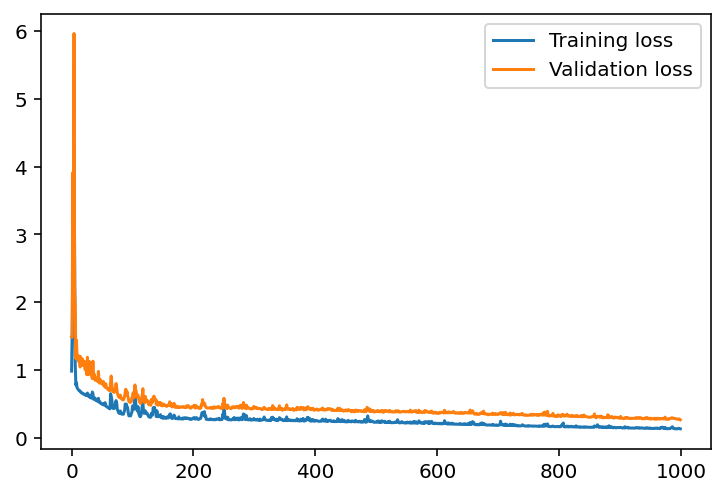

In [145]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## Check out your predictions

Here, use the test data to view how well your network is modeling the data. If something is completely wrong here, make sure each step in your network is implemented correctly.

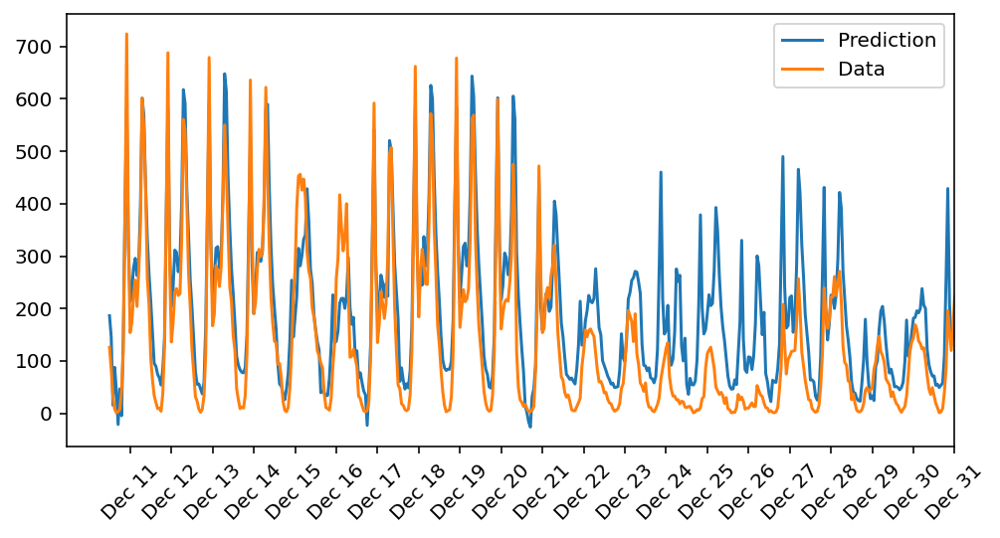

In [155]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.iloc[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## OPTIONAL: Thinking about your results(this question will not be evaluated in the rubric).
 
Answer these questions about your results. How well does the model predict the data? Where does it fail? Why does it fail where it does?

> **Note:** You can edit the text in this cell by double clicking on it. When you want to render the text, press control + enter

#### Your answer below

The model generalises well for first 11 days till 21st of December.<br> <br> It is not able to predictly well the bike-sharing pattern around Christmas holidays. Which is in fact hard to predict than pattern of days which are not around Christmas.